In [4]:
import xarray as xr
import os
import numpy as np
import matplotlib.pyplot as plt

In [5]:
%cd /N/project/Zli_lab/ERA5_land_data_recalculated
curr_data_path = os.getcwd()
curr_data_path

/N/project/Zli_lab/ERA5_land_data_recalculated


'/N/project/Zli_lab/ERA5_land_data_recalculated'

In [3]:
# path=[]
# year_ind = 0
# for year in range(1979, 2024):
#     path.append(os.path.join(curr_data_path, f"Hourly_Total_Precipitation_T_{str(6).zfill(2)}{year}.nc"))
#     path.append(os.path.join(curr_data_path, f"Hourly_Total_Precipitation_T_{str(7).zfill(2)}{year}.nc"))
#     path.append(os.path.join(curr_data_path, f"Hourly_Total_Precipitation_T_{str(8).zfill(2)}{year}.nc"))
#     year_ind+=1
# print(year_ind)

In [4]:
# def R99pa1hr(data,thresh):
#     nan_mask = np.isnan(data)
#     binary_mask = np.where(nan_mask, 0, 1)
#     numeric_indices = np.where(binary_mask == 1)[0]
    
#     if len(numeric_indices) == 0:
#         maxima_data = np.full_like(data, np.nan)
#     else:
#         masked_data = np.where(np.isnan(data), 0, data)
#         mask = masked_data > thresh
#         maxima_data = np.where(mask, data, np.nan)
        
#     return maxima_data

In [6]:
# thresh = xr.open_dataset(f'{curr_data_path}/R99pw1hr/wet_hour_thresh/JJA_thresh.nc')

In [7]:
# for file in path[30:]:
#     data = xr.open_dataset(file)
#     tmp = R99pa1hr(data.tp.values, thresh.thresh.values)
#     data['R99pa1hr'] = (('time','latitude', 'longitude'), tmp)
#     data.to_netcdf(os.path.join(curr_data_path, 'R99pw1hr/wet_hour_prcp', os.path.basename(file)))
#     print(file)

In [8]:
# data = xr.open_mfdataset(path[0:30])

## Get LST hours

In [4]:
def lst(time, long):
    offset = round(long/15)
    lst_time = time + offset
    if lst_time < 0:
        return lst_time + 24
    elif lst_time >= 24:
        print(lst_time)
        return lst_time - 24
    else:
        return lst_time
    
vec_utc_to_lst = np.vectorize(lst)

## Spatial Grouping

In [71]:
from affine import Affine
from rasterio import features

def rasterize(shapes, coords, fill=np.nan, **kwargs):
    """Rasterize a list of (geometry, fill_value) tuples onto the given
    xarray coordinates. This only works for 1d latitude and longitude
    arrays.
    """
    def transform_from_latlon(lat, lon):
        lat = np.asarray(lat)
        lon = np.asarray(lon)
        trans = Affine.translation(lon[0], lat[0])
        scale = Affine.scale(lon[1] - lon[0], lat[1] - lat[0])
        return trans * scale

    transform = transform_from_latlon(coords['latitude'], coords['longitude'])
    out_shape = (len(coords['latitude']), len(coords['longitude']))
    raster = features.rasterize(shapes, out_shape=out_shape,
                                fill=fill, transform=transform,
                                dtype=float, **kwargs)
    return xr.DataArray(raster, coords=coords, dims=('latitude', 'longitude'))

import geopandas as gpd

US = gpd.read_file('../tl_2019_us_state/tl_2019_us_state.shp')

NE_states = ['CT','DE','ME','MD','MA','NH','NJ','NY','PA','RI','VT','WV']
Midwest_states = ['IA','MI','MN','WI','IL','IN','MO','OH']
SE_states = ['AL','FL','GA','NC','SC','VA','TN','KY','AR','LA','MS']
NGP_states = ['MT','NE','ND','SD','WY']
SGP_states = ['KS','OK','TX']
SW_states = ['AZ','CO','NM','UT','CA','NV']
NW_states = ['ID','OR','WA']

NE = US[US['STUSPS'].isin(NE_states)]
Midwest = US[US['STUSPS'].isin(Midwest_states)]
SE = US[US['STUSPS'].isin(SE_states)]
NGP = US[US['STUSPS'].isin(NGP_states)]
SGP = US[US['STUSPS'].isin(SGP_states)]
SW = US[US['STUSPS'].isin(SW_states)]
NW = US[US['STUSPS'].isin(NW_states)]

REGIONS = [NE,Midwest,SE,NGP,SGP,SW,NW]
REGION_NAMES = ['NE','Midwest','SE','NGP','SGP','SW','NW']

## JJA First Decade - 1979 - 1988

In [5]:
jja_path_first_dec =[]
year_ind = 0
for year in range(1979, 1989):
    jja_path_first_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(6).zfill(2)}{year}.nc"))
    jja_path_first_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(7).zfill(2)}{year}.nc"))
    jja_path_first_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(8).zfill(2)}{year}.nc"))
    year_ind+=1
print(year_ind)

10


In [160]:
first_decade_lst_hours = {}
ind = 0
for file in jja_path_first_dec:
    data = xr.open_dataset(file)
    for k in range(len(REGIONS)):
        REGIONS[k]['OBJECTID'] = np.arange(len(REGIONS[k])) + 1
        basin_shapes = list(zip(REGIONS[k]["geometry"],REGIONS[k]["OBJECTID"].astype(int)))    
        basin_da = rasterize(basin_shapes,coords=dict(latitude=data['latitude'],longitude=data['longitude']))
        mask = ~np.isnan(basin_da)
        mask_tile = np.tile(mask,(data.R99pa1hr.values.shape[0],1,1))
        P_3mon_copy = np.copy(data.R99pa1hr.values)
        P_3mon_copy[~mask_tile] = np.nan
        data[f'Region_{REGION_NAMES[k]}'] = (('time','latitude', 'longitude'), P_3mon_copy)
        indices = np.where(~np.isnan(data[f'Region_{REGION_NAMES[k]}']))
        lst_time = vec_utc_to_lst(data[f'Region_{REGION_NAMES[k]}'].time[indices[0]].dt.hour.values, data[f'Region_{REGION_NAMES[k]}'].longitude[indices[2]].values)
        if ind == 0:
            print(len(lst_time))
            first_decade_lst_hours[f'Region_{REGION_NAMES[k]}']=lst_time
        else:
            print(len(lst_time))
            first_decade_lst_hours[f'Region_{REGION_NAMES[k]}'] = np.concatenate([first_decade_lst_hours[f'Region_{REGION_NAMES[k]}'], lst_time])
    ind+=1
    print(ind)

/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


1858


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9831


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


13688


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8665


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


12117


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


3078


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


799
1


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4071


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


14532


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


16756


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


11809


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


13141


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8196


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


2459
2


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4373


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


14814


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8955


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5251


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


2978


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


11085


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9980
3


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8068


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


25582


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


12035


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


12665


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8349


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


2496


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5321
4


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


10750


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


22886


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


13747


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4937


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


546


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4657


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


3434
5


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6599


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


27681


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4572


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6647


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


10973


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6880


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


2850
6


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8091


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


19463


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


15576


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5457


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


17517


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


3279


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5882
7


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


12803


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


10276


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


11720


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9124


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5893


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


11849


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4103
8


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


3672


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


7309


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


13534


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


7790


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


7359


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9053


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


257
9


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


10912


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9283


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


27298


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


7900


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


20434


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5235


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8110
10


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6200


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


13001


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


12709


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


11548


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4360


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


15474


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


7299
11


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4761


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


14732


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


14163


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4815


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


1225


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


15797


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


3066
12


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


3958


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4473


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


14305


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


7823


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


13852


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5219


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5340
13


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


7105


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


17600


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6313


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


15908


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


2428


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9604


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


13316
14


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


7799


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


12799


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6028


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6193


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6199


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


30418


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


12046
15


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4870


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


10119


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6524


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9722


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5496


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8600


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6809
16


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9720


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


12971


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


18454


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6802


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


992


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


17692


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5120
17


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4679


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8728


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8383


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4103


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


2064


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


26800


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8341
18


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


2976


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9537


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


15003


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


3952


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


16958


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4383


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8331
19


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9103


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


11524


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


19887


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6697


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


2572


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


17402


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5436
20


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


7016


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


15026


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


29664


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


15817


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


3266


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4515


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


2715
21


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4802


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


11983


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8830


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9279


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5873


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5083


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


2950
22


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


10158


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


29595


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8696


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


12978


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


3227


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


13601


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


3214
23


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5796


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5684


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


14883


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8033


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6264


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


10926


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


2597
24


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4570


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


3200


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


11218


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5551


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9345


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4219


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5853
25


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4851


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


13980


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9051


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


10226


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4886


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9415


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


12875
26


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8625


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


22829


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


15454


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6892


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4866


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


14085


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


1639
27


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


2365


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


3751


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


8645


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5487


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6793


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6845


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


6297
28


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


14961


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


11830


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


13517


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


4557


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


5139


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


9742


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


545
29


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


16102


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


16109


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


17329


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


2930


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


1447


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


17295


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


971
30


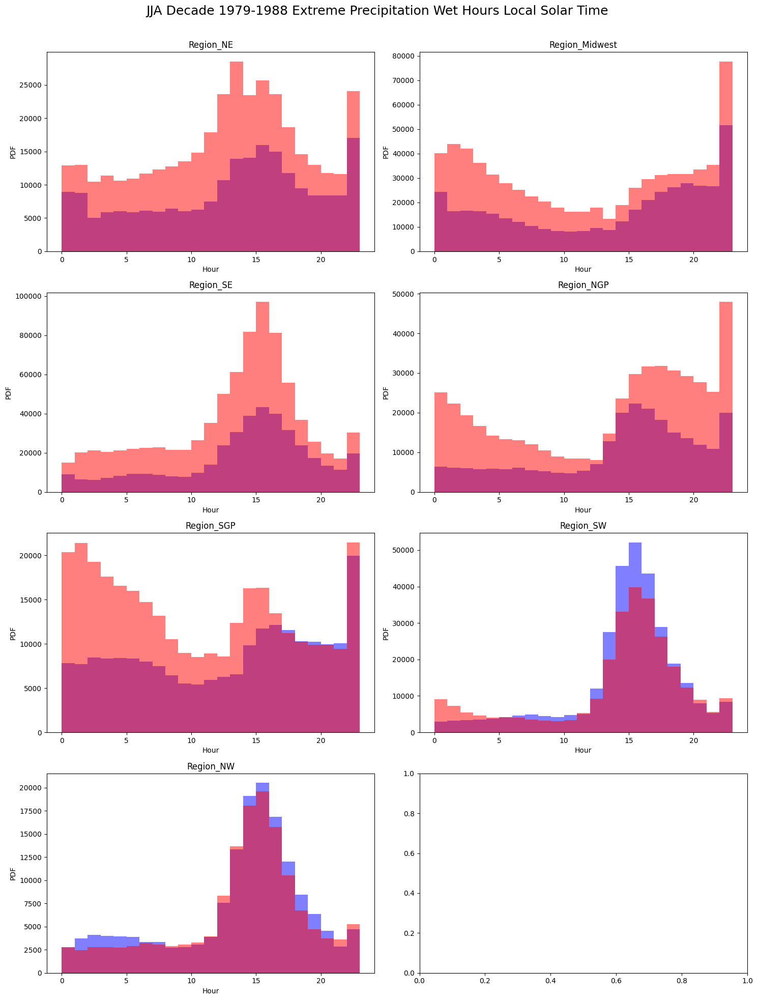

In [249]:
n_rows = 4
n_cols = 2

# Create a figure and axis objects
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 20))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot histograms for each key-value pair
for i, (key, values) in enumerate(first_decade_lst_hours.items()):
    axes[i].hist(values, bins=23, alpha=0.5, color='blue')
    
    axes[i].set_title(f'{key}')
    axes[i].set_xlabel('Hour')
    axes[i].set_ylabel('PDF')

for i, (key, values) in enumerate(fourth_v2_decade_lst_hours.items()):
    axes[i].hist(values, bins=23, alpha=0.5, color='red')

fig.suptitle('JJA Decade 1979-1988 Extreme Precipitation Wet Hours Local Solar Time \n\n', fontsize=18 )

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()


## JJA Second Decade 1989 - 1998

In [183]:
jja_path_second_dec =[]
year_ind = 0
for year in range(1989, 1999):
    jja_path_second_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(6).zfill(2)}{year}.nc"))
    jja_path_second_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(7).zfill(2)}{year}.nc"))
    jja_path_second_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(8).zfill(2)}{year}.nc"))
    year_ind+=1
print(year_ind)

10


In [185]:
second_decade_lst_hours = {}
ind = 0
for file in jja_path_second_dec:
    data = xr.open_dataset(file)
    for k in range(len(REGIONS)):
        REGIONS[k]['OBJECTID'] = np.arange(len(REGIONS[k])) + 1
        basin_shapes = list(zip(REGIONS[k]["geometry"],REGIONS[k]["OBJECTID"].astype(int)))    
        basin_da = rasterize(basin_shapes,coords=dict(latitude=data['latitude'],longitude=data['longitude']))
        mask = ~np.isnan(basin_da)
        mask_tile = np.tile(mask,(data.R99pa1hr.values.shape[0],1,1))
        P_3mon_copy = np.copy(data.R99pa1hr.values)
        P_3mon_copy[~mask_tile] = np.nan
        data[f'Region_{REGION_NAMES[k]}'] = (('time','latitude', 'longitude'), P_3mon_copy)
        indices = np.where(~np.isnan(data[f'Region_{REGION_NAMES[k]}']))
        lst_time = vec_utc_to_lst(data[f'Region_{REGION_NAMES[k]}'].time[indices[0]].dt.hour.values, data[f'Region_{REGION_NAMES[k]}'].longitude[indices[2]].values)
        if ind == 0:
            second_decade_lst_hours[f'Region_{REGION_NAMES[k]}']=lst_time
        else:
            second_decade_lst_hours[f'Region_{REGION_NAMES[k]}'] = np.concatenate([second_decade_lst_hours[f'Region_{REGION_NAMES[k]}'], lst_time])
    ind+=1
    print(ind)

/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

1


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

2


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

3


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

4


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

5


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

6


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

7


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

8


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

9


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

10


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

11


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

12


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

13


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

14


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

15


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

16


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

17


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

18


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

19


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

20


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

21


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

22


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

23


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

24


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

25


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

26


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

27


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

28


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

29


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

30


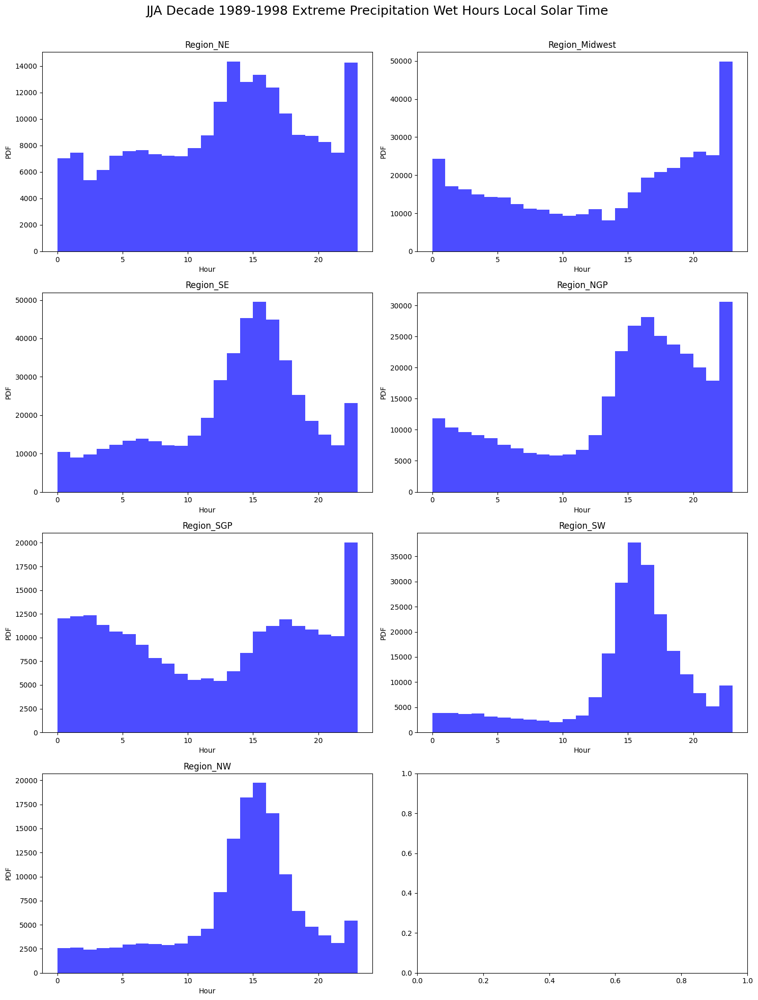

In [214]:
n_rows = 4
n_cols = 2

# Create a figure and axis objects
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 20))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot histograms for each key-value pair
for i, (key, values) in enumerate(second_decade_lst_hours.items()):
    axes[i].hist(values, bins=23, alpha=0.7, color='blue')
    axes[i].set_title(f'{key}')
    axes[i].set_xlabel('Hour')
    axes[i].set_ylabel('PDF')

fig.suptitle('JJA Decade 1989-1998 Extreme Precipitation Wet Hours Local Solar Time \n\n', fontsize=18 )

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()



## JJA Third Decade 1999- 2008

In [187]:
jja_path_third_dec =[]
year_ind = 0
for year in range(1999, 2009):
    jja_path_third_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(6).zfill(2)}{year}.nc"))
    jja_path_third_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(7).zfill(2)}{year}.nc"))
    jja_path_third_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(8).zfill(2)}{year}.nc"))
    year_ind+=1
print(year_ind)

10


In [189]:
third_decade_lst_hours = {}
ind = 0
for file in jja_path_third_dec:
    data = xr.open_dataset(file)
    for k in range(len(REGIONS)):
        REGIONS[k]['OBJECTID'] = np.arange(len(REGIONS[k])) + 1
        basin_shapes = list(zip(REGIONS[k]["geometry"],REGIONS[k]["OBJECTID"].astype(int)))    
        basin_da = rasterize(basin_shapes,coords=dict(latitude=data['latitude'],longitude=data['longitude']))
        mask = ~np.isnan(basin_da)
        mask_tile = np.tile(mask,(data.R99pa1hr.values.shape[0],1,1))
        P_3mon_copy = np.copy(data.R99pa1hr.values)
        P_3mon_copy[~mask_tile] = np.nan
        data[f'Region_{REGION_NAMES[k]}'] = (('time','latitude', 'longitude'), P_3mon_copy)
        indices = np.where(~np.isnan(data[f'Region_{REGION_NAMES[k]}']))
        lst_time = vec_utc_to_lst(data[f'Region_{REGION_NAMES[k]}'].time[indices[0]].dt.hour.values, data[f'Region_{REGION_NAMES[k]}'].longitude[indices[2]].values)
        if ind == 0:
            third_decade_lst_hours[f'Region_{REGION_NAMES[k]}']=lst_time
        else:
            third_decade_lst_hours[f'Region_{REGION_NAMES[k]}'] = np.concatenate([third_decade_lst_hours[f'Region_{REGION_NAMES[k]}'], lst_time])
    ind+=1
    print(ind)

/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

1


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

2


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

3


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

4


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

5


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

6


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

7


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

8


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

9


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

10


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

11


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

12


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

13


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

14


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

15


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

16


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

17


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

18


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

19


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

20


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

21


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

22


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

23


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

24


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

25


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

26


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

27


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

28


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

29


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

30


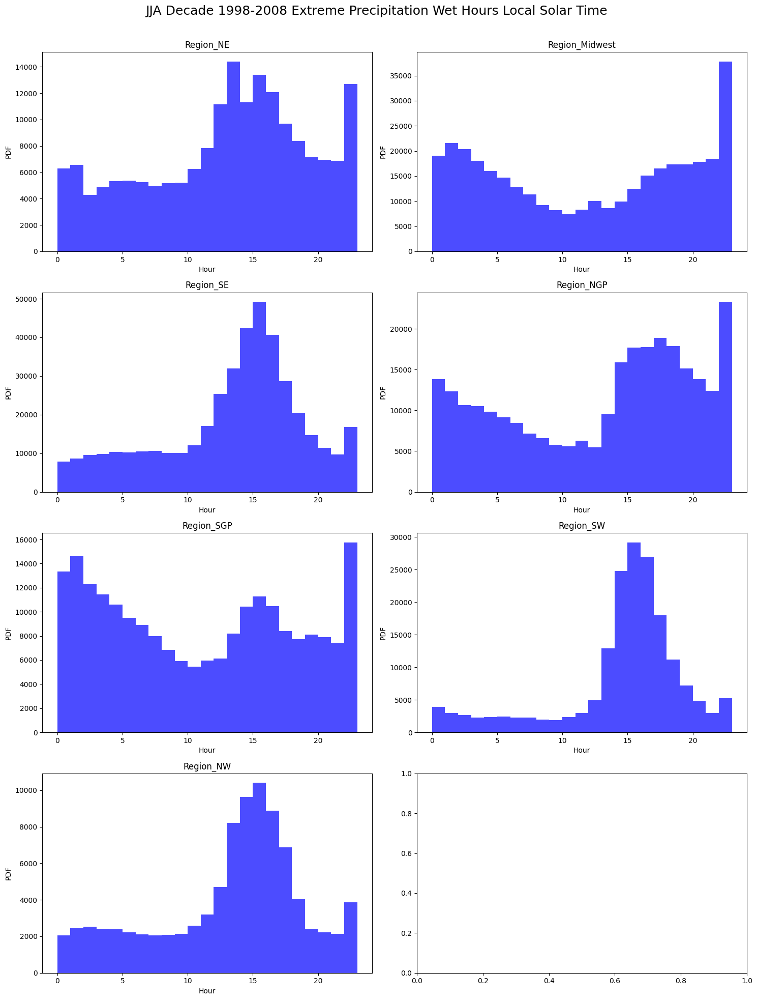

In [213]:
n_rows = 4
n_cols = 2

# Create a figure and axis objects
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 20))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot histograms for each key-value pair
for i, (key, values) in enumerate(third_decade_lst_hours.items()):
    axes[i].hist(values, bins=23, alpha=0.7, color='blue')
    axes[i].set_title(f'{key}')
    axes[i].set_xlabel('Hour')
    axes[i].set_ylabel('PDF')

fig.suptitle('JJA Decade 1998-2008 Extreme Precipitation Wet Hours Local Solar Time \n\n', fontsize=18 )

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()




## JJA Fourth Decade v1 2009 - 2018

In [191]:
jja_path_fourth_v1_dec =[]
year_ind = 0
for year in range(2009, 2019):
    jja_path_fourth_v1_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(6).zfill(2)}{year}.nc"))
    jja_path_fourth_v1_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(7).zfill(2)}{year}.nc"))
    jja_path_fourth_v1_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(8).zfill(2)}{year}.nc"))
    year_ind+=1
print(year_ind)

10


In [192]:
fourth_v1_decade_lst_hours = {}
ind = 0
for file in jja_path_fourth_v1_dec:
    data = xr.open_dataset(file)
    for k in range(len(REGIONS)):
        REGIONS[k]['OBJECTID'] = np.arange(len(REGIONS[k])) + 1
        basin_shapes = list(zip(REGIONS[k]["geometry"],REGIONS[k]["OBJECTID"].astype(int)))    
        basin_da = rasterize(basin_shapes,coords=dict(latitude=data['latitude'],longitude=data['longitude']))
        mask = ~np.isnan(basin_da)
        mask_tile = np.tile(mask,(data.R99pa1hr.values.shape[0],1,1))
        P_3mon_copy = np.copy(data.R99pa1hr.values)
        P_3mon_copy[~mask_tile] = np.nan
        data[f'Region_{REGION_NAMES[k]}'] = (('time','latitude', 'longitude'), P_3mon_copy)
        indices = np.where(~np.isnan(data[f'Region_{REGION_NAMES[k]}']))
        lst_time = vec_utc_to_lst(data[f'Region_{REGION_NAMES[k]}'].time[indices[0]].dt.hour.values, data[f'Region_{REGION_NAMES[k]}'].longitude[indices[2]].values)
        if ind == 0:
            fourth_v1_decade_lst_hours[f'Region_{REGION_NAMES[k]}']=lst_time
        else:
            fourth_v1_decade_lst_hours[f'Region_{REGION_NAMES[k]}'] = np.concatenate([fourth_v1_decade_lst_hours[f'Region_{REGION_NAMES[k]}'], lst_time])
    ind+=1
    print(ind)

/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

1


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

2


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

3


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

4


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

5


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

6


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

7


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

8


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

9


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

10


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

11


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

12


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

13


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

14


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

15


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

16


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

17


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

18


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

19


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

20


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

21


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

22


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

23


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

24


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

25


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

26


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

27


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

28


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

29


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

30


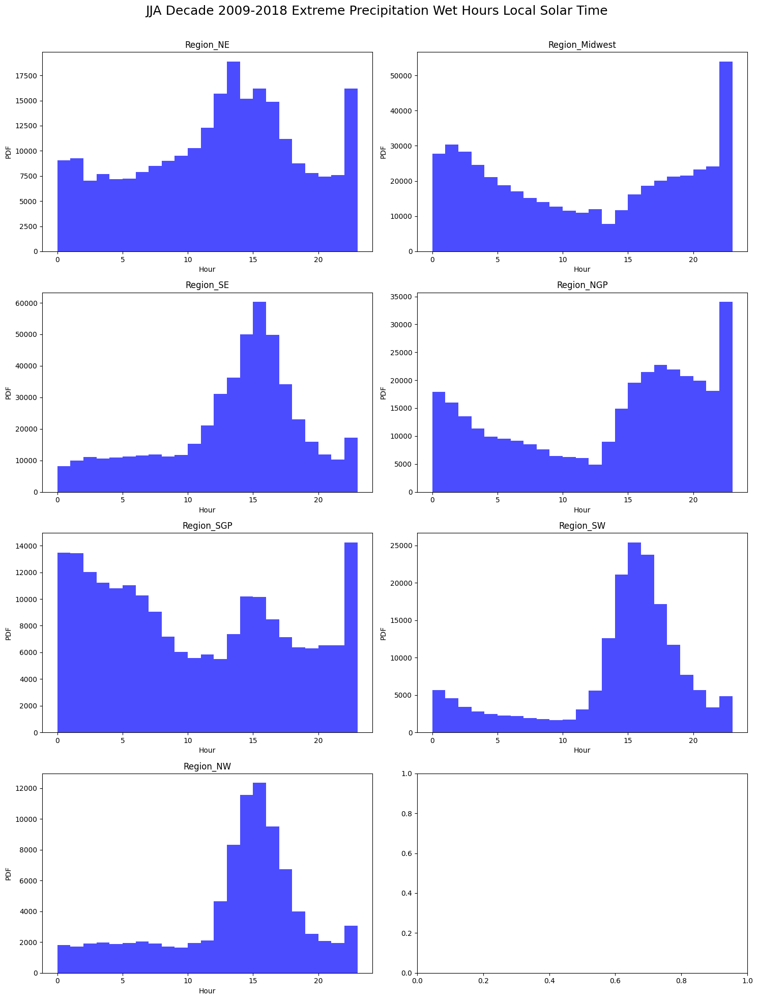

In [212]:
n_rows = 4
n_cols = 2

# Create a figure and axis objects
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 20))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot histograms for each key-value pair
for i, (key, values) in enumerate(fourth_v1_decade_lst_hours.items()):
    axes[i].hist(values, bins=23, alpha=0.7, color='blue')
    axes[i].set_title(f'{key}')
    axes[i].set_xlabel('Hour')
    axes[i].set_ylabel('PDF')

    
fig.suptitle('JJA Decade 2009-2018 Extreme Precipitation Wet Hours Local Solar Time \n\n', fontsize=18 )

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()



## JJA Fourth Decade v2 2009 - 2023

In [194]:
jja_path_fourth_v2_dec =[]
year_ind = 0
for year in range(2009, 2024):
    jja_path_fourth_v2_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(6).zfill(2)}{year}.nc"))
    jja_path_fourth_v2_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(7).zfill(2)}{year}.nc"))
    jja_path_fourth_v2_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(8).zfill(2)}{year}.nc"))
    year_ind+=1
print(year_ind)

15


In [195]:
fourth_v2_decade_lst_hours = {}
ind = 0
for file in jja_path_fourth_v2_dec:
    data = xr.open_dataset(file)
    for k in range(len(REGIONS)):
        REGIONS[k]['OBJECTID'] = np.arange(len(REGIONS[k])) + 1
        basin_shapes = list(zip(REGIONS[k]["geometry"],REGIONS[k]["OBJECTID"].astype(int)))    
        basin_da = rasterize(basin_shapes,coords=dict(latitude=data['latitude'],longitude=data['longitude']))
        mask = ~np.isnan(basin_da)
        mask_tile = np.tile(mask,(data.R99pa1hr.values.shape[0],1,1))
        P_3mon_copy = np.copy(data.R99pa1hr.values)
        P_3mon_copy[~mask_tile] = np.nan
        data[f'Region_{REGION_NAMES[k]}'] = (('time','latitude', 'longitude'), P_3mon_copy)
        indices = np.where(~np.isnan(data[f'Region_{REGION_NAMES[k]}']))
        lst_time = vec_utc_to_lst(data[f'Region_{REGION_NAMES[k]}'].time[indices[0]].dt.hour.values, data[f'Region_{REGION_NAMES[k]}'].longitude[indices[2]].values)
        if ind == 0:
            fourth_v2_decade_lst_hours[f'Region_{REGION_NAMES[k]}']=lst_time
        else:
            fourth_v2_decade_lst_hours[f'Region_{REGION_NAMES[k]}'] = np.concatenate([fourth_v2_decade_lst_hours[f'Region_{REGION_NAMES[k]}'], lst_time])
    ind+=1
    print(ind)

/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

1


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

2


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

3


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

4


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

5


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

6


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

7


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

8


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

9


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

10


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

11


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

12


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

13


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

14


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

15


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

16


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

17


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

18


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

19


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

20


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

21


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

22


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

23


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

24


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

25


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

26


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

27


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

28


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

29


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

30


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

31


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

32


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

33


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

34


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

35


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

36


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

37


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

38


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

39


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

40


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

41


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

42


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

43


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

44


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

45


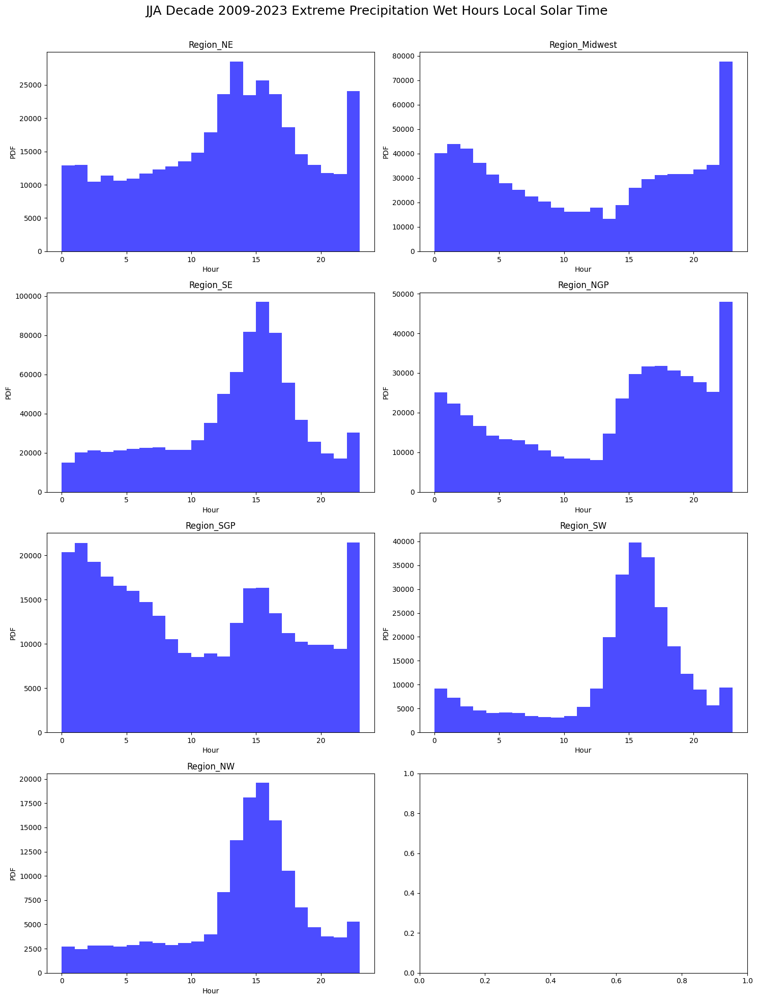

In [211]:
n_rows = 4
n_cols = 2

# Create a figure and axis objects
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 20))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot histograms for each key-value pair
for i, (key, values) in enumerate(fourth_v2_decade_lst_hours.items()):
    axes[i].hist(values, bins=23, alpha=0.7, color='blue')
    axes[i].set_title(f'{key}')
    axes[i].set_xlabel('Hour')
    axes[i].set_ylabel('PDF')

fig.suptitle('JJA Decade 2009-2023 Extreme Precipitation Wet Hours Local Solar Time \n\n', fontsize=18 )

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()




## JJA Fifth Decade 2019 - 2023

In [199]:
jja_path_fifth_dec =[]
year_ind = 0
for year in range(2019, 2024):
    jja_path_fifth_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(6).zfill(2)}{year}.nc"))
    jja_path_fifth_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(7).zfill(2)}{year}.nc"))
    jja_path_fifth_dec.append(os.path.join(curr_data_path, f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(8).zfill(2)}{year}.nc"))
    year_ind+=1
print(year_ind)

5


In [200]:
fifth_decade_lst_hours = {}
ind = 0
for file in jja_path_fifth_dec:
    data = xr.open_dataset(file)
    for k in range(len(REGIONS)):
        REGIONS[k]['OBJECTID'] = np.arange(len(REGIONS[k])) + 1
        basin_shapes = list(zip(REGIONS[k]["geometry"],REGIONS[k]["OBJECTID"].astype(int)))    
        basin_da = rasterize(basin_shapes,coords=dict(latitude=data['latitude'],longitude=data['longitude']))
        mask = ~np.isnan(basin_da)
        mask_tile = np.tile(mask,(data.R99pa1hr.values.shape[0],1,1))
        P_3mon_copy = np.copy(data.R99pa1hr.values)
        P_3mon_copy[~mask_tile] = np.nan
        data[f'Region_{REGION_NAMES[k]}'] = (('time','latitude', 'longitude'), P_3mon_copy)
        indices = np.where(~np.isnan(data[f'Region_{REGION_NAMES[k]}']))
        lst_time = vec_utc_to_lst(data[f'Region_{REGION_NAMES[k]}'].time[indices[0]].dt.hour.values, data[f'Region_{REGION_NAMES[k]}'].longitude[indices[2]].values)
        if ind == 0:
            fifth_decade_lst_hours[f'Region_{REGION_NAMES[k]}']=lst_time
        else:
            fifth_decade_lst_hours[f'Region_{REGION_NAMES[k]}'] = np.concatenate([fifth_decade_lst_hours[f'Region_{REGION_NAMES[k]}'], lst_time])
    ind+=1
    print(ind)

/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

1


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

2


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

3


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

4


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

5


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

6


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

7


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

8


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

9


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

10


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

11


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

12


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

13


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

14


/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/N/u/amulla/Quartz/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

15


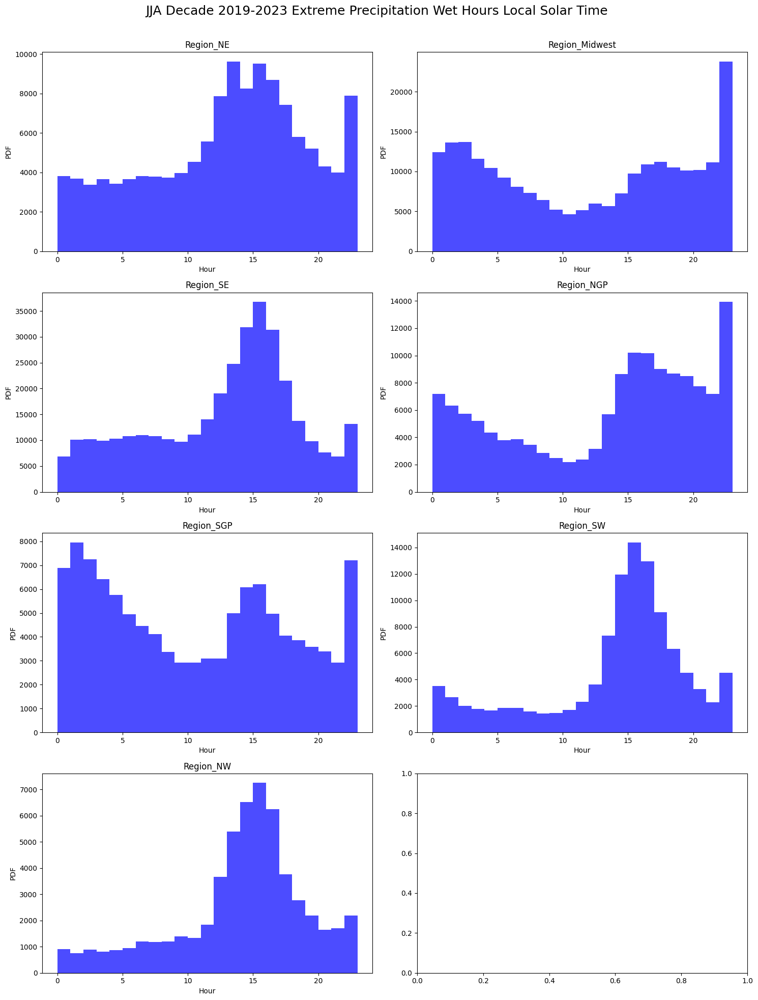

In [210]:
n_rows = 4
n_cols = 2

# Create a figure and axis objects
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 20))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot histograms for each key-value pair
for i, (key, values) in enumerate(fifth_decade_lst_hours.items()):
    axes[i].hist(values, bins=23, alpha=0.7, color='blue')
    axes[i].set_title(f'{key}')
    axes[i].set_xlabel('Hour')
    axes[i].set_ylabel('PDF')
    
fig.suptitle('JJA Decade 2019-2023 Extreme Precipitation Wet Hours Local Solar Time \n\n', fontsize=18 )

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
### Verify 2020-07 google earth engine and ERA5-land

In [240]:
import pandas as pd
sample = pd.read_csv('../HourlyPrecipitation_Indianapolis_processed.csv')

In [241]:
era5 = xr.open_dataset('Hourly_Total_Precipitation_T_072020.nc')

In [244]:
indy= era5.sel(latitude = 39.7684, longitude=-86.1581, method='nearest') 

In [248]:
indy.tp[:10]

<xarray.DataArray 'tp' (time: 10)> Size: 80B
[10 values with dtype=float64]
Coordinates:
  * time       (time) datetime64[ns] 80B 2020-07-01 ... 2020-07-01T09:00:00
    longitude  float32 4B -86.2
    latitude   float32 4B 39.8

In [250]:
## Plot Map 

In [1]:
# import
import os
import glob
import numpy as np
import pandas as pd
import xarray as xr
# import rioxarray as rxr
# import xesmf as xe
from datetime import datetime
import warnings
warnings.filterwarnings(action='ignore')

# import statsmodels.api as smapi
from scipy import stats

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.gridspec as gridspec
import cartopy.feature as cfeature
import cartopy.crs as ccrs
import cartopy 
import matplotlib.colors as mcolors

In [6]:
jja_files = []
for month in range(6,9):
    for year in range(1979,1989):
        filename = f"Hourly_Total_Precipitation_T_{str(month).zfill(2)}{year}.nc"
        jja_files.append(filename)

data = xr.open_mfdataset(jja_files)
data

<xarray.Dataset> Size: 27GB
Dimensions:    (time: 22080, latitude: 261, longitude: 591)
Coordinates:
  * time       (time) datetime64[ns] 177kB 1979-06-01 ... 1988-08-31T23:00:00
  * longitude  (longitude) float32 2kB -125.0 -124.9 -124.8 ... -66.1 -66.0
  * latitude   (latitude) float32 1kB 50.0 49.9 49.8 49.7 ... 24.2 24.1 24.0
Data variables:
    tp         (time, latitude, longitude) float64 27GB dask.array<chunksize=(720, 261, 591), meta=np.ndarray>

In [7]:
import fsspec
import geopandas as gpd
import shapely.vectorized


shapefile_path = "R99pw1hr/ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp"
gdf = gpd.read_file(shapefile_path)

# Step 3: Filter the DataFrame for the USA
usa_gdf = gdf[gdf['NAME'] == 'United States of America']
    
xx, yy = np.meshgrid(data.longitude.values, data.latitude.values)

mask = shapely.vectorized.contains(usa_gdf.dissolve().geometry.item(), xx,yy)

In [10]:
freq_prcp_hour_first_decade = xr.open_dataset("R99pw1hr/freq_prcp_hours_first_decade.nc")
freq_prcp_hour_second_decade = xr.open_dataset("R99pw1hr/freq_prcp_hours_second_decade.nc")
freq_prcp_hour_third_decade = xr.open_dataset("R99pw1hr/freq_prcp_hours_third_decade.nc")
freq_prcp_hour_fourth_decade = xr.open_dataset("R99pw1hr/freq_prcp_hours_fourth_decade.nc")
freq_prcp_hour_fifth_decade = xr.open_dataset("R99pw1hr/freq_prcp_hours_fifth_decade.nc")
freq_prcp_hour_fifth_decade_v2 = xr.open_dataset("R99pw1hr/freq_prcp_hours_fifth_decade_v2.nc")

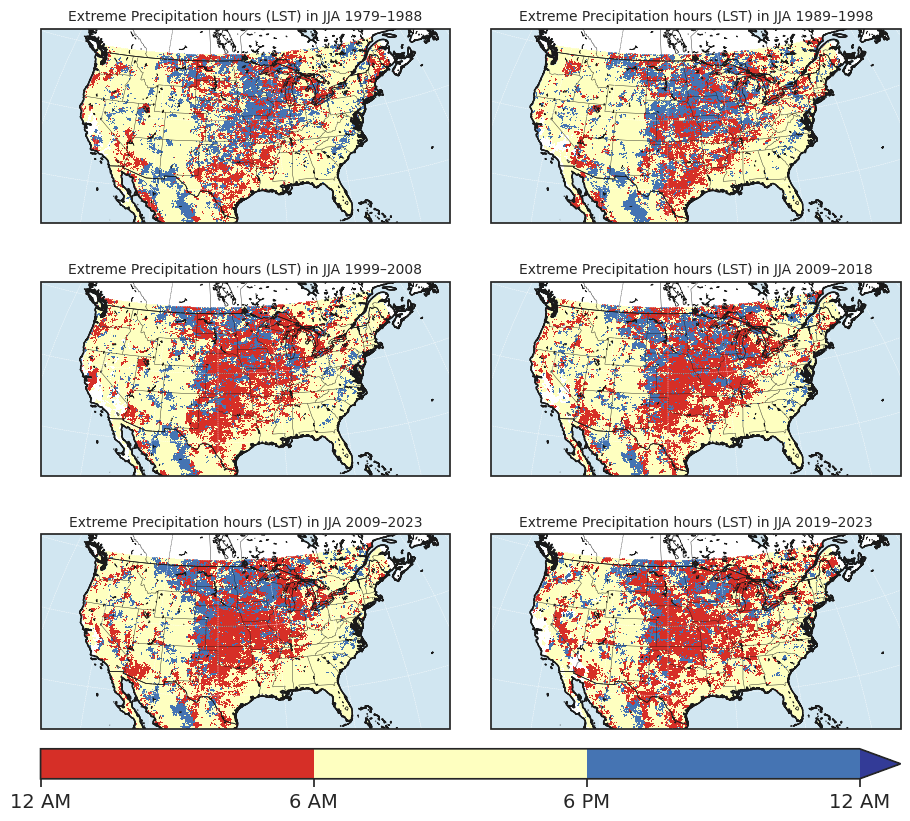

<Figure size 640x480 with 0 Axes>

In [58]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.gridspec as gridspec

# Assuming the following are your six different datasets
datasets = [
    freq_prcp_hour_first_decade, 
    freq_prcp_hour_second_decade, 
    freq_prcp_hour_third_decade, 
    freq_prcp_hour_fourth_decade, 
    freq_prcp_hour_fifth_decade, 
    freq_prcp_hour_fifth_decade_v2
]

# Titles for each subplot
titles = [
    'Extreme Precipitation hours (LST) in JJA 1979–1988', 
    'Extreme Precipitation hours (LST) in JJA 1989–1998', 
    'Extreme Precipitation hours (LST) in JJA 1999–2008', 
    'Extreme Precipitation hours (LST) in JJA 2009–2018', 
    'Extreme Precipitation hours (LST) in JJA 2009–2023', 
    'Extreme Precipitation hours (LST) in JJA 2019–2023'
]

# Define day and night time ranges
daytime_hours = range(6, 18)
nighttime_hours = list(range(0, 6)) + list(range(18, 24))

# Update bounds for daytime and nighttime separation
bounds = np.array([0, 6, 18, 24])
cols = plt.get_cmap('RdYlBu')(np.linspace(0.1, 0.9, len(bounds) - 1))
cmap = mpl.colors.ListedColormap(cols)
cmap.set_over(plt.get_cmap('RdYlBu')(0.99))
cmap.set_under(plt.get_cmap('RdYlBu')(0))
norm = mpl.colors.BoundaryNorm(boundaries=bounds, ncolors=len(bounds) - 1)
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

extent_lonlat = (-126, -65, 23, 51)
ocean_color = np.float64([209, 230, 241]) / 255

latmin, latmax = 30, 45
lonmin, lonmax = -105, -85

sns.set(font_scale=1.7, style="dark")

fig = plt.figure(figsize=(10, 10), tight_layout=True)
ncols = 2
nrows = 3
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, figure=fig)
gs.update(left=0.1, right=0.96, top=0.9, bottom=0.2, wspace=0.1, hspace=0.3)  # Increased hspace
bottoms, tops, lefts, rights = gs.get_grid_positions(fig)

axes = []
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none'
)

newcoast = cfeature.NaturalEarthFeature('physical', 'coastline', '10m',
                                        edgecolor='k', facecolor='none')
newlake = cfeature.NaturalEarthFeature('physical', 'lakes', '10m', edgecolor='k', facecolor='none')
plt.rcParams["axes.edgecolor"] = "0.15"

for i in range(nrows):
    for j in range(ncols):
        index = i * ncols + j
        if index >= len(datasets):
            break
        data = datasets[index]
        ax = fig.add_subplot(gs[i, j], projection=ccrs.Orthographic(central_longitude=-100, central_latitude=25))
        
        # Separate data into day and night
        day_mask = np.isin(data.hour.values, daytime_hours)
        night_mask = np.isin(data.hour.values, nighttime_hours)

        # Plot day data
        ax.pcolormesh(data.longitude.values, data.latitude.values, np.where(day_mask, data.hour, np.nan),
                      transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)

        # Plot night data
        ax.pcolormesh(data.longitude.values, data.latitude.values, np.where(night_mask, data.hour, np.nan),
                      transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)
        
        ax.coastlines()
        ax.set_global()
        ax.set_extent(extent_lonlat, crs=ccrs.PlateCarree())
        ax.gridlines(xlocs=np.arange(-180, 190, 10), ylocs=np.arange(-180, 190, 10), linestyle="--", linewidth=0.3)
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(states_provinces, linewidth=0.3, linestyle='-', edgecolor='k')
        ax.add_feature(newcoast, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(newlake, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.LAND, color='w', zorder=0, edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN, color=ocean_color, zorder=0, edgecolor='k')
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN, color=ocean_color, zorder=1)
        ax.add_feature(newcoast, linewidth=1, linestyle='-', zorder=2, edgecolor='k')
        
        # Set title for each subplot
        ax.set_title(titles[index], size =10)
        
        ax.set_aspect("auto")
        axes.append(ax)

cbar_ax = fig.add_axes([lefts[0], 0.15, rights[-1] - lefts[0], 0.03])
cb = fig.colorbar(sm, cax=cbar_ax, orientation="horizontal", pad=0.02, ticks=bounds, use_gridspec=True, extend="max", fraction=0.1)
cb.ax.set_xticklabels(['12 AM', '6 AM', '6 PM', '12 AM'], size=14)

fig1 = plt.gcf()
plt.show()
plt.draw()


In [57]:
rights

array([0.50952381, 0.96      ])

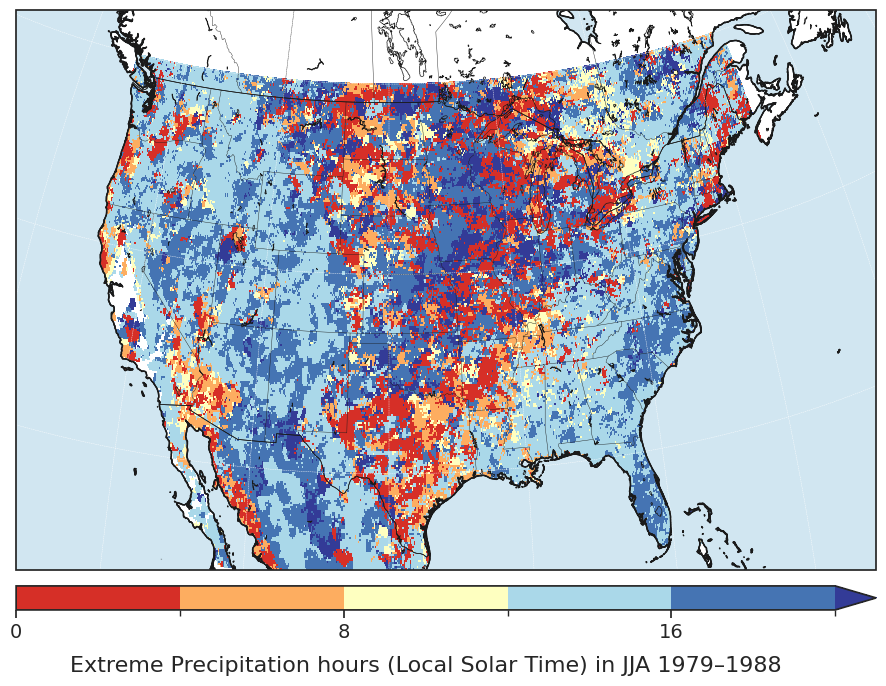

<Figure size 640x480 with 0 Axes>

In [54]:
# colorbar for column1

bounds = np.arange(0,24,4)
cols = plt.get_cmap('RdYlBu')(np.linspace(0.1,0.9,len(bounds)-1))#RdBu 
cmap = mpl.colors.ListedColormap(cols) 
cmap.set_over(plt.get_cmap('RdYlBu')(0.99)) 
cmap.set_under(plt.get_cmap('RdYlBu')(0)) 
norm = mpl.colors.BoundaryNorm(boundaries=bounds, ncolors=len(bounds)-1) 
sm = plt.cm.ScalarMappable(norm=norm,cmap=cmap) 
sm.set_array([]) 

extent_lonlat = (-126, -65, 23, 51) #extent_lonlat = (-126, -65, 23, 51)
ocean_color = np.float64([209,230,241])/255

latmin, latmax =  30, 45
lonmin, lonmax = -105, -85 

sns.set(font_scale=1.7, style="dark")

fig = plt.figure(figsize=(10,8),tight_layout = True) #8,10;,tight_layout = True
ncols = 1 ## change values
nrows = 1
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, figure=fig)
gs.update(left = 0.1, right=0.96,top=0.9,bottom=0.2,wspace=0.1, hspace=0)
bottoms, tops, lefts, rights = gs.get_grid_positions(fig)

axes = []
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none')

newcoast = cfeature.NaturalEarthFeature('physical', 'coastline', '10m',
                                        edgecolor='k',facecolor='none')
newlake = cfeature.NaturalEarthFeature('physical', 'lakes', '10m',edgecolor='k', facecolor='none')
plt.rcParams["axes.edgecolor"] = "0.15"

for i in range(nrows):
    for j in range(ncols):        

        ax= fig.add_subplot(gs[i,j], projection= ccrs.Orthographic(central_longitude=-100, central_latitude=25, globe=None))
        ax.pcolormesh(freq_prcp_hour_first_decade.longitude.values, freq_prcp_hour_first_decade.latitude.values, np.where(mask, freq_prcp_hour_first_decade.hour,  np.nan),transform=ccrs.PlateCarree(),cmap=cmap,norm=norm) #Regrid1Deg[0,:,:];mask_concat[0,:,:]
        
       
        ax.coastlines()
        ax.set_global()
        ax.set_extent(extent_lonlat, crs=ccrs.PlateCarree())
        ax.gridlines(xlocs=np.arange(-180,190,10),ylocs=np.arange(-180,190,10),linestyle="--",linewidth=0.3)
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(states_provinces, linewidth=0.3, linestyle='-', edgecolor='k')
        ax.add_feature(newcoast, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(newlake, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.LAND,color='w',zorder=0,edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN,color=ocean_color,zorder=0,edgecolor='k')
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN,color=ocean_color,zorder=1)
        ax.add_feature(newcoast, linewidth=1, linestyle='-', zorder=2,edgecolor='k')

        ax.set_aspect("auto") 
        axes.append(ax)


# Create axes for the colorbar on the same place. 
cbar_ax = fig.add_axes([lefts[0],0.15,rights[0]-lefts[0],0.03]) #[left, bottom, width, height]  
cb = fig.colorbar(sm,cax=cbar_ax,orientation="horizontal",pad=0.02,ticks=bounds[::2],use_gridspec=True,extend="max",fraction=0.1) #drawedges=True, 
cb.ax.set_xticklabels(bounds[::2], size=14)
cb.ax.set_xlabel(r"Extreme Precipitation hours (Local Solar Time) in JJA 1979–1988", size=16, labelpad=10) 

fig1 = plt.gcf()
# plt.tight_layout()
plt.show()
plt.draw()

# fig.savefig('HourlyP06utc.jpg', dpi=300, bbox_inches = "tight")

In [260]:
def lst(time, long):
    offset = round(long/15)
    lst_time = time + offset
    if lst_time < 0:
        return lst_time + 24
    elif lst_time >= 24:
        return lst_time - 24
    else:
        return lst_time
    
vec_utc_to_lst = np.vectorize(lst)

jja_files = []
for month in range(6,9):
    for year in range(1989,1999):
        filename = f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(month).zfill(2)}{year}.nc"
        jja_files.append(filename)

data = xr.open_mfdataset(jja_files)
data


def max_prcp_hour(data, long):
    non_null_indices = np.isnan(data.values)
    hours = data.time.dt.hour[~non_null_indices].values
    if len(hours) !=0:
        lst_hours = vec_utc_to_lst(hours, long)
        unique_elements, counts = np.unique(lst_hours, return_counts=True)
        max_count_index = np.argmax(counts)
        return unique_elements[max_count_index]
    else:
        return np.nan
    

freq_prcp_hours = []
for i in range(261):
    for j in range(591):
        print(i,j)
        freq_prcp_hours.append(max_prcp_hour(data.R99pa1hr[:,i,j], data.R99pa1hr[:,i,j].longitude))
        
latitude_values = data.latitude
longitude_values = data.longitude
data_array_test = xr.Dataset(
    coords={"latitude": latitude_values, "longitude": longitude_values},
)

data_array_test['hour'] = (('latitude', 'longitude'), np.array(freq_prcp_hours).reshape(261, 591))
data_array_test.to_netcdf('../freq_prcp_hours_second_decade.nc')

0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
0 9
0 10
0 11
0 12
0 13
0 14
0 15
0 16
0 17
0 18
0 19
0 20
0 21
0 22
0 23
0 24
0 25
0 26
0 27
0 28
0 29
0 30
0 31
0 32
0 33
0 34
0 35
0 36
0 37
0 38
0 39
0 40
0 41
0 42
0 43
0 44
0 45
0 46
0 47
0 48
0 49
0 50
0 51
0 52
0 53
0 54
0 55
0 56
0 57
0 58
0 59
0 60
0 61
0 62
0 63
0 64
0 65
0 66
0 67
0 68
0 69
0 70
0 71
0 72
0 73
0 74
0 75
0 76
0 77
0 78
0 79
0 80
0 81
0 82
0 83
0 84
0 85
0 86
0 87
0 88
0 89
0 90
0 91
0 92
0 93
0 94
0 95
0 96
0 97
0 98
0 99
0 100
0 101
0 102
0 103
0 104
0 105
0 106
0 107
0 108
0 109
0 110
0 111
0 112
0 113
0 114
0 115
0 116
0 117
0 118
0 119
0 120
0 121
0 122
0 123
0 124
0 125
0 126
0 127
0 128
0 129
0 130
0 131
0 132
0 133
0 134
0 135
0 136
0 137
0 138
0 139
0 140
0 141
0 142
0 143
0 144
0 145
0 146
0 147
0 148
0 149
0 150
0 151
0 152
0 153
0 154
0 155
0 156
0 157
0 158
0 159
0 160
0 161
0 162
0 163
0 164
0 165
0 166
0 167
0 168
0 169
0 170
0 171
0 172
0 173
0 174
0 175
0 176
0 177
0 178
0 179
0 180
0 181
0 182
0 183
0 184


2 242
2 243
2 244
2 245
2 246
2 247
2 248
2 249
2 250
2 251
2 252
2 253
2 254
2 255
2 256
2 257
2 258
2 259
2 260
2 261
2 262
2 263
2 264
2 265
2 266
2 267
2 268
2 269
2 270
2 271
2 272
2 273
2 274
2 275
2 276
2 277
2 278
2 279
2 280
2 281
2 282
2 283
2 284
2 285
2 286
2 287
2 288
2 289
2 290
2 291
2 292
2 293
2 294
2 295
2 296
2 297
2 298
2 299
2 300
2 301
2 302
2 303
2 304
2 305
2 306
2 307
2 308
2 309
2 310
2 311
2 312
2 313
2 314
2 315
2 316
2 317
2 318
2 319
2 320
2 321
2 322
2 323
2 324
2 325
2 326
2 327
2 328
2 329
2 330
2 331
2 332
2 333
2 334
2 335
2 336
2 337
2 338
2 339
2 340
2 341
2 342
2 343
2 344
2 345
2 346
2 347
2 348
2 349
2 350
2 351
2 352
2 353
2 354
2 355
2 356
2 357
2 358
2 359
2 360
2 361
2 362
2 363
2 364
2 365
2 366
2 367
2 368
2 369
2 370
2 371
2 372
2 373
2 374
2 375
2 376
2 377
2 378
2 379
2 380
2 381
2 382
2 383
2 384
2 385
2 386
2 387
2 388
2 389
2 390
2 391
2 392
2 393
2 394
2 395
2 396
2 397
2 398
2 399
2 400
2 401
2 402
2 403
2 404
2 405
2 406
2 407
2 40

4 466
4 467
4 468
4 469
4 470
4 471
4 472
4 473
4 474
4 475
4 476
4 477
4 478
4 479
4 480
4 481
4 482
4 483
4 484
4 485
4 486
4 487
4 488
4 489
4 490
4 491
4 492
4 493
4 494
4 495
4 496
4 497
4 498
4 499
4 500
4 501
4 502
4 503
4 504
4 505
4 506
4 507
4 508
4 509
4 510
4 511
4 512
4 513
4 514
4 515
4 516
4 517
4 518
4 519
4 520
4 521
4 522
4 523
4 524
4 525
4 526
4 527
4 528
4 529
4 530
4 531
4 532
4 533
4 534
4 535
4 536
4 537
4 538
4 539
4 540
4 541
4 542
4 543
4 544
4 545
4 546
4 547
4 548
4 549
4 550
4 551
4 552
4 553
4 554
4 555
4 556
4 557
4 558
4 559
4 560
4 561
4 562
4 563
4 564
4 565
4 566
4 567
4 568
4 569
4 570
4 571
4 572
4 573
4 574
4 575
4 576
4 577
4 578
4 579
4 580
4 581
4 582
4 583
4 584
4 585
4 586
4 587
4 588
4 589
4 590
5 0
5 1
5 2
5 3
5 4
5 5
5 6
5 7
5 8
5 9
5 10
5 11
5 12
5 13
5 14
5 15
5 16
5 17
5 18
5 19
5 20
5 21
5 22
5 23
5 24
5 25
5 26
5 27
5 28
5 29
5 30
5 31
5 32
5 33
5 34
5 35
5 36
5 37
5 38
5 39
5 40
5 41
5 42
5 43
5 44
5 45
5 46
5 47
5 48
5 49
5 50
5 51


7 115
7 116
7 117
7 118
7 119
7 120
7 121
7 122
7 123
7 124
7 125
7 126
7 127
7 128
7 129
7 130
7 131
7 132
7 133
7 134
7 135
7 136
7 137
7 138
7 139
7 140
7 141
7 142
7 143
7 144
7 145
7 146
7 147
7 148
7 149
7 150
7 151
7 152
7 153
7 154
7 155
7 156
7 157
7 158
7 159
7 160
7 161
7 162
7 163
7 164
7 165
7 166
7 167
7 168
7 169
7 170
7 171
7 172
7 173
7 174
7 175
7 176
7 177
7 178
7 179
7 180
7 181
7 182
7 183
7 184
7 185
7 186
7 187
7 188
7 189
7 190
7 191
7 192
7 193
7 194
7 195
7 196
7 197
7 198
7 199
7 200
7 201
7 202
7 203
7 204
7 205
7 206
7 207
7 208
7 209
7 210
7 211
7 212
7 213
7 214
7 215
7 216
7 217
7 218
7 219
7 220
7 221
7 222
7 223
7 224
7 225
7 226
7 227
7 228
7 229
7 230
7 231
7 232
7 233
7 234
7 235
7 236
7 237
7 238
7 239
7 240
7 241
7 242
7 243
7 244
7 245
7 246
7 247
7 248
7 249
7 250
7 251
7 252
7 253
7 254
7 255
7 256
7 257
7 258
7 259
7 260
7 261
7 262
7 263
7 264
7 265
7 266
7 267
7 268
7 269
7 270
7 271
7 272
7 273
7 274
7 275
7 276
7 277
7 278
7 279
7 280
7 28

9 337
9 338
9 339
9 340
9 341
9 342
9 343
9 344
9 345
9 346
9 347
9 348
9 349
9 350
9 351
9 352
9 353
9 354
9 355
9 356
9 357
9 358
9 359
9 360
9 361
9 362
9 363
9 364
9 365
9 366
9 367
9 368
9 369
9 370
9 371
9 372
9 373
9 374
9 375
9 376
9 377
9 378
9 379
9 380
9 381
9 382
9 383
9 384
9 385
9 386
9 387
9 388
9 389
9 390
9 391
9 392
9 393
9 394
9 395
9 396
9 397
9 398
9 399
9 400
9 401
9 402
9 403
9 404
9 405
9 406
9 407
9 408
9 409
9 410
9 411
9 412
9 413
9 414
9 415
9 416
9 417
9 418
9 419
9 420
9 421
9 422
9 423
9 424
9 425
9 426
9 427
9 428
9 429
9 430
9 431
9 432
9 433
9 434
9 435
9 436
9 437
9 438
9 439
9 440
9 441
9 442
9 443
9 444
9 445
9 446
9 447
9 448
9 449
9 450
9 451
9 452
9 453
9 454
9 455
9 456
9 457
9 458
9 459
9 460
9 461
9 462
9 463
9 464
9 465
9 466
9 467
9 468
9 469
9 470
9 471
9 472
9 473
9 474
9 475
9 476
9 477
9 478
9 479
9 480
9 481
9 482
9 483
9 484
9 485
9 486
9 487
9 488
9 489
9 490
9 491
9 492
9 493
9 494
9 495
9 496
9 497
9 498
9 499
9 500
9 501
9 502
9 50

11 394
11 395
11 396
11 397
11 398
11 399
11 400
11 401
11 402
11 403
11 404
11 405
11 406
11 407
11 408
11 409
11 410
11 411
11 412
11 413
11 414
11 415
11 416
11 417
11 418
11 419
11 420
11 421
11 422
11 423
11 424
11 425
11 426
11 427
11 428
11 429
11 430
11 431
11 432
11 433
11 434
11 435
11 436
11 437
11 438
11 439
11 440
11 441
11 442
11 443
11 444
11 445
11 446
11 447
11 448
11 449
11 450
11 451
11 452
11 453
11 454
11 455
11 456
11 457
11 458
11 459
11 460
11 461
11 462
11 463
11 464
11 465
11 466
11 467
11 468
11 469
11 470
11 471
11 472
11 473
11 474
11 475
11 476
11 477
11 478
11 479
11 480
11 481
11 482
11 483
11 484
11 485
11 486
11 487
11 488
11 489
11 490
11 491
11 492
11 493
11 494
11 495
11 496
11 497
11 498
11 499
11 500
11 501
11 502
11 503
11 504
11 505
11 506
11 507
11 508
11 509
11 510
11 511
11 512
11 513
11 514
11 515
11 516
11 517
11 518
11 519
11 520
11 521
11 522
11 523
11 524
11 525
11 526
11 527
11 528
11 529
11 530
11 531
11 532
11 533
11 534
11 535
11 536

13 418
13 419
13 420
13 421
13 422
13 423
13 424
13 425
13 426
13 427
13 428
13 429
13 430
13 431
13 432
13 433
13 434
13 435
13 436
13 437
13 438
13 439
13 440
13 441
13 442
13 443
13 444
13 445
13 446
13 447
13 448
13 449
13 450
13 451
13 452
13 453
13 454
13 455
13 456
13 457
13 458
13 459
13 460
13 461
13 462
13 463
13 464
13 465
13 466
13 467
13 468
13 469
13 470
13 471
13 472
13 473
13 474
13 475
13 476
13 477
13 478
13 479
13 480
13 481
13 482
13 483
13 484
13 485
13 486
13 487
13 488
13 489
13 490
13 491
13 492
13 493
13 494
13 495
13 496
13 497
13 498
13 499
13 500
13 501
13 502
13 503
13 504
13 505
13 506
13 507
13 508
13 509
13 510
13 511
13 512
13 513
13 514
13 515
13 516
13 517
13 518
13 519
13 520
13 521
13 522
13 523
13 524
13 525
13 526
13 527
13 528
13 529
13 530
13 531
13 532
13 533
13 534
13 535
13 536
13 537
13 538
13 539
13 540
13 541
13 542
13 543
13 544
13 545
13 546
13 547
13 548
13 549
13 550
13 551
13 552
13 553
13 554
13 555
13 556
13 557
13 558
13 559
13 560

15 442
15 443
15 444
15 445
15 446
15 447
15 448
15 449
15 450
15 451
15 452
15 453
15 454
15 455
15 456
15 457
15 458
15 459
15 460
15 461
15 462
15 463
15 464
15 465
15 466
15 467
15 468
15 469
15 470
15 471
15 472
15 473
15 474
15 475
15 476
15 477
15 478
15 479
15 480
15 481
15 482
15 483
15 484
15 485
15 486
15 487
15 488
15 489
15 490
15 491
15 492
15 493
15 494
15 495
15 496
15 497
15 498
15 499
15 500
15 501
15 502
15 503
15 504
15 505
15 506
15 507
15 508
15 509
15 510
15 511
15 512
15 513
15 514
15 515
15 516
15 517
15 518
15 519
15 520
15 521
15 522
15 523
15 524
15 525
15 526
15 527
15 528
15 529
15 530
15 531
15 532
15 533
15 534
15 535
15 536
15 537
15 538
15 539
15 540
15 541
15 542
15 543
15 544
15 545
15 546
15 547
15 548
15 549
15 550
15 551
15 552
15 553
15 554
15 555
15 556
15 557
15 558
15 559
15 560
15 561
15 562
15 563
15 564
15 565
15 566
15 567
15 568
15 569
15 570
15 571
15 572
15 573
15 574
15 575
15 576
15 577
15 578
15 579
15 580
15 581
15 582
15 583
15 584

17 464
17 465
17 466
17 467
17 468
17 469
17 470
17 471
17 472
17 473
17 474
17 475
17 476
17 477
17 478
17 479
17 480
17 481
17 482
17 483
17 484
17 485
17 486
17 487
17 488
17 489
17 490
17 491
17 492
17 493
17 494
17 495
17 496
17 497
17 498
17 499
17 500
17 501
17 502
17 503
17 504
17 505
17 506
17 507
17 508
17 509
17 510
17 511
17 512
17 513
17 514
17 515
17 516
17 517
17 518
17 519
17 520
17 521
17 522
17 523
17 524
17 525
17 526
17 527
17 528
17 529
17 530
17 531
17 532
17 533
17 534
17 535
17 536
17 537
17 538
17 539
17 540
17 541
17 542
17 543
17 544
17 545
17 546
17 547
17 548
17 549
17 550
17 551
17 552
17 553
17 554
17 555
17 556
17 557
17 558
17 559
17 560
17 561
17 562
17 563
17 564
17 565
17 566
17 567
17 568
17 569
17 570
17 571
17 572
17 573
17 574
17 575
17 576
17 577
17 578
17 579
17 580
17 581
17 582
17 583
17 584
17 585
17 586
17 587
17 588
17 589
17 590
18 0
18 1
18 2
18 3
18 4
18 5
18 6
18 7
18 8
18 9
18 10
18 11
18 12
18 13
18 14
18 15
18 16
18 17
18 18
18 19
1

19 487
19 488
19 489
19 490
19 491
19 492
19 493
19 494
19 495
19 496
19 497
19 498
19 499
19 500
19 501
19 502
19 503
19 504
19 505
19 506
19 507
19 508
19 509
19 510
19 511
19 512
19 513
19 514
19 515
19 516
19 517
19 518
19 519
19 520
19 521
19 522
19 523
19 524
19 525
19 526
19 527
19 528
19 529
19 530
19 531
19 532
19 533
19 534
19 535
19 536
19 537
19 538
19 539
19 540
19 541
19 542
19 543
19 544
19 545
19 546
19 547
19 548
19 549
19 550
19 551
19 552
19 553
19 554
19 555
19 556
19 557
19 558
19 559
19 560
19 561
19 562
19 563
19 564
19 565
19 566
19 567
19 568
19 569
19 570
19 571
19 572
19 573
19 574
19 575
19 576
19 577
19 578
19 579
19 580
19 581
19 582
19 583
19 584
19 585
19 586
19 587
19 588
19 589
19 590
20 0
20 1
20 2
20 3
20 4
20 5
20 6
20 7
20 8
20 9
20 10
20 11
20 12
20 13
20 14
20 15
20 16
20 17
20 18
20 19
20 20
20 21
20 22
20 23
20 24
20 25
20 26
20 27
20 28
20 29
20 30
20 31
20 32
20 33
20 34
20 35
20 36
20 37
20 38
20 39
20 40
20 41
20 42
20 43
20 44
20 45
20 46


21 508
21 509
21 510
21 511
21 512
21 513
21 514
21 515
21 516
21 517
21 518
21 519
21 520
21 521
21 522
21 523
21 524
21 525
21 526
21 527
21 528
21 529
21 530
21 531
21 532
21 533
21 534
21 535
21 536
21 537
21 538
21 539
21 540
21 541
21 542
21 543
21 544
21 545
21 546
21 547
21 548
21 549
21 550
21 551
21 552
21 553
21 554
21 555
21 556
21 557
21 558
21 559
21 560
21 561
21 562
21 563
21 564
21 565
21 566
21 567
21 568
21 569
21 570
21 571
21 572
21 573
21 574
21 575
21 576
21 577
21 578
21 579
21 580
21 581
21 582
21 583
21 584
21 585
21 586
21 587
21 588
21 589
21 590
22 0
22 1
22 2
22 3
22 4
22 5
22 6
22 7
22 8
22 9
22 10
22 11
22 12
22 13
22 14
22 15
22 16
22 17
22 18
22 19
22 20
22 21
22 22
22 23
22 24
22 25
22 26
22 27
22 28
22 29
22 30
22 31
22 32
22 33
22 34
22 35
22 36
22 37
22 38
22 39
22 40
22 41
22 42
22 43
22 44
22 45
22 46
22 47
22 48
22 49
22 50
22 51
22 52
22 53
22 54
22 55
22 56
22 57
22 58
22 59
22 60
22 61
22 62
22 63
22 64
22 65
22 66
22 67
22 68
22 69
22 70
22 

23 534
23 535
23 536
23 537
23 538
23 539
23 540
23 541
23 542
23 543
23 544
23 545
23 546
23 547
23 548
23 549
23 550
23 551
23 552
23 553
23 554
23 555
23 556
23 557
23 558
23 559
23 560
23 561
23 562
23 563
23 564
23 565
23 566
23 567
23 568
23 569
23 570
23 571
23 572
23 573
23 574
23 575
23 576
23 577
23 578
23 579
23 580
23 581
23 582
23 583
23 584
23 585
23 586
23 587
23 588
23 589
23 590
24 0
24 1
24 2
24 3
24 4
24 5
24 6
24 7
24 8
24 9
24 10
24 11
24 12
24 13
24 14
24 15
24 16
24 17
24 18
24 19
24 20
24 21
24 22
24 23
24 24
24 25
24 26
24 27
24 28
24 29
24 30
24 31
24 32
24 33
24 34
24 35
24 36
24 37
24 38
24 39
24 40
24 41
24 42
24 43
24 44
24 45
24 46
24 47
24 48
24 49
24 50
24 51
24 52
24 53
24 54
24 55
24 56
24 57
24 58
24 59
24 60
24 61
24 62
24 63
24 64
24 65
24 66
24 67
24 68
24 69
24 70
24 71
24 72
24 73
24 74
24 75
24 76
24 77
24 78
24 79
24 80
24 81
24 82
24 83
24 84
24 85
24 86
24 87
24 88
24 89
24 90
24 91
24 92
24 93
24 94
24 95
24 96
24 97
24 98
24 99
24 100
24 1

25 558
25 559
25 560
25 561
25 562
25 563
25 564
25 565
25 566
25 567
25 568
25 569
25 570
25 571
25 572
25 573
25 574
25 575
25 576
25 577
25 578
25 579
25 580
25 581
25 582
25 583
25 584
25 585
25 586
25 587
25 588
25 589
25 590
26 0
26 1
26 2
26 3
26 4
26 5
26 6
26 7
26 8
26 9
26 10
26 11
26 12
26 13
26 14
26 15
26 16
26 17
26 18
26 19
26 20
26 21
26 22
26 23
26 24
26 25
26 26
26 27
26 28
26 29
26 30
26 31
26 32
26 33
26 34
26 35
26 36
26 37
26 38
26 39
26 40
26 41
26 42
26 43
26 44
26 45
26 46
26 47
26 48
26 49
26 50
26 51
26 52
26 53
26 54
26 55
26 56
26 57
26 58
26 59
26 60
26 61
26 62
26 63
26 64
26 65
26 66
26 67
26 68
26 69
26 70
26 71
26 72
26 73
26 74
26 75
26 76
26 77
26 78
26 79
26 80
26 81
26 82
26 83
26 84
26 85
26 86
26 87
26 88
26 89
26 90
26 91
26 92
26 93
26 94
26 95
26 96
26 97
26 98
26 99
26 100
26 101
26 102
26 103
26 104
26 105
26 106
26 107
26 108
26 109
26 110
26 111
26 112
26 113
26 114
26 115
26 116
26 117
26 118
26 119
26 120
26 121
26 122
26 123
26 124
26 1

27 580
27 581
27 582
27 583
27 584
27 585
27 586
27 587
27 588
27 589
27 590
28 0
28 1
28 2
28 3
28 4
28 5
28 6
28 7
28 8
28 9
28 10
28 11
28 12
28 13
28 14
28 15
28 16
28 17
28 18
28 19
28 20
28 21
28 22
28 23
28 24
28 25
28 26
28 27
28 28
28 29
28 30
28 31
28 32
28 33
28 34
28 35
28 36
28 37
28 38
28 39
28 40
28 41
28 42
28 43
28 44
28 45
28 46
28 47
28 48
28 49
28 50
28 51
28 52
28 53
28 54
28 55
28 56
28 57
28 58
28 59
28 60
28 61
28 62
28 63
28 64
28 65
28 66
28 67
28 68
28 69
28 70
28 71
28 72
28 73
28 74
28 75
28 76
28 77
28 78
28 79
28 80
28 81
28 82
28 83
28 84
28 85
28 86
28 87
28 88
28 89
28 90
28 91
28 92
28 93
28 94
28 95
28 96
28 97
28 98
28 99
28 100
28 101
28 102
28 103
28 104
28 105
28 106
28 107
28 108
28 109
28 110
28 111
28 112
28 113
28 114
28 115
28 116
28 117
28 118
28 119
28 120
28 121
28 122
28 123
28 124
28 125
28 126
28 127
28 128
28 129
28 130
28 131
28 132
28 133
28 134
28 135
28 136
28 137
28 138
28 139
28 140
28 141
28 142
28 143
28 144
28 145
28 146
28 1

30 13
30 14
30 15
30 16
30 17
30 18
30 19
30 20
30 21
30 22
30 23
30 24
30 25
30 26
30 27
30 28
30 29
30 30
30 31
30 32
30 33
30 34
30 35
30 36
30 37
30 38
30 39
30 40
30 41
30 42
30 43
30 44
30 45
30 46
30 47
30 48
30 49
30 50
30 51
30 52
30 53
30 54
30 55
30 56
30 57
30 58
30 59
30 60
30 61
30 62
30 63
30 64
30 65
30 66
30 67
30 68
30 69
30 70
30 71
30 72
30 73
30 74
30 75
30 76
30 77
30 78
30 79
30 80
30 81
30 82
30 83
30 84
30 85
30 86
30 87
30 88
30 89
30 90
30 91
30 92
30 93
30 94
30 95
30 96
30 97
30 98
30 99
30 100
30 101
30 102
30 103
30 104
30 105
30 106
30 107
30 108
30 109
30 110
30 111
30 112
30 113
30 114
30 115
30 116
30 117
30 118
30 119
30 120
30 121
30 122
30 123
30 124
30 125
30 126
30 127
30 128
30 129
30 130
30 131
30 132
30 133
30 134
30 135
30 136
30 137
30 138
30 139
30 140
30 141
30 142
30 143
30 144
30 145
30 146
30 147
30 148
30 149
30 150
30 151
30 152
30 153
30 154
30 155
30 156
30 157
30 158
30 159
30 160
30 161
30 162
30 163
30 164
30 165
30 166
30 167
30

32 41
32 42
32 43
32 44
32 45
32 46
32 47
32 48
32 49
32 50
32 51
32 52
32 53
32 54
32 55
32 56
32 57
32 58
32 59
32 60
32 61
32 62
32 63
32 64
32 65
32 66
32 67
32 68
32 69
32 70
32 71
32 72
32 73
32 74
32 75
32 76
32 77
32 78
32 79
32 80
32 81
32 82
32 83
32 84
32 85
32 86
32 87
32 88
32 89
32 90
32 91
32 92
32 93
32 94
32 95
32 96
32 97
32 98
32 99
32 100
32 101
32 102
32 103
32 104
32 105
32 106
32 107
32 108
32 109
32 110
32 111
32 112
32 113
32 114
32 115
32 116
32 117
32 118
32 119
32 120
32 121
32 122
32 123
32 124
32 125
32 126
32 127
32 128
32 129
32 130
32 131
32 132
32 133
32 134
32 135
32 136
32 137
32 138
32 139
32 140
32 141
32 142
32 143
32 144
32 145
32 146
32 147
32 148
32 149
32 150
32 151
32 152
32 153
32 154
32 155
32 156
32 157
32 158
32 159
32 160
32 161
32 162
32 163
32 164
32 165
32 166
32 167
32 168
32 169
32 170
32 171
32 172
32 173
32 174
32 175
32 176
32 177
32 178
32 179
32 180
32 181
32 182
32 183
32 184
32 185
32 186
32 187
32 188
32 189
32 190
32 191
32

34 68
34 69
34 70
34 71
34 72
34 73
34 74
34 75
34 76
34 77
34 78
34 79
34 80
34 81
34 82
34 83
34 84
34 85
34 86
34 87
34 88
34 89
34 90
34 91
34 92
34 93
34 94
34 95
34 96
34 97
34 98
34 99
34 100
34 101
34 102
34 103
34 104
34 105
34 106
34 107
34 108
34 109
34 110
34 111
34 112
34 113
34 114
34 115
34 116
34 117
34 118
34 119
34 120
34 121
34 122
34 123
34 124
34 125
34 126
34 127
34 128
34 129
34 130
34 131
34 132
34 133
34 134
34 135
34 136
34 137
34 138
34 139
34 140
34 141
34 142
34 143
34 144
34 145
34 146
34 147
34 148
34 149
34 150
34 151
34 152
34 153
34 154
34 155
34 156
34 157
34 158
34 159
34 160
34 161
34 162
34 163
34 164
34 165
34 166
34 167
34 168
34 169
34 170
34 171
34 172
34 173
34 174
34 175
34 176
34 177
34 178
34 179
34 180
34 181
34 182
34 183
34 184
34 185
34 186
34 187
34 188
34 189
34 190
34 191
34 192
34 193
34 194
34 195
34 196
34 197
34 198
34 199
34 200
34 201
34 202
34 203
34 204
34 205
34 206
34 207
34 208
34 209
34 210
34 211
34 212
34 213
34 214
34 

36 93
36 94
36 95
36 96
36 97
36 98
36 99
36 100
36 101
36 102
36 103
36 104
36 105
36 106
36 107
36 108
36 109
36 110
36 111
36 112
36 113
36 114
36 115
36 116
36 117
36 118
36 119
36 120
36 121
36 122
36 123
36 124
36 125
36 126
36 127
36 128
36 129
36 130
36 131
36 132
36 133
36 134
36 135
36 136
36 137
36 138
36 139
36 140
36 141
36 142
36 143
36 144
36 145
36 146
36 147
36 148
36 149
36 150
36 151
36 152
36 153
36 154
36 155
36 156
36 157
36 158
36 159
36 160
36 161
36 162
36 163
36 164
36 165
36 166
36 167
36 168
36 169
36 170
36 171
36 172
36 173
36 174
36 175
36 176
36 177
36 178
36 179
36 180
36 181
36 182
36 183
36 184
36 185
36 186
36 187
36 188
36 189
36 190
36 191
36 192
36 193
36 194
36 195
36 196
36 197
36 198
36 199
36 200
36 201
36 202
36 203
36 204
36 205
36 206
36 207
36 208
36 209
36 210
36 211
36 212
36 213
36 214
36 215
36 216
36 217
36 218
36 219
36 220
36 221
36 222
36 223
36 224
36 225
36 226
36 227
36 228
36 229
36 230
36 231
36 232
36 233
36 234
36 235
36 236

38 118
38 119
38 120
38 121
38 122
38 123
38 124
38 125
38 126
38 127
38 128
38 129
38 130
38 131
38 132
38 133
38 134
38 135
38 136
38 137
38 138
38 139
38 140
38 141
38 142
38 143
38 144
38 145
38 146
38 147
38 148
38 149
38 150
38 151
38 152
38 153
38 154
38 155
38 156
38 157
38 158
38 159
38 160
38 161
38 162
38 163
38 164
38 165
38 166
38 167
38 168
38 169
38 170
38 171
38 172
38 173
38 174
38 175
38 176
38 177
38 178
38 179
38 180
38 181
38 182
38 183
38 184
38 185
38 186
38 187
38 188
38 189
38 190
38 191
38 192
38 193
38 194
38 195
38 196
38 197
38 198
38 199
38 200
38 201
38 202
38 203
38 204
38 205
38 206
38 207
38 208
38 209
38 210
38 211
38 212
38 213
38 214
38 215
38 216
38 217
38 218
38 219
38 220
38 221
38 222
38 223
38 224
38 225
38 226
38 227
38 228
38 229
38 230
38 231
38 232
38 233
38 234
38 235
38 236
38 237
38 238
38 239
38 240
38 241
38 242
38 243
38 244
38 245
38 246
38 247
38 248
38 249
38 250
38 251
38 252
38 253
38 254
38 255
38 256
38 257
38 258
38 259
38 260

40 141
40 142
40 143
40 144
40 145
40 146
40 147
40 148
40 149
40 150
40 151
40 152
40 153
40 154
40 155
40 156
40 157
40 158
40 159
40 160
40 161
40 162
40 163
40 164
40 165
40 166
40 167
40 168
40 169
40 170
40 171
40 172
40 173
40 174
40 175
40 176
40 177
40 178
40 179
40 180
40 181
40 182
40 183
40 184
40 185
40 186
40 187
40 188
40 189
40 190
40 191
40 192
40 193
40 194
40 195
40 196
40 197
40 198
40 199
40 200
40 201
40 202
40 203
40 204
40 205
40 206
40 207
40 208
40 209
40 210
40 211
40 212
40 213
40 214
40 215
40 216
40 217
40 218
40 219
40 220
40 221
40 222
40 223
40 224
40 225
40 226
40 227
40 228
40 229
40 230
40 231
40 232
40 233
40 234
40 235
40 236
40 237
40 238
40 239
40 240
40 241
40 242
40 243
40 244
40 245
40 246
40 247
40 248
40 249
40 250
40 251
40 252
40 253
40 254
40 255
40 256
40 257
40 258
40 259
40 260
40 261
40 262
40 263
40 264
40 265
40 266
40 267
40 268
40 269
40 270
40 271
40 272
40 273
40 274
40 275
40 276
40 277
40 278
40 279
40 280
40 281
40 282
40 283

42 161
42 162
42 163
42 164
42 165
42 166
42 167
42 168
42 169
42 170
42 171
42 172
42 173
42 174
42 175
42 176
42 177
42 178
42 179
42 180
42 181
42 182
42 183
42 184
42 185
42 186
42 187
42 188
42 189
42 190
42 191
42 192
42 193
42 194
42 195
42 196
42 197
42 198
42 199
42 200
42 201
42 202
42 203
42 204
42 205
42 206
42 207
42 208
42 209
42 210
42 211
42 212
42 213
42 214
42 215
42 216
42 217
42 218
42 219
42 220
42 221
42 222
42 223
42 224
42 225
42 226
42 227
42 228
42 229
42 230
42 231
42 232
42 233
42 234
42 235
42 236
42 237
42 238
42 239
42 240
42 241
42 242
42 243
42 244
42 245
42 246
42 247
42 248
42 249
42 250
42 251
42 252
42 253
42 254
42 255
42 256
42 257
42 258
42 259
42 260
42 261
42 262
42 263
42 264
42 265
42 266
42 267
42 268
42 269
42 270
42 271
42 272
42 273
42 274
42 275
42 276
42 277
42 278
42 279
42 280
42 281
42 282
42 283
42 284
42 285
42 286
42 287
42 288
42 289
42 290
42 291
42 292
42 293
42 294
42 295
42 296
42 297
42 298
42 299
42 300
42 301
42 302
42 303

44 182
44 183
44 184
44 185
44 186
44 187
44 188
44 189
44 190
44 191
44 192
44 193
44 194
44 195
44 196
44 197
44 198
44 199
44 200
44 201
44 202
44 203
44 204
44 205
44 206
44 207
44 208
44 209
44 210
44 211
44 212
44 213
44 214
44 215
44 216
44 217
44 218
44 219
44 220
44 221
44 222
44 223
44 224
44 225
44 226
44 227
44 228
44 229
44 230
44 231
44 232
44 233
44 234
44 235
44 236
44 237
44 238
44 239
44 240
44 241
44 242
44 243
44 244
44 245
44 246
44 247
44 248
44 249
44 250
44 251
44 252
44 253
44 254
44 255
44 256
44 257
44 258
44 259
44 260
44 261
44 262
44 263
44 264
44 265
44 266
44 267
44 268
44 269
44 270
44 271
44 272
44 273
44 274
44 275
44 276
44 277
44 278
44 279
44 280
44 281
44 282
44 283
44 284
44 285
44 286
44 287
44 288
44 289
44 290
44 291
44 292
44 293
44 294
44 295
44 296
44 297
44 298
44 299
44 300
44 301
44 302
44 303
44 304
44 305
44 306
44 307
44 308
44 309
44 310
44 311
44 312
44 313
44 314
44 315
44 316
44 317
44 318
44 319
44 320
44 321
44 322
44 323
44 324

46 202
46 203
46 204
46 205
46 206
46 207
46 208
46 209
46 210
46 211
46 212
46 213
46 214
46 215
46 216
46 217
46 218
46 219
46 220
46 221
46 222
46 223
46 224
46 225
46 226
46 227
46 228
46 229
46 230
46 231
46 232
46 233
46 234
46 235
46 236
46 237
46 238
46 239
46 240
46 241
46 242
46 243
46 244
46 245
46 246
46 247
46 248
46 249
46 250
46 251
46 252
46 253
46 254
46 255
46 256
46 257
46 258
46 259
46 260
46 261
46 262
46 263
46 264
46 265
46 266
46 267
46 268
46 269
46 270
46 271
46 272
46 273
46 274
46 275
46 276
46 277
46 278
46 279
46 280
46 281
46 282
46 283
46 284
46 285
46 286
46 287
46 288
46 289
46 290
46 291
46 292
46 293
46 294
46 295
46 296
46 297
46 298
46 299
46 300
46 301
46 302
46 303
46 304
46 305
46 306
46 307
46 308
46 309
46 310
46 311
46 312
46 313
46 314
46 315
46 316
46 317
46 318
46 319
46 320
46 321
46 322
46 323
46 324
46 325
46 326
46 327
46 328
46 329
46 330
46 331
46 332
46 333
46 334
46 335
46 336
46 337
46 338
46 339
46 340
46 341
46 342
46 343
46 344

48 224
48 225
48 226
48 227
48 228
48 229
48 230
48 231
48 232
48 233
48 234
48 235
48 236
48 237
48 238
48 239
48 240
48 241
48 242
48 243
48 244
48 245
48 246
48 247
48 248
48 249
48 250
48 251
48 252
48 253
48 254
48 255
48 256
48 257
48 258
48 259
48 260
48 261
48 262
48 263
48 264
48 265
48 266
48 267
48 268
48 269
48 270
48 271
48 272
48 273
48 274
48 275
48 276
48 277
48 278
48 279
48 280
48 281
48 282
48 283
48 284
48 285
48 286
48 287
48 288
48 289
48 290
48 291
48 292
48 293
48 294
48 295
48 296
48 297
48 298
48 299
48 300
48 301
48 302
48 303
48 304
48 305
48 306
48 307
48 308
48 309
48 310
48 311
48 312
48 313
48 314
48 315
48 316
48 317
48 318
48 319
48 320
48 321
48 322
48 323
48 324
48 325
48 326
48 327
48 328
48 329
48 330
48 331
48 332
48 333
48 334
48 335
48 336
48 337
48 338
48 339
48 340
48 341
48 342
48 343
48 344
48 345
48 346
48 347
48 348
48 349
48 350
48 351
48 352
48 353
48 354
48 355
48 356
48 357
48 358
48 359
48 360
48 361
48 362
48 363
48 364
48 365
48 366

50 248
50 249
50 250
50 251
50 252
50 253
50 254
50 255
50 256
50 257
50 258
50 259
50 260
50 261
50 262
50 263
50 264
50 265
50 266
50 267
50 268
50 269
50 270
50 271
50 272
50 273
50 274
50 275
50 276
50 277
50 278
50 279
50 280
50 281
50 282
50 283
50 284
50 285
50 286
50 287
50 288
50 289
50 290
50 291
50 292
50 293
50 294
50 295
50 296
50 297
50 298
50 299
50 300
50 301
50 302
50 303
50 304
50 305
50 306
50 307
50 308
50 309
50 310
50 311
50 312
50 313
50 314
50 315
50 316
50 317
50 318
50 319
50 320
50 321
50 322
50 323
50 324
50 325
50 326
50 327
50 328
50 329
50 330
50 331
50 332
50 333
50 334
50 335
50 336
50 337
50 338
50 339
50 340
50 341
50 342
50 343
50 344
50 345
50 346
50 347
50 348
50 349
50 350
50 351
50 352
50 353
50 354
50 355
50 356
50 357
50 358
50 359
50 360
50 361
50 362
50 363
50 364
50 365
50 366
50 367
50 368
50 369
50 370
50 371
50 372
50 373
50 374
50 375
50 376
50 377
50 378
50 379
50 380
50 381
50 382
50 383
50 384
50 385
50 386
50 387
50 388
50 389
50 390

52 269
52 270
52 271
52 272
52 273
52 274
52 275
52 276
52 277
52 278
52 279
52 280
52 281
52 282
52 283
52 284
52 285
52 286
52 287
52 288
52 289
52 290
52 291
52 292
52 293
52 294
52 295
52 296
52 297
52 298
52 299
52 300
52 301
52 302
52 303
52 304
52 305
52 306
52 307
52 308
52 309
52 310
52 311
52 312
52 313
52 314
52 315
52 316
52 317
52 318
52 319
52 320
52 321
52 322
52 323
52 324
52 325
52 326
52 327
52 328
52 329
52 330
52 331
52 332
52 333
52 334
52 335
52 336
52 337
52 338
52 339
52 340
52 341
52 342
52 343
52 344
52 345
52 346
52 347
52 348
52 349
52 350
52 351
52 352
52 353
52 354
52 355
52 356
52 357
52 358
52 359
52 360
52 361
52 362
52 363
52 364
52 365
52 366
52 367
52 368
52 369
52 370
52 371
52 372
52 373
52 374
52 375
52 376
52 377
52 378
52 379
52 380
52 381
52 382
52 383
52 384
52 385
52 386
52 387
52 388
52 389
52 390
52 391
52 392
52 393
52 394
52 395
52 396
52 397
52 398
52 399
52 400
52 401
52 402
52 403
52 404
52 405
52 406
52 407
52 408
52 409
52 410
52 411

54 294
54 295
54 296
54 297
54 298
54 299
54 300
54 301
54 302
54 303
54 304
54 305
54 306
54 307
54 308
54 309
54 310
54 311
54 312
54 313
54 314
54 315
54 316
54 317
54 318
54 319
54 320
54 321
54 322
54 323
54 324
54 325
54 326
54 327
54 328
54 329
54 330
54 331
54 332
54 333
54 334
54 335
54 336
54 337
54 338
54 339
54 340
54 341
54 342
54 343
54 344
54 345
54 346
54 347
54 348
54 349
54 350
54 351
54 352
54 353
54 354
54 355
54 356
54 357
54 358
54 359
54 360
54 361
54 362
54 363
54 364
54 365
54 366
54 367
54 368
54 369
54 370
54 371
54 372
54 373
54 374
54 375
54 376
54 377
54 378
54 379
54 380
54 381
54 382
54 383
54 384
54 385
54 386
54 387
54 388
54 389
54 390
54 391
54 392
54 393
54 394
54 395
54 396
54 397
54 398
54 399
54 400
54 401
54 402
54 403
54 404
54 405
54 406
54 407
54 408
54 409
54 410
54 411
54 412
54 413
54 414
54 415
54 416
54 417
54 418
54 419
54 420
54 421
54 422
54 423
54 424
54 425
54 426
54 427
54 428
54 429
54 430
54 431
54 432
54 433
54 434
54 435
54 436

56 314
56 315
56 316
56 317
56 318
56 319
56 320
56 321
56 322
56 323
56 324
56 325
56 326
56 327
56 328
56 329
56 330
56 331
56 332
56 333
56 334
56 335
56 336
56 337
56 338
56 339
56 340
56 341
56 342
56 343
56 344
56 345
56 346
56 347
56 348
56 349
56 350
56 351
56 352
56 353
56 354
56 355
56 356
56 357
56 358
56 359
56 360
56 361
56 362
56 363
56 364
56 365
56 366
56 367
56 368
56 369
56 370
56 371
56 372
56 373
56 374
56 375
56 376
56 377
56 378
56 379
56 380
56 381
56 382
56 383
56 384
56 385
56 386
56 387
56 388
56 389
56 390
56 391
56 392
56 393
56 394
56 395
56 396
56 397
56 398
56 399
56 400
56 401
56 402
56 403
56 404
56 405
56 406
56 407
56 408
56 409
56 410
56 411
56 412
56 413
56 414
56 415
56 416
56 417
56 418
56 419
56 420
56 421
56 422
56 423
56 424
56 425
56 426
56 427
56 428
56 429
56 430
56 431
56 432
56 433
56 434
56 435
56 436
56 437
56 438
56 439
56 440
56 441
56 442
56 443
56 444
56 445
56 446
56 447
56 448
56 449
56 450
56 451
56 452
56 453
56 454
56 455
56 456

58 334
58 335
58 336
58 337
58 338
58 339
58 340
58 341
58 342
58 343
58 344
58 345
58 346
58 347
58 348
58 349
58 350
58 351
58 352
58 353
58 354
58 355
58 356
58 357
58 358
58 359
58 360
58 361
58 362
58 363
58 364
58 365
58 366
58 367
58 368
58 369
58 370
58 371
58 372
58 373
58 374
58 375
58 376
58 377
58 378
58 379
58 380
58 381
58 382
58 383
58 384
58 385
58 386
58 387
58 388
58 389
58 390
58 391
58 392
58 393
58 394
58 395
58 396
58 397
58 398
58 399
58 400
58 401
58 402
58 403
58 404
58 405
58 406
58 407
58 408
58 409
58 410
58 411
58 412
58 413
58 414
58 415
58 416
58 417
58 418
58 419
58 420
58 421
58 422
58 423
58 424
58 425
58 426
58 427
58 428
58 429
58 430
58 431
58 432
58 433
58 434
58 435
58 436
58 437
58 438
58 439
58 440
58 441
58 442
58 443
58 444
58 445
58 446
58 447
58 448
58 449
58 450
58 451
58 452
58 453
58 454
58 455
58 456
58 457
58 458
58 459
58 460
58 461
58 462
58 463
58 464
58 465
58 466
58 467
58 468
58 469
58 470
58 471
58 472
58 473
58 474
58 475
58 476

60 355
60 356
60 357
60 358
60 359
60 360
60 361
60 362
60 363
60 364
60 365
60 366
60 367
60 368
60 369
60 370
60 371
60 372
60 373
60 374
60 375
60 376
60 377
60 378
60 379
60 380
60 381
60 382
60 383
60 384
60 385
60 386
60 387
60 388
60 389
60 390
60 391
60 392
60 393
60 394
60 395
60 396
60 397
60 398
60 399
60 400
60 401
60 402
60 403
60 404
60 405
60 406
60 407
60 408
60 409
60 410
60 411
60 412
60 413
60 414
60 415
60 416
60 417
60 418
60 419
60 420
60 421
60 422
60 423
60 424
60 425
60 426
60 427
60 428
60 429
60 430
60 431
60 432
60 433
60 434
60 435
60 436
60 437
60 438
60 439
60 440
60 441
60 442
60 443
60 444
60 445
60 446
60 447
60 448
60 449
60 450
60 451
60 452
60 453
60 454
60 455
60 456
60 457
60 458
60 459
60 460
60 461
60 462
60 463
60 464
60 465
60 466
60 467
60 468
60 469
60 470
60 471
60 472
60 473
60 474
60 475
60 476
60 477
60 478
60 479
60 480
60 481
60 482
60 483
60 484
60 485
60 486
60 487
60 488
60 489
60 490
60 491
60 492
60 493
60 494
60 495
60 496
60 497

62 376
62 377
62 378
62 379
62 380
62 381
62 382
62 383
62 384
62 385
62 386
62 387
62 388
62 389
62 390
62 391
62 392
62 393
62 394
62 395
62 396
62 397
62 398
62 399
62 400
62 401
62 402
62 403
62 404
62 405
62 406
62 407
62 408
62 409
62 410
62 411
62 412
62 413
62 414
62 415
62 416
62 417
62 418
62 419
62 420
62 421
62 422
62 423
62 424
62 425
62 426
62 427
62 428
62 429
62 430
62 431
62 432
62 433
62 434
62 435
62 436
62 437
62 438
62 439
62 440
62 441
62 442
62 443
62 444
62 445
62 446
62 447
62 448
62 449
62 450
62 451
62 452
62 453
62 454
62 455
62 456
62 457
62 458
62 459
62 460
62 461
62 462
62 463
62 464
62 465
62 466
62 467
62 468
62 469
62 470
62 471
62 472
62 473
62 474
62 475
62 476
62 477
62 478
62 479
62 480
62 481
62 482
62 483
62 484
62 485
62 486
62 487
62 488
62 489
62 490
62 491
62 492
62 493
62 494
62 495
62 496
62 497
62 498
62 499
62 500
62 501
62 502
62 503
62 504
62 505
62 506
62 507
62 508
62 509
62 510
62 511
62 512
62 513
62 514
62 515
62 516
62 517
62 518

64 396
64 397
64 398
64 399
64 400
64 401
64 402
64 403
64 404
64 405
64 406
64 407
64 408
64 409
64 410
64 411
64 412
64 413
64 414
64 415
64 416
64 417
64 418
64 419
64 420
64 421
64 422
64 423
64 424
64 425
64 426
64 427
64 428
64 429
64 430
64 431
64 432
64 433
64 434
64 435
64 436
64 437
64 438
64 439
64 440
64 441
64 442
64 443
64 444
64 445
64 446
64 447
64 448
64 449
64 450
64 451
64 452
64 453
64 454
64 455
64 456
64 457
64 458
64 459
64 460
64 461
64 462
64 463
64 464
64 465
64 466
64 467
64 468
64 469
64 470
64 471
64 472
64 473
64 474
64 475
64 476
64 477
64 478
64 479
64 480
64 481
64 482
64 483
64 484
64 485
64 486
64 487
64 488
64 489
64 490
64 491
64 492
64 493
64 494
64 495
64 496
64 497
64 498
64 499
64 500
64 501
64 502
64 503
64 504
64 505
64 506
64 507
64 508
64 509
64 510
64 511
64 512
64 513
64 514
64 515
64 516
64 517
64 518
64 519
64 520
64 521
64 522
64 523
64 524
64 525
64 526
64 527
64 528
64 529
64 530
64 531
64 532
64 533
64 534
64 535
64 536
64 537
64 538

66 417
66 418
66 419
66 420
66 421
66 422
66 423
66 424
66 425
66 426
66 427
66 428
66 429
66 430
66 431
66 432
66 433
66 434
66 435
66 436
66 437
66 438
66 439
66 440
66 441
66 442
66 443
66 444
66 445
66 446
66 447
66 448
66 449
66 450
66 451
66 452
66 453
66 454
66 455
66 456
66 457
66 458
66 459
66 460
66 461
66 462
66 463
66 464
66 465
66 466
66 467
66 468
66 469
66 470
66 471
66 472
66 473
66 474
66 475
66 476
66 477
66 478
66 479
66 480
66 481
66 482
66 483
66 484
66 485
66 486
66 487
66 488
66 489
66 490
66 491
66 492
66 493
66 494
66 495
66 496
66 497
66 498
66 499
66 500
66 501
66 502
66 503
66 504
66 505
66 506
66 507
66 508
66 509
66 510
66 511
66 512
66 513
66 514
66 515
66 516
66 517
66 518
66 519
66 520
66 521
66 522
66 523
66 524
66 525
66 526
66 527
66 528
66 529
66 530
66 531
66 532
66 533
66 534
66 535
66 536
66 537
66 538
66 539
66 540
66 541
66 542
66 543
66 544
66 545
66 546
66 547
66 548
66 549
66 550
66 551
66 552
66 553
66 554
66 555
66 556
66 557
66 558
66 559

68 443
68 444
68 445
68 446
68 447
68 448
68 449
68 450
68 451
68 452
68 453
68 454
68 455
68 456
68 457
68 458
68 459
68 460
68 461
68 462
68 463
68 464
68 465
68 466
68 467
68 468
68 469
68 470
68 471
68 472
68 473
68 474
68 475
68 476
68 477
68 478
68 479
68 480
68 481
68 482
68 483
68 484
68 485
68 486
68 487
68 488
68 489
68 490
68 491
68 492
68 493
68 494
68 495
68 496
68 497
68 498
68 499
68 500
68 501
68 502
68 503
68 504
68 505
68 506
68 507
68 508
68 509
68 510
68 511
68 512
68 513
68 514
68 515
68 516
68 517
68 518
68 519
68 520
68 521
68 522
68 523
68 524
68 525
68 526
68 527
68 528
68 529
68 530
68 531
68 532
68 533
68 534
68 535
68 536
68 537
68 538
68 539
68 540
68 541
68 542
68 543
68 544
68 545
68 546
68 547
68 548
68 549
68 550
68 551
68 552
68 553
68 554
68 555
68 556
68 557
68 558
68 559
68 560
68 561
68 562
68 563
68 564
68 565
68 566
68 567
68 568
68 569
68 570
68 571
68 572
68 573
68 574
68 575
68 576
68 577
68 578
68 579
68 580
68 581
68 582
68 583
68 584
68 585

70 463
70 464
70 465
70 466
70 467
70 468
70 469
70 470
70 471
70 472
70 473
70 474
70 475
70 476
70 477
70 478
70 479
70 480
70 481
70 482
70 483
70 484
70 485
70 486
70 487
70 488
70 489
70 490
70 491
70 492
70 493
70 494
70 495
70 496
70 497
70 498
70 499
70 500
70 501
70 502
70 503
70 504
70 505
70 506
70 507
70 508
70 509
70 510
70 511
70 512
70 513
70 514
70 515
70 516
70 517
70 518
70 519
70 520
70 521
70 522
70 523
70 524
70 525
70 526
70 527
70 528
70 529
70 530
70 531
70 532
70 533
70 534
70 535
70 536
70 537
70 538
70 539
70 540
70 541
70 542
70 543
70 544
70 545
70 546
70 547
70 548
70 549
70 550
70 551
70 552
70 553
70 554
70 555
70 556
70 557
70 558
70 559
70 560
70 561
70 562
70 563
70 564
70 565
70 566
70 567
70 568
70 569
70 570
70 571
70 572
70 573
70 574
70 575
70 576
70 577
70 578
70 579
70 580
70 581
70 582
70 583
70 584
70 585
70 586
70 587
70 588
70 589
70 590
71 0
71 1
71 2
71 3
71 4
71 5
71 6
71 7
71 8
71 9
71 10
71 11
71 12
71 13
71 14
71 15
71 16
71 17
71 18


72 486
72 487
72 488
72 489
72 490
72 491
72 492
72 493
72 494
72 495
72 496
72 497
72 498
72 499
72 500
72 501
72 502
72 503
72 504
72 505
72 506
72 507
72 508
72 509
72 510
72 511
72 512
72 513
72 514
72 515
72 516
72 517
72 518
72 519
72 520
72 521
72 522
72 523
72 524
72 525
72 526
72 527
72 528
72 529
72 530
72 531
72 532
72 533
72 534
72 535
72 536
72 537
72 538
72 539
72 540
72 541
72 542
72 543
72 544
72 545
72 546
72 547
72 548
72 549
72 550
72 551
72 552
72 553
72 554
72 555
72 556
72 557
72 558
72 559
72 560
72 561
72 562
72 563
72 564
72 565
72 566
72 567
72 568
72 569
72 570
72 571
72 572
72 573
72 574
72 575
72 576
72 577
72 578
72 579
72 580
72 581
72 582
72 583
72 584
72 585
72 586
72 587
72 588
72 589
72 590
73 0
73 1
73 2
73 3
73 4
73 5
73 6
73 7
73 8
73 9
73 10
73 11
73 12
73 13
73 14
73 15
73 16
73 17
73 18
73 19
73 20
73 21
73 22
73 23
73 24
73 25
73 26
73 27
73 28
73 29
73 30
73 31
73 32
73 33
73 34
73 35
73 36
73 37
73 38
73 39
73 40
73 41
73 42
73 43
73 44
73 45

74 510
74 511
74 512
74 513
74 514
74 515
74 516
74 517
74 518
74 519
74 520
74 521
74 522
74 523
74 524
74 525
74 526
74 527
74 528
74 529
74 530
74 531
74 532
74 533
74 534
74 535
74 536
74 537
74 538
74 539
74 540
74 541
74 542
74 543
74 544
74 545
74 546
74 547
74 548
74 549
74 550
74 551
74 552
74 553
74 554
74 555
74 556
74 557
74 558
74 559
74 560
74 561
74 562
74 563
74 564
74 565
74 566
74 567
74 568
74 569
74 570
74 571
74 572
74 573
74 574
74 575
74 576
74 577
74 578
74 579
74 580
74 581
74 582
74 583
74 584
74 585
74 586
74 587
74 588
74 589
74 590
75 0
75 1
75 2
75 3
75 4
75 5
75 6
75 7
75 8
75 9
75 10
75 11
75 12
75 13
75 14
75 15
75 16
75 17
75 18
75 19
75 20
75 21
75 22
75 23
75 24
75 25
75 26
75 27
75 28
75 29
75 30
75 31
75 32
75 33
75 34
75 35
75 36
75 37
75 38
75 39
75 40
75 41
75 42
75 43
75 44
75 45
75 46
75 47
75 48
75 49
75 50
75 51
75 52
75 53
75 54
75 55
75 56
75 57
75 58
75 59
75 60
75 61
75 62
75 63
75 64
75 65
75 66
75 67
75 68
75 69
75 70
75 71
75 72
75 73

76 534
76 535
76 536
76 537
76 538
76 539
76 540
76 541
76 542
76 543
76 544
76 545
76 546
76 547
76 548
76 549
76 550
76 551
76 552
76 553
76 554
76 555
76 556
76 557
76 558
76 559
76 560
76 561
76 562
76 563
76 564
76 565
76 566
76 567
76 568
76 569
76 570
76 571
76 572
76 573
76 574
76 575
76 576
76 577
76 578
76 579
76 580
76 581
76 582
76 583
76 584
76 585
76 586
76 587
76 588
76 589
76 590
77 0
77 1
77 2
77 3
77 4
77 5
77 6
77 7
77 8
77 9
77 10
77 11
77 12
77 13
77 14
77 15
77 16
77 17
77 18
77 19
77 20
77 21
77 22
77 23
77 24
77 25
77 26
77 27
77 28
77 29
77 30
77 31
77 32
77 33
77 34
77 35
77 36
77 37
77 38
77 39
77 40
77 41
77 42
77 43
77 44
77 45
77 46
77 47
77 48
77 49
77 50
77 51
77 52
77 53
77 54
77 55
77 56
77 57
77 58
77 59
77 60
77 61
77 62
77 63
77 64
77 65
77 66
77 67
77 68
77 69
77 70
77 71
77 72
77 73
77 74
77 75
77 76
77 77
77 78
77 79
77 80
77 81
77 82
77 83
77 84
77 85
77 86
77 87
77 88
77 89
77 90
77 91
77 92
77 93
77 94
77 95
77 96
77 97
77 98
77 99
77 100
77 1

78 555
78 556
78 557
78 558
78 559
78 560
78 561
78 562
78 563
78 564
78 565
78 566
78 567
78 568
78 569
78 570
78 571
78 572
78 573
78 574
78 575
78 576
78 577
78 578
78 579
78 580
78 581
78 582
78 583
78 584
78 585
78 586
78 587
78 588
78 589
78 590
79 0
79 1
79 2
79 3
79 4
79 5
79 6
79 7
79 8
79 9
79 10
79 11
79 12
79 13
79 14
79 15
79 16
79 17
79 18
79 19
79 20
79 21
79 22
79 23
79 24
79 25
79 26
79 27
79 28
79 29
79 30
79 31
79 32
79 33
79 34
79 35
79 36
79 37
79 38
79 39
79 40
79 41
79 42
79 43
79 44
79 45
79 46
79 47
79 48
79 49
79 50
79 51
79 52
79 53
79 54
79 55
79 56
79 57
79 58
79 59
79 60
79 61
79 62
79 63
79 64
79 65
79 66
79 67
79 68
79 69
79 70
79 71
79 72
79 73
79 74
79 75
79 76
79 77
79 78
79 79
79 80
79 81
79 82
79 83
79 84
79 85
79 86
79 87
79 88
79 89
79 90
79 91
79 92
79 93
79 94
79 95
79 96
79 97
79 98
79 99
79 100
79 101
79 102
79 103
79 104
79 105
79 106
79 107
79 108
79 109
79 110
79 111
79 112
79 113
79 114
79 115
79 116
79 117
79 118
79 119
79 120
79 121
79 1

80 576
80 577
80 578
80 579
80 580
80 581
80 582
80 583
80 584
80 585
80 586
80 587
80 588
80 589
80 590
81 0
81 1
81 2
81 3
81 4
81 5
81 6
81 7
81 8
81 9
81 10
81 11
81 12
81 13
81 14
81 15
81 16
81 17
81 18
81 19
81 20
81 21
81 22
81 23
81 24
81 25
81 26
81 27
81 28
81 29
81 30
81 31
81 32
81 33
81 34
81 35
81 36
81 37
81 38
81 39
81 40
81 41
81 42
81 43
81 44
81 45
81 46
81 47
81 48
81 49
81 50
81 51
81 52
81 53
81 54
81 55
81 56
81 57
81 58
81 59
81 60
81 61
81 62
81 63
81 64
81 65
81 66
81 67
81 68
81 69
81 70
81 71
81 72
81 73
81 74
81 75
81 76
81 77
81 78
81 79
81 80
81 81
81 82
81 83
81 84
81 85
81 86
81 87
81 88
81 89
81 90
81 91
81 92
81 93
81 94
81 95
81 96
81 97
81 98
81 99
81 100
81 101
81 102
81 103
81 104
81 105
81 106
81 107
81 108
81 109
81 110
81 111
81 112
81 113
81 114
81 115
81 116
81 117
81 118
81 119
81 120
81 121
81 122
81 123
81 124
81 125
81 126
81 127
81 128
81 129
81 130
81 131
81 132
81 133
81 134
81 135
81 136
81 137
81 138
81 139
81 140
81 141
81 142
81 1

83 10
83 11
83 12
83 13
83 14
83 15
83 16
83 17
83 18
83 19
83 20
83 21
83 22
83 23
83 24
83 25
83 26
83 27
83 28
83 29
83 30
83 31
83 32
83 33
83 34
83 35
83 36
83 37
83 38
83 39
83 40
83 41
83 42
83 43
83 44
83 45
83 46
83 47
83 48
83 49
83 50
83 51
83 52
83 53
83 54
83 55
83 56
83 57
83 58
83 59
83 60
83 61
83 62
83 63
83 64
83 65
83 66
83 67
83 68
83 69
83 70
83 71
83 72
83 73
83 74
83 75
83 76
83 77
83 78
83 79
83 80
83 81
83 82
83 83
83 84
83 85
83 86
83 87
83 88
83 89
83 90
83 91
83 92
83 93
83 94
83 95
83 96
83 97
83 98
83 99
83 100
83 101
83 102
83 103
83 104
83 105
83 106
83 107
83 108
83 109
83 110
83 111
83 112
83 113
83 114
83 115
83 116
83 117
83 118
83 119
83 120
83 121
83 122
83 123
83 124
83 125
83 126
83 127
83 128
83 129
83 130
83 131
83 132
83 133
83 134
83 135
83 136
83 137
83 138
83 139
83 140
83 141
83 142
83 143
83 144
83 145
83 146
83 147
83 148
83 149
83 150
83 151
83 152
83 153
83 154
83 155
83 156
83 157
83 158
83 159
83 160
83 161
83 162
83 163
83 164
83 16

85 37
85 38
85 39
85 40
85 41
85 42
85 43
85 44
85 45
85 46
85 47
85 48
85 49
85 50
85 51
85 52
85 53
85 54
85 55
85 56
85 57
85 58
85 59
85 60
85 61
85 62
85 63
85 64
85 65
85 66
85 67
85 68
85 69
85 70
85 71
85 72
85 73
85 74
85 75
85 76
85 77
85 78
85 79
85 80
85 81
85 82
85 83
85 84
85 85
85 86
85 87
85 88
85 89
85 90
85 91
85 92
85 93
85 94
85 95
85 96
85 97
85 98
85 99
85 100
85 101
85 102
85 103
85 104
85 105
85 106
85 107
85 108
85 109
85 110
85 111
85 112
85 113
85 114
85 115
85 116
85 117
85 118
85 119
85 120
85 121
85 122
85 123
85 124
85 125
85 126
85 127
85 128
85 129
85 130
85 131
85 132
85 133
85 134
85 135
85 136
85 137
85 138
85 139
85 140
85 141
85 142
85 143
85 144
85 145
85 146
85 147
85 148
85 149
85 150
85 151
85 152
85 153
85 154
85 155
85 156
85 157
85 158
85 159
85 160
85 161
85 162
85 163
85 164
85 165
85 166
85 167
85 168
85 169
85 170
85 171
85 172
85 173
85 174
85 175
85 176
85 177
85 178
85 179
85 180
85 181
85 182
85 183
85 184
85 185
85 186
85 187
85 188

87 63
87 64
87 65
87 66
87 67
87 68
87 69
87 70
87 71
87 72
87 73
87 74
87 75
87 76
87 77
87 78
87 79
87 80
87 81
87 82
87 83
87 84
87 85
87 86
87 87
87 88
87 89
87 90
87 91
87 92
87 93
87 94
87 95
87 96
87 97
87 98
87 99
87 100
87 101
87 102
87 103
87 104
87 105
87 106
87 107
87 108
87 109
87 110
87 111
87 112
87 113
87 114
87 115
87 116
87 117
87 118
87 119
87 120
87 121
87 122
87 123
87 124
87 125
87 126
87 127
87 128
87 129
87 130
87 131
87 132
87 133
87 134
87 135
87 136
87 137
87 138
87 139
87 140
87 141
87 142
87 143
87 144
87 145
87 146
87 147
87 148
87 149
87 150
87 151
87 152
87 153
87 154
87 155
87 156
87 157
87 158
87 159
87 160
87 161
87 162
87 163
87 164
87 165
87 166
87 167
87 168
87 169
87 170
87 171
87 172
87 173
87 174
87 175
87 176
87 177
87 178
87 179
87 180
87 181
87 182
87 183
87 184
87 185
87 186
87 187
87 188
87 189
87 190
87 191
87 192
87 193
87 194
87 195
87 196
87 197
87 198
87 199
87 200
87 201
87 202
87 203
87 204
87 205
87 206
87 207
87 208
87 209
87 210
8

89 87
89 88
89 89
89 90
89 91
89 92
89 93
89 94
89 95
89 96
89 97
89 98
89 99
89 100
89 101
89 102
89 103
89 104
89 105
89 106
89 107
89 108
89 109
89 110
89 111
89 112
89 113
89 114
89 115
89 116
89 117
89 118
89 119
89 120
89 121
89 122
89 123
89 124
89 125
89 126
89 127
89 128
89 129
89 130
89 131
89 132
89 133
89 134
89 135
89 136
89 137
89 138
89 139
89 140
89 141
89 142
89 143
89 144
89 145
89 146
89 147
89 148
89 149
89 150
89 151
89 152
89 153
89 154
89 155
89 156
89 157
89 158
89 159
89 160
89 161
89 162
89 163
89 164
89 165
89 166
89 167
89 168
89 169
89 170
89 171
89 172
89 173
89 174
89 175
89 176
89 177
89 178
89 179
89 180
89 181
89 182
89 183
89 184
89 185
89 186
89 187
89 188
89 189
89 190
89 191
89 192
89 193
89 194
89 195
89 196
89 197
89 198
89 199
89 200
89 201
89 202
89 203
89 204
89 205
89 206
89 207
89 208
89 209
89 210
89 211
89 212
89 213
89 214
89 215
89 216
89 217
89 218
89 219
89 220
89 221
89 222
89 223
89 224
89 225
89 226
89 227
89 228
89 229
89 230
89 23

91 115
91 116
91 117
91 118
91 119
91 120
91 121
91 122
91 123
91 124
91 125
91 126
91 127
91 128
91 129
91 130
91 131
91 132
91 133
91 134
91 135
91 136
91 137
91 138
91 139
91 140
91 141
91 142
91 143
91 144
91 145
91 146
91 147
91 148
91 149
91 150
91 151
91 152
91 153
91 154
91 155
91 156
91 157
91 158
91 159
91 160
91 161
91 162
91 163
91 164
91 165
91 166
91 167
91 168
91 169
91 170
91 171
91 172
91 173
91 174
91 175
91 176
91 177
91 178
91 179
91 180
91 181
91 182
91 183
91 184
91 185
91 186
91 187
91 188
91 189
91 190
91 191
91 192
91 193
91 194
91 195
91 196
91 197
91 198
91 199
91 200
91 201
91 202
91 203
91 204
91 205
91 206
91 207
91 208
91 209
91 210
91 211
91 212
91 213
91 214
91 215
91 216
91 217
91 218
91 219
91 220
91 221
91 222
91 223
91 224
91 225
91 226
91 227
91 228
91 229
91 230
91 231
91 232
91 233
91 234
91 235
91 236
91 237
91 238
91 239
91 240
91 241
91 242
91 243
91 244
91 245
91 246
91 247
91 248
91 249
91 250
91 251
91 252
91 253
91 254
91 255
91 256
91 257

93 135
93 136
93 137
93 138
93 139
93 140
93 141
93 142
93 143
93 144
93 145
93 146
93 147
93 148
93 149
93 150
93 151
93 152
93 153
93 154
93 155
93 156
93 157
93 158
93 159
93 160
93 161
93 162
93 163
93 164
93 165
93 166
93 167
93 168
93 169
93 170
93 171
93 172
93 173
93 174
93 175
93 176
93 177
93 178
93 179
93 180
93 181
93 182
93 183
93 184
93 185
93 186
93 187
93 188
93 189
93 190
93 191
93 192
93 193
93 194
93 195
93 196
93 197
93 198
93 199
93 200
93 201
93 202
93 203
93 204
93 205
93 206
93 207
93 208
93 209
93 210
93 211
93 212
93 213
93 214
93 215
93 216
93 217
93 218
93 219
93 220
93 221
93 222
93 223
93 224
93 225
93 226
93 227
93 228
93 229
93 230
93 231
93 232
93 233
93 234
93 235
93 236
93 237
93 238
93 239
93 240
93 241
93 242
93 243
93 244
93 245
93 246
93 247
93 248
93 249
93 250
93 251
93 252
93 253
93 254
93 255
93 256
93 257
93 258
93 259
93 260
93 261
93 262
93 263
93 264
93 265
93 266
93 267
93 268
93 269
93 270
93 271
93 272
93 273
93 274
93 275
93 276
93 277

95 158
95 159
95 160
95 161
95 162
95 163
95 164
95 165
95 166
95 167
95 168
95 169
95 170
95 171
95 172
95 173
95 174
95 175
95 176
95 177
95 178
95 179
95 180
95 181
95 182
95 183
95 184
95 185
95 186
95 187
95 188
95 189
95 190
95 191
95 192
95 193
95 194
95 195
95 196
95 197
95 198
95 199
95 200
95 201
95 202
95 203
95 204
95 205
95 206
95 207
95 208
95 209
95 210
95 211
95 212
95 213
95 214
95 215
95 216
95 217
95 218
95 219
95 220
95 221
95 222
95 223
95 224
95 225
95 226
95 227
95 228
95 229
95 230
95 231
95 232
95 233
95 234
95 235
95 236
95 237
95 238
95 239
95 240
95 241
95 242
95 243
95 244
95 245
95 246
95 247
95 248
95 249
95 250
95 251
95 252
95 253
95 254
95 255
95 256
95 257
95 258
95 259
95 260
95 261
95 262
95 263
95 264
95 265
95 266
95 267
95 268
95 269
95 270
95 271
95 272
95 273
95 274
95 275
95 276
95 277
95 278
95 279
95 280
95 281
95 282
95 283
95 284
95 285
95 286
95 287
95 288
95 289
95 290
95 291
95 292
95 293
95 294
95 295
95 296
95 297
95 298
95 299
95 300

97 180
97 181
97 182
97 183
97 184
97 185
97 186
97 187
97 188
97 189
97 190
97 191
97 192
97 193
97 194
97 195
97 196
97 197
97 198
97 199
97 200
97 201
97 202
97 203
97 204
97 205
97 206
97 207
97 208
97 209
97 210
97 211
97 212
97 213
97 214
97 215
97 216
97 217
97 218
97 219
97 220
97 221
97 222
97 223
97 224
97 225
97 226
97 227
97 228
97 229
97 230
97 231
97 232
97 233
97 234
97 235
97 236
97 237
97 238
97 239
97 240
97 241
97 242
97 243
97 244
97 245
97 246
97 247
97 248
97 249
97 250
97 251
97 252
97 253
97 254
97 255
97 256
97 257
97 258
97 259
97 260
97 261
97 262
97 263
97 264
97 265
97 266
97 267
97 268
97 269
97 270
97 271
97 272
97 273
97 274
97 275
97 276
97 277
97 278
97 279
97 280
97 281
97 282
97 283
97 284
97 285
97 286
97 287
97 288
97 289
97 290
97 291
97 292
97 293
97 294
97 295
97 296
97 297
97 298
97 299
97 300
97 301
97 302
97 303
97 304
97 305
97 306
97 307
97 308
97 309
97 310
97 311
97 312
97 313
97 314
97 315
97 316
97 317
97 318
97 319
97 320
97 321
97 322

99 201
99 202
99 203
99 204
99 205
99 206
99 207
99 208
99 209
99 210
99 211
99 212
99 213
99 214
99 215
99 216
99 217
99 218
99 219
99 220
99 221
99 222
99 223
99 224
99 225
99 226
99 227
99 228
99 229
99 230
99 231
99 232
99 233
99 234
99 235
99 236
99 237
99 238
99 239
99 240
99 241
99 242
99 243
99 244
99 245
99 246
99 247
99 248
99 249
99 250
99 251
99 252
99 253
99 254
99 255
99 256
99 257
99 258
99 259
99 260
99 261
99 262
99 263
99 264
99 265
99 266
99 267
99 268
99 269
99 270
99 271
99 272
99 273
99 274
99 275
99 276
99 277
99 278
99 279
99 280
99 281
99 282
99 283
99 284
99 285
99 286
99 287
99 288
99 289
99 290
99 291
99 292
99 293
99 294
99 295
99 296
99 297
99 298
99 299
99 300
99 301
99 302
99 303
99 304
99 305
99 306
99 307
99 308
99 309
99 310
99 311
99 312
99 313
99 314
99 315
99 316
99 317
99 318
99 319
99 320
99 321
99 322
99 323
99 324
99 325
99 326
99 327
99 328
99 329
99 330
99 331
99 332
99 333
99 334
99 335
99 336
99 337
99 338
99 339
99 340
99 341
99 342
99 343

101 121
101 122
101 123
101 124
101 125
101 126
101 127
101 128
101 129
101 130
101 131
101 132
101 133
101 134
101 135
101 136
101 137
101 138
101 139
101 140
101 141
101 142
101 143
101 144
101 145
101 146
101 147
101 148
101 149
101 150
101 151
101 152
101 153
101 154
101 155
101 156
101 157
101 158
101 159
101 160
101 161
101 162
101 163
101 164
101 165
101 166
101 167
101 168
101 169
101 170
101 171
101 172
101 173
101 174
101 175
101 176
101 177
101 178
101 179
101 180
101 181
101 182
101 183
101 184
101 185
101 186
101 187
101 188
101 189
101 190
101 191
101 192
101 193
101 194
101 195
101 196
101 197
101 198
101 199
101 200
101 201
101 202
101 203
101 204
101 205
101 206
101 207
101 208
101 209
101 210
101 211
101 212
101 213
101 214
101 215
101 216
101 217
101 218
101 219
101 220
101 221
101 222
101 223
101 224
101 225
101 226
101 227
101 228
101 229
101 230
101 231
101 232
101 233
101 234
101 235
101 236
101 237
101 238
101 239
101 240
101 241
101 242
101 243
101 244
101 245


102 568
102 569
102 570
102 571
102 572
102 573
102 574
102 575
102 576
102 577
102 578
102 579
102 580
102 581
102 582
102 583
102 584
102 585
102 586
102 587
102 588
102 589
102 590
103 0
103 1
103 2
103 3
103 4
103 5
103 6
103 7
103 8
103 9
103 10
103 11
103 12
103 13
103 14
103 15
103 16
103 17
103 18
103 19
103 20
103 21
103 22
103 23
103 24
103 25
103 26
103 27
103 28
103 29
103 30
103 31
103 32
103 33
103 34
103 35
103 36
103 37
103 38
103 39
103 40
103 41
103 42
103 43
103 44
103 45
103 46
103 47
103 48
103 49
103 50
103 51
103 52
103 53
103 54
103 55
103 56
103 57
103 58
103 59
103 60
103 61
103 62
103 63
103 64
103 65
103 66
103 67
103 68
103 69
103 70
103 71
103 72
103 73
103 74
103 75
103 76
103 77
103 78
103 79
103 80
103 81
103 82
103 83
103 84
103 85
103 86
103 87
103 88
103 89
103 90
103 91
103 92
103 93
103 94
103 95
103 96
103 97
103 98
103 99
103 100
103 101
103 102
103 103
103 104
103 105
103 106
103 107
103 108
103 109
103 110
103 111
103 112
103 113
103 114
103 11

104 439
104 440
104 441
104 442
104 443
104 444
104 445
104 446
104 447
104 448
104 449
104 450
104 451
104 452
104 453
104 454
104 455
104 456
104 457
104 458
104 459
104 460
104 461
104 462
104 463
104 464
104 465
104 466
104 467
104 468
104 469
104 470
104 471
104 472
104 473
104 474
104 475
104 476
104 477
104 478
104 479
104 480
104 481
104 482
104 483
104 484
104 485
104 486
104 487
104 488
104 489
104 490
104 491
104 492
104 493
104 494
104 495
104 496
104 497
104 498
104 499
104 500
104 501
104 502
104 503
104 504
104 505
104 506
104 507
104 508
104 509
104 510
104 511
104 512
104 513
104 514
104 515
104 516
104 517
104 518
104 519
104 520
104 521
104 522
104 523
104 524
104 525
104 526
104 527
104 528
104 529
104 530
104 531
104 532
104 533
104 534
104 535
104 536
104 537
104 538
104 539
104 540
104 541
104 542
104 543
104 544
104 545
104 546
104 547
104 548
104 549
104 550
104 551
104 552
104 553
104 554
104 555
104 556
104 557
104 558
104 559
104 560
104 561
104 562
104 563


106 309
106 310
106 311
106 312
106 313
106 314
106 315
106 316
106 317
106 318
106 319
106 320
106 321
106 322
106 323
106 324
106 325
106 326
106 327
106 328
106 329
106 330
106 331
106 332
106 333
106 334
106 335
106 336
106 337
106 338
106 339
106 340
106 341
106 342
106 343
106 344
106 345
106 346
106 347
106 348
106 349
106 350
106 351
106 352
106 353
106 354
106 355
106 356
106 357
106 358
106 359
106 360
106 361
106 362
106 363
106 364
106 365
106 366
106 367
106 368
106 369
106 370
106 371
106 372
106 373
106 374
106 375
106 376
106 377
106 378
106 379
106 380
106 381
106 382
106 383
106 384
106 385
106 386
106 387
106 388
106 389
106 390
106 391
106 392
106 393
106 394
106 395
106 396
106 397
106 398
106 399
106 400
106 401
106 402
106 403
106 404
106 405
106 406
106 407
106 408
106 409
106 410
106 411
106 412
106 413
106 414
106 415
106 416
106 417
106 418
106 419
106 420
106 421
106 422
106 423
106 424
106 425
106 426
106 427
106 428
106 429
106 430
106 431
106 432
106 433


108 183
108 184
108 185
108 186
108 187
108 188
108 189
108 190
108 191
108 192
108 193
108 194
108 195
108 196
108 197
108 198
108 199
108 200
108 201
108 202
108 203
108 204
108 205
108 206
108 207
108 208
108 209
108 210
108 211
108 212
108 213
108 214
108 215
108 216
108 217
108 218
108 219
108 220
108 221
108 222
108 223
108 224
108 225
108 226
108 227
108 228
108 229
108 230
108 231
108 232
108 233
108 234
108 235
108 236
108 237
108 238
108 239
108 240
108 241
108 242
108 243
108 244
108 245
108 246
108 247
108 248
108 249
108 250
108 251
108 252
108 253
108 254
108 255
108 256
108 257
108 258
108 259
108 260
108 261
108 262
108 263
108 264
108 265
108 266
108 267
108 268
108 269
108 270
108 271
108 272
108 273
108 274
108 275
108 276
108 277
108 278
108 279
108 280
108 281
108 282
108 283
108 284
108 285
108 286
108 287
108 288
108 289
108 290
108 291
108 292
108 293
108 294
108 295
108 296
108 297
108 298
108 299
108 300
108 301
108 302
108 303
108 304
108 305
108 306
108 307


110 47
110 48
110 49
110 50
110 51
110 52
110 53
110 54
110 55
110 56
110 57
110 58
110 59
110 60
110 61
110 62
110 63
110 64
110 65
110 66
110 67
110 68
110 69
110 70
110 71
110 72
110 73
110 74
110 75
110 76
110 77
110 78
110 79
110 80
110 81
110 82
110 83
110 84
110 85
110 86
110 87
110 88
110 89
110 90
110 91
110 92
110 93
110 94
110 95
110 96
110 97
110 98
110 99
110 100
110 101
110 102
110 103
110 104
110 105
110 106
110 107
110 108
110 109
110 110
110 111
110 112
110 113
110 114
110 115
110 116
110 117
110 118
110 119
110 120
110 121
110 122
110 123
110 124
110 125
110 126
110 127
110 128
110 129
110 130
110 131
110 132
110 133
110 134
110 135
110 136
110 137
110 138
110 139
110 140
110 141
110 142
110 143
110 144
110 145
110 146
110 147
110 148
110 149
110 150
110 151
110 152
110 153
110 154
110 155
110 156
110 157
110 158
110 159
110 160
110 161
110 162
110 163
110 164
110 165
110 166
110 167
110 168
110 169
110 170
110 171
110 172
110 173
110 174
110 175
110 176
110 177
110 1

111 506
111 507
111 508
111 509
111 510
111 511
111 512
111 513
111 514
111 515
111 516
111 517
111 518
111 519
111 520
111 521
111 522
111 523
111 524
111 525
111 526
111 527
111 528
111 529
111 530
111 531
111 532
111 533
111 534
111 535
111 536
111 537
111 538
111 539
111 540
111 541
111 542
111 543
111 544
111 545
111 546
111 547
111 548
111 549
111 550
111 551
111 552
111 553
111 554
111 555
111 556
111 557
111 558
111 559
111 560
111 561
111 562
111 563
111 564
111 565
111 566
111 567
111 568
111 569
111 570
111 571
111 572
111 573
111 574
111 575
111 576
111 577
111 578
111 579
111 580
111 581
111 582
111 583
111 584
111 585
111 586
111 587
111 588
111 589
111 590
112 0
112 1
112 2
112 3
112 4
112 5
112 6
112 7
112 8
112 9
112 10
112 11
112 12
112 13
112 14
112 15
112 16
112 17
112 18
112 19
112 20
112 21
112 22
112 23
112 24
112 25
112 26
112 27
112 28
112 29
112 30
112 31
112 32
112 33
112 34
112 35
112 36
112 37
112 38
112 39
112 40
112 41
112 42
112 43
112 44
112 45
112 46
1

113 378
113 379
113 380
113 381
113 382
113 383
113 384
113 385
113 386
113 387
113 388
113 389
113 390
113 391
113 392
113 393
113 394
113 395
113 396
113 397
113 398
113 399
113 400
113 401
113 402
113 403
113 404
113 405
113 406
113 407
113 408
113 409
113 410
113 411
113 412
113 413
113 414
113 415
113 416
113 417
113 418
113 419
113 420
113 421
113 422
113 423
113 424
113 425
113 426
113 427
113 428
113 429
113 430
113 431
113 432
113 433
113 434
113 435
113 436
113 437
113 438
113 439
113 440
113 441
113 442
113 443
113 444
113 445
113 446
113 447
113 448
113 449
113 450
113 451
113 452
113 453
113 454
113 455
113 456
113 457
113 458
113 459
113 460
113 461
113 462
113 463
113 464
113 465
113 466
113 467
113 468
113 469
113 470
113 471
113 472
113 473
113 474
113 475
113 476
113 477
113 478
113 479
113 480
113 481
113 482
113 483
113 484
113 485
113 486
113 487
113 488
113 489
113 490
113 491
113 492
113 493
113 494
113 495
113 496
113 497
113 498
113 499
113 500
113 501
113 502


115 253
115 254
115 255
115 256
115 257
115 258
115 259
115 260
115 261
115 262
115 263
115 264
115 265
115 266
115 267
115 268
115 269
115 270
115 271
115 272
115 273
115 274
115 275
115 276
115 277
115 278
115 279
115 280
115 281
115 282
115 283
115 284
115 285
115 286
115 287
115 288
115 289
115 290
115 291
115 292
115 293
115 294
115 295
115 296
115 297
115 298
115 299
115 300
115 301
115 302
115 303
115 304
115 305
115 306
115 307
115 308
115 309
115 310
115 311
115 312
115 313
115 314
115 315
115 316
115 317
115 318
115 319
115 320
115 321
115 322
115 323
115 324
115 325
115 326
115 327
115 328
115 329
115 330
115 331
115 332
115 333
115 334
115 335
115 336
115 337
115 338
115 339
115 340
115 341
115 342
115 343
115 344
115 345
115 346
115 347
115 348
115 349
115 350
115 351
115 352
115 353
115 354
115 355
115 356
115 357
115 358
115 359
115 360
115 361
115 362
115 363
115 364
115 365
115 366
115 367
115 368
115 369
115 370
115 371
115 372
115 373
115 374
115 375
115 376
115 377


117 123
117 124
117 125
117 126
117 127
117 128
117 129
117 130
117 131
117 132
117 133
117 134
117 135
117 136
117 137
117 138
117 139
117 140
117 141
117 142
117 143
117 144
117 145
117 146
117 147
117 148
117 149
117 150
117 151
117 152
117 153
117 154
117 155
117 156
117 157
117 158
117 159
117 160
117 161
117 162
117 163
117 164
117 165
117 166
117 167
117 168
117 169
117 170
117 171
117 172
117 173
117 174
117 175
117 176
117 177
117 178
117 179
117 180
117 181
117 182
117 183
117 184
117 185
117 186
117 187
117 188
117 189
117 190
117 191
117 192
117 193
117 194
117 195
117 196
117 197
117 198
117 199
117 200
117 201
117 202
117 203
117 204
117 205
117 206
117 207
117 208
117 209
117 210
117 211
117 212
117 213
117 214
117 215
117 216
117 217
117 218
117 219
117 220
117 221
117 222
117 223
117 224
117 225
117 226
117 227
117 228
117 229
117 230
117 231
117 232
117 233
117 234
117 235
117 236
117 237
117 238
117 239
117 240
117 241
117 242
117 243
117 244
117 245
117 246
117 247


118 571
118 572
118 573
118 574
118 575
118 576
118 577
118 578
118 579
118 580
118 581
118 582
118 583
118 584
118 585
118 586
118 587
118 588
118 589
118 590
119 0
119 1
119 2
119 3
119 4
119 5
119 6
119 7
119 8
119 9
119 10
119 11
119 12
119 13
119 14
119 15
119 16
119 17
119 18
119 19
119 20
119 21
119 22
119 23
119 24
119 25
119 26
119 27
119 28
119 29
119 30
119 31
119 32
119 33
119 34
119 35
119 36
119 37
119 38
119 39
119 40
119 41
119 42
119 43
119 44
119 45
119 46
119 47
119 48
119 49
119 50
119 51
119 52
119 53
119 54
119 55
119 56
119 57
119 58
119 59
119 60
119 61
119 62
119 63
119 64
119 65
119 66
119 67
119 68
119 69
119 70
119 71
119 72
119 73
119 74
119 75
119 76
119 77
119 78
119 79
119 80
119 81
119 82
119 83
119 84
119 85
119 86
119 87
119 88
119 89
119 90
119 91
119 92
119 93
119 94
119 95
119 96
119 97
119 98
119 99
119 100
119 101
119 102
119 103
119 104
119 105
119 106
119 107
119 108
119 109
119 110
119 111
119 112
119 113
119 114
119 115
119 116
119 117
119 11

120 442
120 443
120 444
120 445
120 446
120 447
120 448
120 449
120 450
120 451
120 452
120 453
120 454
120 455
120 456
120 457
120 458
120 459
120 460
120 461
120 462
120 463
120 464
120 465
120 466
120 467
120 468
120 469
120 470
120 471
120 472
120 473
120 474
120 475
120 476
120 477
120 478
120 479
120 480
120 481
120 482
120 483
120 484
120 485
120 486
120 487
120 488
120 489
120 490
120 491
120 492
120 493
120 494
120 495
120 496
120 497
120 498
120 499
120 500
120 501
120 502
120 503
120 504
120 505
120 506
120 507
120 508
120 509
120 510
120 511
120 512
120 513
120 514
120 515
120 516
120 517
120 518
120 519
120 520
120 521
120 522
120 523
120 524
120 525
120 526
120 527
120 528
120 529
120 530
120 531
120 532
120 533
120 534
120 535
120 536
120 537
120 538
120 539
120 540
120 541
120 542
120 543
120 544
120 545
120 546
120 547
120 548
120 549
120 550
120 551
120 552
120 553
120 554
120 555
120 556
120 557
120 558
120 559
120 560
120 561
120 562
120 563
120 564
120 565
120 566


122 316
122 317
122 318
122 319
122 320
122 321
122 322
122 323
122 324
122 325
122 326
122 327
122 328
122 329
122 330
122 331
122 332
122 333
122 334
122 335
122 336
122 337
122 338
122 339
122 340
122 341
122 342
122 343
122 344
122 345
122 346
122 347
122 348
122 349
122 350
122 351
122 352
122 353
122 354
122 355
122 356
122 357
122 358
122 359
122 360
122 361
122 362
122 363
122 364
122 365
122 366
122 367
122 368
122 369
122 370
122 371
122 372
122 373
122 374
122 375
122 376
122 377
122 378
122 379
122 380
122 381
122 382
122 383
122 384
122 385
122 386
122 387
122 388
122 389
122 390
122 391
122 392
122 393
122 394
122 395
122 396
122 397
122 398
122 399
122 400
122 401
122 402
122 403
122 404
122 405
122 406
122 407
122 408
122 409
122 410
122 411
122 412
122 413
122 414
122 415
122 416
122 417
122 418
122 419
122 420
122 421
122 422
122 423
122 424
122 425
122 426
122 427
122 428
122 429
122 430
122 431
122 432
122 433
122 434
122 435
122 436
122 437
122 438
122 439
122 440


124 186
124 187
124 188
124 189
124 190
124 191
124 192
124 193
124 194
124 195
124 196
124 197
124 198
124 199
124 200
124 201
124 202
124 203
124 204
124 205
124 206
124 207
124 208
124 209
124 210
124 211
124 212
124 213
124 214
124 215
124 216
124 217
124 218
124 219
124 220
124 221
124 222
124 223
124 224
124 225
124 226
124 227
124 228
124 229
124 230
124 231
124 232
124 233
124 234
124 235
124 236
124 237
124 238
124 239
124 240
124 241
124 242
124 243
124 244
124 245
124 246
124 247
124 248
124 249
124 250
124 251
124 252
124 253
124 254
124 255
124 256
124 257
124 258
124 259
124 260
124 261
124 262
124 263
124 264
124 265
124 266
124 267
124 268
124 269
124 270
124 271
124 272
124 273
124 274
124 275
124 276
124 277
124 278
124 279
124 280
124 281
124 282
124 283
124 284
124 285
124 286
124 287
124 288
124 289
124 290
124 291
124 292
124 293
124 294
124 295
124 296
124 297
124 298
124 299
124 300
124 301
124 302
124 303
124 304
124 305
124 306
124 307
124 308
124 309
124 310


126 51
126 52
126 53
126 54
126 55
126 56
126 57
126 58
126 59
126 60
126 61
126 62
126 63
126 64
126 65
126 66
126 67
126 68
126 69
126 70
126 71
126 72
126 73
126 74
126 75
126 76
126 77
126 78
126 79
126 80
126 81
126 82
126 83
126 84
126 85
126 86
126 87
126 88
126 89
126 90
126 91
126 92
126 93
126 94
126 95
126 96
126 97
126 98
126 99
126 100
126 101
126 102
126 103
126 104
126 105
126 106
126 107
126 108
126 109
126 110
126 111
126 112
126 113
126 114
126 115
126 116
126 117
126 118
126 119
126 120
126 121
126 122
126 123
126 124
126 125
126 126
126 127
126 128
126 129
126 130
126 131
126 132
126 133
126 134
126 135
126 136
126 137
126 138
126 139
126 140
126 141
126 142
126 143
126 144
126 145
126 146
126 147
126 148
126 149
126 150
126 151
126 152
126 153
126 154
126 155
126 156
126 157
126 158
126 159
126 160
126 161
126 162
126 163
126 164
126 165
126 166
126 167
126 168
126 169
126 170
126 171
126 172
126 173
126 174
126 175
126 176
126 177
126 178
126 179
126 180
126 181
1

127 506
127 507
127 508
127 509
127 510
127 511
127 512
127 513
127 514
127 515
127 516
127 517
127 518
127 519
127 520
127 521
127 522
127 523
127 524
127 525
127 526
127 527
127 528
127 529
127 530
127 531
127 532
127 533
127 534
127 535
127 536
127 537
127 538
127 539
127 540
127 541
127 542
127 543
127 544
127 545
127 546
127 547
127 548
127 549
127 550
127 551
127 552
127 553
127 554
127 555
127 556
127 557
127 558
127 559
127 560
127 561
127 562
127 563
127 564
127 565
127 566
127 567
127 568
127 569
127 570
127 571
127 572
127 573
127 574
127 575
127 576
127 577
127 578
127 579
127 580
127 581
127 582
127 583
127 584
127 585
127 586
127 587
127 588
127 589
127 590
128 0
128 1
128 2
128 3
128 4
128 5
128 6
128 7
128 8
128 9
128 10
128 11
128 12
128 13
128 14
128 15
128 16
128 17
128 18
128 19
128 20
128 21
128 22
128 23
128 24
128 25
128 26
128 27
128 28
128 29
128 30
128 31
128 32
128 33
128 34
128 35
128 36
128 37
128 38
128 39
128 40
128 41
128 42
128 43
128 44
128 45
128 46
1

129 378
129 379
129 380
129 381
129 382
129 383
129 384
129 385
129 386
129 387
129 388
129 389
129 390
129 391
129 392
129 393
129 394
129 395
129 396
129 397
129 398
129 399
129 400
129 401
129 402
129 403
129 404
129 405
129 406
129 407
129 408
129 409
129 410
129 411
129 412
129 413
129 414
129 415
129 416
129 417
129 418
129 419
129 420
129 421
129 422
129 423
129 424
129 425
129 426
129 427
129 428
129 429
129 430
129 431
129 432
129 433
129 434
129 435
129 436
129 437
129 438
129 439
129 440
129 441
129 442
129 443
129 444
129 445
129 446
129 447
129 448
129 449
129 450
129 451
129 452
129 453
129 454
129 455
129 456
129 457
129 458
129 459
129 460
129 461
129 462
129 463
129 464
129 465
129 466
129 467
129 468
129 469
129 470
129 471
129 472
129 473
129 474
129 475
129 476
129 477
129 478
129 479
129 480
129 481
129 482
129 483
129 484
129 485
129 486
129 487
129 488
129 489
129 490
129 491
129 492
129 493
129 494
129 495
129 496
129 497
129 498
129 499
129 500
129 501
129 502


131 250
131 251
131 252
131 253
131 254
131 255
131 256
131 257
131 258
131 259
131 260
131 261
131 262
131 263
131 264
131 265
131 266
131 267
131 268
131 269
131 270
131 271
131 272
131 273
131 274
131 275
131 276
131 277
131 278
131 279
131 280
131 281
131 282
131 283
131 284
131 285
131 286
131 287
131 288
131 289
131 290
131 291
131 292
131 293
131 294
131 295
131 296
131 297
131 298
131 299
131 300
131 301
131 302
131 303
131 304
131 305
131 306
131 307
131 308
131 309
131 310
131 311
131 312
131 313
131 314
131 315
131 316
131 317
131 318
131 319
131 320
131 321
131 322
131 323
131 324
131 325
131 326
131 327
131 328
131 329
131 330
131 331
131 332
131 333
131 334
131 335
131 336
131 337
131 338
131 339
131 340
131 341
131 342
131 343
131 344
131 345
131 346
131 347
131 348
131 349
131 350
131 351
131 352
131 353
131 354
131 355
131 356
131 357
131 358
131 359
131 360
131 361
131 362
131 363
131 364
131 365
131 366
131 367
131 368
131 369
131 370
131 371
131 372
131 373
131 374


133 121
133 122
133 123
133 124
133 125
133 126
133 127
133 128
133 129
133 130
133 131
133 132
133 133
133 134
133 135
133 136
133 137
133 138
133 139
133 140
133 141
133 142
133 143
133 144
133 145
133 146
133 147
133 148
133 149
133 150
133 151
133 152
133 153
133 154
133 155
133 156
133 157
133 158
133 159
133 160
133 161
133 162
133 163
133 164
133 165
133 166
133 167
133 168
133 169
133 170
133 171
133 172
133 173
133 174
133 175
133 176
133 177
133 178
133 179
133 180
133 181
133 182
133 183
133 184
133 185
133 186
133 187
133 188
133 189
133 190
133 191
133 192
133 193
133 194
133 195
133 196
133 197
133 198
133 199
133 200
133 201
133 202
133 203
133 204
133 205
133 206
133 207
133 208
133 209
133 210
133 211
133 212
133 213
133 214
133 215
133 216
133 217
133 218
133 219
133 220
133 221
133 222
133 223
133 224
133 225
133 226
133 227
133 228
133 229
133 230
133 231
133 232
133 233
133 234
133 235
133 236
133 237
133 238
133 239
133 240
133 241
133 242
133 243
133 244
133 245


134 568
134 569
134 570
134 571
134 572
134 573
134 574
134 575
134 576
134 577
134 578
134 579
134 580
134 581
134 582
134 583
134 584
134 585
134 586
134 587
134 588
134 589
134 590
135 0
135 1
135 2
135 3
135 4
135 5
135 6
135 7
135 8
135 9
135 10
135 11
135 12
135 13
135 14
135 15
135 16
135 17
135 18
135 19
135 20
135 21
135 22
135 23
135 24
135 25
135 26
135 27
135 28
135 29
135 30
135 31
135 32
135 33
135 34
135 35
135 36
135 37
135 38
135 39
135 40
135 41
135 42
135 43
135 44
135 45
135 46
135 47
135 48
135 49
135 50
135 51
135 52
135 53
135 54
135 55
135 56
135 57
135 58
135 59
135 60
135 61
135 62
135 63
135 64
135 65
135 66
135 67
135 68
135 69
135 70
135 71
135 72
135 73
135 74
135 75
135 76
135 77
135 78
135 79
135 80
135 81
135 82
135 83
135 84
135 85
135 86
135 87
135 88
135 89
135 90
135 91
135 92
135 93
135 94
135 95
135 96
135 97
135 98
135 99
135 100
135 101
135 102
135 103
135 104
135 105
135 106
135 107
135 108
135 109
135 110
135 111
135 112
135 113
135 114
135 11

136 439
136 440
136 441
136 442
136 443
136 444
136 445
136 446
136 447
136 448
136 449
136 450
136 451
136 452
136 453
136 454
136 455
136 456
136 457
136 458
136 459
136 460
136 461
136 462
136 463
136 464
136 465
136 466
136 467
136 468
136 469
136 470
136 471
136 472
136 473
136 474
136 475
136 476
136 477
136 478
136 479
136 480
136 481
136 482
136 483
136 484
136 485
136 486
136 487
136 488
136 489
136 490
136 491
136 492
136 493
136 494
136 495
136 496
136 497
136 498
136 499
136 500
136 501
136 502
136 503
136 504
136 505
136 506
136 507
136 508
136 509
136 510
136 511
136 512
136 513
136 514
136 515
136 516
136 517
136 518
136 519
136 520
136 521
136 522
136 523
136 524
136 525
136 526
136 527
136 528
136 529
136 530
136 531
136 532
136 533
136 534
136 535
136 536
136 537
136 538
136 539
136 540
136 541
136 542
136 543
136 544
136 545
136 546
136 547
136 548
136 549
136 550
136 551
136 552
136 553
136 554
136 555
136 556
136 557
136 558
136 559
136 560
136 561
136 562
136 563


138 310
138 311
138 312
138 313
138 314
138 315
138 316
138 317
138 318
138 319
138 320
138 321
138 322
138 323
138 324
138 325
138 326
138 327
138 328
138 329
138 330
138 331
138 332
138 333
138 334
138 335
138 336
138 337
138 338
138 339
138 340
138 341
138 342
138 343
138 344
138 345
138 346
138 347
138 348
138 349
138 350
138 351
138 352
138 353
138 354
138 355
138 356
138 357
138 358
138 359
138 360
138 361
138 362
138 363
138 364
138 365
138 366
138 367
138 368
138 369
138 370
138 371
138 372
138 373
138 374
138 375
138 376
138 377
138 378
138 379
138 380
138 381
138 382
138 383
138 384
138 385
138 386
138 387
138 388
138 389
138 390
138 391
138 392
138 393
138 394
138 395
138 396
138 397
138 398
138 399
138 400
138 401
138 402
138 403
138 404
138 405
138 406
138 407
138 408
138 409
138 410
138 411
138 412
138 413
138 414
138 415
138 416
138 417
138 418
138 419
138 420
138 421
138 422
138 423
138 424
138 425
138 426
138 427
138 428
138 429
138 430
138 431
138 432
138 433
138 434


140 180
140 181
140 182
140 183
140 184
140 185
140 186
140 187
140 188
140 189
140 190
140 191
140 192
140 193
140 194
140 195
140 196
140 197
140 198
140 199
140 200
140 201
140 202
140 203
140 204
140 205
140 206
140 207
140 208
140 209
140 210
140 211
140 212
140 213
140 214
140 215
140 216
140 217
140 218
140 219
140 220
140 221
140 222
140 223
140 224
140 225
140 226
140 227
140 228
140 229
140 230
140 231
140 232
140 233
140 234
140 235
140 236
140 237
140 238
140 239
140 240
140 241
140 242
140 243
140 244
140 245
140 246
140 247
140 248
140 249
140 250
140 251
140 252
140 253
140 254
140 255
140 256
140 257
140 258
140 259
140 260
140 261
140 262
140 263
140 264
140 265
140 266
140 267
140 268
140 269
140 270
140 271
140 272
140 273
140 274
140 275
140 276
140 277
140 278
140 279
140 280
140 281
140 282
140 283
140 284
140 285
140 286
140 287
140 288
140 289
140 290
140 291
140 292
140 293
140 294
140 295
140 296
140 297
140 298
140 299
140 300
140 301
140 302
140 303
140 304


142 47
142 48
142 49
142 50
142 51
142 52
142 53
142 54
142 55
142 56
142 57
142 58
142 59
142 60
142 61
142 62
142 63
142 64
142 65
142 66
142 67
142 68
142 69
142 70
142 71
142 72
142 73
142 74
142 75
142 76
142 77
142 78
142 79
142 80
142 81
142 82
142 83
142 84
142 85
142 86
142 87
142 88
142 89
142 90
142 91
142 92
142 93
142 94
142 95
142 96
142 97
142 98
142 99
142 100
142 101
142 102
142 103
142 104
142 105
142 106
142 107
142 108
142 109
142 110
142 111
142 112
142 113
142 114
142 115
142 116
142 117
142 118
142 119
142 120
142 121
142 122
142 123
142 124
142 125
142 126
142 127
142 128
142 129
142 130
142 131
142 132
142 133
142 134
142 135
142 136
142 137
142 138
142 139
142 140
142 141
142 142
142 143
142 144
142 145
142 146
142 147
142 148
142 149
142 150
142 151
142 152
142 153
142 154
142 155
142 156
142 157
142 158
142 159
142 160
142 161
142 162
142 163
142 164
142 165
142 166
142 167
142 168
142 169
142 170
142 171
142 172
142 173
142 174
142 175
142 176
142 177
142 1

143 506
143 507
143 508
143 509
143 510
143 511
143 512
143 513
143 514
143 515
143 516
143 517
143 518
143 519
143 520
143 521
143 522
143 523
143 524
143 525
143 526
143 527
143 528
143 529
143 530
143 531
143 532
143 533
143 534
143 535
143 536
143 537
143 538
143 539
143 540
143 541
143 542
143 543
143 544
143 545
143 546
143 547
143 548
143 549
143 550
143 551
143 552
143 553
143 554
143 555
143 556
143 557
143 558
143 559
143 560
143 561
143 562
143 563
143 564
143 565
143 566
143 567
143 568
143 569
143 570
143 571
143 572
143 573
143 574
143 575
143 576
143 577
143 578
143 579
143 580
143 581
143 582
143 583
143 584
143 585
143 586
143 587
143 588
143 589
143 590
144 0
144 1
144 2
144 3
144 4
144 5
144 6
144 7
144 8
144 9
144 10
144 11
144 12
144 13
144 14
144 15
144 16
144 17
144 18
144 19
144 20
144 21
144 22
144 23
144 24
144 25
144 26
144 27
144 28
144 29
144 30
144 31
144 32
144 33
144 34
144 35
144 36
144 37
144 38
144 39
144 40
144 41
144 42
144 43
144 44
144 45
144 46
1

145 378
145 379
145 380
145 381
145 382
145 383
145 384
145 385
145 386
145 387
145 388
145 389
145 390
145 391
145 392
145 393
145 394
145 395
145 396
145 397
145 398
145 399
145 400
145 401
145 402
145 403
145 404
145 405
145 406
145 407
145 408
145 409
145 410
145 411
145 412
145 413
145 414
145 415
145 416
145 417
145 418
145 419
145 420
145 421
145 422
145 423
145 424
145 425
145 426
145 427
145 428
145 429
145 430
145 431
145 432
145 433
145 434
145 435
145 436
145 437
145 438
145 439
145 440
145 441
145 442
145 443
145 444
145 445
145 446
145 447
145 448
145 449
145 450
145 451
145 452
145 453
145 454
145 455
145 456
145 457
145 458
145 459
145 460
145 461
145 462
145 463
145 464
145 465
145 466
145 467
145 468
145 469
145 470
145 471
145 472
145 473
145 474
145 475
145 476
145 477
145 478
145 479
145 480
145 481
145 482
145 483
145 484
145 485
145 486
145 487
145 488
145 489
145 490
145 491
145 492
145 493
145 494
145 495
145 496
145 497
145 498
145 499
145 500
145 501
145 502


147 250
147 251
147 252
147 253
147 254
147 255
147 256
147 257
147 258
147 259
147 260
147 261
147 262
147 263
147 264
147 265
147 266
147 267
147 268
147 269
147 270
147 271
147 272
147 273
147 274
147 275
147 276
147 277
147 278
147 279
147 280
147 281
147 282
147 283
147 284
147 285
147 286
147 287
147 288
147 289
147 290
147 291
147 292
147 293
147 294
147 295
147 296
147 297
147 298
147 299
147 300
147 301
147 302
147 303
147 304
147 305
147 306
147 307
147 308
147 309
147 310
147 311
147 312
147 313
147 314
147 315
147 316
147 317
147 318
147 319
147 320
147 321
147 322
147 323
147 324
147 325
147 326
147 327
147 328
147 329
147 330
147 331
147 332
147 333
147 334
147 335
147 336
147 337
147 338
147 339
147 340
147 341
147 342
147 343
147 344
147 345
147 346
147 347
147 348
147 349
147 350
147 351
147 352
147 353
147 354
147 355
147 356
147 357
147 358
147 359
147 360
147 361
147 362
147 363
147 364
147 365
147 366
147 367
147 368
147 369
147 370
147 371
147 372
147 373
147 374


149 125
149 126
149 127
149 128
149 129
149 130
149 131
149 132
149 133
149 134
149 135
149 136
149 137
149 138
149 139
149 140
149 141
149 142
149 143
149 144
149 145
149 146
149 147
149 148
149 149
149 150
149 151
149 152
149 153
149 154
149 155
149 156
149 157
149 158
149 159
149 160
149 161
149 162
149 163
149 164
149 165
149 166
149 167
149 168
149 169
149 170
149 171
149 172
149 173
149 174
149 175
149 176
149 177
149 178
149 179
149 180
149 181
149 182
149 183
149 184
149 185
149 186
149 187
149 188
149 189
149 190
149 191
149 192
149 193
149 194
149 195
149 196
149 197
149 198
149 199
149 200
149 201
149 202
149 203
149 204
149 205
149 206
149 207
149 208
149 209
149 210
149 211
149 212
149 213
149 214
149 215
149 216
149 217
149 218
149 219
149 220
149 221
149 222
149 223
149 224
149 225
149 226
149 227
149 228
149 229
149 230
149 231
149 232
149 233
149 234
149 235
149 236
149 237
149 238
149 239
149 240
149 241
149 242
149 243
149 244
149 245
149 246
149 247
149 248
149 249


150 575
150 576
150 577
150 578
150 579
150 580
150 581
150 582
150 583
150 584
150 585
150 586
150 587
150 588
150 589
150 590
151 0
151 1
151 2
151 3
151 4
151 5
151 6
151 7
151 8
151 9
151 10
151 11
151 12
151 13
151 14
151 15
151 16
151 17
151 18
151 19
151 20
151 21
151 22
151 23
151 24
151 25
151 26
151 27
151 28
151 29
151 30
151 31
151 32
151 33
151 34
151 35
151 36
151 37
151 38
151 39
151 40
151 41
151 42
151 43
151 44
151 45
151 46
151 47
151 48
151 49
151 50
151 51
151 52
151 53
151 54
151 55
151 56
151 57
151 58
151 59
151 60
151 61
151 62
151 63
151 64
151 65
151 66
151 67
151 68
151 69
151 70
151 71
151 72
151 73
151 74
151 75
151 76
151 77
151 78
151 79
151 80
151 81
151 82
151 83
151 84
151 85
151 86
151 87
151 88
151 89
151 90
151 91
151 92
151 93
151 94
151 95
151 96
151 97
151 98
151 99
151 100
151 101
151 102
151 103
151 104
151 105
151 106
151 107
151 108
151 109
151 110
151 111
151 112
151 113
151 114
151 115
151 116
151 117
151 118
151 119
151 120
151 121
151 12

152 449
152 450
152 451
152 452
152 453
152 454
152 455
152 456
152 457
152 458
152 459
152 460
152 461
152 462
152 463
152 464
152 465
152 466
152 467
152 468
152 469
152 470
152 471
152 472
152 473
152 474
152 475
152 476
152 477
152 478
152 479
152 480
152 481
152 482
152 483
152 484
152 485
152 486
152 487
152 488
152 489
152 490
152 491
152 492
152 493
152 494
152 495
152 496
152 497
152 498
152 499
152 500
152 501
152 502
152 503
152 504
152 505
152 506
152 507
152 508
152 509
152 510
152 511
152 512
152 513
152 514
152 515
152 516
152 517
152 518
152 519
152 520
152 521
152 522
152 523
152 524
152 525
152 526
152 527
152 528
152 529
152 530
152 531
152 532
152 533
152 534
152 535
152 536
152 537
152 538
152 539
152 540
152 541
152 542
152 543
152 544
152 545
152 546
152 547
152 548
152 549
152 550
152 551
152 552
152 553
152 554
152 555
152 556
152 557
152 558
152 559
152 560
152 561
152 562
152 563
152 564
152 565
152 566
152 567
152 568
152 569
152 570
152 571
152 572
152 573


154 321
154 322
154 323
154 324
154 325
154 326
154 327
154 328
154 329
154 330
154 331
154 332
154 333
154 334
154 335
154 336
154 337
154 338
154 339
154 340
154 341
154 342
154 343
154 344
154 345
154 346
154 347
154 348
154 349
154 350
154 351
154 352
154 353
154 354
154 355
154 356
154 357
154 358
154 359
154 360
154 361
154 362
154 363
154 364
154 365
154 366
154 367
154 368
154 369
154 370
154 371
154 372
154 373
154 374
154 375
154 376
154 377
154 378
154 379
154 380
154 381
154 382
154 383
154 384
154 385
154 386
154 387
154 388
154 389
154 390
154 391
154 392
154 393
154 394
154 395
154 396
154 397
154 398
154 399
154 400
154 401
154 402
154 403
154 404
154 405
154 406
154 407
154 408
154 409
154 410
154 411
154 412
154 413
154 414
154 415
154 416
154 417
154 418
154 419
154 420
154 421
154 422
154 423
154 424
154 425
154 426
154 427
154 428
154 429
154 430
154 431
154 432
154 433
154 434
154 435
154 436
154 437
154 438
154 439
154 440
154 441
154 442
154 443
154 444
154 445


156 193
156 194
156 195
156 196
156 197
156 198
156 199
156 200
156 201
156 202
156 203
156 204
156 205
156 206
156 207
156 208
156 209
156 210
156 211
156 212
156 213
156 214
156 215
156 216
156 217
156 218
156 219
156 220
156 221
156 222
156 223
156 224
156 225
156 226
156 227
156 228
156 229
156 230
156 231
156 232
156 233
156 234
156 235
156 236
156 237
156 238
156 239
156 240
156 241
156 242
156 243
156 244
156 245
156 246
156 247
156 248
156 249
156 250
156 251
156 252
156 253
156 254
156 255
156 256
156 257
156 258
156 259
156 260
156 261
156 262
156 263
156 264
156 265
156 266
156 267
156 268
156 269
156 270
156 271
156 272
156 273
156 274
156 275
156 276
156 277
156 278
156 279
156 280
156 281
156 282
156 283
156 284
156 285
156 286
156 287
156 288
156 289
156 290
156 291
156 292
156 293
156 294
156 295
156 296
156 297
156 298
156 299
156 300
156 301
156 302
156 303
156 304
156 305
156 306
156 307
156 308
156 309
156 310
156 311
156 312
156 313
156 314
156 315
156 316
156 317


158 60
158 61
158 62
158 63
158 64
158 65
158 66
158 67
158 68
158 69
158 70
158 71
158 72
158 73
158 74
158 75
158 76
158 77
158 78
158 79
158 80
158 81
158 82
158 83
158 84
158 85
158 86
158 87
158 88
158 89
158 90
158 91
158 92
158 93
158 94
158 95
158 96
158 97
158 98
158 99
158 100
158 101
158 102
158 103
158 104
158 105
158 106
158 107
158 108
158 109
158 110
158 111
158 112
158 113
158 114
158 115
158 116
158 117
158 118
158 119
158 120
158 121
158 122
158 123
158 124
158 125
158 126
158 127
158 128
158 129
158 130
158 131
158 132
158 133
158 134
158 135
158 136
158 137
158 138
158 139
158 140
158 141
158 142
158 143
158 144
158 145
158 146
158 147
158 148
158 149
158 150
158 151
158 152
158 153
158 154
158 155
158 156
158 157
158 158
158 159
158 160
158 161
158 162
158 163
158 164
158 165
158 166
158 167
158 168
158 169
158 170
158 171
158 172
158 173
158 174
158 175
158 176
158 177
158 178
158 179
158 180
158 181
158 182
158 183
158 184
158 185
158 186
158 187
158 188
158 189


159 512
159 513
159 514
159 515
159 516
159 517
159 518
159 519
159 520
159 521
159 522
159 523
159 524
159 525
159 526
159 527
159 528
159 529
159 530
159 531
159 532
159 533
159 534
159 535
159 536
159 537
159 538
159 539
159 540
159 541
159 542
159 543
159 544
159 545
159 546
159 547
159 548
159 549
159 550
159 551
159 552
159 553
159 554
159 555
159 556
159 557
159 558
159 559
159 560
159 561
159 562
159 563
159 564
159 565
159 566
159 567
159 568
159 569
159 570
159 571
159 572
159 573
159 574
159 575
159 576
159 577
159 578
159 579
159 580
159 581
159 582
159 583
159 584
159 585
159 586
159 587
159 588
159 589
159 590
160 0
160 1
160 2
160 3
160 4
160 5
160 6
160 7
160 8
160 9
160 10
160 11
160 12
160 13
160 14
160 15
160 16
160 17
160 18
160 19
160 20
160 21
160 22
160 23
160 24
160 25
160 26
160 27
160 28
160 29
160 30
160 31
160 32
160 33
160 34
160 35
160 36
160 37
160 38
160 39
160 40
160 41
160 42
160 43
160 44
160 45
160 46
160 47
160 48
160 49
160 50
160 51
160 52
160 53


161 386
161 387
161 388
161 389
161 390
161 391
161 392
161 393
161 394
161 395
161 396
161 397
161 398
161 399
161 400
161 401
161 402
161 403
161 404
161 405
161 406
161 407
161 408
161 409
161 410
161 411
161 412
161 413
161 414
161 415
161 416
161 417
161 418
161 419
161 420
161 421
161 422
161 423
161 424
161 425
161 426
161 427
161 428
161 429
161 430
161 431
161 432
161 433
161 434
161 435
161 436
161 437
161 438
161 439
161 440
161 441
161 442
161 443
161 444
161 445
161 446
161 447
161 448
161 449
161 450
161 451
161 452
161 453
161 454
161 455
161 456
161 457
161 458
161 459
161 460
161 461
161 462
161 463
161 464
161 465
161 466
161 467
161 468
161 469
161 470
161 471
161 472
161 473
161 474
161 475
161 476
161 477
161 478
161 479
161 480
161 481
161 482
161 483
161 484
161 485
161 486
161 487
161 488
161 489
161 490
161 491
161 492
161 493
161 494
161 495
161 496
161 497
161 498
161 499
161 500
161 501
161 502
161 503
161 504
161 505
161 506
161 507
161 508
161 509
161 510


163 257
163 258
163 259
163 260
163 261
163 262
163 263
163 264
163 265
163 266
163 267
163 268
163 269
163 270
163 271
163 272
163 273
163 274
163 275
163 276
163 277
163 278
163 279
163 280
163 281
163 282
163 283
163 284
163 285
163 286
163 287
163 288
163 289
163 290
163 291
163 292
163 293
163 294
163 295
163 296
163 297
163 298
163 299
163 300
163 301
163 302
163 303
163 304
163 305
163 306
163 307
163 308
163 309
163 310
163 311
163 312
163 313
163 314
163 315
163 316
163 317
163 318
163 319
163 320
163 321
163 322
163 323
163 324
163 325
163 326
163 327
163 328
163 329
163 330
163 331
163 332
163 333
163 334
163 335
163 336
163 337
163 338
163 339
163 340
163 341
163 342
163 343
163 344
163 345
163 346
163 347
163 348
163 349
163 350
163 351
163 352
163 353
163 354
163 355
163 356
163 357
163 358
163 359
163 360
163 361
163 362
163 363
163 364
163 365
163 366
163 367
163 368
163 369
163 370
163 371
163 372
163 373
163 374
163 375
163 376
163 377
163 378
163 379
163 380
163 381


165 129
165 130
165 131
165 132
165 133
165 134
165 135
165 136
165 137
165 138
165 139
165 140
165 141
165 142
165 143
165 144
165 145
165 146
165 147
165 148
165 149
165 150
165 151
165 152
165 153
165 154
165 155
165 156
165 157
165 158
165 159
165 160
165 161
165 162
165 163
165 164
165 165
165 166
165 167
165 168
165 169
165 170
165 171
165 172
165 173
165 174
165 175
165 176
165 177
165 178
165 179
165 180
165 181
165 182
165 183
165 184
165 185
165 186
165 187
165 188
165 189
165 190
165 191
165 192
165 193
165 194
165 195
165 196
165 197
165 198
165 199
165 200
165 201
165 202
165 203
165 204
165 205
165 206
165 207
165 208
165 209
165 210
165 211
165 212
165 213
165 214
165 215
165 216
165 217
165 218
165 219
165 220
165 221
165 222
165 223
165 224
165 225
165 226
165 227
165 228
165 229
165 230
165 231
165 232
165 233
165 234
165 235
165 236
165 237
165 238
165 239
165 240
165 241
165 242
165 243
165 244
165 245
165 246
165 247
165 248
165 249
165 250
165 251
165 252
165 253


166 576
166 577
166 578
166 579
166 580
166 581
166 582
166 583
166 584
166 585
166 586
166 587
166 588
166 589
166 590
167 0
167 1
167 2
167 3
167 4
167 5
167 6
167 7
167 8
167 9
167 10
167 11
167 12
167 13
167 14
167 15
167 16
167 17
167 18
167 19
167 20
167 21
167 22
167 23
167 24
167 25
167 26
167 27
167 28
167 29
167 30
167 31
167 32
167 33
167 34
167 35
167 36
167 37
167 38
167 39
167 40
167 41
167 42
167 43
167 44
167 45
167 46
167 47
167 48
167 49
167 50
167 51
167 52
167 53
167 54
167 55
167 56
167 57
167 58
167 59
167 60
167 61
167 62
167 63
167 64
167 65
167 66
167 67
167 68
167 69
167 70
167 71
167 72
167 73
167 74
167 75
167 76
167 77
167 78
167 79
167 80
167 81
167 82
167 83
167 84
167 85
167 86
167 87
167 88
167 89
167 90
167 91
167 92
167 93
167 94
167 95
167 96
167 97
167 98
167 99
167 100
167 101
167 102
167 103
167 104
167 105
167 106
167 107
167 108
167 109
167 110
167 111
167 112
167 113
167 114
167 115
167 116
167 117
167 118
167 119
167 120
167 121
167 122
167 12

168 450
168 451
168 452
168 453
168 454
168 455
168 456
168 457
168 458
168 459
168 460
168 461
168 462
168 463
168 464
168 465
168 466
168 467
168 468
168 469
168 470
168 471
168 472
168 473
168 474
168 475
168 476
168 477
168 478
168 479
168 480
168 481
168 482
168 483
168 484
168 485
168 486
168 487
168 488
168 489
168 490
168 491
168 492
168 493
168 494
168 495
168 496
168 497
168 498
168 499
168 500
168 501
168 502
168 503
168 504
168 505
168 506
168 507
168 508
168 509
168 510
168 511
168 512
168 513
168 514
168 515
168 516
168 517
168 518
168 519
168 520
168 521
168 522
168 523
168 524
168 525
168 526
168 527
168 528
168 529
168 530
168 531
168 532
168 533
168 534
168 535
168 536
168 537
168 538
168 539
168 540
168 541
168 542
168 543
168 544
168 545
168 546
168 547
168 548
168 549
168 550
168 551
168 552
168 553
168 554
168 555
168 556
168 557
168 558
168 559
168 560
168 561
168 562
168 563
168 564
168 565
168 566
168 567
168 568
168 569
168 570
168 571
168 572
168 573
168 574


170 322
170 323
170 324
170 325
170 326
170 327
170 328
170 329
170 330
170 331
170 332
170 333
170 334
170 335
170 336
170 337
170 338
170 339
170 340
170 341
170 342
170 343
170 344
170 345
170 346
170 347
170 348
170 349
170 350
170 351
170 352
170 353
170 354
170 355
170 356
170 357
170 358
170 359
170 360
170 361
170 362
170 363
170 364
170 365
170 366
170 367
170 368
170 369
170 370
170 371
170 372
170 373
170 374
170 375
170 376
170 377
170 378
170 379
170 380
170 381
170 382
170 383
170 384
170 385
170 386
170 387
170 388
170 389
170 390
170 391
170 392
170 393
170 394
170 395
170 396
170 397
170 398
170 399
170 400
170 401
170 402
170 403
170 404
170 405
170 406
170 407
170 408
170 409
170 410
170 411
170 412
170 413
170 414
170 415
170 416
170 417
170 418
170 419
170 420
170 421
170 422
170 423
170 424
170 425
170 426
170 427
170 428
170 429
170 430
170 431
170 432
170 433
170 434
170 435
170 436
170 437
170 438
170 439
170 440
170 441
170 442
170 443
170 444
170 445
170 446


172 197
172 198
172 199
172 200
172 201
172 202
172 203
172 204
172 205
172 206
172 207
172 208
172 209
172 210
172 211
172 212
172 213
172 214
172 215
172 216
172 217
172 218
172 219
172 220
172 221
172 222
172 223
172 224
172 225
172 226
172 227
172 228
172 229
172 230
172 231
172 232
172 233
172 234
172 235
172 236
172 237
172 238
172 239
172 240
172 241
172 242
172 243
172 244
172 245
172 246
172 247
172 248
172 249
172 250
172 251
172 252
172 253
172 254
172 255
172 256
172 257
172 258
172 259
172 260
172 261
172 262
172 263
172 264
172 265
172 266
172 267
172 268
172 269
172 270
172 271
172 272
172 273
172 274
172 275
172 276
172 277
172 278
172 279
172 280
172 281
172 282
172 283
172 284
172 285
172 286
172 287
172 288
172 289
172 290
172 291
172 292
172 293
172 294
172 295
172 296
172 297
172 298
172 299
172 300
172 301
172 302
172 303
172 304
172 305
172 306
172 307
172 308
172 309
172 310
172 311
172 312
172 313
172 314
172 315
172 316
172 317
172 318
172 319
172 320
172 321


174 66
174 67
174 68
174 69
174 70
174 71
174 72
174 73
174 74
174 75
174 76
174 77
174 78
174 79
174 80
174 81
174 82
174 83
174 84
174 85
174 86
174 87
174 88
174 89
174 90
174 91
174 92
174 93
174 94
174 95
174 96
174 97
174 98
174 99
174 100
174 101
174 102
174 103
174 104
174 105
174 106
174 107
174 108
174 109
174 110
174 111
174 112
174 113
174 114
174 115
174 116
174 117
174 118
174 119
174 120
174 121
174 122
174 123
174 124
174 125
174 126
174 127
174 128
174 129
174 130
174 131
174 132
174 133
174 134
174 135
174 136
174 137
174 138
174 139
174 140
174 141
174 142
174 143
174 144
174 145
174 146
174 147
174 148
174 149
174 150
174 151
174 152
174 153
174 154
174 155
174 156
174 157
174 158
174 159
174 160
174 161
174 162
174 163
174 164
174 165
174 166
174 167
174 168
174 169
174 170
174 171
174 172
174 173
174 174
174 175
174 176
174 177
174 178
174 179
174 180
174 181
174 182
174 183
174 184
174 185
174 186
174 187
174 188
174 189
174 190
174 191
174 192
174 193
174 194
17

175 520
175 521
175 522
175 523
175 524
175 525
175 526
175 527
175 528
175 529
175 530
175 531
175 532
175 533
175 534
175 535
175 536
175 537
175 538
175 539
175 540
175 541
175 542
175 543
175 544
175 545
175 546
175 547
175 548
175 549
175 550
175 551
175 552
175 553
175 554
175 555
175 556
175 557
175 558
175 559
175 560
175 561
175 562
175 563
175 564
175 565
175 566
175 567
175 568
175 569
175 570
175 571
175 572
175 573
175 574
175 575
175 576
175 577
175 578
175 579
175 580
175 581
175 582
175 583
175 584
175 585
175 586
175 587
175 588
175 589
175 590
176 0
176 1
176 2
176 3
176 4
176 5
176 6
176 7
176 8
176 9
176 10
176 11
176 12
176 13
176 14
176 15
176 16
176 17
176 18
176 19
176 20
176 21
176 22
176 23
176 24
176 25
176 26
176 27
176 28
176 29
176 30
176 31
176 32
176 33
176 34
176 35
176 36
176 37
176 38
176 39
176 40
176 41
176 42
176 43
176 44
176 45
176 46
176 47
176 48
176 49
176 50
176 51
176 52
176 53
176 54
176 55
176 56
176 57
176 58
176 59
176 60
176 61
176 62
1

177 394
177 395
177 396
177 397
177 398
177 399
177 400
177 401
177 402
177 403
177 404
177 405
177 406
177 407
177 408
177 409
177 410
177 411
177 412
177 413
177 414
177 415
177 416
177 417
177 418
177 419
177 420
177 421
177 422
177 423
177 424
177 425
177 426
177 427
177 428
177 429
177 430
177 431
177 432
177 433
177 434
177 435
177 436
177 437
177 438
177 439
177 440
177 441
177 442
177 443
177 444
177 445
177 446
177 447
177 448
177 449
177 450
177 451
177 452
177 453
177 454
177 455
177 456
177 457
177 458
177 459
177 460
177 461
177 462
177 463
177 464
177 465
177 466
177 467
177 468
177 469
177 470
177 471
177 472
177 473
177 474
177 475
177 476
177 477
177 478
177 479
177 480
177 481
177 482
177 483
177 484
177 485
177 486
177 487
177 488
177 489
177 490
177 491
177 492
177 493
177 494
177 495
177 496
177 497
177 498
177 499
177 500
177 501
177 502
177 503
177 504
177 505
177 506
177 507
177 508
177 509
177 510
177 511
177 512
177 513
177 514
177 515
177 516
177 517
177 518


179 267
179 268
179 269
179 270
179 271
179 272
179 273
179 274
179 275
179 276
179 277
179 278
179 279
179 280
179 281
179 282
179 283
179 284
179 285
179 286
179 287
179 288
179 289
179 290
179 291
179 292
179 293
179 294
179 295
179 296
179 297
179 298
179 299
179 300
179 301
179 302
179 303
179 304
179 305
179 306
179 307
179 308
179 309
179 310
179 311
179 312
179 313
179 314
179 315
179 316
179 317
179 318
179 319
179 320
179 321
179 322
179 323
179 324
179 325
179 326
179 327
179 328
179 329
179 330
179 331
179 332
179 333
179 334
179 335
179 336
179 337
179 338
179 339
179 340
179 341
179 342
179 343
179 344
179 345
179 346
179 347
179 348
179 349
179 350
179 351
179 352
179 353
179 354
179 355
179 356
179 357
179 358
179 359
179 360
179 361
179 362
179 363
179 364
179 365
179 366
179 367
179 368
179 369
179 370
179 371
179 372
179 373
179 374
179 375
179 376
179 377
179 378
179 379
179 380
179 381
179 382
179 383
179 384
179 385
179 386
179 387
179 388
179 389
179 390
179 391


181 138
181 139
181 140
181 141
181 142
181 143
181 144
181 145
181 146
181 147
181 148
181 149
181 150
181 151
181 152
181 153
181 154
181 155
181 156
181 157
181 158
181 159
181 160
181 161
181 162
181 163
181 164
181 165
181 166
181 167
181 168
181 169
181 170
181 171
181 172
181 173
181 174
181 175
181 176
181 177
181 178
181 179
181 180
181 181
181 182
181 183
181 184
181 185
181 186
181 187
181 188
181 189
181 190
181 191
181 192
181 193
181 194
181 195
181 196
181 197
181 198
181 199
181 200
181 201
181 202
181 203
181 204
181 205
181 206
181 207
181 208
181 209
181 210
181 211
181 212
181 213
181 214
181 215
181 216
181 217
181 218
181 219
181 220
181 221
181 222
181 223
181 224
181 225
181 226
181 227
181 228
181 229
181 230
181 231
181 232
181 233
181 234
181 235
181 236
181 237
181 238
181 239
181 240
181 241
181 242
181 243
181 244
181 245
181 246
181 247
181 248
181 249
181 250
181 251
181 252
181 253
181 254
181 255
181 256
181 257
181 258
181 259
181 260
181 261
181 262


182 589
182 590
183 0
183 1
183 2
183 3
183 4
183 5
183 6
183 7
183 8
183 9
183 10
183 11
183 12
183 13
183 14
183 15
183 16
183 17
183 18
183 19
183 20
183 21
183 22
183 23
183 24
183 25
183 26
183 27
183 28
183 29
183 30
183 31
183 32
183 33
183 34
183 35
183 36
183 37
183 38
183 39
183 40
183 41
183 42
183 43
183 44
183 45
183 46
183 47
183 48
183 49
183 50
183 51
183 52
183 53
183 54
183 55
183 56
183 57
183 58
183 59
183 60
183 61
183 62
183 63
183 64
183 65
183 66
183 67
183 68
183 69
183 70
183 71
183 72
183 73
183 74
183 75
183 76
183 77
183 78
183 79
183 80
183 81
183 82
183 83
183 84
183 85
183 86
183 87
183 88
183 89
183 90
183 91
183 92
183 93
183 94
183 95
183 96
183 97
183 98
183 99
183 100
183 101
183 102
183 103
183 104
183 105
183 106
183 107
183 108
183 109
183 110
183 111
183 112
183 113
183 114
183 115
183 116
183 117
183 118
183 119
183 120
183 121
183 122
183 123
183 124
183 125
183 126
183 127
183 128
183 129
183 130
183 131
183 132
183 133
183 134
183 135
183 13

184 460
184 461
184 462
184 463
184 464
184 465
184 466
184 467
184 468
184 469
184 470
184 471
184 472
184 473
184 474
184 475
184 476
184 477
184 478
184 479
184 480
184 481
184 482
184 483
184 484
184 485
184 486
184 487
184 488
184 489
184 490
184 491
184 492
184 493
184 494
184 495
184 496
184 497
184 498
184 499
184 500
184 501
184 502
184 503
184 504
184 505
184 506
184 507
184 508
184 509
184 510
184 511
184 512
184 513
184 514
184 515
184 516
184 517
184 518
184 519
184 520
184 521
184 522
184 523
184 524
184 525
184 526
184 527
184 528
184 529
184 530
184 531
184 532
184 533
184 534
184 535
184 536
184 537
184 538
184 539
184 540
184 541
184 542
184 543
184 544
184 545
184 546
184 547
184 548
184 549
184 550
184 551
184 552
184 553
184 554
184 555
184 556
184 557
184 558
184 559
184 560
184 561
184 562
184 563
184 564
184 565
184 566
184 567
184 568
184 569
184 570
184 571
184 572
184 573
184 574
184 575
184 576
184 577
184 578
184 579
184 580
184 581
184 582
184 583
184 584


186 333
186 334
186 335
186 336
186 337
186 338
186 339
186 340
186 341
186 342
186 343
186 344
186 345
186 346
186 347
186 348
186 349
186 350
186 351
186 352
186 353
186 354
186 355
186 356
186 357
186 358
186 359
186 360
186 361
186 362
186 363
186 364
186 365
186 366
186 367
186 368
186 369
186 370
186 371
186 372
186 373
186 374
186 375
186 376
186 377
186 378
186 379
186 380
186 381
186 382
186 383
186 384
186 385
186 386
186 387
186 388
186 389
186 390
186 391
186 392
186 393
186 394
186 395
186 396
186 397
186 398
186 399
186 400
186 401
186 402
186 403
186 404
186 405
186 406
186 407
186 408
186 409
186 410
186 411
186 412
186 413
186 414
186 415
186 416
186 417
186 418
186 419
186 420
186 421
186 422
186 423
186 424
186 425
186 426
186 427
186 428
186 429
186 430
186 431
186 432
186 433
186 434
186 435
186 436
186 437
186 438
186 439
186 440
186 441
186 442
186 443
186 444
186 445
186 446
186 447
186 448
186 449
186 450
186 451
186 452
186 453
186 454
186 455
186 456
186 457


188 203
188 204
188 205
188 206
188 207
188 208
188 209
188 210
188 211
188 212
188 213
188 214
188 215
188 216
188 217
188 218
188 219
188 220
188 221
188 222
188 223
188 224
188 225
188 226
188 227
188 228
188 229
188 230
188 231
188 232
188 233
188 234
188 235
188 236
188 237
188 238
188 239
188 240
188 241
188 242
188 243
188 244
188 245
188 246
188 247
188 248
188 249
188 250
188 251
188 252
188 253
188 254
188 255
188 256
188 257
188 258
188 259
188 260
188 261
188 262
188 263
188 264
188 265
188 266
188 267
188 268
188 269
188 270
188 271
188 272
188 273
188 274
188 275
188 276
188 277
188 278
188 279
188 280
188 281
188 282
188 283
188 284
188 285
188 286
188 287
188 288
188 289
188 290
188 291
188 292
188 293
188 294
188 295
188 296
188 297
188 298
188 299
188 300
188 301
188 302
188 303
188 304
188 305
188 306
188 307
188 308
188 309
188 310
188 311
188 312
188 313
188 314
188 315
188 316
188 317
188 318
188 319
188 320
188 321
188 322
188 323
188 324
188 325
188 326
188 327


190 75
190 76
190 77
190 78
190 79
190 80
190 81
190 82
190 83
190 84
190 85
190 86
190 87
190 88
190 89
190 90
190 91
190 92
190 93
190 94
190 95
190 96
190 97
190 98
190 99
190 100
190 101
190 102
190 103
190 104
190 105
190 106
190 107
190 108
190 109
190 110
190 111
190 112
190 113
190 114
190 115
190 116
190 117
190 118
190 119
190 120
190 121
190 122
190 123
190 124
190 125
190 126
190 127
190 128
190 129
190 130
190 131
190 132
190 133
190 134
190 135
190 136
190 137
190 138
190 139
190 140
190 141
190 142
190 143
190 144
190 145
190 146
190 147
190 148
190 149
190 150
190 151
190 152
190 153
190 154
190 155
190 156
190 157
190 158
190 159
190 160
190 161
190 162
190 163
190 164
190 165
190 166
190 167
190 168
190 169
190 170
190 171
190 172
190 173
190 174
190 175
190 176
190 177
190 178
190 179
190 180
190 181
190 182
190 183
190 184
190 185
190 186
190 187
190 188
190 189
190 190
190 191
190 192
190 193
190 194
190 195
190 196
190 197
190 198
190 199
190 200
190 201
190 202
1

191 527
191 528
191 529
191 530
191 531
191 532
191 533
191 534
191 535
191 536
191 537
191 538
191 539
191 540
191 541
191 542
191 543
191 544
191 545
191 546
191 547
191 548
191 549
191 550
191 551
191 552
191 553
191 554
191 555
191 556
191 557
191 558
191 559
191 560
191 561
191 562
191 563
191 564
191 565
191 566
191 567
191 568
191 569
191 570
191 571
191 572
191 573
191 574
191 575
191 576
191 577
191 578
191 579
191 580
191 581
191 582
191 583
191 584
191 585
191 586
191 587
191 588
191 589
191 590
192 0
192 1
192 2
192 3
192 4
192 5
192 6
192 7
192 8
192 9
192 10
192 11
192 12
192 13
192 14
192 15
192 16
192 17
192 18
192 19
192 20
192 21
192 22
192 23
192 24
192 25
192 26
192 27
192 28
192 29
192 30
192 31
192 32
192 33
192 34
192 35
192 36
192 37
192 38
192 39
192 40
192 41
192 42
192 43
192 44
192 45
192 46
192 47
192 48
192 49
192 50
192 51
192 52
192 53
192 54
192 55
192 56
192 57
192 58
192 59
192 60
192 61
192 62
192 63
192 64
192 65
192 66
192 67
192 68
192 69
192 70
1

193 398
193 399
193 400
193 401
193 402
193 403
193 404
193 405
193 406
193 407
193 408
193 409
193 410
193 411
193 412
193 413
193 414
193 415
193 416
193 417
193 418
193 419
193 420
193 421
193 422
193 423
193 424
193 425
193 426
193 427
193 428
193 429
193 430
193 431
193 432
193 433
193 434
193 435
193 436
193 437
193 438
193 439
193 440
193 441
193 442
193 443
193 444
193 445
193 446
193 447
193 448
193 449
193 450
193 451
193 452
193 453
193 454
193 455
193 456
193 457
193 458
193 459
193 460
193 461
193 462
193 463
193 464
193 465
193 466
193 467
193 468
193 469
193 470
193 471
193 472
193 473
193 474
193 475
193 476
193 477
193 478
193 479
193 480
193 481
193 482
193 483
193 484
193 485
193 486
193 487
193 488
193 489
193 490
193 491
193 492
193 493
193 494
193 495
193 496
193 497
193 498
193 499
193 500
193 501
193 502
193 503
193 504
193 505
193 506
193 507
193 508
193 509
193 510
193 511
193 512
193 513
193 514
193 515
193 516
193 517
193 518
193 519
193 520
193 521
193 522


195 269
195 270
195 271
195 272
195 273
195 274
195 275
195 276
195 277
195 278
195 279
195 280
195 281
195 282
195 283
195 284
195 285
195 286
195 287
195 288
195 289
195 290
195 291
195 292
195 293
195 294
195 295
195 296
195 297
195 298
195 299
195 300
195 301
195 302
195 303
195 304
195 305
195 306
195 307
195 308
195 309
195 310
195 311
195 312
195 313
195 314
195 315
195 316
195 317
195 318
195 319
195 320
195 321
195 322
195 323
195 324
195 325
195 326
195 327
195 328
195 329
195 330
195 331
195 332
195 333
195 334
195 335
195 336
195 337
195 338
195 339
195 340
195 341
195 342
195 343
195 344
195 345
195 346
195 347
195 348
195 349
195 350
195 351
195 352
195 353
195 354
195 355
195 356
195 357
195 358
195 359
195 360
195 361
195 362
195 363
195 364
195 365
195 366
195 367
195 368
195 369
195 370
195 371
195 372
195 373
195 374
195 375
195 376
195 377
195 378
195 379
195 380
195 381
195 382
195 383
195 384
195 385
195 386
195 387
195 388
195 389
195 390
195 391
195 392
195 393


197 143
197 144
197 145
197 146
197 147
197 148
197 149
197 150
197 151
197 152
197 153
197 154
197 155
197 156
197 157
197 158
197 159
197 160
197 161
197 162
197 163
197 164
197 165
197 166
197 167
197 168
197 169
197 170
197 171
197 172
197 173
197 174
197 175
197 176
197 177
197 178
197 179
197 180
197 181
197 182
197 183
197 184
197 185
197 186
197 187
197 188
197 189
197 190
197 191
197 192
197 193
197 194
197 195
197 196
197 197
197 198
197 199
197 200
197 201
197 202
197 203
197 204
197 205
197 206
197 207
197 208
197 209
197 210
197 211
197 212
197 213
197 214
197 215
197 216
197 217
197 218
197 219
197 220
197 221
197 222
197 223
197 224
197 225
197 226
197 227
197 228
197 229
197 230
197 231
197 232
197 233
197 234
197 235
197 236
197 237
197 238
197 239
197 240
197 241
197 242
197 243
197 244
197 245
197 246
197 247
197 248
197 249
197 250
197 251
197 252
197 253
197 254
197 255
197 256
197 257
197 258
197 259
197 260
197 261
197 262
197 263
197 264
197 265
197 266
197 267


198 590
199 0
199 1
199 2
199 3
199 4
199 5
199 6
199 7
199 8
199 9
199 10
199 11
199 12
199 13
199 14
199 15
199 16
199 17
199 18
199 19
199 20
199 21
199 22
199 23
199 24
199 25
199 26
199 27
199 28
199 29
199 30
199 31
199 32
199 33
199 34
199 35
199 36
199 37
199 38
199 39
199 40
199 41
199 42
199 43
199 44
199 45
199 46
199 47
199 48
199 49
199 50
199 51
199 52
199 53
199 54
199 55
199 56
199 57
199 58
199 59
199 60
199 61
199 62
199 63
199 64
199 65
199 66
199 67
199 68
199 69
199 70
199 71
199 72
199 73
199 74
199 75
199 76
199 77
199 78
199 79
199 80
199 81
199 82
199 83
199 84
199 85
199 86
199 87
199 88
199 89
199 90
199 91
199 92
199 93
199 94
199 95
199 96
199 97
199 98
199 99
199 100
199 101
199 102
199 103
199 104
199 105
199 106
199 107
199 108
199 109
199 110
199 111
199 112
199 113
199 114
199 115
199 116
199 117
199 118
199 119
199 120
199 121
199 122
199 123
199 124
199 125
199 126
199 127
199 128
199 129
199 130
199 131
199 132
199 133
199 134
199 135
199 136
199 13

200 465
200 466
200 467
200 468
200 469
200 470
200 471
200 472
200 473
200 474
200 475
200 476
200 477
200 478
200 479
200 480
200 481
200 482
200 483
200 484
200 485
200 486
200 487
200 488
200 489
200 490
200 491
200 492
200 493
200 494
200 495
200 496
200 497
200 498
200 499
200 500
200 501
200 502
200 503
200 504
200 505
200 506
200 507
200 508
200 509
200 510
200 511
200 512
200 513
200 514
200 515
200 516
200 517
200 518
200 519
200 520
200 521
200 522
200 523
200 524
200 525
200 526
200 527
200 528
200 529
200 530
200 531
200 532
200 533
200 534
200 535
200 536
200 537
200 538
200 539
200 540
200 541
200 542
200 543
200 544
200 545
200 546
200 547
200 548
200 549
200 550
200 551
200 552
200 553
200 554
200 555
200 556
200 557
200 558
200 559
200 560
200 561
200 562
200 563
200 564
200 565
200 566
200 567
200 568
200 569
200 570
200 571
200 572
200 573
200 574
200 575
200 576
200 577
200 578
200 579
200 580
200 581
200 582
200 583
200 584
200 585
200 586
200 587
200 588
200 589


202 338
202 339
202 340
202 341
202 342
202 343
202 344
202 345
202 346
202 347
202 348
202 349
202 350
202 351
202 352
202 353
202 354
202 355
202 356
202 357
202 358
202 359
202 360
202 361
202 362
202 363
202 364
202 365
202 366
202 367
202 368
202 369
202 370
202 371
202 372
202 373
202 374
202 375
202 376
202 377
202 378
202 379
202 380
202 381
202 382
202 383
202 384
202 385
202 386
202 387
202 388
202 389
202 390
202 391
202 392
202 393
202 394
202 395
202 396
202 397
202 398
202 399
202 400
202 401
202 402
202 403
202 404
202 405
202 406
202 407
202 408
202 409
202 410
202 411
202 412
202 413
202 414
202 415
202 416
202 417
202 418
202 419
202 420
202 421
202 422
202 423
202 424
202 425
202 426
202 427
202 428
202 429
202 430
202 431
202 432
202 433
202 434
202 435
202 436
202 437
202 438
202 439
202 440
202 441
202 442
202 443
202 444
202 445
202 446
202 447
202 448
202 449
202 450
202 451
202 452
202 453
202 454
202 455
202 456
202 457
202 458
202 459
202 460
202 461
202 462


204 211
204 212
204 213
204 214
204 215
204 216
204 217
204 218
204 219
204 220
204 221
204 222
204 223
204 224
204 225
204 226
204 227
204 228
204 229
204 230
204 231
204 232
204 233
204 234
204 235
204 236
204 237
204 238
204 239
204 240
204 241
204 242
204 243
204 244
204 245
204 246
204 247
204 248
204 249
204 250
204 251
204 252
204 253
204 254
204 255
204 256
204 257
204 258
204 259
204 260
204 261
204 262
204 263
204 264
204 265
204 266
204 267
204 268
204 269
204 270
204 271
204 272
204 273
204 274
204 275
204 276
204 277
204 278
204 279
204 280
204 281
204 282
204 283
204 284
204 285
204 286
204 287
204 288
204 289
204 290
204 291
204 292
204 293
204 294
204 295
204 296
204 297
204 298
204 299
204 300
204 301
204 302
204 303
204 304
204 305
204 306
204 307
204 308
204 309
204 310
204 311
204 312
204 313
204 314
204 315
204 316
204 317
204 318
204 319
204 320
204 321
204 322
204 323
204 324
204 325
204 326
204 327
204 328
204 329
204 330
204 331
204 332
204 333
204 334
204 335


206 78
206 79
206 80
206 81
206 82
206 83
206 84
206 85
206 86
206 87
206 88
206 89
206 90
206 91
206 92
206 93
206 94
206 95
206 96
206 97
206 98
206 99
206 100
206 101
206 102
206 103
206 104
206 105
206 106
206 107
206 108
206 109
206 110
206 111
206 112
206 113
206 114
206 115
206 116
206 117
206 118
206 119
206 120
206 121
206 122
206 123
206 124
206 125
206 126
206 127
206 128
206 129
206 130
206 131
206 132
206 133
206 134
206 135
206 136
206 137
206 138
206 139
206 140
206 141
206 142
206 143
206 144
206 145
206 146
206 147
206 148
206 149
206 150
206 151
206 152
206 153
206 154
206 155
206 156
206 157
206 158
206 159
206 160
206 161
206 162
206 163
206 164
206 165
206 166
206 167
206 168
206 169
206 170
206 171
206 172
206 173
206 174
206 175
206 176
206 177
206 178
206 179
206 180
206 181
206 182
206 183
206 184
206 185
206 186
206 187
206 188
206 189
206 190
206 191
206 192
206 193
206 194
206 195
206 196
206 197
206 198
206 199
206 200
206 201
206 202
206 203
206 204
206 20

207 528
207 529
207 530
207 531
207 532
207 533
207 534
207 535
207 536
207 537
207 538
207 539
207 540
207 541
207 542
207 543
207 544
207 545
207 546
207 547
207 548
207 549
207 550
207 551
207 552
207 553
207 554
207 555
207 556
207 557
207 558
207 559
207 560
207 561
207 562
207 563
207 564
207 565
207 566
207 567
207 568
207 569
207 570
207 571
207 572
207 573
207 574
207 575
207 576
207 577
207 578
207 579
207 580
207 581
207 582
207 583
207 584
207 585
207 586
207 587
207 588
207 589
207 590
208 0
208 1
208 2
208 3
208 4
208 5
208 6
208 7
208 8
208 9
208 10
208 11
208 12
208 13
208 14
208 15
208 16
208 17
208 18
208 19
208 20
208 21
208 22
208 23
208 24
208 25
208 26
208 27
208 28
208 29
208 30
208 31
208 32
208 33
208 34
208 35
208 36
208 37
208 38
208 39
208 40
208 41
208 42
208 43
208 44
208 45
208 46
208 47
208 48
208 49
208 50
208 51
208 52
208 53
208 54
208 55
208 56
208 57
208 58
208 59
208 60
208 61
208 62
208 63
208 64
208 65
208 66
208 67
208 68
208 69
208 70
208 71
20

209 401
209 402
209 403
209 404
209 405
209 406
209 407
209 408
209 409
209 410
209 411
209 412
209 413
209 414
209 415
209 416
209 417
209 418
209 419
209 420
209 421
209 422
209 423
209 424
209 425
209 426
209 427
209 428
209 429
209 430
209 431
209 432
209 433
209 434
209 435
209 436
209 437
209 438
209 439
209 440
209 441
209 442
209 443
209 444
209 445
209 446
209 447
209 448
209 449
209 450
209 451
209 452
209 453
209 454
209 455
209 456
209 457
209 458
209 459
209 460
209 461
209 462
209 463
209 464
209 465
209 466
209 467
209 468
209 469
209 470
209 471
209 472
209 473
209 474
209 475
209 476
209 477
209 478
209 479
209 480
209 481
209 482
209 483
209 484
209 485
209 486
209 487
209 488
209 489
209 490
209 491
209 492
209 493
209 494
209 495
209 496
209 497
209 498
209 499
209 500
209 501
209 502
209 503
209 504
209 505
209 506
209 507
209 508
209 509
209 510
209 511
209 512
209 513
209 514
209 515
209 516
209 517
209 518
209 519
209 520
209 521
209 522
209 523
209 524
209 525


211 277
211 278
211 279
211 280
211 281
211 282
211 283
211 284
211 285
211 286
211 287
211 288
211 289
211 290
211 291
211 292
211 293
211 294
211 295
211 296
211 297
211 298
211 299
211 300
211 301
211 302
211 303
211 304
211 305
211 306
211 307
211 308
211 309
211 310
211 311
211 312
211 313
211 314
211 315
211 316
211 317
211 318
211 319
211 320
211 321
211 322
211 323
211 324
211 325
211 326
211 327
211 328
211 329
211 330
211 331
211 332
211 333
211 334
211 335
211 336
211 337
211 338
211 339
211 340
211 341
211 342
211 343
211 344
211 345
211 346
211 347
211 348
211 349
211 350
211 351
211 352
211 353
211 354
211 355
211 356
211 357
211 358
211 359
211 360
211 361
211 362
211 363
211 364
211 365
211 366
211 367
211 368
211 369
211 370
211 371
211 372
211 373
211 374
211 375
211 376
211 377
211 378
211 379
211 380
211 381
211 382
211 383
211 384
211 385
211 386
211 387
211 388
211 389
211 390
211 391
211 392
211 393
211 394
211 395
211 396
211 397
211 398
211 399
211 400
211 401


213 150
213 151
213 152
213 153
213 154
213 155
213 156
213 157
213 158
213 159
213 160
213 161
213 162
213 163
213 164
213 165
213 166
213 167
213 168
213 169
213 170
213 171
213 172
213 173
213 174
213 175
213 176
213 177
213 178
213 179
213 180
213 181
213 182
213 183
213 184
213 185
213 186
213 187
213 188
213 189
213 190
213 191
213 192
213 193
213 194
213 195
213 196
213 197
213 198
213 199
213 200
213 201
213 202
213 203
213 204
213 205
213 206
213 207
213 208
213 209
213 210
213 211
213 212
213 213
213 214
213 215
213 216
213 217
213 218
213 219
213 220
213 221
213 222
213 223
213 224
213 225
213 226
213 227
213 228
213 229
213 230
213 231
213 232
213 233
213 234
213 235
213 236
213 237
213 238
213 239
213 240
213 241
213 242
213 243
213 244
213 245
213 246
213 247
213 248
213 249
213 250
213 251
213 252
213 253
213 254
213 255
213 256
213 257
213 258
213 259
213 260
213 261
213 262
213 263
213 264
213 265
213 266
213 267
213 268
213 269
213 270
213 271
213 272
213 273
213 274


215 12
215 13
215 14
215 15
215 16
215 17
215 18
215 19
215 20
215 21
215 22
215 23
215 24
215 25
215 26
215 27
215 28
215 29
215 30
215 31
215 32
215 33
215 34
215 35
215 36
215 37
215 38
215 39
215 40
215 41
215 42
215 43
215 44
215 45
215 46
215 47
215 48
215 49
215 50
215 51
215 52
215 53
215 54
215 55
215 56
215 57
215 58
215 59
215 60
215 61
215 62
215 63
215 64
215 65
215 66
215 67
215 68
215 69
215 70
215 71
215 72
215 73
215 74
215 75
215 76
215 77
215 78
215 79
215 80
215 81
215 82
215 83
215 84
215 85
215 86
215 87
215 88
215 89
215 90
215 91
215 92
215 93
215 94
215 95
215 96
215 97
215 98
215 99
215 100
215 101
215 102
215 103
215 104
215 105
215 106
215 107
215 108
215 109
215 110
215 111
215 112
215 113
215 114
215 115
215 116
215 117
215 118
215 119
215 120
215 121
215 122
215 123
215 124
215 125
215 126
215 127
215 128
215 129
215 130
215 131
215 132
215 133
215 134
215 135
215 136
215 137
215 138
215 139
215 140
215 141
215 142
215 143
215 144
215 145
215 146
215 147


216 470
216 471
216 472
216 473
216 474
216 475
216 476
216 477
216 478
216 479
216 480
216 481
216 482
216 483
216 484
216 485
216 486
216 487
216 488
216 489
216 490
216 491
216 492
216 493
216 494
216 495
216 496
216 497
216 498
216 499
216 500
216 501
216 502
216 503
216 504
216 505
216 506
216 507
216 508
216 509
216 510
216 511
216 512
216 513
216 514
216 515
216 516
216 517
216 518
216 519
216 520
216 521
216 522
216 523
216 524
216 525
216 526
216 527
216 528
216 529
216 530
216 531
216 532
216 533
216 534
216 535
216 536
216 537
216 538
216 539
216 540
216 541
216 542
216 543
216 544
216 545
216 546
216 547
216 548
216 549
216 550
216 551
216 552
216 553
216 554
216 555
216 556
216 557
216 558
216 559
216 560
216 561
216 562
216 563
216 564
216 565
216 566
216 567
216 568
216 569
216 570
216 571
216 572
216 573
216 574
216 575
216 576
216 577
216 578
216 579
216 580
216 581
216 582
216 583
216 584
216 585
216 586
216 587
216 588
216 589
216 590
217 0
217 1
217 2
217 3
217 4
21

218 344
218 345
218 346
218 347
218 348
218 349
218 350
218 351
218 352
218 353
218 354
218 355
218 356
218 357
218 358
218 359
218 360
218 361
218 362
218 363
218 364
218 365
218 366
218 367
218 368
218 369
218 370
218 371
218 372
218 373
218 374
218 375
218 376
218 377
218 378
218 379
218 380
218 381
218 382
218 383
218 384
218 385
218 386
218 387
218 388
218 389
218 390
218 391
218 392
218 393
218 394
218 395
218 396
218 397
218 398
218 399
218 400
218 401
218 402
218 403
218 404
218 405
218 406
218 407
218 408
218 409
218 410
218 411
218 412
218 413
218 414
218 415
218 416
218 417
218 418
218 419
218 420
218 421
218 422
218 423
218 424
218 425
218 426
218 427
218 428
218 429
218 430
218 431
218 432
218 433
218 434
218 435
218 436
218 437
218 438
218 439
218 440
218 441
218 442
218 443
218 444
218 445
218 446
218 447
218 448
218 449
218 450
218 451
218 452
218 453
218 454
218 455
218 456
218 457
218 458
218 459
218 460
218 461
218 462
218 463
218 464
218 465
218 466
218 467
218 468


220 215
220 216
220 217
220 218
220 219
220 220
220 221
220 222
220 223
220 224
220 225
220 226
220 227
220 228
220 229
220 230
220 231
220 232
220 233
220 234
220 235
220 236
220 237
220 238
220 239
220 240
220 241
220 242
220 243
220 244
220 245
220 246
220 247
220 248
220 249
220 250
220 251
220 252
220 253
220 254
220 255
220 256
220 257
220 258
220 259
220 260
220 261
220 262
220 263
220 264
220 265
220 266
220 267
220 268
220 269
220 270
220 271
220 272
220 273
220 274
220 275
220 276
220 277
220 278
220 279
220 280
220 281
220 282
220 283
220 284
220 285
220 286
220 287
220 288
220 289
220 290
220 291
220 292
220 293
220 294
220 295
220 296
220 297
220 298
220 299
220 300
220 301
220 302
220 303
220 304
220 305
220 306
220 307
220 308
220 309
220 310
220 311
220 312
220 313
220 314
220 315
220 316
220 317
220 318
220 319
220 320
220 321
220 322
220 323
220 324
220 325
220 326
220 327
220 328
220 329
220 330
220 331
220 332
220 333
220 334
220 335
220 336
220 337
220 338
220 339


222 86
222 87
222 88
222 89
222 90
222 91
222 92
222 93
222 94
222 95
222 96
222 97
222 98
222 99
222 100
222 101
222 102
222 103
222 104
222 105
222 106
222 107
222 108
222 109
222 110
222 111
222 112
222 113
222 114
222 115
222 116
222 117
222 118
222 119
222 120
222 121
222 122
222 123
222 124
222 125
222 126
222 127
222 128
222 129
222 130
222 131
222 132
222 133
222 134
222 135
222 136
222 137
222 138
222 139
222 140
222 141
222 142
222 143
222 144
222 145
222 146
222 147
222 148
222 149
222 150
222 151
222 152
222 153
222 154
222 155
222 156
222 157
222 158
222 159
222 160
222 161
222 162
222 163
222 164
222 165
222 166
222 167
222 168
222 169
222 170
222 171
222 172
222 173
222 174
222 175
222 176
222 177
222 178
222 179
222 180
222 181
222 182
222 183
222 184
222 185
222 186
222 187
222 188
222 189
222 190
222 191
222 192
222 193
222 194
222 195
222 196
222 197
222 198
222 199
222 200
222 201
222 202
222 203
222 204
222 205
222 206
222 207
222 208
222 209
222 210
222 211
222 21

223 535
223 536
223 537
223 538
223 539
223 540
223 541
223 542
223 543
223 544
223 545
223 546
223 547
223 548
223 549
223 550
223 551
223 552
223 553
223 554
223 555
223 556
223 557
223 558
223 559
223 560
223 561
223 562
223 563
223 564
223 565
223 566
223 567
223 568
223 569
223 570
223 571
223 572
223 573
223 574
223 575
223 576
223 577
223 578
223 579
223 580
223 581
223 582
223 583
223 584
223 585
223 586
223 587
223 588
223 589
223 590
224 0
224 1
224 2
224 3
224 4
224 5
224 6
224 7
224 8
224 9
224 10
224 11
224 12
224 13
224 14
224 15
224 16
224 17
224 18
224 19
224 20
224 21
224 22
224 23
224 24
224 25
224 26
224 27
224 28
224 29
224 30
224 31
224 32
224 33
224 34
224 35
224 36
224 37
224 38
224 39
224 40
224 41
224 42
224 43
224 44
224 45
224 46
224 47
224 48
224 49
224 50
224 51
224 52
224 53
224 54
224 55
224 56
224 57
224 58
224 59
224 60
224 61
224 62
224 63
224 64
224 65
224 66
224 67
224 68
224 69
224 70
224 71
224 72
224 73
224 74
224 75
224 76
224 77
224 78
224 79
22

225 406
225 407
225 408
225 409
225 410
225 411
225 412
225 413
225 414
225 415
225 416
225 417
225 418
225 419
225 420
225 421
225 422
225 423
225 424
225 425
225 426
225 427
225 428
225 429
225 430
225 431
225 432
225 433
225 434
225 435
225 436
225 437
225 438
225 439
225 440
225 441
225 442
225 443
225 444
225 445
225 446
225 447
225 448
225 449
225 450
225 451
225 452
225 453
225 454
225 455
225 456
225 457
225 458
225 459
225 460
225 461
225 462
225 463
225 464
225 465
225 466
225 467
225 468
225 469
225 470
225 471
225 472
225 473
225 474
225 475
225 476
225 477
225 478
225 479
225 480
225 481
225 482
225 483
225 484
225 485
225 486
225 487
225 488
225 489
225 490
225 491
225 492
225 493
225 494
225 495
225 496
225 497
225 498
225 499
225 500
225 501
225 502
225 503
225 504
225 505
225 506
225 507
225 508
225 509
225 510
225 511
225 512
225 513
225 514
225 515
225 516
225 517
225 518
225 519
225 520
225 521
225 522
225 523
225 524
225 525
225 526
225 527
225 528
225 529
225 530


227 279
227 280
227 281
227 282
227 283
227 284
227 285
227 286
227 287
227 288
227 289
227 290
227 291
227 292
227 293
227 294
227 295
227 296
227 297
227 298
227 299
227 300
227 301
227 302
227 303
227 304
227 305
227 306
227 307
227 308
227 309
227 310
227 311
227 312
227 313
227 314
227 315
227 316
227 317
227 318
227 319
227 320
227 321
227 322
227 323
227 324
227 325
227 326
227 327
227 328
227 329
227 330
227 331
227 332
227 333
227 334
227 335
227 336
227 337
227 338
227 339
227 340
227 341
227 342
227 343
227 344
227 345
227 346
227 347
227 348
227 349
227 350
227 351
227 352
227 353
227 354
227 355
227 356
227 357
227 358
227 359
227 360
227 361
227 362
227 363
227 364
227 365
227 366
227 367
227 368
227 369
227 370
227 371
227 372
227 373
227 374
227 375
227 376
227 377
227 378
227 379
227 380
227 381
227 382
227 383
227 384
227 385
227 386
227 387
227 388
227 389
227 390
227 391
227 392
227 393
227 394
227 395
227 396
227 397
227 398
227 399
227 400
227 401
227 402
227 403


229 151
229 152
229 153
229 154
229 155
229 156
229 157
229 158
229 159
229 160
229 161
229 162
229 163
229 164
229 165
229 166
229 167
229 168
229 169
229 170
229 171
229 172
229 173
229 174
229 175
229 176
229 177
229 178
229 179
229 180
229 181
229 182
229 183
229 184
229 185
229 186
229 187
229 188
229 189
229 190
229 191
229 192
229 193
229 194
229 195
229 196
229 197
229 198
229 199
229 200
229 201
229 202
229 203
229 204
229 205
229 206
229 207
229 208
229 209
229 210
229 211
229 212
229 213
229 214
229 215
229 216
229 217
229 218
229 219
229 220
229 221
229 222
229 223
229 224
229 225
229 226
229 227
229 228
229 229
229 230
229 231
229 232
229 233
229 234
229 235
229 236
229 237
229 238
229 239
229 240
229 241
229 242
229 243
229 244
229 245
229 246
229 247
229 248
229 249
229 250
229 251
229 252
229 253
229 254
229 255
229 256
229 257
229 258
229 259
229 260
229 261
229 262
229 263
229 264
229 265
229 266
229 267
229 268
229 269
229 270
229 271
229 272
229 273
229 274
229 275


231 11
231 12
231 13
231 14
231 15
231 16
231 17
231 18
231 19
231 20
231 21
231 22
231 23
231 24
231 25
231 26
231 27
231 28
231 29
231 30
231 31
231 32
231 33
231 34
231 35
231 36
231 37
231 38
231 39
231 40
231 41
231 42
231 43
231 44
231 45
231 46
231 47
231 48
231 49
231 50
231 51
231 52
231 53
231 54
231 55
231 56
231 57
231 58
231 59
231 60
231 61
231 62
231 63
231 64
231 65
231 66
231 67
231 68
231 69
231 70
231 71
231 72
231 73
231 74
231 75
231 76
231 77
231 78
231 79
231 80
231 81
231 82
231 83
231 84
231 85
231 86
231 87
231 88
231 89
231 90
231 91
231 92
231 93
231 94
231 95
231 96
231 97
231 98
231 99
231 100
231 101
231 102
231 103
231 104
231 105
231 106
231 107
231 108
231 109
231 110
231 111
231 112
231 113
231 114
231 115
231 116
231 117
231 118
231 119
231 120
231 121
231 122
231 123
231 124
231 125
231 126
231 127
231 128
231 129
231 130
231 131
231 132
231 133
231 134
231 135
231 136
231 137
231 138
231 139
231 140
231 141
231 142
231 143
231 144
231 145
231 146
2

232 473
232 474
232 475
232 476
232 477
232 478
232 479
232 480
232 481
232 482
232 483
232 484
232 485
232 486
232 487
232 488
232 489
232 490
232 491
232 492
232 493
232 494
232 495
232 496
232 497
232 498
232 499
232 500
232 501
232 502
232 503
232 504
232 505
232 506
232 507
232 508
232 509
232 510
232 511
232 512
232 513
232 514
232 515
232 516
232 517
232 518
232 519
232 520
232 521
232 522
232 523
232 524
232 525
232 526
232 527
232 528
232 529
232 530
232 531
232 532
232 533
232 534
232 535
232 536
232 537
232 538
232 539
232 540
232 541
232 542
232 543
232 544
232 545
232 546
232 547
232 548
232 549
232 550
232 551
232 552
232 553
232 554
232 555
232 556
232 557
232 558
232 559
232 560
232 561
232 562
232 563
232 564
232 565
232 566
232 567
232 568
232 569
232 570
232 571
232 572
232 573
232 574
232 575
232 576
232 577
232 578
232 579
232 580
232 581
232 582
232 583
232 584
232 585
232 586
232 587
232 588
232 589
232 590
233 0
233 1
233 2
233 3
233 4
233 5
233 6
233 7
233 8
23

234 345
234 346
234 347
234 348
234 349
234 350
234 351
234 352
234 353
234 354
234 355
234 356
234 357
234 358
234 359
234 360
234 361
234 362
234 363
234 364
234 365
234 366
234 367
234 368
234 369
234 370
234 371
234 372
234 373
234 374
234 375
234 376
234 377
234 378
234 379
234 380
234 381
234 382
234 383
234 384
234 385
234 386
234 387
234 388
234 389
234 390
234 391
234 392
234 393
234 394
234 395
234 396
234 397
234 398
234 399
234 400
234 401
234 402
234 403
234 404
234 405
234 406
234 407
234 408
234 409
234 410
234 411
234 412
234 413
234 414
234 415
234 416
234 417
234 418
234 419
234 420
234 421
234 422
234 423
234 424
234 425
234 426
234 427
234 428
234 429
234 430
234 431
234 432
234 433
234 434
234 435
234 436
234 437
234 438
234 439
234 440
234 441
234 442
234 443
234 444
234 445
234 446
234 447
234 448
234 449
234 450
234 451
234 452
234 453
234 454
234 455
234 456
234 457
234 458
234 459
234 460
234 461
234 462
234 463
234 464
234 465
234 466
234 467
234 468
234 469


236 216
236 217
236 218
236 219
236 220
236 221
236 222
236 223
236 224
236 225
236 226
236 227
236 228
236 229
236 230
236 231
236 232
236 233
236 234
236 235
236 236
236 237
236 238
236 239
236 240
236 241
236 242
236 243
236 244
236 245
236 246
236 247
236 248
236 249
236 250
236 251
236 252
236 253
236 254
236 255
236 256
236 257
236 258
236 259
236 260
236 261
236 262
236 263
236 264
236 265
236 266
236 267
236 268
236 269
236 270
236 271
236 272
236 273
236 274
236 275
236 276
236 277
236 278
236 279
236 280
236 281
236 282
236 283
236 284
236 285
236 286
236 287
236 288
236 289
236 290
236 291
236 292
236 293
236 294
236 295
236 296
236 297
236 298
236 299
236 300
236 301
236 302
236 303
236 304
236 305
236 306
236 307
236 308
236 309
236 310
236 311
236 312
236 313
236 314
236 315
236 316
236 317
236 318
236 319
236 320
236 321
236 322
236 323
236 324
236 325
236 326
236 327
236 328
236 329
236 330
236 331
236 332
236 333
236 334
236 335
236 336
236 337
236 338
236 339
236 340


238 89
238 90
238 91
238 92
238 93
238 94
238 95
238 96
238 97
238 98
238 99
238 100
238 101
238 102
238 103
238 104
238 105
238 106
238 107
238 108
238 109
238 110
238 111
238 112
238 113
238 114
238 115
238 116
238 117
238 118
238 119
238 120
238 121
238 122
238 123
238 124
238 125
238 126
238 127
238 128
238 129
238 130
238 131
238 132
238 133
238 134
238 135
238 136
238 137
238 138
238 139
238 140
238 141
238 142
238 143
238 144
238 145
238 146
238 147
238 148
238 149
238 150
238 151
238 152
238 153
238 154
238 155
238 156
238 157
238 158
238 159
238 160
238 161
238 162
238 163
238 164
238 165
238 166
238 167
238 168
238 169
238 170
238 171
238 172
238 173
238 174
238 175
238 176
238 177
238 178
238 179
238 180
238 181
238 182
238 183
238 184
238 185
238 186
238 187
238 188
238 189
238 190
238 191
238 192
238 193
238 194
238 195
238 196
238 197
238 198
238 199
238 200
238 201
238 202
238 203
238 204
238 205
238 206
238 207
238 208
238 209
238 210
238 211
238 212
238 213
238 214
238

239 540
239 541
239 542
239 543
239 544
239 545
239 546
239 547
239 548
239 549
239 550
239 551
239 552
239 553
239 554
239 555
239 556
239 557
239 558
239 559
239 560
239 561
239 562
239 563
239 564
239 565
239 566
239 567
239 568
239 569
239 570
239 571
239 572
239 573
239 574
239 575
239 576
239 577
239 578
239 579
239 580
239 581
239 582
239 583
239 584
239 585
239 586
239 587
239 588
239 589
239 590
240 0
240 1
240 2
240 3
240 4
240 5
240 6
240 7
240 8
240 9
240 10
240 11
240 12
240 13
240 14
240 15
240 16
240 17
240 18
240 19
240 20
240 21
240 22
240 23
240 24
240 25
240 26
240 27
240 28
240 29
240 30
240 31
240 32
240 33
240 34
240 35
240 36
240 37
240 38
240 39
240 40
240 41
240 42
240 43
240 44
240 45
240 46
240 47
240 48
240 49
240 50
240 51
240 52
240 53
240 54
240 55
240 56
240 57
240 58
240 59
240 60
240 61
240 62
240 63
240 64
240 65
240 66
240 67
240 68
240 69
240 70
240 71
240 72
240 73
240 74
240 75
240 76
240 77
240 78
240 79
240 80
240 81
240 82
240 83
240 84
240 85


241 412
241 413
241 414
241 415
241 416
241 417
241 418
241 419
241 420
241 421
241 422
241 423
241 424
241 425
241 426
241 427
241 428
241 429
241 430
241 431
241 432
241 433
241 434
241 435
241 436
241 437
241 438
241 439
241 440
241 441
241 442
241 443
241 444
241 445
241 446
241 447
241 448
241 449
241 450
241 451
241 452
241 453
241 454
241 455
241 456
241 457
241 458
241 459
241 460
241 461
241 462
241 463
241 464
241 465
241 466
241 467
241 468
241 469
241 470
241 471
241 472
241 473
241 474
241 475
241 476
241 477
241 478
241 479
241 480
241 481
241 482
241 483
241 484
241 485
241 486
241 487
241 488
241 489
241 490
241 491
241 492
241 493
241 494
241 495
241 496
241 497
241 498
241 499
241 500
241 501
241 502
241 503
241 504
241 505
241 506
241 507
241 508
241 509
241 510
241 511
241 512
241 513
241 514
241 515
241 516
241 517
241 518
241 519
241 520
241 521
241 522
241 523
241 524
241 525
241 526
241 527
241 528
241 529
241 530
241 531
241 532
241 533
241 534
241 535
241 536


243 282
243 283
243 284
243 285
243 286
243 287
243 288
243 289
243 290
243 291
243 292
243 293
243 294
243 295
243 296
243 297
243 298
243 299
243 300
243 301
243 302
243 303
243 304
243 305
243 306
243 307
243 308
243 309
243 310
243 311
243 312
243 313
243 314
243 315
243 316
243 317
243 318
243 319
243 320
243 321
243 322
243 323
243 324
243 325
243 326
243 327
243 328
243 329
243 330
243 331
243 332
243 333
243 334
243 335
243 336
243 337
243 338
243 339
243 340
243 341
243 342
243 343
243 344
243 345
243 346
243 347
243 348
243 349
243 350
243 351
243 352
243 353
243 354
243 355
243 356
243 357
243 358
243 359
243 360
243 361
243 362
243 363
243 364
243 365
243 366
243 367
243 368
243 369
243 370
243 371
243 372
243 373
243 374
243 375
243 376
243 377
243 378
243 379
243 380
243 381
243 382
243 383
243 384
243 385
243 386
243 387
243 388
243 389
243 390
243 391
243 392
243 393
243 394
243 395
243 396
243 397
243 398
243 399
243 400
243 401
243 402
243 403
243 404
243 405
243 406


245 156
245 157
245 158
245 159
245 160
245 161
245 162
245 163
245 164
245 165
245 166
245 167
245 168
245 169
245 170
245 171
245 172
245 173
245 174
245 175
245 176
245 177
245 178
245 179
245 180
245 181
245 182
245 183
245 184
245 185
245 186
245 187
245 188
245 189
245 190
245 191
245 192
245 193
245 194
245 195
245 196
245 197
245 198
245 199
245 200
245 201
245 202
245 203
245 204
245 205
245 206
245 207
245 208
245 209
245 210
245 211
245 212
245 213
245 214
245 215
245 216
245 217
245 218
245 219
245 220
245 221
245 222
245 223
245 224
245 225
245 226
245 227
245 228
245 229
245 230
245 231
245 232
245 233
245 234
245 235
245 236
245 237
245 238
245 239
245 240
245 241
245 242
245 243
245 244
245 245
245 246
245 247
245 248
245 249
245 250
245 251
245 252
245 253
245 254
245 255
245 256
245 257
245 258
245 259
245 260
245 261
245 262
245 263
245 264
245 265
245 266
245 267
245 268
245 269
245 270
245 271
245 272
245 273
245 274
245 275
245 276
245 277
245 278
245 279
245 280


247 19
247 20
247 21
247 22
247 23
247 24
247 25
247 26
247 27
247 28
247 29
247 30
247 31
247 32
247 33
247 34
247 35
247 36
247 37
247 38
247 39
247 40
247 41
247 42
247 43
247 44
247 45
247 46
247 47
247 48
247 49
247 50
247 51
247 52
247 53
247 54
247 55
247 56
247 57
247 58
247 59
247 60
247 61
247 62
247 63
247 64
247 65
247 66
247 67
247 68
247 69
247 70
247 71
247 72
247 73
247 74
247 75
247 76
247 77
247 78
247 79
247 80
247 81
247 82
247 83
247 84
247 85
247 86
247 87
247 88
247 89
247 90
247 91
247 92
247 93
247 94
247 95
247 96
247 97
247 98
247 99
247 100
247 101
247 102
247 103
247 104
247 105
247 106
247 107
247 108
247 109
247 110
247 111
247 112
247 113
247 114
247 115
247 116
247 117
247 118
247 119
247 120
247 121
247 122
247 123
247 124
247 125
247 126
247 127
247 128
247 129
247 130
247 131
247 132
247 133
247 134
247 135
247 136
247 137
247 138
247 139
247 140
247 141
247 142
247 143
247 144
247 145
247 146
247 147
247 148
247 149
247 150
247 151
247 152
247 153
2

248 477
248 478
248 479
248 480
248 481
248 482
248 483
248 484
248 485
248 486
248 487
248 488
248 489
248 490
248 491
248 492
248 493
248 494
248 495
248 496
248 497
248 498
248 499
248 500
248 501
248 502
248 503
248 504
248 505
248 506
248 507
248 508
248 509
248 510
248 511
248 512
248 513
248 514
248 515
248 516
248 517
248 518
248 519
248 520
248 521
248 522
248 523
248 524
248 525
248 526
248 527
248 528
248 529
248 530
248 531
248 532
248 533
248 534
248 535
248 536
248 537
248 538
248 539
248 540
248 541
248 542
248 543
248 544
248 545
248 546
248 547
248 548
248 549
248 550
248 551
248 552
248 553
248 554
248 555
248 556
248 557
248 558
248 559
248 560
248 561
248 562
248 563
248 564
248 565
248 566
248 567
248 568
248 569
248 570
248 571
248 572
248 573
248 574
248 575
248 576
248 577
248 578
248 579
248 580
248 581
248 582
248 583
248 584
248 585
248 586
248 587
248 588
248 589
248 590
249 0
249 1
249 2
249 3
249 4
249 5
249 6
249 7
249 8
249 9
249 10
249 11
249 12
249 13


250 350
250 351
250 352
250 353
250 354
250 355
250 356
250 357
250 358
250 359
250 360
250 361
250 362
250 363
250 364
250 365
250 366
250 367
250 368
250 369
250 370
250 371
250 372
250 373
250 374
250 375
250 376
250 377
250 378
250 379
250 380
250 381
250 382
250 383
250 384
250 385
250 386
250 387
250 388
250 389
250 390
250 391
250 392
250 393
250 394
250 395
250 396
250 397
250 398
250 399
250 400
250 401
250 402
250 403
250 404
250 405
250 406
250 407
250 408
250 409
250 410
250 411
250 412
250 413
250 414
250 415
250 416
250 417
250 418
250 419
250 420
250 421
250 422
250 423
250 424
250 425
250 426
250 427
250 428
250 429
250 430
250 431
250 432
250 433
250 434
250 435
250 436
250 437
250 438
250 439
250 440
250 441
250 442
250 443
250 444
250 445
250 446
250 447
250 448
250 449
250 450
250 451
250 452
250 453
250 454
250 455
250 456
250 457
250 458
250 459
250 460
250 461
250 462
250 463
250 464
250 465
250 466
250 467
250 468
250 469
250 470
250 471
250 472
250 473
250 474


252 223
252 224
252 225
252 226
252 227
252 228
252 229
252 230
252 231
252 232
252 233
252 234
252 235
252 236
252 237
252 238
252 239
252 240
252 241
252 242
252 243
252 244
252 245
252 246
252 247
252 248
252 249
252 250
252 251
252 252
252 253
252 254
252 255
252 256
252 257
252 258
252 259
252 260
252 261
252 262
252 263
252 264
252 265
252 266
252 267
252 268
252 269
252 270
252 271
252 272
252 273
252 274
252 275
252 276
252 277
252 278
252 279
252 280
252 281
252 282
252 283
252 284
252 285
252 286
252 287
252 288
252 289
252 290
252 291
252 292
252 293
252 294
252 295
252 296
252 297
252 298
252 299
252 300
252 301
252 302
252 303
252 304
252 305
252 306
252 307
252 308
252 309
252 310
252 311
252 312
252 313
252 314
252 315
252 316
252 317
252 318
252 319
252 320
252 321
252 322
252 323
252 324
252 325
252 326
252 327
252 328
252 329
252 330
252 331
252 332
252 333
252 334
252 335
252 336
252 337
252 338
252 339
252 340
252 341
252 342
252 343
252 344
252 345
252 346
252 347


254 93
254 94
254 95
254 96
254 97
254 98
254 99
254 100
254 101
254 102
254 103
254 104
254 105
254 106
254 107
254 108
254 109
254 110
254 111
254 112
254 113
254 114
254 115
254 116
254 117
254 118
254 119
254 120
254 121
254 122
254 123
254 124
254 125
254 126
254 127
254 128
254 129
254 130
254 131
254 132
254 133
254 134
254 135
254 136
254 137
254 138
254 139
254 140
254 141
254 142
254 143
254 144
254 145
254 146
254 147
254 148
254 149
254 150
254 151
254 152
254 153
254 154
254 155
254 156
254 157
254 158
254 159
254 160
254 161
254 162
254 163
254 164
254 165
254 166
254 167
254 168
254 169
254 170
254 171
254 172
254 173
254 174
254 175
254 176
254 177
254 178
254 179
254 180
254 181
254 182
254 183
254 184
254 185
254 186
254 187
254 188
254 189
254 190
254 191
254 192
254 193
254 194
254 195
254 196
254 197
254 198
254 199
254 200
254 201
254 202
254 203
254 204
254 205
254 206
254 207
254 208
254 209
254 210
254 211
254 212
254 213
254 214
254 215
254 216
254 217
254 218

255 542
255 543
255 544
255 545
255 546
255 547
255 548
255 549
255 550
255 551
255 552
255 553
255 554
255 555
255 556
255 557
255 558
255 559
255 560
255 561
255 562
255 563
255 564
255 565
255 566
255 567
255 568
255 569
255 570
255 571
255 572
255 573
255 574
255 575
255 576
255 577
255 578
255 579
255 580
255 581
255 582
255 583
255 584
255 585
255 586
255 587
255 588
255 589
255 590
256 0
256 1
256 2
256 3
256 4
256 5
256 6
256 7
256 8
256 9
256 10
256 11
256 12
256 13
256 14
256 15
256 16
256 17
256 18
256 19
256 20
256 21
256 22
256 23
256 24
256 25
256 26
256 27
256 28
256 29
256 30
256 31
256 32
256 33
256 34
256 35
256 36
256 37
256 38
256 39
256 40
256 41
256 42
256 43
256 44
256 45
256 46
256 47
256 48
256 49
256 50
256 51
256 52
256 53
256 54
256 55
256 56
256 57
256 58
256 59
256 60
256 61
256 62
256 63
256 64
256 65
256 66
256 67
256 68
256 69
256 70
256 71
256 72
256 73
256 74
256 75
256 76
256 77
256 78
256 79
256 80
256 81
256 82
256 83
256 84
256 85
256 86
256 87
25

257 412
257 413
257 414
257 415
257 416
257 417
257 418
257 419
257 420
257 421
257 422
257 423
257 424
257 425
257 426
257 427
257 428
257 429
257 430
257 431
257 432
257 433
257 434
257 435
257 436
257 437
257 438
257 439
257 440
257 441
257 442
257 443
257 444
257 445
257 446
257 447
257 448
257 449
257 450
257 451
257 452
257 453
257 454
257 455
257 456
257 457
257 458
257 459
257 460
257 461
257 462
257 463
257 464
257 465
257 466
257 467
257 468
257 469
257 470
257 471
257 472
257 473
257 474
257 475
257 476
257 477
257 478
257 479
257 480
257 481
257 482
257 483
257 484
257 485
257 486
257 487
257 488
257 489
257 490
257 491
257 492
257 493
257 494
257 495
257 496
257 497
257 498
257 499
257 500
257 501
257 502
257 503
257 504
257 505
257 506
257 507
257 508
257 509
257 510
257 511
257 512
257 513
257 514
257 515
257 516
257 517
257 518
257 519
257 520
257 521
257 522
257 523
257 524
257 525
257 526
257 527
257 528
257 529
257 530
257 531
257 532
257 533
257 534
257 535
257 536


259 285
259 286
259 287
259 288
259 289
259 290
259 291
259 292
259 293
259 294
259 295
259 296
259 297
259 298
259 299
259 300
259 301
259 302
259 303
259 304
259 305
259 306
259 307
259 308
259 309
259 310
259 311
259 312
259 313
259 314
259 315
259 316
259 317
259 318
259 319
259 320
259 321
259 322
259 323
259 324
259 325
259 326
259 327
259 328
259 329
259 330
259 331
259 332
259 333
259 334
259 335
259 336
259 337
259 338
259 339
259 340
259 341
259 342
259 343
259 344
259 345
259 346
259 347
259 348
259 349
259 350
259 351
259 352
259 353
259 354
259 355
259 356
259 357
259 358
259 359
259 360
259 361
259 362
259 363
259 364
259 365
259 366
259 367
259 368
259 369
259 370
259 371
259 372
259 373
259 374
259 375
259 376
259 377
259 378
259 379
259 380
259 381
259 382
259 383
259 384
259 385
259 386
259 387
259 388
259 389
259 390
259 391
259 392
259 393
259 394
259 395
259 396
259 397
259 398
259 399
259 400
259 401
259 402
259 403
259 404
259 405
259 406
259 407
259 408
259 409


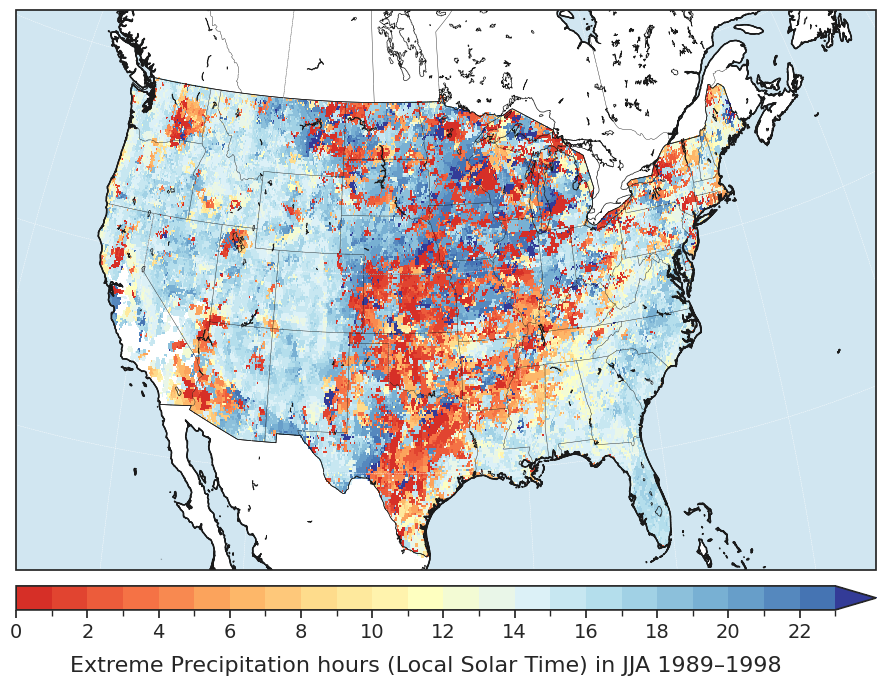

<Figure size 640x480 with 0 Axes>

In [262]:
# colorbar for column1

bounds = np.arange(0,24,1)
cols = plt.get_cmap('RdYlBu')(np.linspace(0.1,0.9,len(bounds)-1))#RdBu 
cmap = mpl.colors.ListedColormap(cols) 
cmap.set_over(plt.get_cmap('RdYlBu')(0.99)) 
cmap.set_under(plt.get_cmap('RdYlBu')(0)) 
norm = mpl.colors.BoundaryNorm(boundaries=bounds, ncolors=len(bounds)-1) 
sm = plt.cm.ScalarMappable(norm=norm,cmap=cmap) 
sm.set_array([]) 

extent_lonlat = (-126, -65, 23, 51) #extent_lonlat = (-126, -65, 23, 51)
ocean_color = np.float64([209,230,241])/255

latmin, latmax =  30, 45
lonmin, lonmax = -105, -85 

sns.set(font_scale=1.7, style="dark")

fig = plt.figure(figsize=(10,8),tight_layout = True) #8,10;,tight_layout = True
ncols = 1
nrows = 1
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, figure=fig)
gs.update(left = 0.1, right=0.96,top=0.9,bottom=0.2,wspace=0.1, hspace=0)
bottoms, tops, lefts, rights = gs.get_grid_positions(fig)

axes = []
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none')

newcoast = cfeature.NaturalEarthFeature('physical', 'coastline', '10m',
                                        edgecolor='k',facecolor='none')
newlake = cfeature.NaturalEarthFeature('physical', 'lakes', '10m',edgecolor='k', facecolor='none')
plt.rcParams["axes.edgecolor"] = "0.15"

for i in range(nrows):
    for j in range(ncols):        

        ax= fig.add_subplot(gs[i,j], projection= ccrs.Orthographic(central_longitude=-100, central_latitude=25, globe=None))
        ax.pcolormesh(data_array_test.longitude.values, data_array_test.latitude.values, np.where(mask, data_array_test.hour,  np.nan),transform=ccrs.PlateCarree(),cmap=cmap,norm=norm) #Regrid1Deg[0,:,:];mask_concat[0,:,:]

       
        ax.coastlines()
        ax.set_global()
        ax.set_extent(extent_lonlat, crs=ccrs.PlateCarree())
        ax.gridlines(xlocs=np.arange(-180,190,10),ylocs=np.arange(-180,190,10),linestyle="--",linewidth=0.3)
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(states_provinces, linewidth=0.3, linestyle='-', edgecolor='k')
        ax.add_feature(newcoast, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(newlake, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.LAND,color='w',zorder=0,edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN,color=ocean_color,zorder=0,edgecolor='k')
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN,color=ocean_color,zorder=1)
        ax.add_feature(newcoast, linewidth=1, linestyle='-', zorder=2,edgecolor='k')

        ax.set_aspect("auto") 
        axes.append(ax)


# Create axes for the colorbar on the same place. 
cbar_ax = fig.add_axes([lefts[0],0.15,rights[0]-lefts[0],0.03]) #[left, bottom, width, height]  
cb = fig.colorbar(sm,cax=cbar_ax,orientation="horizontal",pad=0.02,ticks=bounds[::2],use_gridspec=True,extend="max",fraction=0.1) #drawedges=True, 
cb.ax.set_xticklabels(bounds[::2], size=14)
cb.ax.set_xlabel(r"Extreme Precipitation hours (Local Solar Time) in JJA 1989–1998", size=16, labelpad=10) 

fig1 = plt.gcf()
# plt.tight_layout()
plt.show()
plt.draw()

# fig.savefig('HourlyP06utc.jpg', dpi=300, bbox_inches = "tight")

In [264]:
jja_files = []
for month in range(6,9):
    for year in range(1999,2009):
        filename = f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(month).zfill(2)}{year}.nc"
        jja_files.append(filename)

data = xr.open_mfdataset(jja_files)
data
    

freq_prcp_hours = []
for i in range(261):
    for j in range(591):
        print(i,j)
        freq_prcp_hours.append(max_prcp_hour(data.R99pa1hr[:,i,j], data.R99pa1hr[:,i,j].longitude))
        
latitude_values = data.latitude
longitude_values = data.longitude
data_array_test = xr.Dataset(
    coords={"latitude": latitude_values, "longitude": longitude_values},
)

data_array_test['hour'] = (('latitude', 'longitude'), np.array(freq_prcp_hours).reshape(261, 591))
data_array_test.to_netcdf('R99pw1hr/freq_prcp_hours_third_decade.nc')

0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
0 9
0 10
0 11
0 12
0 13
0 14
0 15
0 16
0 17
0 18
0 19
0 20
0 21
0 22
0 23
0 24
0 25
0 26
0 27
0 28
0 29
0 30
0 31
0 32
0 33
0 34
0 35
0 36
0 37
0 38
0 39
0 40
0 41
0 42
0 43
0 44
0 45
0 46
0 47
0 48
0 49
0 50
0 51
0 52
0 53
0 54
0 55
0 56
0 57
0 58
0 59
0 60
0 61
0 62
0 63
0 64
0 65
0 66
0 67
0 68
0 69
0 70
0 71
0 72
0 73
0 74
0 75
0 76
0 77
0 78
0 79
0 80
0 81
0 82
0 83
0 84
0 85
0 86
0 87
0 88
0 89
0 90
0 91
0 92
0 93
0 94
0 95
0 96
0 97
0 98
0 99
0 100
0 101
0 102
0 103
0 104
0 105
0 106
0 107
0 108
0 109
0 110
0 111
0 112
0 113
0 114
0 115
0 116
0 117
0 118
0 119
0 120
0 121
0 122
0 123
0 124
0 125
0 126
0 127
0 128
0 129
0 130
0 131
0 132
0 133
0 134
0 135
0 136
0 137
0 138
0 139
0 140
0 141
0 142
0 143
0 144
0 145
0 146
0 147
0 148
0 149
0 150
0 151
0 152
0 153
0 154
0 155
0 156
0 157
0 158
0 159
0 160
0 161
0 162
0 163
0 164
0 165
0 166
0 167
0 168
0 169
0 170
0 171
0 172
0 173
0 174
0 175
0 176
0 177
0 178
0 179
0 180
0 181
0 182
0 183
0 184


2 239
2 240
2 241
2 242
2 243
2 244
2 245
2 246
2 247
2 248
2 249
2 250
2 251
2 252
2 253
2 254
2 255
2 256
2 257
2 258
2 259
2 260
2 261
2 262
2 263
2 264
2 265
2 266
2 267
2 268
2 269
2 270
2 271
2 272
2 273
2 274
2 275
2 276
2 277
2 278
2 279
2 280
2 281
2 282
2 283
2 284
2 285
2 286
2 287
2 288
2 289
2 290
2 291
2 292
2 293
2 294
2 295
2 296
2 297
2 298
2 299
2 300
2 301
2 302
2 303
2 304
2 305
2 306
2 307
2 308
2 309
2 310
2 311
2 312
2 313
2 314
2 315
2 316
2 317
2 318
2 319
2 320
2 321
2 322
2 323
2 324
2 325
2 326
2 327
2 328
2 329
2 330
2 331
2 332
2 333
2 334
2 335
2 336
2 337
2 338
2 339
2 340
2 341
2 342
2 343
2 344
2 345
2 346
2 347
2 348
2 349
2 350
2 351
2 352
2 353
2 354
2 355
2 356
2 357
2 358
2 359
2 360
2 361
2 362
2 363
2 364
2 365
2 366
2 367
2 368
2 369
2 370
2 371
2 372
2 373
2 374
2 375
2 376
2 377
2 378
2 379
2 380
2 381
2 382
2 383
2 384
2 385
2 386
2 387
2 388
2 389
2 390
2 391
2 392
2 393
2 394
2 395
2 396
2 397
2 398
2 399
2 400
2 401
2 402
2 403
2 404
2 40

4 461
4 462
4 463
4 464
4 465
4 466
4 467
4 468
4 469
4 470
4 471
4 472
4 473
4 474
4 475
4 476
4 477
4 478
4 479
4 480
4 481
4 482
4 483
4 484
4 485
4 486
4 487
4 488
4 489
4 490
4 491
4 492
4 493
4 494
4 495
4 496
4 497
4 498
4 499
4 500
4 501
4 502
4 503
4 504
4 505
4 506
4 507
4 508
4 509
4 510
4 511
4 512
4 513
4 514
4 515
4 516
4 517
4 518
4 519
4 520
4 521
4 522
4 523
4 524
4 525
4 526
4 527
4 528
4 529
4 530
4 531
4 532
4 533
4 534
4 535
4 536
4 537
4 538
4 539
4 540
4 541
4 542
4 543
4 544
4 545
4 546
4 547
4 548
4 549
4 550
4 551
4 552
4 553
4 554
4 555
4 556
4 557
4 558
4 559
4 560
4 561
4 562
4 563
4 564
4 565
4 566
4 567
4 568
4 569
4 570
4 571
4 572
4 573
4 574
4 575
4 576
4 577
4 578
4 579
4 580
4 581
4 582
4 583
4 584
4 585
4 586
4 587
4 588
4 589
4 590
5 0
5 1
5 2
5 3
5 4
5 5
5 6
5 7
5 8
5 9
5 10
5 11
5 12
5 13
5 14
5 15
5 16
5 17
5 18
5 19
5 20
5 21
5 22
5 23
5 24
5 25
5 26
5 27
5 28
5 29
5 30
5 31
5 32
5 33
5 34
5 35
5 36
5 37
5 38
5 39
5 40
5 41
5 42
5 43
5 44
5 45


7 110
7 111
7 112
7 113
7 114
7 115
7 116
7 117
7 118
7 119
7 120
7 121
7 122
7 123
7 124
7 125
7 126
7 127
7 128
7 129
7 130
7 131
7 132
7 133
7 134
7 135
7 136
7 137
7 138
7 139
7 140
7 141
7 142
7 143
7 144
7 145
7 146
7 147
7 148
7 149
7 150
7 151
7 152
7 153
7 154
7 155
7 156
7 157
7 158
7 159
7 160
7 161
7 162
7 163
7 164
7 165
7 166
7 167
7 168
7 169
7 170
7 171
7 172
7 173
7 174
7 175
7 176
7 177
7 178
7 179
7 180
7 181
7 182
7 183
7 184
7 185
7 186
7 187
7 188
7 189
7 190
7 191
7 192
7 193
7 194
7 195
7 196
7 197
7 198
7 199
7 200
7 201
7 202
7 203
7 204
7 205
7 206
7 207
7 208
7 209
7 210
7 211
7 212
7 213
7 214
7 215
7 216
7 217
7 218
7 219
7 220
7 221
7 222
7 223
7 224
7 225
7 226
7 227
7 228
7 229
7 230
7 231
7 232
7 233
7 234
7 235
7 236
7 237
7 238
7 239
7 240
7 241
7 242
7 243
7 244
7 245
7 246
7 247
7 248
7 249
7 250
7 251
7 252
7 253
7 254
7 255
7 256
7 257
7 258
7 259
7 260
7 261
7 262
7 263
7 264
7 265
7 266
7 267
7 268
7 269
7 270
7 271
7 272
7 273
7 274
7 275
7 27

9 334
9 335
9 336
9 337
9 338
9 339
9 340
9 341
9 342
9 343
9 344
9 345
9 346
9 347
9 348
9 349
9 350
9 351
9 352
9 353
9 354
9 355
9 356
9 357
9 358
9 359
9 360
9 361
9 362
9 363
9 364
9 365
9 366
9 367
9 368
9 369
9 370
9 371
9 372
9 373
9 374
9 375
9 376
9 377
9 378
9 379
9 380
9 381
9 382
9 383
9 384
9 385
9 386
9 387
9 388
9 389
9 390
9 391
9 392
9 393
9 394
9 395
9 396
9 397
9 398
9 399
9 400
9 401
9 402
9 403
9 404
9 405
9 406
9 407
9 408
9 409
9 410
9 411
9 412
9 413
9 414
9 415
9 416
9 417
9 418
9 419
9 420
9 421
9 422
9 423
9 424
9 425
9 426
9 427
9 428
9 429
9 430
9 431
9 432
9 433
9 434
9 435
9 436
9 437
9 438
9 439
9 440
9 441
9 442
9 443
9 444
9 445
9 446
9 447
9 448
9 449
9 450
9 451
9 452
9 453
9 454
9 455
9 456
9 457
9 458
9 459
9 460
9 461
9 462
9 463
9 464
9 465
9 466
9 467
9 468
9 469
9 470
9 471
9 472
9 473
9 474
9 475
9 476
9 477
9 478
9 479
9 480
9 481
9 482
9 483
9 484
9 485
9 486
9 487
9 488
9 489
9 490
9 491
9 492
9 493
9 494
9 495
9 496
9 497
9 498
9 499
9 50

11 394
11 395
11 396
11 397
11 398
11 399
11 400
11 401
11 402
11 403
11 404
11 405
11 406
11 407
11 408
11 409
11 410
11 411
11 412
11 413
11 414
11 415
11 416
11 417
11 418
11 419
11 420
11 421
11 422
11 423
11 424
11 425
11 426
11 427
11 428
11 429
11 430
11 431
11 432
11 433
11 434
11 435
11 436
11 437
11 438
11 439
11 440
11 441
11 442
11 443
11 444
11 445
11 446
11 447
11 448
11 449
11 450
11 451
11 452
11 453
11 454
11 455
11 456
11 457
11 458
11 459
11 460
11 461
11 462
11 463
11 464
11 465
11 466
11 467
11 468
11 469
11 470
11 471
11 472
11 473
11 474
11 475
11 476
11 477
11 478
11 479
11 480
11 481
11 482
11 483
11 484
11 485
11 486
11 487
11 488
11 489
11 490
11 491
11 492
11 493
11 494
11 495
11 496
11 497
11 498
11 499
11 500
11 501
11 502
11 503
11 504
11 505
11 506
11 507
11 508
11 509
11 510
11 511
11 512
11 513
11 514
11 515
11 516
11 517
11 518
11 519
11 520
11 521
11 522
11 523
11 524
11 525
11 526
11 527
11 528
11 529
11 530
11 531
11 532
11 533
11 534
11 535
11 536

13 419
13 420
13 421
13 422
13 423
13 424
13 425
13 426
13 427
13 428
13 429
13 430
13 431
13 432
13 433
13 434
13 435
13 436
13 437
13 438
13 439
13 440
13 441
13 442
13 443
13 444
13 445
13 446
13 447
13 448
13 449
13 450
13 451
13 452
13 453
13 454
13 455
13 456
13 457
13 458
13 459
13 460
13 461
13 462
13 463
13 464
13 465
13 466
13 467
13 468
13 469
13 470
13 471
13 472
13 473
13 474
13 475
13 476
13 477
13 478
13 479
13 480
13 481
13 482
13 483
13 484
13 485
13 486
13 487
13 488
13 489
13 490
13 491
13 492
13 493
13 494
13 495
13 496
13 497
13 498
13 499
13 500
13 501
13 502
13 503
13 504
13 505
13 506
13 507
13 508
13 509
13 510
13 511
13 512
13 513
13 514
13 515
13 516
13 517
13 518
13 519
13 520
13 521
13 522
13 523
13 524
13 525
13 526
13 527
13 528
13 529
13 530
13 531
13 532
13 533
13 534
13 535
13 536
13 537
13 538
13 539
13 540
13 541
13 542
13 543
13 544
13 545
13 546
13 547
13 548
13 549
13 550
13 551
13 552
13 553
13 554
13 555
13 556
13 557
13 558
13 559
13 560
13 561

15 443
15 444
15 445
15 446
15 447
15 448
15 449
15 450
15 451
15 452
15 453
15 454
15 455
15 456
15 457
15 458
15 459
15 460
15 461
15 462
15 463
15 464
15 465
15 466
15 467
15 468
15 469
15 470
15 471
15 472
15 473
15 474
15 475
15 476
15 477
15 478
15 479
15 480
15 481
15 482
15 483
15 484
15 485
15 486
15 487
15 488
15 489
15 490
15 491
15 492
15 493
15 494
15 495
15 496
15 497
15 498
15 499
15 500
15 501
15 502
15 503
15 504
15 505
15 506
15 507
15 508
15 509
15 510
15 511
15 512
15 513
15 514
15 515
15 516
15 517
15 518
15 519
15 520
15 521
15 522
15 523
15 524
15 525
15 526
15 527
15 528
15 529
15 530
15 531
15 532
15 533
15 534
15 535
15 536
15 537
15 538
15 539
15 540
15 541
15 542
15 543
15 544
15 545
15 546
15 547
15 548
15 549
15 550
15 551
15 552
15 553
15 554
15 555
15 556
15 557
15 558
15 559
15 560
15 561
15 562
15 563
15 564
15 565
15 566
15 567
15 568
15 569
15 570
15 571
15 572
15 573
15 574
15 575
15 576
15 577
15 578
15 579
15 580
15 581
15 582
15 583
15 584
15 585

17 463
17 464
17 465
17 466
17 467
17 468
17 469
17 470
17 471
17 472
17 473
17 474
17 475
17 476
17 477
17 478
17 479
17 480
17 481
17 482
17 483
17 484
17 485
17 486
17 487
17 488
17 489
17 490
17 491
17 492
17 493
17 494
17 495
17 496
17 497
17 498
17 499
17 500
17 501
17 502
17 503
17 504
17 505
17 506
17 507
17 508
17 509
17 510
17 511
17 512
17 513
17 514
17 515
17 516
17 517
17 518
17 519
17 520
17 521
17 522
17 523
17 524
17 525
17 526
17 527
17 528
17 529
17 530
17 531
17 532
17 533
17 534
17 535
17 536
17 537
17 538
17 539
17 540
17 541
17 542
17 543
17 544
17 545
17 546
17 547
17 548
17 549
17 550
17 551
17 552
17 553
17 554
17 555
17 556
17 557
17 558
17 559
17 560
17 561
17 562
17 563
17 564
17 565
17 566
17 567
17 568
17 569
17 570
17 571
17 572
17 573
17 574
17 575
17 576
17 577
17 578
17 579
17 580
17 581
17 582
17 583
17 584
17 585
17 586
17 587
17 588
17 589
17 590
18 0
18 1
18 2
18 3
18 4
18 5
18 6
18 7
18 8
18 9
18 10
18 11
18 12
18 13
18 14
18 15
18 16
18 17
18 18


19 485
19 486
19 487
19 488
19 489
19 490
19 491
19 492
19 493
19 494
19 495
19 496
19 497
19 498
19 499
19 500
19 501
19 502
19 503
19 504
19 505
19 506
19 507
19 508
19 509
19 510
19 511
19 512
19 513
19 514
19 515
19 516
19 517
19 518
19 519
19 520
19 521
19 522
19 523
19 524
19 525
19 526
19 527
19 528
19 529
19 530
19 531
19 532
19 533
19 534
19 535
19 536
19 537
19 538
19 539
19 540
19 541
19 542
19 543
19 544
19 545
19 546
19 547
19 548
19 549
19 550
19 551
19 552
19 553
19 554
19 555
19 556
19 557
19 558
19 559
19 560
19 561
19 562
19 563
19 564
19 565
19 566
19 567
19 568
19 569
19 570
19 571
19 572
19 573
19 574
19 575
19 576
19 577
19 578
19 579
19 580
19 581
19 582
19 583
19 584
19 585
19 586
19 587
19 588
19 589
19 590
20 0
20 1
20 2
20 3
20 4
20 5
20 6
20 7
20 8
20 9
20 10
20 11
20 12
20 13
20 14
20 15
20 16
20 17
20 18
20 19
20 20
20 21
20 22
20 23
20 24
20 25
20 26
20 27
20 28
20 29
20 30
20 31
20 32
20 33
20 34
20 35
20 36
20 37
20 38
20 39
20 40
20 41
20 42
20 43
20 4

21 507
21 508
21 509
21 510
21 511
21 512
21 513
21 514
21 515
21 516
21 517
21 518
21 519
21 520
21 521
21 522
21 523
21 524
21 525
21 526
21 527
21 528
21 529
21 530
21 531
21 532
21 533
21 534
21 535
21 536
21 537
21 538
21 539
21 540
21 541
21 542
21 543
21 544
21 545
21 546
21 547
21 548
21 549
21 550
21 551
21 552
21 553
21 554
21 555
21 556
21 557
21 558
21 559
21 560
21 561
21 562
21 563
21 564
21 565
21 566
21 567
21 568
21 569
21 570
21 571
21 572
21 573
21 574
21 575
21 576
21 577
21 578
21 579
21 580
21 581
21 582
21 583
21 584
21 585
21 586
21 587
21 588
21 589
21 590
22 0
22 1
22 2
22 3
22 4
22 5
22 6
22 7
22 8
22 9
22 10
22 11
22 12
22 13
22 14
22 15
22 16
22 17
22 18
22 19
22 20
22 21
22 22
22 23
22 24
22 25
22 26
22 27
22 28
22 29
22 30
22 31
22 32
22 33
22 34
22 35
22 36
22 37
22 38
22 39
22 40
22 41
22 42
22 43
22 44
22 45
22 46
22 47
22 48
22 49
22 50
22 51
22 52
22 53
22 54
22 55
22 56
22 57
22 58
22 59
22 60
22 61
22 62
22 63
22 64
22 65
22 66
22 67
22 68
22 69
22

23 527
23 528
23 529
23 530
23 531
23 532
23 533
23 534
23 535
23 536
23 537
23 538
23 539
23 540
23 541
23 542
23 543
23 544
23 545
23 546
23 547
23 548
23 549
23 550
23 551
23 552
23 553
23 554
23 555
23 556
23 557
23 558
23 559
23 560
23 561
23 562
23 563
23 564
23 565
23 566
23 567
23 568
23 569
23 570
23 571
23 572
23 573
23 574
23 575
23 576
23 577
23 578
23 579
23 580
23 581
23 582
23 583
23 584
23 585
23 586
23 587
23 588
23 589
23 590
24 0
24 1
24 2
24 3
24 4
24 5
24 6
24 7
24 8
24 9
24 10
24 11
24 12
24 13
24 14
24 15
24 16
24 17
24 18
24 19
24 20
24 21
24 22
24 23
24 24
24 25
24 26
24 27
24 28
24 29
24 30
24 31
24 32
24 33
24 34
24 35
24 36
24 37
24 38
24 39
24 40
24 41
24 42
24 43
24 44
24 45
24 46
24 47
24 48
24 49
24 50
24 51
24 52
24 53
24 54
24 55
24 56
24 57
24 58
24 59
24 60
24 61
24 62
24 63
24 64
24 65
24 66
24 67
24 68
24 69
24 70
24 71
24 72
24 73
24 74
24 75
24 76
24 77
24 78
24 79
24 80
24 81
24 82
24 83
24 84
24 85
24 86
24 87
24 88
24 89
24 90
24 91
24 92
24 9

25 548
25 549
25 550
25 551
25 552
25 553
25 554
25 555
25 556
25 557
25 558
25 559
25 560
25 561
25 562
25 563
25 564
25 565
25 566
25 567
25 568
25 569
25 570
25 571
25 572
25 573
25 574
25 575
25 576
25 577
25 578
25 579
25 580
25 581
25 582
25 583
25 584
25 585
25 586
25 587
25 588
25 589
25 590
26 0
26 1
26 2
26 3
26 4
26 5
26 6
26 7
26 8
26 9
26 10
26 11
26 12
26 13
26 14
26 15
26 16
26 17
26 18
26 19
26 20
26 21
26 22
26 23
26 24
26 25
26 26
26 27
26 28
26 29
26 30
26 31
26 32
26 33
26 34
26 35
26 36
26 37
26 38
26 39
26 40
26 41
26 42
26 43
26 44
26 45
26 46
26 47
26 48
26 49
26 50
26 51
26 52
26 53
26 54
26 55
26 56
26 57
26 58
26 59
26 60
26 61
26 62
26 63
26 64
26 65
26 66
26 67
26 68
26 69
26 70
26 71
26 72
26 73
26 74
26 75
26 76
26 77
26 78
26 79
26 80
26 81
26 82
26 83
26 84
26 85
26 86
26 87
26 88
26 89
26 90
26 91
26 92
26 93
26 94
26 95
26 96
26 97
26 98
26 99
26 100
26 101
26 102
26 103
26 104
26 105
26 106
26 107
26 108
26 109
26 110
26 111
26 112
26 113
26 114
26 1

27 570
27 571
27 572
27 573
27 574
27 575
27 576
27 577
27 578
27 579
27 580
27 581
27 582
27 583
27 584
27 585
27 586
27 587
27 588
27 589
27 590
28 0
28 1
28 2
28 3
28 4
28 5
28 6
28 7
28 8
28 9
28 10
28 11
28 12
28 13
28 14
28 15
28 16
28 17
28 18
28 19
28 20
28 21
28 22
28 23
28 24
28 25
28 26
28 27
28 28
28 29
28 30
28 31
28 32
28 33
28 34
28 35
28 36
28 37
28 38
28 39
28 40
28 41
28 42
28 43
28 44
28 45
28 46
28 47
28 48
28 49
28 50
28 51
28 52
28 53
28 54
28 55
28 56
28 57
28 58
28 59
28 60
28 61
28 62
28 63
28 64
28 65
28 66
28 67
28 68
28 69
28 70
28 71
28 72
28 73
28 74
28 75
28 76
28 77
28 78
28 79
28 80
28 81
28 82
28 83
28 84
28 85
28 86
28 87
28 88
28 89
28 90
28 91
28 92
28 93
28 94
28 95
28 96
28 97
28 98
28 99
28 100
28 101
28 102
28 103
28 104
28 105
28 106
28 107
28 108
28 109
28 110
28 111
28 112
28 113
28 114
28 115
28 116
28 117
28 118
28 119
28 120
28 121
28 122
28 123
28 124
28 125
28 126
28 127
28 128
28 129
28 130
28 131
28 132
28 133
28 134
28 135
28 136
28 1

30 2
30 3
30 4
30 5
30 6
30 7
30 8
30 9
30 10
30 11
30 12
30 13
30 14
30 15
30 16
30 17
30 18
30 19
30 20
30 21
30 22
30 23
30 24
30 25
30 26
30 27
30 28
30 29
30 30
30 31
30 32
30 33
30 34
30 35
30 36
30 37
30 38
30 39
30 40
30 41
30 42
30 43
30 44
30 45
30 46
30 47
30 48
30 49
30 50
30 51
30 52
30 53
30 54
30 55
30 56
30 57
30 58
30 59
30 60
30 61
30 62
30 63
30 64
30 65
30 66
30 67
30 68
30 69
30 70
30 71
30 72
30 73
30 74
30 75
30 76
30 77
30 78
30 79
30 80
30 81
30 82
30 83
30 84
30 85
30 86
30 87
30 88
30 89
30 90
30 91
30 92
30 93
30 94
30 95
30 96
30 97
30 98
30 99
30 100
30 101
30 102
30 103
30 104
30 105
30 106
30 107
30 108
30 109
30 110
30 111
30 112
30 113
30 114
30 115
30 116
30 117
30 118
30 119
30 120
30 121
30 122
30 123
30 124
30 125
30 126
30 127
30 128
30 129
30 130
30 131
30 132
30 133
30 134
30 135
30 136
30 137
30 138
30 139
30 140
30 141
30 142
30 143
30 144
30 145
30 146
30 147
30 148
30 149
30 150
30 151
30 152
30 153
30 154
30 155
30 156
30 157
30 158
30 159


32 31
32 32
32 33
32 34
32 35
32 36
32 37
32 38
32 39
32 40
32 41
32 42
32 43
32 44
32 45
32 46
32 47
32 48
32 49
32 50
32 51
32 52
32 53
32 54
32 55
32 56
32 57
32 58
32 59
32 60
32 61
32 62
32 63
32 64
32 65
32 66
32 67
32 68
32 69
32 70
32 71
32 72
32 73
32 74
32 75
32 76
32 77
32 78
32 79
32 80
32 81
32 82
32 83
32 84
32 85
32 86
32 87
32 88
32 89
32 90
32 91
32 92
32 93
32 94
32 95
32 96
32 97
32 98
32 99
32 100
32 101
32 102
32 103
32 104
32 105
32 106
32 107
32 108
32 109
32 110
32 111
32 112
32 113
32 114
32 115
32 116
32 117
32 118
32 119
32 120
32 121
32 122
32 123
32 124
32 125
32 126
32 127
32 128
32 129
32 130
32 131
32 132
32 133
32 134
32 135
32 136
32 137
32 138
32 139
32 140
32 141
32 142
32 143
32 144
32 145
32 146
32 147
32 148
32 149
32 150
32 151
32 152
32 153
32 154
32 155
32 156
32 157
32 158
32 159
32 160
32 161
32 162
32 163
32 164
32 165
32 166
32 167
32 168
32 169
32 170
32 171
32 172
32 173
32 174
32 175
32 176
32 177
32 178
32 179
32 180
32 181
32 182
32 18

34 55
34 56
34 57
34 58
34 59
34 60
34 61
34 62
34 63
34 64
34 65
34 66
34 67
34 68
34 69
34 70
34 71
34 72
34 73
34 74
34 75
34 76
34 77
34 78
34 79
34 80
34 81
34 82
34 83
34 84
34 85
34 86
34 87
34 88
34 89
34 90
34 91
34 92
34 93
34 94
34 95
34 96
34 97
34 98
34 99
34 100
34 101
34 102
34 103
34 104
34 105
34 106
34 107
34 108
34 109
34 110
34 111
34 112
34 113
34 114
34 115
34 116
34 117
34 118
34 119
34 120
34 121
34 122
34 123
34 124
34 125
34 126
34 127
34 128
34 129
34 130
34 131
34 132
34 133
34 134
34 135
34 136
34 137
34 138
34 139
34 140
34 141
34 142
34 143
34 144
34 145
34 146
34 147
34 148
34 149
34 150
34 151
34 152
34 153
34 154
34 155
34 156
34 157
34 158
34 159
34 160
34 161
34 162
34 163
34 164
34 165
34 166
34 167
34 168
34 169
34 170
34 171
34 172
34 173
34 174
34 175
34 176
34 177
34 178
34 179
34 180
34 181
34 182
34 183
34 184
34 185
34 186
34 187
34 188
34 189
34 190
34 191
34 192
34 193
34 194
34 195
34 196
34 197
34 198
34 199
34 200
34 201
34 202
34 203
34

36 79
36 80
36 81
36 82
36 83
36 84
36 85
36 86
36 87
36 88
36 89
36 90
36 91
36 92
36 93
36 94
36 95
36 96
36 97
36 98
36 99
36 100
36 101
36 102
36 103
36 104
36 105
36 106
36 107
36 108
36 109
36 110
36 111
36 112
36 113
36 114
36 115
36 116
36 117
36 118
36 119
36 120
36 121
36 122
36 123
36 124
36 125
36 126
36 127
36 128
36 129
36 130
36 131
36 132
36 133
36 134
36 135
36 136
36 137
36 138
36 139
36 140
36 141
36 142
36 143
36 144
36 145
36 146
36 147
36 148
36 149
36 150
36 151
36 152
36 153
36 154
36 155
36 156
36 157
36 158
36 159
36 160
36 161
36 162
36 163
36 164
36 165
36 166
36 167
36 168
36 169
36 170
36 171
36 172
36 173
36 174
36 175
36 176
36 177
36 178
36 179
36 180
36 181
36 182
36 183
36 184
36 185
36 186
36 187
36 188
36 189
36 190
36 191
36 192
36 193
36 194
36 195
36 196
36 197
36 198
36 199
36 200
36 201
36 202
36 203
36 204
36 205
36 206
36 207
36 208
36 209
36 210
36 211
36 212
36 213
36 214
36 215
36 216
36 217
36 218
36 219
36 220
36 221
36 222
36 223
36 224

38 105
38 106
38 107
38 108
38 109
38 110
38 111
38 112
38 113
38 114
38 115
38 116
38 117
38 118
38 119
38 120
38 121
38 122
38 123
38 124
38 125
38 126
38 127
38 128
38 129
38 130
38 131
38 132
38 133
38 134
38 135
38 136
38 137
38 138
38 139
38 140
38 141
38 142
38 143
38 144
38 145
38 146
38 147
38 148
38 149
38 150
38 151
38 152
38 153
38 154
38 155
38 156
38 157
38 158
38 159
38 160
38 161
38 162
38 163
38 164
38 165
38 166
38 167
38 168
38 169
38 170
38 171
38 172
38 173
38 174
38 175
38 176
38 177
38 178
38 179
38 180
38 181
38 182
38 183
38 184
38 185
38 186
38 187
38 188
38 189
38 190
38 191
38 192
38 193
38 194
38 195
38 196
38 197
38 198
38 199
38 200
38 201
38 202
38 203
38 204
38 205
38 206
38 207
38 208
38 209
38 210
38 211
38 212
38 213
38 214
38 215
38 216
38 217
38 218
38 219
38 220
38 221
38 222
38 223
38 224
38 225
38 226
38 227
38 228
38 229
38 230
38 231
38 232
38 233
38 234
38 235
38 236
38 237
38 238
38 239
38 240
38 241
38 242
38 243
38 244
38 245
38 246
38 247

40 125
40 126
40 127
40 128
40 129
40 130
40 131
40 132
40 133
40 134
40 135
40 136
40 137
40 138
40 139
40 140
40 141
40 142
40 143
40 144
40 145
40 146
40 147
40 148
40 149
40 150
40 151
40 152
40 153
40 154
40 155
40 156
40 157
40 158
40 159
40 160
40 161
40 162
40 163
40 164
40 165
40 166
40 167
40 168
40 169
40 170
40 171
40 172
40 173
40 174
40 175
40 176
40 177
40 178
40 179
40 180
40 181
40 182
40 183
40 184
40 185
40 186
40 187
40 188
40 189
40 190
40 191
40 192
40 193
40 194
40 195
40 196
40 197
40 198
40 199
40 200
40 201
40 202
40 203
40 204
40 205
40 206
40 207
40 208
40 209
40 210
40 211
40 212
40 213
40 214
40 215
40 216
40 217
40 218
40 219
40 220
40 221
40 222
40 223
40 224
40 225
40 226
40 227
40 228
40 229
40 230
40 231
40 232
40 233
40 234
40 235
40 236
40 237
40 238
40 239
40 240
40 241
40 242
40 243
40 244
40 245
40 246
40 247
40 248
40 249
40 250
40 251
40 252
40 253
40 254
40 255
40 256
40 257
40 258
40 259
40 260
40 261
40 262
40 263
40 264
40 265
40 266
40 267

42 150
42 151
42 152
42 153
42 154
42 155
42 156
42 157
42 158
42 159
42 160
42 161
42 162
42 163
42 164
42 165
42 166
42 167
42 168
42 169
42 170
42 171
42 172
42 173
42 174
42 175
42 176
42 177
42 178
42 179
42 180
42 181
42 182
42 183
42 184
42 185
42 186
42 187
42 188
42 189
42 190
42 191
42 192
42 193
42 194
42 195
42 196
42 197
42 198
42 199
42 200
42 201
42 202
42 203
42 204
42 205
42 206
42 207
42 208
42 209
42 210
42 211
42 212
42 213
42 214
42 215
42 216
42 217
42 218
42 219
42 220
42 221
42 222
42 223
42 224
42 225
42 226
42 227
42 228
42 229
42 230
42 231
42 232
42 233
42 234
42 235
42 236
42 237
42 238
42 239
42 240
42 241
42 242
42 243
42 244
42 245
42 246
42 247
42 248
42 249
42 250
42 251
42 252
42 253
42 254
42 255
42 256
42 257
42 258
42 259
42 260
42 261
42 262
42 263
42 264
42 265
42 266
42 267
42 268
42 269
42 270
42 271
42 272
42 273
42 274
42 275
42 276
42 277
42 278
42 279
42 280
42 281
42 282
42 283
42 284
42 285
42 286
42 287
42 288
42 289
42 290
42 291
42 292

44 175
44 176
44 177
44 178
44 179
44 180
44 181
44 182
44 183
44 184
44 185
44 186
44 187
44 188
44 189
44 190
44 191
44 192
44 193
44 194
44 195
44 196
44 197
44 198
44 199
44 200
44 201
44 202
44 203
44 204
44 205
44 206
44 207
44 208
44 209
44 210
44 211
44 212
44 213
44 214
44 215
44 216
44 217
44 218
44 219
44 220
44 221
44 222
44 223
44 224
44 225
44 226
44 227
44 228
44 229
44 230
44 231
44 232
44 233
44 234
44 235
44 236
44 237
44 238
44 239
44 240
44 241
44 242
44 243
44 244
44 245
44 246
44 247
44 248
44 249
44 250
44 251
44 252
44 253
44 254
44 255
44 256
44 257
44 258
44 259
44 260
44 261
44 262
44 263
44 264
44 265
44 266
44 267
44 268
44 269
44 270
44 271
44 272
44 273
44 274
44 275
44 276
44 277
44 278
44 279
44 280
44 281
44 282
44 283
44 284
44 285
44 286
44 287
44 288
44 289
44 290
44 291
44 292
44 293
44 294
44 295
44 296
44 297
44 298
44 299
44 300
44 301
44 302
44 303
44 304
44 305
44 306
44 307
44 308
44 309
44 310
44 311
44 312
44 313
44 314
44 315
44 316
44 317

46 196
46 197
46 198
46 199
46 200
46 201
46 202
46 203
46 204
46 205
46 206
46 207
46 208
46 209
46 210
46 211
46 212
46 213
46 214
46 215
46 216
46 217
46 218
46 219
46 220
46 221
46 222
46 223
46 224
46 225
46 226
46 227
46 228
46 229
46 230
46 231
46 232
46 233
46 234
46 235
46 236
46 237
46 238
46 239
46 240
46 241
46 242
46 243
46 244
46 245
46 246
46 247
46 248
46 249
46 250
46 251
46 252
46 253
46 254
46 255
46 256
46 257
46 258
46 259
46 260
46 261
46 262
46 263
46 264
46 265
46 266
46 267
46 268
46 269
46 270
46 271
46 272
46 273
46 274
46 275
46 276
46 277
46 278
46 279
46 280
46 281
46 282
46 283
46 284
46 285
46 286
46 287
46 288
46 289
46 290
46 291
46 292
46 293
46 294
46 295
46 296
46 297
46 298
46 299
46 300
46 301
46 302
46 303
46 304
46 305
46 306
46 307
46 308
46 309
46 310
46 311
46 312
46 313
46 314
46 315
46 316
46 317
46 318
46 319
46 320
46 321
46 322
46 323
46 324
46 325
46 326
46 327
46 328
46 329
46 330
46 331
46 332
46 333
46 334
46 335
46 336
46 337
46 338

48 219
48 220
48 221
48 222
48 223
48 224
48 225
48 226
48 227
48 228
48 229
48 230
48 231
48 232
48 233
48 234
48 235
48 236
48 237
48 238
48 239
48 240
48 241
48 242
48 243
48 244
48 245
48 246
48 247
48 248
48 249
48 250
48 251
48 252
48 253
48 254
48 255
48 256
48 257
48 258
48 259
48 260
48 261
48 262
48 263
48 264
48 265
48 266
48 267
48 268
48 269
48 270
48 271
48 272
48 273
48 274
48 275
48 276
48 277
48 278
48 279
48 280
48 281
48 282
48 283
48 284
48 285
48 286
48 287
48 288
48 289
48 290
48 291
48 292
48 293
48 294
48 295
48 296
48 297
48 298
48 299
48 300
48 301
48 302
48 303
48 304
48 305
48 306
48 307
48 308
48 309
48 310
48 311
48 312
48 313
48 314
48 315
48 316
48 317
48 318
48 319
48 320
48 321
48 322
48 323
48 324
48 325
48 326
48 327
48 328
48 329
48 330
48 331
48 332
48 333
48 334
48 335
48 336
48 337
48 338
48 339
48 340
48 341
48 342
48 343
48 344
48 345
48 346
48 347
48 348
48 349
48 350
48 351
48 352
48 353
48 354
48 355
48 356
48 357
48 358
48 359
48 360
48 361

50 242
50 243
50 244
50 245
50 246
50 247
50 248
50 249
50 250
50 251
50 252
50 253
50 254
50 255
50 256
50 257
50 258
50 259
50 260
50 261
50 262
50 263
50 264
50 265
50 266
50 267
50 268
50 269
50 270
50 271
50 272
50 273
50 274
50 275
50 276
50 277
50 278
50 279
50 280
50 281
50 282
50 283
50 284
50 285
50 286
50 287
50 288
50 289
50 290
50 291
50 292
50 293
50 294
50 295
50 296
50 297
50 298
50 299
50 300
50 301
50 302
50 303
50 304
50 305
50 306
50 307
50 308
50 309
50 310
50 311
50 312
50 313
50 314
50 315
50 316
50 317
50 318
50 319
50 320
50 321
50 322
50 323
50 324
50 325
50 326
50 327
50 328
50 329
50 330
50 331
50 332
50 333
50 334
50 335
50 336
50 337
50 338
50 339
50 340
50 341
50 342
50 343
50 344
50 345
50 346
50 347
50 348
50 349
50 350
50 351
50 352
50 353
50 354
50 355
50 356
50 357
50 358
50 359
50 360
50 361
50 362
50 363
50 364
50 365
50 366
50 367
50 368
50 369
50 370
50 371
50 372
50 373
50 374
50 375
50 376
50 377
50 378
50 379
50 380
50 381
50 382
50 383
50 384

52 262
52 263
52 264
52 265
52 266
52 267
52 268
52 269
52 270
52 271
52 272
52 273
52 274
52 275
52 276
52 277
52 278
52 279
52 280
52 281
52 282
52 283
52 284
52 285
52 286
52 287
52 288
52 289
52 290
52 291
52 292
52 293
52 294
52 295
52 296
52 297
52 298
52 299
52 300
52 301
52 302
52 303
52 304
52 305
52 306
52 307
52 308
52 309
52 310
52 311
52 312
52 313
52 314
52 315
52 316
52 317
52 318
52 319
52 320
52 321
52 322
52 323
52 324
52 325
52 326
52 327
52 328
52 329
52 330
52 331
52 332
52 333
52 334
52 335
52 336
52 337
52 338
52 339
52 340
52 341
52 342
52 343
52 344
52 345
52 346
52 347
52 348
52 349
52 350
52 351
52 352
52 353
52 354
52 355
52 356
52 357
52 358
52 359
52 360
52 361
52 362
52 363
52 364
52 365
52 366
52 367
52 368
52 369
52 370
52 371
52 372
52 373
52 374
52 375
52 376
52 377
52 378
52 379
52 380
52 381
52 382
52 383
52 384
52 385
52 386
52 387
52 388
52 389
52 390
52 391
52 392
52 393
52 394
52 395
52 396
52 397
52 398
52 399
52 400
52 401
52 402
52 403
52 404

54 284
54 285
54 286
54 287
54 288
54 289
54 290
54 291
54 292
54 293
54 294
54 295
54 296
54 297
54 298
54 299
54 300
54 301
54 302
54 303
54 304
54 305
54 306
54 307
54 308
54 309
54 310
54 311
54 312
54 313
54 314
54 315
54 316
54 317
54 318
54 319
54 320
54 321
54 322
54 323
54 324
54 325
54 326
54 327
54 328
54 329
54 330
54 331
54 332
54 333
54 334
54 335
54 336
54 337
54 338
54 339
54 340
54 341
54 342
54 343
54 344
54 345
54 346
54 347
54 348
54 349
54 350
54 351
54 352
54 353
54 354
54 355
54 356
54 357
54 358
54 359
54 360
54 361
54 362
54 363
54 364
54 365
54 366
54 367
54 368
54 369
54 370
54 371
54 372
54 373
54 374
54 375
54 376
54 377
54 378
54 379
54 380
54 381
54 382
54 383
54 384
54 385
54 386
54 387
54 388
54 389
54 390
54 391
54 392
54 393
54 394
54 395
54 396
54 397
54 398
54 399
54 400
54 401
54 402
54 403
54 404
54 405
54 406
54 407
54 408
54 409
54 410
54 411
54 412
54 413
54 414
54 415
54 416
54 417
54 418
54 419
54 420
54 421
54 422
54 423
54 424
54 425
54 426

56 304
56 305
56 306
56 307
56 308
56 309
56 310
56 311
56 312
56 313
56 314
56 315
56 316
56 317
56 318
56 319
56 320
56 321
56 322
56 323
56 324
56 325
56 326
56 327
56 328
56 329
56 330
56 331
56 332
56 333
56 334
56 335
56 336
56 337
56 338
56 339
56 340
56 341
56 342
56 343
56 344
56 345
56 346
56 347
56 348
56 349
56 350
56 351
56 352
56 353
56 354
56 355
56 356
56 357
56 358
56 359
56 360
56 361
56 362
56 363
56 364
56 365
56 366
56 367
56 368
56 369
56 370
56 371
56 372
56 373
56 374
56 375
56 376
56 377
56 378
56 379
56 380
56 381
56 382
56 383
56 384
56 385
56 386
56 387
56 388
56 389
56 390
56 391
56 392
56 393
56 394
56 395
56 396
56 397
56 398
56 399
56 400
56 401
56 402
56 403
56 404
56 405
56 406
56 407
56 408
56 409
56 410
56 411
56 412
56 413
56 414
56 415
56 416
56 417
56 418
56 419
56 420
56 421
56 422
56 423
56 424
56 425
56 426
56 427
56 428
56 429
56 430
56 431
56 432
56 433
56 434
56 435
56 436
56 437
56 438
56 439
56 440
56 441
56 442
56 443
56 444
56 445
56 446

58 325
58 326
58 327
58 328
58 329
58 330
58 331
58 332
58 333
58 334
58 335
58 336
58 337
58 338
58 339
58 340
58 341
58 342
58 343
58 344
58 345
58 346
58 347
58 348
58 349
58 350
58 351
58 352
58 353
58 354
58 355
58 356
58 357
58 358
58 359
58 360
58 361
58 362
58 363
58 364
58 365
58 366
58 367
58 368
58 369
58 370
58 371
58 372
58 373
58 374
58 375
58 376
58 377
58 378
58 379
58 380
58 381
58 382
58 383
58 384
58 385
58 386
58 387
58 388
58 389
58 390
58 391
58 392
58 393
58 394
58 395
58 396
58 397
58 398
58 399
58 400
58 401
58 402
58 403
58 404
58 405
58 406
58 407
58 408
58 409
58 410
58 411
58 412
58 413
58 414
58 415
58 416
58 417
58 418
58 419
58 420
58 421
58 422
58 423
58 424
58 425
58 426
58 427
58 428
58 429
58 430
58 431
58 432
58 433
58 434
58 435
58 436
58 437
58 438
58 439
58 440
58 441
58 442
58 443
58 444
58 445
58 446
58 447
58 448
58 449
58 450
58 451
58 452
58 453
58 454
58 455
58 456
58 457
58 458
58 459
58 460
58 461
58 462
58 463
58 464
58 465
58 466
58 467

60 346
60 347
60 348
60 349
60 350
60 351
60 352
60 353
60 354
60 355
60 356
60 357
60 358
60 359
60 360
60 361
60 362
60 363
60 364
60 365
60 366
60 367
60 368
60 369
60 370
60 371
60 372
60 373
60 374
60 375
60 376
60 377
60 378
60 379
60 380
60 381
60 382
60 383
60 384
60 385
60 386
60 387
60 388
60 389
60 390
60 391
60 392
60 393
60 394
60 395
60 396
60 397
60 398
60 399
60 400
60 401
60 402
60 403
60 404
60 405
60 406
60 407
60 408
60 409
60 410
60 411
60 412
60 413
60 414
60 415
60 416
60 417
60 418
60 419
60 420
60 421
60 422
60 423
60 424
60 425
60 426
60 427
60 428
60 429
60 430
60 431
60 432
60 433
60 434
60 435
60 436
60 437
60 438
60 439
60 440
60 441
60 442
60 443
60 444
60 445
60 446
60 447
60 448
60 449
60 450
60 451
60 452
60 453
60 454
60 455
60 456
60 457
60 458
60 459
60 460
60 461
60 462
60 463
60 464
60 465
60 466
60 467
60 468
60 469
60 470
60 471
60 472
60 473
60 474
60 475
60 476
60 477
60 478
60 479
60 480
60 481
60 482
60 483
60 484
60 485
60 486
60 487
60 488

62 367
62 368
62 369
62 370
62 371
62 372
62 373
62 374
62 375
62 376
62 377
62 378
62 379
62 380
62 381
62 382
62 383
62 384
62 385
62 386
62 387
62 388
62 389
62 390
62 391
62 392
62 393
62 394
62 395
62 396
62 397
62 398
62 399
62 400
62 401
62 402
62 403
62 404
62 405
62 406
62 407
62 408
62 409
62 410
62 411
62 412
62 413
62 414
62 415
62 416
62 417
62 418
62 419
62 420
62 421
62 422
62 423
62 424
62 425
62 426
62 427
62 428
62 429
62 430
62 431
62 432
62 433
62 434
62 435
62 436
62 437
62 438
62 439
62 440
62 441
62 442
62 443
62 444
62 445
62 446
62 447
62 448
62 449
62 450
62 451
62 452
62 453
62 454
62 455
62 456
62 457
62 458
62 459
62 460
62 461
62 462
62 463
62 464
62 465
62 466
62 467
62 468
62 469
62 470
62 471
62 472
62 473
62 474
62 475
62 476
62 477
62 478
62 479
62 480
62 481
62 482
62 483
62 484
62 485
62 486
62 487
62 488
62 489
62 490
62 491
62 492
62 493
62 494
62 495
62 496
62 497
62 498
62 499
62 500
62 501
62 502
62 503
62 504
62 505
62 506
62 507
62 508
62 509

64 388
64 389
64 390
64 391
64 392
64 393
64 394
64 395
64 396
64 397
64 398
64 399
64 400
64 401
64 402
64 403
64 404
64 405
64 406
64 407
64 408
64 409
64 410
64 411
64 412
64 413
64 414
64 415
64 416
64 417
64 418
64 419
64 420
64 421
64 422
64 423
64 424
64 425
64 426
64 427
64 428
64 429
64 430
64 431
64 432
64 433
64 434
64 435
64 436
64 437
64 438
64 439
64 440
64 441
64 442
64 443
64 444
64 445
64 446
64 447
64 448
64 449
64 450
64 451
64 452
64 453
64 454
64 455
64 456
64 457
64 458
64 459
64 460
64 461
64 462
64 463
64 464
64 465
64 466
64 467
64 468
64 469
64 470
64 471
64 472
64 473
64 474
64 475
64 476
64 477
64 478
64 479
64 480
64 481
64 482
64 483
64 484
64 485
64 486
64 487
64 488
64 489
64 490
64 491
64 492
64 493
64 494
64 495
64 496
64 497
64 498
64 499
64 500
64 501
64 502
64 503
64 504
64 505
64 506
64 507
64 508
64 509
64 510
64 511
64 512
64 513
64 514
64 515
64 516
64 517
64 518
64 519
64 520
64 521
64 522
64 523
64 524
64 525
64 526
64 527
64 528
64 529
64 530

66 408
66 409
66 410
66 411
66 412
66 413
66 414
66 415
66 416
66 417
66 418
66 419
66 420
66 421
66 422
66 423
66 424
66 425
66 426
66 427
66 428
66 429
66 430
66 431
66 432
66 433
66 434
66 435
66 436
66 437
66 438
66 439
66 440
66 441
66 442
66 443
66 444
66 445
66 446
66 447
66 448
66 449
66 450
66 451
66 452
66 453
66 454
66 455
66 456
66 457
66 458
66 459
66 460
66 461
66 462
66 463
66 464
66 465
66 466
66 467
66 468
66 469
66 470
66 471
66 472
66 473
66 474
66 475
66 476
66 477
66 478
66 479
66 480
66 481
66 482
66 483
66 484
66 485
66 486
66 487
66 488
66 489
66 490
66 491
66 492
66 493
66 494
66 495
66 496
66 497
66 498
66 499
66 500
66 501
66 502
66 503
66 504
66 505
66 506
66 507
66 508
66 509
66 510
66 511
66 512
66 513
66 514
66 515
66 516
66 517
66 518
66 519
66 520
66 521
66 522
66 523
66 524
66 525
66 526
66 527
66 528
66 529
66 530
66 531
66 532
66 533
66 534
66 535
66 536
66 537
66 538
66 539
66 540
66 541
66 542
66 543
66 544
66 545
66 546
66 547
66 548
66 549
66 550

68 430
68 431
68 432
68 433
68 434
68 435
68 436
68 437
68 438
68 439
68 440
68 441
68 442
68 443
68 444
68 445
68 446
68 447
68 448
68 449
68 450
68 451
68 452
68 453
68 454
68 455
68 456
68 457
68 458
68 459
68 460
68 461
68 462
68 463
68 464
68 465
68 466
68 467
68 468
68 469
68 470
68 471
68 472
68 473
68 474
68 475
68 476
68 477
68 478
68 479
68 480
68 481
68 482
68 483
68 484
68 485
68 486
68 487
68 488
68 489
68 490
68 491
68 492
68 493
68 494
68 495
68 496
68 497
68 498
68 499
68 500
68 501
68 502
68 503
68 504
68 505
68 506
68 507
68 508
68 509
68 510
68 511
68 512
68 513
68 514
68 515
68 516
68 517
68 518
68 519
68 520
68 521
68 522
68 523
68 524
68 525
68 526
68 527
68 528
68 529
68 530
68 531
68 532
68 533
68 534
68 535
68 536
68 537
68 538
68 539
68 540
68 541
68 542
68 543
68 544
68 545
68 546
68 547
68 548
68 549
68 550
68 551
68 552
68 553
68 554
68 555
68 556
68 557
68 558
68 559
68 560
68 561
68 562
68 563
68 564
68 565
68 566
68 567
68 568
68 569
68 570
68 571
68 572

70 451
70 452
70 453
70 454
70 455
70 456
70 457
70 458
70 459
70 460
70 461
70 462
70 463
70 464
70 465
70 466
70 467
70 468
70 469
70 470
70 471
70 472
70 473
70 474
70 475
70 476
70 477
70 478
70 479
70 480
70 481
70 482
70 483
70 484
70 485
70 486
70 487
70 488
70 489
70 490
70 491
70 492
70 493
70 494
70 495
70 496
70 497
70 498
70 499
70 500
70 501
70 502
70 503
70 504
70 505
70 506
70 507
70 508
70 509
70 510
70 511
70 512
70 513
70 514
70 515
70 516
70 517
70 518
70 519
70 520
70 521
70 522
70 523
70 524
70 525
70 526
70 527
70 528
70 529
70 530
70 531
70 532
70 533
70 534
70 535
70 536
70 537
70 538
70 539
70 540
70 541
70 542
70 543
70 544
70 545
70 546
70 547
70 548
70 549
70 550
70 551
70 552
70 553
70 554
70 555
70 556
70 557
70 558
70 559
70 560
70 561
70 562
70 563
70 564
70 565
70 566
70 567
70 568
70 569
70 570
70 571
70 572
70 573
70 574
70 575
70 576
70 577
70 578
70 579
70 580
70 581
70 582
70 583
70 584
70 585
70 586
70 587
70 588
70 589
70 590
71 0
71 1
71 2
71 3


72 474
72 475
72 476
72 477
72 478
72 479
72 480
72 481
72 482
72 483
72 484
72 485
72 486
72 487
72 488
72 489
72 490
72 491
72 492
72 493
72 494
72 495
72 496
72 497
72 498
72 499
72 500
72 501
72 502
72 503
72 504
72 505
72 506
72 507
72 508
72 509
72 510
72 511
72 512
72 513
72 514
72 515
72 516
72 517
72 518
72 519
72 520
72 521
72 522
72 523
72 524
72 525
72 526
72 527
72 528
72 529
72 530
72 531
72 532
72 533
72 534
72 535
72 536
72 537
72 538
72 539
72 540
72 541
72 542
72 543
72 544
72 545
72 546
72 547
72 548
72 549
72 550
72 551
72 552
72 553
72 554
72 555
72 556
72 557
72 558
72 559
72 560
72 561
72 562
72 563
72 564
72 565
72 566
72 567
72 568
72 569
72 570
72 571
72 572
72 573
72 574
72 575
72 576
72 577
72 578
72 579
72 580
72 581
72 582
72 583
72 584
72 585
72 586
72 587
72 588
72 589
72 590
73 0
73 1
73 2
73 3
73 4
73 5
73 6
73 7
73 8
73 9
73 10
73 11
73 12
73 13
73 14
73 15
73 16
73 17
73 18
73 19
73 20
73 21
73 22
73 23
73 24
73 25
73 26
73 27
73 28
73 29
73 30
73 31

74 494
74 495
74 496
74 497
74 498
74 499
74 500
74 501
74 502
74 503
74 504
74 505
74 506
74 507
74 508
74 509
74 510
74 511
74 512
74 513
74 514
74 515
74 516
74 517
74 518
74 519
74 520
74 521
74 522
74 523
74 524
74 525
74 526
74 527
74 528
74 529
74 530
74 531
74 532
74 533
74 534
74 535
74 536
74 537
74 538
74 539
74 540
74 541
74 542
74 543
74 544
74 545
74 546
74 547
74 548
74 549
74 550
74 551
74 552
74 553
74 554
74 555
74 556
74 557
74 558
74 559
74 560
74 561
74 562
74 563
74 564
74 565
74 566
74 567
74 568
74 569
74 570
74 571
74 572
74 573
74 574
74 575
74 576
74 577
74 578
74 579
74 580
74 581
74 582
74 583
74 584
74 585
74 586
74 587
74 588
74 589
74 590
75 0
75 1
75 2
75 3
75 4
75 5
75 6
75 7
75 8
75 9
75 10
75 11
75 12
75 13
75 14
75 15
75 16
75 17
75 18
75 19
75 20
75 21
75 22
75 23
75 24
75 25
75 26
75 27
75 28
75 29
75 30
75 31
75 32
75 33
75 34
75 35
75 36
75 37
75 38
75 39
75 40
75 41
75 42
75 43
75 44
75 45
75 46
75 47
75 48
75 49
75 50
75 51
75 52
75 53
75 54
7

76 514
76 515
76 516
76 517
76 518
76 519
76 520
76 521
76 522
76 523
76 524
76 525
76 526
76 527
76 528
76 529
76 530
76 531
76 532
76 533
76 534
76 535
76 536
76 537
76 538
76 539
76 540
76 541
76 542
76 543
76 544
76 545
76 546
76 547
76 548
76 549
76 550
76 551
76 552
76 553
76 554
76 555
76 556
76 557
76 558
76 559
76 560
76 561
76 562
76 563
76 564
76 565
76 566
76 567
76 568
76 569
76 570
76 571
76 572
76 573
76 574
76 575
76 576
76 577
76 578
76 579
76 580
76 581
76 582
76 583
76 584
76 585
76 586
76 587
76 588
76 589
76 590
77 0
77 1
77 2
77 3
77 4
77 5
77 6
77 7
77 8
77 9
77 10
77 11
77 12
77 13
77 14
77 15
77 16
77 17
77 18
77 19
77 20
77 21
77 22
77 23
77 24
77 25
77 26
77 27
77 28
77 29
77 30
77 31
77 32
77 33
77 34
77 35
77 36
77 37
77 38
77 39
77 40
77 41
77 42
77 43
77 44
77 45
77 46
77 47
77 48
77 49
77 50
77 51
77 52
77 53
77 54
77 55
77 56
77 57
77 58
77 59
77 60
77 61
77 62
77 63
77 64
77 65
77 66
77 67
77 68
77 69
77 70
77 71
77 72
77 73
77 74
77 75
77 76
77 77
77 

78 534
78 535
78 536
78 537
78 538
78 539
78 540
78 541
78 542
78 543
78 544
78 545
78 546
78 547
78 548
78 549
78 550
78 551
78 552
78 553
78 554
78 555
78 556
78 557
78 558
78 559
78 560
78 561
78 562
78 563
78 564
78 565
78 566
78 567
78 568
78 569
78 570
78 571
78 572
78 573
78 574
78 575
78 576
78 577
78 578
78 579
78 580
78 581
78 582
78 583
78 584
78 585
78 586
78 587
78 588
78 589
78 590
79 0
79 1
79 2
79 3
79 4
79 5
79 6
79 7
79 8
79 9
79 10
79 11
79 12
79 13
79 14
79 15
79 16
79 17
79 18
79 19
79 20
79 21
79 22
79 23
79 24
79 25
79 26
79 27
79 28
79 29
79 30
79 31
79 32
79 33
79 34
79 35
79 36
79 37
79 38
79 39
79 40
79 41
79 42
79 43
79 44
79 45
79 46
79 47
79 48
79 49
79 50
79 51
79 52
79 53
79 54
79 55
79 56
79 57
79 58
79 59
79 60
79 61
79 62
79 63
79 64
79 65
79 66
79 67
79 68
79 69
79 70
79 71
79 72
79 73
79 74
79 75
79 76
79 77
79 78
79 79
79 80
79 81
79 82
79 83
79 84
79 85
79 86
79 87
79 88
79 89
79 90
79 91
79 92
79 93
79 94
79 95
79 96
79 97
79 98
79 99
79 100
79 1

80 556
80 557
80 558
80 559
80 560
80 561
80 562
80 563
80 564
80 565
80 566
80 567
80 568
80 569
80 570
80 571
80 572
80 573
80 574
80 575
80 576
80 577
80 578
80 579
80 580
80 581
80 582
80 583
80 584
80 585
80 586
80 587
80 588
80 589
80 590
81 0
81 1
81 2
81 3
81 4
81 5
81 6
81 7
81 8
81 9
81 10
81 11
81 12
81 13
81 14
81 15
81 16
81 17
81 18
81 19
81 20
81 21
81 22
81 23
81 24
81 25
81 26
81 27
81 28
81 29
81 30
81 31
81 32
81 33
81 34
81 35
81 36
81 37
81 38
81 39
81 40
81 41
81 42
81 43
81 44
81 45
81 46
81 47
81 48
81 49
81 50
81 51
81 52
81 53
81 54
81 55
81 56
81 57
81 58
81 59
81 60
81 61
81 62
81 63
81 64
81 65
81 66
81 67
81 68
81 69
81 70
81 71
81 72
81 73
81 74
81 75
81 76
81 77
81 78
81 79
81 80
81 81
81 82
81 83
81 84
81 85
81 86
81 87
81 88
81 89
81 90
81 91
81 92
81 93
81 94
81 95
81 96
81 97
81 98
81 99
81 100
81 101
81 102
81 103
81 104
81 105
81 106
81 107
81 108
81 109
81 110
81 111
81 112
81 113
81 114
81 115
81 116
81 117
81 118
81 119
81 120
81 121
81 122
81 1

82 579
82 580
82 581
82 582
82 583
82 584
82 585
82 586
82 587
82 588
82 589
82 590
83 0
83 1
83 2
83 3
83 4
83 5
83 6
83 7
83 8
83 9
83 10
83 11
83 12
83 13
83 14
83 15
83 16
83 17
83 18
83 19
83 20
83 21
83 22
83 23
83 24
83 25
83 26
83 27
83 28
83 29
83 30
83 31
83 32
83 33
83 34
83 35
83 36
83 37
83 38
83 39
83 40
83 41
83 42
83 43
83 44
83 45
83 46
83 47
83 48
83 49
83 50
83 51
83 52
83 53
83 54
83 55
83 56
83 57
83 58
83 59
83 60
83 61
83 62
83 63
83 64
83 65
83 66
83 67
83 68
83 69
83 70
83 71
83 72
83 73
83 74
83 75
83 76
83 77
83 78
83 79
83 80
83 81
83 82
83 83
83 84
83 85
83 86
83 87
83 88
83 89
83 90
83 91
83 92
83 93
83 94
83 95
83 96
83 97
83 98
83 99
83 100
83 101
83 102
83 103
83 104
83 105
83 106
83 107
83 108
83 109
83 110
83 111
83 112
83 113
83 114
83 115
83 116
83 117
83 118
83 119
83 120
83 121
83 122
83 123
83 124
83 125
83 126
83 127
83 128
83 129
83 130
83 131
83 132
83 133
83 134
83 135
83 136
83 137
83 138
83 139
83 140
83 141
83 142
83 143
83 144
83 145
83 1

85 15
85 16
85 17
85 18
85 19
85 20
85 21
85 22
85 23
85 24
85 25
85 26
85 27
85 28
85 29
85 30
85 31
85 32
85 33
85 34
85 35
85 36
85 37
85 38
85 39
85 40
85 41
85 42
85 43
85 44
85 45
85 46
85 47
85 48
85 49
85 50
85 51
85 52
85 53
85 54
85 55
85 56
85 57
85 58
85 59
85 60
85 61
85 62
85 63
85 64
85 65
85 66
85 67
85 68
85 69
85 70
85 71
85 72
85 73
85 74
85 75
85 76
85 77
85 78
85 79
85 80
85 81
85 82
85 83
85 84
85 85
85 86
85 87
85 88
85 89
85 90
85 91
85 92
85 93
85 94
85 95
85 96
85 97
85 98
85 99
85 100
85 101
85 102
85 103
85 104
85 105
85 106
85 107
85 108
85 109
85 110
85 111
85 112
85 113
85 114
85 115
85 116
85 117
85 118
85 119
85 120
85 121
85 122
85 123
85 124
85 125
85 126
85 127
85 128
85 129
85 130
85 131
85 132
85 133
85 134
85 135
85 136
85 137
85 138
85 139
85 140
85 141
85 142
85 143
85 144
85 145
85 146
85 147
85 148
85 149
85 150
85 151
85 152
85 153
85 154
85 155
85 156
85 157
85 158
85 159
85 160
85 161
85 162
85 163
85 164
85 165
85 166
85 167
85 168
85 169


87 42
87 43
87 44
87 45
87 46
87 47
87 48
87 49
87 50
87 51
87 52
87 53
87 54
87 55
87 56
87 57
87 58
87 59
87 60
87 61
87 62
87 63
87 64
87 65
87 66
87 67
87 68
87 69
87 70
87 71
87 72
87 73
87 74
87 75
87 76
87 77
87 78
87 79
87 80
87 81
87 82
87 83
87 84
87 85
87 86
87 87
87 88
87 89
87 90
87 91
87 92
87 93
87 94
87 95
87 96
87 97
87 98
87 99
87 100
87 101
87 102
87 103
87 104
87 105
87 106
87 107
87 108
87 109
87 110
87 111
87 112
87 113
87 114
87 115
87 116
87 117
87 118
87 119
87 120
87 121
87 122
87 123
87 124
87 125
87 126
87 127
87 128
87 129
87 130
87 131
87 132
87 133
87 134
87 135
87 136
87 137
87 138
87 139
87 140
87 141
87 142
87 143
87 144
87 145
87 146
87 147
87 148
87 149
87 150
87 151
87 152
87 153
87 154
87 155
87 156
87 157
87 158
87 159
87 160
87 161
87 162
87 163
87 164
87 165
87 166
87 167
87 168
87 169
87 170
87 171
87 172
87 173
87 174
87 175
87 176
87 177
87 178
87 179
87 180
87 181
87 182
87 183
87 184
87 185
87 186
87 187
87 188
87 189
87 190
87 191
87 192
8

89 66
89 67
89 68
89 69
89 70
89 71
89 72
89 73
89 74
89 75
89 76
89 77
89 78
89 79
89 80
89 81
89 82
89 83
89 84
89 85
89 86
89 87
89 88
89 89
89 90
89 91
89 92
89 93
89 94
89 95
89 96
89 97
89 98
89 99
89 100
89 101
89 102
89 103
89 104
89 105
89 106
89 107
89 108
89 109
89 110
89 111
89 112
89 113
89 114
89 115
89 116
89 117
89 118
89 119
89 120
89 121
89 122
89 123
89 124
89 125
89 126
89 127
89 128
89 129
89 130
89 131
89 132
89 133
89 134
89 135
89 136
89 137
89 138
89 139
89 140
89 141
89 142
89 143
89 144
89 145
89 146
89 147
89 148
89 149
89 150
89 151
89 152
89 153
89 154
89 155
89 156
89 157
89 158
89 159
89 160
89 161
89 162
89 163
89 164
89 165
89 166
89 167
89 168
89 169
89 170
89 171
89 172
89 173
89 174
89 175
89 176
89 177
89 178
89 179
89 180
89 181
89 182
89 183
89 184
89 185
89 186
89 187
89 188
89 189
89 190
89 191
89 192
89 193
89 194
89 195
89 196
89 197
89 198
89 199
89 200
89 201
89 202
89 203
89 204
89 205
89 206
89 207
89 208
89 209
89 210
89 211
89 212
89 21

91 92
91 93
91 94
91 95
91 96
91 97
91 98
91 99
91 100
91 101
91 102
91 103
91 104
91 105
91 106
91 107
91 108
91 109
91 110
91 111
91 112
91 113
91 114
91 115
91 116
91 117
91 118
91 119
91 120
91 121
91 122
91 123
91 124
91 125
91 126
91 127
91 128
91 129
91 130
91 131
91 132
91 133
91 134
91 135
91 136
91 137
91 138
91 139
91 140
91 141
91 142
91 143
91 144
91 145
91 146
91 147
91 148
91 149
91 150
91 151
91 152
91 153
91 154
91 155
91 156
91 157
91 158
91 159
91 160
91 161
91 162
91 163
91 164
91 165
91 166
91 167
91 168
91 169
91 170
91 171
91 172
91 173
91 174
91 175
91 176
91 177
91 178
91 179
91 180
91 181
91 182
91 183
91 184
91 185
91 186
91 187
91 188
91 189
91 190
91 191
91 192
91 193
91 194
91 195
91 196
91 197
91 198
91 199
91 200
91 201
91 202
91 203
91 204
91 205
91 206
91 207
91 208
91 209
91 210
91 211
91 212
91 213
91 214
91 215
91 216
91 217
91 218
91 219
91 220
91 221
91 222
91 223
91 224
91 225
91 226
91 227
91 228
91 229
91 230
91 231
91 232
91 233
91 234
91 235


93 114
93 115
93 116
93 117
93 118
93 119
93 120
93 121
93 122
93 123
93 124
93 125
93 126
93 127
93 128
93 129
93 130
93 131
93 132
93 133
93 134
93 135
93 136
93 137
93 138
93 139
93 140
93 141
93 142
93 143
93 144
93 145
93 146
93 147
93 148
93 149
93 150
93 151
93 152
93 153
93 154
93 155
93 156
93 157
93 158
93 159
93 160
93 161
93 162
93 163
93 164
93 165
93 166
93 167
93 168
93 169
93 170
93 171
93 172
93 173
93 174
93 175
93 176
93 177
93 178
93 179
93 180
93 181
93 182
93 183
93 184
93 185
93 186
93 187
93 188
93 189
93 190
93 191
93 192
93 193
93 194
93 195
93 196
93 197
93 198
93 199
93 200
93 201
93 202
93 203
93 204
93 205
93 206
93 207
93 208
93 209
93 210
93 211
93 212
93 213
93 214
93 215
93 216
93 217
93 218
93 219
93 220
93 221
93 222
93 223
93 224
93 225
93 226
93 227
93 228
93 229
93 230
93 231
93 232
93 233
93 234
93 235
93 236
93 237
93 238
93 239
93 240
93 241
93 242
93 243
93 244
93 245
93 246
93 247
93 248
93 249
93 250
93 251
93 252
93 253
93 254
93 255
93 256

95 137
95 138
95 139
95 140
95 141
95 142
95 143
95 144
95 145
95 146
95 147
95 148
95 149
95 150
95 151
95 152
95 153
95 154
95 155
95 156
95 157
95 158
95 159
95 160
95 161
95 162
95 163
95 164
95 165
95 166
95 167
95 168
95 169
95 170
95 171
95 172
95 173
95 174
95 175
95 176
95 177
95 178
95 179
95 180
95 181
95 182
95 183
95 184
95 185
95 186
95 187
95 188
95 189
95 190
95 191
95 192
95 193
95 194
95 195
95 196
95 197
95 198
95 199
95 200
95 201
95 202
95 203
95 204
95 205
95 206
95 207
95 208
95 209
95 210
95 211
95 212
95 213
95 214
95 215
95 216
95 217
95 218
95 219
95 220
95 221
95 222
95 223
95 224
95 225
95 226
95 227
95 228
95 229
95 230
95 231
95 232
95 233
95 234
95 235
95 236
95 237
95 238
95 239
95 240
95 241
95 242
95 243
95 244
95 245
95 246
95 247
95 248
95 249
95 250
95 251
95 252
95 253
95 254
95 255
95 256
95 257
95 258
95 259
95 260
95 261
95 262
95 263
95 264
95 265
95 266
95 267
95 268
95 269
95 270
95 271
95 272
95 273
95 274
95 275
95 276
95 277
95 278
95 279

97 159
97 160
97 161
97 162
97 163
97 164
97 165
97 166
97 167
97 168
97 169
97 170
97 171
97 172
97 173
97 174
97 175
97 176
97 177
97 178
97 179
97 180
97 181
97 182
97 183
97 184
97 185
97 186
97 187
97 188
97 189
97 190
97 191
97 192
97 193
97 194
97 195
97 196
97 197
97 198
97 199
97 200
97 201
97 202
97 203
97 204
97 205
97 206
97 207
97 208
97 209
97 210
97 211
97 212
97 213
97 214
97 215
97 216
97 217
97 218
97 219
97 220
97 221
97 222
97 223
97 224
97 225
97 226
97 227
97 228
97 229
97 230
97 231
97 232
97 233
97 234
97 235
97 236
97 237
97 238
97 239
97 240
97 241
97 242
97 243
97 244
97 245
97 246
97 247
97 248
97 249
97 250
97 251
97 252
97 253
97 254
97 255
97 256
97 257
97 258
97 259
97 260
97 261
97 262
97 263
97 264
97 265
97 266
97 267
97 268
97 269
97 270
97 271
97 272
97 273
97 274
97 275
97 276
97 277
97 278
97 279
97 280
97 281
97 282
97 283
97 284
97 285
97 286
97 287
97 288
97 289
97 290
97 291
97 292
97 293
97 294
97 295
97 296
97 297
97 298
97 299
97 300
97 301

99 179
99 180
99 181
99 182
99 183
99 184
99 185
99 186
99 187
99 188
99 189
99 190
99 191
99 192
99 193
99 194
99 195
99 196
99 197
99 198
99 199
99 200
99 201
99 202
99 203
99 204
99 205
99 206
99 207
99 208
99 209
99 210
99 211
99 212
99 213
99 214
99 215
99 216
99 217
99 218
99 219
99 220
99 221
99 222
99 223
99 224
99 225
99 226
99 227
99 228
99 229
99 230
99 231
99 232
99 233
99 234
99 235
99 236
99 237
99 238
99 239
99 240
99 241
99 242
99 243
99 244
99 245
99 246
99 247
99 248
99 249
99 250
99 251
99 252
99 253
99 254
99 255
99 256
99 257
99 258
99 259
99 260
99 261
99 262
99 263
99 264
99 265
99 266
99 267
99 268
99 269
99 270
99 271
99 272
99 273
99 274
99 275
99 276
99 277
99 278
99 279
99 280
99 281
99 282
99 283
99 284
99 285
99 286
99 287
99 288
99 289
99 290
99 291
99 292
99 293
99 294
99 295
99 296
99 297
99 298
99 299
99 300
99 301
99 302
99 303
99 304
99 305
99 306
99 307
99 308
99 309
99 310
99 311
99 312
99 313
99 314
99 315
99 316
99 317
99 318
99 319
99 320
99 321

101 101
101 102
101 103
101 104
101 105
101 106
101 107
101 108
101 109
101 110
101 111
101 112
101 113
101 114
101 115
101 116
101 117
101 118
101 119
101 120
101 121
101 122
101 123
101 124
101 125
101 126
101 127
101 128
101 129
101 130
101 131
101 132
101 133
101 134
101 135
101 136
101 137
101 138
101 139
101 140
101 141
101 142
101 143
101 144
101 145
101 146
101 147
101 148
101 149
101 150
101 151
101 152
101 153
101 154
101 155
101 156
101 157
101 158
101 159
101 160
101 161
101 162
101 163
101 164
101 165
101 166
101 167
101 168
101 169
101 170
101 171
101 172
101 173
101 174
101 175
101 176
101 177
101 178
101 179
101 180
101 181
101 182
101 183
101 184
101 185
101 186
101 187
101 188
101 189
101 190
101 191
101 192
101 193
101 194
101 195
101 196
101 197
101 198
101 199
101 200
101 201
101 202
101 203
101 204
101 205
101 206
101 207
101 208
101 209
101 210
101 211
101 212
101 213
101 214
101 215
101 216
101 217
101 218
101 219
101 220
101 221
101 222
101 223
101 224
101 225


102 551
102 552
102 553
102 554
102 555
102 556
102 557
102 558
102 559
102 560
102 561
102 562
102 563
102 564
102 565
102 566
102 567
102 568
102 569
102 570
102 571
102 572
102 573
102 574
102 575
102 576
102 577
102 578
102 579
102 580
102 581
102 582
102 583
102 584
102 585
102 586
102 587
102 588
102 589
102 590
103 0
103 1
103 2
103 3
103 4
103 5
103 6
103 7
103 8
103 9
103 10
103 11
103 12
103 13
103 14
103 15
103 16
103 17
103 18
103 19
103 20
103 21
103 22
103 23
103 24
103 25
103 26
103 27
103 28
103 29
103 30
103 31
103 32
103 33
103 34
103 35
103 36
103 37
103 38
103 39
103 40
103 41
103 42
103 43
103 44
103 45
103 46
103 47
103 48
103 49
103 50
103 51
103 52
103 53
103 54
103 55
103 56
103 57
103 58
103 59
103 60
103 61
103 62
103 63
103 64
103 65
103 66
103 67
103 68
103 69
103 70
103 71
103 72
103 73
103 74
103 75
103 76
103 77
103 78
103 79
103 80
103 81
103 82
103 83
103 84
103 85
103 86
103 87
103 88
103 89
103 90
103 91
103 92
103 93
103 94
103 95
103 96
103 97
103 

104 422
104 423
104 424
104 425
104 426
104 427
104 428
104 429
104 430
104 431
104 432
104 433
104 434
104 435
104 436
104 437
104 438
104 439
104 440
104 441
104 442
104 443
104 444
104 445
104 446
104 447
104 448
104 449
104 450
104 451
104 452
104 453
104 454
104 455
104 456
104 457
104 458
104 459
104 460
104 461
104 462
104 463
104 464
104 465
104 466
104 467
104 468
104 469
104 470
104 471
104 472
104 473
104 474
104 475
104 476
104 477
104 478
104 479
104 480
104 481
104 482
104 483
104 484
104 485
104 486
104 487
104 488
104 489
104 490
104 491
104 492
104 493
104 494
104 495
104 496
104 497
104 498
104 499
104 500
104 501
104 502
104 503
104 504
104 505
104 506
104 507
104 508
104 509
104 510
104 511
104 512
104 513
104 514
104 515
104 516
104 517
104 518
104 519
104 520
104 521
104 522
104 523
104 524
104 525
104 526
104 527
104 528
104 529
104 530
104 531
104 532
104 533
104 534
104 535
104 536
104 537
104 538
104 539
104 540
104 541
104 542
104 543
104 544
104 545
104 546


106 293
106 294
106 295
106 296
106 297
106 298
106 299
106 300
106 301
106 302
106 303
106 304
106 305
106 306
106 307
106 308
106 309
106 310
106 311
106 312
106 313
106 314
106 315
106 316
106 317
106 318
106 319
106 320
106 321
106 322
106 323
106 324
106 325
106 326
106 327
106 328
106 329
106 330
106 331
106 332
106 333
106 334
106 335
106 336
106 337
106 338
106 339
106 340
106 341
106 342
106 343
106 344
106 345
106 346
106 347
106 348
106 349
106 350
106 351
106 352
106 353
106 354
106 355
106 356
106 357
106 358
106 359
106 360
106 361
106 362
106 363
106 364
106 365
106 366
106 367
106 368
106 369
106 370
106 371
106 372
106 373
106 374
106 375
106 376
106 377
106 378
106 379
106 380
106 381
106 382
106 383
106 384
106 385
106 386
106 387
106 388
106 389
106 390
106 391
106 392
106 393
106 394
106 395
106 396
106 397
106 398
106 399
106 400
106 401
106 402
106 403
106 404
106 405
106 406
106 407
106 408
106 409
106 410
106 411
106 412
106 413
106 414
106 415
106 416
106 417


108 163
108 164
108 165
108 166
108 167
108 168
108 169
108 170
108 171
108 172
108 173
108 174
108 175
108 176
108 177
108 178
108 179
108 180
108 181
108 182
108 183
108 184
108 185
108 186
108 187
108 188
108 189
108 190
108 191
108 192
108 193
108 194
108 195
108 196
108 197
108 198
108 199
108 200
108 201
108 202
108 203
108 204
108 205
108 206
108 207
108 208
108 209
108 210
108 211
108 212
108 213
108 214
108 215
108 216
108 217
108 218
108 219
108 220
108 221
108 222
108 223
108 224
108 225
108 226
108 227
108 228
108 229
108 230
108 231
108 232
108 233
108 234
108 235
108 236
108 237
108 238
108 239
108 240
108 241
108 242
108 243
108 244
108 245
108 246
108 247
108 248
108 249
108 250
108 251
108 252
108 253
108 254
108 255
108 256
108 257
108 258
108 259
108 260
108 261
108 262
108 263
108 264
108 265
108 266
108 267
108 268
108 269
108 270
108 271
108 272
108 273
108 274
108 275
108 276
108 277
108 278
108 279
108 280
108 281
108 282
108 283
108 284
108 285
108 286
108 287


110 24
110 25
110 26
110 27
110 28
110 29
110 30
110 31
110 32
110 33
110 34
110 35
110 36
110 37
110 38
110 39
110 40
110 41
110 42
110 43
110 44
110 45
110 46
110 47
110 48
110 49
110 50
110 51
110 52
110 53
110 54
110 55
110 56
110 57
110 58
110 59
110 60
110 61
110 62
110 63
110 64
110 65
110 66
110 67
110 68
110 69
110 70
110 71
110 72
110 73
110 74
110 75
110 76
110 77
110 78
110 79
110 80
110 81
110 82
110 83
110 84
110 85
110 86
110 87
110 88
110 89
110 90
110 91
110 92
110 93
110 94
110 95
110 96
110 97
110 98
110 99
110 100
110 101
110 102
110 103
110 104
110 105
110 106
110 107
110 108
110 109
110 110
110 111
110 112
110 113
110 114
110 115
110 116
110 117
110 118
110 119
110 120
110 121
110 122
110 123
110 124
110 125
110 126
110 127
110 128
110 129
110 130
110 131
110 132
110 133
110 134
110 135
110 136
110 137
110 138
110 139
110 140
110 141
110 142
110 143
110 144
110 145
110 146
110 147
110 148
110 149
110 150
110 151
110 152
110 153
110 154
110 155
110 156
110 157
110 

111 482
111 483
111 484
111 485
111 486
111 487
111 488
111 489
111 490
111 491
111 492
111 493
111 494
111 495
111 496
111 497
111 498
111 499
111 500
111 501
111 502
111 503
111 504
111 505
111 506
111 507
111 508
111 509
111 510
111 511
111 512
111 513
111 514
111 515
111 516
111 517
111 518
111 519
111 520
111 521
111 522
111 523
111 524
111 525
111 526
111 527
111 528
111 529
111 530
111 531
111 532
111 533
111 534
111 535
111 536
111 537
111 538
111 539
111 540
111 541
111 542
111 543
111 544
111 545
111 546
111 547
111 548
111 549
111 550
111 551
111 552
111 553
111 554
111 555
111 556
111 557
111 558
111 559
111 560
111 561
111 562
111 563
111 564
111 565
111 566
111 567
111 568
111 569
111 570
111 571
111 572
111 573
111 574
111 575
111 576
111 577
111 578
111 579
111 580
111 581
111 582
111 583
111 584
111 585
111 586
111 587
111 588
111 589
111 590
112 0
112 1
112 2
112 3
112 4
112 5
112 6
112 7
112 8
112 9
112 10
112 11
112 12
112 13
112 14
112 15
112 16
112 17
112 18
112 1

113 352
113 353
113 354
113 355
113 356
113 357
113 358
113 359
113 360
113 361
113 362
113 363
113 364
113 365
113 366
113 367
113 368
113 369
113 370
113 371
113 372
113 373
113 374
113 375
113 376
113 377
113 378
113 379
113 380
113 381
113 382
113 383
113 384
113 385
113 386
113 387
113 388
113 389
113 390
113 391
113 392
113 393
113 394
113 395
113 396
113 397
113 398
113 399
113 400
113 401
113 402
113 403
113 404
113 405
113 406
113 407
113 408
113 409
113 410
113 411
113 412
113 413
113 414
113 415
113 416
113 417
113 418
113 419
113 420
113 421
113 422
113 423
113 424
113 425
113 426
113 427
113 428
113 429
113 430
113 431
113 432
113 433
113 434
113 435
113 436
113 437
113 438
113 439
113 440
113 441
113 442
113 443
113 444
113 445
113 446
113 447
113 448
113 449
113 450
113 451
113 452
113 453
113 454
113 455
113 456
113 457
113 458
113 459
113 460
113 461
113 462
113 463
113 464
113 465
113 466
113 467
113 468
113 469
113 470
113 471
113 472
113 473
113 474
113 475
113 476


115 224
115 225
115 226
115 227
115 228
115 229
115 230
115 231
115 232
115 233
115 234
115 235
115 236
115 237
115 238
115 239
115 240
115 241
115 242
115 243
115 244
115 245
115 246
115 247
115 248
115 249
115 250
115 251
115 252
115 253
115 254
115 255
115 256
115 257
115 258
115 259
115 260
115 261
115 262
115 263
115 264
115 265
115 266
115 267
115 268
115 269
115 270
115 271
115 272
115 273
115 274
115 275
115 276
115 277
115 278
115 279
115 280
115 281
115 282
115 283
115 284
115 285
115 286
115 287
115 288
115 289
115 290
115 291
115 292
115 293
115 294
115 295
115 296
115 297
115 298
115 299
115 300
115 301
115 302
115 303
115 304
115 305
115 306
115 307
115 308
115 309
115 310
115 311
115 312
115 313
115 314
115 315
115 316
115 317
115 318
115 319
115 320
115 321
115 322
115 323
115 324
115 325
115 326
115 327
115 328
115 329
115 330
115 331
115 332
115 333
115 334
115 335
115 336
115 337
115 338
115 339
115 340
115 341
115 342
115 343
115 344
115 345
115 346
115 347
115 348


117 93
117 94
117 95
117 96
117 97
117 98
117 99
117 100
117 101
117 102
117 103
117 104
117 105
117 106
117 107
117 108
117 109
117 110
117 111
117 112
117 113
117 114
117 115
117 116
117 117
117 118
117 119
117 120
117 121
117 122
117 123
117 124
117 125
117 126
117 127
117 128
117 129
117 130
117 131
117 132
117 133
117 134
117 135
117 136
117 137
117 138
117 139
117 140
117 141
117 142
117 143
117 144
117 145
117 146
117 147
117 148
117 149
117 150
117 151
117 152
117 153
117 154
117 155
117 156
117 157
117 158
117 159
117 160
117 161
117 162
117 163
117 164
117 165
117 166
117 167
117 168
117 169
117 170
117 171
117 172
117 173
117 174
117 175
117 176
117 177
117 178
117 179
117 180
117 181
117 182
117 183
117 184
117 185
117 186
117 187
117 188
117 189
117 190
117 191
117 192
117 193
117 194
117 195
117 196
117 197
117 198
117 199
117 200
117 201
117 202
117 203
117 204
117 205
117 206
117 207
117 208
117 209
117 210
117 211
117 212
117 213
117 214
117 215
117 216
117 217
117 218

118 541
118 542
118 543
118 544
118 545
118 546
118 547
118 548
118 549
118 550
118 551
118 552
118 553
118 554
118 555
118 556
118 557
118 558
118 559
118 560
118 561
118 562
118 563
118 564
118 565
118 566
118 567
118 568
118 569
118 570
118 571
118 572
118 573
118 574
118 575
118 576
118 577
118 578
118 579
118 580
118 581
118 582
118 583
118 584
118 585
118 586
118 587
118 588
118 589
118 590
119 0
119 1
119 2
119 3
119 4
119 5
119 6
119 7
119 8
119 9
119 10
119 11
119 12
119 13
119 14
119 15
119 16
119 17
119 18
119 19
119 20
119 21
119 22
119 23
119 24
119 25
119 26
119 27
119 28
119 29
119 30
119 31
119 32
119 33
119 34
119 35
119 36
119 37
119 38
119 39
119 40
119 41
119 42
119 43
119 44
119 45
119 46
119 47
119 48
119 49
119 50
119 51
119 52
119 53
119 54
119 55
119 56
119 57
119 58
119 59
119 60
119 61
119 62
119 63
119 64
119 65
119 66
119 67
119 68
119 69
119 70
119 71
119 72
119 73
119 74
119 75
119 76
119 77
119 78
119 79
119 80
119 81
119 82
119 83
119 84
119 85
119 86
1

120 414
120 415
120 416
120 417
120 418
120 419
120 420
120 421
120 422
120 423
120 424
120 425
120 426
120 427
120 428
120 429
120 430
120 431
120 432
120 433
120 434
120 435
120 436
120 437
120 438
120 439
120 440
120 441
120 442
120 443
120 444
120 445
120 446
120 447
120 448
120 449
120 450
120 451
120 452
120 453
120 454
120 455
120 456
120 457
120 458
120 459
120 460
120 461
120 462
120 463
120 464
120 465
120 466
120 467
120 468
120 469
120 470
120 471
120 472
120 473
120 474
120 475
120 476
120 477
120 478
120 479
120 480
120 481
120 482
120 483
120 484
120 485
120 486
120 487
120 488
120 489
120 490
120 491
120 492
120 493
120 494
120 495
120 496
120 497
120 498
120 499
120 500
120 501
120 502
120 503
120 504
120 505
120 506
120 507
120 508
120 509
120 510
120 511
120 512
120 513
120 514
120 515
120 516
120 517
120 518
120 519
120 520
120 521
120 522
120 523
120 524
120 525
120 526
120 527
120 528
120 529
120 530
120 531
120 532
120 533
120 534
120 535
120 536
120 537
120 538


122 285
122 286
122 287
122 288
122 289
122 290
122 291
122 292
122 293
122 294
122 295
122 296
122 297
122 298
122 299
122 300
122 301
122 302
122 303
122 304
122 305
122 306
122 307
122 308
122 309
122 310
122 311
122 312
122 313
122 314
122 315
122 316
122 317
122 318
122 319
122 320
122 321
122 322
122 323
122 324
122 325
122 326
122 327
122 328
122 329
122 330
122 331
122 332
122 333
122 334
122 335
122 336
122 337
122 338
122 339
122 340
122 341
122 342
122 343
122 344
122 345
122 346
122 347
122 348
122 349
122 350
122 351
122 352
122 353
122 354
122 355
122 356
122 357
122 358
122 359
122 360
122 361
122 362
122 363
122 364
122 365
122 366
122 367
122 368
122 369
122 370
122 371
122 372
122 373
122 374
122 375
122 376
122 377
122 378
122 379
122 380
122 381
122 382
122 383
122 384
122 385
122 386
122 387
122 388
122 389
122 390
122 391
122 392
122 393
122 394
122 395
122 396
122 397
122 398
122 399
122 400
122 401
122 402
122 403
122 404
122 405
122 406
122 407
122 408
122 409


124 160
124 161
124 162
124 163
124 164
124 165
124 166
124 167
124 168
124 169
124 170
124 171
124 172
124 173
124 174
124 175
124 176
124 177
124 178
124 179
124 180
124 181
124 182
124 183
124 184
124 185
124 186
124 187
124 188
124 189
124 190
124 191
124 192
124 193
124 194
124 195
124 196
124 197
124 198
124 199
124 200
124 201
124 202
124 203
124 204
124 205
124 206
124 207
124 208
124 209
124 210
124 211
124 212
124 213
124 214
124 215
124 216
124 217
124 218
124 219
124 220
124 221
124 222
124 223
124 224
124 225
124 226
124 227
124 228
124 229
124 230
124 231
124 232
124 233
124 234
124 235
124 236
124 237
124 238
124 239
124 240
124 241
124 242
124 243
124 244
124 245
124 246
124 247
124 248
124 249
124 250
124 251
124 252
124 253
124 254
124 255
124 256
124 257
124 258
124 259
124 260
124 261
124 262
124 263
124 264
124 265
124 266
124 267
124 268
124 269
124 270
124 271
124 272
124 273
124 274
124 275
124 276
124 277
124 278
124 279
124 280
124 281
124 282
124 283
124 284


126 20
126 21
126 22
126 23
126 24
126 25
126 26
126 27
126 28
126 29
126 30
126 31
126 32
126 33
126 34
126 35
126 36
126 37
126 38
126 39
126 40
126 41
126 42
126 43
126 44
126 45
126 46
126 47
126 48
126 49
126 50
126 51
126 52
126 53
126 54
126 55
126 56
126 57
126 58
126 59
126 60
126 61
126 62
126 63
126 64
126 65
126 66
126 67
126 68
126 69
126 70
126 71
126 72
126 73
126 74
126 75
126 76
126 77
126 78
126 79
126 80
126 81
126 82
126 83
126 84
126 85
126 86
126 87
126 88
126 89
126 90
126 91
126 92
126 93
126 94
126 95
126 96
126 97
126 98
126 99
126 100
126 101
126 102
126 103
126 104
126 105
126 106
126 107
126 108
126 109
126 110
126 111
126 112
126 113
126 114
126 115
126 116
126 117
126 118
126 119
126 120
126 121
126 122
126 123
126 124
126 125
126 126
126 127
126 128
126 129
126 130
126 131
126 132
126 133
126 134
126 135
126 136
126 137
126 138
126 139
126 140
126 141
126 142
126 143
126 144
126 145
126 146
126 147
126 148
126 149
126 150
126 151
126 152
126 153
126 154


127 479
127 480
127 481
127 482
127 483
127 484
127 485
127 486
127 487
127 488
127 489
127 490
127 491
127 492
127 493
127 494
127 495
127 496
127 497
127 498
127 499
127 500
127 501
127 502
127 503
127 504
127 505
127 506
127 507
127 508
127 509
127 510
127 511
127 512
127 513
127 514
127 515
127 516
127 517
127 518
127 519
127 520
127 521
127 522
127 523
127 524
127 525
127 526
127 527
127 528
127 529
127 530
127 531
127 532
127 533
127 534
127 535
127 536
127 537
127 538
127 539
127 540
127 541
127 542
127 543
127 544
127 545
127 546
127 547
127 548
127 549
127 550
127 551
127 552
127 553
127 554
127 555
127 556
127 557
127 558
127 559
127 560
127 561
127 562
127 563
127 564
127 565
127 566
127 567
127 568
127 569
127 570
127 571
127 572
127 573
127 574
127 575
127 576
127 577
127 578
127 579
127 580
127 581
127 582
127 583
127 584
127 585
127 586
127 587
127 588
127 589
127 590
128 0
128 1
128 2
128 3
128 4
128 5
128 6
128 7
128 8
128 9
128 10
128 11
128 12
128 13
128 14
128 15
12

129 349
129 350
129 351
129 352
129 353
129 354
129 355
129 356
129 357
129 358
129 359
129 360
129 361
129 362
129 363
129 364
129 365
129 366
129 367
129 368
129 369
129 370
129 371
129 372
129 373
129 374
129 375
129 376
129 377
129 378
129 379
129 380
129 381
129 382
129 383
129 384
129 385
129 386
129 387
129 388
129 389
129 390
129 391
129 392
129 393
129 394
129 395
129 396
129 397
129 398
129 399
129 400
129 401
129 402
129 403
129 404
129 405
129 406
129 407
129 408
129 409
129 410
129 411
129 412
129 413
129 414
129 415
129 416
129 417
129 418
129 419
129 420
129 421
129 422
129 423
129 424
129 425
129 426
129 427
129 428
129 429
129 430
129 431
129 432
129 433
129 434
129 435
129 436
129 437
129 438
129 439
129 440
129 441
129 442
129 443
129 444
129 445
129 446
129 447
129 448
129 449
129 450
129 451
129 452
129 453
129 454
129 455
129 456
129 457
129 458
129 459
129 460
129 461
129 462
129 463
129 464
129 465
129 466
129 467
129 468
129 469
129 470
129 471
129 472
129 473


131 219
131 220
131 221
131 222
131 223
131 224
131 225
131 226
131 227
131 228
131 229
131 230
131 231
131 232
131 233
131 234
131 235
131 236
131 237
131 238
131 239
131 240
131 241
131 242
131 243
131 244
131 245
131 246
131 247
131 248
131 249
131 250
131 251
131 252
131 253
131 254
131 255
131 256
131 257
131 258
131 259
131 260
131 261
131 262
131 263
131 264
131 265
131 266
131 267
131 268
131 269
131 270
131 271
131 272
131 273
131 274
131 275
131 276
131 277
131 278
131 279
131 280
131 281
131 282
131 283
131 284
131 285
131 286
131 287
131 288
131 289
131 290
131 291
131 292
131 293
131 294
131 295
131 296
131 297
131 298
131 299
131 300
131 301
131 302
131 303
131 304
131 305
131 306
131 307
131 308
131 309
131 310
131 311
131 312
131 313
131 314
131 315
131 316
131 317
131 318
131 319
131 320
131 321
131 322
131 323
131 324
131 325
131 326
131 327
131 328
131 329
131 330
131 331
131 332
131 333
131 334
131 335
131 336
131 337
131 338
131 339
131 340
131 341
131 342
131 343


133 87
133 88
133 89
133 90
133 91
133 92
133 93
133 94
133 95
133 96
133 97
133 98
133 99
133 100
133 101
133 102
133 103
133 104
133 105
133 106
133 107
133 108
133 109
133 110
133 111
133 112
133 113
133 114
133 115
133 116
133 117
133 118
133 119
133 120
133 121
133 122
133 123
133 124
133 125
133 126
133 127
133 128
133 129
133 130
133 131
133 132
133 133
133 134
133 135
133 136
133 137
133 138
133 139
133 140
133 141
133 142
133 143
133 144
133 145
133 146
133 147
133 148
133 149
133 150
133 151
133 152
133 153
133 154
133 155
133 156
133 157
133 158
133 159
133 160
133 161
133 162
133 163
133 164
133 165
133 166
133 167
133 168
133 169
133 170
133 171
133 172
133 173
133 174
133 175
133 176
133 177
133 178
133 179
133 180
133 181
133 182
133 183
133 184
133 185
133 186
133 187
133 188
133 189
133 190
133 191
133 192
133 193
133 194
133 195
133 196
133 197
133 198
133 199
133 200
133 201
133 202
133 203
133 204
133 205
133 206
133 207
133 208
133 209
133 210
133 211
133 212
133 2

134 538
134 539
134 540
134 541
134 542
134 543
134 544
134 545
134 546
134 547
134 548
134 549
134 550
134 551
134 552
134 553
134 554
134 555
134 556
134 557
134 558
134 559
134 560
134 561
134 562
134 563
134 564
134 565
134 566
134 567
134 568
134 569
134 570
134 571
134 572
134 573
134 574
134 575
134 576
134 577
134 578
134 579
134 580
134 581
134 582
134 583
134 584
134 585
134 586
134 587
134 588
134 589
134 590
135 0
135 1
135 2
135 3
135 4
135 5
135 6
135 7
135 8
135 9
135 10
135 11
135 12
135 13
135 14
135 15
135 16
135 17
135 18
135 19
135 20
135 21
135 22
135 23
135 24
135 25
135 26
135 27
135 28
135 29
135 30
135 31
135 32
135 33
135 34
135 35
135 36
135 37
135 38
135 39
135 40
135 41
135 42
135 43
135 44
135 45
135 46
135 47
135 48
135 49
135 50
135 51
135 52
135 53
135 54
135 55
135 56
135 57
135 58
135 59
135 60
135 61
135 62
135 63
135 64
135 65
135 66
135 67
135 68
135 69
135 70
135 71
135 72
135 73
135 74
135 75
135 76
135 77
135 78
135 79
135 80
135 81
135 82
135 8

136 408
136 409
136 410
136 411
136 412
136 413
136 414
136 415
136 416
136 417
136 418
136 419
136 420
136 421
136 422
136 423
136 424
136 425
136 426
136 427
136 428
136 429
136 430
136 431
136 432
136 433
136 434
136 435
136 436
136 437
136 438
136 439
136 440
136 441
136 442
136 443
136 444
136 445
136 446
136 447
136 448
136 449
136 450
136 451
136 452
136 453
136 454
136 455
136 456
136 457
136 458
136 459
136 460
136 461
136 462
136 463
136 464
136 465
136 466
136 467
136 468
136 469
136 470
136 471
136 472
136 473
136 474
136 475
136 476
136 477
136 478
136 479
136 480
136 481
136 482
136 483
136 484
136 485
136 486
136 487
136 488
136 489
136 490
136 491
136 492
136 493
136 494
136 495
136 496
136 497
136 498
136 499
136 500
136 501
136 502
136 503
136 504
136 505
136 506
136 507
136 508
136 509
136 510
136 511
136 512
136 513
136 514
136 515
136 516
136 517
136 518
136 519
136 520
136 521
136 522
136 523
136 524
136 525
136 526
136 527
136 528
136 529
136 530
136 531
136 532


138 279
138 280
138 281
138 282
138 283
138 284
138 285
138 286
138 287
138 288
138 289
138 290
138 291
138 292
138 293
138 294
138 295
138 296
138 297
138 298
138 299
138 300
138 301
138 302
138 303
138 304
138 305
138 306
138 307
138 308
138 309
138 310
138 311
138 312
138 313
138 314
138 315
138 316
138 317
138 318
138 319
138 320
138 321
138 322
138 323
138 324
138 325
138 326
138 327
138 328
138 329
138 330
138 331
138 332
138 333
138 334
138 335
138 336
138 337
138 338
138 339
138 340
138 341
138 342
138 343
138 344
138 345
138 346
138 347
138 348
138 349
138 350
138 351
138 352
138 353
138 354
138 355
138 356
138 357
138 358
138 359
138 360
138 361
138 362
138 363
138 364
138 365
138 366
138 367
138 368
138 369
138 370
138 371
138 372
138 373
138 374
138 375
138 376
138 377
138 378
138 379
138 380
138 381
138 382
138 383
138 384
138 385
138 386
138 387
138 388
138 389
138 390
138 391
138 392
138 393
138 394
138 395
138 396
138 397
138 398
138 399
138 400
138 401
138 402
138 403


140 150
140 151
140 152
140 153
140 154
140 155
140 156
140 157
140 158
140 159
140 160
140 161
140 162
140 163
140 164
140 165
140 166
140 167
140 168
140 169
140 170
140 171
140 172
140 173
140 174
140 175
140 176
140 177
140 178
140 179
140 180
140 181
140 182
140 183
140 184
140 185
140 186
140 187
140 188
140 189
140 190
140 191
140 192
140 193
140 194
140 195
140 196
140 197
140 198
140 199
140 200
140 201
140 202
140 203
140 204
140 205
140 206
140 207
140 208
140 209
140 210
140 211
140 212
140 213
140 214
140 215
140 216
140 217
140 218
140 219
140 220
140 221
140 222
140 223
140 224
140 225
140 226
140 227
140 228
140 229
140 230
140 231
140 232
140 233
140 234
140 235
140 236
140 237
140 238
140 239
140 240
140 241
140 242
140 243
140 244
140 245
140 246
140 247
140 248
140 249
140 250
140 251
140 252
140 253
140 254
140 255
140 256
140 257
140 258
140 259
140 260
140 261
140 262
140 263
140 264
140 265
140 266
140 267
140 268
140 269
140 270
140 271
140 272
140 273
140 274


142 8
142 9
142 10
142 11
142 12
142 13
142 14
142 15
142 16
142 17
142 18
142 19
142 20
142 21
142 22
142 23
142 24
142 25
142 26
142 27
142 28
142 29
142 30
142 31
142 32
142 33
142 34
142 35
142 36
142 37
142 38
142 39
142 40
142 41
142 42
142 43
142 44
142 45
142 46
142 47
142 48
142 49
142 50
142 51
142 52
142 53
142 54
142 55
142 56
142 57
142 58
142 59
142 60
142 61
142 62
142 63
142 64
142 65
142 66
142 67
142 68
142 69
142 70
142 71
142 72
142 73
142 74
142 75
142 76
142 77
142 78
142 79
142 80
142 81
142 82
142 83
142 84
142 85
142 86
142 87
142 88
142 89
142 90
142 91
142 92
142 93
142 94
142 95
142 96
142 97
142 98
142 99
142 100
142 101
142 102
142 103
142 104
142 105
142 106
142 107
142 108
142 109
142 110
142 111
142 112
142 113
142 114
142 115
142 116
142 117
142 118
142 119
142 120
142 121
142 122
142 123
142 124
142 125
142 126
142 127
142 128
142 129
142 130
142 131
142 132
142 133
142 134
142 135
142 136
142 137
142 138
142 139
142 140
142 141
142 142
142 143
142 14

143 467
143 468
143 469
143 470
143 471
143 472
143 473
143 474
143 475
143 476
143 477
143 478
143 479
143 480
143 481
143 482
143 483
143 484
143 485
143 486
143 487
143 488
143 489
143 490
143 491
143 492
143 493
143 494
143 495
143 496
143 497
143 498
143 499
143 500
143 501
143 502
143 503
143 504
143 505
143 506
143 507
143 508
143 509
143 510
143 511
143 512
143 513
143 514
143 515
143 516
143 517
143 518
143 519
143 520
143 521
143 522
143 523
143 524
143 525
143 526
143 527
143 528
143 529
143 530
143 531
143 532
143 533
143 534
143 535
143 536
143 537
143 538
143 539
143 540
143 541
143 542
143 543
143 544
143 545
143 546
143 547
143 548
143 549
143 550
143 551
143 552
143 553
143 554
143 555
143 556
143 557
143 558
143 559
143 560
143 561
143 562
143 563
143 564
143 565
143 566
143 567
143 568
143 569
143 570
143 571
143 572
143 573
143 574
143 575
143 576
143 577
143 578
143 579
143 580
143 581
143 582
143 583
143 584
143 585
143 586
143 587
143 588
143 589
143 590
144 0
14

145 337
145 338
145 339
145 340
145 341
145 342
145 343
145 344
145 345
145 346
145 347
145 348
145 349
145 350
145 351
145 352
145 353
145 354
145 355
145 356
145 357
145 358
145 359
145 360
145 361
145 362
145 363
145 364
145 365
145 366
145 367
145 368
145 369
145 370
145 371
145 372
145 373
145 374
145 375
145 376
145 377
145 378
145 379
145 380
145 381
145 382
145 383
145 384
145 385
145 386
145 387
145 388
145 389
145 390
145 391
145 392
145 393
145 394
145 395
145 396
145 397
145 398
145 399
145 400
145 401
145 402
145 403
145 404
145 405
145 406
145 407
145 408
145 409
145 410
145 411
145 412
145 413
145 414
145 415
145 416
145 417
145 418
145 419
145 420
145 421
145 422
145 423
145 424
145 425
145 426
145 427
145 428
145 429
145 430
145 431
145 432
145 433
145 434
145 435
145 436
145 437
145 438
145 439
145 440
145 441
145 442
145 443
145 444
145 445
145 446
145 447
145 448
145 449
145 450
145 451
145 452
145 453
145 454
145 455
145 456
145 457
145 458
145 459
145 460
145 461


147 207
147 208
147 209
147 210
147 211
147 212
147 213
147 214
147 215
147 216
147 217
147 218
147 219
147 220
147 221
147 222
147 223
147 224
147 225
147 226
147 227
147 228
147 229
147 230
147 231
147 232
147 233
147 234
147 235
147 236
147 237
147 238
147 239
147 240
147 241
147 242
147 243
147 244
147 245
147 246
147 247
147 248
147 249
147 250
147 251
147 252
147 253
147 254
147 255
147 256
147 257
147 258
147 259
147 260
147 261
147 262
147 263
147 264
147 265
147 266
147 267
147 268
147 269
147 270
147 271
147 272
147 273
147 274
147 275
147 276
147 277
147 278
147 279
147 280
147 281
147 282
147 283
147 284
147 285
147 286
147 287
147 288
147 289
147 290
147 291
147 292
147 293
147 294
147 295
147 296
147 297
147 298
147 299
147 300
147 301
147 302
147 303
147 304
147 305
147 306
147 307
147 308
147 309
147 310
147 311
147 312
147 313
147 314
147 315
147 316
147 317
147 318
147 319
147 320
147 321
147 322
147 323
147 324
147 325
147 326
147 327
147 328
147 329
147 330
147 331


149 76
149 77
149 78
149 79
149 80
149 81
149 82
149 83
149 84
149 85
149 86
149 87
149 88
149 89
149 90
149 91
149 92
149 93
149 94
149 95
149 96
149 97
149 98
149 99
149 100
149 101
149 102
149 103
149 104
149 105
149 106
149 107
149 108
149 109
149 110
149 111
149 112
149 113
149 114
149 115
149 116
149 117
149 118
149 119
149 120
149 121
149 122
149 123
149 124
149 125
149 126
149 127
149 128
149 129
149 130
149 131
149 132
149 133
149 134
149 135
149 136
149 137
149 138
149 139
149 140
149 141
149 142
149 143
149 144
149 145
149 146
149 147
149 148
149 149
149 150
149 151
149 152
149 153
149 154
149 155
149 156
149 157
149 158
149 159
149 160
149 161
149 162
149 163
149 164
149 165
149 166
149 167
149 168
149 169
149 170
149 171
149 172
149 173
149 174
149 175
149 176
149 177
149 178
149 179
149 180
149 181
149 182
149 183
149 184
149 185
149 186
149 187
149 188
149 189
149 190
149 191
149 192
149 193
149 194
149 195
149 196
149 197
149 198
149 199
149 200
149 201
149 202
149 203


150 530
150 531
150 532
150 533
150 534
150 535
150 536
150 537
150 538
150 539
150 540
150 541
150 542
150 543
150 544
150 545
150 546
150 547
150 548
150 549
150 550
150 551
150 552
150 553
150 554
150 555
150 556
150 557
150 558
150 559
150 560
150 561
150 562
150 563
150 564
150 565
150 566
150 567
150 568
150 569
150 570
150 571
150 572
150 573
150 574
150 575
150 576
150 577
150 578
150 579
150 580
150 581
150 582
150 583
150 584
150 585
150 586
150 587
150 588
150 589
150 590
151 0
151 1
151 2
151 3
151 4
151 5
151 6
151 7
151 8
151 9
151 10
151 11
151 12
151 13
151 14
151 15
151 16
151 17
151 18
151 19
151 20
151 21
151 22
151 23
151 24
151 25
151 26
151 27
151 28
151 29
151 30
151 31
151 32
151 33
151 34
151 35
151 36
151 37
151 38
151 39
151 40
151 41
151 42
151 43
151 44
151 45
151 46
151 47
151 48
151 49
151 50
151 51
151 52
151 53
151 54
151 55
151 56
151 57
151 58
151 59
151 60
151 61
151 62
151 63
151 64
151 65
151 66
151 67
151 68
151 69
151 70
151 71
151 72
151 73
151 

152 400
152 401
152 402
152 403
152 404
152 405
152 406
152 407
152 408
152 409
152 410
152 411
152 412
152 413
152 414
152 415
152 416
152 417
152 418
152 419
152 420
152 421
152 422
152 423
152 424
152 425
152 426
152 427
152 428
152 429
152 430
152 431
152 432
152 433
152 434
152 435
152 436
152 437
152 438
152 439
152 440
152 441
152 442
152 443
152 444
152 445
152 446
152 447
152 448
152 449
152 450
152 451
152 452
152 453
152 454
152 455
152 456
152 457
152 458
152 459
152 460
152 461
152 462
152 463
152 464
152 465
152 466
152 467
152 468
152 469
152 470
152 471
152 472
152 473
152 474
152 475
152 476
152 477
152 478
152 479
152 480
152 481
152 482
152 483
152 484
152 485
152 486
152 487
152 488
152 489
152 490
152 491
152 492
152 493
152 494
152 495
152 496
152 497
152 498
152 499
152 500
152 501
152 502
152 503
152 504
152 505
152 506
152 507
152 508
152 509
152 510
152 511
152 512
152 513
152 514
152 515
152 516
152 517
152 518
152 519
152 520
152 521
152 522
152 523
152 524


154 271
154 272
154 273
154 274
154 275
154 276
154 277
154 278
154 279
154 280
154 281
154 282
154 283
154 284
154 285
154 286
154 287
154 288
154 289
154 290
154 291
154 292
154 293
154 294
154 295
154 296
154 297
154 298
154 299
154 300
154 301
154 302
154 303
154 304
154 305
154 306
154 307
154 308
154 309
154 310
154 311
154 312
154 313
154 314
154 315
154 316
154 317
154 318
154 319
154 320
154 321
154 322
154 323
154 324
154 325
154 326
154 327
154 328
154 329
154 330
154 331
154 332
154 333
154 334
154 335
154 336
154 337
154 338
154 339
154 340
154 341
154 342
154 343
154 344
154 345
154 346
154 347
154 348
154 349
154 350
154 351
154 352
154 353
154 354
154 355
154 356
154 357
154 358
154 359
154 360
154 361
154 362
154 363
154 364
154 365
154 366
154 367
154 368
154 369
154 370
154 371
154 372
154 373
154 374
154 375
154 376
154 377
154 378
154 379
154 380
154 381
154 382
154 383
154 384
154 385
154 386
154 387
154 388
154 389
154 390
154 391
154 392
154 393
154 394
154 395


156 144
156 145
156 146
156 147
156 148
156 149
156 150
156 151
156 152
156 153
156 154
156 155
156 156
156 157
156 158
156 159
156 160
156 161
156 162
156 163
156 164
156 165
156 166
156 167
156 168
156 169
156 170
156 171
156 172
156 173
156 174
156 175
156 176
156 177
156 178
156 179
156 180
156 181
156 182
156 183
156 184
156 185
156 186
156 187
156 188
156 189
156 190
156 191
156 192
156 193
156 194
156 195
156 196
156 197
156 198
156 199
156 200
156 201
156 202
156 203
156 204
156 205
156 206
156 207
156 208
156 209
156 210
156 211
156 212
156 213
156 214
156 215
156 216
156 217
156 218
156 219
156 220
156 221
156 222
156 223
156 224
156 225
156 226
156 227
156 228
156 229
156 230
156 231
156 232
156 233
156 234
156 235
156 236
156 237
156 238
156 239
156 240
156 241
156 242
156 243
156 244
156 245
156 246
156 247
156 248
156 249
156 250
156 251
156 252
156 253
156 254
156 255
156 256
156 257
156 258
156 259
156 260
156 261
156 262
156 263
156 264
156 265
156 266
156 267
156 268


158 3
158 4
158 5
158 6
158 7
158 8
158 9
158 10
158 11
158 12
158 13
158 14
158 15
158 16
158 17
158 18
158 19
158 20
158 21
158 22
158 23
158 24
158 25
158 26
158 27
158 28
158 29
158 30
158 31
158 32
158 33
158 34
158 35
158 36
158 37
158 38
158 39
158 40
158 41
158 42
158 43
158 44
158 45
158 46
158 47
158 48
158 49
158 50
158 51
158 52
158 53
158 54
158 55
158 56
158 57
158 58
158 59
158 60
158 61
158 62
158 63
158 64
158 65
158 66
158 67
158 68
158 69
158 70
158 71
158 72
158 73
158 74
158 75
158 76
158 77
158 78
158 79
158 80
158 81
158 82
158 83
158 84
158 85
158 86
158 87
158 88
158 89
158 90
158 91
158 92
158 93
158 94
158 95
158 96
158 97
158 98
158 99
158 100
158 101
158 102
158 103
158 104
158 105
158 106
158 107
158 108
158 109
158 110
158 111
158 112
158 113
158 114
158 115
158 116
158 117
158 118
158 119
158 120
158 121
158 122
158 123
158 124
158 125
158 126
158 127
158 128
158 129
158 130
158 131
158 132
158 133
158 134
158 135
158 136
158 137
158 138
158 139
158 140


159 463
159 464
159 465
159 466
159 467
159 468
159 469
159 470
159 471
159 472
159 473
159 474
159 475
159 476
159 477
159 478
159 479
159 480
159 481
159 482
159 483
159 484
159 485
159 486
159 487
159 488
159 489
159 490
159 491
159 492
159 493
159 494
159 495
159 496
159 497
159 498
159 499
159 500
159 501
159 502
159 503
159 504
159 505
159 506
159 507
159 508
159 509
159 510
159 511
159 512
159 513
159 514
159 515
159 516
159 517
159 518
159 519
159 520
159 521
159 522
159 523
159 524
159 525
159 526
159 527
159 528
159 529
159 530
159 531
159 532
159 533
159 534
159 535
159 536
159 537
159 538
159 539
159 540
159 541
159 542
159 543
159 544
159 545
159 546
159 547
159 548
159 549
159 550
159 551
159 552
159 553
159 554
159 555
159 556
159 557
159 558
159 559
159 560
159 561
159 562
159 563
159 564
159 565
159 566
159 567
159 568
159 569
159 570
159 571
159 572
159 573
159 574
159 575
159 576
159 577
159 578
159 579
159 580
159 581
159 582
159 583
159 584
159 585
159 586
159 587


161 334
161 335
161 336
161 337
161 338
161 339
161 340
161 341
161 342
161 343
161 344
161 345
161 346
161 347
161 348
161 349
161 350
161 351
161 352
161 353
161 354
161 355
161 356
161 357
161 358
161 359
161 360
161 361
161 362
161 363
161 364
161 365
161 366
161 367
161 368
161 369
161 370
161 371
161 372
161 373
161 374
161 375
161 376
161 377
161 378
161 379
161 380
161 381
161 382
161 383
161 384
161 385
161 386
161 387
161 388
161 389
161 390
161 391
161 392
161 393
161 394
161 395
161 396
161 397
161 398
161 399
161 400
161 401
161 402
161 403
161 404
161 405
161 406
161 407
161 408
161 409
161 410
161 411
161 412
161 413
161 414
161 415
161 416
161 417
161 418
161 419
161 420
161 421
161 422
161 423
161 424
161 425
161 426
161 427
161 428
161 429
161 430
161 431
161 432
161 433
161 434
161 435
161 436
161 437
161 438
161 439
161 440
161 441
161 442
161 443
161 444
161 445
161 446
161 447
161 448
161 449
161 450
161 451
161 452
161 453
161 454
161 455
161 456
161 457
161 458


163 205
163 206
163 207
163 208
163 209
163 210
163 211
163 212
163 213
163 214
163 215
163 216
163 217
163 218
163 219
163 220
163 221
163 222
163 223
163 224
163 225
163 226
163 227
163 228
163 229
163 230
163 231
163 232
163 233
163 234
163 235
163 236
163 237
163 238
163 239
163 240
163 241
163 242
163 243
163 244
163 245
163 246
163 247
163 248
163 249
163 250
163 251
163 252
163 253
163 254
163 255
163 256
163 257
163 258
163 259
163 260
163 261
163 262
163 263
163 264
163 265
163 266
163 267
163 268
163 269
163 270
163 271
163 272
163 273
163 274
163 275
163 276
163 277
163 278
163 279
163 280
163 281
163 282
163 283
163 284
163 285
163 286
163 287
163 288
163 289
163 290
163 291
163 292
163 293
163 294
163 295
163 296
163 297
163 298
163 299
163 300
163 301
163 302
163 303
163 304
163 305
163 306
163 307
163 308
163 309
163 310
163 311
163 312
163 313
163 314
163 315
163 316
163 317
163 318
163 319
163 320
163 321
163 322
163 323
163 324
163 325
163 326
163 327
163 328
163 329


165 73
165 74
165 75
165 76
165 77
165 78
165 79
165 80
165 81
165 82
165 83
165 84
165 85
165 86
165 87
165 88
165 89
165 90
165 91
165 92
165 93
165 94
165 95
165 96
165 97
165 98
165 99
165 100
165 101
165 102
165 103
165 104
165 105
165 106
165 107
165 108
165 109
165 110
165 111
165 112
165 113
165 114
165 115
165 116
165 117
165 118
165 119
165 120
165 121
165 122
165 123
165 124
165 125
165 126
165 127
165 128
165 129
165 130
165 131
165 132
165 133
165 134
165 135
165 136
165 137
165 138
165 139
165 140
165 141
165 142
165 143
165 144
165 145
165 146
165 147
165 148
165 149
165 150
165 151
165 152
165 153
165 154
165 155
165 156
165 157
165 158
165 159
165 160
165 161
165 162
165 163
165 164
165 165
165 166
165 167
165 168
165 169
165 170
165 171
165 172
165 173
165 174
165 175
165 176
165 177
165 178
165 179
165 180
165 181
165 182
165 183
165 184
165 185
165 186
165 187
165 188
165 189
165 190
165 191
165 192
165 193
165 194
165 195
165 196
165 197
165 198
165 199
165 200
165

166 525
166 526
166 527
166 528
166 529
166 530
166 531
166 532
166 533
166 534
166 535
166 536
166 537
166 538
166 539
166 540
166 541
166 542
166 543
166 544
166 545
166 546
166 547
166 548
166 549
166 550
166 551
166 552
166 553
166 554
166 555
166 556
166 557
166 558
166 559
166 560
166 561
166 562
166 563
166 564
166 565
166 566
166 567
166 568
166 569
166 570
166 571
166 572
166 573
166 574
166 575
166 576
166 577
166 578
166 579
166 580
166 581
166 582
166 583
166 584
166 585
166 586
166 587
166 588
166 589
166 590
167 0
167 1
167 2
167 3
167 4
167 5
167 6
167 7
167 8
167 9
167 10
167 11
167 12
167 13
167 14
167 15
167 16
167 17
167 18
167 19
167 20
167 21
167 22
167 23
167 24
167 25
167 26
167 27
167 28
167 29
167 30
167 31
167 32
167 33
167 34
167 35
167 36
167 37
167 38
167 39
167 40
167 41
167 42
167 43
167 44
167 45
167 46
167 47
167 48
167 49
167 50
167 51
167 52
167 53
167 54
167 55
167 56
167 57
167 58
167 59
167 60
167 61
167 62
167 63
167 64
167 65
167 66
167 67
167 68

168 397
168 398
168 399
168 400
168 401
168 402
168 403
168 404
168 405
168 406
168 407
168 408
168 409
168 410
168 411
168 412
168 413
168 414
168 415
168 416
168 417
168 418
168 419
168 420
168 421
168 422
168 423
168 424
168 425
168 426
168 427
168 428
168 429
168 430
168 431
168 432
168 433
168 434
168 435
168 436
168 437
168 438
168 439
168 440
168 441
168 442
168 443
168 444
168 445
168 446
168 447
168 448
168 449
168 450
168 451
168 452
168 453
168 454
168 455
168 456
168 457
168 458
168 459
168 460
168 461
168 462
168 463
168 464
168 465
168 466
168 467
168 468
168 469
168 470
168 471
168 472
168 473
168 474
168 475
168 476
168 477
168 478
168 479
168 480
168 481
168 482
168 483
168 484
168 485
168 486
168 487
168 488
168 489
168 490
168 491
168 492
168 493
168 494
168 495
168 496
168 497
168 498
168 499
168 500
168 501
168 502
168 503
168 504
168 505
168 506
168 507
168 508
168 509
168 510
168 511
168 512
168 513
168 514
168 515
168 516
168 517
168 518
168 519
168 520
168 521


170 267
170 268
170 269
170 270
170 271
170 272
170 273
170 274
170 275
170 276
170 277
170 278
170 279
170 280
170 281
170 282
170 283
170 284
170 285
170 286
170 287
170 288
170 289
170 290
170 291
170 292
170 293
170 294
170 295
170 296
170 297
170 298
170 299
170 300
170 301
170 302
170 303
170 304
170 305
170 306
170 307
170 308
170 309
170 310
170 311
170 312
170 313
170 314
170 315
170 316
170 317
170 318
170 319
170 320
170 321
170 322
170 323
170 324
170 325
170 326
170 327
170 328
170 329
170 330
170 331
170 332
170 333
170 334
170 335
170 336
170 337
170 338
170 339
170 340
170 341
170 342
170 343
170 344
170 345
170 346
170 347
170 348
170 349
170 350
170 351
170 352
170 353
170 354
170 355
170 356
170 357
170 358
170 359
170 360
170 361
170 362
170 363
170 364
170 365
170 366
170 367
170 368
170 369
170 370
170 371
170 372
170 373
170 374
170 375
170 376
170 377
170 378
170 379
170 380
170 381
170 382
170 383
170 384
170 385
170 386
170 387
170 388
170 389
170 390
170 391


172 138
172 139
172 140
172 141
172 142
172 143
172 144
172 145
172 146
172 147
172 148
172 149
172 150
172 151
172 152
172 153
172 154
172 155
172 156
172 157
172 158
172 159
172 160
172 161
172 162
172 163
172 164
172 165
172 166
172 167
172 168
172 169
172 170
172 171
172 172
172 173
172 174
172 175
172 176
172 177
172 178
172 179
172 180
172 181
172 182
172 183
172 184
172 185
172 186
172 187
172 188
172 189
172 190
172 191
172 192
172 193
172 194
172 195
172 196
172 197
172 198
172 199
172 200
172 201
172 202
172 203
172 204
172 205
172 206
172 207
172 208
172 209
172 210
172 211
172 212
172 213
172 214
172 215
172 216
172 217
172 218
172 219
172 220
172 221
172 222
172 223
172 224
172 225
172 226
172 227
172 228
172 229
172 230
172 231
172 232
172 233
172 234
172 235
172 236
172 237
172 238
172 239
172 240
172 241
172 242
172 243
172 244
172 245
172 246
172 247
172 248
172 249
172 250
172 251
172 252
172 253
172 254
172 255
172 256
172 257
172 258
172 259
172 260
172 261
172 262


173 585
173 586
173 587
173 588
173 589
173 590
174 0
174 1
174 2
174 3
174 4
174 5
174 6
174 7
174 8
174 9
174 10
174 11
174 12
174 13
174 14
174 15
174 16
174 17
174 18
174 19
174 20
174 21
174 22
174 23
174 24
174 25
174 26
174 27
174 28
174 29
174 30
174 31
174 32
174 33
174 34
174 35
174 36
174 37
174 38
174 39
174 40
174 41
174 42
174 43
174 44
174 45
174 46
174 47
174 48
174 49
174 50
174 51
174 52
174 53
174 54
174 55
174 56
174 57
174 58
174 59
174 60
174 61
174 62
174 63
174 64
174 65
174 66
174 67
174 68
174 69
174 70
174 71
174 72
174 73
174 74
174 75
174 76
174 77
174 78
174 79
174 80
174 81
174 82
174 83
174 84
174 85
174 86
174 87
174 88
174 89
174 90
174 91
174 92
174 93
174 94
174 95
174 96
174 97
174 98
174 99
174 100
174 101
174 102
174 103
174 104
174 105
174 106
174 107
174 108
174 109
174 110
174 111
174 112
174 113
174 114
174 115
174 116
174 117
174 118
174 119
174 120
174 121
174 122
174 123
174 124
174 125
174 126
174 127
174 128
174 129
174 130
174 131
174 13

175 459
175 460
175 461
175 462
175 463
175 464
175 465
175 466
175 467
175 468
175 469
175 470
175 471
175 472
175 473
175 474
175 475
175 476
175 477
175 478
175 479
175 480
175 481
175 482
175 483
175 484
175 485
175 486
175 487
175 488
175 489
175 490
175 491
175 492
175 493
175 494
175 495
175 496
175 497
175 498
175 499
175 500
175 501
175 502
175 503
175 504
175 505
175 506
175 507
175 508
175 509
175 510
175 511
175 512
175 513
175 514
175 515
175 516
175 517
175 518
175 519
175 520
175 521
175 522
175 523
175 524
175 525
175 526
175 527
175 528
175 529
175 530
175 531
175 532
175 533
175 534
175 535
175 536
175 537
175 538
175 539
175 540
175 541
175 542
175 543
175 544
175 545
175 546
175 547
175 548
175 549
175 550
175 551
175 552
175 553
175 554
175 555
175 556
175 557
175 558
175 559
175 560
175 561
175 562
175 563
175 564
175 565
175 566
175 567
175 568
175 569
175 570
175 571
175 572
175 573
175 574
175 575
175 576
175 577
175 578
175 579
175 580
175 581
175 582
175 583


177 332
177 333
177 334
177 335
177 336
177 337
177 338
177 339
177 340
177 341
177 342
177 343
177 344
177 345
177 346
177 347
177 348
177 349
177 350
177 351
177 352
177 353
177 354
177 355
177 356
177 357
177 358
177 359
177 360
177 361
177 362
177 363
177 364
177 365
177 366
177 367
177 368
177 369
177 370
177 371
177 372
177 373
177 374
177 375
177 376
177 377
177 378
177 379
177 380
177 381
177 382
177 383
177 384
177 385
177 386
177 387
177 388
177 389
177 390
177 391
177 392
177 393
177 394
177 395
177 396
177 397
177 398
177 399
177 400
177 401
177 402
177 403
177 404
177 405
177 406
177 407
177 408
177 409
177 410
177 411
177 412
177 413
177 414
177 415
177 416
177 417
177 418
177 419
177 420
177 421
177 422
177 423
177 424
177 425
177 426
177 427
177 428
177 429
177 430
177 431
177 432
177 433
177 434
177 435
177 436
177 437
177 438
177 439
177 440
177 441
177 442
177 443
177 444
177 445
177 446
177 447
177 448
177 449
177 450
177 451
177 452
177 453
177 454
177 455
177 456


179 205
179 206
179 207
179 208
179 209
179 210
179 211
179 212
179 213
179 214
179 215
179 216
179 217
179 218
179 219
179 220
179 221
179 222
179 223
179 224
179 225
179 226
179 227
179 228
179 229
179 230
179 231
179 232
179 233
179 234
179 235
179 236
179 237
179 238
179 239
179 240
179 241
179 242
179 243
179 244
179 245
179 246
179 247
179 248
179 249
179 250
179 251
179 252
179 253
179 254
179 255
179 256
179 257
179 258
179 259
179 260
179 261
179 262
179 263
179 264
179 265
179 266
179 267
179 268
179 269
179 270
179 271
179 272
179 273
179 274
179 275
179 276
179 277
179 278
179 279
179 280
179 281
179 282
179 283
179 284
179 285
179 286
179 287
179 288
179 289
179 290
179 291
179 292
179 293
179 294
179 295
179 296
179 297
179 298
179 299
179 300
179 301
179 302
179 303
179 304
179 305
179 306
179 307
179 308
179 309
179 310
179 311
179 312
179 313
179 314
179 315
179 316
179 317
179 318
179 319
179 320
179 321
179 322
179 323
179 324
179 325
179 326
179 327
179 328
179 329


181 73
181 74
181 75
181 76
181 77
181 78
181 79
181 80
181 81
181 82
181 83
181 84
181 85
181 86
181 87
181 88
181 89
181 90
181 91
181 92
181 93
181 94
181 95
181 96
181 97
181 98
181 99
181 100
181 101
181 102
181 103
181 104
181 105
181 106
181 107
181 108
181 109
181 110
181 111
181 112
181 113
181 114
181 115
181 116
181 117
181 118
181 119
181 120
181 121
181 122
181 123
181 124
181 125
181 126
181 127
181 128
181 129
181 130
181 131
181 132
181 133
181 134
181 135
181 136
181 137
181 138
181 139
181 140
181 141
181 142
181 143
181 144
181 145
181 146
181 147
181 148
181 149
181 150
181 151
181 152
181 153
181 154
181 155
181 156
181 157
181 158
181 159
181 160
181 161
181 162
181 163
181 164
181 165
181 166
181 167
181 168
181 169
181 170
181 171
181 172
181 173
181 174
181 175
181 176
181 177
181 178
181 179
181 180
181 181
181 182
181 183
181 184
181 185
181 186
181 187
181 188
181 189
181 190
181 191
181 192
181 193
181 194
181 195
181 196
181 197
181 198
181 199
181 200
181

182 525
182 526
182 527
182 528
182 529
182 530
182 531
182 532
182 533
182 534
182 535
182 536
182 537
182 538
182 539
182 540
182 541
182 542
182 543
182 544
182 545
182 546
182 547
182 548
182 549
182 550
182 551
182 552
182 553
182 554
182 555
182 556
182 557
182 558
182 559
182 560
182 561
182 562
182 563
182 564
182 565
182 566
182 567
182 568
182 569
182 570
182 571
182 572
182 573
182 574
182 575
182 576
182 577
182 578
182 579
182 580
182 581
182 582
182 583
182 584
182 585
182 586
182 587
182 588
182 589
182 590
183 0
183 1
183 2
183 3
183 4
183 5
183 6
183 7
183 8
183 9
183 10
183 11
183 12
183 13
183 14
183 15
183 16
183 17
183 18
183 19
183 20
183 21
183 22
183 23
183 24
183 25
183 26
183 27
183 28
183 29
183 30
183 31
183 32
183 33
183 34
183 35
183 36
183 37
183 38
183 39
183 40
183 41
183 42
183 43
183 44
183 45
183 46
183 47
183 48
183 49
183 50
183 51
183 52
183 53
183 54
183 55
183 56
183 57
183 58
183 59
183 60
183 61
183 62
183 63
183 64
183 65
183 66
183 67
183 68

184 395
184 396
184 397
184 398
184 399
184 400
184 401
184 402
184 403
184 404
184 405
184 406
184 407
184 408
184 409
184 410
184 411
184 412
184 413
184 414
184 415
184 416
184 417
184 418
184 419
184 420
184 421
184 422
184 423
184 424
184 425
184 426
184 427
184 428
184 429
184 430
184 431
184 432
184 433
184 434
184 435
184 436
184 437
184 438
184 439
184 440
184 441
184 442
184 443
184 444
184 445
184 446
184 447
184 448
184 449
184 450
184 451
184 452
184 453
184 454
184 455
184 456
184 457
184 458
184 459
184 460
184 461
184 462
184 463
184 464
184 465
184 466
184 467
184 468
184 469
184 470
184 471
184 472
184 473
184 474
184 475
184 476
184 477
184 478
184 479
184 480
184 481
184 482
184 483
184 484
184 485
184 486
184 487
184 488
184 489
184 490
184 491
184 492
184 493
184 494
184 495
184 496
184 497
184 498
184 499
184 500
184 501
184 502
184 503
184 504
184 505
184 506
184 507
184 508
184 509
184 510
184 511
184 512
184 513
184 514
184 515
184 516
184 517
184 518
184 519


186 267
186 268
186 269
186 270
186 271
186 272
186 273
186 274
186 275
186 276
186 277
186 278
186 279
186 280
186 281
186 282
186 283
186 284
186 285
186 286
186 287
186 288
186 289
186 290
186 291
186 292
186 293
186 294
186 295
186 296
186 297
186 298
186 299
186 300
186 301
186 302
186 303
186 304
186 305
186 306
186 307
186 308
186 309
186 310
186 311
186 312
186 313
186 314
186 315
186 316
186 317
186 318
186 319
186 320
186 321
186 322
186 323
186 324
186 325
186 326
186 327
186 328
186 329
186 330
186 331
186 332
186 333
186 334
186 335
186 336
186 337
186 338
186 339
186 340
186 341
186 342
186 343
186 344
186 345
186 346
186 347
186 348
186 349
186 350
186 351
186 352
186 353
186 354
186 355
186 356
186 357
186 358
186 359
186 360
186 361
186 362
186 363
186 364
186 365
186 366
186 367
186 368
186 369
186 370
186 371
186 372
186 373
186 374
186 375
186 376
186 377
186 378
186 379
186 380
186 381
186 382
186 383
186 384
186 385
186 386
186 387
186 388
186 389
186 390
186 391


188 141
188 142
188 143
188 144
188 145
188 146
188 147
188 148
188 149
188 150
188 151
188 152
188 153
188 154
188 155
188 156
188 157
188 158
188 159
188 160
188 161
188 162
188 163
188 164
188 165
188 166
188 167
188 168
188 169
188 170
188 171
188 172
188 173
188 174
188 175
188 176
188 177
188 178
188 179
188 180
188 181
188 182
188 183
188 184
188 185
188 186
188 187
188 188
188 189
188 190
188 191
188 192
188 193
188 194
188 195
188 196
188 197
188 198
188 199
188 200
188 201
188 202
188 203
188 204
188 205
188 206
188 207
188 208
188 209
188 210
188 211
188 212
188 213
188 214
188 215
188 216
188 217
188 218
188 219
188 220
188 221
188 222
188 223
188 224
188 225
188 226
188 227
188 228
188 229
188 230
188 231
188 232
188 233
188 234
188 235
188 236
188 237
188 238
188 239
188 240
188 241
188 242
188 243
188 244
188 245
188 246
188 247
188 248
188 249
188 250
188 251
188 252
188 253
188 254
188 255
188 256
188 257
188 258
188 259
188 260
188 261
188 262
188 263
188 264
188 265


189 589
189 590
190 0
190 1
190 2
190 3
190 4
190 5
190 6
190 7
190 8
190 9
190 10
190 11
190 12
190 13
190 14
190 15
190 16
190 17
190 18
190 19
190 20
190 21
190 22
190 23
190 24
190 25
190 26
190 27
190 28
190 29
190 30
190 31
190 32
190 33
190 34
190 35
190 36
190 37
190 38
190 39
190 40
190 41
190 42
190 43
190 44
190 45
190 46
190 47
190 48
190 49
190 50
190 51
190 52
190 53
190 54
190 55
190 56
190 57
190 58
190 59
190 60
190 61
190 62
190 63
190 64
190 65
190 66
190 67
190 68
190 69
190 70
190 71
190 72
190 73
190 74
190 75
190 76
190 77
190 78
190 79
190 80
190 81
190 82
190 83
190 84
190 85
190 86
190 87
190 88
190 89
190 90
190 91
190 92
190 93
190 94
190 95
190 96
190 97
190 98
190 99
190 100
190 101
190 102
190 103
190 104
190 105
190 106
190 107
190 108
190 109
190 110
190 111
190 112
190 113
190 114
190 115
190 116
190 117
190 118
190 119
190 120
190 121
190 122
190 123
190 124
190 125
190 126
190 127
190 128
190 129
190 130
190 131
190 132
190 133
190 134
190 135
190 13

191 460
191 461
191 462
191 463
191 464
191 465
191 466
191 467
191 468
191 469
191 470
191 471
191 472
191 473
191 474
191 475
191 476
191 477
191 478
191 479
191 480
191 481
191 482
191 483
191 484
191 485
191 486
191 487
191 488
191 489
191 490
191 491
191 492
191 493
191 494
191 495
191 496
191 497
191 498
191 499
191 500
191 501
191 502
191 503
191 504
191 505
191 506
191 507
191 508
191 509
191 510
191 511
191 512
191 513
191 514
191 515
191 516
191 517
191 518
191 519
191 520
191 521
191 522
191 523
191 524
191 525
191 526
191 527
191 528
191 529
191 530
191 531
191 532
191 533
191 534
191 535
191 536
191 537
191 538
191 539
191 540
191 541
191 542
191 543
191 544
191 545
191 546
191 547
191 548
191 549
191 550
191 551
191 552
191 553
191 554
191 555
191 556
191 557
191 558
191 559
191 560
191 561
191 562
191 563
191 564
191 565
191 566
191 567
191 568
191 569
191 570
191 571
191 572
191 573
191 574
191 575
191 576
191 577
191 578
191 579
191 580
191 581
191 582
191 583
191 584


193 330
193 331
193 332
193 333
193 334
193 335
193 336
193 337
193 338
193 339
193 340
193 341
193 342
193 343
193 344
193 345
193 346
193 347
193 348
193 349
193 350
193 351
193 352
193 353
193 354
193 355
193 356
193 357
193 358
193 359
193 360
193 361
193 362
193 363
193 364
193 365
193 366
193 367
193 368
193 369
193 370
193 371
193 372
193 373
193 374
193 375
193 376
193 377
193 378
193 379
193 380
193 381
193 382
193 383
193 384
193 385
193 386
193 387
193 388
193 389
193 390
193 391
193 392
193 393
193 394
193 395
193 396
193 397
193 398
193 399
193 400
193 401
193 402
193 403
193 404
193 405
193 406
193 407
193 408
193 409
193 410
193 411
193 412
193 413
193 414
193 415
193 416
193 417
193 418
193 419
193 420
193 421
193 422
193 423
193 424
193 425
193 426
193 427
193 428
193 429
193 430
193 431
193 432
193 433
193 434
193 435
193 436
193 437
193 438
193 439
193 440
193 441
193 442
193 443
193 444
193 445
193 446
193 447
193 448
193 449
193 450
193 451
193 452
193 453
193 454


195 200
195 201
195 202
195 203
195 204
195 205
195 206
195 207
195 208
195 209
195 210
195 211
195 212
195 213
195 214
195 215
195 216
195 217
195 218
195 219
195 220
195 221
195 222
195 223
195 224
195 225
195 226
195 227
195 228
195 229
195 230
195 231
195 232
195 233
195 234
195 235
195 236
195 237
195 238
195 239
195 240
195 241
195 242
195 243
195 244
195 245
195 246
195 247
195 248
195 249
195 250
195 251
195 252
195 253
195 254
195 255
195 256
195 257
195 258
195 259
195 260
195 261
195 262
195 263
195 264
195 265
195 266
195 267
195 268
195 269
195 270
195 271
195 272
195 273
195 274
195 275
195 276
195 277
195 278
195 279
195 280
195 281
195 282
195 283
195 284
195 285
195 286
195 287
195 288
195 289
195 290
195 291
195 292
195 293
195 294
195 295
195 296
195 297
195 298
195 299
195 300
195 301
195 302
195 303
195 304
195 305
195 306
195 307
195 308
195 309
195 310
195 311
195 312
195 313
195 314
195 315
195 316
195 317
195 318
195 319
195 320
195 321
195 322
195 323
195 324


197 69
197 70
197 71
197 72
197 73
197 74
197 75
197 76
197 77
197 78
197 79
197 80
197 81
197 82
197 83
197 84
197 85
197 86
197 87
197 88
197 89
197 90
197 91
197 92
197 93
197 94
197 95
197 96
197 97
197 98
197 99
197 100
197 101
197 102
197 103
197 104
197 105
197 106
197 107
197 108
197 109
197 110
197 111
197 112
197 113
197 114
197 115
197 116
197 117
197 118
197 119
197 120
197 121
197 122
197 123
197 124
197 125
197 126
197 127
197 128
197 129
197 130
197 131
197 132
197 133
197 134
197 135
197 136
197 137
197 138
197 139
197 140
197 141
197 142
197 143
197 144
197 145
197 146
197 147
197 148
197 149
197 150
197 151
197 152
197 153
197 154
197 155
197 156
197 157
197 158
197 159
197 160
197 161
197 162
197 163
197 164
197 165
197 166
197 167
197 168
197 169
197 170
197 171
197 172
197 173
197 174
197 175
197 176
197 177
197 178
197 179
197 180
197 181
197 182
197 183
197 184
197 185
197 186
197 187
197 188
197 189
197 190
197 191
197 192
197 193
197 194
197 195
197 196
197 197

198 521
198 522
198 523
198 524
198 525
198 526
198 527
198 528
198 529
198 530
198 531
198 532
198 533
198 534
198 535
198 536
198 537
198 538
198 539
198 540
198 541
198 542
198 543
198 544
198 545
198 546
198 547
198 548
198 549
198 550
198 551
198 552
198 553
198 554
198 555
198 556
198 557
198 558
198 559
198 560
198 561
198 562
198 563
198 564
198 565
198 566
198 567
198 568
198 569
198 570
198 571
198 572
198 573
198 574
198 575
198 576
198 577
198 578
198 579
198 580
198 581
198 582
198 583
198 584
198 585
198 586
198 587
198 588
198 589
198 590
199 0
199 1
199 2
199 3
199 4
199 5
199 6
199 7
199 8
199 9
199 10
199 11
199 12
199 13
199 14
199 15
199 16
199 17
199 18
199 19
199 20
199 21
199 22
199 23
199 24
199 25
199 26
199 27
199 28
199 29
199 30
199 31
199 32
199 33
199 34
199 35
199 36
199 37
199 38
199 39
199 40
199 41
199 42
199 43
199 44
199 45
199 46
199 47
199 48
199 49
199 50
199 51
199 52
199 53
199 54
199 55
199 56
199 57
199 58
199 59
199 60
199 61
199 62
199 63
19

200 393
200 394
200 395
200 396
200 397
200 398
200 399
200 400
200 401
200 402
200 403
200 404
200 405
200 406
200 407
200 408
200 409
200 410
200 411
200 412
200 413
200 414
200 415
200 416
200 417
200 418
200 419
200 420
200 421
200 422
200 423
200 424
200 425
200 426
200 427
200 428
200 429
200 430
200 431
200 432
200 433
200 434
200 435
200 436
200 437
200 438
200 439
200 440
200 441
200 442
200 443
200 444
200 445
200 446
200 447
200 448
200 449
200 450
200 451
200 452
200 453
200 454
200 455
200 456
200 457
200 458
200 459
200 460
200 461
200 462
200 463
200 464
200 465
200 466
200 467
200 468
200 469
200 470
200 471
200 472
200 473
200 474
200 475
200 476
200 477
200 478
200 479
200 480
200 481
200 482
200 483
200 484
200 485
200 486
200 487
200 488
200 489
200 490
200 491
200 492
200 493
200 494
200 495
200 496
200 497
200 498
200 499
200 500
200 501
200 502
200 503
200 504
200 505
200 506
200 507
200 508
200 509
200 510
200 511
200 512
200 513
200 514
200 515
200 516
200 517


202 263
202 264
202 265
202 266
202 267
202 268
202 269
202 270
202 271
202 272
202 273
202 274
202 275
202 276
202 277
202 278
202 279
202 280
202 281
202 282
202 283
202 284
202 285
202 286
202 287
202 288
202 289
202 290
202 291
202 292
202 293
202 294
202 295
202 296
202 297
202 298
202 299
202 300
202 301
202 302
202 303
202 304
202 305
202 306
202 307
202 308
202 309
202 310
202 311
202 312
202 313
202 314
202 315
202 316
202 317
202 318
202 319
202 320
202 321
202 322
202 323
202 324
202 325
202 326
202 327
202 328
202 329
202 330
202 331
202 332
202 333
202 334
202 335
202 336
202 337
202 338
202 339
202 340
202 341
202 342
202 343
202 344
202 345
202 346
202 347
202 348
202 349
202 350
202 351
202 352
202 353
202 354
202 355
202 356
202 357
202 358
202 359
202 360
202 361
202 362
202 363
202 364
202 365
202 366
202 367
202 368
202 369
202 370
202 371
202 372
202 373
202 374
202 375
202 376
202 377
202 378
202 379
202 380
202 381
202 382
202 383
202 384
202 385
202 386
202 387


204 134
204 135
204 136
204 137
204 138
204 139
204 140
204 141
204 142
204 143
204 144
204 145
204 146
204 147
204 148
204 149
204 150
204 151
204 152
204 153
204 154
204 155
204 156
204 157
204 158
204 159
204 160
204 161
204 162
204 163
204 164
204 165
204 166
204 167
204 168
204 169
204 170
204 171
204 172
204 173
204 174
204 175
204 176
204 177
204 178
204 179
204 180
204 181
204 182
204 183
204 184
204 185
204 186
204 187
204 188
204 189
204 190
204 191
204 192
204 193
204 194
204 195
204 196
204 197
204 198
204 199
204 200
204 201
204 202
204 203
204 204
204 205
204 206
204 207
204 208
204 209
204 210
204 211
204 212
204 213
204 214
204 215
204 216
204 217
204 218
204 219
204 220
204 221
204 222
204 223
204 224
204 225
204 226
204 227
204 228
204 229
204 230
204 231
204 232
204 233
204 234
204 235
204 236
204 237
204 238
204 239
204 240
204 241
204 242
204 243
204 244
204 245
204 246
204 247
204 248
204 249
204 250
204 251
204 252
204 253
204 254
204 255
204 256
204 257
204 258


205 585
205 586
205 587
205 588
205 589
205 590
206 0
206 1
206 2
206 3
206 4
206 5
206 6
206 7
206 8
206 9
206 10
206 11
206 12
206 13
206 14
206 15
206 16
206 17
206 18
206 19
206 20
206 21
206 22
206 23
206 24
206 25
206 26
206 27
206 28
206 29
206 30
206 31
206 32
206 33
206 34
206 35
206 36
206 37
206 38
206 39
206 40
206 41
206 42
206 43
206 44
206 45
206 46
206 47
206 48
206 49
206 50
206 51
206 52
206 53
206 54
206 55
206 56
206 57
206 58
206 59
206 60
206 61
206 62
206 63
206 64
206 65
206 66
206 67
206 68
206 69
206 70
206 71
206 72
206 73
206 74
206 75
206 76
206 77
206 78
206 79
206 80
206 81
206 82
206 83
206 84
206 85
206 86
206 87
206 88
206 89
206 90
206 91
206 92
206 93
206 94
206 95
206 96
206 97
206 98
206 99
206 100
206 101
206 102
206 103
206 104
206 105
206 106
206 107
206 108
206 109
206 110
206 111
206 112
206 113
206 114
206 115
206 116
206 117
206 118
206 119
206 120
206 121
206 122
206 123
206 124
206 125
206 126
206 127
206 128
206 129
206 130
206 131
206 13

207 455
207 456
207 457
207 458
207 459
207 460
207 461
207 462
207 463
207 464
207 465
207 466
207 467
207 468
207 469
207 470
207 471
207 472
207 473
207 474
207 475
207 476
207 477
207 478
207 479
207 480
207 481
207 482
207 483
207 484
207 485
207 486
207 487
207 488
207 489
207 490
207 491
207 492
207 493
207 494
207 495
207 496
207 497
207 498
207 499
207 500
207 501
207 502
207 503
207 504
207 505
207 506
207 507
207 508
207 509
207 510
207 511
207 512
207 513
207 514
207 515
207 516
207 517
207 518
207 519
207 520
207 521
207 522
207 523
207 524
207 525
207 526
207 527
207 528
207 529
207 530
207 531
207 532
207 533
207 534
207 535
207 536
207 537
207 538
207 539
207 540
207 541
207 542
207 543
207 544
207 545
207 546
207 547
207 548
207 549
207 550
207 551
207 552
207 553
207 554
207 555
207 556
207 557
207 558
207 559
207 560
207 561
207 562
207 563
207 564
207 565
207 566
207 567
207 568
207 569
207 570
207 571
207 572
207 573
207 574
207 575
207 576
207 577
207 578
207 579


209 328
209 329
209 330
209 331
209 332
209 333
209 334
209 335
209 336
209 337
209 338
209 339
209 340
209 341
209 342
209 343
209 344
209 345
209 346
209 347
209 348
209 349
209 350
209 351
209 352
209 353
209 354
209 355
209 356
209 357
209 358
209 359
209 360
209 361
209 362
209 363
209 364
209 365
209 366
209 367
209 368
209 369
209 370
209 371
209 372
209 373
209 374
209 375
209 376
209 377
209 378
209 379
209 380
209 381
209 382
209 383
209 384
209 385
209 386
209 387
209 388
209 389
209 390
209 391
209 392
209 393
209 394
209 395
209 396
209 397
209 398
209 399
209 400
209 401
209 402
209 403
209 404
209 405
209 406
209 407
209 408
209 409
209 410
209 411
209 412
209 413
209 414
209 415
209 416
209 417
209 418
209 419
209 420
209 421
209 422
209 423
209 424
209 425
209 426
209 427
209 428
209 429
209 430
209 431
209 432
209 433
209 434
209 435
209 436
209 437
209 438
209 439
209 440
209 441
209 442
209 443
209 444
209 445
209 446
209 447
209 448
209 449
209 450
209 451
209 452


211 198
211 199
211 200
211 201
211 202
211 203
211 204
211 205
211 206
211 207
211 208
211 209
211 210
211 211
211 212
211 213
211 214
211 215
211 216
211 217
211 218
211 219
211 220
211 221
211 222
211 223
211 224
211 225
211 226
211 227
211 228
211 229
211 230
211 231
211 232
211 233
211 234
211 235
211 236
211 237
211 238
211 239
211 240
211 241
211 242
211 243
211 244
211 245
211 246
211 247
211 248
211 249
211 250
211 251
211 252
211 253
211 254
211 255
211 256
211 257
211 258
211 259
211 260
211 261
211 262
211 263
211 264
211 265
211 266
211 267
211 268
211 269
211 270
211 271
211 272
211 273
211 274
211 275
211 276
211 277
211 278
211 279
211 280
211 281
211 282
211 283
211 284
211 285
211 286
211 287
211 288
211 289
211 290
211 291
211 292
211 293
211 294
211 295
211 296
211 297
211 298
211 299
211 300
211 301
211 302
211 303
211 304
211 305
211 306
211 307
211 308
211 309
211 310
211 311
211 312
211 313
211 314
211 315
211 316
211 317
211 318
211 319
211 320
211 321
211 322


213 64
213 65
213 66
213 67
213 68
213 69
213 70
213 71
213 72
213 73
213 74
213 75
213 76
213 77
213 78
213 79
213 80
213 81
213 82
213 83
213 84
213 85
213 86
213 87
213 88
213 89
213 90
213 91
213 92
213 93
213 94
213 95
213 96
213 97
213 98
213 99
213 100
213 101
213 102
213 103
213 104
213 105
213 106
213 107
213 108
213 109
213 110
213 111
213 112
213 113
213 114
213 115
213 116
213 117
213 118
213 119
213 120
213 121
213 122
213 123
213 124
213 125
213 126
213 127
213 128
213 129
213 130
213 131
213 132
213 133
213 134
213 135
213 136
213 137
213 138
213 139
213 140
213 141
213 142
213 143
213 144
213 145
213 146
213 147
213 148
213 149
213 150
213 151
213 152
213 153
213 154
213 155
213 156
213 157
213 158
213 159
213 160
213 161
213 162
213 163
213 164
213 165
213 166
213 167
213 168
213 169
213 170
213 171
213 172
213 173
213 174
213 175
213 176
213 177
213 178
213 179
213 180
213 181
213 182
213 183
213 184
213 185
213 186
213 187
213 188
213 189
213 190
213 191
213 192
213 

214 520
214 521
214 522
214 523
214 524
214 525
214 526
214 527
214 528
214 529
214 530
214 531
214 532
214 533
214 534
214 535
214 536
214 537
214 538
214 539
214 540
214 541
214 542
214 543
214 544
214 545
214 546
214 547
214 548
214 549
214 550
214 551
214 552
214 553
214 554
214 555
214 556
214 557
214 558
214 559
214 560
214 561
214 562
214 563
214 564
214 565
214 566
214 567
214 568
214 569
214 570
214 571
214 572
214 573
214 574
214 575
214 576
214 577
214 578
214 579
214 580
214 581
214 582
214 583
214 584
214 585
214 586
214 587
214 588
214 589
214 590
215 0
215 1
215 2
215 3
215 4
215 5
215 6
215 7
215 8
215 9
215 10
215 11
215 12
215 13
215 14
215 15
215 16
215 17
215 18
215 19
215 20
215 21
215 22
215 23
215 24
215 25
215 26
215 27
215 28
215 29
215 30
215 31
215 32
215 33
215 34
215 35
215 36
215 37
215 38
215 39
215 40
215 41
215 42
215 43
215 44
215 45
215 46
215 47
215 48
215 49
215 50
215 51
215 52
215 53
215 54
215 55
215 56
215 57
215 58
215 59
215 60
215 61
215 62
2

216 391
216 392
216 393
216 394
216 395
216 396
216 397
216 398
216 399
216 400
216 401
216 402
216 403
216 404
216 405
216 406
216 407
216 408
216 409
216 410
216 411
216 412
216 413
216 414
216 415
216 416
216 417
216 418
216 419
216 420
216 421
216 422
216 423
216 424
216 425
216 426
216 427
216 428
216 429
216 430
216 431
216 432
216 433
216 434
216 435
216 436
216 437
216 438
216 439
216 440
216 441
216 442
216 443
216 444
216 445
216 446
216 447
216 448
216 449
216 450
216 451
216 452
216 453
216 454
216 455
216 456
216 457
216 458
216 459
216 460
216 461
216 462
216 463
216 464
216 465
216 466
216 467
216 468
216 469
216 470
216 471
216 472
216 473
216 474
216 475
216 476
216 477
216 478
216 479
216 480
216 481
216 482
216 483
216 484
216 485
216 486
216 487
216 488
216 489
216 490
216 491
216 492
216 493
216 494
216 495
216 496
216 497
216 498
216 499
216 500
216 501
216 502
216 503
216 504
216 505
216 506
216 507
216 508
216 509
216 510
216 511
216 512
216 513
216 514
216 515


218 264
218 265
218 266
218 267
218 268
218 269
218 270
218 271
218 272
218 273
218 274
218 275
218 276
218 277
218 278
218 279
218 280
218 281
218 282
218 283
218 284
218 285
218 286
218 287
218 288
218 289
218 290
218 291
218 292
218 293
218 294
218 295
218 296
218 297
218 298
218 299
218 300
218 301
218 302
218 303
218 304
218 305
218 306
218 307
218 308
218 309
218 310
218 311
218 312
218 313
218 314
218 315
218 316
218 317
218 318
218 319
218 320
218 321
218 322
218 323
218 324
218 325
218 326
218 327
218 328
218 329
218 330
218 331
218 332
218 333
218 334
218 335
218 336
218 337
218 338
218 339
218 340
218 341
218 342
218 343
218 344
218 345
218 346
218 347
218 348
218 349
218 350
218 351
218 352
218 353
218 354
218 355
218 356
218 357
218 358
218 359
218 360
218 361
218 362
218 363
218 364
218 365
218 366
218 367
218 368
218 369
218 370
218 371
218 372
218 373
218 374
218 375
218 376
218 377
218 378
218 379
218 380
218 381
218 382
218 383
218 384
218 385
218 386
218 387
218 388


220 134
220 135
220 136
220 137
220 138
220 139
220 140
220 141
220 142
220 143
220 144
220 145
220 146
220 147
220 148
220 149
220 150
220 151
220 152
220 153
220 154
220 155
220 156
220 157
220 158
220 159
220 160
220 161
220 162
220 163
220 164
220 165
220 166
220 167
220 168
220 169
220 170
220 171
220 172
220 173
220 174
220 175
220 176
220 177
220 178
220 179
220 180
220 181
220 182
220 183
220 184
220 185
220 186
220 187
220 188
220 189
220 190
220 191
220 192
220 193
220 194
220 195
220 196
220 197
220 198
220 199
220 200
220 201
220 202
220 203
220 204
220 205
220 206
220 207
220 208
220 209
220 210
220 211
220 212
220 213
220 214
220 215
220 216
220 217
220 218
220 219
220 220
220 221
220 222
220 223
220 224
220 225
220 226
220 227
220 228
220 229
220 230
220 231
220 232
220 233
220 234
220 235
220 236
220 237
220 238
220 239
220 240
220 241
220 242
220 243
220 244
220 245
220 246
220 247
220 248
220 249
220 250
220 251
220 252
220 253
220 254
220 255
220 256
220 257
220 258


221 581
221 582
221 583
221 584
221 585
221 586
221 587
221 588
221 589
221 590
222 0
222 1
222 2
222 3
222 4
222 5
222 6
222 7
222 8
222 9
222 10
222 11
222 12
222 13
222 14
222 15
222 16
222 17
222 18
222 19
222 20
222 21
222 22
222 23
222 24
222 25
222 26
222 27
222 28
222 29
222 30
222 31
222 32
222 33
222 34
222 35
222 36
222 37
222 38
222 39
222 40
222 41
222 42
222 43
222 44
222 45
222 46
222 47
222 48
222 49
222 50
222 51
222 52
222 53
222 54
222 55
222 56
222 57
222 58
222 59
222 60
222 61
222 62
222 63
222 64
222 65
222 66
222 67
222 68
222 69
222 70
222 71
222 72
222 73
222 74
222 75
222 76
222 77
222 78
222 79
222 80
222 81
222 82
222 83
222 84
222 85
222 86
222 87
222 88
222 89
222 90
222 91
222 92
222 93
222 94
222 95
222 96
222 97
222 98
222 99
222 100
222 101
222 102
222 103
222 104
222 105
222 106
222 107
222 108
222 109
222 110
222 111
222 112
222 113
222 114
222 115
222 116
222 117
222 118
222 119
222 120
222 121
222 122
222 123
222 124
222 125
222 126
222 127
222 12

223 454
223 455
223 456
223 457
223 458
223 459
223 460
223 461
223 462
223 463
223 464
223 465
223 466
223 467
223 468
223 469
223 470
223 471
223 472
223 473
223 474
223 475
223 476
223 477
223 478
223 479
223 480
223 481
223 482
223 483
223 484
223 485
223 486
223 487
223 488
223 489
223 490
223 491
223 492
223 493
223 494
223 495
223 496
223 497
223 498
223 499
223 500
223 501
223 502
223 503
223 504
223 505
223 506
223 507
223 508
223 509
223 510
223 511
223 512
223 513
223 514
223 515
223 516
223 517
223 518
223 519
223 520
223 521
223 522
223 523
223 524
223 525
223 526
223 527
223 528
223 529
223 530
223 531
223 532
223 533
223 534
223 535
223 536
223 537
223 538
223 539
223 540
223 541
223 542
223 543
223 544
223 545
223 546
223 547
223 548
223 549
223 550
223 551
223 552
223 553
223 554
223 555
223 556
223 557
223 558
223 559
223 560
223 561
223 562
223 563
223 564
223 565
223 566
223 567
223 568
223 569
223 570
223 571
223 572
223 573
223 574
223 575
223 576
223 577
223 578


225 327
225 328
225 329
225 330
225 331
225 332
225 333
225 334
225 335
225 336
225 337
225 338
225 339
225 340
225 341
225 342
225 343
225 344
225 345
225 346
225 347
225 348
225 349
225 350
225 351
225 352
225 353
225 354
225 355
225 356
225 357
225 358
225 359
225 360
225 361
225 362
225 363
225 364
225 365
225 366
225 367
225 368
225 369
225 370
225 371
225 372
225 373
225 374
225 375
225 376
225 377
225 378
225 379
225 380
225 381
225 382
225 383
225 384
225 385
225 386
225 387
225 388
225 389
225 390
225 391
225 392
225 393
225 394
225 395
225 396
225 397
225 398
225 399
225 400
225 401
225 402
225 403
225 404
225 405
225 406
225 407
225 408
225 409
225 410
225 411
225 412
225 413
225 414
225 415
225 416
225 417
225 418
225 419
225 420
225 421
225 422
225 423
225 424
225 425
225 426
225 427
225 428
225 429
225 430
225 431
225 432
225 433
225 434
225 435
225 436
225 437
225 438
225 439
225 440
225 441
225 442
225 443
225 444
225 445
225 446
225 447
225 448
225 449
225 450
225 451


227 198
227 199
227 200
227 201
227 202
227 203
227 204
227 205
227 206
227 207
227 208
227 209
227 210
227 211
227 212
227 213
227 214
227 215
227 216
227 217
227 218
227 219
227 220
227 221
227 222
227 223
227 224
227 225
227 226
227 227
227 228
227 229
227 230
227 231
227 232
227 233
227 234
227 235
227 236
227 237
227 238
227 239
227 240
227 241
227 242
227 243
227 244
227 245
227 246
227 247
227 248
227 249
227 250
227 251
227 252
227 253
227 254
227 255
227 256
227 257
227 258
227 259
227 260
227 261
227 262
227 263
227 264
227 265
227 266
227 267
227 268
227 269
227 270
227 271
227 272
227 273
227 274
227 275
227 276
227 277
227 278
227 279
227 280
227 281
227 282
227 283
227 284
227 285
227 286
227 287
227 288
227 289
227 290
227 291
227 292
227 293
227 294
227 295
227 296
227 297
227 298
227 299
227 300
227 301
227 302
227 303
227 304
227 305
227 306
227 307
227 308
227 309
227 310
227 311
227 312
227 313
227 314
227 315
227 316
227 317
227 318
227 319
227 320
227 321
227 322


229 65
229 66
229 67
229 68
229 69
229 70
229 71
229 72
229 73
229 74
229 75
229 76
229 77
229 78
229 79
229 80
229 81
229 82
229 83
229 84
229 85
229 86
229 87
229 88
229 89
229 90
229 91
229 92
229 93
229 94
229 95
229 96
229 97
229 98
229 99
229 100
229 101
229 102
229 103
229 104
229 105
229 106
229 107
229 108
229 109
229 110
229 111
229 112
229 113
229 114
229 115
229 116
229 117
229 118
229 119
229 120
229 121
229 122
229 123
229 124
229 125
229 126
229 127
229 128
229 129
229 130
229 131
229 132
229 133
229 134
229 135
229 136
229 137
229 138
229 139
229 140
229 141
229 142
229 143
229 144
229 145
229 146
229 147
229 148
229 149
229 150
229 151
229 152
229 153
229 154
229 155
229 156
229 157
229 158
229 159
229 160
229 161
229 162
229 163
229 164
229 165
229 166
229 167
229 168
229 169
229 170
229 171
229 172
229 173
229 174
229 175
229 176
229 177
229 178
229 179
229 180
229 181
229 182
229 183
229 184
229 185
229 186
229 187
229 188
229 189
229 190
229 191
229 192
229 193
229

230 517
230 518
230 519
230 520
230 521
230 522
230 523
230 524
230 525
230 526
230 527
230 528
230 529
230 530
230 531
230 532
230 533
230 534
230 535
230 536
230 537
230 538
230 539
230 540
230 541
230 542
230 543
230 544
230 545
230 546
230 547
230 548
230 549
230 550
230 551
230 552
230 553
230 554
230 555
230 556
230 557
230 558
230 559
230 560
230 561
230 562
230 563
230 564
230 565
230 566
230 567
230 568
230 569
230 570
230 571
230 572
230 573
230 574
230 575
230 576
230 577
230 578
230 579
230 580
230 581
230 582
230 583
230 584
230 585
230 586
230 587
230 588
230 589
230 590
231 0
231 1
231 2
231 3
231 4
231 5
231 6
231 7
231 8
231 9
231 10
231 11
231 12
231 13
231 14
231 15
231 16
231 17
231 18
231 19
231 20
231 21
231 22
231 23
231 24
231 25
231 26
231 27
231 28
231 29
231 30
231 31
231 32
231 33
231 34
231 35
231 36
231 37
231 38
231 39
231 40
231 41
231 42
231 43
231 44
231 45
231 46
231 47
231 48
231 49
231 50
231 51
231 52
231 53
231 54
231 55
231 56
231 57
231 58
231 5

232 388
232 389
232 390
232 391
232 392
232 393
232 394
232 395
232 396
232 397
232 398
232 399
232 400
232 401
232 402
232 403
232 404
232 405
232 406
232 407
232 408
232 409
232 410
232 411
232 412
232 413
232 414
232 415
232 416
232 417
232 418
232 419
232 420
232 421
232 422
232 423
232 424
232 425
232 426
232 427
232 428
232 429
232 430
232 431
232 432
232 433
232 434
232 435
232 436
232 437
232 438
232 439
232 440
232 441
232 442
232 443
232 444
232 445
232 446
232 447
232 448
232 449
232 450
232 451
232 452
232 453
232 454
232 455
232 456
232 457
232 458
232 459
232 460
232 461
232 462
232 463
232 464
232 465
232 466
232 467
232 468
232 469
232 470
232 471
232 472
232 473
232 474
232 475
232 476
232 477
232 478
232 479
232 480
232 481
232 482
232 483
232 484
232 485
232 486
232 487
232 488
232 489
232 490
232 491
232 492
232 493
232 494
232 495
232 496
232 497
232 498
232 499
232 500
232 501
232 502
232 503
232 504
232 505
232 506
232 507
232 508
232 509
232 510
232 511
232 512


234 261
234 262
234 263
234 264
234 265
234 266
234 267
234 268
234 269
234 270
234 271
234 272
234 273
234 274
234 275
234 276
234 277
234 278
234 279
234 280
234 281
234 282
234 283
234 284
234 285
234 286
234 287
234 288
234 289
234 290
234 291
234 292
234 293
234 294
234 295
234 296
234 297
234 298
234 299
234 300
234 301
234 302
234 303
234 304
234 305
234 306
234 307
234 308
234 309
234 310
234 311
234 312
234 313
234 314
234 315
234 316
234 317
234 318
234 319
234 320
234 321
234 322
234 323
234 324
234 325
234 326
234 327
234 328
234 329
234 330
234 331
234 332
234 333
234 334
234 335
234 336
234 337
234 338
234 339
234 340
234 341
234 342
234 343
234 344
234 345
234 346
234 347
234 348
234 349
234 350
234 351
234 352
234 353
234 354
234 355
234 356
234 357
234 358
234 359
234 360
234 361
234 362
234 363
234 364
234 365
234 366
234 367
234 368
234 369
234 370
234 371
234 372
234 373
234 374
234 375
234 376
234 377
234 378
234 379
234 380
234 381
234 382
234 383
234 384
234 385


236 133
236 134
236 135
236 136
236 137
236 138
236 139
236 140
236 141
236 142
236 143
236 144
236 145
236 146
236 147
236 148
236 149
236 150
236 151
236 152
236 153
236 154
236 155
236 156
236 157
236 158
236 159
236 160
236 161
236 162
236 163
236 164
236 165
236 166
236 167
236 168
236 169
236 170
236 171
236 172
236 173
236 174
236 175
236 176
236 177
236 178
236 179
236 180
236 181
236 182
236 183
236 184
236 185
236 186
236 187
236 188
236 189
236 190
236 191
236 192
236 193
236 194
236 195
236 196
236 197
236 198
236 199
236 200
236 201
236 202
236 203
236 204
236 205
236 206
236 207
236 208
236 209
236 210
236 211
236 212
236 213
236 214
236 215
236 216
236 217
236 218
236 219
236 220
236 221
236 222
236 223
236 224
236 225
236 226
236 227
236 228
236 229
236 230
236 231
236 232
236 233
236 234
236 235
236 236
236 237
236 238
236 239
236 240
236 241
236 242
236 243
236 244
236 245
236 246
236 247
236 248
236 249
236 250
236 251
236 252
236 253
236 254
236 255
236 256
236 257


237 583
237 584
237 585
237 586
237 587
237 588
237 589
237 590
238 0
238 1
238 2
238 3
238 4
238 5
238 6
238 7
238 8
238 9
238 10
238 11
238 12
238 13
238 14
238 15
238 16
238 17
238 18
238 19
238 20
238 21
238 22
238 23
238 24
238 25
238 26
238 27
238 28
238 29
238 30
238 31
238 32
238 33
238 34
238 35
238 36
238 37
238 38
238 39
238 40
238 41
238 42
238 43
238 44
238 45
238 46
238 47
238 48
238 49
238 50
238 51
238 52
238 53
238 54
238 55
238 56
238 57
238 58
238 59
238 60
238 61
238 62
238 63
238 64
238 65
238 66
238 67
238 68
238 69
238 70
238 71
238 72
238 73
238 74
238 75
238 76
238 77
238 78
238 79
238 80
238 81
238 82
238 83
238 84
238 85
238 86
238 87
238 88
238 89
238 90
238 91
238 92
238 93
238 94
238 95
238 96
238 97
238 98
238 99
238 100
238 101
238 102
238 103
238 104
238 105
238 106
238 107
238 108
238 109
238 110
238 111
238 112
238 113
238 114
238 115
238 116
238 117
238 118
238 119
238 120
238 121
238 122
238 123
238 124
238 125
238 126
238 127
238 128
238 129
238 13

239 458
239 459
239 460
239 461
239 462
239 463
239 464
239 465
239 466
239 467
239 468
239 469
239 470
239 471
239 472
239 473
239 474
239 475
239 476
239 477
239 478
239 479
239 480
239 481
239 482
239 483
239 484
239 485
239 486
239 487
239 488
239 489
239 490
239 491
239 492
239 493
239 494
239 495
239 496
239 497
239 498
239 499
239 500
239 501
239 502
239 503
239 504
239 505
239 506
239 507
239 508
239 509
239 510
239 511
239 512
239 513
239 514
239 515
239 516
239 517
239 518
239 519
239 520
239 521
239 522
239 523
239 524
239 525
239 526
239 527
239 528
239 529
239 530
239 531
239 532
239 533
239 534
239 535
239 536
239 537
239 538
239 539
239 540
239 541
239 542
239 543
239 544
239 545
239 546
239 547
239 548
239 549
239 550
239 551
239 552
239 553
239 554
239 555
239 556
239 557
239 558
239 559
239 560
239 561
239 562
239 563
239 564
239 565
239 566
239 567
239 568
239 569
239 570
239 571
239 572
239 573
239 574
239 575
239 576
239 577
239 578
239 579
239 580
239 581
239 582


241 329
241 330
241 331
241 332
241 333
241 334
241 335
241 336
241 337
241 338
241 339
241 340
241 341
241 342
241 343
241 344
241 345
241 346
241 347
241 348
241 349
241 350
241 351
241 352
241 353
241 354
241 355
241 356
241 357
241 358
241 359
241 360
241 361
241 362
241 363
241 364
241 365
241 366
241 367
241 368
241 369
241 370
241 371
241 372
241 373
241 374
241 375
241 376
241 377
241 378
241 379
241 380
241 381
241 382
241 383
241 384
241 385
241 386
241 387
241 388
241 389
241 390
241 391
241 392
241 393
241 394
241 395
241 396
241 397
241 398
241 399
241 400
241 401
241 402
241 403
241 404
241 405
241 406
241 407
241 408
241 409
241 410
241 411
241 412
241 413
241 414
241 415
241 416
241 417
241 418
241 419
241 420
241 421
241 422
241 423
241 424
241 425
241 426
241 427
241 428
241 429
241 430
241 431
241 432
241 433
241 434
241 435
241 436
241 437
241 438
241 439
241 440
241 441
241 442
241 443
241 444
241 445
241 446
241 447
241 448
241 449
241 450
241 451
241 452
241 453


243 202
243 203
243 204
243 205
243 206
243 207
243 208
243 209
243 210
243 211
243 212
243 213
243 214
243 215
243 216
243 217
243 218
243 219
243 220
243 221
243 222
243 223
243 224
243 225
243 226
243 227
243 228
243 229
243 230
243 231
243 232
243 233
243 234
243 235
243 236
243 237
243 238
243 239
243 240
243 241
243 242
243 243
243 244
243 245
243 246
243 247
243 248
243 249
243 250
243 251
243 252
243 253
243 254
243 255
243 256
243 257
243 258
243 259
243 260
243 261
243 262
243 263
243 264
243 265
243 266
243 267
243 268
243 269
243 270
243 271
243 272
243 273
243 274
243 275
243 276
243 277
243 278
243 279
243 280
243 281
243 282
243 283
243 284
243 285
243 286
243 287
243 288
243 289
243 290
243 291
243 292
243 293
243 294
243 295
243 296
243 297
243 298
243 299
243 300
243 301
243 302
243 303
243 304
243 305
243 306
243 307
243 308
243 309
243 310
243 311
243 312
243 313
243 314
243 315
243 316
243 317
243 318
243 319
243 320
243 321
243 322
243 323
243 324
243 325
243 326


245 71
245 72
245 73
245 74
245 75
245 76
245 77
245 78
245 79
245 80
245 81
245 82
245 83
245 84
245 85
245 86
245 87
245 88
245 89
245 90
245 91
245 92
245 93
245 94
245 95
245 96
245 97
245 98
245 99
245 100
245 101
245 102
245 103
245 104
245 105
245 106
245 107
245 108
245 109
245 110
245 111
245 112
245 113
245 114
245 115
245 116
245 117
245 118
245 119
245 120
245 121
245 122
245 123
245 124
245 125
245 126
245 127
245 128
245 129
245 130
245 131
245 132
245 133
245 134
245 135
245 136
245 137
245 138
245 139
245 140
245 141
245 142
245 143
245 144
245 145
245 146
245 147
245 148
245 149
245 150
245 151
245 152
245 153
245 154
245 155
245 156
245 157
245 158
245 159
245 160
245 161
245 162
245 163
245 164
245 165
245 166
245 167
245 168
245 169
245 170
245 171
245 172
245 173
245 174
245 175
245 176
245 177
245 178
245 179
245 180
245 181
245 182
245 183
245 184
245 185
245 186
245 187
245 188
245 189
245 190
245 191
245 192
245 193
245 194
245 195
245 196
245 197
245 198
245 1

246 522
246 523
246 524
246 525
246 526
246 527
246 528
246 529
246 530
246 531
246 532
246 533
246 534
246 535
246 536
246 537
246 538
246 539
246 540
246 541
246 542
246 543
246 544
246 545
246 546
246 547
246 548
246 549
246 550
246 551
246 552
246 553
246 554
246 555
246 556
246 557
246 558
246 559
246 560
246 561
246 562
246 563
246 564
246 565
246 566
246 567
246 568
246 569
246 570
246 571
246 572
246 573
246 574
246 575
246 576
246 577
246 578
246 579
246 580
246 581
246 582
246 583
246 584
246 585
246 586
246 587
246 588
246 589
246 590
247 0
247 1
247 2
247 3
247 4
247 5
247 6
247 7
247 8
247 9
247 10
247 11
247 12
247 13
247 14
247 15
247 16
247 17
247 18
247 19
247 20
247 21
247 22
247 23
247 24
247 25
247 26
247 27
247 28
247 29
247 30
247 31
247 32
247 33
247 34
247 35
247 36
247 37
247 38
247 39
247 40
247 41
247 42
247 43
247 44
247 45
247 46
247 47
247 48
247 49
247 50
247 51
247 52
247 53
247 54
247 55
247 56
247 57
247 58
247 59
247 60
247 61
247 62
247 63
247 64
247

248 396
248 397
248 398
248 399
248 400
248 401
248 402
248 403
248 404
248 405
248 406
248 407
248 408
248 409
248 410
248 411
248 412
248 413
248 414
248 415
248 416
248 417
248 418
248 419
248 420
248 421
248 422
248 423
248 424
248 425
248 426
248 427
248 428
248 429
248 430
248 431
248 432
248 433
248 434
248 435
248 436
248 437
248 438
248 439
248 440
248 441
248 442
248 443
248 444
248 445
248 446
248 447
248 448
248 449
248 450
248 451
248 452
248 453
248 454
248 455
248 456
248 457
248 458
248 459
248 460
248 461
248 462
248 463
248 464
248 465
248 466
248 467
248 468
248 469
248 470
248 471
248 472
248 473
248 474
248 475
248 476
248 477
248 478
248 479
248 480
248 481
248 482
248 483
248 484
248 485
248 486
248 487
248 488
248 489
248 490
248 491
248 492
248 493
248 494
248 495
248 496
248 497
248 498
248 499
248 500
248 501
248 502
248 503
248 504
248 505
248 506
248 507
248 508
248 509
248 510
248 511
248 512
248 513
248 514
248 515
248 516
248 517
248 518
248 519
248 520


250 268
250 269
250 270
250 271
250 272
250 273
250 274
250 275
250 276
250 277
250 278
250 279
250 280
250 281
250 282
250 283
250 284
250 285
250 286
250 287
250 288
250 289
250 290
250 291
250 292
250 293
250 294
250 295
250 296
250 297
250 298
250 299
250 300
250 301
250 302
250 303
250 304
250 305
250 306
250 307
250 308
250 309
250 310
250 311
250 312
250 313
250 314
250 315
250 316
250 317
250 318
250 319
250 320
250 321
250 322
250 323
250 324
250 325
250 326
250 327
250 328
250 329
250 330
250 331
250 332
250 333
250 334
250 335
250 336
250 337
250 338
250 339
250 340
250 341
250 342
250 343
250 344
250 345
250 346
250 347
250 348
250 349
250 350
250 351
250 352
250 353
250 354
250 355
250 356
250 357
250 358
250 359
250 360
250 361
250 362
250 363
250 364
250 365
250 366
250 367
250 368
250 369
250 370
250 371
250 372
250 373
250 374
250 375
250 376
250 377
250 378
250 379
250 380
250 381
250 382
250 383
250 384
250 385
250 386
250 387
250 388
250 389
250 390
250 391
250 392


252 139
252 140
252 141
252 142
252 143
252 144
252 145
252 146
252 147
252 148
252 149
252 150
252 151
252 152
252 153
252 154
252 155
252 156
252 157
252 158
252 159
252 160
252 161
252 162
252 163
252 164
252 165
252 166
252 167
252 168
252 169
252 170
252 171
252 172
252 173
252 174
252 175
252 176
252 177
252 178
252 179
252 180
252 181
252 182
252 183
252 184
252 185
252 186
252 187
252 188
252 189
252 190
252 191
252 192
252 193
252 194
252 195
252 196
252 197
252 198
252 199
252 200
252 201
252 202
252 203
252 204
252 205
252 206
252 207
252 208
252 209
252 210
252 211
252 212
252 213
252 214
252 215
252 216
252 217
252 218
252 219
252 220
252 221
252 222
252 223
252 224
252 225
252 226
252 227
252 228
252 229
252 230
252 231
252 232
252 233
252 234
252 235
252 236
252 237
252 238
252 239
252 240
252 241
252 242
252 243
252 244
252 245
252 246
252 247
252 248
252 249
252 250
252 251
252 252
252 253
252 254
252 255
252 256
252 257
252 258
252 259
252 260
252 261
252 262
252 263


253 588
253 589
253 590
254 0
254 1
254 2
254 3
254 4
254 5
254 6
254 7
254 8
254 9
254 10
254 11
254 12
254 13
254 14
254 15
254 16
254 17
254 18
254 19
254 20
254 21
254 22
254 23
254 24
254 25
254 26
254 27
254 28
254 29
254 30
254 31
254 32
254 33
254 34
254 35
254 36
254 37
254 38
254 39
254 40
254 41
254 42
254 43
254 44
254 45
254 46
254 47
254 48
254 49
254 50
254 51
254 52
254 53
254 54
254 55
254 56
254 57
254 58
254 59
254 60
254 61
254 62
254 63
254 64
254 65
254 66
254 67
254 68
254 69
254 70
254 71
254 72
254 73
254 74
254 75
254 76
254 77
254 78
254 79
254 80
254 81
254 82
254 83
254 84
254 85
254 86
254 87
254 88
254 89
254 90
254 91
254 92
254 93
254 94
254 95
254 96
254 97
254 98
254 99
254 100
254 101
254 102
254 103
254 104
254 105
254 106
254 107
254 108
254 109
254 110
254 111
254 112
254 113
254 114
254 115
254 116
254 117
254 118
254 119
254 120
254 121
254 122
254 123
254 124
254 125
254 126
254 127
254 128
254 129
254 130
254 131
254 132
254 133
254 134
254 13

255 460
255 461
255 462
255 463
255 464
255 465
255 466
255 467
255 468
255 469
255 470
255 471
255 472
255 473
255 474
255 475
255 476
255 477
255 478
255 479
255 480
255 481
255 482
255 483
255 484
255 485
255 486
255 487
255 488
255 489
255 490
255 491
255 492
255 493
255 494
255 495
255 496
255 497
255 498
255 499
255 500
255 501
255 502
255 503
255 504
255 505
255 506
255 507
255 508
255 509
255 510
255 511
255 512
255 513
255 514
255 515
255 516
255 517
255 518
255 519
255 520
255 521
255 522
255 523
255 524
255 525
255 526
255 527
255 528
255 529
255 530
255 531
255 532
255 533
255 534
255 535
255 536
255 537
255 538
255 539
255 540
255 541
255 542
255 543
255 544
255 545
255 546
255 547
255 548
255 549
255 550
255 551
255 552
255 553
255 554
255 555
255 556
255 557
255 558
255 559
255 560
255 561
255 562
255 563
255 564
255 565
255 566
255 567
255 568
255 569
255 570
255 571
255 572
255 573
255 574
255 575
255 576
255 577
255 578
255 579
255 580
255 581
255 582
255 583
255 584


257 332
257 333
257 334
257 335
257 336
257 337
257 338
257 339
257 340
257 341
257 342
257 343
257 344
257 345
257 346
257 347
257 348
257 349
257 350
257 351
257 352
257 353
257 354
257 355
257 356
257 357
257 358
257 359
257 360
257 361
257 362
257 363
257 364
257 365
257 366
257 367
257 368
257 369
257 370
257 371
257 372
257 373
257 374
257 375
257 376
257 377
257 378
257 379
257 380
257 381
257 382
257 383
257 384
257 385
257 386
257 387
257 388
257 389
257 390
257 391
257 392
257 393
257 394
257 395
257 396
257 397
257 398
257 399
257 400
257 401
257 402
257 403
257 404
257 405
257 406
257 407
257 408
257 409
257 410
257 411
257 412
257 413
257 414
257 415
257 416
257 417
257 418
257 419
257 420
257 421
257 422
257 423
257 424
257 425
257 426
257 427
257 428
257 429
257 430
257 431
257 432
257 433
257 434
257 435
257 436
257 437
257 438
257 439
257 440
257 441
257 442
257 443
257 444
257 445
257 446
257 447
257 448
257 449
257 450
257 451
257 452
257 453
257 454
257 455
257 456


259 206
259 207
259 208
259 209
259 210
259 211
259 212
259 213
259 214
259 215
259 216
259 217
259 218
259 219
259 220
259 221
259 222
259 223
259 224
259 225
259 226
259 227
259 228
259 229
259 230
259 231
259 232
259 233
259 234
259 235
259 236
259 237
259 238
259 239
259 240
259 241
259 242
259 243
259 244
259 245
259 246
259 247
259 248
259 249
259 250
259 251
259 252
259 253
259 254
259 255
259 256
259 257
259 258
259 259
259 260
259 261
259 262
259 263
259 264
259 265
259 266
259 267
259 268
259 269
259 270
259 271
259 272
259 273
259 274
259 275
259 276
259 277
259 278
259 279
259 280
259 281
259 282
259 283
259 284
259 285
259 286
259 287
259 288
259 289
259 290
259 291
259 292
259 293
259 294
259 295
259 296
259 297
259 298
259 299
259 300
259 301
259 302
259 303
259 304
259 305
259 306
259 307
259 308
259 309
259 310
259 311
259 312
259 313
259 314
259 315
259 316
259 317
259 318
259 319
259 320
259 321
259 322
259 323
259 324
259 325
259 326
259 327
259 328
259 329
259 330


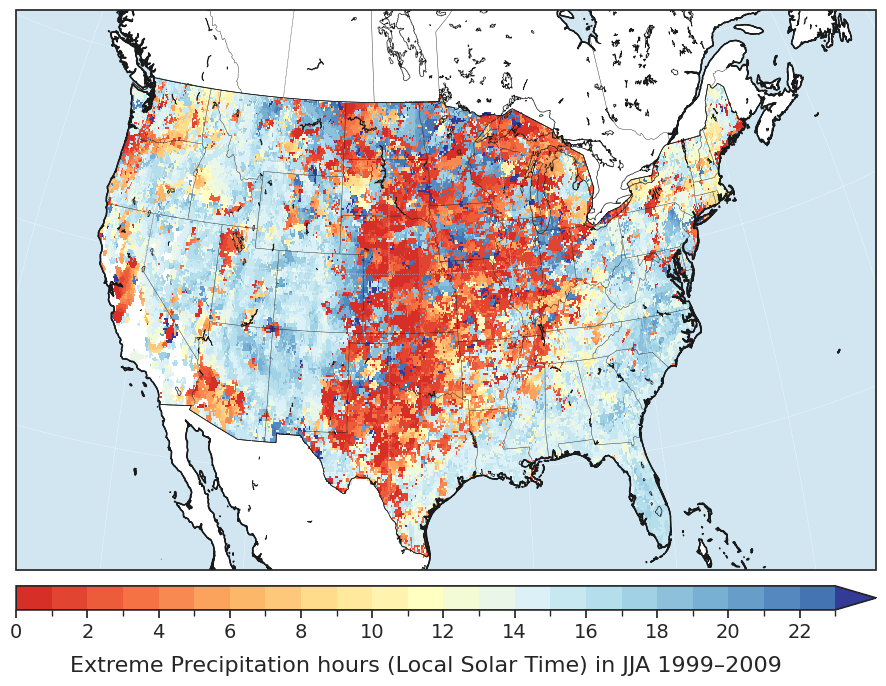

<Figure size 640x480 with 0 Axes>

In [265]:
# colorbar for column1

bounds = np.arange(0,24,1)
cols = plt.get_cmap('RdYlBu')(np.linspace(0.1,0.9,len(bounds)-1))#RdBu 
cmap = mpl.colors.ListedColormap(cols) 
cmap.set_over(plt.get_cmap('RdYlBu')(0.99)) 
cmap.set_under(plt.get_cmap('RdYlBu')(0)) 
norm = mpl.colors.BoundaryNorm(boundaries=bounds, ncolors=len(bounds)-1) 
sm = plt.cm.ScalarMappable(norm=norm,cmap=cmap) 
sm.set_array([]) 

extent_lonlat = (-126, -65, 23, 51) #extent_lonlat = (-126, -65, 23, 51)
ocean_color = np.float64([209,230,241])/255

latmin, latmax =  30, 45
lonmin, lonmax = -105, -85 

sns.set(font_scale=1.7, style="dark")

fig = plt.figure(figsize=(10,8),tight_layout = True) #8,10;,tight_layout = True
ncols = 1
nrows = 1
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, figure=fig)
gs.update(left = 0.1, right=0.96,top=0.9,bottom=0.2,wspace=0.1, hspace=0)
bottoms, tops, lefts, rights = gs.get_grid_positions(fig)

axes = []
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none')

newcoast = cfeature.NaturalEarthFeature('physical', 'coastline', '10m',
                                        edgecolor='k',facecolor='none')
newlake = cfeature.NaturalEarthFeature('physical', 'lakes', '10m',edgecolor='k', facecolor='none')
plt.rcParams["axes.edgecolor"] = "0.15"

for i in range(nrows):
    for j in range(ncols):        

        ax= fig.add_subplot(gs[i,j], projection= ccrs.Orthographic(central_longitude=-100, central_latitude=25, globe=None))
        ax.pcolormesh(data_array_test.longitude.values, data_array_test.latitude.values, np.where(mask, data_array_test.hour,  np.nan),transform=ccrs.PlateCarree(),cmap=cmap,norm=norm) #Regrid1Deg[0,:,:];mask_concat[0,:,:]

       
        ax.coastlines()
        ax.set_global()
        ax.set_extent(extent_lonlat, crs=ccrs.PlateCarree())
        ax.gridlines(xlocs=np.arange(-180,190,10),ylocs=np.arange(-180,190,10),linestyle="--",linewidth=0.3)
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(states_provinces, linewidth=0.3, linestyle='-', edgecolor='k')
        ax.add_feature(newcoast, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(newlake, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.LAND,color='w',zorder=0,edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN,color=ocean_color,zorder=0,edgecolor='k')
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN,color=ocean_color,zorder=1)
        ax.add_feature(newcoast, linewidth=1, linestyle='-', zorder=2,edgecolor='k')

        ax.set_aspect("auto") 
        axes.append(ax)


# Create axes for the colorbar on the same place. 
cbar_ax = fig.add_axes([lefts[0],0.15,rights[0]-lefts[0],0.03]) #[left, bottom, width, height]  
cb = fig.colorbar(sm,cax=cbar_ax,orientation="horizontal",pad=0.02,ticks=bounds[::2],use_gridspec=True,extend="max",fraction=0.1) #drawedges=True, 
cb.ax.set_xticklabels(bounds[::2], size=14)
cb.ax.set_xlabel(r"Extreme Precipitation hours (Local Solar Time) in JJA 1999–2009", size=16, labelpad=10) 

fig1 = plt.gcf()
# plt.tight_layout()
plt.show()
plt.draw()

# fig.savefig('HourlyP06utc.jpg', dpi=300, bbox_inches = "tight")

In [266]:
jja_files = []
for month in range(6,9):
    for year in range(2009,2019):
        filename = f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(month).zfill(2)}{year}.nc"
        jja_files.append(filename)

data = xr.open_mfdataset(jja_files)
data
    

freq_prcp_hours = []
for i in range(261):
    for j in range(591):
        print(i,j)
        freq_prcp_hours.append(max_prcp_hour(data.R99pa1hr[:,i,j], data.R99pa1hr[:,i,j].longitude))
        
latitude_values = data.latitude
longitude_values = data.longitude
data_array_test = xr.Dataset(
    coords={"latitude": latitude_values, "longitude": longitude_values},
)

data_array_test['hour'] = (('latitude', 'longitude'), np.array(freq_prcp_hours).reshape(261, 591))
data_array_test.to_netcdf('R99pw1hr/freq_prcp_hours_fourth_decade.nc')

0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
0 9
0 10
0 11
0 12
0 13
0 14
0 15
0 16
0 17
0 18
0 19
0 20
0 21
0 22
0 23
0 24
0 25
0 26
0 27
0 28
0 29
0 30
0 31
0 32
0 33
0 34
0 35
0 36
0 37
0 38
0 39
0 40
0 41
0 42
0 43
0 44
0 45
0 46
0 47
0 48
0 49
0 50
0 51
0 52
0 53
0 54
0 55
0 56
0 57
0 58
0 59
0 60
0 61
0 62
0 63
0 64
0 65
0 66
0 67
0 68
0 69
0 70
0 71
0 72
0 73
0 74
0 75
0 76
0 77
0 78
0 79
0 80
0 81
0 82
0 83
0 84
0 85
0 86
0 87
0 88
0 89
0 90
0 91
0 92
0 93
0 94
0 95
0 96
0 97
0 98
0 99
0 100
0 101
0 102
0 103
0 104
0 105
0 106
0 107
0 108
0 109
0 110
0 111
0 112
0 113
0 114
0 115
0 116
0 117
0 118
0 119
0 120
0 121
0 122
0 123
0 124
0 125
0 126
0 127
0 128
0 129
0 130
0 131
0 132
0 133
0 134
0 135
0 136
0 137
0 138
0 139
0 140
0 141
0 142
0 143
0 144
0 145
0 146
0 147
0 148
0 149
0 150
0 151
0 152
0 153
0 154
0 155
0 156
0 157
0 158
0 159
0 160
0 161
0 162
0 163
0 164
0 165
0 166
0 167
0 168
0 169
0 170
0 171
0 172
0 173
0 174
0 175
0 176
0 177
0 178
0 179
0 180
0 181
0 182
0 183
0 184


2 239
2 240
2 241
2 242
2 243
2 244
2 245
2 246
2 247
2 248
2 249
2 250
2 251
2 252
2 253
2 254
2 255
2 256
2 257
2 258
2 259
2 260
2 261
2 262
2 263
2 264
2 265
2 266
2 267
2 268
2 269
2 270
2 271
2 272
2 273
2 274
2 275
2 276
2 277
2 278
2 279
2 280
2 281
2 282
2 283
2 284
2 285
2 286
2 287
2 288
2 289
2 290
2 291
2 292
2 293
2 294
2 295
2 296
2 297
2 298
2 299
2 300
2 301
2 302
2 303
2 304
2 305
2 306
2 307
2 308
2 309
2 310
2 311
2 312
2 313
2 314
2 315
2 316
2 317
2 318
2 319
2 320
2 321
2 322
2 323
2 324
2 325
2 326
2 327
2 328
2 329
2 330
2 331
2 332
2 333
2 334
2 335
2 336
2 337
2 338
2 339
2 340
2 341
2 342
2 343
2 344
2 345
2 346
2 347
2 348
2 349
2 350
2 351
2 352
2 353
2 354
2 355
2 356
2 357
2 358
2 359
2 360
2 361
2 362
2 363
2 364
2 365
2 366
2 367
2 368
2 369
2 370
2 371
2 372
2 373
2 374
2 375
2 376
2 377
2 378
2 379
2 380
2 381
2 382
2 383
2 384
2 385
2 386
2 387
2 388
2 389
2 390
2 391
2 392
2 393
2 394
2 395
2 396
2 397
2 398
2 399
2 400
2 401
2 402
2 403
2 404
2 40

4 460
4 461
4 462
4 463
4 464
4 465
4 466
4 467
4 468
4 469
4 470
4 471
4 472
4 473
4 474
4 475
4 476
4 477
4 478
4 479
4 480
4 481
4 482
4 483
4 484
4 485
4 486
4 487
4 488
4 489
4 490
4 491
4 492
4 493
4 494
4 495
4 496
4 497
4 498
4 499
4 500
4 501
4 502
4 503
4 504
4 505
4 506
4 507
4 508
4 509
4 510
4 511
4 512
4 513
4 514
4 515
4 516
4 517
4 518
4 519
4 520
4 521
4 522
4 523
4 524
4 525
4 526
4 527
4 528
4 529
4 530
4 531
4 532
4 533
4 534
4 535
4 536
4 537
4 538
4 539
4 540
4 541
4 542
4 543
4 544
4 545
4 546
4 547
4 548
4 549
4 550
4 551
4 552
4 553
4 554
4 555
4 556
4 557
4 558
4 559
4 560
4 561
4 562
4 563
4 564
4 565
4 566
4 567
4 568
4 569
4 570
4 571
4 572
4 573
4 574
4 575
4 576
4 577
4 578
4 579
4 580
4 581
4 582
4 583
4 584
4 585
4 586
4 587
4 588
4 589
4 590
5 0
5 1
5 2
5 3
5 4
5 5
5 6
5 7
5 8
5 9
5 10
5 11
5 12
5 13
5 14
5 15
5 16
5 17
5 18
5 19
5 20
5 21
5 22
5 23
5 24
5 25
5 26
5 27
5 28
5 29
5 30
5 31
5 32
5 33
5 34
5 35
5 36
5 37
5 38
5 39
5 40
5 41
5 42
5 43
5 44

7 109
7 110
7 111
7 112
7 113
7 114
7 115
7 116
7 117
7 118
7 119
7 120
7 121
7 122
7 123
7 124
7 125
7 126
7 127
7 128
7 129
7 130
7 131
7 132
7 133
7 134
7 135
7 136
7 137
7 138
7 139
7 140
7 141
7 142
7 143
7 144
7 145
7 146
7 147
7 148
7 149
7 150
7 151
7 152
7 153
7 154
7 155
7 156
7 157
7 158
7 159
7 160
7 161
7 162
7 163
7 164
7 165
7 166
7 167
7 168
7 169
7 170
7 171
7 172
7 173
7 174
7 175
7 176
7 177
7 178
7 179
7 180
7 181
7 182
7 183
7 184
7 185
7 186
7 187
7 188
7 189
7 190
7 191
7 192
7 193
7 194
7 195
7 196
7 197
7 198
7 199
7 200
7 201
7 202
7 203
7 204
7 205
7 206
7 207
7 208
7 209
7 210
7 211
7 212
7 213
7 214
7 215
7 216
7 217
7 218
7 219
7 220
7 221
7 222
7 223
7 224
7 225
7 226
7 227
7 228
7 229
7 230
7 231
7 232
7 233
7 234
7 235
7 236
7 237
7 238
7 239
7 240
7 241
7 242
7 243
7 244
7 245
7 246
7 247
7 248
7 249
7 250
7 251
7 252
7 253
7 254
7 255
7 256
7 257
7 258
7 259
7 260
7 261
7 262
7 263
7 264
7 265
7 266
7 267
7 268
7 269
7 270
7 271
7 272
7 273
7 274
7 27

9 331
9 332
9 333
9 334
9 335
9 336
9 337
9 338
9 339
9 340
9 341
9 342
9 343
9 344
9 345
9 346
9 347
9 348
9 349
9 350
9 351
9 352
9 353
9 354
9 355
9 356
9 357
9 358
9 359
9 360
9 361
9 362
9 363
9 364
9 365
9 366
9 367
9 368
9 369
9 370
9 371
9 372
9 373
9 374
9 375
9 376
9 377
9 378
9 379
9 380
9 381
9 382
9 383
9 384
9 385
9 386
9 387
9 388
9 389
9 390
9 391
9 392
9 393
9 394
9 395
9 396
9 397
9 398
9 399
9 400
9 401
9 402
9 403
9 404
9 405
9 406
9 407
9 408
9 409
9 410
9 411
9 412
9 413
9 414
9 415
9 416
9 417
9 418
9 419
9 420
9 421
9 422
9 423
9 424
9 425
9 426
9 427
9 428
9 429
9 430
9 431
9 432
9 433
9 434
9 435
9 436
9 437
9 438
9 439
9 440
9 441
9 442
9 443
9 444
9 445
9 446
9 447
9 448
9 449
9 450
9 451
9 452
9 453
9 454
9 455
9 456
9 457
9 458
9 459
9 460
9 461
9 462
9 463
9 464
9 465
9 466
9 467
9 468
9 469
9 470
9 471
9 472
9 473
9 474
9 475
9 476
9 477
9 478
9 479
9 480
9 481
9 482
9 483
9 484
9 485
9 486
9 487
9 488
9 489
9 490
9 491
9 492
9 493
9 494
9 495
9 496
9 49

11 390
11 391
11 392
11 393
11 394
11 395
11 396
11 397
11 398
11 399
11 400
11 401
11 402
11 403
11 404
11 405
11 406
11 407
11 408
11 409
11 410
11 411
11 412
11 413
11 414
11 415
11 416
11 417
11 418
11 419
11 420
11 421
11 422
11 423
11 424
11 425
11 426
11 427
11 428
11 429
11 430
11 431
11 432
11 433
11 434
11 435
11 436
11 437
11 438
11 439
11 440
11 441
11 442
11 443
11 444
11 445
11 446
11 447
11 448
11 449
11 450
11 451
11 452
11 453
11 454
11 455
11 456
11 457
11 458
11 459
11 460
11 461
11 462
11 463
11 464
11 465
11 466
11 467
11 468
11 469
11 470
11 471
11 472
11 473
11 474
11 475
11 476
11 477
11 478
11 479
11 480
11 481
11 482
11 483
11 484
11 485
11 486
11 487
11 488
11 489
11 490
11 491
11 492
11 493
11 494
11 495
11 496
11 497
11 498
11 499
11 500
11 501
11 502
11 503
11 504
11 505
11 506
11 507
11 508
11 509
11 510
11 511
11 512
11 513
11 514
11 515
11 516
11 517
11 518
11 519
11 520
11 521
11 522
11 523
11 524
11 525
11 526
11 527
11 528
11 529
11 530
11 531
11 532

13 415
13 416
13 417
13 418
13 419
13 420
13 421
13 422
13 423
13 424
13 425
13 426
13 427
13 428
13 429
13 430
13 431
13 432
13 433
13 434
13 435
13 436
13 437
13 438
13 439
13 440
13 441
13 442
13 443
13 444
13 445
13 446
13 447
13 448
13 449
13 450
13 451
13 452
13 453
13 454
13 455
13 456
13 457
13 458
13 459
13 460
13 461
13 462
13 463
13 464
13 465
13 466
13 467
13 468
13 469
13 470
13 471
13 472
13 473
13 474
13 475
13 476
13 477
13 478
13 479
13 480
13 481
13 482
13 483
13 484
13 485
13 486
13 487
13 488
13 489
13 490
13 491
13 492
13 493
13 494
13 495
13 496
13 497
13 498
13 499
13 500
13 501
13 502
13 503
13 504
13 505
13 506
13 507
13 508
13 509
13 510
13 511
13 512
13 513
13 514
13 515
13 516
13 517
13 518
13 519
13 520
13 521
13 522
13 523
13 524
13 525
13 526
13 527
13 528
13 529
13 530
13 531
13 532
13 533
13 534
13 535
13 536
13 537
13 538
13 539
13 540
13 541
13 542
13 543
13 544
13 545
13 546
13 547
13 548
13 549
13 550
13 551
13 552
13 553
13 554
13 555
13 556
13 557

15 438
15 439
15 440
15 441
15 442
15 443
15 444
15 445
15 446
15 447
15 448
15 449
15 450
15 451
15 452
15 453
15 454
15 455
15 456
15 457
15 458
15 459
15 460
15 461
15 462
15 463
15 464
15 465
15 466
15 467
15 468
15 469
15 470
15 471
15 472
15 473
15 474
15 475
15 476
15 477
15 478
15 479
15 480
15 481
15 482
15 483
15 484
15 485
15 486
15 487
15 488
15 489
15 490
15 491
15 492
15 493
15 494
15 495
15 496
15 497
15 498
15 499
15 500
15 501
15 502
15 503
15 504
15 505
15 506
15 507
15 508
15 509
15 510
15 511
15 512
15 513
15 514
15 515
15 516
15 517
15 518
15 519
15 520
15 521
15 522
15 523
15 524
15 525
15 526
15 527
15 528
15 529
15 530
15 531
15 532
15 533
15 534
15 535
15 536
15 537
15 538
15 539
15 540
15 541
15 542
15 543
15 544
15 545
15 546
15 547
15 548
15 549
15 550
15 551
15 552
15 553
15 554
15 555
15 556
15 557
15 558
15 559
15 560
15 561
15 562
15 563
15 564
15 565
15 566
15 567
15 568
15 569
15 570
15 571
15 572
15 573
15 574
15 575
15 576
15 577
15 578
15 579
15 580

17 459
17 460
17 461
17 462
17 463
17 464
17 465
17 466
17 467
17 468
17 469
17 470
17 471
17 472
17 473
17 474
17 475
17 476
17 477
17 478
17 479
17 480
17 481
17 482
17 483
17 484
17 485
17 486
17 487
17 488
17 489
17 490
17 491
17 492
17 493
17 494
17 495
17 496
17 497
17 498
17 499
17 500
17 501
17 502
17 503
17 504
17 505
17 506
17 507
17 508
17 509
17 510
17 511
17 512
17 513
17 514
17 515
17 516
17 517
17 518
17 519
17 520
17 521
17 522
17 523
17 524
17 525
17 526
17 527
17 528
17 529
17 530
17 531
17 532
17 533
17 534
17 535
17 536
17 537
17 538
17 539
17 540
17 541
17 542
17 543
17 544
17 545
17 546
17 547
17 548
17 549
17 550
17 551
17 552
17 553
17 554
17 555
17 556
17 557
17 558
17 559
17 560
17 561
17 562
17 563
17 564
17 565
17 566
17 567
17 568
17 569
17 570
17 571
17 572
17 573
17 574
17 575
17 576
17 577
17 578
17 579
17 580
17 581
17 582
17 583
17 584
17 585
17 586
17 587
17 588
17 589
17 590
18 0
18 1
18 2
18 3
18 4
18 5
18 6
18 7
18 8
18 9
18 10
18 11
18 12
18 13
18

19 479
19 480
19 481
19 482
19 483
19 484
19 485
19 486
19 487
19 488
19 489
19 490
19 491
19 492
19 493
19 494
19 495
19 496
19 497
19 498
19 499
19 500
19 501
19 502
19 503
19 504
19 505
19 506
19 507
19 508
19 509
19 510
19 511
19 512
19 513
19 514
19 515
19 516
19 517
19 518
19 519
19 520
19 521
19 522
19 523
19 524
19 525
19 526
19 527
19 528
19 529
19 530
19 531
19 532
19 533
19 534
19 535
19 536
19 537
19 538
19 539
19 540
19 541
19 542
19 543
19 544
19 545
19 546
19 547
19 548
19 549
19 550
19 551
19 552
19 553
19 554
19 555
19 556
19 557
19 558
19 559
19 560
19 561
19 562
19 563
19 564
19 565
19 566
19 567
19 568
19 569
19 570
19 571
19 572
19 573
19 574
19 575
19 576
19 577
19 578
19 579
19 580
19 581
19 582
19 583
19 584
19 585
19 586
19 587
19 588
19 589
19 590
20 0
20 1
20 2
20 3
20 4
20 5
20 6
20 7
20 8
20 9
20 10
20 11
20 12
20 13
20 14
20 15
20 16
20 17
20 18
20 19
20 20
20 21
20 22
20 23
20 24
20 25
20 26
20 27
20 28
20 29
20 30
20 31
20 32
20 33
20 34
20 35
20 36
20 3

21 499
21 500
21 501
21 502
21 503
21 504
21 505
21 506
21 507
21 508
21 509
21 510
21 511
21 512
21 513
21 514
21 515
21 516
21 517
21 518
21 519
21 520
21 521
21 522
21 523
21 524
21 525
21 526
21 527
21 528
21 529
21 530
21 531
21 532
21 533
21 534
21 535
21 536
21 537
21 538
21 539
21 540
21 541
21 542
21 543
21 544
21 545
21 546
21 547
21 548
21 549
21 550
21 551
21 552
21 553
21 554
21 555
21 556
21 557
21 558
21 559
21 560
21 561
21 562
21 563
21 564
21 565
21 566
21 567
21 568
21 569
21 570
21 571
21 572
21 573
21 574
21 575
21 576
21 577
21 578
21 579
21 580
21 581
21 582
21 583
21 584
21 585
21 586
21 587
21 588
21 589
21 590
22 0
22 1
22 2
22 3
22 4
22 5
22 6
22 7
22 8
22 9
22 10
22 11
22 12
22 13
22 14
22 15
22 16
22 17
22 18
22 19
22 20
22 21
22 22
22 23
22 24
22 25
22 26
22 27
22 28
22 29
22 30
22 31
22 32
22 33
22 34
22 35
22 36
22 37
22 38
22 39
22 40
22 41
22 42
22 43
22 44
22 45
22 46
22 47
22 48
22 49
22 50
22 51
22 52
22 53
22 54
22 55
22 56
22 57
22 58
22 59
22 60


23 520
23 521
23 522
23 523
23 524
23 525
23 526
23 527
23 528
23 529
23 530
23 531
23 532
23 533
23 534
23 535
23 536
23 537
23 538
23 539
23 540
23 541
23 542
23 543
23 544
23 545
23 546
23 547
23 548
23 549
23 550
23 551
23 552
23 553
23 554
23 555
23 556
23 557
23 558
23 559
23 560
23 561
23 562
23 563
23 564
23 565
23 566
23 567
23 568
23 569
23 570
23 571
23 572
23 573
23 574
23 575
23 576
23 577
23 578
23 579
23 580
23 581
23 582
23 583
23 584
23 585
23 586
23 587
23 588
23 589
23 590
24 0
24 1
24 2
24 3
24 4
24 5
24 6
24 7
24 8
24 9
24 10
24 11
24 12
24 13
24 14
24 15
24 16
24 17
24 18
24 19
24 20
24 21
24 22
24 23
24 24
24 25
24 26
24 27
24 28
24 29
24 30
24 31
24 32
24 33
24 34
24 35
24 36
24 37
24 38
24 39
24 40
24 41
24 42
24 43
24 44
24 45
24 46
24 47
24 48
24 49
24 50
24 51
24 52
24 53
24 54
24 55
24 56
24 57
24 58
24 59
24 60
24 61
24 62
24 63
24 64
24 65
24 66
24 67
24 68
24 69
24 70
24 71
24 72
24 73
24 74
24 75
24 76
24 77
24 78
24 79
24 80
24 81
24 82
24 83
24 84
24 

25 540
25 541
25 542
25 543
25 544
25 545
25 546
25 547
25 548
25 549
25 550
25 551
25 552
25 553
25 554
25 555
25 556
25 557
25 558
25 559
25 560
25 561
25 562
25 563
25 564
25 565
25 566
25 567
25 568
25 569
25 570
25 571
25 572
25 573
25 574
25 575
25 576
25 577
25 578
25 579
25 580
25 581
25 582
25 583
25 584
25 585
25 586
25 587
25 588
25 589
25 590
26 0
26 1
26 2
26 3
26 4
26 5
26 6
26 7
26 8
26 9
26 10
26 11
26 12
26 13
26 14
26 15
26 16
26 17
26 18
26 19
26 20
26 21
26 22
26 23
26 24
26 25
26 26
26 27
26 28
26 29
26 30
26 31
26 32
26 33
26 34
26 35
26 36
26 37
26 38
26 39
26 40
26 41
26 42
26 43
26 44
26 45
26 46
26 47
26 48
26 49
26 50
26 51
26 52
26 53
26 54
26 55
26 56
26 57
26 58
26 59
26 60
26 61
26 62
26 63
26 64
26 65
26 66
26 67
26 68
26 69
26 70
26 71
26 72
26 73
26 74
26 75
26 76
26 77
26 78
26 79
26 80
26 81
26 82
26 83
26 84
26 85
26 86
26 87
26 88
26 89
26 90
26 91
26 92
26 93
26 94
26 95
26 96
26 97
26 98
26 99
26 100
26 101
26 102
26 103
26 104
26 105
26 106
26 1

27 560
27 561
27 562
27 563
27 564
27 565
27 566
27 567
27 568
27 569
27 570
27 571
27 572
27 573
27 574
27 575
27 576
27 577
27 578
27 579
27 580
27 581
27 582
27 583
27 584
27 585
27 586
27 587
27 588
27 589
27 590
28 0
28 1
28 2
28 3
28 4
28 5
28 6
28 7
28 8
28 9
28 10
28 11
28 12
28 13
28 14
28 15
28 16
28 17
28 18
28 19
28 20
28 21
28 22
28 23
28 24
28 25
28 26
28 27
28 28
28 29
28 30
28 31
28 32
28 33
28 34
28 35
28 36
28 37
28 38
28 39
28 40
28 41
28 42
28 43
28 44
28 45
28 46
28 47
28 48
28 49
28 50
28 51
28 52
28 53
28 54
28 55
28 56
28 57
28 58
28 59
28 60
28 61
28 62
28 63
28 64
28 65
28 66
28 67
28 68
28 69
28 70
28 71
28 72
28 73
28 74
28 75
28 76
28 77
28 78
28 79
28 80
28 81
28 82
28 83
28 84
28 85
28 86
28 87
28 88
28 89
28 90
28 91
28 92
28 93
28 94
28 95
28 96
28 97
28 98
28 99
28 100
28 101
28 102
28 103
28 104
28 105
28 106
28 107
28 108
28 109
28 110
28 111
28 112
28 113
28 114
28 115
28 116
28 117
28 118
28 119
28 120
28 121
28 122
28 123
28 124
28 125
28 126
28 1

29 583
29 584
29 585
29 586
29 587
29 588
29 589
29 590
30 0
30 1
30 2
30 3
30 4
30 5
30 6
30 7
30 8
30 9
30 10
30 11
30 12
30 13
30 14
30 15
30 16
30 17
30 18
30 19
30 20
30 21
30 22
30 23
30 24
30 25
30 26
30 27
30 28
30 29
30 30
30 31
30 32
30 33
30 34
30 35
30 36
30 37
30 38
30 39
30 40
30 41
30 42
30 43
30 44
30 45
30 46
30 47
30 48
30 49
30 50
30 51
30 52
30 53
30 54
30 55
30 56
30 57
30 58
30 59
30 60
30 61
30 62
30 63
30 64
30 65
30 66
30 67
30 68
30 69
30 70
30 71
30 72
30 73
30 74
30 75
30 76
30 77
30 78
30 79
30 80
30 81
30 82
30 83
30 84
30 85
30 86
30 87
30 88
30 89
30 90
30 91
30 92
30 93
30 94
30 95
30 96
30 97
30 98
30 99
30 100
30 101
30 102
30 103
30 104
30 105
30 106
30 107
30 108
30 109
30 110
30 111
30 112
30 113
30 114
30 115
30 116
30 117
30 118
30 119
30 120
30 121
30 122
30 123
30 124
30 125
30 126
30 127
30 128
30 129
30 130
30 131
30 132
30 133
30 134
30 135
30 136
30 137
30 138
30 139
30 140
30 141
30 142
30 143
30 144
30 145
30 146
30 147
30 148
30 149
30 1

32 22
32 23
32 24
32 25
32 26
32 27
32 28
32 29
32 30
32 31
32 32
32 33
32 34
32 35
32 36
32 37
32 38
32 39
32 40
32 41
32 42
32 43
32 44
32 45
32 46
32 47
32 48
32 49
32 50
32 51
32 52
32 53
32 54
32 55
32 56
32 57
32 58
32 59
32 60
32 61
32 62
32 63
32 64
32 65
32 66
32 67
32 68
32 69
32 70
32 71
32 72
32 73
32 74
32 75
32 76
32 77
32 78
32 79
32 80
32 81
32 82
32 83
32 84
32 85
32 86
32 87
32 88
32 89
32 90
32 91
32 92
32 93
32 94
32 95
32 96
32 97
32 98
32 99
32 100
32 101
32 102
32 103
32 104
32 105
32 106
32 107
32 108
32 109
32 110
32 111
32 112
32 113
32 114
32 115
32 116
32 117
32 118
32 119
32 120
32 121
32 122
32 123
32 124
32 125
32 126
32 127
32 128
32 129
32 130
32 131
32 132
32 133
32 134
32 135
32 136
32 137
32 138
32 139
32 140
32 141
32 142
32 143
32 144
32 145
32 146
32 147
32 148
32 149
32 150
32 151
32 152
32 153
32 154
32 155
32 156
32 157
32 158
32 159
32 160
32 161
32 162
32 163
32 164
32 165
32 166
32 167
32 168
32 169
32 170
32 171
32 172
32 173
32 174
32 175


34 49
34 50
34 51
34 52
34 53
34 54
34 55
34 56
34 57
34 58
34 59
34 60
34 61
34 62
34 63
34 64
34 65
34 66
34 67
34 68
34 69
34 70
34 71
34 72
34 73
34 74
34 75
34 76
34 77
34 78
34 79
34 80
34 81
34 82
34 83
34 84
34 85
34 86
34 87
34 88
34 89
34 90
34 91
34 92
34 93
34 94
34 95
34 96
34 97
34 98
34 99
34 100
34 101
34 102
34 103
34 104
34 105
34 106
34 107
34 108
34 109
34 110
34 111
34 112
34 113
34 114
34 115
34 116
34 117
34 118
34 119
34 120
34 121
34 122
34 123
34 124
34 125
34 126
34 127
34 128
34 129
34 130
34 131
34 132
34 133
34 134
34 135
34 136
34 137
34 138
34 139
34 140
34 141
34 142
34 143
34 144
34 145
34 146
34 147
34 148
34 149
34 150
34 151
34 152
34 153
34 154
34 155
34 156
34 157
34 158
34 159
34 160
34 161
34 162
34 163
34 164
34 165
34 166
34 167
34 168
34 169
34 170
34 171
34 172
34 173
34 174
34 175
34 176
34 177
34 178
34 179
34 180
34 181
34 182
34 183
34 184
34 185
34 186
34 187
34 188
34 189
34 190
34 191
34 192
34 193
34 194
34 195
34 196
34 197
34 198
3

36 76
36 77
36 78
36 79
36 80
36 81
36 82
36 83
36 84
36 85
36 86
36 87
36 88
36 89
36 90
36 91
36 92
36 93
36 94
36 95
36 96
36 97
36 98
36 99
36 100
36 101
36 102
36 103
36 104
36 105
36 106
36 107
36 108
36 109
36 110
36 111
36 112
36 113
36 114
36 115
36 116
36 117
36 118
36 119
36 120
36 121
36 122
36 123
36 124
36 125
36 126
36 127
36 128
36 129
36 130
36 131
36 132
36 133
36 134
36 135
36 136
36 137
36 138
36 139
36 140
36 141
36 142
36 143
36 144
36 145
36 146
36 147
36 148
36 149
36 150
36 151
36 152
36 153
36 154
36 155
36 156
36 157
36 158
36 159
36 160
36 161
36 162
36 163
36 164
36 165
36 166
36 167
36 168
36 169
36 170
36 171
36 172
36 173
36 174
36 175
36 176
36 177
36 178
36 179
36 180
36 181
36 182
36 183
36 184
36 185
36 186
36 187
36 188
36 189
36 190
36 191
36 192
36 193
36 194
36 195
36 196
36 197
36 198
36 199
36 200
36 201
36 202
36 203
36 204
36 205
36 206
36 207
36 208
36 209
36 210
36 211
36 212
36 213
36 214
36 215
36 216
36 217
36 218
36 219
36 220
36 221
36

38 100
38 101
38 102
38 103
38 104
38 105
38 106
38 107
38 108
38 109
38 110
38 111
38 112
38 113
38 114
38 115
38 116
38 117
38 118
38 119
38 120
38 121
38 122
38 123
38 124
38 125
38 126
38 127
38 128
38 129
38 130
38 131
38 132
38 133
38 134
38 135
38 136
38 137
38 138
38 139
38 140
38 141
38 142
38 143
38 144
38 145
38 146
38 147
38 148
38 149
38 150
38 151
38 152
38 153
38 154
38 155
38 156
38 157
38 158
38 159
38 160
38 161
38 162
38 163
38 164
38 165
38 166
38 167
38 168
38 169
38 170
38 171
38 172
38 173
38 174
38 175
38 176
38 177
38 178
38 179
38 180
38 181
38 182
38 183
38 184
38 185
38 186
38 187
38 188
38 189
38 190
38 191
38 192
38 193
38 194
38 195
38 196
38 197
38 198
38 199
38 200
38 201
38 202
38 203
38 204
38 205
38 206
38 207
38 208
38 209
38 210
38 211
38 212
38 213
38 214
38 215
38 216
38 217
38 218
38 219
38 220
38 221
38 222
38 223
38 224
38 225
38 226
38 227
38 228
38 229
38 230
38 231
38 232
38 233
38 234
38 235
38 236
38 237
38 238
38 239
38 240
38 241
38 242

40 122
40 123
40 124
40 125
40 126
40 127
40 128
40 129
40 130
40 131
40 132
40 133
40 134
40 135
40 136
40 137
40 138
40 139
40 140
40 141
40 142
40 143
40 144
40 145
40 146
40 147
40 148
40 149
40 150
40 151
40 152
40 153
40 154
40 155
40 156
40 157
40 158
40 159
40 160
40 161
40 162
40 163
40 164
40 165
40 166
40 167
40 168
40 169
40 170
40 171
40 172
40 173
40 174
40 175
40 176
40 177
40 178
40 179
40 180
40 181
40 182
40 183
40 184
40 185
40 186
40 187
40 188
40 189
40 190
40 191
40 192
40 193
40 194
40 195
40 196
40 197
40 198
40 199
40 200
40 201
40 202
40 203
40 204
40 205
40 206
40 207
40 208
40 209
40 210
40 211
40 212
40 213
40 214
40 215
40 216
40 217
40 218
40 219
40 220
40 221
40 222
40 223
40 224
40 225
40 226
40 227
40 228
40 229
40 230
40 231
40 232
40 233
40 234
40 235
40 236
40 237
40 238
40 239
40 240
40 241
40 242
40 243
40 244
40 245
40 246
40 247
40 248
40 249
40 250
40 251
40 252
40 253
40 254
40 255
40 256
40 257
40 258
40 259
40 260
40 261
40 262
40 263
40 264

42 143
42 144
42 145
42 146
42 147
42 148
42 149
42 150
42 151
42 152
42 153
42 154
42 155
42 156
42 157
42 158
42 159
42 160
42 161
42 162
42 163
42 164
42 165
42 166
42 167
42 168
42 169
42 170
42 171
42 172
42 173
42 174
42 175
42 176
42 177
42 178
42 179
42 180
42 181
42 182
42 183
42 184
42 185
42 186
42 187
42 188
42 189
42 190
42 191
42 192
42 193
42 194
42 195
42 196
42 197
42 198
42 199
42 200
42 201
42 202
42 203
42 204
42 205
42 206
42 207
42 208
42 209
42 210
42 211
42 212
42 213
42 214
42 215
42 216
42 217
42 218
42 219
42 220
42 221
42 222
42 223
42 224
42 225
42 226
42 227
42 228
42 229
42 230
42 231
42 232
42 233
42 234
42 235
42 236
42 237
42 238
42 239
42 240
42 241
42 242
42 243
42 244
42 245
42 246
42 247
42 248
42 249
42 250
42 251
42 252
42 253
42 254
42 255
42 256
42 257
42 258
42 259
42 260
42 261
42 262
42 263
42 264
42 265
42 266
42 267
42 268
42 269
42 270
42 271
42 272
42 273
42 274
42 275
42 276
42 277
42 278
42 279
42 280
42 281
42 282
42 283
42 284
42 285

44 166
44 167
44 168
44 169
44 170
44 171
44 172
44 173
44 174
44 175
44 176
44 177
44 178
44 179
44 180
44 181
44 182
44 183
44 184
44 185
44 186
44 187
44 188
44 189
44 190
44 191
44 192
44 193
44 194
44 195
44 196
44 197
44 198
44 199
44 200
44 201
44 202
44 203
44 204
44 205
44 206
44 207
44 208
44 209
44 210
44 211
44 212
44 213
44 214
44 215
44 216
44 217
44 218
44 219
44 220
44 221
44 222
44 223
44 224
44 225
44 226
44 227
44 228
44 229
44 230
44 231
44 232
44 233
44 234
44 235
44 236
44 237
44 238
44 239
44 240
44 241
44 242
44 243
44 244
44 245
44 246
44 247
44 248
44 249
44 250
44 251
44 252
44 253
44 254
44 255
44 256
44 257
44 258
44 259
44 260
44 261
44 262
44 263
44 264
44 265
44 266
44 267
44 268
44 269
44 270
44 271
44 272
44 273
44 274
44 275
44 276
44 277
44 278
44 279
44 280
44 281
44 282
44 283
44 284
44 285
44 286
44 287
44 288
44 289
44 290
44 291
44 292
44 293
44 294
44 295
44 296
44 297
44 298
44 299
44 300
44 301
44 302
44 303
44 304
44 305
44 306
44 307
44 308

46 186
46 187
46 188
46 189
46 190
46 191
46 192
46 193
46 194
46 195
46 196
46 197
46 198
46 199
46 200
46 201
46 202
46 203
46 204
46 205
46 206
46 207
46 208
46 209
46 210
46 211
46 212
46 213
46 214
46 215
46 216
46 217
46 218
46 219
46 220
46 221
46 222
46 223
46 224
46 225
46 226
46 227
46 228
46 229
46 230
46 231
46 232
46 233
46 234
46 235
46 236
46 237
46 238
46 239
46 240
46 241
46 242
46 243
46 244
46 245
46 246
46 247
46 248
46 249
46 250
46 251
46 252
46 253
46 254
46 255
46 256
46 257
46 258
46 259
46 260
46 261
46 262
46 263
46 264
46 265
46 266
46 267
46 268
46 269
46 270
46 271
46 272
46 273
46 274
46 275
46 276
46 277
46 278
46 279
46 280
46 281
46 282
46 283
46 284
46 285
46 286
46 287
46 288
46 289
46 290
46 291
46 292
46 293
46 294
46 295
46 296
46 297
46 298
46 299
46 300
46 301
46 302
46 303
46 304
46 305
46 306
46 307
46 308
46 309
46 310
46 311
46 312
46 313
46 314
46 315
46 316
46 317
46 318
46 319
46 320
46 321
46 322
46 323
46 324
46 325
46 326
46 327
46 328

48 208
48 209
48 210
48 211
48 212
48 213
48 214
48 215
48 216
48 217
48 218
48 219
48 220
48 221
48 222
48 223
48 224
48 225
48 226
48 227
48 228
48 229
48 230
48 231
48 232
48 233
48 234
48 235
48 236
48 237
48 238
48 239
48 240
48 241
48 242
48 243
48 244
48 245
48 246
48 247
48 248
48 249
48 250
48 251
48 252
48 253
48 254
48 255
48 256
48 257
48 258
48 259
48 260
48 261
48 262
48 263
48 264
48 265
48 266
48 267
48 268
48 269
48 270
48 271
48 272
48 273
48 274
48 275
48 276
48 277
48 278
48 279
48 280
48 281
48 282
48 283
48 284
48 285
48 286
48 287
48 288
48 289
48 290
48 291
48 292
48 293
48 294
48 295
48 296
48 297
48 298
48 299
48 300
48 301
48 302
48 303
48 304
48 305
48 306
48 307
48 308
48 309
48 310
48 311
48 312
48 313
48 314
48 315
48 316
48 317
48 318
48 319
48 320
48 321
48 322
48 323
48 324
48 325
48 326
48 327
48 328
48 329
48 330
48 331
48 332
48 333
48 334
48 335
48 336
48 337
48 338
48 339
48 340
48 341
48 342
48 343
48 344
48 345
48 346
48 347
48 348
48 349
48 350

50 230
50 231
50 232
50 233
50 234
50 235
50 236
50 237
50 238
50 239
50 240
50 241
50 242
50 243
50 244
50 245
50 246
50 247
50 248
50 249
50 250
50 251
50 252
50 253
50 254
50 255
50 256
50 257
50 258
50 259
50 260
50 261
50 262
50 263
50 264
50 265
50 266
50 267
50 268
50 269
50 270
50 271
50 272
50 273
50 274
50 275
50 276
50 277
50 278
50 279
50 280
50 281
50 282
50 283
50 284
50 285
50 286
50 287
50 288
50 289
50 290
50 291
50 292
50 293
50 294
50 295
50 296
50 297
50 298
50 299
50 300
50 301
50 302
50 303
50 304
50 305
50 306
50 307
50 308
50 309
50 310
50 311
50 312
50 313
50 314
50 315
50 316
50 317
50 318
50 319
50 320
50 321
50 322
50 323
50 324
50 325
50 326
50 327
50 328
50 329
50 330
50 331
50 332
50 333
50 334
50 335
50 336
50 337
50 338
50 339
50 340
50 341
50 342
50 343
50 344
50 345
50 346
50 347
50 348
50 349
50 350
50 351
50 352
50 353
50 354
50 355
50 356
50 357
50 358
50 359
50 360
50 361
50 362
50 363
50 364
50 365
50 366
50 367
50 368
50 369
50 370
50 371
50 372

52 250
52 251
52 252
52 253
52 254
52 255
52 256
52 257
52 258
52 259
52 260
52 261
52 262
52 263
52 264
52 265
52 266
52 267
52 268
52 269
52 270
52 271
52 272
52 273
52 274
52 275
52 276
52 277
52 278
52 279
52 280
52 281
52 282
52 283
52 284
52 285
52 286
52 287
52 288
52 289
52 290
52 291
52 292
52 293
52 294
52 295
52 296
52 297
52 298
52 299
52 300
52 301
52 302
52 303
52 304
52 305
52 306
52 307
52 308
52 309
52 310
52 311
52 312
52 313
52 314
52 315
52 316
52 317
52 318
52 319
52 320
52 321
52 322
52 323
52 324
52 325
52 326
52 327
52 328
52 329
52 330
52 331
52 332
52 333
52 334
52 335
52 336
52 337
52 338
52 339
52 340
52 341
52 342
52 343
52 344
52 345
52 346
52 347
52 348
52 349
52 350
52 351
52 352
52 353
52 354
52 355
52 356
52 357
52 358
52 359
52 360
52 361
52 362
52 363
52 364
52 365
52 366
52 367
52 368
52 369
52 370
52 371
52 372
52 373
52 374
52 375
52 376
52 377
52 378
52 379
52 380
52 381
52 382
52 383
52 384
52 385
52 386
52 387
52 388
52 389
52 390
52 391
52 392

54 271
54 272
54 273
54 274
54 275
54 276
54 277
54 278
54 279
54 280
54 281
54 282
54 283
54 284
54 285
54 286
54 287
54 288
54 289
54 290
54 291
54 292
54 293
54 294
54 295
54 296
54 297
54 298
54 299
54 300
54 301
54 302
54 303
54 304
54 305
54 306
54 307
54 308
54 309
54 310
54 311
54 312
54 313
54 314
54 315
54 316
54 317
54 318
54 319
54 320
54 321
54 322
54 323
54 324
54 325
54 326
54 327
54 328
54 329
54 330
54 331
54 332
54 333
54 334
54 335
54 336
54 337
54 338
54 339
54 340
54 341
54 342
54 343
54 344
54 345
54 346
54 347
54 348
54 349
54 350
54 351
54 352
54 353
54 354
54 355
54 356
54 357
54 358
54 359
54 360
54 361
54 362
54 363
54 364
54 365
54 366
54 367
54 368
54 369
54 370
54 371
54 372
54 373
54 374
54 375
54 376
54 377
54 378
54 379
54 380
54 381
54 382
54 383
54 384
54 385
54 386
54 387
54 388
54 389
54 390
54 391
54 392
54 393
54 394
54 395
54 396
54 397
54 398
54 399
54 400
54 401
54 402
54 403
54 404
54 405
54 406
54 407
54 408
54 409
54 410
54 411
54 412
54 413

56 294
56 295
56 296
56 297
56 298
56 299
56 300
56 301
56 302
56 303
56 304
56 305
56 306
56 307
56 308
56 309
56 310
56 311
56 312
56 313
56 314
56 315
56 316
56 317
56 318
56 319
56 320
56 321
56 322
56 323
56 324
56 325
56 326
56 327
56 328
56 329
56 330
56 331
56 332
56 333
56 334
56 335
56 336
56 337
56 338
56 339
56 340
56 341
56 342
56 343
56 344
56 345
56 346
56 347
56 348
56 349
56 350
56 351
56 352
56 353
56 354
56 355
56 356
56 357
56 358
56 359
56 360
56 361
56 362
56 363
56 364
56 365
56 366
56 367
56 368
56 369
56 370
56 371
56 372
56 373
56 374
56 375
56 376
56 377
56 378
56 379
56 380
56 381
56 382
56 383
56 384
56 385
56 386
56 387
56 388
56 389
56 390
56 391
56 392
56 393
56 394
56 395
56 396
56 397
56 398
56 399
56 400
56 401
56 402
56 403
56 404
56 405
56 406
56 407
56 408
56 409
56 410
56 411
56 412
56 413
56 414
56 415
56 416
56 417
56 418
56 419
56 420
56 421
56 422
56 423
56 424
56 425
56 426
56 427
56 428
56 429
56 430
56 431
56 432
56 433
56 434
56 435
56 436

58 317
58 318
58 319
58 320
58 321
58 322
58 323
58 324
58 325
58 326
58 327
58 328
58 329
58 330
58 331
58 332
58 333
58 334
58 335
58 336
58 337
58 338
58 339
58 340
58 341
58 342
58 343
58 344
58 345
58 346
58 347
58 348
58 349
58 350
58 351
58 352
58 353
58 354
58 355
58 356
58 357
58 358
58 359
58 360
58 361
58 362
58 363
58 364
58 365
58 366
58 367
58 368
58 369
58 370
58 371
58 372
58 373
58 374
58 375
58 376
58 377
58 378
58 379
58 380
58 381
58 382
58 383
58 384
58 385
58 386
58 387
58 388
58 389
58 390
58 391
58 392
58 393
58 394
58 395
58 396
58 397
58 398
58 399
58 400
58 401
58 402
58 403
58 404
58 405
58 406
58 407
58 408
58 409
58 410
58 411
58 412
58 413
58 414
58 415
58 416
58 417
58 418
58 419
58 420
58 421
58 422
58 423
58 424
58 425
58 426
58 427
58 428
58 429
58 430
58 431
58 432
58 433
58 434
58 435
58 436
58 437
58 438
58 439
58 440
58 441
58 442
58 443
58 444
58 445
58 446
58 447
58 448
58 449
58 450
58 451
58 452
58 453
58 454
58 455
58 456
58 457
58 458
58 459

60 341
60 342
60 343
60 344
60 345
60 346
60 347
60 348
60 349
60 350
60 351
60 352
60 353
60 354
60 355
60 356
60 357
60 358
60 359
60 360
60 361
60 362
60 363
60 364
60 365
60 366
60 367
60 368
60 369
60 370
60 371
60 372
60 373
60 374
60 375
60 376
60 377
60 378
60 379
60 380
60 381
60 382
60 383
60 384
60 385
60 386
60 387
60 388
60 389
60 390
60 391
60 392
60 393
60 394
60 395
60 396
60 397
60 398
60 399
60 400
60 401
60 402
60 403
60 404
60 405
60 406
60 407
60 408
60 409
60 410
60 411
60 412
60 413
60 414
60 415
60 416
60 417
60 418
60 419
60 420
60 421
60 422
60 423
60 424
60 425
60 426
60 427
60 428
60 429
60 430
60 431
60 432
60 433
60 434
60 435
60 436
60 437
60 438
60 439
60 440
60 441
60 442
60 443
60 444
60 445
60 446
60 447
60 448
60 449
60 450
60 451
60 452
60 453
60 454
60 455
60 456
60 457
60 458
60 459
60 460
60 461
60 462
60 463
60 464
60 465
60 466
60 467
60 468
60 469
60 470
60 471
60 472
60 473
60 474
60 475
60 476
60 477
60 478
60 479
60 480
60 481
60 482
60 483

62 361
62 362
62 363
62 364
62 365
62 366
62 367
62 368
62 369
62 370
62 371
62 372
62 373
62 374
62 375
62 376
62 377
62 378
62 379
62 380
62 381
62 382
62 383
62 384
62 385
62 386
62 387
62 388
62 389
62 390
62 391
62 392
62 393
62 394
62 395
62 396
62 397
62 398
62 399
62 400
62 401
62 402
62 403
62 404
62 405
62 406
62 407
62 408
62 409
62 410
62 411
62 412
62 413
62 414
62 415
62 416
62 417
62 418
62 419
62 420
62 421
62 422
62 423
62 424
62 425
62 426
62 427
62 428
62 429
62 430
62 431
62 432
62 433
62 434
62 435
62 436
62 437
62 438
62 439
62 440
62 441
62 442
62 443
62 444
62 445
62 446
62 447
62 448
62 449
62 450
62 451
62 452
62 453
62 454
62 455
62 456
62 457
62 458
62 459
62 460
62 461
62 462
62 463
62 464
62 465
62 466
62 467
62 468
62 469
62 470
62 471
62 472
62 473
62 474
62 475
62 476
62 477
62 478
62 479
62 480
62 481
62 482
62 483
62 484
62 485
62 486
62 487
62 488
62 489
62 490
62 491
62 492
62 493
62 494
62 495
62 496
62 497
62 498
62 499
62 500
62 501
62 502
62 503

64 381
64 382
64 383
64 384
64 385
64 386
64 387
64 388
64 389
64 390
64 391
64 392
64 393
64 394
64 395
64 396
64 397
64 398
64 399
64 400
64 401
64 402
64 403
64 404
64 405
64 406
64 407
64 408
64 409
64 410
64 411
64 412
64 413
64 414
64 415
64 416
64 417
64 418
64 419
64 420
64 421
64 422
64 423
64 424
64 425
64 426
64 427
64 428
64 429
64 430
64 431
64 432
64 433
64 434
64 435
64 436
64 437
64 438
64 439
64 440
64 441
64 442
64 443
64 444
64 445
64 446
64 447
64 448
64 449
64 450
64 451
64 452
64 453
64 454
64 455
64 456
64 457
64 458
64 459
64 460
64 461
64 462
64 463
64 464
64 465
64 466
64 467
64 468
64 469
64 470
64 471
64 472
64 473
64 474
64 475
64 476
64 477
64 478
64 479
64 480
64 481
64 482
64 483
64 484
64 485
64 486
64 487
64 488
64 489
64 490
64 491
64 492
64 493
64 494
64 495
64 496
64 497
64 498
64 499
64 500
64 501
64 502
64 503
64 504
64 505
64 506
64 507
64 508
64 509
64 510
64 511
64 512
64 513
64 514
64 515
64 516
64 517
64 518
64 519
64 520
64 521
64 522
64 523

66 403
66 404
66 405
66 406
66 407
66 408
66 409
66 410
66 411
66 412
66 413
66 414
66 415
66 416
66 417
66 418
66 419
66 420
66 421
66 422
66 423
66 424
66 425
66 426
66 427
66 428
66 429
66 430
66 431
66 432
66 433
66 434
66 435
66 436
66 437
66 438
66 439
66 440
66 441
66 442
66 443
66 444
66 445
66 446
66 447
66 448
66 449
66 450
66 451
66 452
66 453
66 454
66 455
66 456
66 457
66 458
66 459
66 460
66 461
66 462
66 463
66 464
66 465
66 466
66 467
66 468
66 469
66 470
66 471
66 472
66 473
66 474
66 475
66 476
66 477
66 478
66 479
66 480
66 481
66 482
66 483
66 484
66 485
66 486
66 487
66 488
66 489
66 490
66 491
66 492
66 493
66 494
66 495
66 496
66 497
66 498
66 499
66 500
66 501
66 502
66 503
66 504
66 505
66 506
66 507
66 508
66 509
66 510
66 511
66 512
66 513
66 514
66 515
66 516
66 517
66 518
66 519
66 520
66 521
66 522
66 523
66 524
66 525
66 526
66 527
66 528
66 529
66 530
66 531
66 532
66 533
66 534
66 535
66 536
66 537
66 538
66 539
66 540
66 541
66 542
66 543
66 544
66 545

68 425
68 426
68 427
68 428
68 429
68 430
68 431
68 432
68 433
68 434
68 435
68 436
68 437
68 438
68 439
68 440
68 441
68 442
68 443
68 444
68 445
68 446
68 447
68 448
68 449
68 450
68 451
68 452
68 453
68 454
68 455
68 456
68 457
68 458
68 459
68 460
68 461
68 462
68 463
68 464
68 465
68 466
68 467
68 468
68 469
68 470
68 471
68 472
68 473
68 474
68 475
68 476
68 477
68 478
68 479
68 480
68 481
68 482
68 483
68 484
68 485
68 486
68 487
68 488
68 489
68 490
68 491
68 492
68 493
68 494
68 495
68 496
68 497
68 498
68 499
68 500
68 501
68 502
68 503
68 504
68 505
68 506
68 507
68 508
68 509
68 510
68 511
68 512
68 513
68 514
68 515
68 516
68 517
68 518
68 519
68 520
68 521
68 522
68 523
68 524
68 525
68 526
68 527
68 528
68 529
68 530
68 531
68 532
68 533
68 534
68 535
68 536
68 537
68 538
68 539
68 540
68 541
68 542
68 543
68 544
68 545
68 546
68 547
68 548
68 549
68 550
68 551
68 552
68 553
68 554
68 555
68 556
68 557
68 558
68 559
68 560
68 561
68 562
68 563
68 564
68 565
68 566
68 567

70 449
70 450
70 451
70 452
70 453
70 454
70 455
70 456
70 457
70 458
70 459
70 460
70 461
70 462
70 463
70 464
70 465
70 466
70 467
70 468
70 469
70 470
70 471
70 472
70 473
70 474
70 475
70 476
70 477
70 478
70 479
70 480
70 481
70 482
70 483
70 484
70 485
70 486
70 487
70 488
70 489
70 490
70 491
70 492
70 493
70 494
70 495
70 496
70 497
70 498
70 499
70 500
70 501
70 502
70 503
70 504
70 505
70 506
70 507
70 508
70 509
70 510
70 511
70 512
70 513
70 514
70 515
70 516
70 517
70 518
70 519
70 520
70 521
70 522
70 523
70 524
70 525
70 526
70 527
70 528
70 529
70 530
70 531
70 532
70 533
70 534
70 535
70 536
70 537
70 538
70 539
70 540
70 541
70 542
70 543
70 544
70 545
70 546
70 547
70 548
70 549
70 550
70 551
70 552
70 553
70 554
70 555
70 556
70 557
70 558
70 559
70 560
70 561
70 562
70 563
70 564
70 565
70 566
70 567
70 568
70 569
70 570
70 571
70 572
70 573
70 574
70 575
70 576
70 577
70 578
70 579
70 580
70 581
70 582
70 583
70 584
70 585
70 586
70 587
70 588
70 589
70 590
71 0
7

72 470
72 471
72 472
72 473
72 474
72 475
72 476
72 477
72 478
72 479
72 480
72 481
72 482
72 483
72 484
72 485
72 486
72 487
72 488
72 489
72 490
72 491
72 492
72 493
72 494
72 495
72 496
72 497
72 498
72 499
72 500
72 501
72 502
72 503
72 504
72 505
72 506
72 507
72 508
72 509
72 510
72 511
72 512
72 513
72 514
72 515
72 516
72 517
72 518
72 519
72 520
72 521
72 522
72 523
72 524
72 525
72 526
72 527
72 528
72 529
72 530
72 531
72 532
72 533
72 534
72 535
72 536
72 537
72 538
72 539
72 540
72 541
72 542
72 543
72 544
72 545
72 546
72 547
72 548
72 549
72 550
72 551
72 552
72 553
72 554
72 555
72 556
72 557
72 558
72 559
72 560
72 561
72 562
72 563
72 564
72 565
72 566
72 567
72 568
72 569
72 570
72 571
72 572
72 573
72 574
72 575
72 576
72 577
72 578
72 579
72 580
72 581
72 582
72 583
72 584
72 585
72 586
72 587
72 588
72 589
72 590
73 0
73 1
73 2
73 3
73 4
73 5
73 6
73 7
73 8
73 9
73 10
73 11
73 12
73 13
73 14
73 15
73 16
73 17
73 18
73 19
73 20
73 21
73 22
73 23
73 24
73 25
73 26
7

74 494
74 495
74 496
74 497
74 498
74 499
74 500
74 501
74 502
74 503
74 504
74 505
74 506
74 507
74 508
74 509
74 510
74 511
74 512
74 513
74 514
74 515
74 516
74 517
74 518
74 519
74 520
74 521
74 522
74 523
74 524
74 525
74 526
74 527
74 528
74 529
74 530
74 531
74 532
74 533
74 534
74 535
74 536
74 537
74 538
74 539
74 540
74 541
74 542
74 543
74 544
74 545
74 546
74 547
74 548
74 549
74 550
74 551
74 552
74 553
74 554
74 555
74 556
74 557
74 558
74 559
74 560
74 561
74 562
74 563
74 564
74 565
74 566
74 567
74 568
74 569
74 570
74 571
74 572
74 573
74 574
74 575
74 576
74 577
74 578
74 579
74 580
74 581
74 582
74 583
74 584
74 585
74 586
74 587
74 588
74 589
74 590
75 0
75 1
75 2
75 3
75 4
75 5
75 6
75 7
75 8
75 9
75 10
75 11
75 12
75 13
75 14
75 15
75 16
75 17
75 18
75 19
75 20
75 21
75 22
75 23
75 24
75 25
75 26
75 27
75 28
75 29
75 30
75 31
75 32
75 33
75 34
75 35
75 36
75 37
75 38
75 39
75 40
75 41
75 42
75 43
75 44
75 45
75 46
75 47
75 48
75 49
75 50
75 51
75 52
75 53
75 54
7

76 516
76 517
76 518
76 519
76 520
76 521
76 522
76 523
76 524
76 525
76 526
76 527
76 528
76 529
76 530
76 531
76 532
76 533
76 534
76 535
76 536
76 537
76 538
76 539
76 540
76 541
76 542
76 543
76 544
76 545
76 546
76 547
76 548
76 549
76 550
76 551
76 552
76 553
76 554
76 555
76 556
76 557
76 558
76 559
76 560
76 561
76 562
76 563
76 564
76 565
76 566
76 567
76 568
76 569
76 570
76 571
76 572
76 573
76 574
76 575
76 576
76 577
76 578
76 579
76 580
76 581
76 582
76 583
76 584
76 585
76 586
76 587
76 588
76 589
76 590
77 0
77 1
77 2
77 3
77 4
77 5
77 6
77 7
77 8
77 9
77 10
77 11
77 12
77 13
77 14
77 15
77 16
77 17
77 18
77 19
77 20
77 21
77 22
77 23
77 24
77 25
77 26
77 27
77 28
77 29
77 30
77 31
77 32
77 33
77 34
77 35
77 36
77 37
77 38
77 39
77 40
77 41
77 42
77 43
77 44
77 45
77 46
77 47
77 48
77 49
77 50
77 51
77 52
77 53
77 54
77 55
77 56
77 57
77 58
77 59
77 60
77 61
77 62
77 63
77 64
77 65
77 66
77 67
77 68
77 69
77 70
77 71
77 72
77 73
77 74
77 75
77 76
77 77
77 78
77 79
77 80

78 538
78 539
78 540
78 541
78 542
78 543
78 544
78 545
78 546
78 547
78 548
78 549
78 550
78 551
78 552
78 553
78 554
78 555
78 556
78 557
78 558
78 559
78 560
78 561
78 562
78 563
78 564
78 565
78 566
78 567
78 568
78 569
78 570
78 571
78 572
78 573
78 574
78 575
78 576
78 577
78 578
78 579
78 580
78 581
78 582
78 583
78 584
78 585
78 586
78 587
78 588
78 589
78 590
79 0
79 1
79 2
79 3
79 4
79 5
79 6
79 7
79 8
79 9
79 10
79 11
79 12
79 13
79 14
79 15
79 16
79 17
79 18
79 19
79 20
79 21
79 22
79 23
79 24
79 25
79 26
79 27
79 28
79 29
79 30
79 31
79 32
79 33
79 34
79 35
79 36
79 37
79 38
79 39
79 40
79 41
79 42
79 43
79 44
79 45
79 46
79 47
79 48
79 49
79 50
79 51
79 52
79 53
79 54
79 55
79 56
79 57
79 58
79 59
79 60
79 61
79 62
79 63
79 64
79 65
79 66
79 67
79 68
79 69
79 70
79 71
79 72
79 73
79 74
79 75
79 76
79 77
79 78
79 79
79 80
79 81
79 82
79 83
79 84
79 85
79 86
79 87
79 88
79 89
79 90
79 91
79 92
79 93
79 94
79 95
79 96
79 97
79 98
79 99
79 100
79 101
79 102
79 103
79 104
79 1

80 559
80 560
80 561
80 562
80 563
80 564
80 565
80 566
80 567
80 568
80 569
80 570
80 571
80 572
80 573
80 574
80 575
80 576
80 577
80 578
80 579
80 580
80 581
80 582
80 583
80 584
80 585
80 586
80 587
80 588
80 589
80 590
81 0
81 1
81 2
81 3
81 4
81 5
81 6
81 7
81 8
81 9
81 10
81 11
81 12
81 13
81 14
81 15
81 16
81 17
81 18
81 19
81 20
81 21
81 22
81 23
81 24
81 25
81 26
81 27
81 28
81 29
81 30
81 31
81 32
81 33
81 34
81 35
81 36
81 37
81 38
81 39
81 40
81 41
81 42
81 43
81 44
81 45
81 46
81 47
81 48
81 49
81 50
81 51
81 52
81 53
81 54
81 55
81 56
81 57
81 58
81 59
81 60
81 61
81 62
81 63
81 64
81 65
81 66
81 67
81 68
81 69
81 70
81 71
81 72
81 73
81 74
81 75
81 76
81 77
81 78
81 79
81 80
81 81
81 82
81 83
81 84
81 85
81 86
81 87
81 88
81 89
81 90
81 91
81 92
81 93
81 94
81 95
81 96
81 97
81 98
81 99
81 100
81 101
81 102
81 103
81 104
81 105
81 106
81 107
81 108
81 109
81 110
81 111
81 112
81 113
81 114
81 115
81 116
81 117
81 118
81 119
81 120
81 121
81 122
81 123
81 124
81 125
81 1

82 579
82 580
82 581
82 582
82 583
82 584
82 585
82 586
82 587
82 588
82 589
82 590
83 0
83 1
83 2
83 3
83 4
83 5
83 6
83 7
83 8
83 9
83 10
83 11
83 12
83 13
83 14
83 15
83 16
83 17
83 18
83 19
83 20
83 21
83 22
83 23
83 24
83 25
83 26
83 27
83 28
83 29
83 30
83 31
83 32
83 33
83 34
83 35
83 36
83 37
83 38
83 39
83 40
83 41
83 42
83 43
83 44
83 45
83 46
83 47
83 48
83 49
83 50
83 51
83 52
83 53
83 54
83 55
83 56
83 57
83 58
83 59
83 60
83 61
83 62
83 63
83 64
83 65
83 66
83 67
83 68
83 69
83 70
83 71
83 72
83 73
83 74
83 75
83 76
83 77
83 78
83 79
83 80
83 81
83 82
83 83
83 84
83 85
83 86
83 87
83 88
83 89
83 90
83 91
83 92
83 93
83 94
83 95
83 96
83 97
83 98
83 99
83 100
83 101
83 102
83 103
83 104
83 105
83 106
83 107
83 108
83 109
83 110
83 111
83 112
83 113
83 114
83 115
83 116
83 117
83 118
83 119
83 120
83 121
83 122
83 123
83 124
83 125
83 126
83 127
83 128
83 129
83 130
83 131
83 132
83 133
83 134
83 135
83 136
83 137
83 138
83 139
83 140
83 141
83 142
83 143
83 144
83 145
83 1

85 12
85 13
85 14
85 15
85 16
85 17
85 18
85 19
85 20
85 21
85 22
85 23
85 24
85 25
85 26
85 27
85 28
85 29
85 30
85 31
85 32
85 33
85 34
85 35
85 36
85 37
85 38
85 39
85 40
85 41
85 42
85 43
85 44
85 45
85 46
85 47
85 48
85 49
85 50
85 51
85 52
85 53
85 54
85 55
85 56
85 57
85 58
85 59
85 60
85 61
85 62
85 63
85 64
85 65
85 66
85 67
85 68
85 69
85 70
85 71
85 72
85 73
85 74
85 75
85 76
85 77
85 78
85 79
85 80
85 81
85 82
85 83
85 84
85 85
85 86
85 87
85 88
85 89
85 90
85 91
85 92
85 93
85 94
85 95
85 96
85 97
85 98
85 99
85 100
85 101
85 102
85 103
85 104
85 105
85 106
85 107
85 108
85 109
85 110
85 111
85 112
85 113
85 114
85 115
85 116
85 117
85 118
85 119
85 120
85 121
85 122
85 123
85 124
85 125
85 126
85 127
85 128
85 129
85 130
85 131
85 132
85 133
85 134
85 135
85 136
85 137
85 138
85 139
85 140
85 141
85 142
85 143
85 144
85 145
85 146
85 147
85 148
85 149
85 150
85 151
85 152
85 153
85 154
85 155
85 156
85 157
85 158
85 159
85 160
85 161
85 162
85 163
85 164
85 165
85 166
85 

87 39
87 40
87 41
87 42
87 43
87 44
87 45
87 46
87 47
87 48
87 49
87 50
87 51
87 52
87 53
87 54
87 55
87 56
87 57
87 58
87 59
87 60
87 61
87 62
87 63
87 64
87 65
87 66
87 67
87 68
87 69
87 70
87 71
87 72
87 73
87 74
87 75
87 76
87 77
87 78
87 79
87 80
87 81
87 82
87 83
87 84
87 85
87 86
87 87
87 88
87 89
87 90
87 91
87 92
87 93
87 94
87 95
87 96
87 97
87 98
87 99
87 100
87 101
87 102
87 103
87 104
87 105
87 106
87 107
87 108
87 109
87 110
87 111
87 112
87 113
87 114
87 115
87 116
87 117
87 118
87 119
87 120
87 121
87 122
87 123
87 124
87 125
87 126
87 127
87 128
87 129
87 130
87 131
87 132
87 133
87 134
87 135
87 136
87 137
87 138
87 139
87 140
87 141
87 142
87 143
87 144
87 145
87 146
87 147
87 148
87 149
87 150
87 151
87 152
87 153
87 154
87 155
87 156
87 157
87 158
87 159
87 160
87 161
87 162
87 163
87 164
87 165
87 166
87 167
87 168
87 169
87 170
87 171
87 172
87 173
87 174
87 175
87 176
87 177
87 178
87 179
87 180
87 181
87 182
87 183
87 184
87 185
87 186
87 187
87 188
87 189
87 1

89 63
89 64
89 65
89 66
89 67
89 68
89 69
89 70
89 71
89 72
89 73
89 74
89 75
89 76
89 77
89 78
89 79
89 80
89 81
89 82
89 83
89 84
89 85
89 86
89 87
89 88
89 89
89 90
89 91
89 92
89 93
89 94
89 95
89 96
89 97
89 98
89 99
89 100
89 101
89 102
89 103
89 104
89 105
89 106
89 107
89 108
89 109
89 110
89 111
89 112
89 113
89 114
89 115
89 116
89 117
89 118
89 119
89 120
89 121
89 122
89 123
89 124
89 125
89 126
89 127
89 128
89 129
89 130
89 131
89 132
89 133
89 134
89 135
89 136
89 137
89 138
89 139
89 140
89 141
89 142
89 143
89 144
89 145
89 146
89 147
89 148
89 149
89 150
89 151
89 152
89 153
89 154
89 155
89 156
89 157
89 158
89 159
89 160
89 161
89 162
89 163
89 164
89 165
89 166
89 167
89 168
89 169
89 170
89 171
89 172
89 173
89 174
89 175
89 176
89 177
89 178
89 179
89 180
89 181
89 182
89 183
89 184
89 185
89 186
89 187
89 188
89 189
89 190
89 191
89 192
89 193
89 194
89 195
89 196
89 197
89 198
89 199
89 200
89 201
89 202
89 203
89 204
89 205
89 206
89 207
89 208
89 209
89 210
8

91 87
91 88
91 89
91 90
91 91
91 92
91 93
91 94
91 95
91 96
91 97
91 98
91 99
91 100
91 101
91 102
91 103
91 104
91 105
91 106
91 107
91 108
91 109
91 110
91 111
91 112
91 113
91 114
91 115
91 116
91 117
91 118
91 119
91 120
91 121
91 122
91 123
91 124
91 125
91 126
91 127
91 128
91 129
91 130
91 131
91 132
91 133
91 134
91 135
91 136
91 137
91 138
91 139
91 140
91 141
91 142
91 143
91 144
91 145
91 146
91 147
91 148
91 149
91 150
91 151
91 152
91 153
91 154
91 155
91 156
91 157
91 158
91 159
91 160
91 161
91 162
91 163
91 164
91 165
91 166
91 167
91 168
91 169
91 170
91 171
91 172
91 173
91 174
91 175
91 176
91 177
91 178
91 179
91 180
91 181
91 182
91 183
91 184
91 185
91 186
91 187
91 188
91 189
91 190
91 191
91 192
91 193
91 194
91 195
91 196
91 197
91 198
91 199
91 200
91 201
91 202
91 203
91 204
91 205
91 206
91 207
91 208
91 209
91 210
91 211
91 212
91 213
91 214
91 215
91 216
91 217
91 218
91 219
91 220
91 221
91 222
91 223
91 224
91 225
91 226
91 227
91 228
91 229
91 230
91 23

93 110
93 111
93 112
93 113
93 114
93 115
93 116
93 117
93 118
93 119
93 120
93 121
93 122
93 123
93 124
93 125
93 126
93 127
93 128
93 129
93 130
93 131
93 132
93 133
93 134
93 135
93 136
93 137
93 138
93 139
93 140
93 141
93 142
93 143
93 144
93 145
93 146
93 147
93 148
93 149
93 150
93 151
93 152
93 153
93 154
93 155
93 156
93 157
93 158
93 159
93 160
93 161
93 162
93 163
93 164
93 165
93 166
93 167
93 168
93 169
93 170
93 171
93 172
93 173
93 174
93 175
93 176
93 177
93 178
93 179
93 180
93 181
93 182
93 183
93 184
93 185
93 186
93 187
93 188
93 189
93 190
93 191
93 192
93 193
93 194
93 195
93 196
93 197
93 198
93 199
93 200
93 201
93 202
93 203
93 204
93 205
93 206
93 207
93 208
93 209
93 210
93 211
93 212
93 213
93 214
93 215
93 216
93 217
93 218
93 219
93 220
93 221
93 222
93 223
93 224
93 225
93 226
93 227
93 228
93 229
93 230
93 231
93 232
93 233
93 234
93 235
93 236
93 237
93 238
93 239
93 240
93 241
93 242
93 243
93 244
93 245
93 246
93 247
93 248
93 249
93 250
93 251
93 252

95 130
95 131
95 132
95 133
95 134
95 135
95 136
95 137
95 138
95 139
95 140
95 141
95 142
95 143
95 144
95 145
95 146
95 147
95 148
95 149
95 150
95 151
95 152
95 153
95 154
95 155
95 156
95 157
95 158
95 159
95 160
95 161
95 162
95 163
95 164
95 165
95 166
95 167
95 168
95 169
95 170
95 171
95 172
95 173
95 174
95 175
95 176
95 177
95 178
95 179
95 180
95 181
95 182
95 183
95 184
95 185
95 186
95 187
95 188
95 189
95 190
95 191
95 192
95 193
95 194
95 195
95 196
95 197
95 198
95 199
95 200
95 201
95 202
95 203
95 204
95 205
95 206
95 207
95 208
95 209
95 210
95 211
95 212
95 213
95 214
95 215
95 216
95 217
95 218
95 219
95 220
95 221
95 222
95 223
95 224
95 225
95 226
95 227
95 228
95 229
95 230
95 231
95 232
95 233
95 234
95 235
95 236
95 237
95 238
95 239
95 240
95 241
95 242
95 243
95 244
95 245
95 246
95 247
95 248
95 249
95 250
95 251
95 252
95 253
95 254
95 255
95 256
95 257
95 258
95 259
95 260
95 261
95 262
95 263
95 264
95 265
95 266
95 267
95 268
95 269
95 270
95 271
95 272

97 150
97 151
97 152
97 153
97 154
97 155
97 156
97 157
97 158
97 159
97 160
97 161
97 162
97 163
97 164
97 165
97 166
97 167
97 168
97 169
97 170
97 171
97 172
97 173
97 174
97 175
97 176
97 177
97 178
97 179
97 180
97 181
97 182
97 183
97 184
97 185
97 186
97 187
97 188
97 189
97 190
97 191
97 192
97 193
97 194
97 195
97 196
97 197
97 198
97 199
97 200
97 201
97 202
97 203
97 204
97 205
97 206
97 207
97 208
97 209
97 210
97 211
97 212
97 213
97 214
97 215
97 216
97 217
97 218
97 219
97 220
97 221
97 222
97 223
97 224
97 225
97 226
97 227
97 228
97 229
97 230
97 231
97 232
97 233
97 234
97 235
97 236
97 237
97 238
97 239
97 240
97 241
97 242
97 243
97 244
97 245
97 246
97 247
97 248
97 249
97 250
97 251
97 252
97 253
97 254
97 255
97 256
97 257
97 258
97 259
97 260
97 261
97 262
97 263
97 264
97 265
97 266
97 267
97 268
97 269
97 270
97 271
97 272
97 273
97 274
97 275
97 276
97 277
97 278
97 279
97 280
97 281
97 282
97 283
97 284
97 285
97 286
97 287
97 288
97 289
97 290
97 291
97 292

99 174
99 175
99 176
99 177
99 178
99 179
99 180
99 181
99 182
99 183
99 184
99 185
99 186
99 187
99 188
99 189
99 190
99 191
99 192
99 193
99 194
99 195
99 196
99 197
99 198
99 199
99 200
99 201
99 202
99 203
99 204
99 205
99 206
99 207
99 208
99 209
99 210
99 211
99 212
99 213
99 214
99 215
99 216
99 217
99 218
99 219
99 220
99 221
99 222
99 223
99 224
99 225
99 226
99 227
99 228
99 229
99 230
99 231
99 232
99 233
99 234
99 235
99 236
99 237
99 238
99 239
99 240
99 241
99 242
99 243
99 244
99 245
99 246
99 247
99 248
99 249
99 250
99 251
99 252
99 253
99 254
99 255
99 256
99 257
99 258
99 259
99 260
99 261
99 262
99 263
99 264
99 265
99 266
99 267
99 268
99 269
99 270
99 271
99 272
99 273
99 274
99 275
99 276
99 277
99 278
99 279
99 280
99 281
99 282
99 283
99 284
99 285
99 286
99 287
99 288
99 289
99 290
99 291
99 292
99 293
99 294
99 295
99 296
99 297
99 298
99 299
99 300
99 301
99 302
99 303
99 304
99 305
99 306
99 307
99 308
99 309
99 310
99 311
99 312
99 313
99 314
99 315
99 316

101 96
101 97
101 98
101 99
101 100
101 101
101 102
101 103
101 104
101 105
101 106
101 107
101 108
101 109
101 110
101 111
101 112
101 113
101 114
101 115
101 116
101 117
101 118
101 119
101 120
101 121
101 122
101 123
101 124
101 125
101 126
101 127
101 128
101 129
101 130
101 131
101 132
101 133
101 134
101 135
101 136
101 137
101 138
101 139
101 140
101 141
101 142
101 143
101 144
101 145
101 146
101 147
101 148
101 149
101 150
101 151
101 152
101 153
101 154
101 155
101 156
101 157
101 158
101 159
101 160
101 161
101 162
101 163
101 164
101 165
101 166
101 167
101 168
101 169
101 170
101 171
101 172
101 173
101 174
101 175
101 176
101 177
101 178
101 179
101 180
101 181
101 182
101 183
101 184
101 185
101 186
101 187
101 188
101 189
101 190
101 191
101 192
101 193
101 194
101 195
101 196
101 197
101 198
101 199
101 200
101 201
101 202
101 203
101 204
101 205
101 206
101 207
101 208
101 209
101 210
101 211
101 212
101 213
101 214
101 215
101 216
101 217
101 218
101 219
101 220
101 

102 544
102 545
102 546
102 547
102 548
102 549
102 550
102 551
102 552
102 553
102 554
102 555
102 556
102 557
102 558
102 559
102 560
102 561
102 562
102 563
102 564
102 565
102 566
102 567
102 568
102 569
102 570
102 571
102 572
102 573
102 574
102 575
102 576
102 577
102 578
102 579
102 580
102 581
102 582
102 583
102 584
102 585
102 586
102 587
102 588
102 589
102 590
103 0
103 1
103 2
103 3
103 4
103 5
103 6
103 7
103 8
103 9
103 10
103 11
103 12
103 13
103 14
103 15
103 16
103 17
103 18
103 19
103 20
103 21
103 22
103 23
103 24
103 25
103 26
103 27
103 28
103 29
103 30
103 31
103 32
103 33
103 34
103 35
103 36
103 37
103 38
103 39
103 40
103 41
103 42
103 43
103 44
103 45
103 46
103 47
103 48
103 49
103 50
103 51
103 52
103 53
103 54
103 55
103 56
103 57
103 58
103 59
103 60
103 61
103 62
103 63
103 64
103 65
103 66
103 67
103 68
103 69
103 70
103 71
103 72
103 73
103 74
103 75
103 76
103 77
103 78
103 79
103 80
103 81
103 82
103 83
103 84
103 85
103 86
103 87
103 88
103 89
103 

104 417
104 418
104 419
104 420
104 421
104 422
104 423
104 424
104 425
104 426
104 427
104 428
104 429
104 430
104 431
104 432
104 433
104 434
104 435
104 436
104 437
104 438
104 439
104 440
104 441
104 442
104 443
104 444
104 445
104 446
104 447
104 448
104 449
104 450
104 451
104 452
104 453
104 454
104 455
104 456
104 457
104 458
104 459
104 460
104 461
104 462
104 463
104 464
104 465
104 466
104 467
104 468
104 469
104 470
104 471
104 472
104 473
104 474
104 475
104 476
104 477
104 478
104 479
104 480
104 481
104 482
104 483
104 484
104 485
104 486
104 487
104 488
104 489
104 490
104 491
104 492
104 493
104 494
104 495
104 496
104 497
104 498
104 499
104 500
104 501
104 502
104 503
104 504
104 505
104 506
104 507
104 508
104 509
104 510
104 511
104 512
104 513
104 514
104 515
104 516
104 517
104 518
104 519
104 520
104 521
104 522
104 523
104 524
104 525
104 526
104 527
104 528
104 529
104 530
104 531
104 532
104 533
104 534
104 535
104 536
104 537
104 538
104 539
104 540
104 541


106 289
106 290
106 291
106 292
106 293
106 294
106 295
106 296
106 297
106 298
106 299
106 300
106 301
106 302
106 303
106 304
106 305
106 306
106 307
106 308
106 309
106 310
106 311
106 312
106 313
106 314
106 315
106 316
106 317
106 318
106 319
106 320
106 321
106 322
106 323
106 324
106 325
106 326
106 327
106 328
106 329
106 330
106 331
106 332
106 333
106 334
106 335
106 336
106 337
106 338
106 339
106 340
106 341
106 342
106 343
106 344
106 345
106 346
106 347
106 348
106 349
106 350
106 351
106 352
106 353
106 354
106 355
106 356
106 357
106 358
106 359
106 360
106 361
106 362
106 363
106 364
106 365
106 366
106 367
106 368
106 369
106 370
106 371
106 372
106 373
106 374
106 375
106 376
106 377
106 378
106 379
106 380
106 381
106 382
106 383
106 384
106 385
106 386
106 387
106 388
106 389
106 390
106 391
106 392
106 393
106 394
106 395
106 396
106 397
106 398
106 399
106 400
106 401
106 402
106 403
106 404
106 405
106 406
106 407
106 408
106 409
106 410
106 411
106 412
106 413


108 163
108 164
108 165
108 166
108 167
108 168
108 169
108 170
108 171
108 172
108 173
108 174
108 175
108 176
108 177
108 178
108 179
108 180
108 181
108 182
108 183
108 184
108 185
108 186
108 187
108 188
108 189
108 190
108 191
108 192
108 193
108 194
108 195
108 196
108 197
108 198
108 199
108 200
108 201
108 202
108 203
108 204
108 205
108 206
108 207
108 208
108 209
108 210
108 211
108 212
108 213
108 214
108 215
108 216
108 217
108 218
108 219
108 220
108 221
108 222
108 223
108 224
108 225
108 226
108 227
108 228
108 229
108 230
108 231
108 232
108 233
108 234
108 235
108 236
108 237
108 238
108 239
108 240
108 241
108 242
108 243
108 244
108 245
108 246
108 247
108 248
108 249
108 250
108 251
108 252
108 253
108 254
108 255
108 256
108 257
108 258
108 259
108 260
108 261
108 262
108 263
108 264
108 265
108 266
108 267
108 268
108 269
108 270
108 271
108 272
108 273
108 274
108 275
108 276
108 277
108 278
108 279
108 280
108 281
108 282
108 283
108 284
108 285
108 286
108 287


110 23
110 24
110 25
110 26
110 27
110 28
110 29
110 30
110 31
110 32
110 33
110 34
110 35
110 36
110 37
110 38
110 39
110 40
110 41
110 42
110 43
110 44
110 45
110 46
110 47
110 48
110 49
110 50
110 51
110 52
110 53
110 54
110 55
110 56
110 57
110 58
110 59
110 60
110 61
110 62
110 63
110 64
110 65
110 66
110 67
110 68
110 69
110 70
110 71
110 72
110 73
110 74
110 75
110 76
110 77
110 78
110 79
110 80
110 81
110 82
110 83
110 84
110 85
110 86
110 87
110 88
110 89
110 90
110 91
110 92
110 93
110 94
110 95
110 96
110 97
110 98
110 99
110 100
110 101
110 102
110 103
110 104
110 105
110 106
110 107
110 108
110 109
110 110
110 111
110 112
110 113
110 114
110 115
110 116
110 117
110 118
110 119
110 120
110 121
110 122
110 123
110 124
110 125
110 126
110 127
110 128
110 129
110 130
110 131
110 132
110 133
110 134
110 135
110 136
110 137
110 138
110 139
110 140
110 141
110 142
110 143
110 144
110 145
110 146
110 147
110 148
110 149
110 150
110 151
110 152
110 153
110 154
110 155
110 156
110 1

111 481
111 482
111 483
111 484
111 485
111 486
111 487
111 488
111 489
111 490
111 491
111 492
111 493
111 494
111 495
111 496
111 497
111 498
111 499
111 500
111 501
111 502
111 503
111 504
111 505
111 506
111 507
111 508
111 509
111 510
111 511
111 512
111 513
111 514
111 515
111 516
111 517
111 518
111 519
111 520
111 521
111 522
111 523
111 524
111 525
111 526
111 527
111 528
111 529
111 530
111 531
111 532
111 533
111 534
111 535
111 536
111 537
111 538
111 539
111 540
111 541
111 542
111 543
111 544
111 545
111 546
111 547
111 548
111 549
111 550
111 551
111 552
111 553
111 554
111 555
111 556
111 557
111 558
111 559
111 560
111 561
111 562
111 563
111 564
111 565
111 566
111 567
111 568
111 569
111 570
111 571
111 572
111 573
111 574
111 575
111 576
111 577
111 578
111 579
111 580
111 581
111 582
111 583
111 584
111 585
111 586
111 587
111 588
111 589
111 590
112 0
112 1
112 2
112 3
112 4
112 5
112 6
112 7
112 8
112 9
112 10
112 11
112 12
112 13
112 14
112 15
112 16
112 17
112 

113 353
113 354
113 355
113 356
113 357
113 358
113 359
113 360
113 361
113 362
113 363
113 364
113 365
113 366
113 367
113 368
113 369
113 370
113 371
113 372
113 373
113 374
113 375
113 376
113 377
113 378
113 379
113 380
113 381
113 382
113 383
113 384
113 385
113 386
113 387
113 388
113 389
113 390
113 391
113 392
113 393
113 394
113 395
113 396
113 397
113 398
113 399
113 400
113 401
113 402
113 403
113 404
113 405
113 406
113 407
113 408
113 409
113 410
113 411
113 412
113 413
113 414
113 415
113 416
113 417
113 418
113 419
113 420
113 421
113 422
113 423
113 424
113 425
113 426
113 427
113 428
113 429
113 430
113 431
113 432
113 433
113 434
113 435
113 436
113 437
113 438
113 439
113 440
113 441
113 442
113 443
113 444
113 445
113 446
113 447
113 448
113 449
113 450
113 451
113 452
113 453
113 454
113 455
113 456
113 457
113 458
113 459
113 460
113 461
113 462
113 463
113 464
113 465
113 466
113 467
113 468
113 469
113 470
113 471
113 472
113 473
113 474
113 475
113 476
113 477


115 226
115 227
115 228
115 229
115 230
115 231
115 232
115 233
115 234
115 235
115 236
115 237
115 238
115 239
115 240
115 241
115 242
115 243
115 244
115 245
115 246
115 247
115 248
115 249
115 250
115 251
115 252
115 253
115 254
115 255
115 256
115 257
115 258
115 259
115 260
115 261
115 262
115 263
115 264
115 265
115 266
115 267
115 268
115 269
115 270
115 271
115 272
115 273
115 274
115 275
115 276
115 277
115 278
115 279
115 280
115 281
115 282
115 283
115 284
115 285
115 286
115 287
115 288
115 289
115 290
115 291
115 292
115 293
115 294
115 295
115 296
115 297
115 298
115 299
115 300
115 301
115 302
115 303
115 304
115 305
115 306
115 307
115 308
115 309
115 310
115 311
115 312
115 313
115 314
115 315
115 316
115 317
115 318
115 319
115 320
115 321
115 322
115 323
115 324
115 325
115 326
115 327
115 328
115 329
115 330
115 331
115 332
115 333
115 334
115 335
115 336
115 337
115 338
115 339
115 340
115 341
115 342
115 343
115 344
115 345
115 346
115 347
115 348
115 349
115 350


117 99
117 100
117 101
117 102
117 103
117 104
117 105
117 106
117 107
117 108
117 109
117 110
117 111
117 112
117 113
117 114
117 115
117 116
117 117
117 118
117 119
117 120
117 121
117 122
117 123
117 124
117 125
117 126
117 127
117 128
117 129
117 130
117 131
117 132
117 133
117 134
117 135
117 136
117 137
117 138
117 139
117 140
117 141
117 142
117 143
117 144
117 145
117 146
117 147
117 148
117 149
117 150
117 151
117 152
117 153
117 154
117 155
117 156
117 157
117 158
117 159
117 160
117 161
117 162
117 163
117 164
117 165
117 166
117 167
117 168
117 169
117 170
117 171
117 172
117 173
117 174
117 175
117 176
117 177
117 178
117 179
117 180
117 181
117 182
117 183
117 184
117 185
117 186
117 187
117 188
117 189
117 190
117 191
117 192
117 193
117 194
117 195
117 196
117 197
117 198
117 199
117 200
117 201
117 202
117 203
117 204
117 205
117 206
117 207
117 208
117 209
117 210
117 211
117 212
117 213
117 214
117 215
117 216
117 217
117 218
117 219
117 220
117 221
117 222
117 223
1

118 550
118 551
118 552
118 553
118 554
118 555
118 556
118 557
118 558
118 559
118 560
118 561
118 562
118 563
118 564
118 565
118 566
118 567
118 568
118 569
118 570
118 571
118 572
118 573
118 574
118 575
118 576
118 577
118 578
118 579
118 580
118 581
118 582
118 583
118 584
118 585
118 586
118 587
118 588
118 589
118 590
119 0
119 1
119 2
119 3
119 4
119 5
119 6
119 7
119 8
119 9
119 10
119 11
119 12
119 13
119 14
119 15
119 16
119 17
119 18
119 19
119 20
119 21
119 22
119 23
119 24
119 25
119 26
119 27
119 28
119 29
119 30
119 31
119 32
119 33
119 34
119 35
119 36
119 37
119 38
119 39
119 40
119 41
119 42
119 43
119 44
119 45
119 46
119 47
119 48
119 49
119 50
119 51
119 52
119 53
119 54
119 55
119 56
119 57
119 58
119 59
119 60
119 61
119 62
119 63
119 64
119 65
119 66
119 67
119 68
119 69
119 70
119 71
119 72
119 73
119 74
119 75
119 76
119 77
119 78
119 79
119 80
119 81
119 82
119 83
119 84
119 85
119 86
119 87
119 88
119 89
119 90
119 91
119 92
119 93
119 94
119 95
119 96
119

120 421
120 422
120 423
120 424
120 425
120 426
120 427
120 428
120 429
120 430
120 431
120 432
120 433
120 434
120 435
120 436
120 437
120 438
120 439
120 440
120 441
120 442
120 443
120 444
120 445
120 446
120 447
120 448
120 449
120 450
120 451
120 452
120 453
120 454
120 455
120 456
120 457
120 458
120 459
120 460
120 461
120 462
120 463
120 464
120 465
120 466
120 467
120 468
120 469
120 470
120 471
120 472
120 473
120 474
120 475
120 476
120 477
120 478
120 479
120 480
120 481
120 482
120 483
120 484
120 485
120 486
120 487
120 488
120 489
120 490
120 491
120 492
120 493
120 494
120 495
120 496
120 497
120 498
120 499
120 500
120 501
120 502
120 503
120 504
120 505
120 506
120 507
120 508
120 509
120 510
120 511
120 512
120 513
120 514
120 515
120 516
120 517
120 518
120 519
120 520
120 521
120 522
120 523
120 524
120 525
120 526
120 527
120 528
120 529
120 530
120 531
120 532
120 533
120 534
120 535
120 536
120 537
120 538
120 539
120 540
120 541
120 542
120 543
120 544
120 545


122 291
122 292
122 293
122 294
122 295
122 296
122 297
122 298
122 299
122 300
122 301
122 302
122 303
122 304
122 305
122 306
122 307
122 308
122 309
122 310
122 311
122 312
122 313
122 314
122 315
122 316
122 317
122 318
122 319
122 320
122 321
122 322
122 323
122 324
122 325
122 326
122 327
122 328
122 329
122 330
122 331
122 332
122 333
122 334
122 335
122 336
122 337
122 338
122 339
122 340
122 341
122 342
122 343
122 344
122 345
122 346
122 347
122 348
122 349
122 350
122 351
122 352
122 353
122 354
122 355
122 356
122 357
122 358
122 359
122 360
122 361
122 362
122 363
122 364
122 365
122 366
122 367
122 368
122 369
122 370
122 371
122 372
122 373
122 374
122 375
122 376
122 377
122 378
122 379
122 380
122 381
122 382
122 383
122 384
122 385
122 386
122 387
122 388
122 389
122 390
122 391
122 392
122 393
122 394
122 395
122 396
122 397
122 398
122 399
122 400
122 401
122 402
122 403
122 404
122 405
122 406
122 407
122 408
122 409
122 410
122 411
122 412
122 413
122 414
122 415


124 163
124 164
124 165
124 166
124 167
124 168
124 169
124 170
124 171
124 172
124 173
124 174
124 175
124 176
124 177
124 178
124 179
124 180
124 181
124 182
124 183
124 184
124 185
124 186
124 187
124 188
124 189
124 190
124 191
124 192
124 193
124 194
124 195
124 196
124 197
124 198
124 199
124 200
124 201
124 202
124 203
124 204
124 205
124 206
124 207
124 208
124 209
124 210
124 211
124 212
124 213
124 214
124 215
124 216
124 217
124 218
124 219
124 220
124 221
124 222
124 223
124 224
124 225
124 226
124 227
124 228
124 229
124 230
124 231
124 232
124 233
124 234
124 235
124 236
124 237
124 238
124 239
124 240
124 241
124 242
124 243
124 244
124 245
124 246
124 247
124 248
124 249
124 250
124 251
124 252
124 253
124 254
124 255
124 256
124 257
124 258
124 259
124 260
124 261
124 262
124 263
124 264
124 265
124 266
124 267
124 268
124 269
124 270
124 271
124 272
124 273
124 274
124 275
124 276
124 277
124 278
124 279
124 280
124 281
124 282
124 283
124 284
124 285
124 286
124 287


126 24
126 25
126 26
126 27
126 28
126 29
126 30
126 31
126 32
126 33
126 34
126 35
126 36
126 37
126 38
126 39
126 40
126 41
126 42
126 43
126 44
126 45
126 46
126 47
126 48
126 49
126 50
126 51
126 52
126 53
126 54
126 55
126 56
126 57
126 58
126 59
126 60
126 61
126 62
126 63
126 64
126 65
126 66
126 67
126 68
126 69
126 70
126 71
126 72
126 73
126 74
126 75
126 76
126 77
126 78
126 79
126 80
126 81
126 82
126 83
126 84
126 85
126 86
126 87
126 88
126 89
126 90
126 91
126 92
126 93
126 94
126 95
126 96
126 97
126 98
126 99
126 100
126 101
126 102
126 103
126 104
126 105
126 106
126 107
126 108
126 109
126 110
126 111
126 112
126 113
126 114
126 115
126 116
126 117
126 118
126 119
126 120
126 121
126 122
126 123
126 124
126 125
126 126
126 127
126 128
126 129
126 130
126 131
126 132
126 133
126 134
126 135
126 136
126 137
126 138
126 139
126 140
126 141
126 142
126 143
126 144
126 145
126 146
126 147
126 148
126 149
126 150
126 151
126 152
126 153
126 154
126 155
126 156
126 157
126 

127 482
127 483
127 484
127 485
127 486
127 487
127 488
127 489
127 490
127 491
127 492
127 493
127 494
127 495
127 496
127 497
127 498
127 499
127 500
127 501
127 502
127 503
127 504
127 505
127 506
127 507
127 508
127 509
127 510
127 511
127 512
127 513
127 514
127 515
127 516
127 517
127 518
127 519
127 520
127 521
127 522
127 523
127 524
127 525
127 526
127 527
127 528
127 529
127 530
127 531
127 532
127 533
127 534
127 535
127 536
127 537
127 538
127 539
127 540
127 541
127 542
127 543
127 544
127 545
127 546
127 547
127 548
127 549
127 550
127 551
127 552
127 553
127 554
127 555
127 556
127 557
127 558
127 559
127 560
127 561
127 562
127 563
127 564
127 565
127 566
127 567
127 568
127 569
127 570
127 571
127 572
127 573
127 574
127 575
127 576
127 577
127 578
127 579
127 580
127 581
127 582
127 583
127 584
127 585
127 586
127 587
127 588
127 589
127 590
128 0
128 1
128 2
128 3
128 4
128 5
128 6
128 7
128 8
128 9
128 10
128 11
128 12
128 13
128 14
128 15
128 16
128 17
128 18
128 1

129 352
129 353
129 354
129 355
129 356
129 357
129 358
129 359
129 360
129 361
129 362
129 363
129 364
129 365
129 366
129 367
129 368
129 369
129 370
129 371
129 372
129 373
129 374
129 375
129 376
129 377
129 378
129 379
129 380
129 381
129 382
129 383
129 384
129 385
129 386
129 387
129 388
129 389
129 390
129 391
129 392
129 393
129 394
129 395
129 396
129 397
129 398
129 399
129 400
129 401
129 402
129 403
129 404
129 405
129 406
129 407
129 408
129 409
129 410
129 411
129 412
129 413
129 414
129 415
129 416
129 417
129 418
129 419
129 420
129 421
129 422
129 423
129 424
129 425
129 426
129 427
129 428
129 429
129 430
129 431
129 432
129 433
129 434
129 435
129 436
129 437
129 438
129 439
129 440
129 441
129 442
129 443
129 444
129 445
129 446
129 447
129 448
129 449
129 450
129 451
129 452
129 453
129 454
129 455
129 456
129 457
129 458
129 459
129 460
129 461
129 462
129 463
129 464
129 465
129 466
129 467
129 468
129 469
129 470
129 471
129 472
129 473
129 474
129 475
129 476


131 225
131 226
131 227
131 228
131 229
131 230
131 231
131 232
131 233
131 234
131 235
131 236
131 237
131 238
131 239
131 240
131 241
131 242
131 243
131 244
131 245
131 246
131 247
131 248
131 249
131 250
131 251
131 252
131 253
131 254
131 255
131 256
131 257
131 258
131 259
131 260
131 261
131 262
131 263
131 264
131 265
131 266
131 267
131 268
131 269
131 270
131 271
131 272
131 273
131 274
131 275
131 276
131 277
131 278
131 279
131 280
131 281
131 282
131 283
131 284
131 285
131 286
131 287
131 288
131 289
131 290
131 291
131 292
131 293
131 294
131 295
131 296
131 297
131 298
131 299
131 300
131 301
131 302
131 303
131 304
131 305
131 306
131 307
131 308
131 309
131 310
131 311
131 312
131 313
131 314
131 315
131 316
131 317
131 318
131 319
131 320
131 321
131 322
131 323
131 324
131 325
131 326
131 327
131 328
131 329
131 330
131 331
131 332
131 333
131 334
131 335
131 336
131 337
131 338
131 339
131 340
131 341
131 342
131 343
131 344
131 345
131 346
131 347
131 348
131 349


133 97
133 98
133 99
133 100
133 101
133 102
133 103
133 104
133 105
133 106
133 107
133 108
133 109
133 110
133 111
133 112
133 113
133 114
133 115
133 116
133 117
133 118
133 119
133 120
133 121
133 122
133 123
133 124
133 125
133 126
133 127
133 128
133 129
133 130
133 131
133 132
133 133
133 134
133 135
133 136
133 137
133 138
133 139
133 140
133 141
133 142
133 143
133 144
133 145
133 146
133 147
133 148
133 149
133 150
133 151
133 152
133 153
133 154
133 155
133 156
133 157
133 158
133 159
133 160
133 161
133 162
133 163
133 164
133 165
133 166
133 167
133 168
133 169
133 170
133 171
133 172
133 173
133 174
133 175
133 176
133 177
133 178
133 179
133 180
133 181
133 182
133 183
133 184
133 185
133 186
133 187
133 188
133 189
133 190
133 191
133 192
133 193
133 194
133 195
133 196
133 197
133 198
133 199
133 200
133 201
133 202
133 203
133 204
133 205
133 206
133 207
133 208
133 209
133 210
133 211
133 212
133 213
133 214
133 215
133 216
133 217
133 218
133 219
133 220
133 221
133

134 547
134 548
134 549
134 550
134 551
134 552
134 553
134 554
134 555
134 556
134 557
134 558
134 559
134 560
134 561
134 562
134 563
134 564
134 565
134 566
134 567
134 568
134 569
134 570
134 571
134 572
134 573
134 574
134 575
134 576
134 577
134 578
134 579
134 580
134 581
134 582
134 583
134 584
134 585
134 586
134 587
134 588
134 589
134 590
135 0
135 1
135 2
135 3
135 4
135 5
135 6
135 7
135 8
135 9
135 10
135 11
135 12
135 13
135 14
135 15
135 16
135 17
135 18
135 19
135 20
135 21
135 22
135 23
135 24
135 25
135 26
135 27
135 28
135 29
135 30
135 31
135 32
135 33
135 34
135 35
135 36
135 37
135 38
135 39
135 40
135 41
135 42
135 43
135 44
135 45
135 46
135 47
135 48
135 49
135 50
135 51
135 52
135 53
135 54
135 55
135 56
135 57
135 58
135 59
135 60
135 61
135 62
135 63
135 64
135 65
135 66
135 67
135 68
135 69
135 70
135 71
135 72
135 73
135 74
135 75
135 76
135 77
135 78
135 79
135 80
135 81
135 82
135 83
135 84
135 85
135 86
135 87
135 88
135 89
135 90
135 91
135 92
135 93


136 420
136 421
136 422
136 423
136 424
136 425
136 426
136 427
136 428
136 429
136 430
136 431
136 432
136 433
136 434
136 435
136 436
136 437
136 438
136 439
136 440
136 441
136 442
136 443
136 444
136 445
136 446
136 447
136 448
136 449
136 450
136 451
136 452
136 453
136 454
136 455
136 456
136 457
136 458
136 459
136 460
136 461
136 462
136 463
136 464
136 465
136 466
136 467
136 468
136 469
136 470
136 471
136 472
136 473
136 474
136 475
136 476
136 477
136 478
136 479
136 480
136 481
136 482
136 483
136 484
136 485
136 486
136 487
136 488
136 489
136 490
136 491
136 492
136 493
136 494
136 495
136 496
136 497
136 498
136 499
136 500
136 501
136 502
136 503
136 504
136 505
136 506
136 507
136 508
136 509
136 510
136 511
136 512
136 513
136 514
136 515
136 516
136 517
136 518
136 519
136 520
136 521
136 522
136 523
136 524
136 525
136 526
136 527
136 528
136 529
136 530
136 531
136 532
136 533
136 534
136 535
136 536
136 537
136 538
136 539
136 540
136 541
136 542
136 543
136 544


138 290
138 291
138 292
138 293
138 294
138 295
138 296
138 297
138 298
138 299
138 300
138 301
138 302
138 303
138 304
138 305
138 306
138 307
138 308
138 309
138 310
138 311
138 312
138 313
138 314
138 315
138 316
138 317
138 318
138 319
138 320
138 321
138 322
138 323
138 324
138 325
138 326
138 327
138 328
138 329
138 330
138 331
138 332
138 333
138 334
138 335
138 336
138 337
138 338
138 339
138 340
138 341
138 342
138 343
138 344
138 345
138 346
138 347
138 348
138 349
138 350
138 351
138 352
138 353
138 354
138 355
138 356
138 357
138 358
138 359
138 360
138 361
138 362
138 363
138 364
138 365
138 366
138 367
138 368
138 369
138 370
138 371
138 372
138 373
138 374
138 375
138 376
138 377
138 378
138 379
138 380
138 381
138 382
138 383
138 384
138 385
138 386
138 387
138 388
138 389
138 390
138 391
138 392
138 393
138 394
138 395
138 396
138 397
138 398
138 399
138 400
138 401
138 402
138 403
138 404
138 405
138 406
138 407
138 408
138 409
138 410
138 411
138 412
138 413
138 414


140 164
140 165
140 166
140 167
140 168
140 169
140 170
140 171
140 172
140 173
140 174
140 175
140 176
140 177
140 178
140 179
140 180
140 181
140 182
140 183
140 184
140 185
140 186
140 187
140 188
140 189
140 190
140 191
140 192
140 193
140 194
140 195
140 196
140 197
140 198
140 199
140 200
140 201
140 202
140 203
140 204
140 205
140 206
140 207
140 208
140 209
140 210
140 211
140 212
140 213
140 214
140 215
140 216
140 217
140 218
140 219
140 220
140 221
140 222
140 223
140 224
140 225
140 226
140 227
140 228
140 229
140 230
140 231
140 232
140 233
140 234
140 235
140 236
140 237
140 238
140 239
140 240
140 241
140 242
140 243
140 244
140 245
140 246
140 247
140 248
140 249
140 250
140 251
140 252
140 253
140 254
140 255
140 256
140 257
140 258
140 259
140 260
140 261
140 262
140 263
140 264
140 265
140 266
140 267
140 268
140 269
140 270
140 271
140 272
140 273
140 274
140 275
140 276
140 277
140 278
140 279
140 280
140 281
140 282
140 283
140 284
140 285
140 286
140 287
140 288


142 26
142 27
142 28
142 29
142 30
142 31
142 32
142 33
142 34
142 35
142 36
142 37
142 38
142 39
142 40
142 41
142 42
142 43
142 44
142 45
142 46
142 47
142 48
142 49
142 50
142 51
142 52
142 53
142 54
142 55
142 56
142 57
142 58
142 59
142 60
142 61
142 62
142 63
142 64
142 65
142 66
142 67
142 68
142 69
142 70
142 71
142 72
142 73
142 74
142 75
142 76
142 77
142 78
142 79
142 80
142 81
142 82
142 83
142 84
142 85
142 86
142 87
142 88
142 89
142 90
142 91
142 92
142 93
142 94
142 95
142 96
142 97
142 98
142 99
142 100
142 101
142 102
142 103
142 104
142 105
142 106
142 107
142 108
142 109
142 110
142 111
142 112
142 113
142 114
142 115
142 116
142 117
142 118
142 119
142 120
142 121
142 122
142 123
142 124
142 125
142 126
142 127
142 128
142 129
142 130
142 131
142 132
142 133
142 134
142 135
142 136
142 137
142 138
142 139
142 140
142 141
142 142
142 143
142 144
142 145
142 146
142 147
142 148
142 149
142 150
142 151
142 152
142 153
142 154
142 155
142 156
142 157
142 158
142 159
14

143 485
143 486
143 487
143 488
143 489
143 490
143 491
143 492
143 493
143 494
143 495
143 496
143 497
143 498
143 499
143 500
143 501
143 502
143 503
143 504
143 505
143 506
143 507
143 508
143 509
143 510
143 511
143 512
143 513
143 514
143 515
143 516
143 517
143 518
143 519
143 520
143 521
143 522
143 523
143 524
143 525
143 526
143 527
143 528
143 529
143 530
143 531
143 532
143 533
143 534
143 535
143 536
143 537
143 538
143 539
143 540
143 541
143 542
143 543
143 544
143 545
143 546
143 547
143 548
143 549
143 550
143 551
143 552
143 553
143 554
143 555
143 556
143 557
143 558
143 559
143 560
143 561
143 562
143 563
143 564
143 565
143 566
143 567
143 568
143 569
143 570
143 571
143 572
143 573
143 574
143 575
143 576
143 577
143 578
143 579
143 580
143 581
143 582
143 583
143 584
143 585
143 586
143 587
143 588
143 589
143 590
144 0
144 1
144 2
144 3
144 4
144 5
144 6
144 7
144 8
144 9
144 10
144 11
144 12
144 13
144 14
144 15
144 16
144 17
144 18
144 19
144 20
144 21
144 22
1

145 359
145 360
145 361
145 362
145 363
145 364
145 365
145 366
145 367
145 368
145 369
145 370
145 371
145 372
145 373
145 374
145 375
145 376
145 377
145 378
145 379
145 380
145 381
145 382
145 383
145 384
145 385
145 386
145 387
145 388
145 389
145 390
145 391
145 392
145 393
145 394
145 395
145 396
145 397
145 398
145 399
145 400
145 401
145 402
145 403
145 404
145 405
145 406
145 407
145 408
145 409
145 410
145 411
145 412
145 413
145 414
145 415
145 416
145 417
145 418
145 419
145 420
145 421
145 422
145 423
145 424
145 425
145 426
145 427
145 428
145 429
145 430
145 431
145 432
145 433
145 434
145 435
145 436
145 437
145 438
145 439
145 440
145 441
145 442
145 443
145 444
145 445
145 446
145 447
145 448
145 449
145 450
145 451
145 452
145 453
145 454
145 455
145 456
145 457
145 458
145 459
145 460
145 461
145 462
145 463
145 464
145 465
145 466
145 467
145 468
145 469
145 470
145 471
145 472
145 473
145 474
145 475
145 476
145 477
145 478
145 479
145 480
145 481
145 482
145 483


147 229
147 230
147 231
147 232
147 233
147 234
147 235
147 236
147 237
147 238
147 239
147 240
147 241
147 242
147 243
147 244
147 245
147 246
147 247
147 248
147 249
147 250
147 251
147 252
147 253
147 254
147 255
147 256
147 257
147 258
147 259
147 260
147 261
147 262
147 263
147 264
147 265
147 266
147 267
147 268
147 269
147 270
147 271
147 272
147 273
147 274
147 275
147 276
147 277
147 278
147 279
147 280
147 281
147 282
147 283
147 284
147 285
147 286
147 287
147 288
147 289
147 290
147 291
147 292
147 293
147 294
147 295
147 296
147 297
147 298
147 299
147 300
147 301
147 302
147 303
147 304
147 305
147 306
147 307
147 308
147 309
147 310
147 311
147 312
147 313
147 314
147 315
147 316
147 317
147 318
147 319
147 320
147 321
147 322
147 323
147 324
147 325
147 326
147 327
147 328
147 329
147 330
147 331
147 332
147 333
147 334
147 335
147 336
147 337
147 338
147 339
147 340
147 341
147 342
147 343
147 344
147 345
147 346
147 347
147 348
147 349
147 350
147 351
147 352
147 353


149 101
149 102
149 103
149 104
149 105
149 106
149 107
149 108
149 109
149 110
149 111
149 112
149 113
149 114
149 115
149 116
149 117
149 118
149 119
149 120
149 121
149 122
149 123
149 124
149 125
149 126
149 127
149 128
149 129
149 130
149 131
149 132
149 133
149 134
149 135
149 136
149 137
149 138
149 139
149 140
149 141
149 142
149 143
149 144
149 145
149 146
149 147
149 148
149 149
149 150
149 151
149 152
149 153
149 154
149 155
149 156
149 157
149 158
149 159
149 160
149 161
149 162
149 163
149 164
149 165
149 166
149 167
149 168
149 169
149 170
149 171
149 172
149 173
149 174
149 175
149 176
149 177
149 178
149 179
149 180
149 181
149 182
149 183
149 184
149 185
149 186
149 187
149 188
149 189
149 190
149 191
149 192
149 193
149 194
149 195
149 196
149 197
149 198
149 199
149 200
149 201
149 202
149 203
149 204
149 205
149 206
149 207
149 208
149 209
149 210
149 211
149 212
149 213
149 214
149 215
149 216
149 217
149 218
149 219
149 220
149 221
149 222
149 223
149 224
149 225


150 549
150 550
150 551
150 552
150 553
150 554
150 555
150 556
150 557
150 558
150 559
150 560
150 561
150 562
150 563
150 564
150 565
150 566
150 567
150 568
150 569
150 570
150 571
150 572
150 573
150 574
150 575
150 576
150 577
150 578
150 579
150 580
150 581
150 582
150 583
150 584
150 585
150 586
150 587
150 588
150 589
150 590
151 0
151 1
151 2
151 3
151 4
151 5
151 6
151 7
151 8
151 9
151 10
151 11
151 12
151 13
151 14
151 15
151 16
151 17
151 18
151 19
151 20
151 21
151 22
151 23
151 24
151 25
151 26
151 27
151 28
151 29
151 30
151 31
151 32
151 33
151 34
151 35
151 36
151 37
151 38
151 39
151 40
151 41
151 42
151 43
151 44
151 45
151 46
151 47
151 48
151 49
151 50
151 51
151 52
151 53
151 54
151 55
151 56
151 57
151 58
151 59
151 60
151 61
151 62
151 63
151 64
151 65
151 66
151 67
151 68
151 69
151 70
151 71
151 72
151 73
151 74
151 75
151 76
151 77
151 78
151 79
151 80
151 81
151 82
151 83
151 84
151 85
151 86
151 87
151 88
151 89
151 90
151 91
151 92
151 93
151 94
151 95
15

152 424
152 425
152 426
152 427
152 428
152 429
152 430
152 431
152 432
152 433
152 434
152 435
152 436
152 437
152 438
152 439
152 440
152 441
152 442
152 443
152 444
152 445
152 446
152 447
152 448
152 449
152 450
152 451
152 452
152 453
152 454
152 455
152 456
152 457
152 458
152 459
152 460
152 461
152 462
152 463
152 464
152 465
152 466
152 467
152 468
152 469
152 470
152 471
152 472
152 473
152 474
152 475
152 476
152 477
152 478
152 479
152 480
152 481
152 482
152 483
152 484
152 485
152 486
152 487
152 488
152 489
152 490
152 491
152 492
152 493
152 494
152 495
152 496
152 497
152 498
152 499
152 500
152 501
152 502
152 503
152 504
152 505
152 506
152 507
152 508
152 509
152 510
152 511
152 512
152 513
152 514
152 515
152 516
152 517
152 518
152 519
152 520
152 521
152 522
152 523
152 524
152 525
152 526
152 527
152 528
152 529
152 530
152 531
152 532
152 533
152 534
152 535
152 536
152 537
152 538
152 539
152 540
152 541
152 542
152 543
152 544
152 545
152 546
152 547
152 548


154 297
154 298
154 299
154 300
154 301
154 302
154 303
154 304
154 305
154 306
154 307
154 308
154 309
154 310
154 311
154 312
154 313
154 314
154 315
154 316
154 317
154 318
154 319
154 320
154 321
154 322
154 323
154 324
154 325
154 326
154 327
154 328
154 329
154 330
154 331
154 332
154 333
154 334
154 335
154 336
154 337
154 338
154 339
154 340
154 341
154 342
154 343
154 344
154 345
154 346
154 347
154 348
154 349
154 350
154 351
154 352
154 353
154 354
154 355
154 356
154 357
154 358
154 359
154 360
154 361
154 362
154 363
154 364
154 365
154 366
154 367
154 368
154 369
154 370
154 371
154 372
154 373
154 374
154 375
154 376
154 377
154 378
154 379
154 380
154 381
154 382
154 383
154 384
154 385
154 386
154 387
154 388
154 389
154 390
154 391
154 392
154 393
154 394
154 395
154 396
154 397
154 398
154 399
154 400
154 401
154 402
154 403
154 404
154 405
154 406
154 407
154 408
154 409
154 410
154 411
154 412
154 413
154 414
154 415
154 416
154 417
154 418
154 419
154 420
154 421


156 169
156 170
156 171
156 172
156 173
156 174
156 175
156 176
156 177
156 178
156 179
156 180
156 181
156 182
156 183
156 184
156 185
156 186
156 187
156 188
156 189
156 190
156 191
156 192
156 193
156 194
156 195
156 196
156 197
156 198
156 199
156 200
156 201
156 202
156 203
156 204
156 205
156 206
156 207
156 208
156 209
156 210
156 211
156 212
156 213
156 214
156 215
156 216
156 217
156 218
156 219
156 220
156 221
156 222
156 223
156 224
156 225
156 226
156 227
156 228
156 229
156 230
156 231
156 232
156 233
156 234
156 235
156 236
156 237
156 238
156 239
156 240
156 241
156 242
156 243
156 244
156 245
156 246
156 247
156 248
156 249
156 250
156 251
156 252
156 253
156 254
156 255
156 256
156 257
156 258
156 259
156 260
156 261
156 262
156 263
156 264
156 265
156 266
156 267
156 268
156 269
156 270
156 271
156 272
156 273
156 274
156 275
156 276
156 277
156 278
156 279
156 280
156 281
156 282
156 283
156 284
156 285
156 286
156 287
156 288
156 289
156 290
156 291
156 292
156 293


158 32
158 33
158 34
158 35
158 36
158 37
158 38
158 39
158 40
158 41
158 42
158 43
158 44
158 45
158 46
158 47
158 48
158 49
158 50
158 51
158 52
158 53
158 54
158 55
158 56
158 57
158 58
158 59
158 60
158 61
158 62
158 63
158 64
158 65
158 66
158 67
158 68
158 69
158 70
158 71
158 72
158 73
158 74
158 75
158 76
158 77
158 78
158 79
158 80
158 81
158 82
158 83
158 84
158 85
158 86
158 87
158 88
158 89
158 90
158 91
158 92
158 93
158 94
158 95
158 96
158 97
158 98
158 99
158 100
158 101
158 102
158 103
158 104
158 105
158 106
158 107
158 108
158 109
158 110
158 111
158 112
158 113
158 114
158 115
158 116
158 117
158 118
158 119
158 120
158 121
158 122
158 123
158 124
158 125
158 126
158 127
158 128
158 129
158 130
158 131
158 132
158 133
158 134
158 135
158 136
158 137
158 138
158 139
158 140
158 141
158 142
158 143
158 144
158 145
158 146
158 147
158 148
158 149
158 150
158 151
158 152
158 153
158 154
158 155
158 156
158 157
158 158
158 159
158 160
158 161
158 162
158 163
158 164
158 

159 488
159 489
159 490
159 491
159 492
159 493
159 494
159 495
159 496
159 497
159 498
159 499
159 500
159 501
159 502
159 503
159 504
159 505
159 506
159 507
159 508
159 509
159 510
159 511
159 512
159 513
159 514
159 515
159 516
159 517
159 518
159 519
159 520
159 521
159 522
159 523
159 524
159 525
159 526
159 527
159 528
159 529
159 530
159 531
159 532
159 533
159 534
159 535
159 536
159 537
159 538
159 539
159 540
159 541
159 542
159 543
159 544
159 545
159 546
159 547
159 548
159 549
159 550
159 551
159 552
159 553
159 554
159 555
159 556
159 557
159 558
159 559
159 560
159 561
159 562
159 563
159 564
159 565
159 566
159 567
159 568
159 569
159 570
159 571
159 572
159 573
159 574
159 575
159 576
159 577
159 578
159 579
159 580
159 581
159 582
159 583
159 584
159 585
159 586
159 587
159 588
159 589
159 590
160 0
160 1
160 2
160 3
160 4
160 5
160 6
160 7
160 8
160 9
160 10
160 11
160 12
160 13
160 14
160 15
160 16
160 17
160 18
160 19
160 20
160 21
160 22
160 23
160 24
160 25
160 

161 361
161 362
161 363
161 364
161 365
161 366
161 367
161 368
161 369
161 370
161 371
161 372
161 373
161 374
161 375
161 376
161 377
161 378
161 379
161 380
161 381
161 382
161 383
161 384
161 385
161 386
161 387
161 388
161 389
161 390
161 391
161 392
161 393
161 394
161 395
161 396
161 397
161 398
161 399
161 400
161 401
161 402
161 403
161 404
161 405
161 406
161 407
161 408
161 409
161 410
161 411
161 412
161 413
161 414
161 415
161 416
161 417
161 418
161 419
161 420
161 421
161 422
161 423
161 424
161 425
161 426
161 427
161 428
161 429
161 430
161 431
161 432
161 433
161 434
161 435
161 436
161 437
161 438
161 439
161 440
161 441
161 442
161 443
161 444
161 445
161 446
161 447
161 448
161 449
161 450
161 451
161 452
161 453
161 454
161 455
161 456
161 457
161 458
161 459
161 460
161 461
161 462
161 463
161 464
161 465
161 466
161 467
161 468
161 469
161 470
161 471
161 472
161 473
161 474
161 475
161 476
161 477
161 478
161 479
161 480
161 481
161 482
161 483
161 484
161 485


163 235
163 236
163 237
163 238
163 239
163 240
163 241
163 242
163 243
163 244
163 245
163 246
163 247
163 248
163 249
163 250
163 251
163 252
163 253
163 254
163 255
163 256
163 257
163 258
163 259
163 260
163 261
163 262
163 263
163 264
163 265
163 266
163 267
163 268
163 269
163 270
163 271
163 272
163 273
163 274
163 275
163 276
163 277
163 278
163 279
163 280
163 281
163 282
163 283
163 284
163 285
163 286
163 287
163 288
163 289
163 290
163 291
163 292
163 293
163 294
163 295
163 296
163 297
163 298
163 299
163 300
163 301
163 302
163 303
163 304
163 305
163 306
163 307
163 308
163 309
163 310
163 311
163 312
163 313
163 314
163 315
163 316
163 317
163 318
163 319
163 320
163 321
163 322
163 323
163 324
163 325
163 326
163 327
163 328
163 329
163 330
163 331
163 332
163 333
163 334
163 335
163 336
163 337
163 338
163 339
163 340
163 341
163 342
163 343
163 344
163 345
163 346
163 347
163 348
163 349
163 350
163 351
163 352
163 353
163 354
163 355
163 356
163 357
163 358
163 359


165 109
165 110
165 111
165 112
165 113
165 114
165 115
165 116
165 117
165 118
165 119
165 120
165 121
165 122
165 123
165 124
165 125
165 126
165 127
165 128
165 129
165 130
165 131
165 132
165 133
165 134
165 135
165 136
165 137
165 138
165 139
165 140
165 141
165 142
165 143
165 144
165 145
165 146
165 147
165 148
165 149
165 150
165 151
165 152
165 153
165 154
165 155
165 156
165 157
165 158
165 159
165 160
165 161
165 162
165 163
165 164
165 165
165 166
165 167
165 168
165 169
165 170
165 171
165 172
165 173
165 174
165 175
165 176
165 177
165 178
165 179
165 180
165 181
165 182
165 183
165 184
165 185
165 186
165 187
165 188
165 189
165 190
165 191
165 192
165 193
165 194
165 195
165 196
165 197
165 198
165 199
165 200
165 201
165 202
165 203
165 204
165 205
165 206
165 207
165 208
165 209
165 210
165 211
165 212
165 213
165 214
165 215
165 216
165 217
165 218
165 219
165 220
165 221
165 222
165 223
165 224
165 225
165 226
165 227
165 228
165 229
165 230
165 231
165 232
165 233


166 558
166 559
166 560
166 561
166 562
166 563
166 564
166 565
166 566
166 567
166 568
166 569
166 570
166 571
166 572
166 573
166 574
166 575
166 576
166 577
166 578
166 579
166 580
166 581
166 582
166 583
166 584
166 585
166 586
166 587
166 588
166 589
166 590
167 0
167 1
167 2
167 3
167 4
167 5
167 6
167 7
167 8
167 9
167 10
167 11
167 12
167 13
167 14
167 15
167 16
167 17
167 18
167 19
167 20
167 21
167 22
167 23
167 24
167 25
167 26
167 27
167 28
167 29
167 30
167 31
167 32
167 33
167 34
167 35
167 36
167 37
167 38
167 39
167 40
167 41
167 42
167 43
167 44
167 45
167 46
167 47
167 48
167 49
167 50
167 51
167 52
167 53
167 54
167 55
167 56
167 57
167 58
167 59
167 60
167 61
167 62
167 63
167 64
167 65
167 66
167 67
167 68
167 69
167 70
167 71
167 72
167 73
167 74
167 75
167 76
167 77
167 78
167 79
167 80
167 81
167 82
167 83
167 84
167 85
167 86
167 87
167 88
167 89
167 90
167 91
167 92
167 93
167 94
167 95
167 96
167 97
167 98
167 99
167 100
167 101
167 102
167 103
167 104
167 10

168 428
168 429
168 430
168 431
168 432
168 433
168 434
168 435
168 436
168 437
168 438
168 439
168 440
168 441
168 442
168 443
168 444
168 445
168 446
168 447
168 448
168 449
168 450
168 451
168 452
168 453
168 454
168 455
168 456
168 457
168 458
168 459
168 460
168 461
168 462
168 463
168 464
168 465
168 466
168 467
168 468
168 469
168 470
168 471
168 472
168 473
168 474
168 475
168 476
168 477
168 478
168 479
168 480
168 481
168 482
168 483
168 484
168 485
168 486
168 487
168 488
168 489
168 490
168 491
168 492
168 493
168 494
168 495
168 496
168 497
168 498
168 499
168 500
168 501
168 502
168 503
168 504
168 505
168 506
168 507
168 508
168 509
168 510
168 511
168 512
168 513
168 514
168 515
168 516
168 517
168 518
168 519
168 520
168 521
168 522
168 523
168 524
168 525
168 526
168 527
168 528
168 529
168 530
168 531
168 532
168 533
168 534
168 535
168 536
168 537
168 538
168 539
168 540
168 541
168 542
168 543
168 544
168 545
168 546
168 547
168 548
168 549
168 550
168 551
168 552


170 299
170 300
170 301
170 302
170 303
170 304
170 305
170 306
170 307
170 308
170 309
170 310
170 311
170 312
170 313
170 314
170 315
170 316
170 317
170 318
170 319
170 320
170 321
170 322
170 323
170 324
170 325
170 326
170 327
170 328
170 329
170 330
170 331
170 332
170 333
170 334
170 335
170 336
170 337
170 338
170 339
170 340
170 341
170 342
170 343
170 344
170 345
170 346
170 347
170 348
170 349
170 350
170 351
170 352
170 353
170 354
170 355
170 356
170 357
170 358
170 359
170 360
170 361
170 362
170 363
170 364
170 365
170 366
170 367
170 368
170 369
170 370
170 371
170 372
170 373
170 374
170 375
170 376
170 377
170 378
170 379
170 380
170 381
170 382
170 383
170 384
170 385
170 386
170 387
170 388
170 389
170 390
170 391
170 392
170 393
170 394
170 395
170 396
170 397
170 398
170 399
170 400
170 401
170 402
170 403
170 404
170 405
170 406
170 407
170 408
170 409
170 410
170 411
170 412
170 413
170 414
170 415
170 416
170 417
170 418
170 419
170 420
170 421
170 422
170 423


172 172
172 173
172 174
172 175
172 176
172 177
172 178
172 179
172 180
172 181
172 182
172 183
172 184
172 185
172 186
172 187
172 188
172 189
172 190
172 191
172 192
172 193
172 194
172 195
172 196
172 197
172 198
172 199
172 200
172 201
172 202
172 203
172 204
172 205
172 206
172 207
172 208
172 209
172 210
172 211
172 212
172 213
172 214
172 215
172 216
172 217
172 218
172 219
172 220
172 221
172 222
172 223
172 224
172 225
172 226
172 227
172 228
172 229
172 230
172 231
172 232
172 233
172 234
172 235
172 236
172 237
172 238
172 239
172 240
172 241
172 242
172 243
172 244
172 245
172 246
172 247
172 248
172 249
172 250
172 251
172 252
172 253
172 254
172 255
172 256
172 257
172 258
172 259
172 260
172 261
172 262
172 263
172 264
172 265
172 266
172 267
172 268
172 269
172 270
172 271
172 272
172 273
172 274
172 275
172 276
172 277
172 278
172 279
172 280
172 281
172 282
172 283
172 284
172 285
172 286
172 287
172 288
172 289
172 290
172 291
172 292
172 293
172 294
172 295
172 296


174 34
174 35
174 36
174 37
174 38
174 39
174 40
174 41
174 42
174 43
174 44
174 45
174 46
174 47
174 48
174 49
174 50
174 51
174 52
174 53
174 54
174 55
174 56
174 57
174 58
174 59
174 60
174 61
174 62
174 63
174 64
174 65
174 66
174 67
174 68
174 69
174 70
174 71
174 72
174 73
174 74
174 75
174 76
174 77
174 78
174 79
174 80
174 81
174 82
174 83
174 84
174 85
174 86
174 87
174 88
174 89
174 90
174 91
174 92
174 93
174 94
174 95
174 96
174 97
174 98
174 99
174 100
174 101
174 102
174 103
174 104
174 105
174 106
174 107
174 108
174 109
174 110
174 111
174 112
174 113
174 114
174 115
174 116
174 117
174 118
174 119
174 120
174 121
174 122
174 123
174 124
174 125
174 126
174 127
174 128
174 129
174 130
174 131
174 132
174 133
174 134
174 135
174 136
174 137
174 138
174 139
174 140
174 141
174 142
174 143
174 144
174 145
174 146
174 147
174 148
174 149
174 150
174 151
174 152
174 153
174 154
174 155
174 156
174 157
174 158
174 159
174 160
174 161
174 162
174 163
174 164
174 165
174 166
17

175 491
175 492
175 493
175 494
175 495
175 496
175 497
175 498
175 499
175 500
175 501
175 502
175 503
175 504
175 505
175 506
175 507
175 508
175 509
175 510
175 511
175 512
175 513
175 514
175 515
175 516
175 517
175 518
175 519
175 520
175 521
175 522
175 523
175 524
175 525
175 526
175 527
175 528
175 529
175 530
175 531
175 532
175 533
175 534
175 535
175 536
175 537
175 538
175 539
175 540
175 541
175 542
175 543
175 544
175 545
175 546
175 547
175 548
175 549
175 550
175 551
175 552
175 553
175 554
175 555
175 556
175 557
175 558
175 559
175 560
175 561
175 562
175 563
175 564
175 565
175 566
175 567
175 568
175 569
175 570
175 571
175 572
175 573
175 574
175 575
175 576
175 577
175 578
175 579
175 580
175 581
175 582
175 583
175 584
175 585
175 586
175 587
175 588
175 589
175 590
176 0
176 1
176 2
176 3
176 4
176 5
176 6
176 7
176 8
176 9
176 10
176 11
176 12
176 13
176 14
176 15
176 16
176 17
176 18
176 19
176 20
176 21
176 22
176 23
176 24
176 25
176 26
176 27
176 28
176 29


177 366
177 367
177 368
177 369
177 370
177 371
177 372
177 373
177 374
177 375
177 376
177 377
177 378
177 379
177 380
177 381
177 382
177 383
177 384
177 385
177 386
177 387
177 388
177 389
177 390
177 391
177 392
177 393
177 394
177 395
177 396
177 397
177 398
177 399
177 400
177 401
177 402
177 403
177 404
177 405
177 406
177 407
177 408
177 409
177 410
177 411
177 412
177 413
177 414
177 415
177 416
177 417
177 418
177 419
177 420
177 421
177 422
177 423
177 424
177 425
177 426
177 427
177 428
177 429
177 430
177 431
177 432
177 433
177 434
177 435
177 436
177 437
177 438
177 439
177 440
177 441
177 442
177 443
177 444
177 445
177 446
177 447
177 448
177 449
177 450
177 451
177 452
177 453
177 454
177 455
177 456
177 457
177 458
177 459
177 460
177 461
177 462
177 463
177 464
177 465
177 466
177 467
177 468
177 469
177 470
177 471
177 472
177 473
177 474
177 475
177 476
177 477
177 478
177 479
177 480
177 481
177 482
177 483
177 484
177 485
177 486
177 487
177 488
177 489
177 490


179 240
179 241
179 242
179 243
179 244
179 245
179 246
179 247
179 248
179 249
179 250
179 251
179 252
179 253
179 254
179 255
179 256
179 257
179 258
179 259
179 260
179 261
179 262
179 263
179 264
179 265
179 266
179 267
179 268
179 269
179 270
179 271
179 272
179 273
179 274
179 275
179 276
179 277
179 278
179 279
179 280
179 281
179 282
179 283
179 284
179 285
179 286
179 287
179 288
179 289
179 290
179 291
179 292
179 293
179 294
179 295
179 296
179 297
179 298
179 299
179 300
179 301
179 302
179 303
179 304
179 305
179 306
179 307
179 308
179 309
179 310
179 311
179 312
179 313
179 314
179 315
179 316
179 317
179 318
179 319
179 320
179 321
179 322
179 323
179 324
179 325
179 326
179 327
179 328
179 329
179 330
179 331
179 332
179 333
179 334
179 335
179 336
179 337
179 338
179 339
179 340
179 341
179 342
179 343
179 344
179 345
179 346
179 347
179 348
179 349
179 350
179 351
179 352
179 353
179 354
179 355
179 356
179 357
179 358
179 359
179 360
179 361
179 362
179 363
179 364


181 110
181 111
181 112
181 113
181 114
181 115
181 116
181 117
181 118
181 119
181 120
181 121
181 122
181 123
181 124
181 125
181 126
181 127
181 128
181 129
181 130
181 131
181 132
181 133
181 134
181 135
181 136
181 137
181 138
181 139
181 140
181 141
181 142
181 143
181 144
181 145
181 146
181 147
181 148
181 149
181 150
181 151
181 152
181 153
181 154
181 155
181 156
181 157
181 158
181 159
181 160
181 161
181 162
181 163
181 164
181 165
181 166
181 167
181 168
181 169
181 170
181 171
181 172
181 173
181 174
181 175
181 176
181 177
181 178
181 179
181 180
181 181
181 182
181 183
181 184
181 185
181 186
181 187
181 188
181 189
181 190
181 191
181 192
181 193
181 194
181 195
181 196
181 197
181 198
181 199
181 200
181 201
181 202
181 203
181 204
181 205
181 206
181 207
181 208
181 209
181 210
181 211
181 212
181 213
181 214
181 215
181 216
181 217
181 218
181 219
181 220
181 221
181 222
181 223
181 224
181 225
181 226
181 227
181 228
181 229
181 230
181 231
181 232
181 233
181 234


182 561
182 562
182 563
182 564
182 565
182 566
182 567
182 568
182 569
182 570
182 571
182 572
182 573
182 574
182 575
182 576
182 577
182 578
182 579
182 580
182 581
182 582
182 583
182 584
182 585
182 586
182 587
182 588
182 589
182 590
183 0
183 1
183 2
183 3
183 4
183 5
183 6
183 7
183 8
183 9
183 10
183 11
183 12
183 13
183 14
183 15
183 16
183 17
183 18
183 19
183 20
183 21
183 22
183 23
183 24
183 25
183 26
183 27
183 28
183 29
183 30
183 31
183 32
183 33
183 34
183 35
183 36
183 37
183 38
183 39
183 40
183 41
183 42
183 43
183 44
183 45
183 46
183 47
183 48
183 49
183 50
183 51
183 52
183 53
183 54
183 55
183 56
183 57
183 58
183 59
183 60
183 61
183 62
183 63
183 64
183 65
183 66
183 67
183 68
183 69
183 70
183 71
183 72
183 73
183 74
183 75
183 76
183 77
183 78
183 79
183 80
183 81
183 82
183 83
183 84
183 85
183 86
183 87
183 88
183 89
183 90
183 91
183 92
183 93
183 94
183 95
183 96
183 97
183 98
183 99
183 100
183 101
183 102
183 103
183 104
183 105
183 106
183 107
183 10

184 434
184 435
184 436
184 437
184 438
184 439
184 440
184 441
184 442
184 443
184 444
184 445
184 446
184 447
184 448
184 449
184 450
184 451
184 452
184 453
184 454
184 455
184 456
184 457
184 458
184 459
184 460
184 461
184 462
184 463
184 464
184 465
184 466
184 467
184 468
184 469
184 470
184 471
184 472
184 473
184 474
184 475
184 476
184 477
184 478
184 479
184 480
184 481
184 482
184 483
184 484
184 485
184 486
184 487
184 488
184 489
184 490
184 491
184 492
184 493
184 494
184 495
184 496
184 497
184 498
184 499
184 500
184 501
184 502
184 503
184 504
184 505
184 506
184 507
184 508
184 509
184 510
184 511
184 512
184 513
184 514
184 515
184 516
184 517
184 518
184 519
184 520
184 521
184 522
184 523
184 524
184 525
184 526
184 527
184 528
184 529
184 530
184 531
184 532
184 533
184 534
184 535
184 536
184 537
184 538
184 539
184 540
184 541
184 542
184 543
184 544
184 545
184 546
184 547
184 548
184 549
184 550
184 551
184 552
184 553
184 554
184 555
184 556
184 557
184 558


186 306
186 307
186 308
186 309
186 310
186 311
186 312
186 313
186 314
186 315
186 316
186 317
186 318
186 319
186 320
186 321
186 322
186 323
186 324
186 325
186 326
186 327
186 328
186 329
186 330
186 331
186 332
186 333
186 334
186 335
186 336
186 337
186 338
186 339
186 340
186 341
186 342
186 343
186 344
186 345
186 346
186 347
186 348
186 349
186 350
186 351
186 352
186 353
186 354
186 355
186 356
186 357
186 358
186 359
186 360
186 361
186 362
186 363
186 364
186 365
186 366
186 367
186 368
186 369
186 370
186 371
186 372
186 373
186 374
186 375
186 376
186 377
186 378
186 379
186 380
186 381
186 382
186 383
186 384
186 385
186 386
186 387
186 388
186 389
186 390
186 391
186 392
186 393
186 394
186 395
186 396
186 397
186 398
186 399
186 400
186 401
186 402
186 403
186 404
186 405
186 406
186 407
186 408
186 409
186 410
186 411
186 412
186 413
186 414
186 415
186 416
186 417
186 418
186 419
186 420
186 421
186 422
186 423
186 424
186 425
186 426
186 427
186 428
186 429
186 430


188 176
188 177
188 178
188 179
188 180
188 181
188 182
188 183
188 184
188 185
188 186
188 187
188 188
188 189
188 190
188 191
188 192
188 193
188 194
188 195
188 196
188 197
188 198
188 199
188 200
188 201
188 202
188 203
188 204
188 205
188 206
188 207
188 208
188 209
188 210
188 211
188 212
188 213
188 214
188 215
188 216
188 217
188 218
188 219
188 220
188 221
188 222
188 223
188 224
188 225
188 226
188 227
188 228
188 229
188 230
188 231
188 232
188 233
188 234
188 235
188 236
188 237
188 238
188 239
188 240
188 241
188 242
188 243
188 244
188 245
188 246
188 247
188 248
188 249
188 250
188 251
188 252
188 253
188 254
188 255
188 256
188 257
188 258
188 259
188 260
188 261
188 262
188 263
188 264
188 265
188 266
188 267
188 268
188 269
188 270
188 271
188 272
188 273
188 274
188 275
188 276
188 277
188 278
188 279
188 280
188 281
188 282
188 283
188 284
188 285
188 286
188 287
188 288
188 289
188 290
188 291
188 292
188 293
188 294
188 295
188 296
188 297
188 298
188 299
188 300


190 40
190 41
190 42
190 43
190 44
190 45
190 46
190 47
190 48
190 49
190 50
190 51
190 52
190 53
190 54
190 55
190 56
190 57
190 58
190 59
190 60
190 61
190 62
190 63
190 64
190 65
190 66
190 67
190 68
190 69
190 70
190 71
190 72
190 73
190 74
190 75
190 76
190 77
190 78
190 79
190 80
190 81
190 82
190 83
190 84
190 85
190 86
190 87
190 88
190 89
190 90
190 91
190 92
190 93
190 94
190 95
190 96
190 97
190 98
190 99
190 100
190 101
190 102
190 103
190 104
190 105
190 106
190 107
190 108
190 109
190 110
190 111
190 112
190 113
190 114
190 115
190 116
190 117
190 118
190 119
190 120
190 121
190 122
190 123
190 124
190 125
190 126
190 127
190 128
190 129
190 130
190 131
190 132
190 133
190 134
190 135
190 136
190 137
190 138
190 139
190 140
190 141
190 142
190 143
190 144
190 145
190 146
190 147
190 148
190 149
190 150
190 151
190 152
190 153
190 154
190 155
190 156
190 157
190 158
190 159
190 160
190 161
190 162
190 163
190 164
190 165
190 166
190 167
190 168
190 169
190 170
190 171
190 

191 497
191 498
191 499
191 500
191 501
191 502
191 503
191 504
191 505
191 506
191 507
191 508
191 509
191 510
191 511
191 512
191 513
191 514
191 515
191 516
191 517
191 518
191 519
191 520
191 521
191 522
191 523
191 524
191 525
191 526
191 527
191 528
191 529
191 530
191 531
191 532
191 533
191 534
191 535
191 536
191 537
191 538
191 539
191 540
191 541
191 542
191 543
191 544
191 545
191 546
191 547
191 548
191 549
191 550
191 551
191 552
191 553
191 554
191 555
191 556
191 557
191 558
191 559
191 560
191 561
191 562
191 563
191 564
191 565
191 566
191 567
191 568
191 569
191 570
191 571
191 572
191 573
191 574
191 575
191 576
191 577
191 578
191 579
191 580
191 581
191 582
191 583
191 584
191 585
191 586
191 587
191 588
191 589
191 590
192 0
192 1
192 2
192 3
192 4
192 5
192 6
192 7
192 8
192 9
192 10
192 11
192 12
192 13
192 14
192 15
192 16
192 17
192 18
192 19
192 20
192 21
192 22
192 23
192 24
192 25
192 26
192 27
192 28
192 29
192 30
192 31
192 32
192 33
192 34
192 35
192 36

193 368
193 369
193 370
193 371
193 372
193 373
193 374
193 375
193 376
193 377
193 378
193 379
193 380
193 381
193 382
193 383
193 384
193 385
193 386
193 387
193 388
193 389
193 390
193 391
193 392
193 393
193 394
193 395
193 396
193 397
193 398
193 399
193 400
193 401
193 402
193 403
193 404
193 405
193 406
193 407
193 408
193 409
193 410
193 411
193 412
193 413
193 414
193 415
193 416
193 417
193 418
193 419
193 420
193 421
193 422
193 423
193 424
193 425
193 426
193 427
193 428
193 429
193 430
193 431
193 432
193 433
193 434
193 435
193 436
193 437
193 438
193 439
193 440
193 441
193 442
193 443
193 444
193 445
193 446
193 447
193 448
193 449
193 450
193 451
193 452
193 453
193 454
193 455
193 456
193 457
193 458
193 459
193 460
193 461
193 462
193 463
193 464
193 465
193 466
193 467
193 468
193 469
193 470
193 471
193 472
193 473
193 474
193 475
193 476
193 477
193 478
193 479
193 480
193 481
193 482
193 483
193 484
193 485
193 486
193 487
193 488
193 489
193 490
193 491
193 492


195 241
195 242
195 243
195 244
195 245
195 246
195 247
195 248
195 249
195 250
195 251
195 252
195 253
195 254
195 255
195 256
195 257
195 258
195 259
195 260
195 261
195 262
195 263
195 264
195 265
195 266
195 267
195 268
195 269
195 270
195 271
195 272
195 273
195 274
195 275
195 276
195 277
195 278
195 279
195 280
195 281
195 282
195 283
195 284
195 285
195 286
195 287
195 288
195 289
195 290
195 291
195 292
195 293
195 294
195 295
195 296
195 297
195 298
195 299
195 300
195 301
195 302
195 303
195 304
195 305
195 306
195 307
195 308
195 309
195 310
195 311
195 312
195 313
195 314
195 315
195 316
195 317
195 318
195 319
195 320
195 321
195 322
195 323
195 324
195 325
195 326
195 327
195 328
195 329
195 330
195 331
195 332
195 333
195 334
195 335
195 336
195 337
195 338
195 339
195 340
195 341
195 342
195 343
195 344
195 345
195 346
195 347
195 348
195 349
195 350
195 351
195 352
195 353
195 354
195 355
195 356
195 357
195 358
195 359
195 360
195 361
195 362
195 363
195 364
195 365


197 113
197 114
197 115
197 116
197 117
197 118
197 119
197 120
197 121
197 122
197 123
197 124
197 125
197 126
197 127
197 128
197 129
197 130
197 131
197 132
197 133
197 134
197 135
197 136
197 137
197 138
197 139
197 140
197 141
197 142
197 143
197 144
197 145
197 146
197 147
197 148
197 149
197 150
197 151
197 152
197 153
197 154
197 155
197 156
197 157
197 158
197 159
197 160
197 161
197 162
197 163
197 164
197 165
197 166
197 167
197 168
197 169
197 170
197 171
197 172
197 173
197 174
197 175
197 176
197 177
197 178
197 179
197 180
197 181
197 182
197 183
197 184
197 185
197 186
197 187
197 188
197 189
197 190
197 191
197 192
197 193
197 194
197 195
197 196
197 197
197 198
197 199
197 200
197 201
197 202
197 203
197 204
197 205
197 206
197 207
197 208
197 209
197 210
197 211
197 212
197 213
197 214
197 215
197 216
197 217
197 218
197 219
197 220
197 221
197 222
197 223
197 224
197 225
197 226
197 227
197 228
197 229
197 230
197 231
197 232
197 233
197 234
197 235
197 236
197 237


198 563
198 564
198 565
198 566
198 567
198 568
198 569
198 570
198 571
198 572
198 573
198 574
198 575
198 576
198 577
198 578
198 579
198 580
198 581
198 582
198 583
198 584
198 585
198 586
198 587
198 588
198 589
198 590
199 0
199 1
199 2
199 3
199 4
199 5
199 6
199 7
199 8
199 9
199 10
199 11
199 12
199 13
199 14
199 15
199 16
199 17
199 18
199 19
199 20
199 21
199 22
199 23
199 24
199 25
199 26
199 27
199 28
199 29
199 30
199 31
199 32
199 33
199 34
199 35
199 36
199 37
199 38
199 39
199 40
199 41
199 42
199 43
199 44
199 45
199 46
199 47
199 48
199 49
199 50
199 51
199 52
199 53
199 54
199 55
199 56
199 57
199 58
199 59
199 60
199 61
199 62
199 63
199 64
199 65
199 66
199 67
199 68
199 69
199 70
199 71
199 72
199 73
199 74
199 75
199 76
199 77
199 78
199 79
199 80
199 81
199 82
199 83
199 84
199 85
199 86
199 87
199 88
199 89
199 90
199 91
199 92
199 93
199 94
199 95
199 96
199 97
199 98
199 99
199 100
199 101
199 102
199 103
199 104
199 105
199 106
199 107
199 108
199 109
199 11

200 436
200 437
200 438
200 439
200 440
200 441
200 442
200 443
200 444
200 445
200 446
200 447
200 448
200 449
200 450
200 451
200 452
200 453
200 454
200 455
200 456
200 457
200 458
200 459
200 460
200 461
200 462
200 463
200 464
200 465
200 466
200 467
200 468
200 469
200 470
200 471
200 472
200 473
200 474
200 475
200 476
200 477
200 478
200 479
200 480
200 481
200 482
200 483
200 484
200 485
200 486
200 487
200 488
200 489
200 490
200 491
200 492
200 493
200 494
200 495
200 496
200 497
200 498
200 499
200 500
200 501
200 502
200 503
200 504
200 505
200 506
200 507
200 508
200 509
200 510
200 511
200 512
200 513
200 514
200 515
200 516
200 517
200 518
200 519
200 520
200 521
200 522
200 523
200 524
200 525
200 526
200 527
200 528
200 529
200 530
200 531
200 532
200 533
200 534
200 535
200 536
200 537
200 538
200 539
200 540
200 541
200 542
200 543
200 544
200 545
200 546
200 547
200 548
200 549
200 550
200 551
200 552
200 553
200 554
200 555
200 556
200 557
200 558
200 559
200 560


202 312
202 313
202 314
202 315
202 316
202 317
202 318
202 319
202 320
202 321
202 322
202 323
202 324
202 325
202 326
202 327
202 328
202 329
202 330
202 331
202 332
202 333
202 334
202 335
202 336
202 337
202 338
202 339
202 340
202 341
202 342
202 343
202 344
202 345
202 346
202 347
202 348
202 349
202 350
202 351
202 352
202 353
202 354
202 355
202 356
202 357
202 358
202 359
202 360
202 361
202 362
202 363
202 364
202 365
202 366
202 367
202 368
202 369
202 370
202 371
202 372
202 373
202 374
202 375
202 376
202 377
202 378
202 379
202 380
202 381
202 382
202 383
202 384
202 385
202 386
202 387
202 388
202 389
202 390
202 391
202 392
202 393
202 394
202 395
202 396
202 397
202 398
202 399
202 400
202 401
202 402
202 403
202 404
202 405
202 406
202 407
202 408
202 409
202 410
202 411
202 412
202 413
202 414
202 415
202 416
202 417
202 418
202 419
202 420
202 421
202 422
202 423
202 424
202 425
202 426
202 427
202 428
202 429
202 430
202 431
202 432
202 433
202 434
202 435
202 436


204 183
204 184
204 185
204 186
204 187
204 188
204 189
204 190
204 191
204 192
204 193
204 194
204 195
204 196
204 197
204 198
204 199
204 200
204 201
204 202
204 203
204 204
204 205
204 206
204 207
204 208
204 209
204 210
204 211
204 212
204 213
204 214
204 215
204 216
204 217
204 218
204 219
204 220
204 221
204 222
204 223
204 224
204 225
204 226
204 227
204 228
204 229
204 230
204 231
204 232
204 233
204 234
204 235
204 236
204 237
204 238
204 239
204 240
204 241
204 242
204 243
204 244
204 245
204 246
204 247
204 248
204 249
204 250
204 251
204 252
204 253
204 254
204 255
204 256
204 257
204 258
204 259
204 260
204 261
204 262
204 263
204 264
204 265
204 266
204 267
204 268
204 269
204 270
204 271
204 272
204 273
204 274
204 275
204 276
204 277
204 278
204 279
204 280
204 281
204 282
204 283
204 284
204 285
204 286
204 287
204 288
204 289
204 290
204 291
204 292
204 293
204 294
204 295
204 296
204 297
204 298
204 299
204 300
204 301
204 302
204 303
204 304
204 305
204 306
204 307


206 49
206 50
206 51
206 52
206 53
206 54
206 55
206 56
206 57
206 58
206 59
206 60
206 61
206 62
206 63
206 64
206 65
206 66
206 67
206 68
206 69
206 70
206 71
206 72
206 73
206 74
206 75
206 76
206 77
206 78
206 79
206 80
206 81
206 82
206 83
206 84
206 85
206 86
206 87
206 88
206 89
206 90
206 91
206 92
206 93
206 94
206 95
206 96
206 97
206 98
206 99
206 100
206 101
206 102
206 103
206 104
206 105
206 106
206 107
206 108
206 109
206 110
206 111
206 112
206 113
206 114
206 115
206 116
206 117
206 118
206 119
206 120
206 121
206 122
206 123
206 124
206 125
206 126
206 127
206 128
206 129
206 130
206 131
206 132
206 133
206 134
206 135
206 136
206 137
206 138
206 139
206 140
206 141
206 142
206 143
206 144
206 145
206 146
206 147
206 148
206 149
206 150
206 151
206 152
206 153
206 154
206 155
206 156
206 157
206 158
206 159
206 160
206 161
206 162
206 163
206 164
206 165
206 166
206 167
206 168
206 169
206 170
206 171
206 172
206 173
206 174
206 175
206 176
206 177
206 178
206 179
206

207 505
207 506
207 507
207 508
207 509
207 510
207 511
207 512
207 513
207 514
207 515
207 516
207 517
207 518
207 519
207 520
207 521
207 522
207 523
207 524
207 525
207 526
207 527
207 528
207 529
207 530
207 531
207 532
207 533
207 534
207 535
207 536
207 537
207 538
207 539
207 540
207 541
207 542
207 543
207 544
207 545
207 546
207 547
207 548
207 549
207 550
207 551
207 552
207 553
207 554
207 555
207 556
207 557
207 558
207 559
207 560
207 561
207 562
207 563
207 564
207 565
207 566
207 567
207 568
207 569
207 570
207 571
207 572
207 573
207 574
207 575
207 576
207 577
207 578
207 579
207 580
207 581
207 582
207 583
207 584
207 585
207 586
207 587
207 588
207 589
207 590
208 0
208 1
208 2
208 3
208 4
208 5
208 6
208 7
208 8
208 9
208 10
208 11
208 12
208 13
208 14
208 15
208 16
208 17
208 18
208 19
208 20
208 21
208 22
208 23
208 24
208 25
208 26
208 27
208 28
208 29
208 30
208 31
208 32
208 33
208 34
208 35
208 36
208 37
208 38
208 39
208 40
208 41
208 42
208 43
208 44
208 45


209 376
209 377
209 378
209 379
209 380
209 381
209 382
209 383
209 384
209 385
209 386
209 387
209 388
209 389
209 390
209 391
209 392
209 393
209 394
209 395
209 396
209 397
209 398
209 399
209 400
209 401
209 402
209 403
209 404
209 405
209 406
209 407
209 408
209 409
209 410
209 411
209 412
209 413
209 414
209 415
209 416
209 417
209 418
209 419
209 420
209 421
209 422
209 423
209 424
209 425
209 426
209 427
209 428
209 429
209 430
209 431
209 432
209 433
209 434
209 435
209 436
209 437
209 438
209 439
209 440
209 441
209 442
209 443
209 444
209 445
209 446
209 447
209 448
209 449
209 450
209 451
209 452
209 453
209 454
209 455
209 456
209 457
209 458
209 459
209 460
209 461
209 462
209 463
209 464
209 465
209 466
209 467
209 468
209 469
209 470
209 471
209 472
209 473
209 474
209 475
209 476
209 477
209 478
209 479
209 480
209 481
209 482
209 483
209 484
209 485
209 486
209 487
209 488
209 489
209 490
209 491
209 492
209 493
209 494
209 495
209 496
209 497
209 498
209 499
209 500


211 246
211 247
211 248
211 249
211 250
211 251
211 252
211 253
211 254
211 255
211 256
211 257
211 258
211 259
211 260
211 261
211 262
211 263
211 264
211 265
211 266
211 267
211 268
211 269
211 270
211 271
211 272
211 273
211 274
211 275
211 276
211 277
211 278
211 279
211 280
211 281
211 282
211 283
211 284
211 285
211 286
211 287
211 288
211 289
211 290
211 291
211 292
211 293
211 294
211 295
211 296
211 297
211 298
211 299
211 300
211 301
211 302
211 303
211 304
211 305
211 306
211 307
211 308
211 309
211 310
211 311
211 312
211 313
211 314
211 315
211 316
211 317
211 318
211 319
211 320
211 321
211 322
211 323
211 324
211 325
211 326
211 327
211 328
211 329
211 330
211 331
211 332
211 333
211 334
211 335
211 336
211 337
211 338
211 339
211 340
211 341
211 342
211 343
211 344
211 345
211 346
211 347
211 348
211 349
211 350
211 351
211 352
211 353
211 354
211 355
211 356
211 357
211 358
211 359
211 360
211 361
211 362
211 363
211 364
211 365
211 366
211 367
211 368
211 369
211 370


213 117
213 118
213 119
213 120
213 121
213 122
213 123
213 124
213 125
213 126
213 127
213 128
213 129
213 130
213 131
213 132
213 133
213 134
213 135
213 136
213 137
213 138
213 139
213 140
213 141
213 142
213 143
213 144
213 145
213 146
213 147
213 148
213 149
213 150
213 151
213 152
213 153
213 154
213 155
213 156
213 157
213 158
213 159
213 160
213 161
213 162
213 163
213 164
213 165
213 166
213 167
213 168
213 169
213 170
213 171
213 172
213 173
213 174
213 175
213 176
213 177
213 178
213 179
213 180
213 181
213 182
213 183
213 184
213 185
213 186
213 187
213 188
213 189
213 190
213 191
213 192
213 193
213 194
213 195
213 196
213 197
213 198
213 199
213 200
213 201
213 202
213 203
213 204
213 205
213 206
213 207
213 208
213 209
213 210
213 211
213 212
213 213
213 214
213 215
213 216
213 217
213 218
213 219
213 220
213 221
213 222
213 223
213 224
213 225
213 226
213 227
213 228
213 229
213 230
213 231
213 232
213 233
213 234
213 235
213 236
213 237
213 238
213 239
213 240
213 241


214 568
214 569
214 570
214 571
214 572
214 573
214 574
214 575
214 576
214 577
214 578
214 579
214 580
214 581
214 582
214 583
214 584
214 585
214 586
214 587
214 588
214 589
214 590
215 0
215 1
215 2
215 3
215 4
215 5
215 6
215 7
215 8
215 9
215 10
215 11
215 12
215 13
215 14
215 15
215 16
215 17
215 18
215 19
215 20
215 21
215 22
215 23
215 24
215 25
215 26
215 27
215 28
215 29
215 30
215 31
215 32
215 33
215 34
215 35
215 36
215 37
215 38
215 39
215 40
215 41
215 42
215 43
215 44
215 45
215 46
215 47
215 48
215 49
215 50
215 51
215 52
215 53
215 54
215 55
215 56
215 57
215 58
215 59
215 60
215 61
215 62
215 63
215 64
215 65
215 66
215 67
215 68
215 69
215 70
215 71
215 72
215 73
215 74
215 75
215 76
215 77
215 78
215 79
215 80
215 81
215 82
215 83
215 84
215 85
215 86
215 87
215 88
215 89
215 90
215 91
215 92
215 93
215 94
215 95
215 96
215 97
215 98
215 99
215 100
215 101
215 102
215 103
215 104
215 105
215 106
215 107
215 108
215 109
215 110
215 111
215 112
215 113
215 114
215 11

216 443
216 444
216 445
216 446
216 447
216 448
216 449
216 450
216 451
216 452
216 453
216 454
216 455
216 456
216 457
216 458
216 459
216 460
216 461
216 462
216 463
216 464
216 465
216 466
216 467
216 468
216 469
216 470
216 471
216 472
216 473
216 474
216 475
216 476
216 477
216 478
216 479
216 480
216 481
216 482
216 483
216 484
216 485
216 486
216 487
216 488
216 489
216 490
216 491
216 492
216 493
216 494
216 495
216 496
216 497
216 498
216 499
216 500
216 501
216 502
216 503
216 504
216 505
216 506
216 507
216 508
216 509
216 510
216 511
216 512
216 513
216 514
216 515
216 516
216 517
216 518
216 519
216 520
216 521
216 522
216 523
216 524
216 525
216 526
216 527
216 528
216 529
216 530
216 531
216 532
216 533
216 534
216 535
216 536
216 537
216 538
216 539
216 540
216 541
216 542
216 543
216 544
216 545
216 546
216 547
216 548
216 549
216 550
216 551
216 552
216 553
216 554
216 555
216 556
216 557
216 558
216 559
216 560
216 561
216 562
216 563
216 564
216 565
216 566
216 567


218 316
218 317
218 318
218 319
218 320
218 321
218 322
218 323
218 324
218 325
218 326
218 327
218 328
218 329
218 330
218 331
218 332
218 333
218 334
218 335
218 336
218 337
218 338
218 339
218 340
218 341
218 342
218 343
218 344
218 345
218 346
218 347
218 348
218 349
218 350
218 351
218 352
218 353
218 354
218 355
218 356
218 357
218 358
218 359
218 360
218 361
218 362
218 363
218 364
218 365
218 366
218 367
218 368
218 369
218 370
218 371
218 372
218 373
218 374
218 375
218 376
218 377
218 378
218 379
218 380
218 381
218 382
218 383
218 384
218 385
218 386
218 387
218 388
218 389
218 390
218 391
218 392
218 393
218 394
218 395
218 396
218 397
218 398
218 399
218 400
218 401
218 402
218 403
218 404
218 405
218 406
218 407
218 408
218 409
218 410
218 411
218 412
218 413
218 414
218 415
218 416
218 417
218 418
218 419
218 420
218 421
218 422
218 423
218 424
218 425
218 426
218 427
218 428
218 429
218 430
218 431
218 432
218 433
218 434
218 435
218 436
218 437
218 438
218 439
218 440


220 190
220 191
220 192
220 193
220 194
220 195
220 196
220 197
220 198
220 199
220 200
220 201
220 202
220 203
220 204
220 205
220 206
220 207
220 208
220 209
220 210
220 211
220 212
220 213
220 214
220 215
220 216
220 217
220 218
220 219
220 220
220 221
220 222
220 223
220 224
220 225
220 226
220 227
220 228
220 229
220 230
220 231
220 232
220 233
220 234
220 235
220 236
220 237
220 238
220 239
220 240
220 241
220 242
220 243
220 244
220 245
220 246
220 247
220 248
220 249
220 250
220 251
220 252
220 253
220 254
220 255
220 256
220 257
220 258
220 259
220 260
220 261
220 262
220 263
220 264
220 265
220 266
220 267
220 268
220 269
220 270
220 271
220 272
220 273
220 274
220 275
220 276
220 277
220 278
220 279
220 280
220 281
220 282
220 283
220 284
220 285
220 286
220 287
220 288
220 289
220 290
220 291
220 292
220 293
220 294
220 295
220 296
220 297
220 298
220 299
220 300
220 301
220 302
220 303
220 304
220 305
220 306
220 307
220 308
220 309
220 310
220 311
220 312
220 313
220 314


222 58
222 59
222 60
222 61
222 62
222 63
222 64
222 65
222 66
222 67
222 68
222 69
222 70
222 71
222 72
222 73
222 74
222 75
222 76
222 77
222 78
222 79
222 80
222 81
222 82
222 83
222 84
222 85
222 86
222 87
222 88
222 89
222 90
222 91
222 92
222 93
222 94
222 95
222 96
222 97
222 98
222 99
222 100
222 101
222 102
222 103
222 104
222 105
222 106
222 107
222 108
222 109
222 110
222 111
222 112
222 113
222 114
222 115
222 116
222 117
222 118
222 119
222 120
222 121
222 122
222 123
222 124
222 125
222 126
222 127
222 128
222 129
222 130
222 131
222 132
222 133
222 134
222 135
222 136
222 137
222 138
222 139
222 140
222 141
222 142
222 143
222 144
222 145
222 146
222 147
222 148
222 149
222 150
222 151
222 152
222 153
222 154
222 155
222 156
222 157
222 158
222 159
222 160
222 161
222 162
222 163
222 164
222 165
222 166
222 167
222 168
222 169
222 170
222 171
222 172
222 173
222 174
222 175
222 176
222 177
222 178
222 179
222 180
222 181
222 182
222 183
222 184
222 185
222 186
222 187
22

223 513
223 514
223 515
223 516
223 517
223 518
223 519
223 520
223 521
223 522
223 523
223 524
223 525
223 526
223 527
223 528
223 529
223 530
223 531
223 532
223 533
223 534
223 535
223 536
223 537
223 538
223 539
223 540
223 541
223 542
223 543
223 544
223 545
223 546
223 547
223 548
223 549
223 550
223 551
223 552
223 553
223 554
223 555
223 556
223 557
223 558
223 559
223 560
223 561
223 562
223 563
223 564
223 565
223 566
223 567
223 568
223 569
223 570
223 571
223 572
223 573
223 574
223 575
223 576
223 577
223 578
223 579
223 580
223 581
223 582
223 583
223 584
223 585
223 586
223 587
223 588
223 589
223 590
224 0
224 1
224 2
224 3
224 4
224 5
224 6
224 7
224 8
224 9
224 10
224 11
224 12
224 13
224 14
224 15
224 16
224 17
224 18
224 19
224 20
224 21
224 22
224 23
224 24
224 25
224 26
224 27
224 28
224 29
224 30
224 31
224 32
224 33
224 34
224 35
224 36
224 37
224 38
224 39
224 40
224 41
224 42
224 43
224 44
224 45
224 46
224 47
224 48
224 49
224 50
224 51
224 52
224 53
224 54
2

225 385
225 386
225 387
225 388
225 389
225 390
225 391
225 392
225 393
225 394
225 395
225 396
225 397
225 398
225 399
225 400
225 401
225 402
225 403
225 404
225 405
225 406
225 407
225 408
225 409
225 410
225 411
225 412
225 413
225 414
225 415
225 416
225 417
225 418
225 419
225 420
225 421
225 422
225 423
225 424
225 425
225 426
225 427
225 428
225 429
225 430
225 431
225 432
225 433
225 434
225 435
225 436
225 437
225 438
225 439
225 440
225 441
225 442
225 443
225 444
225 445
225 446
225 447
225 448
225 449
225 450
225 451
225 452
225 453
225 454
225 455
225 456
225 457
225 458
225 459
225 460
225 461
225 462
225 463
225 464
225 465
225 466
225 467
225 468
225 469
225 470
225 471
225 472
225 473
225 474
225 475
225 476
225 477
225 478
225 479
225 480
225 481
225 482
225 483
225 484
225 485
225 486
225 487
225 488
225 489
225 490
225 491
225 492
225 493
225 494
225 495
225 496
225 497
225 498
225 499
225 500
225 501
225 502
225 503
225 504
225 505
225 506
225 507
225 508
225 509


227 259
227 260
227 261
227 262
227 263
227 264
227 265
227 266
227 267
227 268
227 269
227 270
227 271
227 272
227 273
227 274
227 275
227 276
227 277
227 278
227 279
227 280
227 281
227 282
227 283
227 284
227 285
227 286
227 287
227 288
227 289
227 290
227 291
227 292
227 293
227 294
227 295
227 296
227 297
227 298
227 299
227 300
227 301
227 302
227 303
227 304
227 305
227 306
227 307
227 308
227 309
227 310
227 311
227 312
227 313
227 314
227 315
227 316
227 317
227 318
227 319
227 320
227 321
227 322
227 323
227 324
227 325
227 326
227 327
227 328
227 329
227 330
227 331
227 332
227 333
227 334
227 335
227 336
227 337
227 338
227 339
227 340
227 341
227 342
227 343
227 344
227 345
227 346
227 347
227 348
227 349
227 350
227 351
227 352
227 353
227 354
227 355
227 356
227 357
227 358
227 359
227 360
227 361
227 362
227 363
227 364
227 365
227 366
227 367
227 368
227 369
227 370
227 371
227 372
227 373
227 374
227 375
227 376
227 377
227 378
227 379
227 380
227 381
227 382
227 383


229 129
229 130
229 131
229 132
229 133
229 134
229 135
229 136
229 137
229 138
229 139
229 140
229 141
229 142
229 143
229 144
229 145
229 146
229 147
229 148
229 149
229 150
229 151
229 152
229 153
229 154
229 155
229 156
229 157
229 158
229 159
229 160
229 161
229 162
229 163
229 164
229 165
229 166
229 167
229 168
229 169
229 170
229 171
229 172
229 173
229 174
229 175
229 176
229 177
229 178
229 179
229 180
229 181
229 182
229 183
229 184
229 185
229 186
229 187
229 188
229 189
229 190
229 191
229 192
229 193
229 194
229 195
229 196
229 197
229 198
229 199
229 200
229 201
229 202
229 203
229 204
229 205
229 206
229 207
229 208
229 209
229 210
229 211
229 212
229 213
229 214
229 215
229 216
229 217
229 218
229 219
229 220
229 221
229 222
229 223
229 224
229 225
229 226
229 227
229 228
229 229
229 230
229 231
229 232
229 233
229 234
229 235
229 236
229 237
229 238
229 239
229 240
229 241
229 242
229 243
229 244
229 245
229 246
229 247
229 248
229 249
229 250
229 251
229 252
229 253


230 577
230 578
230 579
230 580
230 581
230 582
230 583
230 584
230 585
230 586
230 587
230 588
230 589
230 590
231 0
231 1
231 2
231 3
231 4
231 5
231 6
231 7
231 8
231 9
231 10
231 11
231 12
231 13
231 14
231 15
231 16
231 17
231 18
231 19
231 20
231 21
231 22
231 23
231 24
231 25
231 26
231 27
231 28
231 29
231 30
231 31
231 32
231 33
231 34
231 35
231 36
231 37
231 38
231 39
231 40
231 41
231 42
231 43
231 44
231 45
231 46
231 47
231 48
231 49
231 50
231 51
231 52
231 53
231 54
231 55
231 56
231 57
231 58
231 59
231 60
231 61
231 62
231 63
231 64
231 65
231 66
231 67
231 68
231 69
231 70
231 71
231 72
231 73
231 74
231 75
231 76
231 77
231 78
231 79
231 80
231 81
231 82
231 83
231 84
231 85
231 86
231 87
231 88
231 89
231 90
231 91
231 92
231 93
231 94
231 95
231 96
231 97
231 98
231 99
231 100
231 101
231 102
231 103
231 104
231 105
231 106
231 107
231 108
231 109
231 110
231 111
231 112
231 113
231 114
231 115
231 116
231 117
231 118
231 119
231 120
231 121
231 122
231 123
231 12

232 449
232 450
232 451
232 452
232 453
232 454
232 455
232 456
232 457
232 458
232 459
232 460
232 461
232 462
232 463
232 464
232 465
232 466
232 467
232 468
232 469
232 470
232 471
232 472
232 473
232 474
232 475
232 476
232 477
232 478
232 479
232 480
232 481
232 482
232 483
232 484
232 485
232 486
232 487
232 488
232 489
232 490
232 491
232 492
232 493
232 494
232 495
232 496
232 497
232 498
232 499
232 500
232 501
232 502
232 503
232 504
232 505
232 506
232 507
232 508
232 509
232 510
232 511
232 512
232 513
232 514
232 515
232 516
232 517
232 518
232 519
232 520
232 521
232 522
232 523
232 524
232 525
232 526
232 527
232 528
232 529
232 530
232 531
232 532
232 533
232 534
232 535
232 536
232 537
232 538
232 539
232 540
232 541
232 542
232 543
232 544
232 545
232 546
232 547
232 548
232 549
232 550
232 551
232 552
232 553
232 554
232 555
232 556
232 557
232 558
232 559
232 560
232 561
232 562
232 563
232 564
232 565
232 566
232 567
232 568
232 569
232 570
232 571
232 572
232 573


234 319
234 320
234 321
234 322
234 323
234 324
234 325
234 326
234 327
234 328
234 329
234 330
234 331
234 332
234 333
234 334
234 335
234 336
234 337
234 338
234 339
234 340
234 341
234 342
234 343
234 344
234 345
234 346
234 347
234 348
234 349
234 350
234 351
234 352
234 353
234 354
234 355
234 356
234 357
234 358
234 359
234 360
234 361
234 362
234 363
234 364
234 365
234 366
234 367
234 368
234 369
234 370
234 371
234 372
234 373
234 374
234 375
234 376
234 377
234 378
234 379
234 380
234 381
234 382
234 383
234 384
234 385
234 386
234 387
234 388
234 389
234 390
234 391
234 392
234 393
234 394
234 395
234 396
234 397
234 398
234 399
234 400
234 401
234 402
234 403
234 404
234 405
234 406
234 407
234 408
234 409
234 410
234 411
234 412
234 413
234 414
234 415
234 416
234 417
234 418
234 419
234 420
234 421
234 422
234 423
234 424
234 425
234 426
234 427
234 428
234 429
234 430
234 431
234 432
234 433
234 434
234 435
234 436
234 437
234 438
234 439
234 440
234 441
234 442
234 443


236 191
236 192
236 193
236 194
236 195
236 196
236 197
236 198
236 199
236 200
236 201
236 202
236 203
236 204
236 205
236 206
236 207
236 208
236 209
236 210
236 211
236 212
236 213
236 214
236 215
236 216
236 217
236 218
236 219
236 220
236 221
236 222
236 223
236 224
236 225
236 226
236 227
236 228
236 229
236 230
236 231
236 232
236 233
236 234
236 235
236 236
236 237
236 238
236 239
236 240
236 241
236 242
236 243
236 244
236 245
236 246
236 247
236 248
236 249
236 250
236 251
236 252
236 253
236 254
236 255
236 256
236 257
236 258
236 259
236 260
236 261
236 262
236 263
236 264
236 265
236 266
236 267
236 268
236 269
236 270
236 271
236 272
236 273
236 274
236 275
236 276
236 277
236 278
236 279
236 280
236 281
236 282
236 283
236 284
236 285
236 286
236 287
236 288
236 289
236 290
236 291
236 292
236 293
236 294
236 295
236 296
236 297
236 298
236 299
236 300
236 301
236 302
236 303
236 304
236 305
236 306
236 307
236 308
236 309
236 310
236 311
236 312
236 313
236 314
236 315


238 55
238 56
238 57
238 58
238 59
238 60
238 61
238 62
238 63
238 64
238 65
238 66
238 67
238 68
238 69
238 70
238 71
238 72
238 73
238 74
238 75
238 76
238 77
238 78
238 79
238 80
238 81
238 82
238 83
238 84
238 85
238 86
238 87
238 88
238 89
238 90
238 91
238 92
238 93
238 94
238 95
238 96
238 97
238 98
238 99
238 100
238 101
238 102
238 103
238 104
238 105
238 106
238 107
238 108
238 109
238 110
238 111
238 112
238 113
238 114
238 115
238 116
238 117
238 118
238 119
238 120
238 121
238 122
238 123
238 124
238 125
238 126
238 127
238 128
238 129
238 130
238 131
238 132
238 133
238 134
238 135
238 136
238 137
238 138
238 139
238 140
238 141
238 142
238 143
238 144
238 145
238 146
238 147
238 148
238 149
238 150
238 151
238 152
238 153
238 154
238 155
238 156
238 157
238 158
238 159
238 160
238 161
238 162
238 163
238 164
238 165
238 166
238 167
238 168
238 169
238 170
238 171
238 172
238 173
238 174
238 175
238 176
238 177
238 178
238 179
238 180
238 181
238 182
238 183
238 184
238 1

239 510
239 511
239 512
239 513
239 514
239 515
239 516
239 517
239 518
239 519
239 520
239 521
239 522
239 523
239 524
239 525
239 526
239 527
239 528
239 529
239 530
239 531
239 532
239 533
239 534
239 535
239 536
239 537
239 538
239 539
239 540
239 541
239 542
239 543
239 544
239 545
239 546
239 547
239 548
239 549
239 550
239 551
239 552
239 553
239 554
239 555
239 556
239 557
239 558
239 559
239 560
239 561
239 562
239 563
239 564
239 565
239 566
239 567
239 568
239 569
239 570
239 571
239 572
239 573
239 574
239 575
239 576
239 577
239 578
239 579
239 580
239 581
239 582
239 583
239 584
239 585
239 586
239 587
239 588
239 589
239 590
240 0
240 1
240 2
240 3
240 4
240 5
240 6
240 7
240 8
240 9
240 10
240 11
240 12
240 13
240 14
240 15
240 16
240 17
240 18
240 19
240 20
240 21
240 22
240 23
240 24
240 25
240 26
240 27
240 28
240 29
240 30
240 31
240 32
240 33
240 34
240 35
240 36
240 37
240 38
240 39
240 40
240 41
240 42
240 43
240 44
240 45
240 46
240 47
240 48
240 49
240 50
240 5

241 386
241 387
241 388
241 389
241 390
241 391
241 392
241 393
241 394
241 395
241 396
241 397
241 398
241 399
241 400
241 401
241 402
241 403
241 404
241 405
241 406
241 407
241 408
241 409
241 410
241 411
241 412
241 413
241 414
241 415
241 416
241 417
241 418
241 419
241 420
241 421
241 422
241 423
241 424
241 425
241 426
241 427
241 428
241 429
241 430
241 431
241 432
241 433
241 434
241 435
241 436
241 437
241 438
241 439
241 440
241 441
241 442
241 443
241 444
241 445
241 446
241 447
241 448
241 449
241 450
241 451
241 452
241 453
241 454
241 455
241 456
241 457
241 458
241 459
241 460
241 461
241 462
241 463
241 464
241 465
241 466
241 467
241 468
241 469
241 470
241 471
241 472
241 473
241 474
241 475
241 476
241 477
241 478
241 479
241 480
241 481
241 482
241 483
241 484
241 485
241 486
241 487
241 488
241 489
241 490
241 491
241 492
241 493
241 494
241 495
241 496
241 497
241 498
241 499
241 500
241 501
241 502
241 503
241 504
241 505
241 506
241 507
241 508
241 509
241 510


243 261
243 262
243 263
243 264
243 265
243 266
243 267
243 268
243 269
243 270
243 271
243 272
243 273
243 274
243 275
243 276
243 277
243 278
243 279
243 280
243 281
243 282
243 283
243 284
243 285
243 286
243 287
243 288
243 289
243 290
243 291
243 292
243 293
243 294
243 295
243 296
243 297
243 298
243 299
243 300
243 301
243 302
243 303
243 304
243 305
243 306
243 307
243 308
243 309
243 310
243 311
243 312
243 313
243 314
243 315
243 316
243 317
243 318
243 319
243 320
243 321
243 322
243 323
243 324
243 325
243 326
243 327
243 328
243 329
243 330
243 331
243 332
243 333
243 334
243 335
243 336
243 337
243 338
243 339
243 340
243 341
243 342
243 343
243 344
243 345
243 346
243 347
243 348
243 349
243 350
243 351
243 352
243 353
243 354
243 355
243 356
243 357
243 358
243 359
243 360
243 361
243 362
243 363
243 364
243 365
243 366
243 367
243 368
243 369
243 370
243 371
243 372
243 373
243 374
243 375
243 376
243 377
243 378
243 379
243 380
243 381
243 382
243 383
243 384
243 385


245 135
245 136
245 137
245 138
245 139
245 140
245 141
245 142
245 143
245 144
245 145
245 146
245 147
245 148
245 149
245 150
245 151
245 152
245 153
245 154
245 155
245 156
245 157
245 158
245 159
245 160
245 161
245 162
245 163
245 164
245 165
245 166
245 167
245 168
245 169
245 170
245 171
245 172
245 173
245 174
245 175
245 176
245 177
245 178
245 179
245 180
245 181
245 182
245 183
245 184
245 185
245 186
245 187
245 188
245 189
245 190
245 191
245 192
245 193
245 194
245 195
245 196
245 197
245 198
245 199
245 200
245 201
245 202
245 203
245 204
245 205
245 206
245 207
245 208
245 209
245 210
245 211
245 212
245 213
245 214
245 215
245 216
245 217
245 218
245 219
245 220
245 221
245 222
245 223
245 224
245 225
245 226
245 227
245 228
245 229
245 230
245 231
245 232
245 233
245 234
245 235
245 236
245 237
245 238
245 239
245 240
245 241
245 242
245 243
245 244
245 245
245 246
245 247
245 248
245 249
245 250
245 251
245 252
245 253
245 254
245 255
245 256
245 257
245 258
245 259


246 582
246 583
246 584
246 585
246 586
246 587
246 588
246 589
246 590
247 0
247 1
247 2
247 3
247 4
247 5
247 6
247 7
247 8
247 9
247 10
247 11
247 12
247 13
247 14
247 15
247 16
247 17
247 18
247 19
247 20
247 21
247 22
247 23
247 24
247 25
247 26
247 27
247 28
247 29
247 30
247 31
247 32
247 33
247 34
247 35
247 36
247 37
247 38
247 39
247 40
247 41
247 42
247 43
247 44
247 45
247 46
247 47
247 48
247 49
247 50
247 51
247 52
247 53
247 54
247 55
247 56
247 57
247 58
247 59
247 60
247 61
247 62
247 63
247 64
247 65
247 66
247 67
247 68
247 69
247 70
247 71
247 72
247 73
247 74
247 75
247 76
247 77
247 78
247 79
247 80
247 81
247 82
247 83
247 84
247 85
247 86
247 87
247 88
247 89
247 90
247 91
247 92
247 93
247 94
247 95
247 96
247 97
247 98
247 99
247 100
247 101
247 102
247 103
247 104
247 105
247 106
247 107
247 108
247 109
247 110
247 111
247 112
247 113
247 114
247 115
247 116
247 117
247 118
247 119
247 120
247 121
247 122
247 123
247 124
247 125
247 126
247 127
247 128
247 12

248 453
248 454
248 455
248 456
248 457
248 458
248 459
248 460
248 461
248 462
248 463
248 464
248 465
248 466
248 467
248 468
248 469
248 470
248 471
248 472
248 473
248 474
248 475
248 476
248 477
248 478
248 479
248 480
248 481
248 482
248 483
248 484
248 485
248 486
248 487
248 488
248 489
248 490
248 491
248 492
248 493
248 494
248 495
248 496
248 497
248 498
248 499
248 500
248 501
248 502
248 503
248 504
248 505
248 506
248 507
248 508
248 509
248 510
248 511
248 512
248 513
248 514
248 515
248 516
248 517
248 518
248 519
248 520
248 521
248 522
248 523
248 524
248 525
248 526
248 527
248 528
248 529
248 530
248 531
248 532
248 533
248 534
248 535
248 536
248 537
248 538
248 539
248 540
248 541
248 542
248 543
248 544
248 545
248 546
248 547
248 548
248 549
248 550
248 551
248 552
248 553
248 554
248 555
248 556
248 557
248 558
248 559
248 560
248 561
248 562
248 563
248 564
248 565
248 566
248 567
248 568
248 569
248 570
248 571
248 572
248 573
248 574
248 575
248 576
248 577


250 327
250 328
250 329
250 330
250 331
250 332
250 333
250 334
250 335
250 336
250 337
250 338
250 339
250 340
250 341
250 342
250 343
250 344
250 345
250 346
250 347
250 348
250 349
250 350
250 351
250 352
250 353
250 354
250 355
250 356
250 357
250 358
250 359
250 360
250 361
250 362
250 363
250 364
250 365
250 366
250 367
250 368
250 369
250 370
250 371
250 372
250 373
250 374
250 375
250 376
250 377
250 378
250 379
250 380
250 381
250 382
250 383
250 384
250 385
250 386
250 387
250 388
250 389
250 390
250 391
250 392
250 393
250 394
250 395
250 396
250 397
250 398
250 399
250 400
250 401
250 402
250 403
250 404
250 405
250 406
250 407
250 408
250 409
250 410
250 411
250 412
250 413
250 414
250 415
250 416
250 417
250 418
250 419
250 420
250 421
250 422
250 423
250 424
250 425
250 426
250 427
250 428
250 429
250 430
250 431
250 432
250 433
250 434
250 435
250 436
250 437
250 438
250 439
250 440
250 441
250 442
250 443
250 444
250 445
250 446
250 447
250 448
250 449
250 450
250 451


252 198
252 199
252 200
252 201
252 202
252 203
252 204
252 205
252 206
252 207
252 208
252 209
252 210
252 211
252 212
252 213
252 214
252 215
252 216
252 217
252 218
252 219
252 220
252 221
252 222
252 223
252 224
252 225
252 226
252 227
252 228
252 229
252 230
252 231
252 232
252 233
252 234
252 235
252 236
252 237
252 238
252 239
252 240
252 241
252 242
252 243
252 244
252 245
252 246
252 247
252 248
252 249
252 250
252 251
252 252
252 253
252 254
252 255
252 256
252 257
252 258
252 259
252 260
252 261
252 262
252 263
252 264
252 265
252 266
252 267
252 268
252 269
252 270
252 271
252 272
252 273
252 274
252 275
252 276
252 277
252 278
252 279
252 280
252 281
252 282
252 283
252 284
252 285
252 286
252 287
252 288
252 289
252 290
252 291
252 292
252 293
252 294
252 295
252 296
252 297
252 298
252 299
252 300
252 301
252 302
252 303
252 304
252 305
252 306
252 307
252 308
252 309
252 310
252 311
252 312
252 313
252 314
252 315
252 316
252 317
252 318
252 319
252 320
252 321
252 322


254 65
254 66
254 67
254 68
254 69
254 70
254 71
254 72
254 73
254 74
254 75
254 76
254 77
254 78
254 79
254 80
254 81
254 82
254 83
254 84
254 85
254 86
254 87
254 88
254 89
254 90
254 91
254 92
254 93
254 94
254 95
254 96
254 97
254 98
254 99
254 100
254 101
254 102
254 103
254 104
254 105
254 106
254 107
254 108
254 109
254 110
254 111
254 112
254 113
254 114
254 115
254 116
254 117
254 118
254 119
254 120
254 121
254 122
254 123
254 124
254 125
254 126
254 127
254 128
254 129
254 130
254 131
254 132
254 133
254 134
254 135
254 136
254 137
254 138
254 139
254 140
254 141
254 142
254 143
254 144
254 145
254 146
254 147
254 148
254 149
254 150
254 151
254 152
254 153
254 154
254 155
254 156
254 157
254 158
254 159
254 160
254 161
254 162
254 163
254 164
254 165
254 166
254 167
254 168
254 169
254 170
254 171
254 172
254 173
254 174
254 175
254 176
254 177
254 178
254 179
254 180
254 181
254 182
254 183
254 184
254 185
254 186
254 187
254 188
254 189
254 190
254 191
254 192
254 193
254

255 520
255 521
255 522
255 523
255 524
255 525
255 526
255 527
255 528
255 529
255 530
255 531
255 532
255 533
255 534
255 535
255 536
255 537
255 538
255 539
255 540
255 541
255 542
255 543
255 544
255 545
255 546
255 547
255 548
255 549
255 550
255 551
255 552
255 553
255 554
255 555
255 556
255 557
255 558
255 559
255 560
255 561
255 562
255 563
255 564
255 565
255 566
255 567
255 568
255 569
255 570
255 571
255 572
255 573
255 574
255 575
255 576
255 577
255 578
255 579
255 580
255 581
255 582
255 583
255 584
255 585
255 586
255 587
255 588
255 589
255 590
256 0
256 1
256 2
256 3
256 4
256 5
256 6
256 7
256 8
256 9
256 10
256 11
256 12
256 13
256 14
256 15
256 16
256 17
256 18
256 19
256 20
256 21
256 22
256 23
256 24
256 25
256 26
256 27
256 28
256 29
256 30
256 31
256 32
256 33
256 34
256 35
256 36
256 37
256 38
256 39
256 40
256 41
256 42
256 43
256 44
256 45
256 46
256 47
256 48
256 49
256 50
256 51
256 52
256 53
256 54
256 55
256 56
256 57
256 58
256 59
256 60
256 61
256 62
2

257 395
257 396
257 397
257 398
257 399
257 400
257 401
257 402
257 403
257 404
257 405
257 406
257 407
257 408
257 409
257 410
257 411
257 412
257 413
257 414
257 415
257 416
257 417
257 418
257 419
257 420
257 421
257 422
257 423
257 424
257 425
257 426
257 427
257 428
257 429
257 430
257 431
257 432
257 433
257 434
257 435
257 436
257 437
257 438
257 439
257 440
257 441
257 442
257 443
257 444
257 445
257 446
257 447
257 448
257 449
257 450
257 451
257 452
257 453
257 454
257 455
257 456
257 457
257 458
257 459
257 460
257 461
257 462
257 463
257 464
257 465
257 466
257 467
257 468
257 469
257 470
257 471
257 472
257 473
257 474
257 475
257 476
257 477
257 478
257 479
257 480
257 481
257 482
257 483
257 484
257 485
257 486
257 487
257 488
257 489
257 490
257 491
257 492
257 493
257 494
257 495
257 496
257 497
257 498
257 499
257 500
257 501
257 502
257 503
257 504
257 505
257 506
257 507
257 508
257 509
257 510
257 511
257 512
257 513
257 514
257 515
257 516
257 517
257 518
257 519


259 265
259 266
259 267
259 268
259 269
259 270
259 271
259 272
259 273
259 274
259 275
259 276
259 277
259 278
259 279
259 280
259 281
259 282
259 283
259 284
259 285
259 286
259 287
259 288
259 289
259 290
259 291
259 292
259 293
259 294
259 295
259 296
259 297
259 298
259 299
259 300
259 301
259 302
259 303
259 304
259 305
259 306
259 307
259 308
259 309
259 310
259 311
259 312
259 313
259 314
259 315
259 316
259 317
259 318
259 319
259 320
259 321
259 322
259 323
259 324
259 325
259 326
259 327
259 328
259 329
259 330
259 331
259 332
259 333
259 334
259 335
259 336
259 337
259 338
259 339
259 340
259 341
259 342
259 343
259 344
259 345
259 346
259 347
259 348
259 349
259 350
259 351
259 352
259 353
259 354
259 355
259 356
259 357
259 358
259 359
259 360
259 361
259 362
259 363
259 364
259 365
259 366
259 367
259 368
259 369
259 370
259 371
259 372
259 373
259 374
259 375
259 376
259 377
259 378
259 379
259 380
259 381
259 382
259 383
259 384
259 385
259 386
259 387
259 388
259 389


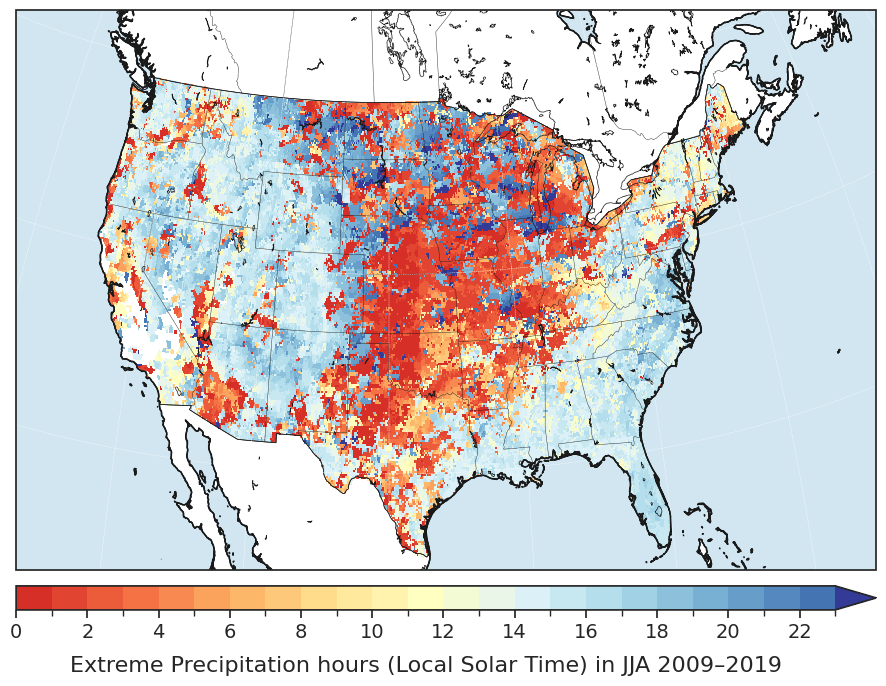

<Figure size 640x480 with 0 Axes>

In [267]:
# colorbar for column1

bounds = np.arange(0,24,1)
cols = plt.get_cmap('RdYlBu')(np.linspace(0.1,0.9,len(bounds)-1))#RdBu 
cmap = mpl.colors.ListedColormap(cols) 
cmap.set_over(plt.get_cmap('RdYlBu')(0.99)) 
cmap.set_under(plt.get_cmap('RdYlBu')(0)) 
norm = mpl.colors.BoundaryNorm(boundaries=bounds, ncolors=len(bounds)-1) 
sm = plt.cm.ScalarMappable(norm=norm,cmap=cmap) 
sm.set_array([]) 

extent_lonlat = (-126, -65, 23, 51) #extent_lonlat = (-126, -65, 23, 51)
ocean_color = np.float64([209,230,241])/255

latmin, latmax =  30, 45
lonmin, lonmax = -105, -85 

sns.set(font_scale=1.7, style="dark")

fig = plt.figure(figsize=(10,8),tight_layout = True) #8,10;,tight_layout = True
ncols = 1
nrows = 1
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, figure=fig)
gs.update(left = 0.1, right=0.96,top=0.9,bottom=0.2,wspace=0.1, hspace=0)
bottoms, tops, lefts, rights = gs.get_grid_positions(fig)

axes = []
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none')

newcoast = cfeature.NaturalEarthFeature('physical', 'coastline', '10m',
                                        edgecolor='k',facecolor='none')
newlake = cfeature.NaturalEarthFeature('physical', 'lakes', '10m',edgecolor='k', facecolor='none')
plt.rcParams["axes.edgecolor"] = "0.15"

for i in range(nrows):
    for j in range(ncols):        

        ax= fig.add_subplot(gs[i,j], projection= ccrs.Orthographic(central_longitude=-100, central_latitude=25, globe=None))
        ax.pcolormesh(data_array_test.longitude.values, data_array_test.latitude.values, np.where(mask, data_array_test.hour,  np.nan),transform=ccrs.PlateCarree(),cmap=cmap,norm=norm) #Regrid1Deg[0,:,:];mask_concat[0,:,:]

       
        ax.coastlines()
        ax.set_global()
        ax.set_extent(extent_lonlat, crs=ccrs.PlateCarree())
        ax.gridlines(xlocs=np.arange(-180,190,10),ylocs=np.arange(-180,190,10),linestyle="--",linewidth=0.3)
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(states_provinces, linewidth=0.3, linestyle='-', edgecolor='k')
        ax.add_feature(newcoast, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(newlake, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.LAND,color='w',zorder=0,edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN,color=ocean_color,zorder=0,edgecolor='k')
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN,color=ocean_color,zorder=1)
        ax.add_feature(newcoast, linewidth=1, linestyle='-', zorder=2,edgecolor='k')

        ax.set_aspect("auto") 
        axes.append(ax)


# Create axes for the colorbar on the same place. 
cbar_ax = fig.add_axes([lefts[0],0.15,rights[0]-lefts[0],0.03]) #[left, bottom, width, height]  
cb = fig.colorbar(sm,cax=cbar_ax,orientation="horizontal",pad=0.02,ticks=bounds[::2],use_gridspec=True,extend="max",fraction=0.1) #drawedges=True, 
cb.ax.set_xticklabels(bounds[::2], size=14)
cb.ax.set_xlabel(r"Extreme Precipitation hours (Local Solar Time) in JJA 2009–2019", size=16, labelpad=10) 

fig1 = plt.gcf()
# plt.tight_layout()
plt.show()
plt.draw()

# fig.savefig('HourlyP06utc.jpg', dpi=300, bbox_inches = "tight")

In [268]:
jja_files = []
for month in range(6,9):
    for year in range(2009,2024):
        filename = f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(month).zfill(2)}{year}.nc"
        jja_files.append(filename)

data = xr.open_mfdataset(jja_files)
data
    

freq_prcp_hours = []
for i in range(261):
    for j in range(591):
        print(i,j)
        freq_prcp_hours.append(max_prcp_hour(data.R99pa1hr[:,i,j], data.R99pa1hr[:,i,j].longitude))
        
latitude_values = data.latitude
longitude_values = data.longitude
data_array_test = xr.Dataset(
    coords={"latitude": latitude_values, "longitude": longitude_values},
)

data_array_test['hour'] = (('latitude', 'longitude'), np.array(freq_prcp_hours).reshape(261, 591))
data_array_test.to_netcdf('R99pw1hr/freq_prcp_hours_fifth_decade.nc')

0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
0 9
0 10
0 11
0 12
0 13
0 14
0 15
0 16
0 17
0 18
0 19
0 20
0 21
0 22
0 23
0 24
0 25
0 26
0 27
0 28
0 29
0 30
0 31
0 32
0 33
0 34
0 35
0 36
0 37
0 38
0 39
0 40
0 41
0 42
0 43
0 44
0 45
0 46
0 47
0 48
0 49
0 50
0 51
0 52
0 53
0 54
0 55
0 56
0 57
0 58
0 59
0 60
0 61
0 62
0 63
0 64
0 65
0 66
0 67
0 68
0 69
0 70
0 71
0 72
0 73
0 74
0 75
0 76
0 77
0 78
0 79
0 80
0 81
0 82
0 83
0 84
0 85
0 86
0 87
0 88
0 89
0 90
0 91
0 92
0 93
0 94
0 95
0 96
0 97
0 98
0 99
0 100
0 101
0 102
0 103
0 104
0 105
0 106
0 107
0 108
0 109
0 110
0 111
0 112
0 113
0 114
0 115
0 116
0 117
0 118
0 119
0 120
0 121
0 122
0 123
0 124
0 125
0 126
0 127
0 128
0 129
0 130
0 131
0 132
0 133
0 134
0 135
0 136
0 137
0 138
0 139
0 140
0 141
0 142
0 143
0 144
0 145
0 146
0 147
0 148
0 149
0 150
0 151
0 152
0 153
0 154
0 155
0 156
0 157
0 158
0 159
0 160
0 161
0 162
0 163
0 164
0 165
0 166
0 167
0 168
0 169
0 170
0 171
0 172
0 173
0 174
0 175
0 176
0 177
0 178
0 179
0 180
0 181
0 182
0 183
0 184


2 242
2 243
2 244
2 245
2 246
2 247
2 248
2 249
2 250
2 251
2 252
2 253
2 254
2 255
2 256
2 257
2 258
2 259
2 260
2 261
2 262
2 263
2 264
2 265
2 266
2 267
2 268
2 269
2 270
2 271
2 272
2 273
2 274
2 275
2 276
2 277
2 278
2 279
2 280
2 281
2 282
2 283
2 284
2 285
2 286
2 287
2 288
2 289
2 290
2 291
2 292
2 293
2 294
2 295
2 296
2 297
2 298
2 299
2 300
2 301
2 302
2 303
2 304
2 305
2 306
2 307
2 308
2 309
2 310
2 311
2 312
2 313
2 314
2 315
2 316
2 317
2 318
2 319
2 320
2 321
2 322
2 323
2 324
2 325
2 326
2 327
2 328
2 329
2 330
2 331
2 332
2 333
2 334
2 335
2 336
2 337
2 338
2 339
2 340
2 341
2 342
2 343
2 344
2 345
2 346
2 347
2 348
2 349
2 350
2 351
2 352
2 353
2 354
2 355
2 356
2 357
2 358
2 359
2 360
2 361
2 362
2 363
2 364
2 365
2 366
2 367
2 368
2 369
2 370
2 371
2 372
2 373
2 374
2 375
2 376
2 377
2 378
2 379
2 380
2 381
2 382
2 383
2 384
2 385
2 386
2 387
2 388
2 389
2 390
2 391
2 392
2 393
2 394
2 395
2 396
2 397
2 398
2 399
2 400
2 401
2 402
2 403
2 404
2 405
2 406
2 407
2 40

4 465
4 466
4 467
4 468
4 469
4 470
4 471
4 472
4 473
4 474
4 475
4 476
4 477
4 478
4 479
4 480
4 481
4 482
4 483
4 484
4 485
4 486
4 487
4 488
4 489
4 490
4 491
4 492
4 493
4 494
4 495
4 496
4 497
4 498
4 499
4 500
4 501
4 502
4 503
4 504
4 505
4 506
4 507
4 508
4 509
4 510
4 511
4 512
4 513
4 514
4 515
4 516
4 517
4 518
4 519
4 520
4 521
4 522
4 523
4 524
4 525
4 526
4 527
4 528
4 529
4 530
4 531
4 532
4 533
4 534
4 535
4 536
4 537
4 538
4 539
4 540
4 541
4 542
4 543
4 544
4 545
4 546
4 547
4 548
4 549
4 550
4 551
4 552
4 553
4 554
4 555
4 556
4 557
4 558
4 559
4 560
4 561
4 562
4 563
4 564
4 565
4 566
4 567
4 568
4 569
4 570
4 571
4 572
4 573
4 574
4 575
4 576
4 577
4 578
4 579
4 580
4 581
4 582
4 583
4 584
4 585
4 586
4 587
4 588
4 589
4 590
5 0
5 1
5 2
5 3
5 4
5 5
5 6
5 7
5 8
5 9
5 10
5 11
5 12
5 13
5 14
5 15
5 16
5 17
5 18
5 19
5 20
5 21
5 22
5 23
5 24
5 25
5 26
5 27
5 28
5 29
5 30
5 31
5 32
5 33
5 34
5 35
5 36
5 37
5 38
5 39
5 40
5 41
5 42
5 43
5 44
5 45
5 46
5 47
5 48
5 49
5 50

7 117
7 118
7 119
7 120
7 121
7 122
7 123
7 124
7 125
7 126
7 127
7 128
7 129
7 130
7 131
7 132
7 133
7 134
7 135
7 136
7 137
7 138
7 139
7 140
7 141
7 142
7 143
7 144
7 145
7 146
7 147
7 148
7 149
7 150
7 151
7 152
7 153
7 154
7 155
7 156
7 157
7 158
7 159
7 160
7 161
7 162
7 163
7 164
7 165
7 166
7 167
7 168
7 169
7 170
7 171
7 172
7 173
7 174
7 175
7 176
7 177
7 178
7 179
7 180
7 181
7 182
7 183
7 184
7 185
7 186
7 187
7 188
7 189
7 190
7 191
7 192
7 193
7 194
7 195
7 196
7 197
7 198
7 199
7 200
7 201
7 202
7 203
7 204
7 205
7 206
7 207
7 208
7 209
7 210
7 211
7 212
7 213
7 214
7 215
7 216
7 217
7 218
7 219
7 220
7 221
7 222
7 223
7 224
7 225
7 226
7 227
7 228
7 229
7 230
7 231
7 232
7 233
7 234
7 235
7 236
7 237
7 238
7 239
7 240
7 241
7 242
7 243
7 244
7 245
7 246
7 247
7 248
7 249
7 250
7 251
7 252
7 253
7 254
7 255
7 256
7 257
7 258
7 259
7 260
7 261
7 262
7 263
7 264
7 265
7 266
7 267
7 268
7 269
7 270
7 271
7 272
7 273
7 274
7 275
7 276
7 277
7 278
7 279
7 280
7 281
7 282
7 28

9 340
9 341
9 342
9 343
9 344
9 345
9 346
9 347
9 348
9 349
9 350
9 351
9 352
9 353
9 354
9 355
9 356
9 357
9 358
9 359
9 360
9 361
9 362
9 363
9 364
9 365
9 366
9 367
9 368
9 369
9 370
9 371
9 372
9 373
9 374
9 375
9 376
9 377
9 378
9 379
9 380
9 381
9 382
9 383
9 384
9 385
9 386
9 387
9 388
9 389
9 390
9 391
9 392
9 393
9 394
9 395
9 396
9 397
9 398
9 399
9 400
9 401
9 402
9 403
9 404
9 405
9 406
9 407
9 408
9 409
9 410
9 411
9 412
9 413
9 414
9 415
9 416
9 417
9 418
9 419
9 420
9 421
9 422
9 423
9 424
9 425
9 426
9 427
9 428
9 429
9 430
9 431
9 432
9 433
9 434
9 435
9 436
9 437
9 438
9 439
9 440
9 441
9 442
9 443
9 444
9 445
9 446
9 447
9 448
9 449
9 450
9 451
9 452
9 453
9 454
9 455
9 456
9 457
9 458
9 459
9 460
9 461
9 462
9 463
9 464
9 465
9 466
9 467
9 468
9 469
9 470
9 471
9 472
9 473
9 474
9 475
9 476
9 477
9 478
9 479
9 480
9 481
9 482
9 483
9 484
9 485
9 486
9 487
9 488
9 489
9 490
9 491
9 492
9 493
9 494
9 495
9 496
9 497
9 498
9 499
9 500
9 501
9 502
9 503
9 504
9 505
9 50

11 397
11 398
11 399
11 400
11 401
11 402
11 403
11 404
11 405
11 406
11 407
11 408
11 409
11 410
11 411
11 412
11 413
11 414
11 415
11 416
11 417
11 418
11 419
11 420
11 421
11 422
11 423
11 424
11 425
11 426
11 427
11 428
11 429
11 430
11 431
11 432
11 433
11 434
11 435
11 436
11 437
11 438
11 439
11 440
11 441
11 442
11 443
11 444
11 445
11 446
11 447
11 448
11 449
11 450
11 451
11 452
11 453
11 454
11 455
11 456
11 457
11 458
11 459
11 460
11 461
11 462
11 463
11 464
11 465
11 466
11 467
11 468
11 469
11 470
11 471
11 472
11 473
11 474
11 475
11 476
11 477
11 478
11 479
11 480
11 481
11 482
11 483
11 484
11 485
11 486
11 487
11 488
11 489
11 490
11 491
11 492
11 493
11 494
11 495
11 496
11 497
11 498
11 499
11 500
11 501
11 502
11 503
11 504
11 505
11 506
11 507
11 508
11 509
11 510
11 511
11 512
11 513
11 514
11 515
11 516
11 517
11 518
11 519
11 520
11 521
11 522
11 523
11 524
11 525
11 526
11 527
11 528
11 529
11 530
11 531
11 532
11 533
11 534
11 535
11 536
11 537
11 538
11 539

13 419
13 420
13 421
13 422
13 423
13 424
13 425
13 426
13 427
13 428
13 429
13 430
13 431
13 432
13 433
13 434
13 435
13 436
13 437
13 438
13 439
13 440
13 441
13 442
13 443
13 444
13 445
13 446
13 447
13 448
13 449
13 450
13 451
13 452
13 453
13 454
13 455
13 456
13 457
13 458
13 459
13 460
13 461
13 462
13 463
13 464
13 465
13 466
13 467
13 468
13 469
13 470
13 471
13 472
13 473
13 474
13 475
13 476
13 477
13 478
13 479
13 480
13 481
13 482
13 483
13 484
13 485
13 486
13 487
13 488
13 489
13 490
13 491
13 492
13 493
13 494
13 495
13 496
13 497
13 498
13 499
13 500
13 501
13 502
13 503
13 504
13 505
13 506
13 507
13 508
13 509
13 510
13 511
13 512
13 513
13 514
13 515
13 516
13 517
13 518
13 519
13 520
13 521
13 522
13 523
13 524
13 525
13 526
13 527
13 528
13 529
13 530
13 531
13 532
13 533
13 534
13 535
13 536
13 537
13 538
13 539
13 540
13 541
13 542
13 543
13 544
13 545
13 546
13 547
13 548
13 549
13 550
13 551
13 552
13 553
13 554
13 555
13 556
13 557
13 558
13 559
13 560
13 561

15 441
15 442
15 443
15 444
15 445
15 446
15 447
15 448
15 449
15 450
15 451
15 452
15 453
15 454
15 455
15 456
15 457
15 458
15 459
15 460
15 461
15 462
15 463
15 464
15 465
15 466
15 467
15 468
15 469
15 470
15 471
15 472
15 473
15 474
15 475
15 476
15 477
15 478
15 479
15 480
15 481
15 482
15 483
15 484
15 485
15 486
15 487
15 488
15 489
15 490
15 491
15 492
15 493
15 494
15 495
15 496
15 497
15 498
15 499
15 500
15 501
15 502
15 503
15 504
15 505
15 506
15 507
15 508
15 509
15 510
15 511
15 512
15 513
15 514
15 515
15 516
15 517
15 518
15 519
15 520
15 521
15 522
15 523
15 524
15 525
15 526
15 527
15 528
15 529
15 530
15 531
15 532
15 533
15 534
15 535
15 536
15 537
15 538
15 539
15 540
15 541
15 542
15 543
15 544
15 545
15 546
15 547
15 548
15 549
15 550
15 551
15 552
15 553
15 554
15 555
15 556
15 557
15 558
15 559
15 560
15 561
15 562
15 563
15 564
15 565
15 566
15 567
15 568
15 569
15 570
15 571
15 572
15 573
15 574
15 575
15 576
15 577
15 578
15 579
15 580
15 581
15 582
15 583

17 464
17 465
17 466
17 467
17 468
17 469
17 470
17 471
17 472
17 473
17 474
17 475
17 476
17 477
17 478
17 479
17 480
17 481
17 482
17 483
17 484
17 485
17 486
17 487
17 488
17 489
17 490
17 491
17 492
17 493
17 494
17 495
17 496
17 497
17 498
17 499
17 500
17 501
17 502
17 503
17 504
17 505
17 506
17 507
17 508
17 509
17 510
17 511
17 512
17 513
17 514
17 515
17 516
17 517
17 518
17 519
17 520
17 521
17 522
17 523
17 524
17 525
17 526
17 527
17 528
17 529
17 530
17 531
17 532
17 533
17 534
17 535
17 536
17 537
17 538
17 539
17 540
17 541
17 542
17 543
17 544
17 545
17 546
17 547
17 548
17 549
17 550
17 551
17 552
17 553
17 554
17 555
17 556
17 557
17 558
17 559
17 560
17 561
17 562
17 563
17 564
17 565
17 566
17 567
17 568
17 569
17 570
17 571
17 572
17 573
17 574
17 575
17 576
17 577
17 578
17 579
17 580
17 581
17 582
17 583
17 584
17 585
17 586
17 587
17 588
17 589
17 590
18 0
18 1
18 2
18 3
18 4
18 5
18 6
18 7
18 8
18 9
18 10
18 11
18 12
18 13
18 14
18 15
18 16
18 17
18 18
18 19
1

19 488
19 489
19 490
19 491
19 492
19 493
19 494
19 495
19 496
19 497
19 498
19 499
19 500
19 501
19 502
19 503
19 504
19 505
19 506
19 507
19 508
19 509
19 510
19 511
19 512
19 513
19 514
19 515
19 516
19 517
19 518
19 519
19 520
19 521
19 522
19 523
19 524
19 525
19 526
19 527
19 528
19 529
19 530
19 531
19 532
19 533
19 534
19 535
19 536
19 537
19 538
19 539
19 540
19 541
19 542
19 543
19 544
19 545
19 546
19 547
19 548
19 549
19 550
19 551
19 552
19 553
19 554
19 555
19 556
19 557
19 558
19 559
19 560
19 561
19 562
19 563
19 564
19 565
19 566
19 567
19 568
19 569
19 570
19 571
19 572
19 573
19 574
19 575
19 576
19 577
19 578
19 579
19 580
19 581
19 582
19 583
19 584
19 585
19 586
19 587
19 588
19 589
19 590
20 0
20 1
20 2
20 3
20 4
20 5
20 6
20 7
20 8
20 9
20 10
20 11
20 12
20 13
20 14
20 15
20 16
20 17
20 18
20 19
20 20
20 21
20 22
20 23
20 24
20 25
20 26
20 27
20 28
20 29
20 30
20 31
20 32
20 33
20 34
20 35
20 36
20 37
20 38
20 39
20 40
20 41
20 42
20 43
20 44
20 45
20 46
20 47
2

21 510
21 511
21 512
21 513
21 514
21 515
21 516
21 517
21 518
21 519
21 520
21 521
21 522
21 523
21 524
21 525
21 526
21 527
21 528
21 529
21 530
21 531
21 532
21 533
21 534
21 535
21 536
21 537
21 538
21 539
21 540
21 541
21 542
21 543
21 544
21 545
21 546
21 547
21 548
21 549
21 550
21 551
21 552
21 553
21 554
21 555
21 556
21 557
21 558
21 559
21 560
21 561
21 562
21 563
21 564
21 565
21 566
21 567
21 568
21 569
21 570
21 571
21 572
21 573
21 574
21 575
21 576
21 577
21 578
21 579
21 580
21 581
21 582
21 583
21 584
21 585
21 586
21 587
21 588
21 589
21 590
22 0
22 1
22 2
22 3
22 4
22 5
22 6
22 7
22 8
22 9
22 10
22 11
22 12
22 13
22 14
22 15
22 16
22 17
22 18
22 19
22 20
22 21
22 22
22 23
22 24
22 25
22 26
22 27
22 28
22 29
22 30
22 31
22 32
22 33
22 34
22 35
22 36
22 37
22 38
22 39
22 40
22 41
22 42
22 43
22 44
22 45
22 46
22 47
22 48
22 49
22 50
22 51
22 52
22 53
22 54
22 55
22 56
22 57
22 58
22 59
22 60
22 61
22 62
22 63
22 64
22 65
22 66
22 67
22 68
22 69
22 70
22 71
22 72
22 73

23 534
23 535
23 536
23 537
23 538
23 539
23 540
23 541
23 542
23 543
23 544
23 545
23 546
23 547
23 548
23 549
23 550
23 551
23 552
23 553
23 554
23 555
23 556
23 557
23 558
23 559
23 560
23 561
23 562
23 563
23 564
23 565
23 566
23 567
23 568
23 569
23 570
23 571
23 572
23 573
23 574
23 575
23 576
23 577
23 578
23 579
23 580
23 581
23 582
23 583
23 584
23 585
23 586
23 587
23 588
23 589
23 590
24 0
24 1
24 2
24 3
24 4
24 5
24 6
24 7
24 8
24 9
24 10
24 11
24 12
24 13
24 14
24 15
24 16
24 17
24 18
24 19
24 20
24 21
24 22
24 23
24 24
24 25
24 26
24 27
24 28
24 29
24 30
24 31
24 32
24 33
24 34
24 35
24 36
24 37
24 38
24 39
24 40
24 41
24 42
24 43
24 44
24 45
24 46
24 47
24 48
24 49
24 50
24 51
24 52
24 53
24 54
24 55
24 56
24 57
24 58
24 59
24 60
24 61
24 62
24 63
24 64
24 65
24 66
24 67
24 68
24 69
24 70
24 71
24 72
24 73
24 74
24 75
24 76
24 77
24 78
24 79
24 80
24 81
24 82
24 83
24 84
24 85
24 86
24 87
24 88
24 89
24 90
24 91
24 92
24 93
24 94
24 95
24 96
24 97
24 98
24 99
24 100
24 1

25 554
25 555
25 556
25 557
25 558
25 559
25 560
25 561
25 562
25 563
25 564
25 565
25 566
25 567
25 568
25 569
25 570
25 571
25 572
25 573
25 574
25 575
25 576
25 577
25 578
25 579
25 580
25 581
25 582
25 583
25 584
25 585
25 586
25 587
25 588
25 589
25 590
26 0
26 1
26 2
26 3
26 4
26 5
26 6
26 7
26 8
26 9
26 10
26 11
26 12
26 13
26 14
26 15
26 16
26 17
26 18
26 19
26 20
26 21
26 22
26 23
26 24
26 25
26 26
26 27
26 28
26 29
26 30
26 31
26 32
26 33
26 34
26 35
26 36
26 37
26 38
26 39
26 40
26 41
26 42
26 43
26 44
26 45
26 46
26 47
26 48
26 49
26 50
26 51
26 52
26 53
26 54
26 55
26 56
26 57
26 58
26 59
26 60
26 61
26 62
26 63
26 64
26 65
26 66
26 67
26 68
26 69
26 70
26 71
26 72
26 73
26 74
26 75
26 76
26 77
26 78
26 79
26 80
26 81
26 82
26 83
26 84
26 85
26 86
26 87
26 88
26 89
26 90
26 91
26 92
26 93
26 94
26 95
26 96
26 97
26 98
26 99
26 100
26 101
26 102
26 103
26 104
26 105
26 106
26 107
26 108
26 109
26 110
26 111
26 112
26 113
26 114
26 115
26 116
26 117
26 118
26 119
26 120
26 1

27 574
27 575
27 576
27 577
27 578
27 579
27 580
27 581
27 582
27 583
27 584
27 585
27 586
27 587
27 588
27 589
27 590
28 0
28 1
28 2
28 3
28 4
28 5
28 6
28 7
28 8
28 9
28 10
28 11
28 12
28 13
28 14
28 15
28 16
28 17
28 18
28 19
28 20
28 21
28 22
28 23
28 24
28 25
28 26
28 27
28 28
28 29
28 30
28 31
28 32
28 33
28 34
28 35
28 36
28 37
28 38
28 39
28 40
28 41
28 42
28 43
28 44
28 45
28 46
28 47
28 48
28 49
28 50
28 51
28 52
28 53
28 54
28 55
28 56
28 57
28 58
28 59
28 60
28 61
28 62
28 63
28 64
28 65
28 66
28 67
28 68
28 69
28 70
28 71
28 72
28 73
28 74
28 75
28 76
28 77
28 78
28 79
28 80
28 81
28 82
28 83
28 84
28 85
28 86
28 87
28 88
28 89
28 90
28 91
28 92
28 93
28 94
28 95
28 96
28 97
28 98
28 99
28 100
28 101
28 102
28 103
28 104
28 105
28 106
28 107
28 108
28 109
28 110
28 111
28 112
28 113
28 114
28 115
28 116
28 117
28 118
28 119
28 120
28 121
28 122
28 123
28 124
28 125
28 126
28 127
28 128
28 129
28 130
28 131
28 132
28 133
28 134
28 135
28 136
28 137
28 138
28 139
28 140
28 1

30 6
30 7
30 8
30 9
30 10
30 11
30 12
30 13
30 14
30 15
30 16
30 17
30 18
30 19
30 20
30 21
30 22
30 23
30 24
30 25
30 26
30 27
30 28
30 29
30 30
30 31
30 32
30 33
30 34
30 35
30 36
30 37
30 38
30 39
30 40
30 41
30 42
30 43
30 44
30 45
30 46
30 47
30 48
30 49
30 50
30 51
30 52
30 53
30 54
30 55
30 56
30 57
30 58
30 59
30 60
30 61
30 62
30 63
30 64
30 65
30 66
30 67
30 68
30 69
30 70
30 71
30 72
30 73
30 74
30 75
30 76
30 77
30 78
30 79
30 80
30 81
30 82
30 83
30 84
30 85
30 86
30 87
30 88
30 89
30 90
30 91
30 92
30 93
30 94
30 95
30 96
30 97
30 98
30 99
30 100
30 101
30 102
30 103
30 104
30 105
30 106
30 107
30 108
30 109
30 110
30 111
30 112
30 113
30 114
30 115
30 116
30 117
30 118
30 119
30 120
30 121
30 122
30 123
30 124
30 125
30 126
30 127
30 128
30 129
30 130
30 131
30 132
30 133
30 134
30 135
30 136
30 137
30 138
30 139
30 140
30 141
30 142
30 143
30 144
30 145
30 146
30 147
30 148
30 149
30 150
30 151
30 152
30 153
30 154
30 155
30 156
30 157
30 158
30 159
30 160
30 161
30 162

32 31
32 32
32 33
32 34
32 35
32 36
32 37
32 38
32 39
32 40
32 41
32 42
32 43
32 44
32 45
32 46
32 47
32 48
32 49
32 50
32 51
32 52
32 53
32 54
32 55
32 56
32 57
32 58
32 59
32 60
32 61
32 62
32 63
32 64
32 65
32 66
32 67
32 68
32 69
32 70
32 71
32 72
32 73
32 74
32 75
32 76
32 77
32 78
32 79
32 80
32 81
32 82
32 83
32 84
32 85
32 86
32 87
32 88
32 89
32 90
32 91
32 92
32 93
32 94
32 95
32 96
32 97
32 98
32 99
32 100
32 101
32 102
32 103
32 104
32 105
32 106
32 107
32 108
32 109
32 110
32 111
32 112
32 113
32 114
32 115
32 116
32 117
32 118
32 119
32 120
32 121
32 122
32 123
32 124
32 125
32 126
32 127
32 128
32 129
32 130
32 131
32 132
32 133
32 134
32 135
32 136
32 137
32 138
32 139
32 140
32 141
32 142
32 143
32 144
32 145
32 146
32 147
32 148
32 149
32 150
32 151
32 152
32 153
32 154
32 155
32 156
32 157
32 158
32 159
32 160
32 161
32 162
32 163
32 164
32 165
32 166
32 167
32 168
32 169
32 170
32 171
32 172
32 173
32 174
32 175
32 176
32 177
32 178
32 179
32 180
32 181
32 182
32 18

34 55
34 56
34 57
34 58
34 59
34 60
34 61
34 62
34 63
34 64
34 65
34 66
34 67
34 68
34 69
34 70
34 71
34 72
34 73
34 74
34 75
34 76
34 77
34 78
34 79
34 80
34 81
34 82
34 83
34 84
34 85
34 86
34 87
34 88
34 89
34 90
34 91
34 92
34 93
34 94
34 95
34 96
34 97
34 98
34 99
34 100
34 101
34 102
34 103
34 104
34 105
34 106
34 107
34 108
34 109
34 110
34 111
34 112
34 113
34 114
34 115
34 116
34 117
34 118
34 119
34 120
34 121
34 122
34 123
34 124
34 125
34 126
34 127
34 128
34 129
34 130
34 131
34 132
34 133
34 134
34 135
34 136
34 137
34 138
34 139
34 140
34 141
34 142
34 143
34 144
34 145
34 146
34 147
34 148
34 149
34 150
34 151
34 152
34 153
34 154
34 155
34 156
34 157
34 158
34 159
34 160
34 161
34 162
34 163
34 164
34 165
34 166
34 167
34 168
34 169
34 170
34 171
34 172
34 173
34 174
34 175
34 176
34 177
34 178
34 179
34 180
34 181
34 182
34 183
34 184
34 185
34 186
34 187
34 188
34 189
34 190
34 191
34 192
34 193
34 194
34 195
34 196
34 197
34 198
34 199
34 200
34 201
34 202
34 203
34

36 80
36 81
36 82
36 83
36 84
36 85
36 86
36 87
36 88
36 89
36 90
36 91
36 92
36 93
36 94
36 95
36 96
36 97
36 98
36 99
36 100
36 101
36 102
36 103
36 104
36 105
36 106
36 107
36 108
36 109
36 110
36 111
36 112
36 113
36 114
36 115
36 116
36 117
36 118
36 119
36 120
36 121
36 122
36 123
36 124
36 125
36 126
36 127
36 128
36 129
36 130
36 131
36 132
36 133
36 134
36 135
36 136
36 137
36 138
36 139
36 140
36 141
36 142
36 143
36 144
36 145
36 146
36 147
36 148
36 149
36 150
36 151
36 152
36 153
36 154
36 155
36 156
36 157
36 158
36 159
36 160
36 161
36 162
36 163
36 164
36 165
36 166
36 167
36 168
36 169
36 170
36 171
36 172
36 173
36 174
36 175
36 176
36 177
36 178
36 179
36 180
36 181
36 182
36 183
36 184
36 185
36 186
36 187
36 188
36 189
36 190
36 191
36 192
36 193
36 194
36 195
36 196
36 197
36 198
36 199
36 200
36 201
36 202
36 203
36 204
36 205
36 206
36 207
36 208
36 209
36 210
36 211
36 212
36 213
36 214
36 215
36 216
36 217
36 218
36 219
36 220
36 221
36 222
36 223
36 224
36 22

38 103
38 104
38 105
38 106
38 107
38 108
38 109
38 110
38 111
38 112
38 113
38 114
38 115
38 116
38 117
38 118
38 119
38 120
38 121
38 122
38 123
38 124
38 125
38 126
38 127
38 128
38 129
38 130
38 131
38 132
38 133
38 134
38 135
38 136
38 137
38 138
38 139
38 140
38 141
38 142
38 143
38 144
38 145
38 146
38 147
38 148
38 149
38 150
38 151
38 152
38 153
38 154
38 155
38 156
38 157
38 158
38 159
38 160
38 161
38 162
38 163
38 164
38 165
38 166
38 167
38 168
38 169
38 170
38 171
38 172
38 173
38 174
38 175
38 176
38 177
38 178
38 179
38 180
38 181
38 182
38 183
38 184
38 185
38 186
38 187
38 188
38 189
38 190
38 191
38 192
38 193
38 194
38 195
38 196
38 197
38 198
38 199
38 200
38 201
38 202
38 203
38 204
38 205
38 206
38 207
38 208
38 209
38 210
38 211
38 212
38 213
38 214
38 215
38 216
38 217
38 218
38 219
38 220
38 221
38 222
38 223
38 224
38 225
38 226
38 227
38 228
38 229
38 230
38 231
38 232
38 233
38 234
38 235
38 236
38 237
38 238
38 239
38 240
38 241
38 242
38 243
38 244
38 245

40 123
40 124
40 125
40 126
40 127
40 128
40 129
40 130
40 131
40 132
40 133
40 134
40 135
40 136
40 137
40 138
40 139
40 140
40 141
40 142
40 143
40 144
40 145
40 146
40 147
40 148
40 149
40 150
40 151
40 152
40 153
40 154
40 155
40 156
40 157
40 158
40 159
40 160
40 161
40 162
40 163
40 164
40 165
40 166
40 167
40 168
40 169
40 170
40 171
40 172
40 173
40 174
40 175
40 176
40 177
40 178
40 179
40 180
40 181
40 182
40 183
40 184
40 185
40 186
40 187
40 188
40 189
40 190
40 191
40 192
40 193
40 194
40 195
40 196
40 197
40 198
40 199
40 200
40 201
40 202
40 203
40 204
40 205
40 206
40 207
40 208
40 209
40 210
40 211
40 212
40 213
40 214
40 215
40 216
40 217
40 218
40 219
40 220
40 221
40 222
40 223
40 224
40 225
40 226
40 227
40 228
40 229
40 230
40 231
40 232
40 233
40 234
40 235
40 236
40 237
40 238
40 239
40 240
40 241
40 242
40 243
40 244
40 245
40 246
40 247
40 248
40 249
40 250
40 251
40 252
40 253
40 254
40 255
40 256
40 257
40 258
40 259
40 260
40 261
40 262
40 263
40 264
40 265

42 144
42 145
42 146
42 147
42 148
42 149
42 150
42 151
42 152
42 153
42 154
42 155
42 156
42 157
42 158
42 159
42 160
42 161
42 162
42 163
42 164
42 165
42 166
42 167
42 168
42 169
42 170
42 171
42 172
42 173
42 174
42 175
42 176
42 177
42 178
42 179
42 180
42 181
42 182
42 183
42 184
42 185
42 186
42 187
42 188
42 189
42 190
42 191
42 192
42 193
42 194
42 195
42 196
42 197
42 198
42 199
42 200
42 201
42 202
42 203
42 204
42 205
42 206
42 207
42 208
42 209
42 210
42 211
42 212
42 213
42 214
42 215
42 216
42 217
42 218
42 219
42 220
42 221
42 222
42 223
42 224
42 225
42 226
42 227
42 228
42 229
42 230
42 231
42 232
42 233
42 234
42 235
42 236
42 237
42 238
42 239
42 240
42 241
42 242
42 243
42 244
42 245
42 246
42 247
42 248
42 249
42 250
42 251
42 252
42 253
42 254
42 255
42 256
42 257
42 258
42 259
42 260
42 261
42 262
42 263
42 264
42 265
42 266
42 267
42 268
42 269
42 270
42 271
42 272
42 273
42 274
42 275
42 276
42 277
42 278
42 279
42 280
42 281
42 282
42 283
42 284
42 285
42 286

44 164
44 165
44 166
44 167
44 168
44 169
44 170
44 171
44 172
44 173
44 174
44 175
44 176
44 177
44 178
44 179
44 180
44 181
44 182
44 183
44 184
44 185
44 186
44 187
44 188
44 189
44 190
44 191
44 192
44 193
44 194
44 195
44 196
44 197
44 198
44 199
44 200
44 201
44 202
44 203
44 204
44 205
44 206
44 207
44 208
44 209
44 210
44 211
44 212
44 213
44 214
44 215
44 216
44 217
44 218
44 219
44 220
44 221
44 222
44 223
44 224
44 225
44 226
44 227
44 228
44 229
44 230
44 231
44 232
44 233
44 234
44 235
44 236
44 237
44 238
44 239
44 240
44 241
44 242
44 243
44 244
44 245
44 246
44 247
44 248
44 249
44 250
44 251
44 252
44 253
44 254
44 255
44 256
44 257
44 258
44 259
44 260
44 261
44 262
44 263
44 264
44 265
44 266
44 267
44 268
44 269
44 270
44 271
44 272
44 273
44 274
44 275
44 276
44 277
44 278
44 279
44 280
44 281
44 282
44 283
44 284
44 285
44 286
44 287
44 288
44 289
44 290
44 291
44 292
44 293
44 294
44 295
44 296
44 297
44 298
44 299
44 300
44 301
44 302
44 303
44 304
44 305
44 306

46 185
46 186
46 187
46 188
46 189
46 190
46 191
46 192
46 193
46 194
46 195
46 196
46 197
46 198
46 199
46 200
46 201
46 202
46 203
46 204
46 205
46 206
46 207
46 208
46 209
46 210
46 211
46 212
46 213
46 214
46 215
46 216
46 217
46 218
46 219
46 220
46 221
46 222
46 223
46 224
46 225
46 226
46 227
46 228
46 229
46 230
46 231
46 232
46 233
46 234
46 235
46 236
46 237
46 238
46 239
46 240
46 241
46 242
46 243
46 244
46 245
46 246
46 247
46 248
46 249
46 250
46 251
46 252
46 253
46 254
46 255
46 256
46 257
46 258
46 259
46 260
46 261
46 262
46 263
46 264
46 265
46 266
46 267
46 268
46 269
46 270
46 271
46 272
46 273
46 274
46 275
46 276
46 277
46 278
46 279
46 280
46 281
46 282
46 283
46 284
46 285
46 286
46 287
46 288
46 289
46 290
46 291
46 292
46 293
46 294
46 295
46 296
46 297
46 298
46 299
46 300
46 301
46 302
46 303
46 304
46 305
46 306
46 307
46 308
46 309
46 310
46 311
46 312
46 313
46 314
46 315
46 316
46 317
46 318
46 319
46 320
46 321
46 322
46 323
46 324
46 325
46 326
46 327

48 205
48 206
48 207
48 208
48 209
48 210
48 211
48 212
48 213
48 214
48 215
48 216
48 217
48 218
48 219
48 220
48 221
48 222
48 223
48 224
48 225
48 226
48 227
48 228
48 229
48 230
48 231
48 232
48 233
48 234
48 235
48 236
48 237
48 238
48 239
48 240
48 241
48 242
48 243
48 244
48 245
48 246
48 247
48 248
48 249
48 250
48 251
48 252
48 253
48 254
48 255
48 256
48 257
48 258
48 259
48 260
48 261
48 262
48 263
48 264
48 265
48 266
48 267
48 268
48 269
48 270
48 271
48 272
48 273
48 274
48 275
48 276
48 277
48 278
48 279
48 280
48 281
48 282
48 283
48 284
48 285
48 286
48 287
48 288
48 289
48 290
48 291
48 292
48 293
48 294
48 295
48 296
48 297
48 298
48 299
48 300
48 301
48 302
48 303
48 304
48 305
48 306
48 307
48 308
48 309
48 310
48 311
48 312
48 313
48 314
48 315
48 316
48 317
48 318
48 319
48 320
48 321
48 322
48 323
48 324
48 325
48 326
48 327
48 328
48 329
48 330
48 331
48 332
48 333
48 334
48 335
48 336
48 337
48 338
48 339
48 340
48 341
48 342
48 343
48 344
48 345
48 346
48 347

50 225
50 226
50 227
50 228
50 229
50 230
50 231
50 232
50 233
50 234
50 235
50 236
50 237
50 238
50 239
50 240
50 241
50 242
50 243
50 244
50 245
50 246
50 247
50 248
50 249
50 250
50 251
50 252
50 253
50 254
50 255
50 256
50 257
50 258
50 259
50 260
50 261
50 262
50 263
50 264
50 265
50 266
50 267
50 268
50 269
50 270
50 271
50 272
50 273
50 274
50 275
50 276
50 277
50 278
50 279
50 280
50 281
50 282
50 283
50 284
50 285
50 286
50 287
50 288
50 289
50 290
50 291
50 292
50 293
50 294
50 295
50 296
50 297
50 298
50 299
50 300
50 301
50 302
50 303
50 304
50 305
50 306
50 307
50 308
50 309
50 310
50 311
50 312
50 313
50 314
50 315
50 316
50 317
50 318
50 319
50 320
50 321
50 322
50 323
50 324
50 325
50 326
50 327
50 328
50 329
50 330
50 331
50 332
50 333
50 334
50 335
50 336
50 337
50 338
50 339
50 340
50 341
50 342
50 343
50 344
50 345
50 346
50 347
50 348
50 349
50 350
50 351
50 352
50 353
50 354
50 355
50 356
50 357
50 358
50 359
50 360
50 361
50 362
50 363
50 364
50 365
50 366
50 367

52 247
52 248
52 249
52 250
52 251
52 252
52 253
52 254
52 255
52 256
52 257
52 258
52 259
52 260
52 261
52 262
52 263
52 264
52 265
52 266
52 267
52 268
52 269
52 270
52 271
52 272
52 273
52 274
52 275
52 276
52 277
52 278
52 279
52 280
52 281
52 282
52 283
52 284
52 285
52 286
52 287
52 288
52 289
52 290
52 291
52 292
52 293
52 294
52 295
52 296
52 297
52 298
52 299
52 300
52 301
52 302
52 303
52 304
52 305
52 306
52 307
52 308
52 309
52 310
52 311
52 312
52 313
52 314
52 315
52 316
52 317
52 318
52 319
52 320
52 321
52 322
52 323
52 324
52 325
52 326
52 327
52 328
52 329
52 330
52 331
52 332
52 333
52 334
52 335
52 336
52 337
52 338
52 339
52 340
52 341
52 342
52 343
52 344
52 345
52 346
52 347
52 348
52 349
52 350
52 351
52 352
52 353
52 354
52 355
52 356
52 357
52 358
52 359
52 360
52 361
52 362
52 363
52 364
52 365
52 366
52 367
52 368
52 369
52 370
52 371
52 372
52 373
52 374
52 375
52 376
52 377
52 378
52 379
52 380
52 381
52 382
52 383
52 384
52 385
52 386
52 387
52 388
52 389

54 267
54 268
54 269
54 270
54 271
54 272
54 273
54 274
54 275
54 276
54 277
54 278
54 279
54 280
54 281
54 282
54 283
54 284
54 285
54 286
54 287
54 288
54 289
54 290
54 291
54 292
54 293
54 294
54 295
54 296
54 297
54 298
54 299
54 300
54 301
54 302
54 303
54 304
54 305
54 306
54 307
54 308
54 309
54 310
54 311
54 312
54 313
54 314
54 315
54 316
54 317
54 318
54 319
54 320
54 321
54 322
54 323
54 324
54 325
54 326
54 327
54 328
54 329
54 330
54 331
54 332
54 333
54 334
54 335
54 336
54 337
54 338
54 339
54 340
54 341
54 342
54 343
54 344
54 345
54 346
54 347
54 348
54 349
54 350
54 351
54 352
54 353
54 354
54 355
54 356
54 357
54 358
54 359
54 360
54 361
54 362
54 363
54 364
54 365
54 366
54 367
54 368
54 369
54 370
54 371
54 372
54 373
54 374
54 375
54 376
54 377
54 378
54 379
54 380
54 381
54 382
54 383
54 384
54 385
54 386
54 387
54 388
54 389
54 390
54 391
54 392
54 393
54 394
54 395
54 396
54 397
54 398
54 399
54 400
54 401
54 402
54 403
54 404
54 405
54 406
54 407
54 408
54 409

56 288
56 289
56 290
56 291
56 292
56 293
56 294
56 295
56 296
56 297
56 298
56 299
56 300
56 301
56 302
56 303
56 304
56 305
56 306
56 307
56 308
56 309
56 310
56 311
56 312
56 313
56 314
56 315
56 316
56 317
56 318
56 319
56 320
56 321
56 322
56 323
56 324
56 325
56 326
56 327
56 328
56 329
56 330
56 331
56 332
56 333
56 334
56 335
56 336
56 337
56 338
56 339
56 340
56 341
56 342
56 343
56 344
56 345
56 346
56 347
56 348
56 349
56 350
56 351
56 352
56 353
56 354
56 355
56 356
56 357
56 358
56 359
56 360
56 361
56 362
56 363
56 364
56 365
56 366
56 367
56 368
56 369
56 370
56 371
56 372
56 373
56 374
56 375
56 376
56 377
56 378
56 379
56 380
56 381
56 382
56 383
56 384
56 385
56 386
56 387
56 388
56 389
56 390
56 391
56 392
56 393
56 394
56 395
56 396
56 397
56 398
56 399
56 400
56 401
56 402
56 403
56 404
56 405
56 406
56 407
56 408
56 409
56 410
56 411
56 412
56 413
56 414
56 415
56 416
56 417
56 418
56 419
56 420
56 421
56 422
56 423
56 424
56 425
56 426
56 427
56 428
56 429
56 430

58 308
58 309
58 310
58 311
58 312
58 313
58 314
58 315
58 316
58 317
58 318
58 319
58 320
58 321
58 322
58 323
58 324
58 325
58 326
58 327
58 328
58 329
58 330
58 331
58 332
58 333
58 334
58 335
58 336
58 337
58 338
58 339
58 340
58 341
58 342
58 343
58 344
58 345
58 346
58 347
58 348
58 349
58 350
58 351
58 352
58 353
58 354
58 355
58 356
58 357
58 358
58 359
58 360
58 361
58 362
58 363
58 364
58 365
58 366
58 367
58 368
58 369
58 370
58 371
58 372
58 373
58 374
58 375
58 376
58 377
58 378
58 379
58 380
58 381
58 382
58 383
58 384
58 385
58 386
58 387
58 388
58 389
58 390
58 391
58 392
58 393
58 394
58 395
58 396
58 397
58 398
58 399
58 400
58 401
58 402
58 403
58 404
58 405
58 406
58 407
58 408
58 409
58 410
58 411
58 412
58 413
58 414
58 415
58 416
58 417
58 418
58 419
58 420
58 421
58 422
58 423
58 424
58 425
58 426
58 427
58 428
58 429
58 430
58 431
58 432
58 433
58 434
58 435
58 436
58 437
58 438
58 439
58 440
58 441
58 442
58 443
58 444
58 445
58 446
58 447
58 448
58 449
58 450

60 331
60 332
60 333
60 334
60 335
60 336
60 337
60 338
60 339
60 340
60 341
60 342
60 343
60 344
60 345
60 346
60 347
60 348
60 349
60 350
60 351
60 352
60 353
60 354
60 355
60 356
60 357
60 358
60 359
60 360
60 361
60 362
60 363
60 364
60 365
60 366
60 367
60 368
60 369
60 370
60 371
60 372
60 373
60 374
60 375
60 376
60 377
60 378
60 379
60 380
60 381
60 382
60 383
60 384
60 385
60 386
60 387
60 388
60 389
60 390
60 391
60 392
60 393
60 394
60 395
60 396
60 397
60 398
60 399
60 400
60 401
60 402
60 403
60 404
60 405
60 406
60 407
60 408
60 409
60 410
60 411
60 412
60 413
60 414
60 415
60 416
60 417
60 418
60 419
60 420
60 421
60 422
60 423
60 424
60 425
60 426
60 427
60 428
60 429
60 430
60 431
60 432
60 433
60 434
60 435
60 436
60 437
60 438
60 439
60 440
60 441
60 442
60 443
60 444
60 445
60 446
60 447
60 448
60 449
60 450
60 451
60 452
60 453
60 454
60 455
60 456
60 457
60 458
60 459
60 460
60 461
60 462
60 463
60 464
60 465
60 466
60 467
60 468
60 469
60 470
60 471
60 472
60 473

62 351
62 352
62 353
62 354
62 355
62 356
62 357
62 358
62 359
62 360
62 361
62 362
62 363
62 364
62 365
62 366
62 367
62 368
62 369
62 370
62 371
62 372
62 373
62 374
62 375
62 376
62 377
62 378
62 379
62 380
62 381
62 382
62 383
62 384
62 385
62 386
62 387
62 388
62 389
62 390
62 391
62 392
62 393
62 394
62 395
62 396
62 397
62 398
62 399
62 400
62 401
62 402
62 403
62 404
62 405
62 406
62 407
62 408
62 409
62 410
62 411
62 412
62 413
62 414
62 415
62 416
62 417
62 418
62 419
62 420
62 421
62 422
62 423
62 424
62 425
62 426
62 427
62 428
62 429
62 430
62 431
62 432
62 433
62 434
62 435
62 436
62 437
62 438
62 439
62 440
62 441
62 442
62 443
62 444
62 445
62 446
62 447
62 448
62 449
62 450
62 451
62 452
62 453
62 454
62 455
62 456
62 457
62 458
62 459
62 460
62 461
62 462
62 463
62 464
62 465
62 466
62 467
62 468
62 469
62 470
62 471
62 472
62 473
62 474
62 475
62 476
62 477
62 478
62 479
62 480
62 481
62 482
62 483
62 484
62 485
62 486
62 487
62 488
62 489
62 490
62 491
62 492
62 493

64 372
64 373
64 374
64 375
64 376
64 377
64 378
64 379
64 380
64 381
64 382
64 383
64 384
64 385
64 386
64 387
64 388
64 389
64 390
64 391
64 392
64 393
64 394
64 395
64 396
64 397
64 398
64 399
64 400
64 401
64 402
64 403
64 404
64 405
64 406
64 407
64 408
64 409
64 410
64 411
64 412
64 413
64 414
64 415
64 416
64 417
64 418
64 419
64 420
64 421
64 422
64 423
64 424
64 425
64 426
64 427
64 428
64 429
64 430
64 431
64 432
64 433
64 434
64 435
64 436
64 437
64 438
64 439
64 440
64 441
64 442
64 443
64 444
64 445
64 446
64 447
64 448
64 449
64 450
64 451
64 452
64 453
64 454
64 455
64 456
64 457
64 458
64 459
64 460
64 461
64 462
64 463
64 464
64 465
64 466
64 467
64 468
64 469
64 470
64 471
64 472
64 473
64 474
64 475
64 476
64 477
64 478
64 479
64 480
64 481
64 482
64 483
64 484
64 485
64 486
64 487
64 488
64 489
64 490
64 491
64 492
64 493
64 494
64 495
64 496
64 497
64 498
64 499
64 500
64 501
64 502
64 503
64 504
64 505
64 506
64 507
64 508
64 509
64 510
64 511
64 512
64 513
64 514

66 392
66 393
66 394
66 395
66 396
66 397
66 398
66 399
66 400
66 401
66 402
66 403
66 404
66 405
66 406
66 407
66 408
66 409
66 410
66 411
66 412
66 413
66 414
66 415
66 416
66 417
66 418
66 419
66 420
66 421
66 422
66 423
66 424
66 425
66 426
66 427
66 428
66 429
66 430
66 431
66 432
66 433
66 434
66 435
66 436
66 437
66 438
66 439
66 440
66 441
66 442
66 443
66 444
66 445
66 446
66 447
66 448
66 449
66 450
66 451
66 452
66 453
66 454
66 455
66 456
66 457
66 458
66 459
66 460
66 461
66 462
66 463
66 464
66 465
66 466
66 467
66 468
66 469
66 470
66 471
66 472
66 473
66 474
66 475
66 476
66 477
66 478
66 479
66 480
66 481
66 482
66 483
66 484
66 485
66 486
66 487
66 488
66 489
66 490
66 491
66 492
66 493
66 494
66 495
66 496
66 497
66 498
66 499
66 500
66 501
66 502
66 503
66 504
66 505
66 506
66 507
66 508
66 509
66 510
66 511
66 512
66 513
66 514
66 515
66 516
66 517
66 518
66 519
66 520
66 521
66 522
66 523
66 524
66 525
66 526
66 527
66 528
66 529
66 530
66 531
66 532
66 533
66 534

68 415
68 416
68 417
68 418
68 419
68 420
68 421
68 422
68 423
68 424
68 425
68 426
68 427
68 428
68 429
68 430
68 431
68 432
68 433
68 434
68 435
68 436
68 437
68 438
68 439
68 440
68 441
68 442
68 443
68 444
68 445
68 446
68 447
68 448
68 449
68 450
68 451
68 452
68 453
68 454
68 455
68 456
68 457
68 458
68 459
68 460
68 461
68 462
68 463
68 464
68 465
68 466
68 467
68 468
68 469
68 470
68 471
68 472
68 473
68 474
68 475
68 476
68 477
68 478
68 479
68 480
68 481
68 482
68 483
68 484
68 485
68 486
68 487
68 488
68 489
68 490
68 491
68 492
68 493
68 494
68 495
68 496
68 497
68 498
68 499
68 500
68 501
68 502
68 503
68 504
68 505
68 506
68 507
68 508
68 509
68 510
68 511
68 512
68 513
68 514
68 515
68 516
68 517
68 518
68 519
68 520
68 521
68 522
68 523
68 524
68 525
68 526
68 527
68 528
68 529
68 530
68 531
68 532
68 533
68 534
68 535
68 536
68 537
68 538
68 539
68 540
68 541
68 542
68 543
68 544
68 545
68 546
68 547
68 548
68 549
68 550
68 551
68 552
68 553
68 554
68 555
68 556
68 557

70 436
70 437
70 438
70 439
70 440
70 441
70 442
70 443
70 444
70 445
70 446
70 447
70 448
70 449
70 450
70 451
70 452
70 453
70 454
70 455
70 456
70 457
70 458
70 459
70 460
70 461
70 462
70 463
70 464
70 465
70 466
70 467
70 468
70 469
70 470
70 471
70 472
70 473
70 474
70 475
70 476
70 477
70 478
70 479
70 480
70 481
70 482
70 483
70 484
70 485
70 486
70 487
70 488
70 489
70 490
70 491
70 492
70 493
70 494
70 495
70 496
70 497
70 498
70 499
70 500
70 501
70 502
70 503
70 504
70 505
70 506
70 507
70 508
70 509
70 510
70 511
70 512
70 513
70 514
70 515
70 516
70 517
70 518
70 519
70 520
70 521
70 522
70 523
70 524
70 525
70 526
70 527
70 528
70 529
70 530
70 531
70 532
70 533
70 534
70 535
70 536
70 537
70 538
70 539
70 540
70 541
70 542
70 543
70 544
70 545
70 546
70 547
70 548
70 549
70 550
70 551
70 552
70 553
70 554
70 555
70 556
70 557
70 558
70 559
70 560
70 561
70 562
70 563
70 564
70 565
70 566
70 567
70 568
70 569
70 570
70 571
70 572
70 573
70 574
70 575
70 576
70 577
70 578

72 458
72 459
72 460
72 461
72 462
72 463
72 464
72 465
72 466
72 467
72 468
72 469
72 470
72 471
72 472
72 473
72 474
72 475
72 476
72 477
72 478
72 479
72 480
72 481
72 482
72 483
72 484
72 485
72 486
72 487
72 488
72 489
72 490
72 491
72 492
72 493
72 494
72 495
72 496
72 497
72 498
72 499
72 500
72 501
72 502
72 503
72 504
72 505
72 506
72 507
72 508
72 509
72 510
72 511
72 512
72 513
72 514
72 515
72 516
72 517
72 518
72 519
72 520
72 521
72 522
72 523
72 524
72 525
72 526
72 527
72 528
72 529
72 530
72 531
72 532
72 533
72 534
72 535
72 536
72 537
72 538
72 539
72 540
72 541
72 542
72 543
72 544
72 545
72 546
72 547
72 548
72 549
72 550
72 551
72 552
72 553
72 554
72 555
72 556
72 557
72 558
72 559
72 560
72 561
72 562
72 563
72 564
72 565
72 566
72 567
72 568
72 569
72 570
72 571
72 572
72 573
72 574
72 575
72 576
72 577
72 578
72 579
72 580
72 581
72 582
72 583
72 584
72 585
72 586
72 587
72 588
72 589
72 590
73 0
73 1
73 2
73 3
73 4
73 5
73 6
73 7
73 8
73 9
73 10
73 11
73 12
7

74 478
74 479
74 480
74 481
74 482
74 483
74 484
74 485
74 486
74 487
74 488
74 489
74 490
74 491
74 492
74 493
74 494
74 495
74 496
74 497
74 498
74 499
74 500
74 501
74 502
74 503
74 504
74 505
74 506
74 507
74 508
74 509
74 510
74 511
74 512
74 513
74 514
74 515
74 516
74 517
74 518
74 519
74 520
74 521
74 522
74 523
74 524
74 525
74 526
74 527
74 528
74 529
74 530
74 531
74 532
74 533
74 534
74 535
74 536
74 537
74 538
74 539
74 540
74 541
74 542
74 543
74 544
74 545
74 546
74 547
74 548
74 549
74 550
74 551
74 552
74 553
74 554
74 555
74 556
74 557
74 558
74 559
74 560
74 561
74 562
74 563
74 564
74 565
74 566
74 567
74 568
74 569
74 570
74 571
74 572
74 573
74 574
74 575
74 576
74 577
74 578
74 579
74 580
74 581
74 582
74 583
74 584
74 585
74 586
74 587
74 588
74 589
74 590
75 0
75 1
75 2
75 3
75 4
75 5
75 6
75 7
75 8
75 9
75 10
75 11
75 12
75 13
75 14
75 15
75 16
75 17
75 18
75 19
75 20
75 21
75 22
75 23
75 24
75 25
75 26
75 27
75 28
75 29
75 30
75 31
75 32
75 33
75 34
75 35
75 

76 500
76 501
76 502
76 503
76 504
76 505
76 506
76 507
76 508
76 509
76 510
76 511
76 512
76 513
76 514
76 515
76 516
76 517
76 518
76 519
76 520
76 521
76 522
76 523
76 524
76 525
76 526
76 527
76 528
76 529
76 530
76 531
76 532
76 533
76 534
76 535
76 536
76 537
76 538
76 539
76 540
76 541
76 542
76 543
76 544
76 545
76 546
76 547
76 548
76 549
76 550
76 551
76 552
76 553
76 554
76 555
76 556
76 557
76 558
76 559
76 560
76 561
76 562
76 563
76 564
76 565
76 566
76 567
76 568
76 569
76 570
76 571
76 572
76 573
76 574
76 575
76 576
76 577
76 578
76 579
76 580
76 581
76 582
76 583
76 584
76 585
76 586
76 587
76 588
76 589
76 590
77 0
77 1
77 2
77 3
77 4
77 5
77 6
77 7
77 8
77 9
77 10
77 11
77 12
77 13
77 14
77 15
77 16
77 17
77 18
77 19
77 20
77 21
77 22
77 23
77 24
77 25
77 26
77 27
77 28
77 29
77 30
77 31
77 32
77 33
77 34
77 35
77 36
77 37
77 38
77 39
77 40
77 41
77 42
77 43
77 44
77 45
77 46
77 47
77 48
77 49
77 50
77 51
77 52
77 53
77 54
77 55
77 56
77 57
77 58
77 59
77 60
77 61
7

78 521
78 522
78 523
78 524
78 525
78 526
78 527
78 528
78 529
78 530
78 531
78 532
78 533
78 534
78 535
78 536
78 537
78 538
78 539
78 540
78 541
78 542
78 543
78 544
78 545
78 546
78 547
78 548
78 549
78 550
78 551
78 552
78 553
78 554
78 555
78 556
78 557
78 558
78 559
78 560
78 561
78 562
78 563
78 564
78 565
78 566
78 567
78 568
78 569
78 570
78 571
78 572
78 573
78 574
78 575
78 576
78 577
78 578
78 579
78 580
78 581
78 582
78 583
78 584
78 585
78 586
78 587
78 588
78 589
78 590
79 0
79 1
79 2
79 3
79 4
79 5
79 6
79 7
79 8
79 9
79 10
79 11
79 12
79 13
79 14
79 15
79 16
79 17
79 18
79 19
79 20
79 21
79 22
79 23
79 24
79 25
79 26
79 27
79 28
79 29
79 30
79 31
79 32
79 33
79 34
79 35
79 36
79 37
79 38
79 39
79 40
79 41
79 42
79 43
79 44
79 45
79 46
79 47
79 48
79 49
79 50
79 51
79 52
79 53
79 54
79 55
79 56
79 57
79 58
79 59
79 60
79 61
79 62
79 63
79 64
79 65
79 66
79 67
79 68
79 69
79 70
79 71
79 72
79 73
79 74
79 75
79 76
79 77
79 78
79 79
79 80
79 81
79 82
79 83
79 84
79 85
79 8

80 542
80 543
80 544
80 545
80 546
80 547
80 548
80 549
80 550
80 551
80 552
80 553
80 554
80 555
80 556
80 557
80 558
80 559
80 560
80 561
80 562
80 563
80 564
80 565
80 566
80 567
80 568
80 569
80 570
80 571
80 572
80 573
80 574
80 575
80 576
80 577
80 578
80 579
80 580
80 581
80 582
80 583
80 584
80 585
80 586
80 587
80 588
80 589
80 590
81 0
81 1
81 2
81 3
81 4
81 5
81 6
81 7
81 8
81 9
81 10
81 11
81 12
81 13
81 14
81 15
81 16
81 17
81 18
81 19
81 20
81 21
81 22
81 23
81 24
81 25
81 26
81 27
81 28
81 29
81 30
81 31
81 32
81 33
81 34
81 35
81 36
81 37
81 38
81 39
81 40
81 41
81 42
81 43
81 44
81 45
81 46
81 47
81 48
81 49
81 50
81 51
81 52
81 53
81 54
81 55
81 56
81 57
81 58
81 59
81 60
81 61
81 62
81 63
81 64
81 65
81 66
81 67
81 68
81 69
81 70
81 71
81 72
81 73
81 74
81 75
81 76
81 77
81 78
81 79
81 80
81 81
81 82
81 83
81 84
81 85
81 86
81 87
81 88
81 89
81 90
81 91
81 92
81 93
81 94
81 95
81 96
81 97
81 98
81 99
81 100
81 101
81 102
81 103
81 104
81 105
81 106
81 107
81 108
81 1

82 562
82 563
82 564
82 565
82 566
82 567
82 568
82 569
82 570
82 571
82 572
82 573
82 574
82 575
82 576
82 577
82 578
82 579
82 580
82 581
82 582
82 583
82 584
82 585
82 586
82 587
82 588
82 589
82 590
83 0
83 1
83 2
83 3
83 4
83 5
83 6
83 7
83 8
83 9
83 10
83 11
83 12
83 13
83 14
83 15
83 16
83 17
83 18
83 19
83 20
83 21
83 22
83 23
83 24
83 25
83 26
83 27
83 28
83 29
83 30
83 31
83 32
83 33
83 34
83 35
83 36
83 37
83 38
83 39
83 40
83 41
83 42
83 43
83 44
83 45
83 46
83 47
83 48
83 49
83 50
83 51
83 52
83 53
83 54
83 55
83 56
83 57
83 58
83 59
83 60
83 61
83 62
83 63
83 64
83 65
83 66
83 67
83 68
83 69
83 70
83 71
83 72
83 73
83 74
83 75
83 76
83 77
83 78
83 79
83 80
83 81
83 82
83 83
83 84
83 85
83 86
83 87
83 88
83 89
83 90
83 91
83 92
83 93
83 94
83 95
83 96
83 97
83 98
83 99
83 100
83 101
83 102
83 103
83 104
83 105
83 106
83 107
83 108
83 109
83 110
83 111
83 112
83 113
83 114
83 115
83 116
83 117
83 118
83 119
83 120
83 121
83 122
83 123
83 124
83 125
83 126
83 127
83 128
83 1

84 582
84 583
84 584
84 585
84 586
84 587
84 588
84 589
84 590
85 0
85 1
85 2
85 3
85 4
85 5
85 6
85 7
85 8
85 9
85 10
85 11
85 12
85 13
85 14
85 15
85 16
85 17
85 18
85 19
85 20
85 21
85 22
85 23
85 24
85 25
85 26
85 27
85 28
85 29
85 30
85 31
85 32
85 33
85 34
85 35
85 36
85 37
85 38
85 39
85 40
85 41
85 42
85 43
85 44
85 45
85 46
85 47
85 48
85 49
85 50
85 51
85 52
85 53
85 54
85 55
85 56
85 57
85 58
85 59
85 60
85 61
85 62
85 63
85 64
85 65
85 66
85 67
85 68
85 69
85 70
85 71
85 72
85 73
85 74
85 75
85 76
85 77
85 78
85 79
85 80
85 81
85 82
85 83
85 84
85 85
85 86
85 87
85 88
85 89
85 90
85 91
85 92
85 93
85 94
85 95
85 96
85 97
85 98
85 99
85 100
85 101
85 102
85 103
85 104
85 105
85 106
85 107
85 108
85 109
85 110
85 111
85 112
85 113
85 114
85 115
85 116
85 117
85 118
85 119
85 120
85 121
85 122
85 123
85 124
85 125
85 126
85 127
85 128
85 129
85 130
85 131
85 132
85 133
85 134
85 135
85 136
85 137
85 138
85 139
85 140
85 141
85 142
85 143
85 144
85 145
85 146
85 147
85 148
85 1

87 15
87 16
87 17
87 18
87 19
87 20
87 21
87 22
87 23
87 24
87 25
87 26
87 27
87 28
87 29
87 30
87 31
87 32
87 33
87 34
87 35
87 36
87 37
87 38
87 39
87 40
87 41
87 42
87 43
87 44
87 45
87 46
87 47
87 48
87 49
87 50
87 51
87 52
87 53
87 54
87 55
87 56
87 57
87 58
87 59
87 60
87 61
87 62
87 63
87 64
87 65
87 66
87 67
87 68
87 69
87 70
87 71
87 72
87 73
87 74
87 75
87 76
87 77
87 78
87 79
87 80
87 81
87 82
87 83
87 84
87 85
87 86
87 87
87 88
87 89
87 90
87 91
87 92
87 93
87 94
87 95
87 96
87 97
87 98
87 99
87 100
87 101
87 102
87 103
87 104
87 105
87 106
87 107
87 108
87 109
87 110
87 111
87 112
87 113
87 114
87 115
87 116
87 117
87 118
87 119
87 120
87 121
87 122
87 123
87 124
87 125
87 126
87 127
87 128
87 129
87 130
87 131
87 132
87 133
87 134
87 135
87 136
87 137
87 138
87 139
87 140
87 141
87 142
87 143
87 144
87 145
87 146
87 147
87 148
87 149
87 150
87 151
87 152
87 153
87 154
87 155
87 156
87 157
87 158
87 159
87 160
87 161
87 162
87 163
87 164
87 165
87 166
87 167
87 168
87 169


89 40
89 41
89 42
89 43
89 44
89 45
89 46
89 47
89 48
89 49
89 50
89 51
89 52
89 53
89 54
89 55
89 56
89 57
89 58
89 59
89 60
89 61
89 62
89 63
89 64
89 65
89 66
89 67
89 68
89 69
89 70
89 71
89 72
89 73
89 74
89 75
89 76
89 77
89 78
89 79
89 80
89 81
89 82
89 83
89 84
89 85
89 86
89 87
89 88
89 89
89 90
89 91
89 92
89 93
89 94
89 95
89 96
89 97
89 98
89 99
89 100
89 101
89 102
89 103
89 104
89 105
89 106
89 107
89 108
89 109
89 110
89 111
89 112
89 113
89 114
89 115
89 116
89 117
89 118
89 119
89 120
89 121
89 122
89 123
89 124
89 125
89 126
89 127
89 128
89 129
89 130
89 131
89 132
89 133
89 134
89 135
89 136
89 137
89 138
89 139
89 140
89 141
89 142
89 143
89 144
89 145
89 146
89 147
89 148
89 149
89 150
89 151
89 152
89 153
89 154
89 155
89 156
89 157
89 158
89 159
89 160
89 161
89 162
89 163
89 164
89 165
89 166
89 167
89 168
89 169
89 170
89 171
89 172
89 173
89 174
89 175
89 176
89 177
89 178
89 179
89 180
89 181
89 182
89 183
89 184
89 185
89 186
89 187
89 188
89 189
89 190
89 

91 65
91 66
91 67
91 68
91 69
91 70
91 71
91 72
91 73
91 74
91 75
91 76
91 77
91 78
91 79
91 80
91 81
91 82
91 83
91 84
91 85
91 86
91 87
91 88
91 89
91 90
91 91
91 92
91 93
91 94
91 95
91 96
91 97
91 98
91 99
91 100
91 101
91 102
91 103
91 104
91 105
91 106
91 107
91 108
91 109
91 110
91 111
91 112
91 113
91 114
91 115
91 116
91 117
91 118
91 119
91 120
91 121
91 122
91 123
91 124
91 125
91 126
91 127
91 128
91 129
91 130
91 131
91 132
91 133
91 134
91 135
91 136
91 137
91 138
91 139
91 140
91 141
91 142
91 143
91 144
91 145
91 146
91 147
91 148
91 149
91 150
91 151
91 152
91 153
91 154
91 155
91 156
91 157
91 158
91 159
91 160
91 161
91 162
91 163
91 164
91 165
91 166
91 167
91 168
91 169
91 170
91 171
91 172
91 173
91 174
91 175
91 176
91 177
91 178
91 179
91 180
91 181
91 182
91 183
91 184
91 185
91 186
91 187
91 188
91 189
91 190
91 191
91 192
91 193
91 194
91 195
91 196
91 197
91 198
91 199
91 200
91 201
91 202
91 203
91 204
91 205
91 206
91 207
91 208
91 209
91 210
91 211
91 212

93 89
93 90
93 91
93 92
93 93
93 94
93 95
93 96
93 97
93 98
93 99
93 100
93 101
93 102
93 103
93 104
93 105
93 106
93 107
93 108
93 109
93 110
93 111
93 112
93 113
93 114
93 115
93 116
93 117
93 118
93 119
93 120
93 121
93 122
93 123
93 124
93 125
93 126
93 127
93 128
93 129
93 130
93 131
93 132
93 133
93 134
93 135
93 136
93 137
93 138
93 139
93 140
93 141
93 142
93 143
93 144
93 145
93 146
93 147
93 148
93 149
93 150
93 151
93 152
93 153
93 154
93 155
93 156
93 157
93 158
93 159
93 160
93 161
93 162
93 163
93 164
93 165
93 166
93 167
93 168
93 169
93 170
93 171
93 172
93 173
93 174
93 175
93 176
93 177
93 178
93 179
93 180
93 181
93 182
93 183
93 184
93 185
93 186
93 187
93 188
93 189
93 190
93 191
93 192
93 193
93 194
93 195
93 196
93 197
93 198
93 199
93 200
93 201
93 202
93 203
93 204
93 205
93 206
93 207
93 208
93 209
93 210
93 211
93 212
93 213
93 214
93 215
93 216
93 217
93 218
93 219
93 220
93 221
93 222
93 223
93 224
93 225
93 226
93 227
93 228
93 229
93 230
93 231
93 232
93 

95 113
95 114
95 115
95 116
95 117
95 118
95 119
95 120
95 121
95 122
95 123
95 124
95 125
95 126
95 127
95 128
95 129
95 130
95 131
95 132
95 133
95 134
95 135
95 136
95 137
95 138
95 139
95 140
95 141
95 142
95 143
95 144
95 145
95 146
95 147
95 148
95 149
95 150
95 151
95 152
95 153
95 154
95 155
95 156
95 157
95 158
95 159
95 160
95 161
95 162
95 163
95 164
95 165
95 166
95 167
95 168
95 169
95 170
95 171
95 172
95 173
95 174
95 175
95 176
95 177
95 178
95 179
95 180
95 181
95 182
95 183
95 184
95 185
95 186
95 187
95 188
95 189
95 190
95 191
95 192
95 193
95 194
95 195
95 196
95 197
95 198
95 199
95 200
95 201
95 202
95 203
95 204
95 205
95 206
95 207
95 208
95 209
95 210
95 211
95 212
95 213
95 214
95 215
95 216
95 217
95 218
95 219
95 220
95 221
95 222
95 223
95 224
95 225
95 226
95 227
95 228
95 229
95 230
95 231
95 232
95 233
95 234
95 235
95 236
95 237
95 238
95 239
95 240
95 241
95 242
95 243
95 244
95 245
95 246
95 247
95 248
95 249
95 250
95 251
95 252
95 253
95 254
95 255

97 133
97 134
97 135
97 136
97 137
97 138
97 139
97 140
97 141
97 142
97 143
97 144
97 145
97 146
97 147
97 148
97 149
97 150
97 151
97 152
97 153
97 154
97 155
97 156
97 157
97 158
97 159
97 160
97 161
97 162
97 163
97 164
97 165
97 166
97 167
97 168
97 169
97 170
97 171
97 172
97 173
97 174
97 175
97 176
97 177
97 178
97 179
97 180
97 181
97 182
97 183
97 184
97 185
97 186
97 187
97 188
97 189
97 190
97 191
97 192
97 193
97 194
97 195
97 196
97 197
97 198
97 199
97 200
97 201
97 202
97 203
97 204
97 205
97 206
97 207
97 208
97 209
97 210
97 211
97 212
97 213
97 214
97 215
97 216
97 217
97 218
97 219
97 220
97 221
97 222
97 223
97 224
97 225
97 226
97 227
97 228
97 229
97 230
97 231
97 232
97 233
97 234
97 235
97 236
97 237
97 238
97 239
97 240
97 241
97 242
97 243
97 244
97 245
97 246
97 247
97 248
97 249
97 250
97 251
97 252
97 253
97 254
97 255
97 256
97 257
97 258
97 259
97 260
97 261
97 262
97 263
97 264
97 265
97 266
97 267
97 268
97 269
97 270
97 271
97 272
97 273
97 274
97 275

99 153
99 154
99 155
99 156
99 157
99 158
99 159
99 160
99 161
99 162
99 163
99 164
99 165
99 166
99 167
99 168
99 169
99 170
99 171
99 172
99 173
99 174
99 175
99 176
99 177
99 178
99 179
99 180
99 181
99 182
99 183
99 184
99 185
99 186
99 187
99 188
99 189
99 190
99 191
99 192
99 193
99 194
99 195
99 196
99 197
99 198
99 199
99 200
99 201
99 202
99 203
99 204
99 205
99 206
99 207
99 208
99 209
99 210
99 211
99 212
99 213
99 214
99 215
99 216
99 217
99 218
99 219
99 220
99 221
99 222
99 223
99 224
99 225
99 226
99 227
99 228
99 229
99 230
99 231
99 232
99 233
99 234
99 235
99 236
99 237
99 238
99 239
99 240
99 241
99 242
99 243
99 244
99 245
99 246
99 247
99 248
99 249
99 250
99 251
99 252
99 253
99 254
99 255
99 256
99 257
99 258
99 259
99 260
99 261
99 262
99 263
99 264
99 265
99 266
99 267
99 268
99 269
99 270
99 271
99 272
99 273
99 274
99 275
99 276
99 277
99 278
99 279
99 280
99 281
99 282
99 283
99 284
99 285
99 286
99 287
99 288
99 289
99 290
99 291
99 292
99 293
99 294
99 295

101 78
101 79
101 80
101 81
101 82
101 83
101 84
101 85
101 86
101 87
101 88
101 89
101 90
101 91
101 92
101 93
101 94
101 95
101 96
101 97
101 98
101 99
101 100
101 101
101 102
101 103
101 104
101 105
101 106
101 107
101 108
101 109
101 110
101 111
101 112
101 113
101 114
101 115
101 116
101 117
101 118
101 119
101 120
101 121
101 122
101 123
101 124
101 125
101 126
101 127
101 128
101 129
101 130
101 131
101 132
101 133
101 134
101 135
101 136
101 137
101 138
101 139
101 140
101 141
101 142
101 143
101 144
101 145
101 146
101 147
101 148
101 149
101 150
101 151
101 152
101 153
101 154
101 155
101 156
101 157
101 158
101 159
101 160
101 161
101 162
101 163
101 164
101 165
101 166
101 167
101 168
101 169
101 170
101 171
101 172
101 173
101 174
101 175
101 176
101 177
101 178
101 179
101 180
101 181
101 182
101 183
101 184
101 185
101 186
101 187
101 188
101 189
101 190
101 191
101 192
101 193
101 194
101 195
101 196
101 197
101 198
101 199
101 200
101 201
101 202
101 203
101 204
101 20

102 531
102 532
102 533
102 534
102 535
102 536
102 537
102 538
102 539
102 540
102 541
102 542
102 543
102 544
102 545
102 546
102 547
102 548
102 549
102 550
102 551
102 552
102 553
102 554
102 555
102 556
102 557
102 558
102 559
102 560
102 561
102 562
102 563
102 564
102 565
102 566
102 567
102 568
102 569
102 570
102 571
102 572
102 573
102 574
102 575
102 576
102 577
102 578
102 579
102 580
102 581
102 582
102 583
102 584
102 585
102 586
102 587
102 588
102 589
102 590
103 0
103 1
103 2
103 3
103 4
103 5
103 6
103 7
103 8
103 9
103 10
103 11
103 12
103 13
103 14
103 15
103 16
103 17
103 18
103 19
103 20
103 21
103 22
103 23
103 24
103 25
103 26
103 27
103 28
103 29
103 30
103 31
103 32
103 33
103 34
103 35
103 36
103 37
103 38
103 39
103 40
103 41
103 42
103 43
103 44
103 45
103 46
103 47
103 48
103 49
103 50
103 51
103 52
103 53
103 54
103 55
103 56
103 57
103 58
103 59
103 60
103 61
103 62
103 63
103 64
103 65
103 66
103 67
103 68
103 69
103 70
103 71
103 72
103 73
103 74
103 7

104 401
104 402
104 403
104 404
104 405
104 406
104 407
104 408
104 409
104 410
104 411
104 412
104 413
104 414
104 415
104 416
104 417
104 418
104 419
104 420
104 421
104 422
104 423
104 424
104 425
104 426
104 427
104 428
104 429
104 430
104 431
104 432
104 433
104 434
104 435
104 436
104 437
104 438
104 439
104 440
104 441
104 442
104 443
104 444
104 445
104 446
104 447
104 448
104 449
104 450
104 451
104 452
104 453
104 454
104 455
104 456
104 457
104 458
104 459
104 460
104 461
104 462
104 463
104 464
104 465
104 466
104 467
104 468
104 469
104 470
104 471
104 472
104 473
104 474
104 475
104 476
104 477
104 478
104 479
104 480
104 481
104 482
104 483
104 484
104 485
104 486
104 487
104 488
104 489
104 490
104 491
104 492
104 493
104 494
104 495
104 496
104 497
104 498
104 499
104 500
104 501
104 502
104 503
104 504
104 505
104 506
104 507
104 508
104 509
104 510
104 511
104 512
104 513
104 514
104 515
104 516
104 517
104 518
104 519
104 520
104 521
104 522
104 523
104 524
104 525


106 271
106 272
106 273
106 274
106 275
106 276
106 277
106 278
106 279
106 280
106 281
106 282
106 283
106 284
106 285
106 286
106 287
106 288
106 289
106 290
106 291
106 292
106 293
106 294
106 295
106 296
106 297
106 298
106 299
106 300
106 301
106 302
106 303
106 304
106 305
106 306
106 307
106 308
106 309
106 310
106 311
106 312
106 313
106 314
106 315
106 316
106 317
106 318
106 319
106 320
106 321
106 322
106 323
106 324
106 325
106 326
106 327
106 328
106 329
106 330
106 331
106 332
106 333
106 334
106 335
106 336
106 337
106 338
106 339
106 340
106 341
106 342
106 343
106 344
106 345
106 346
106 347
106 348
106 349
106 350
106 351
106 352
106 353
106 354
106 355
106 356
106 357
106 358
106 359
106 360
106 361
106 362
106 363
106 364
106 365
106 366
106 367
106 368
106 369
106 370
106 371
106 372
106 373
106 374
106 375
106 376
106 377
106 378
106 379
106 380
106 381
106 382
106 383
106 384
106 385
106 386
106 387
106 388
106 389
106 390
106 391
106 392
106 393
106 394
106 395


108 141
108 142
108 143
108 144
108 145
108 146
108 147
108 148
108 149
108 150
108 151
108 152
108 153
108 154
108 155
108 156
108 157
108 158
108 159
108 160
108 161
108 162
108 163
108 164
108 165
108 166
108 167
108 168
108 169
108 170
108 171
108 172
108 173
108 174
108 175
108 176
108 177
108 178
108 179
108 180
108 181
108 182
108 183
108 184
108 185
108 186
108 187
108 188
108 189
108 190
108 191
108 192
108 193
108 194
108 195
108 196
108 197
108 198
108 199
108 200
108 201
108 202
108 203
108 204
108 205
108 206
108 207
108 208
108 209
108 210
108 211
108 212
108 213
108 214
108 215
108 216
108 217
108 218
108 219
108 220
108 221
108 222
108 223
108 224
108 225
108 226
108 227
108 228
108 229
108 230
108 231
108 232
108 233
108 234
108 235
108 236
108 237
108 238
108 239
108 240
108 241
108 242
108 243
108 244
108 245
108 246
108 247
108 248
108 249
108 250
108 251
108 252
108 253
108 254
108 255
108 256
108 257
108 258
108 259
108 260
108 261
108 262
108 263
108 264
108 265


109 589
109 590
110 0
110 1
110 2
110 3
110 4
110 5
110 6
110 7
110 8
110 9
110 10
110 11
110 12
110 13
110 14
110 15
110 16
110 17
110 18
110 19
110 20
110 21
110 22
110 23
110 24
110 25
110 26
110 27
110 28
110 29
110 30
110 31
110 32
110 33
110 34
110 35
110 36
110 37
110 38
110 39
110 40
110 41
110 42
110 43
110 44
110 45
110 46
110 47
110 48
110 49
110 50
110 51
110 52
110 53
110 54
110 55
110 56
110 57
110 58
110 59
110 60
110 61
110 62
110 63
110 64
110 65
110 66
110 67
110 68
110 69
110 70
110 71
110 72
110 73
110 74
110 75
110 76
110 77
110 78
110 79
110 80
110 81
110 82
110 83
110 84
110 85
110 86
110 87
110 88
110 89
110 90
110 91
110 92
110 93
110 94
110 95
110 96
110 97
110 98
110 99
110 100
110 101
110 102
110 103
110 104
110 105
110 106
110 107
110 108
110 109
110 110
110 111
110 112
110 113
110 114
110 115
110 116
110 117
110 118
110 119
110 120
110 121
110 122
110 123
110 124
110 125
110 126
110 127
110 128
110 129
110 130
110 131
110 132
110 133
110 134
110 135
110 13

111 459
111 460
111 461
111 462
111 463
111 464
111 465
111 466
111 467
111 468
111 469
111 470
111 471
111 472
111 473
111 474
111 475
111 476
111 477
111 478
111 479
111 480
111 481
111 482
111 483
111 484
111 485
111 486
111 487
111 488
111 489
111 490
111 491
111 492
111 493
111 494
111 495
111 496
111 497
111 498
111 499
111 500
111 501
111 502
111 503
111 504
111 505
111 506
111 507
111 508
111 509
111 510
111 511
111 512
111 513
111 514
111 515
111 516
111 517
111 518
111 519
111 520
111 521
111 522
111 523
111 524
111 525
111 526
111 527
111 528
111 529
111 530
111 531
111 532
111 533
111 534
111 535
111 536
111 537
111 538
111 539
111 540
111 541
111 542
111 543
111 544
111 545
111 546
111 547
111 548
111 549
111 550
111 551
111 552
111 553
111 554
111 555
111 556
111 557
111 558
111 559
111 560
111 561
111 562
111 563
111 564
111 565
111 566
111 567
111 568
111 569
111 570
111 571
111 572
111 573
111 574
111 575
111 576
111 577
111 578
111 579
111 580
111 581
111 582
111 583


113 330
113 331
113 332
113 333
113 334
113 335
113 336
113 337
113 338
113 339
113 340
113 341
113 342
113 343
113 344
113 345
113 346
113 347
113 348
113 349
113 350
113 351
113 352
113 353
113 354
113 355
113 356
113 357
113 358
113 359
113 360
113 361
113 362
113 363
113 364
113 365
113 366
113 367
113 368
113 369
113 370
113 371
113 372
113 373
113 374
113 375
113 376
113 377
113 378
113 379
113 380
113 381
113 382
113 383
113 384
113 385
113 386
113 387
113 388
113 389
113 390
113 391
113 392
113 393
113 394
113 395
113 396
113 397
113 398
113 399
113 400
113 401
113 402
113 403
113 404
113 405
113 406
113 407
113 408
113 409
113 410
113 411
113 412
113 413
113 414
113 415
113 416
113 417
113 418
113 419
113 420
113 421
113 422
113 423
113 424
113 425
113 426
113 427
113 428
113 429
113 430
113 431
113 432
113 433
113 434
113 435
113 436
113 437
113 438
113 439
113 440
113 441
113 442
113 443
113 444
113 445
113 446
113 447
113 448
113 449
113 450
113 451
113 452
113 453
113 454


115 201
115 202
115 203
115 204
115 205
115 206
115 207
115 208
115 209
115 210
115 211
115 212
115 213
115 214
115 215
115 216
115 217
115 218
115 219
115 220
115 221
115 222
115 223
115 224
115 225
115 226
115 227
115 228
115 229
115 230
115 231
115 232
115 233
115 234
115 235
115 236
115 237
115 238
115 239
115 240
115 241
115 242
115 243
115 244
115 245
115 246
115 247
115 248
115 249
115 250
115 251
115 252
115 253
115 254
115 255
115 256
115 257
115 258
115 259
115 260
115 261
115 262
115 263
115 264
115 265
115 266
115 267
115 268
115 269
115 270
115 271
115 272
115 273
115 274
115 275
115 276
115 277
115 278
115 279
115 280
115 281
115 282
115 283
115 284
115 285
115 286
115 287
115 288
115 289
115 290
115 291
115 292
115 293
115 294
115 295
115 296
115 297
115 298
115 299
115 300
115 301
115 302
115 303
115 304
115 305
115 306
115 307
115 308
115 309
115 310
115 311
115 312
115 313
115 314
115 315
115 316
115 317
115 318
115 319
115 320
115 321
115 322
115 323
115 324
115 325


117 68
117 69
117 70
117 71
117 72
117 73
117 74
117 75
117 76
117 77
117 78
117 79
117 80
117 81
117 82
117 83
117 84
117 85
117 86
117 87
117 88
117 89
117 90
117 91
117 92
117 93
117 94
117 95
117 96
117 97
117 98
117 99
117 100
117 101
117 102
117 103
117 104
117 105
117 106
117 107
117 108
117 109
117 110
117 111
117 112
117 113
117 114
117 115
117 116
117 117
117 118
117 119
117 120
117 121
117 122
117 123
117 124
117 125
117 126
117 127
117 128
117 129
117 130
117 131
117 132
117 133
117 134
117 135
117 136
117 137
117 138
117 139
117 140
117 141
117 142
117 143
117 144
117 145
117 146
117 147
117 148
117 149
117 150
117 151
117 152
117 153
117 154
117 155
117 156
117 157
117 158
117 159
117 160
117 161
117 162
117 163
117 164
117 165
117 166
117 167
117 168
117 169
117 170
117 171
117 172
117 173
117 174
117 175
117 176
117 177
117 178
117 179
117 180
117 181
117 182
117 183
117 184
117 185
117 186
117 187
117 188
117 189
117 190
117 191
117 192
117 193
117 194
117 195
117 196


118 519
118 520
118 521
118 522
118 523
118 524
118 525
118 526
118 527
118 528
118 529
118 530
118 531
118 532
118 533
118 534
118 535
118 536
118 537
118 538
118 539
118 540
118 541
118 542
118 543
118 544
118 545
118 546
118 547
118 548
118 549
118 550
118 551
118 552
118 553
118 554
118 555
118 556
118 557
118 558
118 559
118 560
118 561
118 562
118 563
118 564
118 565
118 566
118 567
118 568
118 569
118 570
118 571
118 572
118 573
118 574
118 575
118 576
118 577
118 578
118 579
118 580
118 581
118 582
118 583
118 584
118 585
118 586
118 587
118 588
118 589
118 590
119 0
119 1
119 2
119 3
119 4
119 5
119 6
119 7
119 8
119 9
119 10
119 11
119 12
119 13
119 14
119 15
119 16
119 17
119 18
119 19
119 20
119 21
119 22
119 23
119 24
119 25
119 26
119 27
119 28
119 29
119 30
119 31
119 32
119 33
119 34
119 35
119 36
119 37
119 38
119 39
119 40
119 41
119 42
119 43
119 44
119 45
119 46
119 47
119 48
119 49
119 50
119 51
119 52
119 53
119 54
119 55
119 56
119 57
119 58
119 59
119 60
119 61


120 391
120 392
120 393
120 394
120 395
120 396
120 397
120 398
120 399
120 400
120 401
120 402
120 403
120 404
120 405
120 406
120 407
120 408
120 409
120 410
120 411
120 412
120 413
120 414
120 415
120 416
120 417
120 418
120 419
120 420
120 421
120 422
120 423
120 424
120 425
120 426
120 427
120 428
120 429
120 430
120 431
120 432
120 433
120 434
120 435
120 436
120 437
120 438
120 439
120 440
120 441
120 442
120 443
120 444
120 445
120 446
120 447
120 448
120 449
120 450
120 451
120 452
120 453
120 454
120 455
120 456
120 457
120 458
120 459
120 460
120 461
120 462
120 463
120 464
120 465
120 466
120 467
120 468
120 469
120 470
120 471
120 472
120 473
120 474
120 475
120 476
120 477
120 478
120 479
120 480
120 481
120 482
120 483
120 484
120 485
120 486
120 487
120 488
120 489
120 490
120 491
120 492
120 493
120 494
120 495
120 496
120 497
120 498
120 499
120 500
120 501
120 502
120 503
120 504
120 505
120 506
120 507
120 508
120 509
120 510
120 511
120 512
120 513
120 514
120 515


122 261
122 262
122 263
122 264
122 265
122 266
122 267
122 268
122 269
122 270
122 271
122 272
122 273
122 274
122 275
122 276
122 277
122 278
122 279
122 280
122 281
122 282
122 283
122 284
122 285
122 286
122 287
122 288
122 289
122 290
122 291
122 292
122 293
122 294
122 295
122 296
122 297
122 298
122 299
122 300
122 301
122 302
122 303
122 304
122 305
122 306
122 307
122 308
122 309
122 310
122 311
122 312
122 313
122 314
122 315
122 316
122 317
122 318
122 319
122 320
122 321
122 322
122 323
122 324
122 325
122 326
122 327
122 328
122 329
122 330
122 331
122 332
122 333
122 334
122 335
122 336
122 337
122 338
122 339
122 340
122 341
122 342
122 343
122 344
122 345
122 346
122 347
122 348
122 349
122 350
122 351
122 352
122 353
122 354
122 355
122 356
122 357
122 358
122 359
122 360
122 361
122 362
122 363
122 364
122 365
122 366
122 367
122 368
122 369
122 370
122 371
122 372
122 373
122 374
122 375
122 376
122 377
122 378
122 379
122 380
122 381
122 382
122 383
122 384
122 385


124 134
124 135
124 136
124 137
124 138
124 139
124 140
124 141
124 142
124 143
124 144
124 145
124 146
124 147
124 148
124 149
124 150
124 151
124 152
124 153
124 154
124 155
124 156
124 157
124 158
124 159
124 160
124 161
124 162
124 163
124 164
124 165
124 166
124 167
124 168
124 169
124 170
124 171
124 172
124 173
124 174
124 175
124 176
124 177
124 178
124 179
124 180
124 181
124 182
124 183
124 184
124 185
124 186
124 187
124 188
124 189
124 190
124 191
124 192
124 193
124 194
124 195
124 196
124 197
124 198
124 199
124 200
124 201
124 202
124 203
124 204
124 205
124 206
124 207
124 208
124 209
124 210
124 211
124 212
124 213
124 214
124 215
124 216
124 217
124 218
124 219
124 220
124 221
124 222
124 223
124 224
124 225
124 226
124 227
124 228
124 229
124 230
124 231
124 232
124 233
124 234
124 235
124 236
124 237
124 238
124 239
124 240
124 241
124 242
124 243
124 244
124 245
124 246
124 247
124 248
124 249
124 250
124 251
124 252
124 253
124 254
124 255
124 256
124 257
124 258


125 581
125 582
125 583
125 584
125 585
125 586
125 587
125 588
125 589
125 590
126 0
126 1
126 2
126 3
126 4
126 5
126 6
126 7
126 8
126 9
126 10
126 11
126 12
126 13
126 14
126 15
126 16
126 17
126 18
126 19
126 20
126 21
126 22
126 23
126 24
126 25
126 26
126 27
126 28
126 29
126 30
126 31
126 32
126 33
126 34
126 35
126 36
126 37
126 38
126 39
126 40
126 41
126 42
126 43
126 44
126 45
126 46
126 47
126 48
126 49
126 50
126 51
126 52
126 53
126 54
126 55
126 56
126 57
126 58
126 59
126 60
126 61
126 62
126 63
126 64
126 65
126 66
126 67
126 68
126 69
126 70
126 71
126 72
126 73
126 74
126 75
126 76
126 77
126 78
126 79
126 80
126 81
126 82
126 83
126 84
126 85
126 86
126 87
126 88
126 89
126 90
126 91
126 92
126 93
126 94
126 95
126 96
126 97
126 98
126 99
126 100
126 101
126 102
126 103
126 104
126 105
126 106
126 107
126 108
126 109
126 110
126 111
126 112
126 113
126 114
126 115
126 116
126 117
126 118
126 119
126 120
126 121
126 122
126 123
126 124
126 125
126 126
126 127
126 12

127 452
127 453
127 454
127 455
127 456
127 457
127 458
127 459
127 460
127 461
127 462
127 463
127 464
127 465
127 466
127 467
127 468
127 469
127 470
127 471
127 472
127 473
127 474
127 475
127 476
127 477
127 478
127 479
127 480
127 481
127 482
127 483
127 484
127 485
127 486
127 487
127 488
127 489
127 490
127 491
127 492
127 493
127 494
127 495
127 496
127 497
127 498
127 499
127 500
127 501
127 502
127 503
127 504
127 505
127 506
127 507
127 508
127 509
127 510
127 511
127 512
127 513
127 514
127 515
127 516
127 517
127 518
127 519
127 520
127 521
127 522
127 523
127 524
127 525
127 526
127 527
127 528
127 529
127 530
127 531
127 532
127 533
127 534
127 535
127 536
127 537
127 538
127 539
127 540
127 541
127 542
127 543
127 544
127 545
127 546
127 547
127 548
127 549
127 550
127 551
127 552
127 553
127 554
127 555
127 556
127 557
127 558
127 559
127 560
127 561
127 562
127 563
127 564
127 565
127 566
127 567
127 568
127 569
127 570
127 571
127 572
127 573
127 574
127 575
127 576


129 322
129 323
129 324
129 325
129 326
129 327
129 328
129 329
129 330
129 331
129 332
129 333
129 334
129 335
129 336
129 337
129 338
129 339
129 340
129 341
129 342
129 343
129 344
129 345
129 346
129 347
129 348
129 349
129 350
129 351
129 352
129 353
129 354
129 355
129 356
129 357
129 358
129 359
129 360
129 361
129 362
129 363
129 364
129 365
129 366
129 367
129 368
129 369
129 370
129 371
129 372
129 373
129 374
129 375
129 376
129 377
129 378
129 379
129 380
129 381
129 382
129 383
129 384
129 385
129 386
129 387
129 388
129 389
129 390
129 391
129 392
129 393
129 394
129 395
129 396
129 397
129 398
129 399
129 400
129 401
129 402
129 403
129 404
129 405
129 406
129 407
129 408
129 409
129 410
129 411
129 412
129 413
129 414
129 415
129 416
129 417
129 418
129 419
129 420
129 421
129 422
129 423
129 424
129 425
129 426
129 427
129 428
129 429
129 430
129 431
129 432
129 433
129 434
129 435
129 436
129 437
129 438
129 439
129 440
129 441
129 442
129 443
129 444
129 445
129 446


131 193
131 194
131 195
131 196
131 197
131 198
131 199
131 200
131 201
131 202
131 203
131 204
131 205
131 206
131 207
131 208
131 209
131 210
131 211
131 212
131 213
131 214
131 215
131 216
131 217
131 218
131 219
131 220
131 221
131 222
131 223
131 224
131 225
131 226
131 227
131 228
131 229
131 230
131 231
131 232
131 233
131 234
131 235
131 236
131 237
131 238
131 239
131 240
131 241
131 242
131 243
131 244
131 245
131 246
131 247
131 248
131 249
131 250
131 251
131 252
131 253
131 254
131 255
131 256
131 257
131 258
131 259
131 260
131 261
131 262
131 263
131 264
131 265
131 266
131 267
131 268
131 269
131 270
131 271
131 272
131 273
131 274
131 275
131 276
131 277
131 278
131 279
131 280
131 281
131 282
131 283
131 284
131 285
131 286
131 287
131 288
131 289
131 290
131 291
131 292
131 293
131 294
131 295
131 296
131 297
131 298
131 299
131 300
131 301
131 302
131 303
131 304
131 305
131 306
131 307
131 308
131 309
131 310
131 311
131 312
131 313
131 314
131 315
131 316
131 317


133 58
133 59
133 60
133 61
133 62
133 63
133 64
133 65
133 66
133 67
133 68
133 69
133 70
133 71
133 72
133 73
133 74
133 75
133 76
133 77
133 78
133 79
133 80
133 81
133 82
133 83
133 84
133 85
133 86
133 87
133 88
133 89
133 90
133 91
133 92
133 93
133 94
133 95
133 96
133 97
133 98
133 99
133 100
133 101
133 102
133 103
133 104
133 105
133 106
133 107
133 108
133 109
133 110
133 111
133 112
133 113
133 114
133 115
133 116
133 117
133 118
133 119
133 120
133 121
133 122
133 123
133 124
133 125
133 126
133 127
133 128
133 129
133 130
133 131
133 132
133 133
133 134
133 135
133 136
133 137
133 138
133 139
133 140
133 141
133 142
133 143
133 144
133 145
133 146
133 147
133 148
133 149
133 150
133 151
133 152
133 153
133 154
133 155
133 156
133 157
133 158
133 159
133 160
133 161
133 162
133 163
133 164
133 165
133 166
133 167
133 168
133 169
133 170
133 171
133 172
133 173
133 174
133 175
133 176
133 177
133 178
133 179
133 180
133 181
133 182
133 183
133 184
133 185
133 186
133 187
13

134 514
134 515
134 516
134 517
134 518
134 519
134 520
134 521
134 522
134 523
134 524
134 525
134 526
134 527
134 528
134 529
134 530
134 531
134 532
134 533
134 534
134 535
134 536
134 537
134 538
134 539
134 540
134 541
134 542
134 543
134 544
134 545
134 546
134 547
134 548
134 549
134 550
134 551
134 552
134 553
134 554
134 555
134 556
134 557
134 558
134 559
134 560
134 561
134 562
134 563
134 564
134 565
134 566
134 567
134 568
134 569
134 570
134 571
134 572
134 573
134 574
134 575
134 576
134 577
134 578
134 579
134 580
134 581
134 582
134 583
134 584
134 585
134 586
134 587
134 588
134 589
134 590
135 0
135 1
135 2
135 3
135 4
135 5
135 6
135 7
135 8
135 9
135 10
135 11
135 12
135 13
135 14
135 15
135 16
135 17
135 18
135 19
135 20
135 21
135 22
135 23
135 24
135 25
135 26
135 27
135 28
135 29
135 30
135 31
135 32
135 33
135 34
135 35
135 36
135 37
135 38
135 39
135 40
135 41
135 42
135 43
135 44
135 45
135 46
135 47
135 48
135 49
135 50
135 51
135 52
135 53
135 54
135 55
13

136 385
136 386
136 387
136 388
136 389
136 390
136 391
136 392
136 393
136 394
136 395
136 396
136 397
136 398
136 399
136 400
136 401
136 402
136 403
136 404
136 405
136 406
136 407
136 408
136 409
136 410
136 411
136 412
136 413
136 414
136 415
136 416
136 417
136 418
136 419
136 420
136 421
136 422
136 423
136 424
136 425
136 426
136 427
136 428
136 429
136 430
136 431
136 432
136 433
136 434
136 435
136 436
136 437
136 438
136 439
136 440
136 441
136 442
136 443
136 444
136 445
136 446
136 447
136 448
136 449
136 450
136 451
136 452
136 453
136 454
136 455
136 456
136 457
136 458
136 459
136 460
136 461
136 462
136 463
136 464
136 465
136 466
136 467
136 468
136 469
136 470
136 471
136 472
136 473
136 474
136 475
136 476
136 477
136 478
136 479
136 480
136 481
136 482
136 483
136 484
136 485
136 486
136 487
136 488
136 489
136 490
136 491
136 492
136 493
136 494
136 495
136 496
136 497
136 498
136 499
136 500
136 501
136 502
136 503
136 504
136 505
136 506
136 507
136 508
136 509


138 257
138 258
138 259
138 260
138 261
138 262
138 263
138 264
138 265
138 266
138 267
138 268
138 269
138 270
138 271
138 272
138 273
138 274
138 275
138 276
138 277
138 278
138 279
138 280
138 281
138 282
138 283
138 284
138 285
138 286
138 287
138 288
138 289
138 290
138 291
138 292
138 293
138 294
138 295
138 296
138 297
138 298
138 299
138 300
138 301
138 302
138 303
138 304
138 305
138 306
138 307
138 308
138 309
138 310
138 311
138 312
138 313
138 314
138 315
138 316
138 317
138 318
138 319
138 320
138 321
138 322
138 323
138 324
138 325
138 326
138 327
138 328
138 329
138 330
138 331
138 332
138 333
138 334
138 335
138 336
138 337
138 338
138 339
138 340
138 341
138 342
138 343
138 344
138 345
138 346
138 347
138 348
138 349
138 350
138 351
138 352
138 353
138 354
138 355
138 356
138 357
138 358
138 359
138 360
138 361
138 362
138 363
138 364
138 365
138 366
138 367
138 368
138 369
138 370
138 371
138 372
138 373
138 374
138 375
138 376
138 377
138 378
138 379
138 380
138 381


140 128
140 129
140 130
140 131
140 132
140 133
140 134
140 135
140 136
140 137
140 138
140 139
140 140
140 141
140 142
140 143
140 144
140 145
140 146
140 147
140 148
140 149
140 150
140 151
140 152
140 153
140 154
140 155
140 156
140 157
140 158
140 159
140 160
140 161
140 162
140 163
140 164
140 165
140 166
140 167
140 168
140 169
140 170
140 171
140 172
140 173
140 174
140 175
140 176
140 177
140 178
140 179
140 180
140 181
140 182
140 183
140 184
140 185
140 186
140 187
140 188
140 189
140 190
140 191
140 192
140 193
140 194
140 195
140 196
140 197
140 198
140 199
140 200
140 201
140 202
140 203
140 204
140 205
140 206
140 207
140 208
140 209
140 210
140 211
140 212
140 213
140 214
140 215
140 216
140 217
140 218
140 219
140 220
140 221
140 222
140 223
140 224
140 225
140 226
140 227
140 228
140 229
140 230
140 231
140 232
140 233
140 234
140 235
140 236
140 237
140 238
140 239
140 240
140 241
140 242
140 243
140 244
140 245
140 246
140 247
140 248
140 249
140 250
140 251
140 252


141 576
141 577
141 578
141 579
141 580
141 581
141 582
141 583
141 584
141 585
141 586
141 587
141 588
141 589
141 590
142 0
142 1
142 2
142 3
142 4
142 5
142 6
142 7
142 8
142 9
142 10
142 11
142 12
142 13
142 14
142 15
142 16
142 17
142 18
142 19
142 20
142 21
142 22
142 23
142 24
142 25
142 26
142 27
142 28
142 29
142 30
142 31
142 32
142 33
142 34
142 35
142 36
142 37
142 38
142 39
142 40
142 41
142 42
142 43
142 44
142 45
142 46
142 47
142 48
142 49
142 50
142 51
142 52
142 53
142 54
142 55
142 56
142 57
142 58
142 59
142 60
142 61
142 62
142 63
142 64
142 65
142 66
142 67
142 68
142 69
142 70
142 71
142 72
142 73
142 74
142 75
142 76
142 77
142 78
142 79
142 80
142 81
142 82
142 83
142 84
142 85
142 86
142 87
142 88
142 89
142 90
142 91
142 92
142 93
142 94
142 95
142 96
142 97
142 98
142 99
142 100
142 101
142 102
142 103
142 104
142 105
142 106
142 107
142 108
142 109
142 110
142 111
142 112
142 113
142 114
142 115
142 116
142 117
142 118
142 119
142 120
142 121
142 122
142 12

143 447
143 448
143 449
143 450
143 451
143 452
143 453
143 454
143 455
143 456
143 457
143 458
143 459
143 460
143 461
143 462
143 463
143 464
143 465
143 466
143 467
143 468
143 469
143 470
143 471
143 472
143 473
143 474
143 475
143 476
143 477
143 478
143 479
143 480
143 481
143 482
143 483
143 484
143 485
143 486
143 487
143 488
143 489
143 490
143 491
143 492
143 493
143 494
143 495
143 496
143 497
143 498
143 499
143 500
143 501
143 502
143 503
143 504
143 505
143 506
143 507
143 508
143 509
143 510
143 511
143 512
143 513
143 514
143 515
143 516
143 517
143 518
143 519
143 520
143 521
143 522
143 523
143 524
143 525
143 526
143 527
143 528
143 529
143 530
143 531
143 532
143 533
143 534
143 535
143 536
143 537
143 538
143 539
143 540
143 541
143 542
143 543
143 544
143 545
143 546
143 547
143 548
143 549
143 550
143 551
143 552
143 553
143 554
143 555
143 556
143 557
143 558
143 559
143 560
143 561
143 562
143 563
143 564
143 565
143 566
143 567
143 568
143 569
143 570
143 571


145 318
145 319
145 320
145 321
145 322
145 323
145 324
145 325
145 326
145 327
145 328
145 329
145 330
145 331
145 332
145 333
145 334
145 335
145 336
145 337
145 338
145 339
145 340
145 341
145 342
145 343
145 344
145 345
145 346
145 347
145 348
145 349
145 350
145 351
145 352
145 353
145 354
145 355
145 356
145 357
145 358
145 359
145 360
145 361
145 362
145 363
145 364
145 365
145 366
145 367
145 368
145 369
145 370
145 371
145 372
145 373
145 374
145 375
145 376
145 377
145 378
145 379
145 380
145 381
145 382
145 383
145 384
145 385
145 386
145 387
145 388
145 389
145 390
145 391
145 392
145 393
145 394
145 395
145 396
145 397
145 398
145 399
145 400
145 401
145 402
145 403
145 404
145 405
145 406
145 407
145 408
145 409
145 410
145 411
145 412
145 413
145 414
145 415
145 416
145 417
145 418
145 419
145 420
145 421
145 422
145 423
145 424
145 425
145 426
145 427
145 428
145 429
145 430
145 431
145 432
145 433
145 434
145 435
145 436
145 437
145 438
145 439
145 440
145 441
145 442


147 188
147 189
147 190
147 191
147 192
147 193
147 194
147 195
147 196
147 197
147 198
147 199
147 200
147 201
147 202
147 203
147 204
147 205
147 206
147 207
147 208
147 209
147 210
147 211
147 212
147 213
147 214
147 215
147 216
147 217
147 218
147 219
147 220
147 221
147 222
147 223
147 224
147 225
147 226
147 227
147 228
147 229
147 230
147 231
147 232
147 233
147 234
147 235
147 236
147 237
147 238
147 239
147 240
147 241
147 242
147 243
147 244
147 245
147 246
147 247
147 248
147 249
147 250
147 251
147 252
147 253
147 254
147 255
147 256
147 257
147 258
147 259
147 260
147 261
147 262
147 263
147 264
147 265
147 266
147 267
147 268
147 269
147 270
147 271
147 272
147 273
147 274
147 275
147 276
147 277
147 278
147 279
147 280
147 281
147 282
147 283
147 284
147 285
147 286
147 287
147 288
147 289
147 290
147 291
147 292
147 293
147 294
147 295
147 296
147 297
147 298
147 299
147 300
147 301
147 302
147 303
147 304
147 305
147 306
147 307
147 308
147 309
147 310
147 311
147 312


149 54
149 55
149 56
149 57
149 58
149 59
149 60
149 61
149 62
149 63
149 64
149 65
149 66
149 67
149 68
149 69
149 70
149 71
149 72
149 73
149 74
149 75
149 76
149 77
149 78
149 79
149 80
149 81
149 82
149 83
149 84
149 85
149 86
149 87
149 88
149 89
149 90
149 91
149 92
149 93
149 94
149 95
149 96
149 97
149 98
149 99
149 100
149 101
149 102
149 103
149 104
149 105
149 106
149 107
149 108
149 109
149 110
149 111
149 112
149 113
149 114
149 115
149 116
149 117
149 118
149 119
149 120
149 121
149 122
149 123
149 124
149 125
149 126
149 127
149 128
149 129
149 130
149 131
149 132
149 133
149 134
149 135
149 136
149 137
149 138
149 139
149 140
149 141
149 142
149 143
149 144
149 145
149 146
149 147
149 148
149 149
149 150
149 151
149 152
149 153
149 154
149 155
149 156
149 157
149 158
149 159
149 160
149 161
149 162
149 163
149 164
149 165
149 166
149 167
149 168
149 169
149 170
149 171
149 172
149 173
149 174
149 175
149 176
149 177
149 178
149 179
149 180
149 181
149 182
149 183
149 18

150 509
150 510
150 511
150 512
150 513
150 514
150 515
150 516
150 517
150 518
150 519
150 520
150 521
150 522
150 523
150 524
150 525
150 526
150 527
150 528
150 529
150 530
150 531
150 532
150 533
150 534
150 535
150 536
150 537
150 538
150 539
150 540
150 541
150 542
150 543
150 544
150 545
150 546
150 547
150 548
150 549
150 550
150 551
150 552
150 553
150 554
150 555
150 556
150 557
150 558
150 559
150 560
150 561
150 562
150 563
150 564
150 565
150 566
150 567
150 568
150 569
150 570
150 571
150 572
150 573
150 574
150 575
150 576
150 577
150 578
150 579
150 580
150 581
150 582
150 583
150 584
150 585
150 586
150 587
150 588
150 589
150 590
151 0
151 1
151 2
151 3
151 4
151 5
151 6
151 7
151 8
151 9
151 10
151 11
151 12
151 13
151 14
151 15
151 16
151 17
151 18
151 19
151 20
151 21
151 22
151 23
151 24
151 25
151 26
151 27
151 28
151 29
151 30
151 31
151 32
151 33
151 34
151 35
151 36
151 37
151 38
151 39
151 40
151 41
151 42
151 43
151 44
151 45
151 46
151 47
151 48
151 49
151 

152 380
152 381
152 382
152 383
152 384
152 385
152 386
152 387
152 388
152 389
152 390
152 391
152 392
152 393
152 394
152 395
152 396
152 397
152 398
152 399
152 400
152 401
152 402
152 403
152 404
152 405
152 406
152 407
152 408
152 409
152 410
152 411
152 412
152 413
152 414
152 415
152 416
152 417
152 418
152 419
152 420
152 421
152 422
152 423
152 424
152 425
152 426
152 427
152 428
152 429
152 430
152 431
152 432
152 433
152 434
152 435
152 436
152 437
152 438
152 439
152 440
152 441
152 442
152 443
152 444
152 445
152 446
152 447
152 448
152 449
152 450
152 451
152 452
152 453
152 454
152 455
152 456
152 457
152 458
152 459
152 460
152 461
152 462
152 463
152 464
152 465
152 466
152 467
152 468
152 469
152 470
152 471
152 472
152 473
152 474
152 475
152 476
152 477
152 478
152 479
152 480
152 481
152 482
152 483
152 484
152 485
152 486
152 487
152 488
152 489
152 490
152 491
152 492
152 493
152 494
152 495
152 496
152 497
152 498
152 499
152 500
152 501
152 502
152 503
152 504


154 250
154 251
154 252
154 253
154 254
154 255
154 256
154 257
154 258
154 259
154 260
154 261
154 262
154 263
154 264
154 265
154 266
154 267
154 268
154 269
154 270
154 271
154 272
154 273
154 274
154 275
154 276
154 277
154 278
154 279
154 280
154 281
154 282
154 283
154 284
154 285
154 286
154 287
154 288
154 289
154 290
154 291
154 292
154 293
154 294
154 295
154 296
154 297
154 298
154 299
154 300
154 301
154 302
154 303
154 304
154 305
154 306
154 307
154 308
154 309
154 310
154 311
154 312
154 313
154 314
154 315
154 316
154 317
154 318
154 319
154 320
154 321
154 322
154 323
154 324
154 325
154 326
154 327
154 328
154 329
154 330
154 331
154 332
154 333
154 334
154 335
154 336
154 337
154 338
154 339
154 340
154 341
154 342
154 343
154 344
154 345
154 346
154 347
154 348
154 349
154 350
154 351
154 352
154 353
154 354
154 355
154 356
154 357
154 358
154 359
154 360
154 361
154 362
154 363
154 364
154 365
154 366
154 367
154 368
154 369
154 370
154 371
154 372
154 373
154 374


156 120
156 121
156 122
156 123
156 124
156 125
156 126
156 127
156 128
156 129
156 130
156 131
156 132
156 133
156 134
156 135
156 136
156 137
156 138
156 139
156 140
156 141
156 142
156 143
156 144
156 145
156 146
156 147
156 148
156 149
156 150
156 151
156 152
156 153
156 154
156 155
156 156
156 157
156 158
156 159
156 160
156 161
156 162
156 163
156 164
156 165
156 166
156 167
156 168
156 169
156 170
156 171
156 172
156 173
156 174
156 175
156 176
156 177
156 178
156 179
156 180
156 181
156 182
156 183
156 184
156 185
156 186
156 187
156 188
156 189
156 190
156 191
156 192
156 193
156 194
156 195
156 196
156 197
156 198
156 199
156 200
156 201
156 202
156 203
156 204
156 205
156 206
156 207
156 208
156 209
156 210
156 211
156 212
156 213
156 214
156 215
156 216
156 217
156 218
156 219
156 220
156 221
156 222
156 223
156 224
156 225
156 226
156 227
156 228
156 229
156 230
156 231
156 232
156 233
156 234
156 235
156 236
156 237
156 238
156 239
156 240
156 241
156 242
156 243
156 244


157 567
157 568
157 569
157 570
157 571
157 572
157 573
157 574
157 575
157 576
157 577
157 578
157 579
157 580
157 581
157 582
157 583
157 584
157 585
157 586
157 587
157 588
157 589
157 590
158 0
158 1
158 2
158 3
158 4
158 5
158 6
158 7
158 8
158 9
158 10
158 11
158 12
158 13
158 14
158 15
158 16
158 17
158 18
158 19
158 20
158 21
158 22
158 23
158 24
158 25
158 26
158 27
158 28
158 29
158 30
158 31
158 32
158 33
158 34
158 35
158 36
158 37
158 38
158 39
158 40
158 41
158 42
158 43
158 44
158 45
158 46
158 47
158 48
158 49
158 50
158 51
158 52
158 53
158 54
158 55
158 56
158 57
158 58
158 59
158 60
158 61
158 62
158 63
158 64
158 65
158 66
158 67
158 68
158 69
158 70
158 71
158 72
158 73
158 74
158 75
158 76
158 77
158 78
158 79
158 80
158 81
158 82
158 83
158 84
158 85
158 86
158 87
158 88
158 89
158 90
158 91
158 92
158 93
158 94
158 95
158 96
158 97
158 98
158 99
158 100
158 101
158 102
158 103
158 104
158 105
158 106
158 107
158 108
158 109
158 110
158 111
158 112
158 113
158 11

159 440
159 441
159 442
159 443
159 444
159 445
159 446
159 447
159 448
159 449
159 450
159 451
159 452
159 453
159 454
159 455
159 456
159 457
159 458
159 459
159 460
159 461
159 462
159 463
159 464
159 465
159 466
159 467
159 468
159 469
159 470
159 471
159 472
159 473
159 474
159 475
159 476
159 477
159 478
159 479
159 480
159 481
159 482
159 483
159 484
159 485
159 486
159 487
159 488
159 489
159 490
159 491
159 492
159 493
159 494
159 495
159 496
159 497
159 498
159 499
159 500
159 501
159 502
159 503
159 504
159 505
159 506
159 507
159 508
159 509
159 510
159 511
159 512
159 513
159 514
159 515
159 516
159 517
159 518
159 519
159 520
159 521
159 522
159 523
159 524
159 525
159 526
159 527
159 528
159 529
159 530
159 531
159 532
159 533
159 534
159 535
159 536
159 537
159 538
159 539
159 540
159 541
159 542
159 543
159 544
159 545
159 546
159 547
159 548
159 549
159 550
159 551
159 552
159 553
159 554
159 555
159 556
159 557
159 558
159 559
159 560
159 561
159 562
159 563
159 564


161 312
161 313
161 314
161 315
161 316
161 317
161 318
161 319
161 320
161 321
161 322
161 323
161 324
161 325
161 326
161 327
161 328
161 329
161 330
161 331
161 332
161 333
161 334
161 335
161 336
161 337
161 338
161 339
161 340
161 341
161 342
161 343
161 344
161 345
161 346
161 347
161 348
161 349
161 350
161 351
161 352
161 353
161 354
161 355
161 356
161 357
161 358
161 359
161 360
161 361
161 362
161 363
161 364
161 365
161 366
161 367
161 368
161 369
161 370
161 371
161 372
161 373
161 374
161 375
161 376
161 377
161 378
161 379
161 380
161 381
161 382
161 383
161 384
161 385
161 386
161 387
161 388
161 389
161 390
161 391
161 392
161 393
161 394
161 395
161 396
161 397
161 398
161 399
161 400
161 401
161 402
161 403
161 404
161 405
161 406
161 407
161 408
161 409
161 410
161 411
161 412
161 413
161 414
161 415
161 416
161 417
161 418
161 419
161 420
161 421
161 422
161 423
161 424
161 425
161 426
161 427
161 428
161 429
161 430
161 431
161 432
161 433
161 434
161 435
161 436


163 183
163 184
163 185
163 186
163 187
163 188
163 189
163 190
163 191
163 192
163 193
163 194
163 195
163 196
163 197
163 198
163 199
163 200
163 201
163 202
163 203
163 204
163 205
163 206
163 207
163 208
163 209
163 210
163 211
163 212
163 213
163 214
163 215
163 216
163 217
163 218
163 219
163 220
163 221
163 222
163 223
163 224
163 225
163 226
163 227
163 228
163 229
163 230
163 231
163 232
163 233
163 234
163 235
163 236
163 237
163 238
163 239
163 240
163 241
163 242
163 243
163 244
163 245
163 246
163 247
163 248
163 249
163 250
163 251
163 252
163 253
163 254
163 255
163 256
163 257
163 258
163 259
163 260
163 261
163 262
163 263
163 264
163 265
163 266
163 267
163 268
163 269
163 270
163 271
163 272
163 273
163 274
163 275
163 276
163 277
163 278
163 279
163 280
163 281
163 282
163 283
163 284
163 285
163 286
163 287
163 288
163 289
163 290
163 291
163 292
163 293
163 294
163 295
163 296
163 297
163 298
163 299
163 300
163 301
163 302
163 303
163 304
163 305
163 306
163 307


165 46
165 47
165 48
165 49
165 50
165 51
165 52
165 53
165 54
165 55
165 56
165 57
165 58
165 59
165 60
165 61
165 62
165 63
165 64
165 65
165 66
165 67
165 68
165 69
165 70
165 71
165 72
165 73
165 74
165 75
165 76
165 77
165 78
165 79
165 80
165 81
165 82
165 83
165 84
165 85
165 86
165 87
165 88
165 89
165 90
165 91
165 92
165 93
165 94
165 95
165 96
165 97
165 98
165 99
165 100
165 101
165 102
165 103
165 104
165 105
165 106
165 107
165 108
165 109
165 110
165 111
165 112
165 113
165 114
165 115
165 116
165 117
165 118
165 119
165 120
165 121
165 122
165 123
165 124
165 125
165 126
165 127
165 128
165 129
165 130
165 131
165 132
165 133
165 134
165 135
165 136
165 137
165 138
165 139
165 140
165 141
165 142
165 143
165 144
165 145
165 146
165 147
165 148
165 149
165 150
165 151
165 152
165 153
165 154
165 155
165 156
165 157
165 158
165 159
165 160
165 161
165 162
165 163
165 164
165 165
165 166
165 167
165 168
165 169
165 170
165 171
165 172
165 173
165 174
165 175
165 176
165 17

166 501
166 502
166 503
166 504
166 505
166 506
166 507
166 508
166 509
166 510
166 511
166 512
166 513
166 514
166 515
166 516
166 517
166 518
166 519
166 520
166 521
166 522
166 523
166 524
166 525
166 526
166 527
166 528
166 529
166 530
166 531
166 532
166 533
166 534
166 535
166 536
166 537
166 538
166 539
166 540
166 541
166 542
166 543
166 544
166 545
166 546
166 547
166 548
166 549
166 550
166 551
166 552
166 553
166 554
166 555
166 556
166 557
166 558
166 559
166 560
166 561
166 562
166 563
166 564
166 565
166 566
166 567
166 568
166 569
166 570
166 571
166 572
166 573
166 574
166 575
166 576
166 577
166 578
166 579
166 580
166 581
166 582
166 583
166 584
166 585
166 586
166 587
166 588
166 589
166 590
167 0
167 1
167 2
167 3
167 4
167 5
167 6
167 7
167 8
167 9
167 10
167 11
167 12
167 13
167 14
167 15
167 16
167 17
167 18
167 19
167 20
167 21
167 22
167 23
167 24
167 25
167 26
167 27
167 28
167 29
167 30
167 31
167 32
167 33
167 34
167 35
167 36
167 37
167 38
167 39
167 40
167

168 373
168 374
168 375
168 376
168 377
168 378
168 379
168 380
168 381
168 382
168 383
168 384
168 385
168 386
168 387
168 388
168 389
168 390
168 391
168 392
168 393
168 394
168 395
168 396
168 397
168 398
168 399
168 400
168 401
168 402
168 403
168 404
168 405
168 406
168 407
168 408
168 409
168 410
168 411
168 412
168 413
168 414
168 415
168 416
168 417
168 418
168 419
168 420
168 421
168 422
168 423
168 424
168 425
168 426
168 427
168 428
168 429
168 430
168 431
168 432
168 433
168 434
168 435
168 436
168 437
168 438
168 439
168 440
168 441
168 442
168 443
168 444
168 445
168 446
168 447
168 448
168 449
168 450
168 451
168 452
168 453
168 454
168 455
168 456
168 457
168 458
168 459
168 460
168 461
168 462
168 463
168 464
168 465
168 466
168 467
168 468
168 469
168 470
168 471
168 472
168 473
168 474
168 475
168 476
168 477
168 478
168 479
168 480
168 481
168 482
168 483
168 484
168 485
168 486
168 487
168 488
168 489
168 490
168 491
168 492
168 493
168 494
168 495
168 496
168 497


170 246
170 247
170 248
170 249
170 250
170 251
170 252
170 253
170 254
170 255
170 256
170 257
170 258
170 259
170 260
170 261
170 262
170 263
170 264
170 265
170 266
170 267
170 268
170 269
170 270
170 271
170 272
170 273
170 274
170 275
170 276
170 277
170 278
170 279
170 280
170 281
170 282
170 283
170 284
170 285
170 286
170 287
170 288
170 289
170 290
170 291
170 292
170 293
170 294
170 295
170 296
170 297
170 298
170 299
170 300
170 301
170 302
170 303
170 304
170 305
170 306
170 307
170 308
170 309
170 310
170 311
170 312
170 313
170 314
170 315
170 316
170 317
170 318
170 319
170 320
170 321
170 322
170 323
170 324
170 325
170 326
170 327
170 328
170 329
170 330
170 331
170 332
170 333
170 334
170 335
170 336
170 337
170 338
170 339
170 340
170 341
170 342
170 343
170 344
170 345
170 346
170 347
170 348
170 349
170 350
170 351
170 352
170 353
170 354
170 355
170 356
170 357
170 358
170 359
170 360
170 361
170 362
170 363
170 364
170 365
170 366
170 367
170 368
170 369
170 370


172 116
172 117
172 118
172 119
172 120
172 121
172 122
172 123
172 124
172 125
172 126
172 127
172 128
172 129
172 130
172 131
172 132
172 133
172 134
172 135
172 136
172 137
172 138
172 139
172 140
172 141
172 142
172 143
172 144
172 145
172 146
172 147
172 148
172 149
172 150
172 151
172 152
172 153
172 154
172 155
172 156
172 157
172 158
172 159
172 160
172 161
172 162
172 163
172 164
172 165
172 166
172 167
172 168
172 169
172 170
172 171
172 172
172 173
172 174
172 175
172 176
172 177
172 178
172 179
172 180
172 181
172 182
172 183
172 184
172 185
172 186
172 187
172 188
172 189
172 190
172 191
172 192
172 193
172 194
172 195
172 196
172 197
172 198
172 199
172 200
172 201
172 202
172 203
172 204
172 205
172 206
172 207
172 208
172 209
172 210
172 211
172 212
172 213
172 214
172 215
172 216
172 217
172 218
172 219
172 220
172 221
172 222
172 223
172 224
172 225
172 226
172 227
172 228
172 229
172 230
172 231
172 232
172 233
172 234
172 235
172 236
172 237
172 238
172 239
172 240


173 563
173 564
173 565
173 566
173 567
173 568
173 569
173 570
173 571
173 572
173 573
173 574
173 575
173 576
173 577
173 578
173 579
173 580
173 581
173 582
173 583
173 584
173 585
173 586
173 587
173 588
173 589
173 590
174 0
174 1
174 2
174 3
174 4
174 5
174 6
174 7
174 8
174 9
174 10
174 11
174 12
174 13
174 14
174 15
174 16
174 17
174 18
174 19
174 20
174 21
174 22
174 23
174 24
174 25
174 26
174 27
174 28
174 29
174 30
174 31
174 32
174 33
174 34
174 35
174 36
174 37
174 38
174 39
174 40
174 41
174 42
174 43
174 44
174 45
174 46
174 47
174 48
174 49
174 50
174 51
174 52
174 53
174 54
174 55
174 56
174 57
174 58
174 59
174 60
174 61
174 62
174 63
174 64
174 65
174 66
174 67
174 68
174 69
174 70
174 71
174 72
174 73
174 74
174 75
174 76
174 77
174 78
174 79
174 80
174 81
174 82
174 83
174 84
174 85
174 86
174 87
174 88
174 89
174 90
174 91
174 92
174 93
174 94
174 95
174 96
174 97
174 98
174 99
174 100
174 101
174 102
174 103
174 104
174 105
174 106
174 107
174 108
174 109
174 11

175 435
175 436
175 437
175 438
175 439
175 440
175 441
175 442
175 443
175 444
175 445
175 446
175 447
175 448
175 449
175 450
175 451
175 452
175 453
175 454
175 455
175 456
175 457
175 458
175 459
175 460
175 461
175 462
175 463
175 464
175 465
175 466
175 467
175 468
175 469
175 470
175 471
175 472
175 473
175 474
175 475
175 476
175 477
175 478
175 479
175 480
175 481
175 482
175 483
175 484
175 485
175 486
175 487
175 488
175 489
175 490
175 491
175 492
175 493
175 494
175 495
175 496
175 497
175 498
175 499
175 500
175 501
175 502
175 503
175 504
175 505
175 506
175 507
175 508
175 509
175 510
175 511
175 512
175 513
175 514
175 515
175 516
175 517
175 518
175 519
175 520
175 521
175 522
175 523
175 524
175 525
175 526
175 527
175 528
175 529
175 530
175 531
175 532
175 533
175 534
175 535
175 536
175 537
175 538
175 539
175 540
175 541
175 542
175 543
175 544
175 545
175 546
175 547
175 548
175 549
175 550
175 551
175 552
175 553
175 554
175 555
175 556
175 557
175 558
175 559


177 306
177 307
177 308
177 309
177 310
177 311
177 312
177 313
177 314
177 315
177 316
177 317
177 318
177 319
177 320
177 321
177 322
177 323
177 324
177 325
177 326
177 327
177 328
177 329
177 330
177 331
177 332
177 333
177 334
177 335
177 336
177 337
177 338
177 339
177 340
177 341
177 342
177 343
177 344
177 345
177 346
177 347
177 348
177 349
177 350
177 351
177 352
177 353
177 354
177 355
177 356
177 357
177 358
177 359
177 360
177 361
177 362
177 363
177 364
177 365
177 366
177 367
177 368
177 369
177 370
177 371
177 372
177 373
177 374
177 375
177 376
177 377
177 378
177 379
177 380
177 381
177 382
177 383
177 384
177 385
177 386
177 387
177 388
177 389
177 390
177 391
177 392
177 393
177 394
177 395
177 396
177 397
177 398
177 399
177 400
177 401
177 402
177 403
177 404
177 405
177 406
177 407
177 408
177 409
177 410
177 411
177 412
177 413
177 414
177 415
177 416
177 417
177 418
177 419
177 420
177 421
177 422
177 423
177 424
177 425
177 426
177 427
177 428
177 429
177 430


179 176
179 177
179 178
179 179
179 180
179 181
179 182
179 183
179 184
179 185
179 186
179 187
179 188
179 189
179 190
179 191
179 192
179 193
179 194
179 195
179 196
179 197
179 198
179 199
179 200
179 201
179 202
179 203
179 204
179 205
179 206
179 207
179 208
179 209
179 210
179 211
179 212
179 213
179 214
179 215
179 216
179 217
179 218
179 219
179 220
179 221
179 222
179 223
179 224
179 225
179 226
179 227
179 228
179 229
179 230
179 231
179 232
179 233
179 234
179 235
179 236
179 237
179 238
179 239
179 240
179 241
179 242
179 243
179 244
179 245
179 246
179 247
179 248
179 249
179 250
179 251
179 252
179 253
179 254
179 255
179 256
179 257
179 258
179 259
179 260
179 261
179 262
179 263
179 264
179 265
179 266
179 267
179 268
179 269
179 270
179 271
179 272
179 273
179 274
179 275
179 276
179 277
179 278
179 279
179 280
179 281
179 282
179 283
179 284
179 285
179 286
179 287
179 288
179 289
179 290
179 291
179 292
179 293
179 294
179 295
179 296
179 297
179 298
179 299
179 300


181 41
181 42
181 43
181 44
181 45
181 46
181 47
181 48
181 49
181 50
181 51
181 52
181 53
181 54
181 55
181 56
181 57
181 58
181 59
181 60
181 61
181 62
181 63
181 64
181 65
181 66
181 67
181 68
181 69
181 70
181 71
181 72
181 73
181 74
181 75
181 76
181 77
181 78
181 79
181 80
181 81
181 82
181 83
181 84
181 85
181 86
181 87
181 88
181 89
181 90
181 91
181 92
181 93
181 94
181 95
181 96
181 97
181 98
181 99
181 100
181 101
181 102
181 103
181 104
181 105
181 106
181 107
181 108
181 109
181 110
181 111
181 112
181 113
181 114
181 115
181 116
181 117
181 118
181 119
181 120
181 121
181 122
181 123
181 124
181 125
181 126
181 127
181 128
181 129
181 130
181 131
181 132
181 133
181 134
181 135
181 136
181 137
181 138
181 139
181 140
181 141
181 142
181 143
181 144
181 145
181 146
181 147
181 148
181 149
181 150
181 151
181 152
181 153
181 154
181 155
181 156
181 157
181 158
181 159
181 160
181 161
181 162
181 163
181 164
181 165
181 166
181 167
181 168
181 169
181 170
181 171
181 172
181

182 496
182 497
182 498
182 499
182 500
182 501
182 502
182 503
182 504
182 505
182 506
182 507
182 508
182 509
182 510
182 511
182 512
182 513
182 514
182 515
182 516
182 517
182 518
182 519
182 520
182 521
182 522
182 523
182 524
182 525
182 526
182 527
182 528
182 529
182 530
182 531
182 532
182 533
182 534
182 535
182 536
182 537
182 538
182 539
182 540
182 541
182 542
182 543
182 544
182 545
182 546
182 547
182 548
182 549
182 550
182 551
182 552
182 553
182 554
182 555
182 556
182 557
182 558
182 559
182 560
182 561
182 562
182 563
182 564
182 565
182 566
182 567
182 568
182 569
182 570
182 571
182 572
182 573
182 574
182 575
182 576
182 577
182 578
182 579
182 580
182 581
182 582
182 583
182 584
182 585
182 586
182 587
182 588
182 589
182 590
183 0
183 1
183 2
183 3
183 4
183 5
183 6
183 7
183 8
183 9
183 10
183 11
183 12
183 13
183 14
183 15
183 16
183 17
183 18
183 19
183 20
183 21
183 22
183 23
183 24
183 25
183 26
183 27
183 28
183 29
183 30
183 31
183 32
183 33
183 34
183 3

184 369
184 370
184 371
184 372
184 373
184 374
184 375
184 376
184 377
184 378
184 379
184 380
184 381
184 382
184 383
184 384
184 385
184 386
184 387
184 388
184 389
184 390
184 391
184 392
184 393
184 394
184 395
184 396
184 397
184 398
184 399
184 400
184 401
184 402
184 403
184 404
184 405
184 406
184 407
184 408
184 409
184 410
184 411
184 412
184 413
184 414
184 415
184 416
184 417
184 418
184 419
184 420
184 421
184 422
184 423
184 424
184 425
184 426
184 427
184 428
184 429
184 430
184 431
184 432
184 433
184 434
184 435
184 436
184 437
184 438
184 439
184 440
184 441
184 442
184 443
184 444
184 445
184 446
184 447
184 448
184 449
184 450
184 451
184 452
184 453
184 454
184 455
184 456
184 457
184 458
184 459
184 460
184 461
184 462
184 463
184 464
184 465
184 466
184 467
184 468
184 469
184 470
184 471
184 472
184 473
184 474
184 475
184 476
184 477
184 478
184 479
184 480
184 481
184 482
184 483
184 484
184 485
184 486
184 487
184 488
184 489
184 490
184 491
184 492
184 493


186 242
186 243
186 244
186 245
186 246
186 247
186 248
186 249
186 250
186 251
186 252
186 253
186 254
186 255
186 256
186 257
186 258
186 259
186 260
186 261
186 262
186 263
186 264
186 265
186 266
186 267
186 268
186 269
186 270
186 271
186 272
186 273
186 274
186 275
186 276
186 277
186 278
186 279
186 280
186 281
186 282
186 283
186 284
186 285
186 286
186 287
186 288
186 289
186 290
186 291
186 292
186 293
186 294
186 295
186 296
186 297
186 298
186 299
186 300
186 301
186 302
186 303
186 304
186 305
186 306
186 307
186 308
186 309
186 310
186 311
186 312
186 313
186 314
186 315
186 316
186 317
186 318
186 319
186 320
186 321
186 322
186 323
186 324
186 325
186 326
186 327
186 328
186 329
186 330
186 331
186 332
186 333
186 334
186 335
186 336
186 337
186 338
186 339
186 340
186 341
186 342
186 343
186 344
186 345
186 346
186 347
186 348
186 349
186 350
186 351
186 352
186 353
186 354
186 355
186 356
186 357
186 358
186 359
186 360
186 361
186 362
186 363
186 364
186 365
186 366


188 114
188 115
188 116
188 117
188 118
188 119
188 120
188 121
188 122
188 123
188 124
188 125
188 126
188 127
188 128
188 129
188 130
188 131
188 132
188 133
188 134
188 135
188 136
188 137
188 138
188 139
188 140
188 141
188 142
188 143
188 144
188 145
188 146
188 147
188 148
188 149
188 150
188 151
188 152
188 153
188 154
188 155
188 156
188 157
188 158
188 159
188 160
188 161
188 162
188 163
188 164
188 165
188 166
188 167
188 168
188 169
188 170
188 171
188 172
188 173
188 174
188 175
188 176
188 177
188 178
188 179
188 180
188 181
188 182
188 183
188 184
188 185
188 186
188 187
188 188
188 189
188 190
188 191
188 192
188 193
188 194
188 195
188 196
188 197
188 198
188 199
188 200
188 201
188 202
188 203
188 204
188 205
188 206
188 207
188 208
188 209
188 210
188 211
188 212
188 213
188 214
188 215
188 216
188 217
188 218
188 219
188 220
188 221
188 222
188 223
188 224
188 225
188 226
188 227
188 228
188 229
188 230
188 231
188 232
188 233
188 234
188 235
188 236
188 237
188 238


189 564
189 565
189 566
189 567
189 568
189 569
189 570
189 571
189 572
189 573
189 574
189 575
189 576
189 577
189 578
189 579
189 580
189 581
189 582
189 583
189 584
189 585
189 586
189 587
189 588
189 589
189 590
190 0
190 1
190 2
190 3
190 4
190 5
190 6
190 7
190 8
190 9
190 10
190 11
190 12
190 13
190 14
190 15
190 16
190 17
190 18
190 19
190 20
190 21
190 22
190 23
190 24
190 25
190 26
190 27
190 28
190 29
190 30
190 31
190 32
190 33
190 34
190 35
190 36
190 37
190 38
190 39
190 40
190 41
190 42
190 43
190 44
190 45
190 46
190 47
190 48
190 49
190 50
190 51
190 52
190 53
190 54
190 55
190 56
190 57
190 58
190 59
190 60
190 61
190 62
190 63
190 64
190 65
190 66
190 67
190 68
190 69
190 70
190 71
190 72
190 73
190 74
190 75
190 76
190 77
190 78
190 79
190 80
190 81
190 82
190 83
190 84
190 85
190 86
190 87
190 88
190 89
190 90
190 91
190 92
190 93
190 94
190 95
190 96
190 97
190 98
190 99
190 100
190 101
190 102
190 103
190 104
190 105
190 106
190 107
190 108
190 109
190 110
190 11

191 437
191 438
191 439
191 440
191 441
191 442
191 443
191 444
191 445
191 446
191 447
191 448
191 449
191 450
191 451
191 452
191 453
191 454
191 455
191 456
191 457
191 458
191 459
191 460
191 461
191 462
191 463
191 464
191 465
191 466
191 467
191 468
191 469
191 470
191 471
191 472
191 473
191 474
191 475
191 476
191 477
191 478
191 479
191 480
191 481
191 482
191 483
191 484
191 485
191 486
191 487
191 488
191 489
191 490
191 491
191 492
191 493
191 494
191 495
191 496
191 497
191 498
191 499
191 500
191 501
191 502
191 503
191 504
191 505
191 506
191 507
191 508
191 509
191 510
191 511
191 512
191 513
191 514
191 515
191 516
191 517
191 518
191 519
191 520
191 521
191 522
191 523
191 524
191 525
191 526
191 527
191 528
191 529
191 530
191 531
191 532
191 533
191 534
191 535
191 536
191 537
191 538
191 539
191 540
191 541
191 542
191 543
191 544
191 545
191 546
191 547
191 548
191 549
191 550
191 551
191 552
191 553
191 554
191 555
191 556
191 557
191 558
191 559
191 560
191 561


193 307
193 308
193 309
193 310
193 311
193 312
193 313
193 314
193 315
193 316
193 317
193 318
193 319
193 320
193 321
193 322
193 323
193 324
193 325
193 326
193 327
193 328
193 329
193 330
193 331
193 332
193 333
193 334
193 335
193 336
193 337
193 338
193 339
193 340
193 341
193 342
193 343
193 344
193 345
193 346
193 347
193 348
193 349
193 350
193 351
193 352
193 353
193 354
193 355
193 356
193 357
193 358
193 359
193 360
193 361
193 362
193 363
193 364
193 365
193 366
193 367
193 368
193 369
193 370
193 371
193 372
193 373
193 374
193 375
193 376
193 377
193 378
193 379
193 380
193 381
193 382
193 383
193 384
193 385
193 386
193 387
193 388
193 389
193 390
193 391
193 392
193 393
193 394
193 395
193 396
193 397
193 398
193 399
193 400
193 401
193 402
193 403
193 404
193 405
193 406
193 407
193 408
193 409
193 410
193 411
193 412
193 413
193 414
193 415
193 416
193 417
193 418
193 419
193 420
193 421
193 422
193 423
193 424
193 425
193 426
193 427
193 428
193 429
193 430
193 431


195 179
195 180
195 181
195 182
195 183
195 184
195 185
195 186
195 187
195 188
195 189
195 190
195 191
195 192
195 193
195 194
195 195
195 196
195 197
195 198
195 199
195 200
195 201
195 202
195 203
195 204
195 205
195 206
195 207
195 208
195 209
195 210
195 211
195 212
195 213
195 214
195 215
195 216
195 217
195 218
195 219
195 220
195 221
195 222
195 223
195 224
195 225
195 226
195 227
195 228
195 229
195 230
195 231
195 232
195 233
195 234
195 235
195 236
195 237
195 238
195 239
195 240
195 241
195 242
195 243
195 244
195 245
195 246
195 247
195 248
195 249
195 250
195 251
195 252
195 253
195 254
195 255
195 256
195 257
195 258
195 259
195 260
195 261
195 262
195 263
195 264
195 265
195 266
195 267
195 268
195 269
195 270
195 271
195 272
195 273
195 274
195 275
195 276
195 277
195 278
195 279
195 280
195 281
195 282
195 283
195 284
195 285
195 286
195 287
195 288
195 289
195 290
195 291
195 292
195 293
195 294
195 295
195 296
195 297
195 298
195 299
195 300
195 301
195 302
195 303


197 45
197 46
197 47
197 48
197 49
197 50
197 51
197 52
197 53
197 54
197 55
197 56
197 57
197 58
197 59
197 60
197 61
197 62
197 63
197 64
197 65
197 66
197 67
197 68
197 69
197 70
197 71
197 72
197 73
197 74
197 75
197 76
197 77
197 78
197 79
197 80
197 81
197 82
197 83
197 84
197 85
197 86
197 87
197 88
197 89
197 90
197 91
197 92
197 93
197 94
197 95
197 96
197 97
197 98
197 99
197 100
197 101
197 102
197 103
197 104
197 105
197 106
197 107
197 108
197 109
197 110
197 111
197 112
197 113
197 114
197 115
197 116
197 117
197 118
197 119
197 120
197 121
197 122
197 123
197 124
197 125
197 126
197 127
197 128
197 129
197 130
197 131
197 132
197 133
197 134
197 135
197 136
197 137
197 138
197 139
197 140
197 141
197 142
197 143
197 144
197 145
197 146
197 147
197 148
197 149
197 150
197 151
197 152
197 153
197 154
197 155
197 156
197 157
197 158
197 159
197 160
197 161
197 162
197 163
197 164
197 165
197 166
197 167
197 168
197 169
197 170
197 171
197 172
197 173
197 174
197 175
197 176

198 499
198 500
198 501
198 502
198 503
198 504
198 505
198 506
198 507
198 508
198 509
198 510
198 511
198 512
198 513
198 514
198 515
198 516
198 517
198 518
198 519
198 520
198 521
198 522
198 523
198 524
198 525
198 526
198 527
198 528
198 529
198 530
198 531
198 532
198 533
198 534
198 535
198 536
198 537
198 538
198 539
198 540
198 541
198 542
198 543
198 544
198 545
198 546
198 547
198 548
198 549
198 550
198 551
198 552
198 553
198 554
198 555
198 556
198 557
198 558
198 559
198 560
198 561
198 562
198 563
198 564
198 565
198 566
198 567
198 568
198 569
198 570
198 571
198 572
198 573
198 574
198 575
198 576
198 577
198 578
198 579
198 580
198 581
198 582
198 583
198 584
198 585
198 586
198 587
198 588
198 589
198 590
199 0
199 1
199 2
199 3
199 4
199 5
199 6
199 7
199 8
199 9
199 10
199 11
199 12
199 13
199 14
199 15
199 16
199 17
199 18
199 19
199 20
199 21
199 22
199 23
199 24
199 25
199 26
199 27
199 28
199 29
199 30
199 31
199 32
199 33
199 34
199 35
199 36
199 37
199 38
1

200 372
200 373
200 374
200 375
200 376
200 377
200 378
200 379
200 380
200 381
200 382
200 383
200 384
200 385
200 386
200 387
200 388
200 389
200 390
200 391
200 392
200 393
200 394
200 395
200 396
200 397
200 398
200 399
200 400
200 401
200 402
200 403
200 404
200 405
200 406
200 407
200 408
200 409
200 410
200 411
200 412
200 413
200 414
200 415
200 416
200 417
200 418
200 419
200 420
200 421
200 422
200 423
200 424
200 425
200 426
200 427
200 428
200 429
200 430
200 431
200 432
200 433
200 434
200 435
200 436
200 437
200 438
200 439
200 440
200 441
200 442
200 443
200 444
200 445
200 446
200 447
200 448
200 449
200 450
200 451
200 452
200 453
200 454
200 455
200 456
200 457
200 458
200 459
200 460
200 461
200 462
200 463
200 464
200 465
200 466
200 467
200 468
200 469
200 470
200 471
200 472
200 473
200 474
200 475
200 476
200 477
200 478
200 479
200 480
200 481
200 482
200 483
200 484
200 485
200 486
200 487
200 488
200 489
200 490
200 491
200 492
200 493
200 494
200 495
200 496


202 244
202 245
202 246
202 247
202 248
202 249
202 250
202 251
202 252
202 253
202 254
202 255
202 256
202 257
202 258
202 259
202 260
202 261
202 262
202 263
202 264
202 265
202 266
202 267
202 268
202 269
202 270
202 271
202 272
202 273
202 274
202 275
202 276
202 277
202 278
202 279
202 280
202 281
202 282
202 283
202 284
202 285
202 286
202 287
202 288
202 289
202 290
202 291
202 292
202 293
202 294
202 295
202 296
202 297
202 298
202 299
202 300
202 301
202 302
202 303
202 304
202 305
202 306
202 307
202 308
202 309
202 310
202 311
202 312
202 313
202 314
202 315
202 316
202 317
202 318
202 319
202 320
202 321
202 322
202 323
202 324
202 325
202 326
202 327
202 328
202 329
202 330
202 331
202 332
202 333
202 334
202 335
202 336
202 337
202 338
202 339
202 340
202 341
202 342
202 343
202 344
202 345
202 346
202 347
202 348
202 349
202 350
202 351
202 352
202 353
202 354
202 355
202 356
202 357
202 358
202 359
202 360
202 361
202 362
202 363
202 364
202 365
202 366
202 367
202 368


204 116
204 117
204 118
204 119
204 120
204 121
204 122
204 123
204 124
204 125
204 126
204 127
204 128
204 129
204 130
204 131
204 132
204 133
204 134
204 135
204 136
204 137
204 138
204 139
204 140
204 141
204 142
204 143
204 144
204 145
204 146
204 147
204 148
204 149
204 150
204 151
204 152
204 153
204 154
204 155
204 156
204 157
204 158
204 159
204 160
204 161
204 162
204 163
204 164
204 165
204 166
204 167
204 168
204 169
204 170
204 171
204 172
204 173
204 174
204 175
204 176
204 177
204 178
204 179
204 180
204 181
204 182
204 183
204 184
204 185
204 186
204 187
204 188
204 189
204 190
204 191
204 192
204 193
204 194
204 195
204 196
204 197
204 198
204 199
204 200
204 201
204 202
204 203
204 204
204 205
204 206
204 207
204 208
204 209
204 210
204 211
204 212
204 213
204 214
204 215
204 216
204 217
204 218
204 219
204 220
204 221
204 222
204 223
204 224
204 225
204 226
204 227
204 228
204 229
204 230
204 231
204 232
204 233
204 234
204 235
204 236
204 237
204 238
204 239
204 240


205 563
205 564
205 565
205 566
205 567
205 568
205 569
205 570
205 571
205 572
205 573
205 574
205 575
205 576
205 577
205 578
205 579
205 580
205 581
205 582
205 583
205 584
205 585
205 586
205 587
205 588
205 589
205 590
206 0
206 1
206 2
206 3
206 4
206 5
206 6
206 7
206 8
206 9
206 10
206 11
206 12
206 13
206 14
206 15
206 16
206 17
206 18
206 19
206 20
206 21
206 22
206 23
206 24
206 25
206 26
206 27
206 28
206 29
206 30
206 31
206 32
206 33
206 34
206 35
206 36
206 37
206 38
206 39
206 40
206 41
206 42
206 43
206 44
206 45
206 46
206 47
206 48
206 49
206 50
206 51
206 52
206 53
206 54
206 55
206 56
206 57
206 58
206 59
206 60
206 61
206 62
206 63
206 64
206 65
206 66
206 67
206 68
206 69
206 70
206 71
206 72
206 73
206 74
206 75
206 76
206 77
206 78
206 79
206 80
206 81
206 82
206 83
206 84
206 85
206 86
206 87
206 88
206 89
206 90
206 91
206 92
206 93
206 94
206 95
206 96
206 97
206 98
206 99
206 100
206 101
206 102
206 103
206 104
206 105
206 106
206 107
206 108
206 109
206 11

207 433
207 434
207 435
207 436
207 437
207 438
207 439
207 440
207 441
207 442
207 443
207 444
207 445
207 446
207 447
207 448
207 449
207 450
207 451
207 452
207 453
207 454
207 455
207 456
207 457
207 458
207 459
207 460
207 461
207 462
207 463
207 464
207 465
207 466
207 467
207 468
207 469
207 470
207 471
207 472
207 473
207 474
207 475
207 476
207 477
207 478
207 479
207 480
207 481
207 482
207 483
207 484
207 485
207 486
207 487
207 488
207 489
207 490
207 491
207 492
207 493
207 494
207 495
207 496
207 497
207 498
207 499
207 500
207 501
207 502
207 503
207 504
207 505
207 506
207 507
207 508
207 509
207 510
207 511
207 512
207 513
207 514
207 515
207 516
207 517
207 518
207 519
207 520
207 521
207 522
207 523
207 524
207 525
207 526
207 527
207 528
207 529
207 530
207 531
207 532
207 533
207 534
207 535
207 536
207 537
207 538
207 539
207 540
207 541
207 542
207 543
207 544
207 545
207 546
207 547
207 548
207 549
207 550
207 551
207 552
207 553
207 554
207 555
207 556
207 557


209 306
209 307
209 308
209 309
209 310
209 311
209 312
209 313
209 314
209 315
209 316
209 317
209 318
209 319
209 320
209 321
209 322
209 323
209 324
209 325
209 326
209 327
209 328
209 329
209 330
209 331
209 332
209 333
209 334
209 335
209 336
209 337
209 338
209 339
209 340
209 341
209 342
209 343
209 344
209 345
209 346
209 347
209 348
209 349
209 350
209 351
209 352
209 353
209 354
209 355
209 356
209 357
209 358
209 359
209 360
209 361
209 362
209 363
209 364
209 365
209 366
209 367
209 368
209 369
209 370
209 371
209 372
209 373
209 374
209 375
209 376
209 377
209 378
209 379
209 380
209 381
209 382
209 383
209 384
209 385
209 386
209 387
209 388
209 389
209 390
209 391
209 392
209 393
209 394
209 395
209 396
209 397
209 398
209 399
209 400
209 401
209 402
209 403
209 404
209 405
209 406
209 407
209 408
209 409
209 410
209 411
209 412
209 413
209 414
209 415
209 416
209 417
209 418
209 419
209 420
209 421
209 422
209 423
209 424
209 425
209 426
209 427
209 428
209 429
209 430


211 177
211 178
211 179
211 180
211 181
211 182
211 183
211 184
211 185
211 186
211 187
211 188
211 189
211 190
211 191
211 192
211 193
211 194
211 195
211 196
211 197
211 198
211 199
211 200
211 201
211 202
211 203
211 204
211 205
211 206
211 207
211 208
211 209
211 210
211 211
211 212
211 213
211 214
211 215
211 216
211 217
211 218
211 219
211 220
211 221
211 222
211 223
211 224
211 225
211 226
211 227
211 228
211 229
211 230
211 231
211 232
211 233
211 234
211 235
211 236
211 237
211 238
211 239
211 240
211 241
211 242
211 243
211 244
211 245
211 246
211 247
211 248
211 249
211 250
211 251
211 252
211 253
211 254
211 255
211 256
211 257
211 258
211 259
211 260
211 261
211 262
211 263
211 264
211 265
211 266
211 267
211 268
211 269
211 270
211 271
211 272
211 273
211 274
211 275
211 276
211 277
211 278
211 279
211 280
211 281
211 282
211 283
211 284
211 285
211 286
211 287
211 288
211 289
211 290
211 291
211 292
211 293
211 294
211 295
211 296
211 297
211 298
211 299
211 300
211 301


213 41
213 42
213 43
213 44
213 45
213 46
213 47
213 48
213 49
213 50
213 51
213 52
213 53
213 54
213 55
213 56
213 57
213 58
213 59
213 60
213 61
213 62
213 63
213 64
213 65
213 66
213 67
213 68
213 69
213 70
213 71
213 72
213 73
213 74
213 75
213 76
213 77
213 78
213 79
213 80
213 81
213 82
213 83
213 84
213 85
213 86
213 87
213 88
213 89
213 90
213 91
213 92
213 93
213 94
213 95
213 96
213 97
213 98
213 99
213 100
213 101
213 102
213 103
213 104
213 105
213 106
213 107
213 108
213 109
213 110
213 111
213 112
213 113
213 114
213 115
213 116
213 117
213 118
213 119
213 120
213 121
213 122
213 123
213 124
213 125
213 126
213 127
213 128
213 129
213 130
213 131
213 132
213 133
213 134
213 135
213 136
213 137
213 138
213 139
213 140
213 141
213 142
213 143
213 144
213 145
213 146
213 147
213 148
213 149
213 150
213 151
213 152
213 153
213 154
213 155
213 156
213 157
213 158
213 159
213 160
213 161
213 162
213 163
213 164
213 165
213 166
213 167
213 168
213 169
213 170
213 171
213 172
213

214 498
214 499
214 500
214 501
214 502
214 503
214 504
214 505
214 506
214 507
214 508
214 509
214 510
214 511
214 512
214 513
214 514
214 515
214 516
214 517
214 518
214 519
214 520
214 521
214 522
214 523
214 524
214 525
214 526
214 527
214 528
214 529
214 530
214 531
214 532
214 533
214 534
214 535
214 536
214 537
214 538
214 539
214 540
214 541
214 542
214 543
214 544
214 545
214 546
214 547
214 548
214 549
214 550
214 551
214 552
214 553
214 554
214 555
214 556
214 557
214 558
214 559
214 560
214 561
214 562
214 563
214 564
214 565
214 566
214 567
214 568
214 569
214 570
214 571
214 572
214 573
214 574
214 575
214 576
214 577
214 578
214 579
214 580
214 581
214 582
214 583
214 584
214 585
214 586
214 587
214 588
214 589
214 590
215 0
215 1
215 2
215 3
215 4
215 5
215 6
215 7
215 8
215 9
215 10
215 11
215 12
215 13
215 14
215 15
215 16
215 17
215 18
215 19
215 20
215 21
215 22
215 23
215 24
215 25
215 26
215 27
215 28
215 29
215 30
215 31
215 32
215 33
215 34
215 35
215 36
215 37


216 369
216 370
216 371
216 372
216 373
216 374
216 375
216 376
216 377
216 378
216 379
216 380
216 381
216 382
216 383
216 384
216 385
216 386
216 387
216 388
216 389
216 390
216 391
216 392
216 393
216 394
216 395
216 396
216 397
216 398
216 399
216 400
216 401
216 402
216 403
216 404
216 405
216 406
216 407
216 408
216 409
216 410
216 411
216 412
216 413
216 414
216 415
216 416
216 417
216 418
216 419
216 420
216 421
216 422
216 423
216 424
216 425
216 426
216 427
216 428
216 429
216 430
216 431
216 432
216 433
216 434
216 435
216 436
216 437
216 438
216 439
216 440
216 441
216 442
216 443
216 444
216 445
216 446
216 447
216 448
216 449
216 450
216 451
216 452
216 453
216 454
216 455
216 456
216 457
216 458
216 459
216 460
216 461
216 462
216 463
216 464
216 465
216 466
216 467
216 468
216 469
216 470
216 471
216 472
216 473
216 474
216 475
216 476
216 477
216 478
216 479
216 480
216 481
216 482
216 483
216 484
216 485
216 486
216 487
216 488
216 489
216 490
216 491
216 492
216 493


218 242
218 243
218 244
218 245
218 246
218 247
218 248
218 249
218 250
218 251
218 252
218 253
218 254
218 255
218 256
218 257
218 258
218 259
218 260
218 261
218 262
218 263
218 264
218 265
218 266
218 267
218 268
218 269
218 270
218 271
218 272
218 273
218 274
218 275
218 276
218 277
218 278
218 279
218 280
218 281
218 282
218 283
218 284
218 285
218 286
218 287
218 288
218 289
218 290
218 291
218 292
218 293
218 294
218 295
218 296
218 297
218 298
218 299
218 300
218 301
218 302
218 303
218 304
218 305
218 306
218 307
218 308
218 309
218 310
218 311
218 312
218 313
218 314
218 315
218 316
218 317
218 318
218 319
218 320
218 321
218 322
218 323
218 324
218 325
218 326
218 327
218 328
218 329
218 330
218 331
218 332
218 333
218 334
218 335
218 336
218 337
218 338
218 339
218 340
218 341
218 342
218 343
218 344
218 345
218 346
218 347
218 348
218 349
218 350
218 351
218 352
218 353
218 354
218 355
218 356
218 357
218 358
218 359
218 360
218 361
218 362
218 363
218 364
218 365
218 366


220 113
220 114
220 115
220 116
220 117
220 118
220 119
220 120
220 121
220 122
220 123
220 124
220 125
220 126
220 127
220 128
220 129
220 130
220 131
220 132
220 133
220 134
220 135
220 136
220 137
220 138
220 139
220 140
220 141
220 142
220 143
220 144
220 145
220 146
220 147
220 148
220 149
220 150
220 151
220 152
220 153
220 154
220 155
220 156
220 157
220 158
220 159
220 160
220 161
220 162
220 163
220 164
220 165
220 166
220 167
220 168
220 169
220 170
220 171
220 172
220 173
220 174
220 175
220 176
220 177
220 178
220 179
220 180
220 181
220 182
220 183
220 184
220 185
220 186
220 187
220 188
220 189
220 190
220 191
220 192
220 193
220 194
220 195
220 196
220 197
220 198
220 199
220 200
220 201
220 202
220 203
220 204
220 205
220 206
220 207
220 208
220 209
220 210
220 211
220 212
220 213
220 214
220 215
220 216
220 217
220 218
220 219
220 220
220 221
220 222
220 223
220 224
220 225
220 226
220 227
220 228
220 229
220 230
220 231
220 232
220 233
220 234
220 235
220 236
220 237


221 562
221 563
221 564
221 565
221 566
221 567
221 568
221 569
221 570
221 571
221 572
221 573
221 574
221 575
221 576
221 577
221 578
221 579
221 580
221 581
221 582
221 583
221 584
221 585
221 586
221 587
221 588
221 589
221 590
222 0
222 1
222 2
222 3
222 4
222 5
222 6
222 7
222 8
222 9
222 10
222 11
222 12
222 13
222 14
222 15
222 16
222 17
222 18
222 19
222 20
222 21
222 22
222 23
222 24
222 25
222 26
222 27
222 28
222 29
222 30
222 31
222 32
222 33
222 34
222 35
222 36
222 37
222 38
222 39
222 40
222 41
222 42
222 43
222 44
222 45
222 46
222 47
222 48
222 49
222 50
222 51
222 52
222 53
222 54
222 55
222 56
222 57
222 58
222 59
222 60
222 61
222 62
222 63
222 64
222 65
222 66
222 67
222 68
222 69
222 70
222 71
222 72
222 73
222 74
222 75
222 76
222 77
222 78
222 79
222 80
222 81
222 82
222 83
222 84
222 85
222 86
222 87
222 88
222 89
222 90
222 91
222 92
222 93
222 94
222 95
222 96
222 97
222 98
222 99
222 100
222 101
222 102
222 103
222 104
222 105
222 106
222 107
222 108
222 10

223 432
223 433
223 434
223 435
223 436
223 437
223 438
223 439
223 440
223 441
223 442
223 443
223 444
223 445
223 446
223 447
223 448
223 449
223 450
223 451
223 452
223 453
223 454
223 455
223 456
223 457
223 458
223 459
223 460
223 461
223 462
223 463
223 464
223 465
223 466
223 467
223 468
223 469
223 470
223 471
223 472
223 473
223 474
223 475
223 476
223 477
223 478
223 479
223 480
223 481
223 482
223 483
223 484
223 485
223 486
223 487
223 488
223 489
223 490
223 491
223 492
223 493
223 494
223 495
223 496
223 497
223 498
223 499
223 500
223 501
223 502
223 503
223 504
223 505
223 506
223 507
223 508
223 509
223 510
223 511
223 512
223 513
223 514
223 515
223 516
223 517
223 518
223 519
223 520
223 521
223 522
223 523
223 524
223 525
223 526
223 527
223 528
223 529
223 530
223 531
223 532
223 533
223 534
223 535
223 536
223 537
223 538
223 539
223 540
223 541
223 542
223 543
223 544
223 545
223 546
223 547
223 548
223 549
223 550
223 551
223 552
223 553
223 554
223 555
223 556


225 302
225 303
225 304
225 305
225 306
225 307
225 308
225 309
225 310
225 311
225 312
225 313
225 314
225 315
225 316
225 317
225 318
225 319
225 320
225 321
225 322
225 323
225 324
225 325
225 326
225 327
225 328
225 329
225 330
225 331
225 332
225 333
225 334
225 335
225 336
225 337
225 338
225 339
225 340
225 341
225 342
225 343
225 344
225 345
225 346
225 347
225 348
225 349
225 350
225 351
225 352
225 353
225 354
225 355
225 356
225 357
225 358
225 359
225 360
225 361
225 362
225 363
225 364
225 365
225 366
225 367
225 368
225 369
225 370
225 371
225 372
225 373
225 374
225 375
225 376
225 377
225 378
225 379
225 380
225 381
225 382
225 383
225 384
225 385
225 386
225 387
225 388
225 389
225 390
225 391
225 392
225 393
225 394
225 395
225 396
225 397
225 398
225 399
225 400
225 401
225 402
225 403
225 404
225 405
225 406
225 407
225 408
225 409
225 410
225 411
225 412
225 413
225 414
225 415
225 416
225 417
225 418
225 419
225 420
225 421
225 422
225 423
225 424
225 425
225 426


227 173
227 174
227 175
227 176
227 177
227 178
227 179
227 180
227 181
227 182
227 183
227 184
227 185
227 186
227 187
227 188
227 189
227 190
227 191
227 192
227 193
227 194
227 195
227 196
227 197
227 198
227 199
227 200
227 201
227 202
227 203
227 204
227 205
227 206
227 207
227 208
227 209
227 210
227 211
227 212
227 213
227 214
227 215
227 216
227 217
227 218
227 219
227 220
227 221
227 222
227 223
227 224
227 225
227 226
227 227
227 228
227 229
227 230
227 231
227 232
227 233
227 234
227 235
227 236
227 237
227 238
227 239
227 240
227 241
227 242
227 243
227 244
227 245
227 246
227 247
227 248
227 249
227 250
227 251
227 252
227 253
227 254
227 255
227 256
227 257
227 258
227 259
227 260
227 261
227 262
227 263
227 264
227 265
227 266
227 267
227 268
227 269
227 270
227 271
227 272
227 273
227 274
227 275
227 276
227 277
227 278
227 279
227 280
227 281
227 282
227 283
227 284
227 285
227 286
227 287
227 288
227 289
227 290
227 291
227 292
227 293
227 294
227 295
227 296
227 297


229 35
229 36
229 37
229 38
229 39
229 40
229 41
229 42
229 43
229 44
229 45
229 46
229 47
229 48
229 49
229 50
229 51
229 52
229 53
229 54
229 55
229 56
229 57
229 58
229 59
229 60
229 61
229 62
229 63
229 64
229 65
229 66
229 67
229 68
229 69
229 70
229 71
229 72
229 73
229 74
229 75
229 76
229 77
229 78
229 79
229 80
229 81
229 82
229 83
229 84
229 85
229 86
229 87
229 88
229 89
229 90
229 91
229 92
229 93
229 94
229 95
229 96
229 97
229 98
229 99
229 100
229 101
229 102
229 103
229 104
229 105
229 106
229 107
229 108
229 109
229 110
229 111
229 112
229 113
229 114
229 115
229 116
229 117
229 118
229 119
229 120
229 121
229 122
229 123
229 124
229 125
229 126
229 127
229 128
229 129
229 130
229 131
229 132
229 133
229 134
229 135
229 136
229 137
229 138
229 139
229 140
229 141
229 142
229 143
229 144
229 145
229 146
229 147
229 148
229 149
229 150
229 151
229 152
229 153
229 154
229 155
229 156
229 157
229 158
229 159
229 160
229 161
229 162
229 163
229 164
229 165
229 166
229 167
2

230 494
230 495
230 496
230 497
230 498
230 499
230 500
230 501
230 502
230 503
230 504
230 505
230 506
230 507
230 508
230 509
230 510
230 511
230 512
230 513
230 514
230 515
230 516
230 517
230 518
230 519
230 520
230 521
230 522
230 523
230 524
230 525
230 526
230 527
230 528
230 529
230 530
230 531
230 532
230 533
230 534
230 535
230 536
230 537
230 538
230 539
230 540
230 541
230 542
230 543
230 544
230 545
230 546
230 547
230 548
230 549
230 550
230 551
230 552
230 553
230 554
230 555
230 556
230 557
230 558
230 559
230 560
230 561
230 562
230 563
230 564
230 565
230 566
230 567
230 568
230 569
230 570
230 571
230 572
230 573
230 574
230 575
230 576
230 577
230 578
230 579
230 580
230 581
230 582
230 583
230 584
230 585
230 586
230 587
230 588
230 589
230 590
231 0
231 1
231 2
231 3
231 4
231 5
231 6
231 7
231 8
231 9
231 10
231 11
231 12
231 13
231 14
231 15
231 16
231 17
231 18
231 19
231 20
231 21
231 22
231 23
231 24
231 25
231 26
231 27
231 28
231 29
231 30
231 31
231 32
231

232 365
232 366
232 367
232 368
232 369
232 370
232 371
232 372
232 373
232 374
232 375
232 376
232 377
232 378
232 379
232 380
232 381
232 382
232 383
232 384
232 385
232 386
232 387
232 388
232 389
232 390
232 391
232 392
232 393
232 394
232 395
232 396
232 397
232 398
232 399
232 400
232 401
232 402
232 403
232 404
232 405
232 406
232 407
232 408
232 409
232 410
232 411
232 412
232 413
232 414
232 415
232 416
232 417
232 418
232 419
232 420
232 421
232 422
232 423
232 424
232 425
232 426
232 427
232 428
232 429
232 430
232 431
232 432
232 433
232 434
232 435
232 436
232 437
232 438
232 439
232 440
232 441
232 442
232 443
232 444
232 445
232 446
232 447
232 448
232 449
232 450
232 451
232 452
232 453
232 454
232 455
232 456
232 457
232 458
232 459
232 460
232 461
232 462
232 463
232 464
232 465
232 466
232 467
232 468
232 469
232 470
232 471
232 472
232 473
232 474
232 475
232 476
232 477
232 478
232 479
232 480
232 481
232 482
232 483
232 484
232 485
232 486
232 487
232 488
232 489


234 235
234 236
234 237
234 238
234 239
234 240
234 241
234 242
234 243
234 244
234 245
234 246
234 247
234 248
234 249
234 250
234 251
234 252
234 253
234 254
234 255
234 256
234 257
234 258
234 259
234 260
234 261
234 262
234 263
234 264
234 265
234 266
234 267
234 268
234 269
234 270
234 271
234 272
234 273
234 274
234 275
234 276
234 277
234 278
234 279
234 280
234 281
234 282
234 283
234 284
234 285
234 286
234 287
234 288
234 289
234 290
234 291
234 292
234 293
234 294
234 295
234 296
234 297
234 298
234 299
234 300
234 301
234 302
234 303
234 304
234 305
234 306
234 307
234 308
234 309
234 310
234 311
234 312
234 313
234 314
234 315
234 316
234 317
234 318
234 319
234 320
234 321
234 322
234 323
234 324
234 325
234 326
234 327
234 328
234 329
234 330
234 331
234 332
234 333
234 334
234 335
234 336
234 337
234 338
234 339
234 340
234 341
234 342
234 343
234 344
234 345
234 346
234 347
234 348
234 349
234 350
234 351
234 352
234 353
234 354
234 355
234 356
234 357
234 358
234 359


236 105
236 106
236 107
236 108
236 109
236 110
236 111
236 112
236 113
236 114
236 115
236 116
236 117
236 118
236 119
236 120
236 121
236 122
236 123
236 124
236 125
236 126
236 127
236 128
236 129
236 130
236 131
236 132
236 133
236 134
236 135
236 136
236 137
236 138
236 139
236 140
236 141
236 142
236 143
236 144
236 145
236 146
236 147
236 148
236 149
236 150
236 151
236 152
236 153
236 154
236 155
236 156
236 157
236 158
236 159
236 160
236 161
236 162
236 163
236 164
236 165
236 166
236 167
236 168
236 169
236 170
236 171
236 172
236 173
236 174
236 175
236 176
236 177
236 178
236 179
236 180
236 181
236 182
236 183
236 184
236 185
236 186
236 187
236 188
236 189
236 190
236 191
236 192
236 193
236 194
236 195
236 196
236 197
236 198
236 199
236 200
236 201
236 202
236 203
236 204
236 205
236 206
236 207
236 208
236 209
236 210
236 211
236 212
236 213
236 214
236 215
236 216
236 217
236 218
236 219
236 220
236 221
236 222
236 223
236 224
236 225
236 226
236 227
236 228
236 229


237 556
237 557
237 558
237 559
237 560
237 561
237 562
237 563
237 564
237 565
237 566
237 567
237 568
237 569
237 570
237 571
237 572
237 573
237 574
237 575
237 576
237 577
237 578
237 579
237 580
237 581
237 582
237 583
237 584
237 585
237 586
237 587
237 588
237 589
237 590
238 0
238 1
238 2
238 3
238 4
238 5
238 6
238 7
238 8
238 9
238 10
238 11
238 12
238 13
238 14
238 15
238 16
238 17
238 18
238 19
238 20
238 21
238 22
238 23
238 24
238 25
238 26
238 27
238 28
238 29
238 30
238 31
238 32
238 33
238 34
238 35
238 36
238 37
238 38
238 39
238 40
238 41
238 42
238 43
238 44
238 45
238 46
238 47
238 48
238 49
238 50
238 51
238 52
238 53
238 54
238 55
238 56
238 57
238 58
238 59
238 60
238 61
238 62
238 63
238 64
238 65
238 66
238 67
238 68
238 69
238 70
238 71
238 72
238 73
238 74
238 75
238 76
238 77
238 78
238 79
238 80
238 81
238 82
238 83
238 84
238 85
238 86
238 87
238 88
238 89
238 90
238 91
238 92
238 93
238 94
238 95
238 96
238 97
238 98
238 99
238 100
238 101
238 102
238 10

239 428
239 429
239 430
239 431
239 432
239 433
239 434
239 435
239 436
239 437
239 438
239 439
239 440
239 441
239 442
239 443
239 444
239 445
239 446
239 447
239 448
239 449
239 450
239 451
239 452
239 453
239 454
239 455
239 456
239 457
239 458
239 459
239 460
239 461
239 462
239 463
239 464
239 465
239 466
239 467
239 468
239 469
239 470
239 471
239 472
239 473
239 474
239 475
239 476
239 477
239 478
239 479
239 480
239 481
239 482
239 483
239 484
239 485
239 486
239 487
239 488
239 489
239 490
239 491
239 492
239 493
239 494
239 495
239 496
239 497
239 498
239 499
239 500
239 501
239 502
239 503
239 504
239 505
239 506
239 507
239 508
239 509
239 510
239 511
239 512
239 513
239 514
239 515
239 516
239 517
239 518
239 519
239 520
239 521
239 522
239 523
239 524
239 525
239 526
239 527
239 528
239 529
239 530
239 531
239 532
239 533
239 534
239 535
239 536
239 537
239 538
239 539
239 540
239 541
239 542
239 543
239 544
239 545
239 546
239 547
239 548
239 549
239 550
239 551
239 552


241 300
241 301
241 302
241 303
241 304
241 305
241 306
241 307
241 308
241 309
241 310
241 311
241 312
241 313
241 314
241 315
241 316
241 317
241 318
241 319
241 320
241 321
241 322
241 323
241 324
241 325
241 326
241 327
241 328
241 329
241 330
241 331
241 332
241 333
241 334
241 335
241 336
241 337
241 338
241 339
241 340
241 341
241 342
241 343
241 344
241 345
241 346
241 347
241 348
241 349
241 350
241 351
241 352
241 353
241 354
241 355
241 356
241 357
241 358
241 359
241 360
241 361
241 362
241 363
241 364
241 365
241 366
241 367
241 368
241 369
241 370
241 371
241 372
241 373
241 374
241 375
241 376
241 377
241 378
241 379
241 380
241 381
241 382
241 383
241 384
241 385
241 386
241 387
241 388
241 389
241 390
241 391
241 392
241 393
241 394
241 395
241 396
241 397
241 398
241 399
241 400
241 401
241 402
241 403
241 404
241 405
241 406
241 407
241 408
241 409
241 410
241 411
241 412
241 413
241 414
241 415
241 416
241 417
241 418
241 419
241 420
241 421
241 422
241 423
241 424


243 171
243 172
243 173
243 174
243 175
243 176
243 177
243 178
243 179
243 180
243 181
243 182
243 183
243 184
243 185
243 186
243 187
243 188
243 189
243 190
243 191
243 192
243 193
243 194
243 195
243 196
243 197
243 198
243 199
243 200
243 201
243 202
243 203
243 204
243 205
243 206
243 207
243 208
243 209
243 210
243 211
243 212
243 213
243 214
243 215
243 216
243 217
243 218
243 219
243 220
243 221
243 222
243 223
243 224
243 225
243 226
243 227
243 228
243 229
243 230
243 231
243 232
243 233
243 234
243 235
243 236
243 237
243 238
243 239
243 240
243 241
243 242
243 243
243 244
243 245
243 246
243 247
243 248
243 249
243 250
243 251
243 252
243 253
243 254
243 255
243 256
243 257
243 258
243 259
243 260
243 261
243 262
243 263
243 264
243 265
243 266
243 267
243 268
243 269
243 270
243 271
243 272
243 273
243 274
243 275
243 276
243 277
243 278
243 279
243 280
243 281
243 282
243 283
243 284
243 285
243 286
243 287
243 288
243 289
243 290
243 291
243 292
243 293
243 294
243 295


245 33
245 34
245 35
245 36
245 37
245 38
245 39
245 40
245 41
245 42
245 43
245 44
245 45
245 46
245 47
245 48
245 49
245 50
245 51
245 52
245 53
245 54
245 55
245 56
245 57
245 58
245 59
245 60
245 61
245 62
245 63
245 64
245 65
245 66
245 67
245 68
245 69
245 70
245 71
245 72
245 73
245 74
245 75
245 76
245 77
245 78
245 79
245 80
245 81
245 82
245 83
245 84
245 85
245 86
245 87
245 88
245 89
245 90
245 91
245 92
245 93
245 94
245 95
245 96
245 97
245 98
245 99
245 100
245 101
245 102
245 103
245 104
245 105
245 106
245 107
245 108
245 109
245 110
245 111
245 112
245 113
245 114
245 115
245 116
245 117
245 118
245 119
245 120
245 121
245 122
245 123
245 124
245 125
245 126
245 127
245 128
245 129
245 130
245 131
245 132
245 133
245 134
245 135
245 136
245 137
245 138
245 139
245 140
245 141
245 142
245 143
245 144
245 145
245 146
245 147
245 148
245 149
245 150
245 151
245 152
245 153
245 154
245 155
245 156
245 157
245 158
245 159
245 160
245 161
245 162
245 163
245 164
245 165
245

246 490
246 491
246 492
246 493
246 494
246 495
246 496
246 497
246 498
246 499
246 500
246 501
246 502
246 503
246 504
246 505
246 506
246 507
246 508
246 509
246 510
246 511
246 512
246 513
246 514
246 515
246 516
246 517
246 518
246 519
246 520
246 521
246 522
246 523
246 524
246 525
246 526
246 527
246 528
246 529
246 530
246 531
246 532
246 533
246 534
246 535
246 536
246 537
246 538
246 539
246 540
246 541
246 542
246 543
246 544
246 545
246 546
246 547
246 548
246 549
246 550
246 551
246 552
246 553
246 554
246 555
246 556
246 557
246 558
246 559
246 560
246 561
246 562
246 563
246 564
246 565
246 566
246 567
246 568
246 569
246 570
246 571
246 572
246 573
246 574
246 575
246 576
246 577
246 578
246 579
246 580
246 581
246 582
246 583
246 584
246 585
246 586
246 587
246 588
246 589
246 590
247 0
247 1
247 2
247 3
247 4
247 5
247 6
247 7
247 8
247 9
247 10
247 11
247 12
247 13
247 14
247 15
247 16
247 17
247 18
247 19
247 20
247 21
247 22
247 23
247 24
247 25
247 26
247 27
247 28

248 361
248 362
248 363
248 364
248 365
248 366
248 367
248 368
248 369
248 370
248 371
248 372
248 373
248 374
248 375
248 376
248 377
248 378
248 379
248 380
248 381
248 382
248 383
248 384
248 385
248 386
248 387
248 388
248 389
248 390
248 391
248 392
248 393
248 394
248 395
248 396
248 397
248 398
248 399
248 400
248 401
248 402
248 403
248 404
248 405
248 406
248 407
248 408
248 409
248 410
248 411
248 412
248 413
248 414
248 415
248 416
248 417
248 418
248 419
248 420
248 421
248 422
248 423
248 424
248 425
248 426
248 427
248 428
248 429
248 430
248 431
248 432
248 433
248 434
248 435
248 436
248 437
248 438
248 439
248 440
248 441
248 442
248 443
248 444
248 445
248 446
248 447
248 448
248 449
248 450
248 451
248 452
248 453
248 454
248 455
248 456
248 457
248 458
248 459
248 460
248 461
248 462
248 463
248 464
248 465
248 466
248 467
248 468
248 469
248 470
248 471
248 472
248 473
248 474
248 475
248 476
248 477
248 478
248 479
248 480
248 481
248 482
248 483
248 484
248 485


250 231
250 232
250 233
250 234
250 235
250 236
250 237
250 238
250 239
250 240
250 241
250 242
250 243
250 244
250 245
250 246
250 247
250 248
250 249
250 250
250 251
250 252
250 253
250 254
250 255
250 256
250 257
250 258
250 259
250 260
250 261
250 262
250 263
250 264
250 265
250 266
250 267
250 268
250 269
250 270
250 271
250 272
250 273
250 274
250 275
250 276
250 277
250 278
250 279
250 280
250 281
250 282
250 283
250 284
250 285
250 286
250 287
250 288
250 289
250 290
250 291
250 292
250 293
250 294
250 295
250 296
250 297
250 298
250 299
250 300
250 301
250 302
250 303
250 304
250 305
250 306
250 307
250 308
250 309
250 310
250 311
250 312
250 313
250 314
250 315
250 316
250 317
250 318
250 319
250 320
250 321
250 322
250 323
250 324
250 325
250 326
250 327
250 328
250 329
250 330
250 331
250 332
250 333
250 334
250 335
250 336
250 337
250 338
250 339
250 340
250 341
250 342
250 343
250 344
250 345
250 346
250 347
250 348
250 349
250 350
250 351
250 352
250 353
250 354
250 355


252 103
252 104
252 105
252 106
252 107
252 108
252 109
252 110
252 111
252 112
252 113
252 114
252 115
252 116
252 117
252 118
252 119
252 120
252 121
252 122
252 123
252 124
252 125
252 126
252 127
252 128
252 129
252 130
252 131
252 132
252 133
252 134
252 135
252 136
252 137
252 138
252 139
252 140
252 141
252 142
252 143
252 144
252 145
252 146
252 147
252 148
252 149
252 150
252 151
252 152
252 153
252 154
252 155
252 156
252 157
252 158
252 159
252 160
252 161
252 162
252 163
252 164
252 165
252 166
252 167
252 168
252 169
252 170
252 171
252 172
252 173
252 174
252 175
252 176
252 177
252 178
252 179
252 180
252 181
252 182
252 183
252 184
252 185
252 186
252 187
252 188
252 189
252 190
252 191
252 192
252 193
252 194
252 195
252 196
252 197
252 198
252 199
252 200
252 201
252 202
252 203
252 204
252 205
252 206
252 207
252 208
252 209
252 210
252 211
252 212
252 213
252 214
252 215
252 216
252 217
252 218
252 219
252 220
252 221
252 222
252 223
252 224
252 225
252 226
252 227


253 554
253 555
253 556
253 557
253 558
253 559
253 560
253 561
253 562
253 563
253 564
253 565
253 566
253 567
253 568
253 569
253 570
253 571
253 572
253 573
253 574
253 575
253 576
253 577
253 578
253 579
253 580
253 581
253 582
253 583
253 584
253 585
253 586
253 587
253 588
253 589
253 590
254 0
254 1
254 2
254 3
254 4
254 5
254 6
254 7
254 8
254 9
254 10
254 11
254 12
254 13
254 14
254 15
254 16
254 17
254 18
254 19
254 20
254 21
254 22
254 23
254 24
254 25
254 26
254 27
254 28
254 29
254 30
254 31
254 32
254 33
254 34
254 35
254 36
254 37
254 38
254 39
254 40
254 41
254 42
254 43
254 44
254 45
254 46
254 47
254 48
254 49
254 50
254 51
254 52
254 53
254 54
254 55
254 56
254 57
254 58
254 59
254 60
254 61
254 62
254 63
254 64
254 65
254 66
254 67
254 68
254 69
254 70
254 71
254 72
254 73
254 74
254 75
254 76
254 77
254 78
254 79
254 80
254 81
254 82
254 83
254 84
254 85
254 86
254 87
254 88
254 89
254 90
254 91
254 92
254 93
254 94
254 95
254 96
254 97
254 98
254 99
254 100
254 10

255 427
255 428
255 429
255 430
255 431
255 432
255 433
255 434
255 435
255 436
255 437
255 438
255 439
255 440
255 441
255 442
255 443
255 444
255 445
255 446
255 447
255 448
255 449
255 450
255 451
255 452
255 453
255 454
255 455
255 456
255 457
255 458
255 459
255 460
255 461
255 462
255 463
255 464
255 465
255 466
255 467
255 468
255 469
255 470
255 471
255 472
255 473
255 474
255 475
255 476
255 477
255 478
255 479
255 480
255 481
255 482
255 483
255 484
255 485
255 486
255 487
255 488
255 489
255 490
255 491
255 492
255 493
255 494
255 495
255 496
255 497
255 498
255 499
255 500
255 501
255 502
255 503
255 504
255 505
255 506
255 507
255 508
255 509
255 510
255 511
255 512
255 513
255 514
255 515
255 516
255 517
255 518
255 519
255 520
255 521
255 522
255 523
255 524
255 525
255 526
255 527
255 528
255 529
255 530
255 531
255 532
255 533
255 534
255 535
255 536
255 537
255 538
255 539
255 540
255 541
255 542
255 543
255 544
255 545
255 546
255 547
255 548
255 549
255 550
255 551


257 297
257 298
257 299
257 300
257 301
257 302
257 303
257 304
257 305
257 306
257 307
257 308
257 309
257 310
257 311
257 312
257 313
257 314
257 315
257 316
257 317
257 318
257 319
257 320
257 321
257 322
257 323
257 324
257 325
257 326
257 327
257 328
257 329
257 330
257 331
257 332
257 333
257 334
257 335
257 336
257 337
257 338
257 339
257 340
257 341
257 342
257 343
257 344
257 345
257 346
257 347
257 348
257 349
257 350
257 351
257 352
257 353
257 354
257 355
257 356
257 357
257 358
257 359
257 360
257 361
257 362
257 363
257 364
257 365
257 366
257 367
257 368
257 369
257 370
257 371
257 372
257 373
257 374
257 375
257 376
257 377
257 378
257 379
257 380
257 381
257 382
257 383
257 384
257 385
257 386
257 387
257 388
257 389
257 390
257 391
257 392
257 393
257 394
257 395
257 396
257 397
257 398
257 399
257 400
257 401
257 402
257 403
257 404
257 405
257 406
257 407
257 408
257 409
257 410
257 411
257 412
257 413
257 414
257 415
257 416
257 417
257 418
257 419
257 420
257 421


259 170
259 171
259 172
259 173
259 174
259 175
259 176
259 177
259 178
259 179
259 180
259 181
259 182
259 183
259 184
259 185
259 186
259 187
259 188
259 189
259 190
259 191
259 192
259 193
259 194
259 195
259 196
259 197
259 198
259 199
259 200
259 201
259 202
259 203
259 204
259 205
259 206
259 207
259 208
259 209
259 210
259 211
259 212
259 213
259 214
259 215
259 216
259 217
259 218
259 219
259 220
259 221
259 222
259 223
259 224
259 225
259 226
259 227
259 228
259 229
259 230
259 231
259 232
259 233
259 234
259 235
259 236
259 237
259 238
259 239
259 240
259 241
259 242
259 243
259 244
259 245
259 246
259 247
259 248
259 249
259 250
259 251
259 252
259 253
259 254
259 255
259 256
259 257
259 258
259 259
259 260
259 261
259 262
259 263
259 264
259 265
259 266
259 267
259 268
259 269
259 270
259 271
259 272
259 273
259 274
259 275
259 276
259 277
259 278
259 279
259 280
259 281
259 282
259 283
259 284
259 285
259 286
259 287
259 288
259 289
259 290
259 291
259 292
259 293
259 294


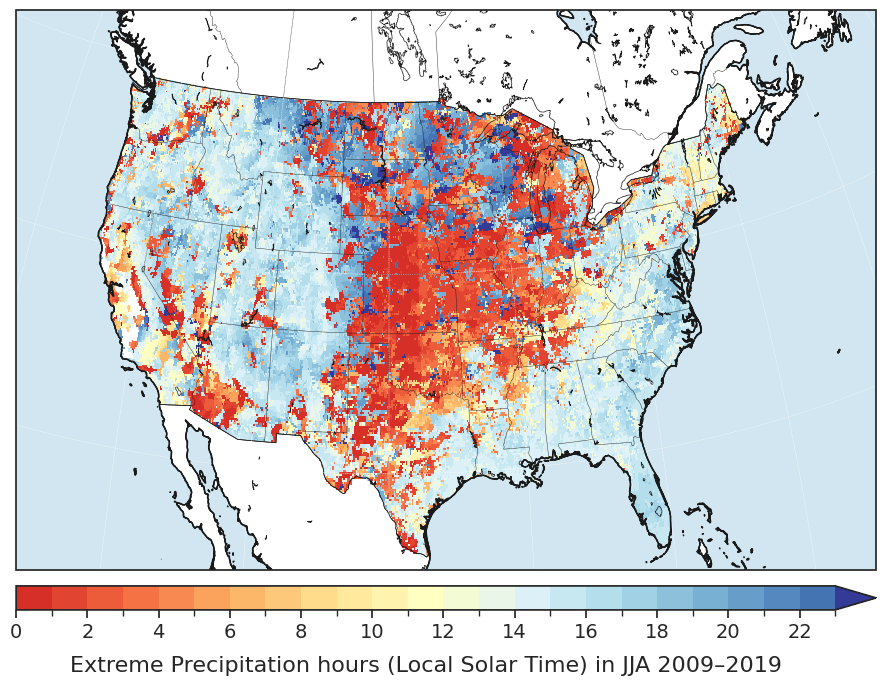

<Figure size 640x480 with 0 Axes>

In [269]:
# colorbar for column1

bounds = np.arange(0,24,1)
cols = plt.get_cmap('RdYlBu')(np.linspace(0.1,0.9,len(bounds)-1))#RdBu 
cmap = mpl.colors.ListedColormap(cols) 
cmap.set_over(plt.get_cmap('RdYlBu')(0.99)) 
cmap.set_under(plt.get_cmap('RdYlBu')(0)) 
norm = mpl.colors.BoundaryNorm(boundaries=bounds, ncolors=len(bounds)-1) 
sm = plt.cm.ScalarMappable(norm=norm,cmap=cmap) 
sm.set_array([]) 

extent_lonlat = (-126, -65, 23, 51) #extent_lonlat = (-126, -65, 23, 51)
ocean_color = np.float64([209,230,241])/255

latmin, latmax =  30, 45
lonmin, lonmax = -105, -85 

sns.set(font_scale=1.7, style="dark")

fig = plt.figure(figsize=(10,8),tight_layout = True) #8,10;,tight_layout = True
ncols = 1
nrows = 1
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, figure=fig)
gs.update(left = 0.1, right=0.96,top=0.9,bottom=0.2,wspace=0.1, hspace=0)
bottoms, tops, lefts, rights = gs.get_grid_positions(fig)

axes = []
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none')

newcoast = cfeature.NaturalEarthFeature('physical', 'coastline', '10m',
                                        edgecolor='k',facecolor='none')
newlake = cfeature.NaturalEarthFeature('physical', 'lakes', '10m',edgecolor='k', facecolor='none')
plt.rcParams["axes.edgecolor"] = "0.15"

for i in range(nrows):
    for j in range(ncols):        

        ax= fig.add_subplot(gs[i,j], projection= ccrs.Orthographic(central_longitude=-100, central_latitude=25, globe=None))
        ax.pcolormesh(data_array_test.longitude.values, data_array_test.latitude.values, np.where(mask, data_array_test.hour,  np.nan),transform=ccrs.PlateCarree(),cmap=cmap,norm=norm) #Regrid1Deg[0,:,:];mask_concat[0,:,:]

       
        ax.coastlines()
        ax.set_global()
        ax.set_extent(extent_lonlat, crs=ccrs.PlateCarree())
        ax.gridlines(xlocs=np.arange(-180,190,10),ylocs=np.arange(-180,190,10),linestyle="--",linewidth=0.3)
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(states_provinces, linewidth=0.3, linestyle='-', edgecolor='k')
        ax.add_feature(newcoast, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(newlake, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.LAND,color='w',zorder=0,edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN,color=ocean_color,zorder=0,edgecolor='k')
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN,color=ocean_color,zorder=1)
        ax.add_feature(newcoast, linewidth=1, linestyle='-', zorder=2,edgecolor='k')

        ax.set_aspect("auto") 
        axes.append(ax)


# Create axes for the colorbar on the same place. 
cbar_ax = fig.add_axes([lefts[0],0.15,rights[0]-lefts[0],0.03]) #[left, bottom, width, height]  
cb = fig.colorbar(sm,cax=cbar_ax,orientation="horizontal",pad=0.02,ticks=bounds[::2],use_gridspec=True,extend="max",fraction=0.1) #drawedges=True, 
cb.ax.set_xticklabels(bounds[::2], size=14)
cb.ax.set_xlabel(r"Extreme Precipitation hours (Local Solar Time) in JJA 2009–2024", size=16, labelpad=10) 

fig1 = plt.gcf()
# plt.tight_layout()
plt.show()
plt.draw()

# fig.savefig('HourlyP06utc.jpg', dpi=300, bbox_inches = "tight")

In [270]:
jja_files = []
for month in range(6,9):
    for year in range(2019,2024):
        filename = f"R99pw1hr/wet_hour_prcp/Hourly_Total_Precipitation_T_{str(month).zfill(2)}{year}.nc"
        jja_files.append(filename)

data = xr.open_mfdataset(jja_files)
data
    

freq_prcp_hours = []
for i in range(261):
    for j in range(591):
        print(i,j)
        freq_prcp_hours.append(max_prcp_hour(data.R99pa1hr[:,i,j], data.R99pa1hr[:,i,j].longitude))
        
latitude_values = data.latitude
longitude_values = data.longitude
data_array_test = xr.Dataset(
    coords={"latitude": latitude_values, "longitude": longitude_values},
)

data_array_test['hour'] = (('latitude', 'longitude'), np.array(freq_prcp_hours).reshape(261, 591))
data_array_test.to_netcdf('R99pw1hr/freq_prcp_hours_fifth_decade_v2.nc')

0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
0 9
0 10
0 11
0 12
0 13
0 14
0 15
0 16
0 17
0 18
0 19
0 20
0 21
0 22
0 23
0 24
0 25
0 26
0 27
0 28
0 29
0 30
0 31
0 32
0 33
0 34
0 35
0 36
0 37
0 38
0 39
0 40
0 41
0 42
0 43
0 44
0 45
0 46
0 47
0 48
0 49
0 50
0 51
0 52
0 53
0 54
0 55
0 56
0 57
0 58
0 59
0 60
0 61
0 62
0 63
0 64
0 65
0 66
0 67
0 68
0 69
0 70
0 71
0 72
0 73
0 74
0 75
0 76
0 77
0 78
0 79
0 80
0 81
0 82
0 83
0 84
0 85
0 86
0 87
0 88
0 89
0 90
0 91
0 92
0 93
0 94
0 95
0 96
0 97
0 98
0 99
0 100
0 101
0 102
0 103
0 104
0 105
0 106
0 107
0 108
0 109
0 110
0 111
0 112
0 113
0 114
0 115
0 116
0 117
0 118
0 119
0 120
0 121
0 122
0 123
0 124
0 125
0 126
0 127
0 128
0 129
0 130
0 131
0 132
0 133
0 134
0 135
0 136
0 137
0 138
0 139
0 140
0 141
0 142
0 143
0 144
0 145
0 146
0 147
0 148
0 149
0 150
0 151
0 152
0 153
0 154
0 155
0 156
0 157
0 158
0 159
0 160
0 161
0 162
0 163
0 164
0 165
0 166
0 167
0 168
0 169
0 170
0 171
0 172
0 173
0 174
0 175
0 176
0 177
0 178
0 179
0 180
0 181
0 182
0 183
0 184


2 243
2 244
2 245
2 246
2 247
2 248
2 249
2 250
2 251
2 252
2 253
2 254
2 255
2 256
2 257
2 258
2 259
2 260
2 261
2 262
2 263
2 264
2 265
2 266
2 267
2 268
2 269
2 270
2 271
2 272
2 273
2 274
2 275
2 276
2 277
2 278
2 279
2 280
2 281
2 282
2 283
2 284
2 285
2 286
2 287
2 288
2 289
2 290
2 291
2 292
2 293
2 294
2 295
2 296
2 297
2 298
2 299
2 300
2 301
2 302
2 303
2 304
2 305
2 306
2 307
2 308
2 309
2 310
2 311
2 312
2 313
2 314
2 315
2 316
2 317
2 318
2 319
2 320
2 321
2 322
2 323
2 324
2 325
2 326
2 327
2 328
2 329
2 330
2 331
2 332
2 333
2 334
2 335
2 336
2 337
2 338
2 339
2 340
2 341
2 342
2 343
2 344
2 345
2 346
2 347
2 348
2 349
2 350
2 351
2 352
2 353
2 354
2 355
2 356
2 357
2 358
2 359
2 360
2 361
2 362
2 363
2 364
2 365
2 366
2 367
2 368
2 369
2 370
2 371
2 372
2 373
2 374
2 375
2 376
2 377
2 378
2 379
2 380
2 381
2 382
2 383
2 384
2 385
2 386
2 387
2 388
2 389
2 390
2 391
2 392
2 393
2 394
2 395
2 396
2 397
2 398
2 399
2 400
2 401
2 402
2 403
2 404
2 405
2 406
2 407
2 408
2 40

4 468
4 469
4 470
4 471
4 472
4 473
4 474
4 475
4 476
4 477
4 478
4 479
4 480
4 481
4 482
4 483
4 484
4 485
4 486
4 487
4 488
4 489
4 490
4 491
4 492
4 493
4 494
4 495
4 496
4 497
4 498
4 499
4 500
4 501
4 502
4 503
4 504
4 505
4 506
4 507
4 508
4 509
4 510
4 511
4 512
4 513
4 514
4 515
4 516
4 517
4 518
4 519
4 520
4 521
4 522
4 523
4 524
4 525
4 526
4 527
4 528
4 529
4 530
4 531
4 532
4 533
4 534
4 535
4 536
4 537
4 538
4 539
4 540
4 541
4 542
4 543
4 544
4 545
4 546
4 547
4 548
4 549
4 550
4 551
4 552
4 553
4 554
4 555
4 556
4 557
4 558
4 559
4 560
4 561
4 562
4 563
4 564
4 565
4 566
4 567
4 568
4 569
4 570
4 571
4 572
4 573
4 574
4 575
4 576
4 577
4 578
4 579
4 580
4 581
4 582
4 583
4 584
4 585
4 586
4 587
4 588
4 589
4 590
5 0
5 1
5 2
5 3
5 4
5 5
5 6
5 7
5 8
5 9
5 10
5 11
5 12
5 13
5 14
5 15
5 16
5 17
5 18
5 19
5 20
5 21
5 22
5 23
5 24
5 25
5 26
5 27
5 28
5 29
5 30
5 31
5 32
5 33
5 34
5 35
5 36
5 37
5 38
5 39
5 40
5 41
5 42
5 43
5 44
5 45
5 46
5 47
5 48
5 49
5 50
5 51
5 52
5 53
5 

7 116
7 117
7 118
7 119
7 120
7 121
7 122
7 123
7 124
7 125
7 126
7 127
7 128
7 129
7 130
7 131
7 132
7 133
7 134
7 135
7 136
7 137
7 138
7 139
7 140
7 141
7 142
7 143
7 144
7 145
7 146
7 147
7 148
7 149
7 150
7 151
7 152
7 153
7 154
7 155
7 156
7 157
7 158
7 159
7 160
7 161
7 162
7 163
7 164
7 165
7 166
7 167
7 168
7 169
7 170
7 171
7 172
7 173
7 174
7 175
7 176
7 177
7 178
7 179
7 180
7 181
7 182
7 183
7 184
7 185
7 186
7 187
7 188
7 189
7 190
7 191
7 192
7 193
7 194
7 195
7 196
7 197
7 198
7 199
7 200
7 201
7 202
7 203
7 204
7 205
7 206
7 207
7 208
7 209
7 210
7 211
7 212
7 213
7 214
7 215
7 216
7 217
7 218
7 219
7 220
7 221
7 222
7 223
7 224
7 225
7 226
7 227
7 228
7 229
7 230
7 231
7 232
7 233
7 234
7 235
7 236
7 237
7 238
7 239
7 240
7 241
7 242
7 243
7 244
7 245
7 246
7 247
7 248
7 249
7 250
7 251
7 252
7 253
7 254
7 255
7 256
7 257
7 258
7 259
7 260
7 261
7 262
7 263
7 264
7 265
7 266
7 267
7 268
7 269
7 270
7 271
7 272
7 273
7 274
7 275
7 276
7 277
7 278
7 279
7 280
7 281
7 28

9 343
9 344
9 345
9 346
9 347
9 348
9 349
9 350
9 351
9 352
9 353
9 354
9 355
9 356
9 357
9 358
9 359
9 360
9 361
9 362
9 363
9 364
9 365
9 366
9 367
9 368
9 369
9 370
9 371
9 372
9 373
9 374
9 375
9 376
9 377
9 378
9 379
9 380
9 381
9 382
9 383
9 384
9 385
9 386
9 387
9 388
9 389
9 390
9 391
9 392
9 393
9 394
9 395
9 396
9 397
9 398
9 399
9 400
9 401
9 402
9 403
9 404
9 405
9 406
9 407
9 408
9 409
9 410
9 411
9 412
9 413
9 414
9 415
9 416
9 417
9 418
9 419
9 420
9 421
9 422
9 423
9 424
9 425
9 426
9 427
9 428
9 429
9 430
9 431
9 432
9 433
9 434
9 435
9 436
9 437
9 438
9 439
9 440
9 441
9 442
9 443
9 444
9 445
9 446
9 447
9 448
9 449
9 450
9 451
9 452
9 453
9 454
9 455
9 456
9 457
9 458
9 459
9 460
9 461
9 462
9 463
9 464
9 465
9 466
9 467
9 468
9 469
9 470
9 471
9 472
9 473
9 474
9 475
9 476
9 477
9 478
9 479
9 480
9 481
9 482
9 483
9 484
9 485
9 486
9 487
9 488
9 489
9 490
9 491
9 492
9 493
9 494
9 495
9 496
9 497
9 498
9 499
9 500
9 501
9 502
9 503
9 504
9 505
9 506
9 507
9 508
9 50

11 407
11 408
11 409
11 410
11 411
11 412
11 413
11 414
11 415
11 416
11 417
11 418
11 419
11 420
11 421
11 422
11 423
11 424
11 425
11 426
11 427
11 428
11 429
11 430
11 431
11 432
11 433
11 434
11 435
11 436
11 437
11 438
11 439
11 440
11 441
11 442
11 443
11 444
11 445
11 446
11 447
11 448
11 449
11 450
11 451
11 452
11 453
11 454
11 455
11 456
11 457
11 458
11 459
11 460
11 461
11 462
11 463
11 464
11 465
11 466
11 467
11 468
11 469
11 470
11 471
11 472
11 473
11 474
11 475
11 476
11 477
11 478
11 479
11 480
11 481
11 482
11 483
11 484
11 485
11 486
11 487
11 488
11 489
11 490
11 491
11 492
11 493
11 494
11 495
11 496
11 497
11 498
11 499
11 500
11 501
11 502
11 503
11 504
11 505
11 506
11 507
11 508
11 509
11 510
11 511
11 512
11 513
11 514
11 515
11 516
11 517
11 518
11 519
11 520
11 521
11 522
11 523
11 524
11 525
11 526
11 527
11 528
11 529
11 530
11 531
11 532
11 533
11 534
11 535
11 536
11 537
11 538
11 539
11 540
11 541
11 542
11 543
11 544
11 545
11 546
11 547
11 548
11 549

13 431
13 432
13 433
13 434
13 435
13 436
13 437
13 438
13 439
13 440
13 441
13 442
13 443
13 444
13 445
13 446
13 447
13 448
13 449
13 450
13 451
13 452
13 453
13 454
13 455
13 456
13 457
13 458
13 459
13 460
13 461
13 462
13 463
13 464
13 465
13 466
13 467
13 468
13 469
13 470
13 471
13 472
13 473
13 474
13 475
13 476
13 477
13 478
13 479
13 480
13 481
13 482
13 483
13 484
13 485
13 486
13 487
13 488
13 489
13 490
13 491
13 492
13 493
13 494
13 495
13 496
13 497
13 498
13 499
13 500
13 501
13 502
13 503
13 504
13 505
13 506
13 507
13 508
13 509
13 510
13 511
13 512
13 513
13 514
13 515
13 516
13 517
13 518
13 519
13 520
13 521
13 522
13 523
13 524
13 525
13 526
13 527
13 528
13 529
13 530
13 531
13 532
13 533
13 534
13 535
13 536
13 537
13 538
13 539
13 540
13 541
13 542
13 543
13 544
13 545
13 546
13 547
13 548
13 549
13 550
13 551
13 552
13 553
13 554
13 555
13 556
13 557
13 558
13 559
13 560
13 561
13 562
13 563
13 564
13 565
13 566
13 567
13 568
13 569
13 570
13 571
13 572
13 573

15 457
15 458
15 459
15 460
15 461
15 462
15 463
15 464
15 465
15 466
15 467
15 468
15 469
15 470
15 471
15 472
15 473
15 474
15 475
15 476
15 477
15 478
15 479
15 480
15 481
15 482
15 483
15 484
15 485
15 486
15 487
15 488
15 489
15 490
15 491
15 492
15 493
15 494
15 495
15 496
15 497
15 498
15 499
15 500
15 501
15 502
15 503
15 504
15 505
15 506
15 507
15 508
15 509
15 510
15 511
15 512
15 513
15 514
15 515
15 516
15 517
15 518
15 519
15 520
15 521
15 522
15 523
15 524
15 525
15 526
15 527
15 528
15 529
15 530
15 531
15 532
15 533
15 534
15 535
15 536
15 537
15 538
15 539
15 540
15 541
15 542
15 543
15 544
15 545
15 546
15 547
15 548
15 549
15 550
15 551
15 552
15 553
15 554
15 555
15 556
15 557
15 558
15 559
15 560
15 561
15 562
15 563
15 564
15 565
15 566
15 567
15 568
15 569
15 570
15 571
15 572
15 573
15 574
15 575
15 576
15 577
15 578
15 579
15 580
15 581
15 582
15 583
15 584
15 585
15 586
15 587
15 588
15 589
15 590
16 0
16 1
16 2
16 3
16 4
16 5
16 6
16 7
16 8
16 9
16 10
16 11


17 482
17 483
17 484
17 485
17 486
17 487
17 488
17 489
17 490
17 491
17 492
17 493
17 494
17 495
17 496
17 497
17 498
17 499
17 500
17 501
17 502
17 503
17 504
17 505
17 506
17 507
17 508
17 509
17 510
17 511
17 512
17 513
17 514
17 515
17 516
17 517
17 518
17 519
17 520
17 521
17 522
17 523
17 524
17 525
17 526
17 527
17 528
17 529
17 530
17 531
17 532
17 533
17 534
17 535
17 536
17 537
17 538
17 539
17 540
17 541
17 542
17 543
17 544
17 545
17 546
17 547
17 548
17 549
17 550
17 551
17 552
17 553
17 554
17 555
17 556
17 557
17 558
17 559
17 560
17 561
17 562
17 563
17 564
17 565
17 566
17 567
17 568
17 569
17 570
17 571
17 572
17 573
17 574
17 575
17 576
17 577
17 578
17 579
17 580
17 581
17 582
17 583
17 584
17 585
17 586
17 587
17 588
17 589
17 590
18 0
18 1
18 2
18 3
18 4
18 5
18 6
18 7
18 8
18 9
18 10
18 11
18 12
18 13
18 14
18 15
18 16
18 17
18 18
18 19
18 20
18 21
18 22
18 23
18 24
18 25
18 26
18 27
18 28
18 29
18 30
18 31
18 32
18 33
18 34
18 35
18 36
18 37
18 38
18 39
18 40
1

19 505
19 506
19 507
19 508
19 509
19 510
19 511
19 512
19 513
19 514
19 515
19 516
19 517
19 518
19 519
19 520
19 521
19 522
19 523
19 524
19 525
19 526
19 527
19 528
19 529
19 530
19 531
19 532
19 533
19 534
19 535
19 536
19 537
19 538
19 539
19 540
19 541
19 542
19 543
19 544
19 545
19 546
19 547
19 548
19 549
19 550
19 551
19 552
19 553
19 554
19 555
19 556
19 557
19 558
19 559
19 560
19 561
19 562
19 563
19 564
19 565
19 566
19 567
19 568
19 569
19 570
19 571
19 572
19 573
19 574
19 575
19 576
19 577
19 578
19 579
19 580
19 581
19 582
19 583
19 584
19 585
19 586
19 587
19 588
19 589
19 590
20 0
20 1
20 2
20 3
20 4
20 5
20 6
20 7
20 8
20 9
20 10
20 11
20 12
20 13
20 14
20 15
20 16
20 17
20 18
20 19
20 20
20 21
20 22
20 23
20 24
20 25
20 26
20 27
20 28
20 29
20 30
20 31
20 32
20 33
20 34
20 35
20 36
20 37
20 38
20 39
20 40
20 41
20 42
20 43
20 44
20 45
20 46
20 47
20 48
20 49
20 50
20 51
20 52
20 53
20 54
20 55
20 56
20 57
20 58
20 59
20 60
20 61
20 62
20 63
20 64
20 65
20 66
20 67


21 534
21 535
21 536
21 537
21 538
21 539
21 540
21 541
21 542
21 543
21 544
21 545
21 546
21 547
21 548
21 549
21 550
21 551
21 552
21 553
21 554
21 555
21 556
21 557
21 558
21 559
21 560
21 561
21 562
21 563
21 564
21 565
21 566
21 567
21 568
21 569
21 570
21 571
21 572
21 573
21 574
21 575
21 576
21 577
21 578
21 579
21 580
21 581
21 582
21 583
21 584
21 585
21 586
21 587
21 588
21 589
21 590
22 0
22 1
22 2
22 3
22 4
22 5
22 6
22 7
22 8
22 9
22 10
22 11
22 12
22 13
22 14
22 15
22 16
22 17
22 18
22 19
22 20
22 21
22 22
22 23
22 24
22 25
22 26
22 27
22 28
22 29
22 30
22 31
22 32
22 33
22 34
22 35
22 36
22 37
22 38
22 39
22 40
22 41
22 42
22 43
22 44
22 45
22 46
22 47
22 48
22 49
22 50
22 51
22 52
22 53
22 54
22 55
22 56
22 57
22 58
22 59
22 60
22 61
22 62
22 63
22 64
22 65
22 66
22 67
22 68
22 69
22 70
22 71
22 72
22 73
22 74
22 75
22 76
22 77
22 78
22 79
22 80
22 81
22 82
22 83
22 84
22 85
22 86
22 87
22 88
22 89
22 90
22 91
22 92
22 93
22 94
22 95
22 96
22 97
22 98
22 99
22 100
22 1

23 558
23 559
23 560
23 561
23 562
23 563
23 564
23 565
23 566
23 567
23 568
23 569
23 570
23 571
23 572
23 573
23 574
23 575
23 576
23 577
23 578
23 579
23 580
23 581
23 582
23 583
23 584
23 585
23 586
23 587
23 588
23 589
23 590
24 0
24 1
24 2
24 3
24 4
24 5
24 6
24 7
24 8
24 9
24 10
24 11
24 12
24 13
24 14
24 15
24 16
24 17
24 18
24 19
24 20
24 21
24 22
24 23
24 24
24 25
24 26
24 27
24 28
24 29
24 30
24 31
24 32
24 33
24 34
24 35
24 36
24 37
24 38
24 39
24 40
24 41
24 42
24 43
24 44
24 45
24 46
24 47
24 48
24 49
24 50
24 51
24 52
24 53
24 54
24 55
24 56
24 57
24 58
24 59
24 60
24 61
24 62
24 63
24 64
24 65
24 66
24 67
24 68
24 69
24 70
24 71
24 72
24 73
24 74
24 75
24 76
24 77
24 78
24 79
24 80
24 81
24 82
24 83
24 84
24 85
24 86
24 87
24 88
24 89
24 90
24 91
24 92
24 93
24 94
24 95
24 96
24 97
24 98
24 99
24 100
24 101
24 102
24 103
24 104
24 105
24 106
24 107
24 108
24 109
24 110
24 111
24 112
24 113
24 114
24 115
24 116
24 117
24 118
24 119
24 120
24 121
24 122
24 123
24 124
24 1

25 584
25 585
25 586
25 587
25 588
25 589
25 590
26 0
26 1
26 2
26 3
26 4
26 5
26 6
26 7
26 8
26 9
26 10
26 11
26 12
26 13
26 14
26 15
26 16
26 17
26 18
26 19
26 20
26 21
26 22
26 23
26 24
26 25
26 26
26 27
26 28
26 29
26 30
26 31
26 32
26 33
26 34
26 35
26 36
26 37
26 38
26 39
26 40
26 41
26 42
26 43
26 44
26 45
26 46
26 47
26 48
26 49
26 50
26 51
26 52
26 53
26 54
26 55
26 56
26 57
26 58
26 59
26 60
26 61
26 62
26 63
26 64
26 65
26 66
26 67
26 68
26 69
26 70
26 71
26 72
26 73
26 74
26 75
26 76
26 77
26 78
26 79
26 80
26 81
26 82
26 83
26 84
26 85
26 86
26 87
26 88
26 89
26 90
26 91
26 92
26 93
26 94
26 95
26 96
26 97
26 98
26 99
26 100
26 101
26 102
26 103
26 104
26 105
26 106
26 107
26 108
26 109
26 110
26 111
26 112
26 113
26 114
26 115
26 116
26 117
26 118
26 119
26 120
26 121
26 122
26 123
26 124
26 125
26 126
26 127
26 128
26 129
26 130
26 131
26 132
26 133
26 134
26 135
26 136
26 137
26 138
26 139
26 140
26 141
26 142
26 143
26 144
26 145
26 146
26 147
26 148
26 149
26 150
26 1

28 20
28 21
28 22
28 23
28 24
28 25
28 26
28 27
28 28
28 29
28 30
28 31
28 32
28 33
28 34
28 35
28 36
28 37
28 38
28 39
28 40
28 41
28 42
28 43
28 44
28 45
28 46
28 47
28 48
28 49
28 50
28 51
28 52
28 53
28 54
28 55
28 56
28 57
28 58
28 59
28 60
28 61
28 62
28 63
28 64
28 65
28 66
28 67
28 68
28 69
28 70
28 71
28 72
28 73
28 74
28 75
28 76
28 77
28 78
28 79
28 80
28 81
28 82
28 83
28 84
28 85
28 86
28 87
28 88
28 89
28 90
28 91
28 92
28 93
28 94
28 95
28 96
28 97
28 98
28 99
28 100
28 101
28 102
28 103
28 104
28 105
28 106
28 107
28 108
28 109
28 110
28 111
28 112
28 113
28 114
28 115
28 116
28 117
28 118
28 119
28 120
28 121
28 122
28 123
28 124
28 125
28 126
28 127
28 128
28 129
28 130
28 131
28 132
28 133
28 134
28 135
28 136
28 137
28 138
28 139
28 140
28 141
28 142
28 143
28 144
28 145
28 146
28 147
28 148
28 149
28 150
28 151
28 152
28 153
28 154
28 155
28 156
28 157
28 158
28 159
28 160
28 161
28 162
28 163
28 164
28 165
28 166
28 167
28 168
28 169
28 170
28 171
28 172
28 173
28

30 44
30 45
30 46
30 47
30 48
30 49
30 50
30 51
30 52
30 53
30 54
30 55
30 56
30 57
30 58
30 59
30 60
30 61
30 62
30 63
30 64
30 65
30 66
30 67
30 68
30 69
30 70
30 71
30 72
30 73
30 74
30 75
30 76
30 77
30 78
30 79
30 80
30 81
30 82
30 83
30 84
30 85
30 86
30 87
30 88
30 89
30 90
30 91
30 92
30 93
30 94
30 95
30 96
30 97
30 98
30 99
30 100
30 101
30 102
30 103
30 104
30 105
30 106
30 107
30 108
30 109
30 110
30 111
30 112
30 113
30 114
30 115
30 116
30 117
30 118
30 119
30 120
30 121
30 122
30 123
30 124
30 125
30 126
30 127
30 128
30 129
30 130
30 131
30 132
30 133
30 134
30 135
30 136
30 137
30 138
30 139
30 140
30 141
30 142
30 143
30 144
30 145
30 146
30 147
30 148
30 149
30 150
30 151
30 152
30 153
30 154
30 155
30 156
30 157
30 158
30 159
30 160
30 161
30 162
30 163
30 164
30 165
30 166
30 167
30 168
30 169
30 170
30 171
30 172
30 173
30 174
30 175
30 176
30 177
30 178
30 179
30 180
30 181
30 182
30 183
30 184
30 185
30 186
30 187
30 188
30 189
30 190
30 191
30 192
30 193
30 194

32 75
32 76
32 77
32 78
32 79
32 80
32 81
32 82
32 83
32 84
32 85
32 86
32 87
32 88
32 89
32 90
32 91
32 92
32 93
32 94
32 95
32 96
32 97
32 98
32 99
32 100
32 101
32 102
32 103
32 104
32 105
32 106
32 107
32 108
32 109
32 110
32 111
32 112
32 113
32 114
32 115
32 116
32 117
32 118
32 119
32 120
32 121
32 122
32 123
32 124
32 125
32 126
32 127
32 128
32 129
32 130
32 131
32 132
32 133
32 134
32 135
32 136
32 137
32 138
32 139
32 140
32 141
32 142
32 143
32 144
32 145
32 146
32 147
32 148
32 149
32 150
32 151
32 152
32 153
32 154
32 155
32 156
32 157
32 158
32 159
32 160
32 161
32 162
32 163
32 164
32 165
32 166
32 167
32 168
32 169
32 170
32 171
32 172
32 173
32 174
32 175
32 176
32 177
32 178
32 179
32 180
32 181
32 182
32 183
32 184
32 185
32 186
32 187
32 188
32 189
32 190
32 191
32 192
32 193
32 194
32 195
32 196
32 197
32 198
32 199
32 200
32 201
32 202
32 203
32 204
32 205
32 206
32 207
32 208
32 209
32 210
32 211
32 212
32 213
32 214
32 215
32 216
32 217
32 218
32 219
32 220
32 

34 107
34 108
34 109
34 110
34 111
34 112
34 113
34 114
34 115
34 116
34 117
34 118
34 119
34 120
34 121
34 122
34 123
34 124
34 125
34 126
34 127
34 128
34 129
34 130
34 131
34 132
34 133
34 134
34 135
34 136
34 137
34 138
34 139
34 140
34 141
34 142
34 143
34 144
34 145
34 146
34 147
34 148
34 149
34 150
34 151
34 152
34 153
34 154
34 155
34 156
34 157
34 158
34 159
34 160
34 161
34 162
34 163
34 164
34 165
34 166
34 167
34 168
34 169
34 170
34 171
34 172
34 173
34 174
34 175
34 176
34 177
34 178
34 179
34 180
34 181
34 182
34 183
34 184
34 185
34 186
34 187
34 188
34 189
34 190
34 191
34 192
34 193
34 194
34 195
34 196
34 197
34 198
34 199
34 200
34 201
34 202
34 203
34 204
34 205
34 206
34 207
34 208
34 209
34 210
34 211
34 212
34 213
34 214
34 215
34 216
34 217
34 218
34 219
34 220
34 221
34 222
34 223
34 224
34 225
34 226
34 227
34 228
34 229
34 230
34 231
34 232
34 233
34 234
34 235
34 236
34 237
34 238
34 239
34 240
34 241
34 242
34 243
34 244
34 245
34 246
34 247
34 248
34 249

36 132
36 133
36 134
36 135
36 136
36 137
36 138
36 139
36 140
36 141
36 142
36 143
36 144
36 145
36 146
36 147
36 148
36 149
36 150
36 151
36 152
36 153
36 154
36 155
36 156
36 157
36 158
36 159
36 160
36 161
36 162
36 163
36 164
36 165
36 166
36 167
36 168
36 169
36 170
36 171
36 172
36 173
36 174
36 175
36 176
36 177
36 178
36 179
36 180
36 181
36 182
36 183
36 184
36 185
36 186
36 187
36 188
36 189
36 190
36 191
36 192
36 193
36 194
36 195
36 196
36 197
36 198
36 199
36 200
36 201
36 202
36 203
36 204
36 205
36 206
36 207
36 208
36 209
36 210
36 211
36 212
36 213
36 214
36 215
36 216
36 217
36 218
36 219
36 220
36 221
36 222
36 223
36 224
36 225
36 226
36 227
36 228
36 229
36 230
36 231
36 232
36 233
36 234
36 235
36 236
36 237
36 238
36 239
36 240
36 241
36 242
36 243
36 244
36 245
36 246
36 247
36 248
36 249
36 250
36 251
36 252
36 253
36 254
36 255
36 256
36 257
36 258
36 259
36 260
36 261
36 262
36 263
36 264
36 265
36 266
36 267
36 268
36 269
36 270
36 271
36 272
36 273
36 274

38 152
38 153
38 154
38 155
38 156
38 157
38 158
38 159
38 160
38 161
38 162
38 163
38 164
38 165
38 166
38 167
38 168
38 169
38 170
38 171
38 172
38 173
38 174
38 175
38 176
38 177
38 178
38 179
38 180
38 181
38 182
38 183
38 184
38 185
38 186
38 187
38 188
38 189
38 190
38 191
38 192
38 193
38 194
38 195
38 196
38 197
38 198
38 199
38 200
38 201
38 202
38 203
38 204
38 205
38 206
38 207
38 208
38 209
38 210
38 211
38 212
38 213
38 214
38 215
38 216
38 217
38 218
38 219
38 220
38 221
38 222
38 223
38 224
38 225
38 226
38 227
38 228
38 229
38 230
38 231
38 232
38 233
38 234
38 235
38 236
38 237
38 238
38 239
38 240
38 241
38 242
38 243
38 244
38 245
38 246
38 247
38 248
38 249
38 250
38 251
38 252
38 253
38 254
38 255
38 256
38 257
38 258
38 259
38 260
38 261
38 262
38 263
38 264
38 265
38 266
38 267
38 268
38 269
38 270
38 271
38 272
38 273
38 274
38 275
38 276
38 277
38 278
38 279
38 280
38 281
38 282
38 283
38 284
38 285
38 286
38 287
38 288
38 289
38 290
38 291
38 292
38 293
38 294

40 177
40 178
40 179
40 180
40 181
40 182
40 183
40 184
40 185
40 186
40 187
40 188
40 189
40 190
40 191
40 192
40 193
40 194
40 195
40 196
40 197
40 198
40 199
40 200
40 201
40 202
40 203
40 204
40 205
40 206
40 207
40 208
40 209
40 210
40 211
40 212
40 213
40 214
40 215
40 216
40 217
40 218
40 219
40 220
40 221
40 222
40 223
40 224
40 225
40 226
40 227
40 228
40 229
40 230
40 231
40 232
40 233
40 234
40 235
40 236
40 237
40 238
40 239
40 240
40 241
40 242
40 243
40 244
40 245
40 246
40 247
40 248
40 249
40 250
40 251
40 252
40 253
40 254
40 255
40 256
40 257
40 258
40 259
40 260
40 261
40 262
40 263
40 264
40 265
40 266
40 267
40 268
40 269
40 270
40 271
40 272
40 273
40 274
40 275
40 276
40 277
40 278
40 279
40 280
40 281
40 282
40 283
40 284
40 285
40 286
40 287
40 288
40 289
40 290
40 291
40 292
40 293
40 294
40 295
40 296
40 297
40 298
40 299
40 300
40 301
40 302
40 303
40 304
40 305
40 306
40 307
40 308
40 309
40 310
40 311
40 312
40 313
40 314
40 315
40 316
40 317
40 318
40 319

42 197
42 198
42 199
42 200
42 201
42 202
42 203
42 204
42 205
42 206
42 207
42 208
42 209
42 210
42 211
42 212
42 213
42 214
42 215
42 216
42 217
42 218
42 219
42 220
42 221
42 222
42 223
42 224
42 225
42 226
42 227
42 228
42 229
42 230
42 231
42 232
42 233
42 234
42 235
42 236
42 237
42 238
42 239
42 240
42 241
42 242
42 243
42 244
42 245
42 246
42 247
42 248
42 249
42 250
42 251
42 252
42 253
42 254
42 255
42 256
42 257
42 258
42 259
42 260
42 261
42 262
42 263
42 264
42 265
42 266
42 267
42 268
42 269
42 270
42 271
42 272
42 273
42 274
42 275
42 276
42 277
42 278
42 279
42 280
42 281
42 282
42 283
42 284
42 285
42 286
42 287
42 288
42 289
42 290
42 291
42 292
42 293
42 294
42 295
42 296
42 297
42 298
42 299
42 300
42 301
42 302
42 303
42 304
42 305
42 306
42 307
42 308
42 309
42 310
42 311
42 312
42 313
42 314
42 315
42 316
42 317
42 318
42 319
42 320
42 321
42 322
42 323
42 324
42 325
42 326
42 327
42 328
42 329
42 330
42 331
42 332
42 333
42 334
42 335
42 336
42 337
42 338
42 339

44 222
44 223
44 224
44 225
44 226
44 227
44 228
44 229
44 230
44 231
44 232
44 233
44 234
44 235
44 236
44 237
44 238
44 239
44 240
44 241
44 242
44 243
44 244
44 245
44 246
44 247
44 248
44 249
44 250
44 251
44 252
44 253
44 254
44 255
44 256
44 257
44 258
44 259
44 260
44 261
44 262
44 263
44 264
44 265
44 266
44 267
44 268
44 269
44 270
44 271
44 272
44 273
44 274
44 275
44 276
44 277
44 278
44 279
44 280
44 281
44 282
44 283
44 284
44 285
44 286
44 287
44 288
44 289
44 290
44 291
44 292
44 293
44 294
44 295
44 296
44 297
44 298
44 299
44 300
44 301
44 302
44 303
44 304
44 305
44 306
44 307
44 308
44 309
44 310
44 311
44 312
44 313
44 314
44 315
44 316
44 317
44 318
44 319
44 320
44 321
44 322
44 323
44 324
44 325
44 326
44 327
44 328
44 329
44 330
44 331
44 332
44 333
44 334
44 335
44 336
44 337
44 338
44 339
44 340
44 341
44 342
44 343
44 344
44 345
44 346
44 347
44 348
44 349
44 350
44 351
44 352
44 353
44 354
44 355
44 356
44 357
44 358
44 359
44 360
44 361
44 362
44 363
44 364

46 246
46 247
46 248
46 249
46 250
46 251
46 252
46 253
46 254
46 255
46 256
46 257
46 258
46 259
46 260
46 261
46 262
46 263
46 264
46 265
46 266
46 267
46 268
46 269
46 270
46 271
46 272
46 273
46 274
46 275
46 276
46 277
46 278
46 279
46 280
46 281
46 282
46 283
46 284
46 285
46 286
46 287
46 288
46 289
46 290
46 291
46 292
46 293
46 294
46 295
46 296
46 297
46 298
46 299
46 300
46 301
46 302
46 303
46 304
46 305
46 306
46 307
46 308
46 309
46 310
46 311
46 312
46 313
46 314
46 315
46 316
46 317
46 318
46 319
46 320
46 321
46 322
46 323
46 324
46 325
46 326
46 327
46 328
46 329
46 330
46 331
46 332
46 333
46 334
46 335
46 336
46 337
46 338
46 339
46 340
46 341
46 342
46 343
46 344
46 345
46 346
46 347
46 348
46 349
46 350
46 351
46 352
46 353
46 354
46 355
46 356
46 357
46 358
46 359
46 360
46 361
46 362
46 363
46 364
46 365
46 366
46 367
46 368
46 369
46 370
46 371
46 372
46 373
46 374
46 375
46 376
46 377
46 378
46 379
46 380
46 381
46 382
46 383
46 384
46 385
46 386
46 387
46 388

48 269
48 270
48 271
48 272
48 273
48 274
48 275
48 276
48 277
48 278
48 279
48 280
48 281
48 282
48 283
48 284
48 285
48 286
48 287
48 288
48 289
48 290
48 291
48 292
48 293
48 294
48 295
48 296
48 297
48 298
48 299
48 300
48 301
48 302
48 303
48 304
48 305
48 306
48 307
48 308
48 309
48 310
48 311
48 312
48 313
48 314
48 315
48 316
48 317
48 318
48 319
48 320
48 321
48 322
48 323
48 324
48 325
48 326
48 327
48 328
48 329
48 330
48 331
48 332
48 333
48 334
48 335
48 336
48 337
48 338
48 339
48 340
48 341
48 342
48 343
48 344
48 345
48 346
48 347
48 348
48 349
48 350
48 351
48 352
48 353
48 354
48 355
48 356
48 357
48 358
48 359
48 360
48 361
48 362
48 363
48 364
48 365
48 366
48 367
48 368
48 369
48 370
48 371
48 372
48 373
48 374
48 375
48 376
48 377
48 378
48 379
48 380
48 381
48 382
48 383
48 384
48 385
48 386
48 387
48 388
48 389
48 390
48 391
48 392
48 393
48 394
48 395
48 396
48 397
48 398
48 399
48 400
48 401
48 402
48 403
48 404
48 405
48 406
48 407
48 408
48 409
48 410
48 411

50 291
50 292
50 293
50 294
50 295
50 296
50 297
50 298
50 299
50 300
50 301
50 302
50 303
50 304
50 305
50 306
50 307
50 308
50 309
50 310
50 311
50 312
50 313
50 314
50 315
50 316
50 317
50 318
50 319
50 320
50 321
50 322
50 323
50 324
50 325
50 326
50 327
50 328
50 329
50 330
50 331
50 332
50 333
50 334
50 335
50 336
50 337
50 338
50 339
50 340
50 341
50 342
50 343
50 344
50 345
50 346
50 347
50 348
50 349
50 350
50 351
50 352
50 353
50 354
50 355
50 356
50 357
50 358
50 359
50 360
50 361
50 362
50 363
50 364
50 365
50 366
50 367
50 368
50 369
50 370
50 371
50 372
50 373
50 374
50 375
50 376
50 377
50 378
50 379
50 380
50 381
50 382
50 383
50 384
50 385
50 386
50 387
50 388
50 389
50 390
50 391
50 392
50 393
50 394
50 395
50 396
50 397
50 398
50 399
50 400
50 401
50 402
50 403
50 404
50 405
50 406
50 407
50 408
50 409
50 410
50 411
50 412
50 413
50 414
50 415
50 416
50 417
50 418
50 419
50 420
50 421
50 422
50 423
50 424
50 425
50 426
50 427
50 428
50 429
50 430
50 431
50 432
50 433

52 311
52 312
52 313
52 314
52 315
52 316
52 317
52 318
52 319
52 320
52 321
52 322
52 323
52 324
52 325
52 326
52 327
52 328
52 329
52 330
52 331
52 332
52 333
52 334
52 335
52 336
52 337
52 338
52 339
52 340
52 341
52 342
52 343
52 344
52 345
52 346
52 347
52 348
52 349
52 350
52 351
52 352
52 353
52 354
52 355
52 356
52 357
52 358
52 359
52 360
52 361
52 362
52 363
52 364
52 365
52 366
52 367
52 368
52 369
52 370
52 371
52 372
52 373
52 374
52 375
52 376
52 377
52 378
52 379
52 380
52 381
52 382
52 383
52 384
52 385
52 386
52 387
52 388
52 389
52 390
52 391
52 392
52 393
52 394
52 395
52 396
52 397
52 398
52 399
52 400
52 401
52 402
52 403
52 404
52 405
52 406
52 407
52 408
52 409
52 410
52 411
52 412
52 413
52 414
52 415
52 416
52 417
52 418
52 419
52 420
52 421
52 422
52 423
52 424
52 425
52 426
52 427
52 428
52 429
52 430
52 431
52 432
52 433
52 434
52 435
52 436
52 437
52 438
52 439
52 440
52 441
52 442
52 443
52 444
52 445
52 446
52 447
52 448
52 449
52 450
52 451
52 452
52 453

54 334
54 335
54 336
54 337
54 338
54 339
54 340
54 341
54 342
54 343
54 344
54 345
54 346
54 347
54 348
54 349
54 350
54 351
54 352
54 353
54 354
54 355
54 356
54 357
54 358
54 359
54 360
54 361
54 362
54 363
54 364
54 365
54 366
54 367
54 368
54 369
54 370
54 371
54 372
54 373
54 374
54 375
54 376
54 377
54 378
54 379
54 380
54 381
54 382
54 383
54 384
54 385
54 386
54 387
54 388
54 389
54 390
54 391
54 392
54 393
54 394
54 395
54 396
54 397
54 398
54 399
54 400
54 401
54 402
54 403
54 404
54 405
54 406
54 407
54 408
54 409
54 410
54 411
54 412
54 413
54 414
54 415
54 416
54 417
54 418
54 419
54 420
54 421
54 422
54 423
54 424
54 425
54 426
54 427
54 428
54 429
54 430
54 431
54 432
54 433
54 434
54 435
54 436
54 437
54 438
54 439
54 440
54 441
54 442
54 443
54 444
54 445
54 446
54 447
54 448
54 449
54 450
54 451
54 452
54 453
54 454
54 455
54 456
54 457
54 458
54 459
54 460
54 461
54 462
54 463
54 464
54 465
54 466
54 467
54 468
54 469
54 470
54 471
54 472
54 473
54 474
54 475
54 476

56 362
56 363
56 364
56 365
56 366
56 367
56 368
56 369
56 370
56 371
56 372
56 373
56 374
56 375
56 376
56 377
56 378
56 379
56 380
56 381
56 382
56 383
56 384
56 385
56 386
56 387
56 388
56 389
56 390
56 391
56 392
56 393
56 394
56 395
56 396
56 397
56 398
56 399
56 400
56 401
56 402
56 403
56 404
56 405
56 406
56 407
56 408
56 409
56 410
56 411
56 412
56 413
56 414
56 415
56 416
56 417
56 418
56 419
56 420
56 421
56 422
56 423
56 424
56 425
56 426
56 427
56 428
56 429
56 430
56 431
56 432
56 433
56 434
56 435
56 436
56 437
56 438
56 439
56 440
56 441
56 442
56 443
56 444
56 445
56 446
56 447
56 448
56 449
56 450
56 451
56 452
56 453
56 454
56 455
56 456
56 457
56 458
56 459
56 460
56 461
56 462
56 463
56 464
56 465
56 466
56 467
56 468
56 469
56 470
56 471
56 472
56 473
56 474
56 475
56 476
56 477
56 478
56 479
56 480
56 481
56 482
56 483
56 484
56 485
56 486
56 487
56 488
56 489
56 490
56 491
56 492
56 493
56 494
56 495
56 496
56 497
56 498
56 499
56 500
56 501
56 502
56 503
56 504

58 388
58 389
58 390
58 391
58 392
58 393
58 394
58 395
58 396
58 397
58 398
58 399
58 400
58 401
58 402
58 403
58 404
58 405
58 406
58 407
58 408
58 409
58 410
58 411
58 412
58 413
58 414
58 415
58 416
58 417
58 418
58 419
58 420
58 421
58 422
58 423
58 424
58 425
58 426
58 427
58 428
58 429
58 430
58 431
58 432
58 433
58 434
58 435
58 436
58 437
58 438
58 439
58 440
58 441
58 442
58 443
58 444
58 445
58 446
58 447
58 448
58 449
58 450
58 451
58 452
58 453
58 454
58 455
58 456
58 457
58 458
58 459
58 460
58 461
58 462
58 463
58 464
58 465
58 466
58 467
58 468
58 469
58 470
58 471
58 472
58 473
58 474
58 475
58 476
58 477
58 478
58 479
58 480
58 481
58 482
58 483
58 484
58 485
58 486
58 487
58 488
58 489
58 490
58 491
58 492
58 493
58 494
58 495
58 496
58 497
58 498
58 499
58 500
58 501
58 502
58 503
58 504
58 505
58 506
58 507
58 508
58 509
58 510
58 511
58 512
58 513
58 514
58 515
58 516
58 517
58 518
58 519
58 520
58 521
58 522
58 523
58 524
58 525
58 526
58 527
58 528
58 529
58 530

60 415
60 416
60 417
60 418
60 419
60 420
60 421
60 422
60 423
60 424
60 425
60 426
60 427
60 428
60 429
60 430
60 431
60 432
60 433
60 434
60 435
60 436
60 437
60 438
60 439
60 440
60 441
60 442
60 443
60 444
60 445
60 446
60 447
60 448
60 449
60 450
60 451
60 452
60 453
60 454
60 455
60 456
60 457
60 458
60 459
60 460
60 461
60 462
60 463
60 464
60 465
60 466
60 467
60 468
60 469
60 470
60 471
60 472
60 473
60 474
60 475
60 476
60 477
60 478
60 479
60 480
60 481
60 482
60 483
60 484
60 485
60 486
60 487
60 488
60 489
60 490
60 491
60 492
60 493
60 494
60 495
60 496
60 497
60 498
60 499
60 500
60 501
60 502
60 503
60 504
60 505
60 506
60 507
60 508
60 509
60 510
60 511
60 512
60 513
60 514
60 515
60 516
60 517
60 518
60 519
60 520
60 521
60 522
60 523
60 524
60 525
60 526
60 527
60 528
60 529
60 530
60 531
60 532
60 533
60 534
60 535
60 536
60 537
60 538
60 539
60 540
60 541
60 542
60 543
60 544
60 545
60 546
60 547
60 548
60 549
60 550
60 551
60 552
60 553
60 554
60 555
60 556
60 557

62 441
62 442
62 443
62 444
62 445
62 446
62 447
62 448
62 449
62 450
62 451
62 452
62 453
62 454
62 455
62 456
62 457
62 458
62 459
62 460
62 461
62 462
62 463
62 464
62 465
62 466
62 467
62 468
62 469
62 470
62 471
62 472
62 473
62 474
62 475
62 476
62 477
62 478
62 479
62 480
62 481
62 482
62 483
62 484
62 485
62 486
62 487
62 488
62 489
62 490
62 491
62 492
62 493
62 494
62 495
62 496
62 497
62 498
62 499
62 500
62 501
62 502
62 503
62 504
62 505
62 506
62 507
62 508
62 509
62 510
62 511
62 512
62 513
62 514
62 515
62 516
62 517
62 518
62 519
62 520
62 521
62 522
62 523
62 524
62 525
62 526
62 527
62 528
62 529
62 530
62 531
62 532
62 533
62 534
62 535
62 536
62 537
62 538
62 539
62 540
62 541
62 542
62 543
62 544
62 545
62 546
62 547
62 548
62 549
62 550
62 551
62 552
62 553
62 554
62 555
62 556
62 557
62 558
62 559
62 560
62 561
62 562
62 563
62 564
62 565
62 566
62 567
62 568
62 569
62 570
62 571
62 572
62 573
62 574
62 575
62 576
62 577
62 578
62 579
62 580
62 581
62 582
62 583

64 464
64 465
64 466
64 467
64 468
64 469
64 470
64 471
64 472
64 473
64 474
64 475
64 476
64 477
64 478
64 479
64 480
64 481
64 482
64 483
64 484
64 485
64 486
64 487
64 488
64 489
64 490
64 491
64 492
64 493
64 494
64 495
64 496
64 497
64 498
64 499
64 500
64 501
64 502
64 503
64 504
64 505
64 506
64 507
64 508
64 509
64 510
64 511
64 512
64 513
64 514
64 515
64 516
64 517
64 518
64 519
64 520
64 521
64 522
64 523
64 524
64 525
64 526
64 527
64 528
64 529
64 530
64 531
64 532
64 533
64 534
64 535
64 536
64 537
64 538
64 539
64 540
64 541
64 542
64 543
64 544
64 545
64 546
64 547
64 548
64 549
64 550
64 551
64 552
64 553
64 554
64 555
64 556
64 557
64 558
64 559
64 560
64 561
64 562
64 563
64 564
64 565
64 566
64 567
64 568
64 569
64 570
64 571
64 572
64 573
64 574
64 575
64 576
64 577
64 578
64 579
64 580
64 581
64 582
64 583
64 584
64 585
64 586
64 587
64 588
64 589
64 590
65 0
65 1
65 2
65 3
65 4
65 5
65 6
65 7
65 8
65 9
65 10
65 11
65 12
65 13
65 14
65 15
65 16
65 17
65 18
65 19
6

66 486
66 487
66 488
66 489
66 490
66 491
66 492
66 493
66 494
66 495
66 496
66 497
66 498
66 499
66 500
66 501
66 502
66 503
66 504
66 505
66 506
66 507
66 508
66 509
66 510
66 511
66 512
66 513
66 514
66 515
66 516
66 517
66 518
66 519
66 520
66 521
66 522
66 523
66 524
66 525
66 526
66 527
66 528
66 529
66 530
66 531
66 532
66 533
66 534
66 535
66 536
66 537
66 538
66 539
66 540
66 541
66 542
66 543
66 544
66 545
66 546
66 547
66 548
66 549
66 550
66 551
66 552
66 553
66 554
66 555
66 556
66 557
66 558
66 559
66 560
66 561
66 562
66 563
66 564
66 565
66 566
66 567
66 568
66 569
66 570
66 571
66 572
66 573
66 574
66 575
66 576
66 577
66 578
66 579
66 580
66 581
66 582
66 583
66 584
66 585
66 586
66 587
66 588
66 589
66 590
67 0
67 1
67 2
67 3
67 4
67 5
67 6
67 7
67 8
67 9
67 10
67 11
67 12
67 13
67 14
67 15
67 16
67 17
67 18
67 19
67 20
67 21
67 22
67 23
67 24
67 25
67 26
67 27
67 28
67 29
67 30
67 31
67 32
67 33
67 34
67 35
67 36
67 37
67 38
67 39
67 40
67 41
67 42
67 43
67 44
67 45

68 513
68 514
68 515
68 516
68 517
68 518
68 519
68 520
68 521
68 522
68 523
68 524
68 525
68 526
68 527
68 528
68 529
68 530
68 531
68 532
68 533
68 534
68 535
68 536
68 537
68 538
68 539
68 540
68 541
68 542
68 543
68 544
68 545
68 546
68 547
68 548
68 549
68 550
68 551
68 552
68 553
68 554
68 555
68 556
68 557
68 558
68 559
68 560
68 561
68 562
68 563
68 564
68 565
68 566
68 567
68 568
68 569
68 570
68 571
68 572
68 573
68 574
68 575
68 576
68 577
68 578
68 579
68 580
68 581
68 582
68 583
68 584
68 585
68 586
68 587
68 588
68 589
68 590
69 0
69 1
69 2
69 3
69 4
69 5
69 6
69 7
69 8
69 9
69 10
69 11
69 12
69 13
69 14
69 15
69 16
69 17
69 18
69 19
69 20
69 21
69 22
69 23
69 24
69 25
69 26
69 27
69 28
69 29
69 30
69 31
69 32
69 33
69 34
69 35
69 36
69 37
69 38
69 39
69 40
69 41
69 42
69 43
69 44
69 45
69 46
69 47
69 48
69 49
69 50
69 51
69 52
69 53
69 54
69 55
69 56
69 57
69 58
69 59
69 60
69 61
69 62
69 63
69 64
69 65
69 66
69 67
69 68
69 69
69 70
69 71
69 72
69 73
69 74
69 75
69 76
69

70 536
70 537
70 538
70 539
70 540
70 541
70 542
70 543
70 544
70 545
70 546
70 547
70 548
70 549
70 550
70 551
70 552
70 553
70 554
70 555
70 556
70 557
70 558
70 559
70 560
70 561
70 562
70 563
70 564
70 565
70 566
70 567
70 568
70 569
70 570
70 571
70 572
70 573
70 574
70 575
70 576
70 577
70 578
70 579
70 580
70 581
70 582
70 583
70 584
70 585
70 586
70 587
70 588
70 589
70 590
71 0
71 1
71 2
71 3
71 4
71 5
71 6
71 7
71 8
71 9
71 10
71 11
71 12
71 13
71 14
71 15
71 16
71 17
71 18
71 19
71 20
71 21
71 22
71 23
71 24
71 25
71 26
71 27
71 28
71 29
71 30
71 31
71 32
71 33
71 34
71 35
71 36
71 37
71 38
71 39
71 40
71 41
71 42
71 43
71 44
71 45
71 46
71 47
71 48
71 49
71 50
71 51
71 52
71 53
71 54
71 55
71 56
71 57
71 58
71 59
71 60
71 61
71 62
71 63
71 64
71 65
71 66
71 67
71 68
71 69
71 70
71 71
71 72
71 73
71 74
71 75
71 76
71 77
71 78
71 79
71 80
71 81
71 82
71 83
71 84
71 85
71 86
71 87
71 88
71 89
71 90
71 91
71 92
71 93
71 94
71 95
71 96
71 97
71 98
71 99
71 100
71 101
71 102
71 1

72 560
72 561
72 562
72 563
72 564
72 565
72 566
72 567
72 568
72 569
72 570
72 571
72 572
72 573
72 574
72 575
72 576
72 577
72 578
72 579
72 580
72 581
72 582
72 583
72 584
72 585
72 586
72 587
72 588
72 589
72 590
73 0
73 1
73 2
73 3
73 4
73 5
73 6
73 7
73 8
73 9
73 10
73 11
73 12
73 13
73 14
73 15
73 16
73 17
73 18
73 19
73 20
73 21
73 22
73 23
73 24
73 25
73 26
73 27
73 28
73 29
73 30
73 31
73 32
73 33
73 34
73 35
73 36
73 37
73 38
73 39
73 40
73 41
73 42
73 43
73 44
73 45
73 46
73 47
73 48
73 49
73 50
73 51
73 52
73 53
73 54
73 55
73 56
73 57
73 58
73 59
73 60
73 61
73 62
73 63
73 64
73 65
73 66
73 67
73 68
73 69
73 70
73 71
73 72
73 73
73 74
73 75
73 76
73 77
73 78
73 79
73 80
73 81
73 82
73 83
73 84
73 85
73 86
73 87
73 88
73 89
73 90
73 91
73 92
73 93
73 94
73 95
73 96
73 97
73 98
73 99
73 100
73 101
73 102
73 103
73 104
73 105
73 106
73 107
73 108
73 109
73 110
73 111
73 112
73 113
73 114
73 115
73 116
73 117
73 118
73 119
73 120
73 121
73 122
73 123
73 124
73 125
73 126
73 1

74 586
74 587
74 588
74 589
74 590
75 0
75 1
75 2
75 3
75 4
75 5
75 6
75 7
75 8
75 9
75 10
75 11
75 12
75 13
75 14
75 15
75 16
75 17
75 18
75 19
75 20
75 21
75 22
75 23
75 24
75 25
75 26
75 27
75 28
75 29
75 30
75 31
75 32
75 33
75 34
75 35
75 36
75 37
75 38
75 39
75 40
75 41
75 42
75 43
75 44
75 45
75 46
75 47
75 48
75 49
75 50
75 51
75 52
75 53
75 54
75 55
75 56
75 57
75 58
75 59
75 60
75 61
75 62
75 63
75 64
75 65
75 66
75 67
75 68
75 69
75 70
75 71
75 72
75 73
75 74
75 75
75 76
75 77
75 78
75 79
75 80
75 81
75 82
75 83
75 84
75 85
75 86
75 87
75 88
75 89
75 90
75 91
75 92
75 93
75 94
75 95
75 96
75 97
75 98
75 99
75 100
75 101
75 102
75 103
75 104
75 105
75 106
75 107
75 108
75 109
75 110
75 111
75 112
75 113
75 114
75 115
75 116
75 117
75 118
75 119
75 120
75 121
75 122
75 123
75 124
75 125
75 126
75 127
75 128
75 129
75 130
75 131
75 132
75 133
75 134
75 135
75 136
75 137
75 138
75 139
75 140
75 141
75 142
75 143
75 144
75 145
75 146
75 147
75 148
75 149
75 150
75 151
75 152
75 1

77 20
77 21
77 22
77 23
77 24
77 25
77 26
77 27
77 28
77 29
77 30
77 31
77 32
77 33
77 34
77 35
77 36
77 37
77 38
77 39
77 40
77 41
77 42
77 43
77 44
77 45
77 46
77 47
77 48
77 49
77 50
77 51
77 52
77 53
77 54
77 55
77 56
77 57
77 58
77 59
77 60
77 61
77 62
77 63
77 64
77 65
77 66
77 67
77 68
77 69
77 70
77 71
77 72
77 73
77 74
77 75
77 76
77 77
77 78
77 79
77 80
77 81
77 82
77 83
77 84
77 85
77 86
77 87
77 88
77 89
77 90
77 91
77 92
77 93
77 94
77 95
77 96
77 97
77 98
77 99
77 100
77 101
77 102
77 103
77 104
77 105
77 106
77 107
77 108
77 109
77 110
77 111
77 112
77 113
77 114
77 115
77 116
77 117
77 118
77 119
77 120
77 121
77 122
77 123
77 124
77 125
77 126
77 127
77 128
77 129
77 130
77 131
77 132
77 133
77 134
77 135
77 136
77 137
77 138
77 139
77 140
77 141
77 142
77 143
77 144
77 145
77 146
77 147
77 148
77 149
77 150
77 151
77 152
77 153
77 154
77 155
77 156
77 157
77 158
77 159
77 160
77 161
77 162
77 163
77 164
77 165
77 166
77 167
77 168
77 169
77 170
77 171
77 172
77 173
77

79 50
79 51
79 52
79 53
79 54
79 55
79 56
79 57
79 58
79 59
79 60
79 61
79 62
79 63
79 64
79 65
79 66
79 67
79 68
79 69
79 70
79 71
79 72
79 73
79 74
79 75
79 76
79 77
79 78
79 79
79 80
79 81
79 82
79 83
79 84
79 85
79 86
79 87
79 88
79 89
79 90
79 91
79 92
79 93
79 94
79 95
79 96
79 97
79 98
79 99
79 100
79 101
79 102
79 103
79 104
79 105
79 106
79 107
79 108
79 109
79 110
79 111
79 112
79 113
79 114
79 115
79 116
79 117
79 118
79 119
79 120
79 121
79 122
79 123
79 124
79 125
79 126
79 127
79 128
79 129
79 130
79 131
79 132
79 133
79 134
79 135
79 136
79 137
79 138
79 139
79 140
79 141
79 142
79 143
79 144
79 145
79 146
79 147
79 148
79 149
79 150
79 151
79 152
79 153
79 154
79 155
79 156
79 157
79 158
79 159
79 160
79 161
79 162
79 163
79 164
79 165
79 166
79 167
79 168
79 169
79 170
79 171
79 172
79 173
79 174
79 175
79 176
79 177
79 178
79 179
79 180
79 181
79 182
79 183
79 184
79 185
79 186
79 187
79 188
79 189
79 190
79 191
79 192
79 193
79 194
79 195
79 196
79 197
79 198
79 199


81 77
81 78
81 79
81 80
81 81
81 82
81 83
81 84
81 85
81 86
81 87
81 88
81 89
81 90
81 91
81 92
81 93
81 94
81 95
81 96
81 97
81 98
81 99
81 100
81 101
81 102
81 103
81 104
81 105
81 106
81 107
81 108
81 109
81 110
81 111
81 112
81 113
81 114
81 115
81 116
81 117
81 118
81 119
81 120
81 121
81 122
81 123
81 124
81 125
81 126
81 127
81 128
81 129
81 130
81 131
81 132
81 133
81 134
81 135
81 136
81 137
81 138
81 139
81 140
81 141
81 142
81 143
81 144
81 145
81 146
81 147
81 148
81 149
81 150
81 151
81 152
81 153
81 154
81 155
81 156
81 157
81 158
81 159
81 160
81 161
81 162
81 163
81 164
81 165
81 166
81 167
81 168
81 169
81 170
81 171
81 172
81 173
81 174
81 175
81 176
81 177
81 178
81 179
81 180
81 181
81 182
81 183
81 184
81 185
81 186
81 187
81 188
81 189
81 190
81 191
81 192
81 193
81 194
81 195
81 196
81 197
81 198
81 199
81 200
81 201
81 202
81 203
81 204
81 205
81 206
81 207
81 208
81 209
81 210
81 211
81 212
81 213
81 214
81 215
81 216
81 217
81 218
81 219
81 220
81 221
81 222
8

83 104
83 105
83 106
83 107
83 108
83 109
83 110
83 111
83 112
83 113
83 114
83 115
83 116
83 117
83 118
83 119
83 120
83 121
83 122
83 123
83 124
83 125
83 126
83 127
83 128
83 129
83 130
83 131
83 132
83 133
83 134
83 135
83 136
83 137
83 138
83 139
83 140
83 141
83 142
83 143
83 144
83 145
83 146
83 147
83 148
83 149
83 150
83 151
83 152
83 153
83 154
83 155
83 156
83 157
83 158
83 159
83 160
83 161
83 162
83 163
83 164
83 165
83 166
83 167
83 168
83 169
83 170
83 171
83 172
83 173
83 174
83 175
83 176
83 177
83 178
83 179
83 180
83 181
83 182
83 183
83 184
83 185
83 186
83 187
83 188
83 189
83 190
83 191
83 192
83 193
83 194
83 195
83 196
83 197
83 198
83 199
83 200
83 201
83 202
83 203
83 204
83 205
83 206
83 207
83 208
83 209
83 210
83 211
83 212
83 213
83 214
83 215
83 216
83 217
83 218
83 219
83 220
83 221
83 222
83 223
83 224
83 225
83 226
83 227
83 228
83 229
83 230
83 231
83 232
83 233
83 234
83 235
83 236
83 237
83 238
83 239
83 240
83 241
83 242
83 243
83 244
83 245
83 246

85 126
85 127
85 128
85 129
85 130
85 131
85 132
85 133
85 134
85 135
85 136
85 137
85 138
85 139
85 140
85 141
85 142
85 143
85 144
85 145
85 146
85 147
85 148
85 149
85 150
85 151
85 152
85 153
85 154
85 155
85 156
85 157
85 158
85 159
85 160
85 161
85 162
85 163
85 164
85 165
85 166
85 167
85 168
85 169
85 170
85 171
85 172
85 173
85 174
85 175
85 176
85 177
85 178
85 179
85 180
85 181
85 182
85 183
85 184
85 185
85 186
85 187
85 188
85 189
85 190
85 191
85 192
85 193
85 194
85 195
85 196
85 197
85 198
85 199
85 200
85 201
85 202
85 203
85 204
85 205
85 206
85 207
85 208
85 209
85 210
85 211
85 212
85 213
85 214
85 215
85 216
85 217
85 218
85 219
85 220
85 221
85 222
85 223
85 224
85 225
85 226
85 227
85 228
85 229
85 230
85 231
85 232
85 233
85 234
85 235
85 236
85 237
85 238
85 239
85 240
85 241
85 242
85 243
85 244
85 245
85 246
85 247
85 248
85 249
85 250
85 251
85 252
85 253
85 254
85 255
85 256
85 257
85 258
85 259
85 260
85 261
85 262
85 263
85 264
85 265
85 266
85 267
85 268

87 153
87 154
87 155
87 156
87 157
87 158
87 159
87 160
87 161
87 162
87 163
87 164
87 165
87 166
87 167
87 168
87 169
87 170
87 171
87 172
87 173
87 174
87 175
87 176
87 177
87 178
87 179
87 180
87 181
87 182
87 183
87 184
87 185
87 186
87 187
87 188
87 189
87 190
87 191
87 192
87 193
87 194
87 195
87 196
87 197
87 198
87 199
87 200
87 201
87 202
87 203
87 204
87 205
87 206
87 207
87 208
87 209
87 210
87 211
87 212
87 213
87 214
87 215
87 216
87 217
87 218
87 219
87 220
87 221
87 222
87 223
87 224
87 225
87 226
87 227
87 228
87 229
87 230
87 231
87 232
87 233
87 234
87 235
87 236
87 237
87 238
87 239
87 240
87 241
87 242
87 243
87 244
87 245
87 246
87 247
87 248
87 249
87 250
87 251
87 252
87 253
87 254
87 255
87 256
87 257
87 258
87 259
87 260
87 261
87 262
87 263
87 264
87 265
87 266
87 267
87 268
87 269
87 270
87 271
87 272
87 273
87 274
87 275
87 276
87 277
87 278
87 279
87 280
87 281
87 282
87 283
87 284
87 285
87 286
87 287
87 288
87 289
87 290
87 291
87 292
87 293
87 294
87 295

89 173
89 174
89 175
89 176
89 177
89 178
89 179
89 180
89 181
89 182
89 183
89 184
89 185
89 186
89 187
89 188
89 189
89 190
89 191
89 192
89 193
89 194
89 195
89 196
89 197
89 198
89 199
89 200
89 201
89 202
89 203
89 204
89 205
89 206
89 207
89 208
89 209
89 210
89 211
89 212
89 213
89 214
89 215
89 216
89 217
89 218
89 219
89 220
89 221
89 222
89 223
89 224
89 225
89 226
89 227
89 228
89 229
89 230
89 231
89 232
89 233
89 234
89 235
89 236
89 237
89 238
89 239
89 240
89 241
89 242
89 243
89 244
89 245
89 246
89 247
89 248
89 249
89 250
89 251
89 252
89 253
89 254
89 255
89 256
89 257
89 258
89 259
89 260
89 261
89 262
89 263
89 264
89 265
89 266
89 267
89 268
89 269
89 270
89 271
89 272
89 273
89 274
89 275
89 276
89 277
89 278
89 279
89 280
89 281
89 282
89 283
89 284
89 285
89 286
89 287
89 288
89 289
89 290
89 291
89 292
89 293
89 294
89 295
89 296
89 297
89 298
89 299
89 300
89 301
89 302
89 303
89 304
89 305
89 306
89 307
89 308
89 309
89 310
89 311
89 312
89 313
89 314
89 315

91 196
91 197
91 198
91 199
91 200
91 201
91 202
91 203
91 204
91 205
91 206
91 207
91 208
91 209
91 210
91 211
91 212
91 213
91 214
91 215
91 216
91 217
91 218
91 219
91 220
91 221
91 222
91 223
91 224
91 225
91 226
91 227
91 228
91 229
91 230
91 231
91 232
91 233
91 234
91 235
91 236
91 237
91 238
91 239
91 240
91 241
91 242
91 243
91 244
91 245
91 246
91 247
91 248
91 249
91 250
91 251
91 252
91 253
91 254
91 255
91 256
91 257
91 258
91 259
91 260
91 261
91 262
91 263
91 264
91 265
91 266
91 267
91 268
91 269
91 270
91 271
91 272
91 273
91 274
91 275
91 276
91 277
91 278
91 279
91 280
91 281
91 282
91 283
91 284
91 285
91 286
91 287
91 288
91 289
91 290
91 291
91 292
91 293
91 294
91 295
91 296
91 297
91 298
91 299
91 300
91 301
91 302
91 303
91 304
91 305
91 306
91 307
91 308
91 309
91 310
91 311
91 312
91 313
91 314
91 315
91 316
91 317
91 318
91 319
91 320
91 321
91 322
91 323
91 324
91 325
91 326
91 327
91 328
91 329
91 330
91 331
91 332
91 333
91 334
91 335
91 336
91 337
91 338

93 221
93 222
93 223
93 224
93 225
93 226
93 227
93 228
93 229
93 230
93 231
93 232
93 233
93 234
93 235
93 236
93 237
93 238
93 239
93 240
93 241
93 242
93 243
93 244
93 245
93 246
93 247
93 248
93 249
93 250
93 251
93 252
93 253
93 254
93 255
93 256
93 257
93 258
93 259
93 260
93 261
93 262
93 263
93 264
93 265
93 266
93 267
93 268
93 269
93 270
93 271
93 272
93 273
93 274
93 275
93 276
93 277
93 278
93 279
93 280
93 281
93 282
93 283
93 284
93 285
93 286
93 287
93 288
93 289
93 290
93 291
93 292
93 293
93 294
93 295
93 296
93 297
93 298
93 299
93 300
93 301
93 302
93 303
93 304
93 305
93 306
93 307
93 308
93 309
93 310
93 311
93 312
93 313
93 314
93 315
93 316
93 317
93 318
93 319
93 320
93 321
93 322
93 323
93 324
93 325
93 326
93 327
93 328
93 329
93 330
93 331
93 332
93 333
93 334
93 335
93 336
93 337
93 338
93 339
93 340
93 341
93 342
93 343
93 344
93 345
93 346
93 347
93 348
93 349
93 350
93 351
93 352
93 353
93 354
93 355
93 356
93 357
93 358
93 359
93 360
93 361
93 362
93 363

95 242
95 243
95 244
95 245
95 246
95 247
95 248
95 249
95 250
95 251
95 252
95 253
95 254
95 255
95 256
95 257
95 258
95 259
95 260
95 261
95 262
95 263
95 264
95 265
95 266
95 267
95 268
95 269
95 270
95 271
95 272
95 273
95 274
95 275
95 276
95 277
95 278
95 279
95 280
95 281
95 282
95 283
95 284
95 285
95 286
95 287
95 288
95 289
95 290
95 291
95 292
95 293
95 294
95 295
95 296
95 297
95 298
95 299
95 300
95 301
95 302
95 303
95 304
95 305
95 306
95 307
95 308
95 309
95 310
95 311
95 312
95 313
95 314
95 315
95 316
95 317
95 318
95 319
95 320
95 321
95 322
95 323
95 324
95 325
95 326
95 327
95 328
95 329
95 330
95 331
95 332
95 333
95 334
95 335
95 336
95 337
95 338
95 339
95 340
95 341
95 342
95 343
95 344
95 345
95 346
95 347
95 348
95 349
95 350
95 351
95 352
95 353
95 354
95 355
95 356
95 357
95 358
95 359
95 360
95 361
95 362
95 363
95 364
95 365
95 366
95 367
95 368
95 369
95 370
95 371
95 372
95 373
95 374
95 375
95 376
95 377
95 378
95 379
95 380
95 381
95 382
95 383
95 384

97 264
97 265
97 266
97 267
97 268
97 269
97 270
97 271
97 272
97 273
97 274
97 275
97 276
97 277
97 278
97 279
97 280
97 281
97 282
97 283
97 284
97 285
97 286
97 287
97 288
97 289
97 290
97 291
97 292
97 293
97 294
97 295
97 296
97 297
97 298
97 299
97 300
97 301
97 302
97 303
97 304
97 305
97 306
97 307
97 308
97 309
97 310
97 311
97 312
97 313
97 314
97 315
97 316
97 317
97 318
97 319
97 320
97 321
97 322
97 323
97 324
97 325
97 326
97 327
97 328
97 329
97 330
97 331
97 332
97 333
97 334
97 335
97 336
97 337
97 338
97 339
97 340
97 341
97 342
97 343
97 344
97 345
97 346
97 347
97 348
97 349
97 350
97 351
97 352
97 353
97 354
97 355
97 356
97 357
97 358
97 359
97 360
97 361
97 362
97 363
97 364
97 365
97 366
97 367
97 368
97 369
97 370
97 371
97 372
97 373
97 374
97 375
97 376
97 377
97 378
97 379
97 380
97 381
97 382
97 383
97 384
97 385
97 386
97 387
97 388
97 389
97 390
97 391
97 392
97 393
97 394
97 395
97 396
97 397
97 398
97 399
97 400
97 401
97 402
97 403
97 404
97 405
97 406

99 291
99 292
99 293
99 294
99 295
99 296
99 297
99 298
99 299
99 300
99 301
99 302
99 303
99 304
99 305
99 306
99 307
99 308
99 309
99 310
99 311
99 312
99 313
99 314
99 315
99 316
99 317
99 318
99 319
99 320
99 321
99 322
99 323
99 324
99 325
99 326
99 327
99 328
99 329
99 330
99 331
99 332
99 333
99 334
99 335
99 336
99 337
99 338
99 339
99 340
99 341
99 342
99 343
99 344
99 345
99 346
99 347
99 348
99 349
99 350
99 351
99 352
99 353
99 354
99 355
99 356
99 357
99 358
99 359
99 360
99 361
99 362
99 363
99 364
99 365
99 366
99 367
99 368
99 369
99 370
99 371
99 372
99 373
99 374
99 375
99 376
99 377
99 378
99 379
99 380
99 381
99 382
99 383
99 384
99 385
99 386
99 387
99 388
99 389
99 390
99 391
99 392
99 393
99 394
99 395
99 396
99 397
99 398
99 399
99 400
99 401
99 402
99 403
99 404
99 405
99 406
99 407
99 408
99 409
99 410
99 411
99 412
99 413
99 414
99 415
99 416
99 417
99 418
99 419
99 420
99 421
99 422
99 423
99 424
99 425
99 426
99 427
99 428
99 429
99 430
99 431
99 432
99 433

101 199
101 200
101 201
101 202
101 203
101 204
101 205
101 206
101 207
101 208
101 209
101 210
101 211
101 212
101 213
101 214
101 215
101 216
101 217
101 218
101 219
101 220
101 221
101 222
101 223
101 224
101 225
101 226
101 227
101 228
101 229
101 230
101 231
101 232
101 233
101 234
101 235
101 236
101 237
101 238
101 239
101 240
101 241
101 242
101 243
101 244
101 245
101 246
101 247
101 248
101 249
101 250
101 251
101 252
101 253
101 254
101 255
101 256
101 257
101 258
101 259
101 260
101 261
101 262
101 263
101 264
101 265
101 266
101 267
101 268
101 269
101 270
101 271
101 272
101 273
101 274
101 275
101 276
101 277
101 278
101 279
101 280
101 281
101 282
101 283
101 284
101 285
101 286
101 287
101 288
101 289
101 290
101 291
101 292
101 293
101 294
101 295
101 296
101 297
101 298
101 299
101 300
101 301
101 302
101 303
101 304
101 305
101 306
101 307
101 308
101 309
101 310
101 311
101 312
101 313
101 314
101 315
101 316
101 317
101 318
101 319
101 320
101 321
101 322
101 323


103 65
103 66
103 67
103 68
103 69
103 70
103 71
103 72
103 73
103 74
103 75
103 76
103 77
103 78
103 79
103 80
103 81
103 82
103 83
103 84
103 85
103 86
103 87
103 88
103 89
103 90
103 91
103 92
103 93
103 94
103 95
103 96
103 97
103 98
103 99
103 100
103 101
103 102
103 103
103 104
103 105
103 106
103 107
103 108
103 109
103 110
103 111
103 112
103 113
103 114
103 115
103 116
103 117
103 118
103 119
103 120
103 121
103 122
103 123
103 124
103 125
103 126
103 127
103 128
103 129
103 130
103 131
103 132
103 133
103 134
103 135
103 136
103 137
103 138
103 139
103 140
103 141
103 142
103 143
103 144
103 145
103 146
103 147
103 148
103 149
103 150
103 151
103 152
103 153
103 154
103 155
103 156
103 157
103 158
103 159
103 160
103 161
103 162
103 163
103 164
103 165
103 166
103 167
103 168
103 169
103 170
103 171
103 172
103 173
103 174
103 175
103 176
103 177
103 178
103 179
103 180
103 181
103 182
103 183
103 184
103 185
103 186
103 187
103 188
103 189
103 190
103 191
103 192
103 193
103

104 520
104 521
104 522
104 523
104 524
104 525
104 526
104 527
104 528
104 529
104 530
104 531
104 532
104 533
104 534
104 535
104 536
104 537
104 538
104 539
104 540
104 541
104 542
104 543
104 544
104 545
104 546
104 547
104 548
104 549
104 550
104 551
104 552
104 553
104 554
104 555
104 556
104 557
104 558
104 559
104 560
104 561
104 562
104 563
104 564
104 565
104 566
104 567
104 568
104 569
104 570
104 571
104 572
104 573
104 574
104 575
104 576
104 577
104 578
104 579
104 580
104 581
104 582
104 583
104 584
104 585
104 586
104 587
104 588
104 589
104 590
105 0
105 1
105 2
105 3
105 4
105 5
105 6
105 7
105 8
105 9
105 10
105 11
105 12
105 13
105 14
105 15
105 16
105 17
105 18
105 19
105 20
105 21
105 22
105 23
105 24
105 25
105 26
105 27
105 28
105 29
105 30
105 31
105 32
105 33
105 34
105 35
105 36
105 37
105 38
105 39
105 40
105 41
105 42
105 43
105 44
105 45
105 46
105 47
105 48
105 49
105 50
105 51
105 52
105 53
105 54
105 55
105 56
105 57
105 58
105 59
105 60
105 61
105 62
1

106 398
106 399
106 400
106 401
106 402
106 403
106 404
106 405
106 406
106 407
106 408
106 409
106 410
106 411
106 412
106 413
106 414
106 415
106 416
106 417
106 418
106 419
106 420
106 421
106 422
106 423
106 424
106 425
106 426
106 427
106 428
106 429
106 430
106 431
106 432
106 433
106 434
106 435
106 436
106 437
106 438
106 439
106 440
106 441
106 442
106 443
106 444
106 445
106 446
106 447
106 448
106 449
106 450
106 451
106 452
106 453
106 454
106 455
106 456
106 457
106 458
106 459
106 460
106 461
106 462
106 463
106 464
106 465
106 466
106 467
106 468
106 469
106 470
106 471
106 472
106 473
106 474
106 475
106 476
106 477
106 478
106 479
106 480
106 481
106 482
106 483
106 484
106 485
106 486
106 487
106 488
106 489
106 490
106 491
106 492
106 493
106 494
106 495
106 496
106 497
106 498
106 499
106 500
106 501
106 502
106 503
106 504
106 505
106 506
106 507
106 508
106 509
106 510
106 511
106 512
106 513
106 514
106 515
106 516
106 517
106 518
106 519
106 520
106 521
106 522


108 270
108 271
108 272
108 273
108 274
108 275
108 276
108 277
108 278
108 279
108 280
108 281
108 282
108 283
108 284
108 285
108 286
108 287
108 288
108 289
108 290
108 291
108 292
108 293
108 294
108 295
108 296
108 297
108 298
108 299
108 300
108 301
108 302
108 303
108 304
108 305
108 306
108 307
108 308
108 309
108 310
108 311
108 312
108 313
108 314
108 315
108 316
108 317
108 318
108 319
108 320
108 321
108 322
108 323
108 324
108 325
108 326
108 327
108 328
108 329
108 330
108 331
108 332
108 333
108 334
108 335
108 336
108 337
108 338
108 339
108 340
108 341
108 342
108 343
108 344
108 345
108 346
108 347
108 348
108 349
108 350
108 351
108 352
108 353
108 354
108 355
108 356
108 357
108 358
108 359
108 360
108 361
108 362
108 363
108 364
108 365
108 366
108 367
108 368
108 369
108 370
108 371
108 372
108 373
108 374
108 375
108 376
108 377
108 378
108 379
108 380
108 381
108 382
108 383
108 384
108 385
108 386
108 387
108 388
108 389
108 390
108 391
108 392
108 393
108 394


110 146
110 147
110 148
110 149
110 150
110 151
110 152
110 153
110 154
110 155
110 156
110 157
110 158
110 159
110 160
110 161
110 162
110 163
110 164
110 165
110 166
110 167
110 168
110 169
110 170
110 171
110 172
110 173
110 174
110 175
110 176
110 177
110 178
110 179
110 180
110 181
110 182
110 183
110 184
110 185
110 186
110 187
110 188
110 189
110 190
110 191
110 192
110 193
110 194
110 195
110 196
110 197
110 198
110 199
110 200
110 201
110 202
110 203
110 204
110 205
110 206
110 207
110 208
110 209
110 210
110 211
110 212
110 213
110 214
110 215
110 216
110 217
110 218
110 219
110 220
110 221
110 222
110 223
110 224
110 225
110 226
110 227
110 228
110 229
110 230
110 231
110 232
110 233
110 234
110 235
110 236
110 237
110 238
110 239
110 240
110 241
110 242
110 243
110 244
110 245
110 246
110 247
110 248
110 249
110 250
110 251
110 252
110 253
110 254
110 255
110 256
110 257
110 258
110 259
110 260
110 261
110 262
110 263
110 264
110 265
110 266
110 267
110 268
110 269
110 270


112 4
112 5
112 6
112 7
112 8
112 9
112 10
112 11
112 12
112 13
112 14
112 15
112 16
112 17
112 18
112 19
112 20
112 21
112 22
112 23
112 24
112 25
112 26
112 27
112 28
112 29
112 30
112 31
112 32
112 33
112 34
112 35
112 36
112 37
112 38
112 39
112 40
112 41
112 42
112 43
112 44
112 45
112 46
112 47
112 48
112 49
112 50
112 51
112 52
112 53
112 54
112 55
112 56
112 57
112 58
112 59
112 60
112 61
112 62
112 63
112 64
112 65
112 66
112 67
112 68
112 69
112 70
112 71
112 72
112 73
112 74
112 75
112 76
112 77
112 78
112 79
112 80
112 81
112 82
112 83
112 84
112 85
112 86
112 87
112 88
112 89
112 90
112 91
112 92
112 93
112 94
112 95
112 96
112 97
112 98
112 99
112 100
112 101
112 102
112 103
112 104
112 105
112 106
112 107
112 108
112 109
112 110
112 111
112 112
112 113
112 114
112 115
112 116
112 117
112 118
112 119
112 120
112 121
112 122
112 123
112 124
112 125
112 126
112 127
112 128
112 129
112 130
112 131
112 132
112 133
112 134
112 135
112 136
112 137
112 138
112 139
112 140
112 14

113 470
113 471
113 472
113 473
113 474
113 475
113 476
113 477
113 478
113 479
113 480
113 481
113 482
113 483
113 484
113 485
113 486
113 487
113 488
113 489
113 490
113 491
113 492
113 493
113 494
113 495
113 496
113 497
113 498
113 499
113 500
113 501
113 502
113 503
113 504
113 505
113 506
113 507
113 508
113 509
113 510
113 511
113 512
113 513
113 514
113 515
113 516
113 517
113 518
113 519
113 520
113 521
113 522
113 523
113 524
113 525
113 526
113 527
113 528
113 529
113 530
113 531
113 532
113 533
113 534
113 535
113 536
113 537
113 538
113 539
113 540
113 541
113 542
113 543
113 544
113 545
113 546
113 547
113 548
113 549
113 550
113 551
113 552
113 553
113 554
113 555
113 556
113 557
113 558
113 559
113 560
113 561
113 562
113 563
113 564
113 565
113 566
113 567
113 568
113 569
113 570
113 571
113 572
113 573
113 574
113 575
113 576
113 577
113 578
113 579
113 580
113 581
113 582
113 583
113 584
113 585
113 586
113 587
113 588
113 589
113 590
114 0
114 1
114 2
114 3
114 4
11

115 340
115 341
115 342
115 343
115 344
115 345
115 346
115 347
115 348
115 349
115 350
115 351
115 352
115 353
115 354
115 355
115 356
115 357
115 358
115 359
115 360
115 361
115 362
115 363
115 364
115 365
115 366
115 367
115 368
115 369
115 370
115 371
115 372
115 373
115 374
115 375
115 376
115 377
115 378
115 379
115 380
115 381
115 382
115 383
115 384
115 385
115 386
115 387
115 388
115 389
115 390
115 391
115 392
115 393
115 394
115 395
115 396
115 397
115 398
115 399
115 400
115 401
115 402
115 403
115 404
115 405
115 406
115 407
115 408
115 409
115 410
115 411
115 412
115 413
115 414
115 415
115 416
115 417
115 418
115 419
115 420
115 421
115 422
115 423
115 424
115 425
115 426
115 427
115 428
115 429
115 430
115 431
115 432
115 433
115 434
115 435
115 436
115 437
115 438
115 439
115 440
115 441
115 442
115 443
115 444
115 445
115 446
115 447
115 448
115 449
115 450
115 451
115 452
115 453
115 454
115 455
115 456
115 457
115 458
115 459
115 460
115 461
115 462
115 463
115 464


117 219
117 220
117 221
117 222
117 223
117 224
117 225
117 226
117 227
117 228
117 229
117 230
117 231
117 232
117 233
117 234
117 235
117 236
117 237
117 238
117 239
117 240
117 241
117 242
117 243
117 244
117 245
117 246
117 247
117 248
117 249
117 250
117 251
117 252
117 253
117 254
117 255
117 256
117 257
117 258
117 259
117 260
117 261
117 262
117 263
117 264
117 265
117 266
117 267
117 268
117 269
117 270
117 271
117 272
117 273
117 274
117 275
117 276
117 277
117 278
117 279
117 280
117 281
117 282
117 283
117 284
117 285
117 286
117 287
117 288
117 289
117 290
117 291
117 292
117 293
117 294
117 295
117 296
117 297
117 298
117 299
117 300
117 301
117 302
117 303
117 304
117 305
117 306
117 307
117 308
117 309
117 310
117 311
117 312
117 313
117 314
117 315
117 316
117 317
117 318
117 319
117 320
117 321
117 322
117 323
117 324
117 325
117 326
117 327
117 328
117 329
117 330
117 331
117 332
117 333
117 334
117 335
117 336
117 337
117 338
117 339
117 340
117 341
117 342
117 343


119 93
119 94
119 95
119 96
119 97
119 98
119 99
119 100
119 101
119 102
119 103
119 104
119 105
119 106
119 107
119 108
119 109
119 110
119 111
119 112
119 113
119 114
119 115
119 116
119 117
119 118
119 119
119 120
119 121
119 122
119 123
119 124
119 125
119 126
119 127
119 128
119 129
119 130
119 131
119 132
119 133
119 134
119 135
119 136
119 137
119 138
119 139
119 140
119 141
119 142
119 143
119 144
119 145
119 146
119 147
119 148
119 149
119 150
119 151
119 152
119 153
119 154
119 155
119 156
119 157
119 158
119 159
119 160
119 161
119 162
119 163
119 164
119 165
119 166
119 167
119 168
119 169
119 170
119 171
119 172
119 173
119 174
119 175
119 176
119 177
119 178
119 179
119 180
119 181
119 182
119 183
119 184
119 185
119 186
119 187
119 188
119 189
119 190
119 191
119 192
119 193
119 194
119 195
119 196
119 197
119 198
119 199
119 200
119 201
119 202
119 203
119 204
119 205
119 206
119 207
119 208
119 209
119 210
119 211
119 212
119 213
119 214
119 215
119 216
119 217
119 218

120 549
120 550
120 551
120 552
120 553
120 554
120 555
120 556
120 557
120 558
120 559
120 560
120 561
120 562
120 563
120 564
120 565
120 566
120 567
120 568
120 569
120 570
120 571
120 572
120 573
120 574
120 575
120 576
120 577
120 578
120 579
120 580
120 581
120 582
120 583
120 584
120 585
120 586
120 587
120 588
120 589
120 590
121 0
121 1
121 2
121 3
121 4
121 5
121 6
121 7
121 8
121 9
121 10
121 11
121 12
121 13
121 14
121 15
121 16
121 17
121 18
121 19
121 20
121 21
121 22
121 23
121 24
121 25
121 26
121 27
121 28
121 29
121 30
121 31
121 32
121 33
121 34
121 35
121 36
121 37
121 38
121 39
121 40
121 41
121 42
121 43
121 44
121 45
121 46
121 47
121 48
121 49
121 50
121 51
121 52
121 53
121 54
121 55
121 56
121 57
121 58
121 59
121 60
121 61
121 62
121 63
121 64
121 65
121 66
121 67
121 68
121 69
121 70
121 71
121 72
121 73
121 74
121 75
121 76
121 77
121 78
121 79
121 80
121 81
121 82
121 83
121 84
121 85
121 86
121 87
121 88
121 89
121 90
121 91
121 92
121 93
121 94
121 95
12

122 420
122 421
122 422
122 423
122 424
122 425
122 426
122 427
122 428
122 429
122 430
122 431
122 432
122 433
122 434
122 435
122 436
122 437
122 438
122 439
122 440
122 441
122 442
122 443
122 444
122 445
122 446
122 447
122 448
122 449
122 450
122 451
122 452
122 453
122 454
122 455
122 456
122 457
122 458
122 459
122 460
122 461
122 462
122 463
122 464
122 465
122 466
122 467
122 468
122 469
122 470
122 471
122 472
122 473
122 474
122 475
122 476
122 477
122 478
122 479
122 480
122 481
122 482
122 483
122 484
122 485
122 486
122 487
122 488
122 489
122 490
122 491
122 492
122 493
122 494
122 495
122 496
122 497
122 498
122 499
122 500
122 501
122 502
122 503
122 504
122 505
122 506
122 507
122 508
122 509
122 510
122 511
122 512
122 513
122 514
122 515
122 516
122 517
122 518
122 519
122 520
122 521
122 522
122 523
122 524
122 525
122 526
122 527
122 528
122 529
122 530
122 531
122 532
122 533
122 534
122 535
122 536
122 537
122 538
122 539
122 540
122 541
122 542
122 543
122 544


124 297
124 298
124 299
124 300
124 301
124 302
124 303
124 304
124 305
124 306
124 307
124 308
124 309
124 310
124 311
124 312
124 313
124 314
124 315
124 316
124 317
124 318
124 319
124 320
124 321
124 322
124 323
124 324
124 325
124 326
124 327
124 328
124 329
124 330
124 331
124 332
124 333
124 334
124 335
124 336
124 337
124 338
124 339
124 340
124 341
124 342
124 343
124 344
124 345
124 346
124 347
124 348
124 349
124 350
124 351
124 352
124 353
124 354
124 355
124 356
124 357
124 358
124 359
124 360
124 361
124 362
124 363
124 364
124 365
124 366
124 367
124 368
124 369
124 370
124 371
124 372
124 373
124 374
124 375
124 376
124 377
124 378
124 379
124 380
124 381
124 382
124 383
124 384
124 385
124 386
124 387
124 388
124 389
124 390
124 391
124 392
124 393
124 394
124 395
124 396
124 397
124 398
124 399
124 400
124 401
124 402
124 403
124 404
124 405
124 406
124 407
124 408
124 409
124 410
124 411
124 412
124 413
124 414
124 415
124 416
124 417
124 418
124 419
124 420
124 421


126 175
126 176
126 177
126 178
126 179
126 180
126 181
126 182
126 183
126 184
126 185
126 186
126 187
126 188
126 189
126 190
126 191
126 192
126 193
126 194
126 195
126 196
126 197
126 198
126 199
126 200
126 201
126 202
126 203
126 204
126 205
126 206
126 207
126 208
126 209
126 210
126 211
126 212
126 213
126 214
126 215
126 216
126 217
126 218
126 219
126 220
126 221
126 222
126 223
126 224
126 225
126 226
126 227
126 228
126 229
126 230
126 231
126 232
126 233
126 234
126 235
126 236
126 237
126 238
126 239
126 240
126 241
126 242
126 243
126 244
126 245
126 246
126 247
126 248
126 249
126 250
126 251
126 252
126 253
126 254
126 255
126 256
126 257
126 258
126 259
126 260
126 261
126 262
126 263
126 264
126 265
126 266
126 267
126 268
126 269
126 270
126 271
126 272
126 273
126 274
126 275
126 276
126 277
126 278
126 279
126 280
126 281
126 282
126 283
126 284
126 285
126 286
126 287
126 288
126 289
126 290
126 291
126 292
126 293
126 294
126 295
126 296
126 297
126 298
126 299


128 46
128 47
128 48
128 49
128 50
128 51
128 52
128 53
128 54
128 55
128 56
128 57
128 58
128 59
128 60
128 61
128 62
128 63
128 64
128 65
128 66
128 67
128 68
128 69
128 70
128 71
128 72
128 73
128 74
128 75
128 76
128 77
128 78
128 79
128 80
128 81
128 82
128 83
128 84
128 85
128 86
128 87
128 88
128 89
128 90
128 91
128 92
128 93
128 94
128 95
128 96
128 97
128 98
128 99
128 100
128 101
128 102
128 103
128 104
128 105
128 106
128 107
128 108
128 109
128 110
128 111
128 112
128 113
128 114
128 115
128 116
128 117
128 118
128 119
128 120
128 121
128 122
128 123
128 124
128 125
128 126
128 127
128 128
128 129
128 130
128 131
128 132
128 133
128 134
128 135
128 136
128 137
128 138
128 139
128 140
128 141
128 142
128 143
128 144
128 145
128 146
128 147
128 148
128 149
128 150
128 151
128 152
128 153
128 154
128 155
128 156
128 157
128 158
128 159
128 160
128 161
128 162
128 163
128 164
128 165
128 166
128 167
128 168
128 169
128 170
128 171
128 172
128 173
128 174
128 175
128 176
128 17

129 500
129 501
129 502
129 503
129 504
129 505
129 506
129 507
129 508
129 509
129 510
129 511
129 512
129 513
129 514
129 515
129 516
129 517
129 518
129 519
129 520
129 521
129 522
129 523
129 524
129 525
129 526
129 527
129 528
129 529
129 530
129 531
129 532
129 533
129 534
129 535
129 536
129 537
129 538
129 539
129 540
129 541
129 542
129 543
129 544
129 545
129 546
129 547
129 548
129 549
129 550
129 551
129 552
129 553
129 554
129 555
129 556
129 557
129 558
129 559
129 560
129 561
129 562
129 563
129 564
129 565
129 566
129 567
129 568
129 569
129 570
129 571
129 572
129 573
129 574
129 575
129 576
129 577
129 578
129 579
129 580
129 581
129 582
129 583
129 584
129 585
129 586
129 587
129 588
129 589
129 590
130 0
130 1
130 2
130 3
130 4
130 5
130 6
130 7
130 8
130 9
130 10
130 11
130 12
130 13
130 14
130 15
130 16
130 17
130 18
130 19
130 20
130 21
130 22
130 23
130 24
130 25
130 26
130 27
130 28
130 29
130 30
130 31
130 32
130 33
130 34
130 35
130 36
130 37
130 38
130 39
13

131 374
131 375
131 376
131 377
131 378
131 379
131 380
131 381
131 382
131 383
131 384
131 385
131 386
131 387
131 388
131 389
131 390
131 391
131 392
131 393
131 394
131 395
131 396
131 397
131 398
131 399
131 400
131 401
131 402
131 403
131 404
131 405
131 406
131 407
131 408
131 409
131 410
131 411
131 412
131 413
131 414
131 415
131 416
131 417
131 418
131 419
131 420
131 421
131 422
131 423
131 424
131 425
131 426
131 427
131 428
131 429
131 430
131 431
131 432
131 433
131 434
131 435
131 436
131 437
131 438
131 439
131 440
131 441
131 442
131 443
131 444
131 445
131 446
131 447
131 448
131 449
131 450
131 451
131 452
131 453
131 454
131 455
131 456
131 457
131 458
131 459
131 460
131 461
131 462
131 463
131 464
131 465
131 466
131 467
131 468
131 469
131 470
131 471
131 472
131 473
131 474
131 475
131 476
131 477
131 478
131 479
131 480
131 481
131 482
131 483
131 484
131 485
131 486
131 487
131 488
131 489
131 490
131 491
131 492
131 493
131 494
131 495
131 496
131 497
131 498


133 253
133 254
133 255
133 256
133 257
133 258
133 259
133 260
133 261
133 262
133 263
133 264
133 265
133 266
133 267
133 268
133 269
133 270
133 271
133 272
133 273
133 274
133 275
133 276
133 277
133 278
133 279
133 280
133 281
133 282
133 283
133 284
133 285
133 286
133 287
133 288
133 289
133 290
133 291
133 292
133 293
133 294
133 295
133 296
133 297
133 298
133 299
133 300
133 301
133 302
133 303
133 304
133 305
133 306
133 307
133 308
133 309
133 310
133 311
133 312
133 313
133 314
133 315
133 316
133 317
133 318
133 319
133 320
133 321
133 322
133 323
133 324
133 325
133 326
133 327
133 328
133 329
133 330
133 331
133 332
133 333
133 334
133 335
133 336
133 337
133 338
133 339
133 340
133 341
133 342
133 343
133 344
133 345
133 346
133 347
133 348
133 349
133 350
133 351
133 352
133 353
133 354
133 355
133 356
133 357
133 358
133 359
133 360
133 361
133 362
133 363
133 364
133 365
133 366
133 367
133 368
133 369
133 370
133 371
133 372
133 373
133 374
133 375
133 376
133 377


135 129
135 130
135 131
135 132
135 133
135 134
135 135
135 136
135 137
135 138
135 139
135 140
135 141
135 142
135 143
135 144
135 145
135 146
135 147
135 148
135 149
135 150
135 151
135 152
135 153
135 154
135 155
135 156
135 157
135 158
135 159
135 160
135 161
135 162
135 163
135 164
135 165
135 166
135 167
135 168
135 169
135 170
135 171
135 172
135 173
135 174
135 175
135 176
135 177
135 178
135 179
135 180
135 181
135 182
135 183
135 184
135 185
135 186
135 187
135 188
135 189
135 190
135 191
135 192
135 193
135 194
135 195
135 196
135 197
135 198
135 199
135 200
135 201
135 202
135 203
135 204
135 205
135 206
135 207
135 208
135 209
135 210
135 211
135 212
135 213
135 214
135 215
135 216
135 217
135 218
135 219
135 220
135 221
135 222
135 223
135 224
135 225
135 226
135 227
135 228
135 229
135 230
135 231
135 232
135 233
135 234
135 235
135 236
135 237
135 238
135 239
135 240
135 241
135 242
135 243
135 244
135 245
135 246
135 247
135 248
135 249
135 250
135 251
135 252
135 253


136 584
136 585
136 586
136 587
136 588
136 589
136 590
137 0
137 1
137 2
137 3
137 4
137 5
137 6
137 7
137 8
137 9
137 10
137 11
137 12
137 13
137 14
137 15
137 16
137 17
137 18
137 19
137 20
137 21
137 22
137 23
137 24
137 25
137 26
137 27
137 28
137 29
137 30
137 31
137 32
137 33
137 34
137 35
137 36
137 37
137 38
137 39
137 40
137 41
137 42
137 43
137 44
137 45
137 46
137 47
137 48
137 49
137 50
137 51
137 52
137 53
137 54
137 55
137 56
137 57
137 58
137 59
137 60
137 61
137 62
137 63
137 64
137 65
137 66
137 67
137 68
137 69
137 70
137 71
137 72
137 73
137 74
137 75
137 76
137 77
137 78
137 79
137 80
137 81
137 82
137 83
137 84
137 85
137 86
137 87
137 88
137 89
137 90
137 91
137 92
137 93
137 94
137 95
137 96
137 97
137 98
137 99
137 100
137 101
137 102
137 103
137 104
137 105
137 106
137 107
137 108
137 109
137 110
137 111
137 112
137 113
137 114
137 115
137 116
137 117
137 118
137 119
137 120
137 121
137 122
137 123
137 124
137 125
137 126
137 127
137 128
137 129
137 130
137 13

138 455
138 456
138 457
138 458
138 459
138 460
138 461
138 462
138 463
138 464
138 465
138 466
138 467
138 468
138 469
138 470
138 471
138 472
138 473
138 474
138 475
138 476
138 477
138 478
138 479
138 480
138 481
138 482
138 483
138 484
138 485
138 486
138 487
138 488
138 489
138 490
138 491
138 492
138 493
138 494
138 495
138 496
138 497
138 498
138 499
138 500
138 501
138 502
138 503
138 504
138 505
138 506
138 507
138 508
138 509
138 510
138 511
138 512
138 513
138 514
138 515
138 516
138 517
138 518
138 519
138 520
138 521
138 522
138 523
138 524
138 525
138 526
138 527
138 528
138 529
138 530
138 531
138 532
138 533
138 534
138 535
138 536
138 537
138 538
138 539
138 540
138 541
138 542
138 543
138 544
138 545
138 546
138 547
138 548
138 549
138 550
138 551
138 552
138 553
138 554
138 555
138 556
138 557
138 558
138 559
138 560
138 561
138 562
138 563
138 564
138 565
138 566
138 567
138 568
138 569
138 570
138 571
138 572
138 573
138 574
138 575
138 576
138 577
138 578
138 579


140 328
140 329
140 330
140 331
140 332
140 333
140 334
140 335
140 336
140 337
140 338
140 339
140 340
140 341
140 342
140 343
140 344
140 345
140 346
140 347
140 348
140 349
140 350
140 351
140 352
140 353
140 354
140 355
140 356
140 357
140 358
140 359
140 360
140 361
140 362
140 363
140 364
140 365
140 366
140 367
140 368
140 369
140 370
140 371
140 372
140 373
140 374
140 375
140 376
140 377
140 378
140 379
140 380
140 381
140 382
140 383
140 384
140 385
140 386
140 387
140 388
140 389
140 390
140 391
140 392
140 393
140 394
140 395
140 396
140 397
140 398
140 399
140 400
140 401
140 402
140 403
140 404
140 405
140 406
140 407
140 408
140 409
140 410
140 411
140 412
140 413
140 414
140 415
140 416
140 417
140 418
140 419
140 420
140 421
140 422
140 423
140 424
140 425
140 426
140 427
140 428
140 429
140 430
140 431
140 432
140 433
140 434
140 435
140 436
140 437
140 438
140 439
140 440
140 441
140 442
140 443
140 444
140 445
140 446
140 447
140 448
140 449
140 450
140 451
140 452


142 200
142 201
142 202
142 203
142 204
142 205
142 206
142 207
142 208
142 209
142 210
142 211
142 212
142 213
142 214
142 215
142 216
142 217
142 218
142 219
142 220
142 221
142 222
142 223
142 224
142 225
142 226
142 227
142 228
142 229
142 230
142 231
142 232
142 233
142 234
142 235
142 236
142 237
142 238
142 239
142 240
142 241
142 242
142 243
142 244
142 245
142 246
142 247
142 248
142 249
142 250
142 251
142 252
142 253
142 254
142 255
142 256
142 257
142 258
142 259
142 260
142 261
142 262
142 263
142 264
142 265
142 266
142 267
142 268
142 269
142 270
142 271
142 272
142 273
142 274
142 275
142 276
142 277
142 278
142 279
142 280
142 281
142 282
142 283
142 284
142 285
142 286
142 287
142 288
142 289
142 290
142 291
142 292
142 293
142 294
142 295
142 296
142 297
142 298
142 299
142 300
142 301
142 302
142 303
142 304
142 305
142 306
142 307
142 308
142 309
142 310
142 311
142 312
142 313
142 314
142 315
142 316
142 317
142 318
142 319
142 320
142 321
142 322
142 323
142 324


144 66
144 67
144 68
144 69
144 70
144 71
144 72
144 73
144 74
144 75
144 76
144 77
144 78
144 79
144 80
144 81
144 82
144 83
144 84
144 85
144 86
144 87
144 88
144 89
144 90
144 91
144 92
144 93
144 94
144 95
144 96
144 97
144 98
144 99
144 100
144 101
144 102
144 103
144 104
144 105
144 106
144 107
144 108
144 109
144 110
144 111
144 112
144 113
144 114
144 115
144 116
144 117
144 118
144 119
144 120
144 121
144 122
144 123
144 124
144 125
144 126
144 127
144 128
144 129
144 130
144 131
144 132
144 133
144 134
144 135
144 136
144 137
144 138
144 139
144 140
144 141
144 142
144 143
144 144
144 145
144 146
144 147
144 148
144 149
144 150
144 151
144 152
144 153
144 154
144 155
144 156
144 157
144 158
144 159
144 160
144 161
144 162
144 163
144 164
144 165
144 166
144 167
144 168
144 169
144 170
144 171
144 172
144 173
144 174
144 175
144 176
144 177
144 178
144 179
144 180
144 181
144 182
144 183
144 184
144 185
144 186
144 187
144 188
144 189
144 190
144 191
144 192
144 193
144 194
14

145 524
145 525
145 526
145 527
145 528
145 529
145 530
145 531
145 532
145 533
145 534
145 535
145 536
145 537
145 538
145 539
145 540
145 541
145 542
145 543
145 544
145 545
145 546
145 547
145 548
145 549
145 550
145 551
145 552
145 553
145 554
145 555
145 556
145 557
145 558
145 559
145 560
145 561
145 562
145 563
145 564
145 565
145 566
145 567
145 568
145 569
145 570
145 571
145 572
145 573
145 574
145 575
145 576
145 577
145 578
145 579
145 580
145 581
145 582
145 583
145 584
145 585
145 586
145 587
145 588
145 589
145 590
146 0
146 1
146 2
146 3
146 4
146 5
146 6
146 7
146 8
146 9
146 10
146 11
146 12
146 13
146 14
146 15
146 16
146 17
146 18
146 19
146 20
146 21
146 22
146 23
146 24
146 25
146 26
146 27
146 28
146 29
146 30
146 31
146 32
146 33
146 34
146 35
146 36
146 37
146 38
146 39
146 40
146 41
146 42
146 43
146 44
146 45
146 46
146 47
146 48
146 49
146 50
146 51
146 52
146 53
146 54
146 55
146 56
146 57
146 58
146 59
146 60
146 61
146 62
146 63
146 64
146 65
146 66
146 6

147 402
147 403
147 404
147 405
147 406
147 407
147 408
147 409
147 410
147 411
147 412
147 413
147 414
147 415
147 416
147 417
147 418
147 419
147 420
147 421
147 422
147 423
147 424
147 425
147 426
147 427
147 428
147 429
147 430
147 431
147 432
147 433
147 434
147 435
147 436
147 437
147 438
147 439
147 440
147 441
147 442
147 443
147 444
147 445
147 446
147 447
147 448
147 449
147 450
147 451
147 452
147 453
147 454
147 455
147 456
147 457
147 458
147 459
147 460
147 461
147 462
147 463
147 464
147 465
147 466
147 467
147 468
147 469
147 470
147 471
147 472
147 473
147 474
147 475
147 476
147 477
147 478
147 479
147 480
147 481
147 482
147 483
147 484
147 485
147 486
147 487
147 488
147 489
147 490
147 491
147 492
147 493
147 494
147 495
147 496
147 497
147 498
147 499
147 500
147 501
147 502
147 503
147 504
147 505
147 506
147 507
147 508
147 509
147 510
147 511
147 512
147 513
147 514
147 515
147 516
147 517
147 518
147 519
147 520
147 521
147 522
147 523
147 524
147 525
147 526


149 273
149 274
149 275
149 276
149 277
149 278
149 279
149 280
149 281
149 282
149 283
149 284
149 285
149 286
149 287
149 288
149 289
149 290
149 291
149 292
149 293
149 294
149 295
149 296
149 297
149 298
149 299
149 300
149 301
149 302
149 303
149 304
149 305
149 306
149 307
149 308
149 309
149 310
149 311
149 312
149 313
149 314
149 315
149 316
149 317
149 318
149 319
149 320
149 321
149 322
149 323
149 324
149 325
149 326
149 327
149 328
149 329
149 330
149 331
149 332
149 333
149 334
149 335
149 336
149 337
149 338
149 339
149 340
149 341
149 342
149 343
149 344
149 345
149 346
149 347
149 348
149 349
149 350
149 351
149 352
149 353
149 354
149 355
149 356
149 357
149 358
149 359
149 360
149 361
149 362
149 363
149 364
149 365
149 366
149 367
149 368
149 369
149 370
149 371
149 372
149 373
149 374
149 375
149 376
149 377
149 378
149 379
149 380
149 381
149 382
149 383
149 384
149 385
149 386
149 387
149 388
149 389
149 390
149 391
149 392
149 393
149 394
149 395
149 396
149 397


151 150
151 151
151 152
151 153
151 154
151 155
151 156
151 157
151 158
151 159
151 160
151 161
151 162
151 163
151 164
151 165
151 166
151 167
151 168
151 169
151 170
151 171
151 172
151 173
151 174
151 175
151 176
151 177
151 178
151 179
151 180
151 181
151 182
151 183
151 184
151 185
151 186
151 187
151 188
151 189
151 190
151 191
151 192
151 193
151 194
151 195
151 196
151 197
151 198
151 199
151 200
151 201
151 202
151 203
151 204
151 205
151 206
151 207
151 208
151 209
151 210
151 211
151 212
151 213
151 214
151 215
151 216
151 217
151 218
151 219
151 220
151 221
151 222
151 223
151 224
151 225
151 226
151 227
151 228
151 229
151 230
151 231
151 232
151 233
151 234
151 235
151 236
151 237
151 238
151 239
151 240
151 241
151 242
151 243
151 244
151 245
151 246
151 247
151 248
151 249
151 250
151 251
151 252
151 253
151 254
151 255
151 256
151 257
151 258
151 259
151 260
151 261
151 262
151 263
151 264
151 265
151 266
151 267
151 268
151 269
151 270
151 271
151 272
151 273
151 274


153 18
153 19
153 20
153 21
153 22
153 23
153 24
153 25
153 26
153 27
153 28
153 29
153 30
153 31
153 32
153 33
153 34
153 35
153 36
153 37
153 38
153 39
153 40
153 41
153 42
153 43
153 44
153 45
153 46
153 47
153 48
153 49
153 50
153 51
153 52
153 53
153 54
153 55
153 56
153 57
153 58
153 59
153 60
153 61
153 62
153 63
153 64
153 65
153 66
153 67
153 68
153 69
153 70
153 71
153 72
153 73
153 74
153 75
153 76
153 77
153 78
153 79
153 80
153 81
153 82
153 83
153 84
153 85
153 86
153 87
153 88
153 89
153 90
153 91
153 92
153 93
153 94
153 95
153 96
153 97
153 98
153 99
153 100
153 101
153 102
153 103
153 104
153 105
153 106
153 107
153 108
153 109
153 110
153 111
153 112
153 113
153 114
153 115
153 116
153 117
153 118
153 119
153 120
153 121
153 122
153 123
153 124
153 125
153 126
153 127
153 128
153 129
153 130
153 131
153 132
153 133
153 134
153 135
153 136
153 137
153 138
153 139
153 140
153 141
153 142
153 143
153 144
153 145
153 146
153 147
153 148
153 149
153 150
153 151
153 152
15

154 482
154 483
154 484
154 485
154 486
154 487
154 488
154 489
154 490
154 491
154 492
154 493
154 494
154 495
154 496
154 497
154 498
154 499
154 500
154 501
154 502
154 503
154 504
154 505
154 506
154 507
154 508
154 509
154 510
154 511
154 512
154 513
154 514
154 515
154 516
154 517
154 518
154 519
154 520
154 521
154 522
154 523
154 524
154 525
154 526
154 527
154 528
154 529
154 530
154 531
154 532
154 533
154 534
154 535
154 536
154 537
154 538
154 539
154 540
154 541
154 542
154 543
154 544
154 545
154 546
154 547
154 548
154 549
154 550
154 551
154 552
154 553
154 554
154 555
154 556
154 557
154 558
154 559
154 560
154 561
154 562
154 563
154 564
154 565
154 566
154 567
154 568
154 569
154 570
154 571
154 572
154 573
154 574
154 575
154 576
154 577
154 578
154 579
154 580
154 581
154 582
154 583
154 584
154 585
154 586
154 587
154 588
154 589
154 590
155 0
155 1
155 2
155 3
155 4
155 5
155 6
155 7
155 8
155 9
155 10
155 11
155 12
155 13
155 14
155 15
155 16
155 17
155 18
155 1

156 360
156 361
156 362
156 363
156 364
156 365
156 366
156 367
156 368
156 369
156 370
156 371
156 372
156 373
156 374
156 375
156 376
156 377
156 378
156 379
156 380
156 381
156 382
156 383
156 384
156 385
156 386
156 387
156 388
156 389
156 390
156 391
156 392
156 393
156 394
156 395
156 396
156 397
156 398
156 399
156 400
156 401
156 402
156 403
156 404
156 405
156 406
156 407
156 408
156 409
156 410
156 411
156 412
156 413
156 414
156 415
156 416
156 417
156 418
156 419
156 420
156 421
156 422
156 423
156 424
156 425
156 426
156 427
156 428
156 429
156 430
156 431
156 432
156 433
156 434
156 435
156 436
156 437
156 438
156 439
156 440
156 441
156 442
156 443
156 444
156 445
156 446
156 447
156 448
156 449
156 450
156 451
156 452
156 453
156 454
156 455
156 456
156 457
156 458
156 459
156 460
156 461
156 462
156 463
156 464
156 465
156 466
156 467
156 468
156 469
156 470
156 471
156 472
156 473
156 474
156 475
156 476
156 477
156 478
156 479
156 480
156 481
156 482
156 483
156 484


158 231
158 232
158 233
158 234
158 235
158 236
158 237
158 238
158 239
158 240
158 241
158 242
158 243
158 244
158 245
158 246
158 247
158 248
158 249
158 250
158 251
158 252
158 253
158 254
158 255
158 256
158 257
158 258
158 259
158 260
158 261
158 262
158 263
158 264
158 265
158 266
158 267
158 268
158 269
158 270
158 271
158 272
158 273
158 274
158 275
158 276
158 277
158 278
158 279
158 280
158 281
158 282
158 283
158 284
158 285
158 286
158 287
158 288
158 289
158 290
158 291
158 292
158 293
158 294
158 295
158 296
158 297
158 298
158 299
158 300
158 301
158 302
158 303
158 304
158 305
158 306
158 307
158 308
158 309
158 310
158 311
158 312
158 313
158 314
158 315
158 316
158 317
158 318
158 319
158 320
158 321
158 322
158 323
158 324
158 325
158 326
158 327
158 328
158 329
158 330
158 331
158 332
158 333
158 334
158 335
158 336
158 337
158 338
158 339
158 340
158 341
158 342
158 343
158 344
158 345
158 346
158 347
158 348
158 349
158 350
158 351
158 352
158 353
158 354
158 355


160 102
160 103
160 104
160 105
160 106
160 107
160 108
160 109
160 110
160 111
160 112
160 113
160 114
160 115
160 116
160 117
160 118
160 119
160 120
160 121
160 122
160 123
160 124
160 125
160 126
160 127
160 128
160 129
160 130
160 131
160 132
160 133
160 134
160 135
160 136
160 137
160 138
160 139
160 140
160 141
160 142
160 143
160 144
160 145
160 146
160 147
160 148
160 149
160 150
160 151
160 152
160 153
160 154
160 155
160 156
160 157
160 158
160 159
160 160
160 161
160 162
160 163
160 164
160 165
160 166
160 167
160 168
160 169
160 170
160 171
160 172
160 173
160 174
160 175
160 176
160 177
160 178
160 179
160 180
160 181
160 182
160 183
160 184
160 185
160 186
160 187
160 188
160 189
160 190
160 191
160 192
160 193
160 194
160 195
160 196
160 197
160 198
160 199
160 200
160 201
160 202
160 203
160 204
160 205
160 206
160 207
160 208
160 209
160 210
160 211
160 212
160 213
160 214
160 215
160 216
160 217
160 218
160 219
160 220
160 221
160 222
160 223
160 224
160 225
160 226


161 556
161 557
161 558
161 559
161 560
161 561
161 562
161 563
161 564
161 565
161 566
161 567
161 568
161 569
161 570
161 571
161 572
161 573
161 574
161 575
161 576
161 577
161 578
161 579
161 580
161 581
161 582
161 583
161 584
161 585
161 586
161 587
161 588
161 589
161 590
162 0
162 1
162 2
162 3
162 4
162 5
162 6
162 7
162 8
162 9
162 10
162 11
162 12
162 13
162 14
162 15
162 16
162 17
162 18
162 19
162 20
162 21
162 22
162 23
162 24
162 25
162 26
162 27
162 28
162 29
162 30
162 31
162 32
162 33
162 34
162 35
162 36
162 37
162 38
162 39
162 40
162 41
162 42
162 43
162 44
162 45
162 46
162 47
162 48
162 49
162 50
162 51
162 52
162 53
162 54
162 55
162 56
162 57
162 58
162 59
162 60
162 61
162 62
162 63
162 64
162 65
162 66
162 67
162 68
162 69
162 70
162 71
162 72
162 73
162 74
162 75
162 76
162 77
162 78
162 79
162 80
162 81
162 82
162 83
162 84
162 85
162 86
162 87
162 88
162 89
162 90
162 91
162 92
162 93
162 94
162 95
162 96
162 97
162 98
162 99
162 100
162 101
162 102
162 10

163 429
163 430
163 431
163 432
163 433
163 434
163 435
163 436
163 437
163 438
163 439
163 440
163 441
163 442
163 443
163 444
163 445
163 446
163 447
163 448
163 449
163 450
163 451
163 452
163 453
163 454
163 455
163 456
163 457
163 458
163 459
163 460
163 461
163 462
163 463
163 464
163 465
163 466
163 467
163 468
163 469
163 470
163 471
163 472
163 473
163 474
163 475
163 476
163 477
163 478
163 479
163 480
163 481
163 482
163 483
163 484
163 485
163 486
163 487
163 488
163 489
163 490
163 491
163 492
163 493
163 494
163 495
163 496
163 497
163 498
163 499
163 500
163 501
163 502
163 503
163 504
163 505
163 506
163 507
163 508
163 509
163 510
163 511
163 512
163 513
163 514
163 515
163 516
163 517
163 518
163 519
163 520
163 521
163 522
163 523
163 524
163 525
163 526
163 527
163 528
163 529
163 530
163 531
163 532
163 533
163 534
163 535
163 536
163 537
163 538
163 539
163 540
163 541
163 542
163 543
163 544
163 545
163 546
163 547
163 548
163 549
163 550
163 551
163 552
163 553


165 306
165 307
165 308
165 309
165 310
165 311
165 312
165 313
165 314
165 315
165 316
165 317
165 318
165 319
165 320
165 321
165 322
165 323
165 324
165 325
165 326
165 327
165 328
165 329
165 330
165 331
165 332
165 333
165 334
165 335
165 336
165 337
165 338
165 339
165 340
165 341
165 342
165 343
165 344
165 345
165 346
165 347
165 348
165 349
165 350
165 351
165 352
165 353
165 354
165 355
165 356
165 357
165 358
165 359
165 360
165 361
165 362
165 363
165 364
165 365
165 366
165 367
165 368
165 369
165 370
165 371
165 372
165 373
165 374
165 375
165 376
165 377
165 378
165 379
165 380
165 381
165 382
165 383
165 384
165 385
165 386
165 387
165 388
165 389
165 390
165 391
165 392
165 393
165 394
165 395
165 396
165 397
165 398
165 399
165 400
165 401
165 402
165 403
165 404
165 405
165 406
165 407
165 408
165 409
165 410
165 411
165 412
165 413
165 414
165 415
165 416
165 417
165 418
165 419
165 420
165 421
165 422
165 423
165 424
165 425
165 426
165 427
165 428
165 429
165 430


167 177
167 178
167 179
167 180
167 181
167 182
167 183
167 184
167 185
167 186
167 187
167 188
167 189
167 190
167 191
167 192
167 193
167 194
167 195
167 196
167 197
167 198
167 199
167 200
167 201
167 202
167 203
167 204
167 205
167 206
167 207
167 208
167 209
167 210
167 211
167 212
167 213
167 214
167 215
167 216
167 217
167 218
167 219
167 220
167 221
167 222
167 223
167 224
167 225
167 226
167 227
167 228
167 229
167 230
167 231
167 232
167 233
167 234
167 235
167 236
167 237
167 238
167 239
167 240
167 241
167 242
167 243
167 244
167 245
167 246
167 247
167 248
167 249
167 250
167 251
167 252
167 253
167 254
167 255
167 256
167 257
167 258
167 259
167 260
167 261
167 262
167 263
167 264
167 265
167 266
167 267
167 268
167 269
167 270
167 271
167 272
167 273
167 274
167 275
167 276
167 277
167 278
167 279
167 280
167 281
167 282
167 283
167 284
167 285
167 286
167 287
167 288
167 289
167 290
167 291
167 292
167 293
167 294
167 295
167 296
167 297
167 298
167 299
167 300
167 301


169 44
169 45
169 46
169 47
169 48
169 49
169 50
169 51
169 52
169 53
169 54
169 55
169 56
169 57
169 58
169 59
169 60
169 61
169 62
169 63
169 64
169 65
169 66
169 67
169 68
169 69
169 70
169 71
169 72
169 73
169 74
169 75
169 76
169 77
169 78
169 79
169 80
169 81
169 82
169 83
169 84
169 85
169 86
169 87
169 88
169 89
169 90
169 91
169 92
169 93
169 94
169 95
169 96
169 97
169 98
169 99
169 100
169 101
169 102
169 103
169 104
169 105
169 106
169 107
169 108
169 109
169 110
169 111
169 112
169 113
169 114
169 115
169 116
169 117
169 118
169 119
169 120
169 121
169 122
169 123
169 124
169 125
169 126
169 127
169 128
169 129
169 130
169 131
169 132
169 133
169 134
169 135
169 136
169 137
169 138
169 139
169 140
169 141
169 142
169 143
169 144
169 145
169 146
169 147
169 148
169 149
169 150
169 151
169 152
169 153
169 154
169 155
169 156
169 157
169 158
169 159
169 160
169 161
169 162
169 163
169 164
169 165
169 166
169 167
169 168
169 169
169 170
169 171
169 172
169 173
169 174
169 175


170 502
170 503
170 504
170 505
170 506
170 507
170 508
170 509
170 510
170 511
170 512
170 513
170 514
170 515
170 516
170 517
170 518
170 519
170 520
170 521
170 522
170 523
170 524
170 525
170 526
170 527
170 528
170 529
170 530
170 531
170 532
170 533
170 534
170 535
170 536
170 537
170 538
170 539
170 540
170 541
170 542
170 543
170 544
170 545
170 546
170 547
170 548
170 549
170 550
170 551
170 552
170 553
170 554
170 555
170 556
170 557
170 558
170 559
170 560
170 561
170 562
170 563
170 564
170 565
170 566
170 567
170 568
170 569
170 570
170 571
170 572
170 573
170 574
170 575
170 576
170 577
170 578
170 579
170 580
170 581
170 582
170 583
170 584
170 585
170 586
170 587
170 588
170 589
170 590
171 0
171 1
171 2
171 3
171 4
171 5
171 6
171 7
171 8
171 9
171 10
171 11
171 12
171 13
171 14
171 15
171 16
171 17
171 18
171 19
171 20
171 21
171 22
171 23
171 24
171 25
171 26
171 27
171 28
171 29
171 30
171 31
171 32
171 33
171 34
171 35
171 36
171 37
171 38
171 39
171 40
171 41
171 

172 374
172 375
172 376
172 377
172 378
172 379
172 380
172 381
172 382
172 383
172 384
172 385
172 386
172 387
172 388
172 389
172 390
172 391
172 392
172 393
172 394
172 395
172 396
172 397
172 398
172 399
172 400
172 401
172 402
172 403
172 404
172 405
172 406
172 407
172 408
172 409
172 410
172 411
172 412
172 413
172 414
172 415
172 416
172 417
172 418
172 419
172 420
172 421
172 422
172 423
172 424
172 425
172 426
172 427
172 428
172 429
172 430
172 431
172 432
172 433
172 434
172 435
172 436
172 437
172 438
172 439
172 440
172 441
172 442
172 443
172 444
172 445
172 446
172 447
172 448
172 449
172 450
172 451
172 452
172 453
172 454
172 455
172 456
172 457
172 458
172 459
172 460
172 461
172 462
172 463
172 464
172 465
172 466
172 467
172 468
172 469
172 470
172 471
172 472
172 473
172 474
172 475
172 476
172 477
172 478
172 479
172 480
172 481
172 482
172 483
172 484
172 485
172 486
172 487
172 488
172 489
172 490
172 491
172 492
172 493
172 494
172 495
172 496
172 497
172 498


174 246
174 247
174 248
174 249
174 250
174 251
174 252
174 253
174 254
174 255
174 256
174 257
174 258
174 259
174 260
174 261
174 262
174 263
174 264
174 265
174 266
174 267
174 268
174 269
174 270
174 271
174 272
174 273
174 274
174 275
174 276
174 277
174 278
174 279
174 280
174 281
174 282
174 283
174 284
174 285
174 286
174 287
174 288
174 289
174 290
174 291
174 292
174 293
174 294
174 295
174 296
174 297
174 298
174 299
174 300
174 301
174 302
174 303
174 304
174 305
174 306
174 307
174 308
174 309
174 310
174 311
174 312
174 313
174 314
174 315
174 316
174 317
174 318
174 319
174 320
174 321
174 322
174 323
174 324
174 325
174 326
174 327
174 328
174 329
174 330
174 331
174 332
174 333
174 334
174 335
174 336
174 337
174 338
174 339
174 340
174 341
174 342
174 343
174 344
174 345
174 346
174 347
174 348
174 349
174 350
174 351
174 352
174 353
174 354
174 355
174 356
174 357
174 358
174 359
174 360
174 361
174 362
174 363
174 364
174 365
174 366
174 367
174 368
174 369
174 370


176 116
176 117
176 118
176 119
176 120
176 121
176 122
176 123
176 124
176 125
176 126
176 127
176 128
176 129
176 130
176 131
176 132
176 133
176 134
176 135
176 136
176 137
176 138
176 139
176 140
176 141
176 142
176 143
176 144
176 145
176 146
176 147
176 148
176 149
176 150
176 151
176 152
176 153
176 154
176 155
176 156
176 157
176 158
176 159
176 160
176 161
176 162
176 163
176 164
176 165
176 166
176 167
176 168
176 169
176 170
176 171
176 172
176 173
176 174
176 175
176 176
176 177
176 178
176 179
176 180
176 181
176 182
176 183
176 184
176 185
176 186
176 187
176 188
176 189
176 190
176 191
176 192
176 193
176 194
176 195
176 196
176 197
176 198
176 199
176 200
176 201
176 202
176 203
176 204
176 205
176 206
176 207
176 208
176 209
176 210
176 211
176 212
176 213
176 214
176 215
176 216
176 217
176 218
176 219
176 220
176 221
176 222
176 223
176 224
176 225
176 226
176 227
176 228
176 229
176 230
176 231
176 232
176 233
176 234
176 235
176 236
176 237
176 238
176 239
176 240


177 563
177 564
177 565
177 566
177 567
177 568
177 569
177 570
177 571
177 572
177 573
177 574
177 575
177 576
177 577
177 578
177 579
177 580
177 581
177 582
177 583
177 584
177 585
177 586
177 587
177 588
177 589
177 590
178 0
178 1
178 2
178 3
178 4
178 5
178 6
178 7
178 8
178 9
178 10
178 11
178 12
178 13
178 14
178 15
178 16
178 17
178 18
178 19
178 20
178 21
178 22
178 23
178 24
178 25
178 26
178 27
178 28
178 29
178 30
178 31
178 32
178 33
178 34
178 35
178 36
178 37
178 38
178 39
178 40
178 41
178 42
178 43
178 44
178 45
178 46
178 47
178 48
178 49
178 50
178 51
178 52
178 53
178 54
178 55
178 56
178 57
178 58
178 59
178 60
178 61
178 62
178 63
178 64
178 65
178 66
178 67
178 68
178 69
178 70
178 71
178 72
178 73
178 74
178 75
178 76
178 77
178 78
178 79
178 80
178 81
178 82
178 83
178 84
178 85
178 86
178 87
178 88
178 89
178 90
178 91
178 92
178 93
178 94
178 95
178 96
178 97
178 98
178 99
178 100
178 101
178 102
178 103
178 104
178 105
178 106
178 107
178 108
178 109
178 11

179 442
179 443
179 444
179 445
179 446
179 447
179 448
179 449
179 450
179 451
179 452
179 453
179 454
179 455
179 456
179 457
179 458
179 459
179 460
179 461
179 462
179 463
179 464
179 465
179 466
179 467
179 468
179 469
179 470
179 471
179 472
179 473
179 474
179 475
179 476
179 477
179 478
179 479
179 480
179 481
179 482
179 483
179 484
179 485
179 486
179 487
179 488
179 489
179 490
179 491
179 492
179 493
179 494
179 495
179 496
179 497
179 498
179 499
179 500
179 501
179 502
179 503
179 504
179 505
179 506
179 507
179 508
179 509
179 510
179 511
179 512
179 513
179 514
179 515
179 516
179 517
179 518
179 519
179 520
179 521
179 522
179 523
179 524
179 525
179 526
179 527
179 528
179 529
179 530
179 531
179 532
179 533
179 534
179 535
179 536
179 537
179 538
179 539
179 540
179 541
179 542
179 543
179 544
179 545
179 546
179 547
179 548
179 549
179 550
179 551
179 552
179 553
179 554
179 555
179 556
179 557
179 558
179 559
179 560
179 561
179 562
179 563
179 564
179 565
179 566


181 313
181 314
181 315
181 316
181 317
181 318
181 319
181 320
181 321
181 322
181 323
181 324
181 325
181 326
181 327
181 328
181 329
181 330
181 331
181 332
181 333
181 334
181 335
181 336
181 337
181 338
181 339
181 340
181 341
181 342
181 343
181 344
181 345
181 346
181 347
181 348
181 349
181 350
181 351
181 352
181 353
181 354
181 355
181 356
181 357
181 358
181 359
181 360
181 361
181 362
181 363
181 364
181 365
181 366
181 367
181 368
181 369
181 370
181 371
181 372
181 373
181 374
181 375
181 376
181 377
181 378
181 379
181 380
181 381
181 382
181 383
181 384
181 385
181 386
181 387
181 388
181 389
181 390
181 391
181 392
181 393
181 394
181 395
181 396
181 397
181 398
181 399
181 400
181 401
181 402
181 403
181 404
181 405
181 406
181 407
181 408
181 409
181 410
181 411
181 412
181 413
181 414
181 415
181 416
181 417
181 418
181 419
181 420
181 421
181 422
181 423
181 424
181 425
181 426
181 427
181 428
181 429
181 430
181 431
181 432
181 433
181 434
181 435
181 436
181 437


183 183
183 184
183 185
183 186
183 187
183 188
183 189
183 190
183 191
183 192
183 193
183 194
183 195
183 196
183 197
183 198
183 199
183 200
183 201
183 202
183 203
183 204
183 205
183 206
183 207
183 208
183 209
183 210
183 211
183 212
183 213
183 214
183 215
183 216
183 217
183 218
183 219
183 220
183 221
183 222
183 223
183 224
183 225
183 226
183 227
183 228
183 229
183 230
183 231
183 232
183 233
183 234
183 235
183 236
183 237
183 238
183 239
183 240
183 241
183 242
183 243
183 244
183 245
183 246
183 247
183 248
183 249
183 250
183 251
183 252
183 253
183 254
183 255
183 256
183 257
183 258
183 259
183 260
183 261
183 262
183 263
183 264
183 265
183 266
183 267
183 268
183 269
183 270
183 271
183 272
183 273
183 274
183 275
183 276
183 277
183 278
183 279
183 280
183 281
183 282
183 283
183 284
183 285
183 286
183 287
183 288
183 289
183 290
183 291
183 292
183 293
183 294
183 295
183 296
183 297
183 298
183 299
183 300
183 301
183 302
183 303
183 304
183 305
183 306
183 307


185 47
185 48
185 49
185 50
185 51
185 52
185 53
185 54
185 55
185 56
185 57
185 58
185 59
185 60
185 61
185 62
185 63
185 64
185 65
185 66
185 67
185 68
185 69
185 70
185 71
185 72
185 73
185 74
185 75
185 76
185 77
185 78
185 79
185 80
185 81
185 82
185 83
185 84
185 85
185 86
185 87
185 88
185 89
185 90
185 91
185 92
185 93
185 94
185 95
185 96
185 97
185 98
185 99
185 100
185 101
185 102
185 103
185 104
185 105
185 106
185 107
185 108
185 109
185 110
185 111
185 112
185 113
185 114
185 115
185 116
185 117
185 118
185 119
185 120
185 121
185 122
185 123
185 124
185 125
185 126
185 127
185 128
185 129
185 130
185 131
185 132
185 133
185 134
185 135
185 136
185 137
185 138
185 139
185 140
185 141
185 142
185 143
185 144
185 145
185 146
185 147
185 148
185 149
185 150
185 151
185 152
185 153
185 154
185 155
185 156
185 157
185 158
185 159
185 160
185 161
185 162
185 163
185 164
185 165
185 166
185 167
185 168
185 169
185 170
185 171
185 172
185 173
185 174
185 175
185 176
185 177
185 1

186 507
186 508
186 509
186 510
186 511
186 512
186 513
186 514
186 515
186 516
186 517
186 518
186 519
186 520
186 521
186 522
186 523
186 524
186 525
186 526
186 527
186 528
186 529
186 530
186 531
186 532
186 533
186 534
186 535
186 536
186 537
186 538
186 539
186 540
186 541
186 542
186 543
186 544
186 545
186 546
186 547
186 548
186 549
186 550
186 551
186 552
186 553
186 554
186 555
186 556
186 557
186 558
186 559
186 560
186 561
186 562
186 563
186 564
186 565
186 566
186 567
186 568
186 569
186 570
186 571
186 572
186 573
186 574
186 575
186 576
186 577
186 578
186 579
186 580
186 581
186 582
186 583
186 584
186 585
186 586
186 587
186 588
186 589
186 590
187 0
187 1
187 2
187 3
187 4
187 5
187 6
187 7
187 8
187 9
187 10
187 11
187 12
187 13
187 14
187 15
187 16
187 17
187 18
187 19
187 20
187 21
187 22
187 23
187 24
187 25
187 26
187 27
187 28
187 29
187 30
187 31
187 32
187 33
187 34
187 35
187 36
187 37
187 38
187 39
187 40
187 41
187 42
187 43
187 44
187 45
187 46
187 47
18

188 384
188 385
188 386
188 387
188 388
188 389
188 390
188 391
188 392
188 393
188 394
188 395
188 396
188 397
188 398
188 399
188 400
188 401
188 402
188 403
188 404
188 405
188 406
188 407
188 408
188 409
188 410
188 411
188 412
188 413
188 414
188 415
188 416
188 417
188 418
188 419
188 420
188 421
188 422
188 423
188 424
188 425
188 426
188 427
188 428
188 429
188 430
188 431
188 432
188 433
188 434
188 435
188 436
188 437
188 438
188 439
188 440
188 441
188 442
188 443
188 444
188 445
188 446
188 447
188 448
188 449
188 450
188 451
188 452
188 453
188 454
188 455
188 456
188 457
188 458
188 459
188 460
188 461
188 462
188 463
188 464
188 465
188 466
188 467
188 468
188 469
188 470
188 471
188 472
188 473
188 474
188 475
188 476
188 477
188 478
188 479
188 480
188 481
188 482
188 483
188 484
188 485
188 486
188 487
188 488
188 489
188 490
188 491
188 492
188 493
188 494
188 495
188 496
188 497
188 498
188 499
188 500
188 501
188 502
188 503
188 504
188 505
188 506
188 507
188 508


190 254
190 255
190 256
190 257
190 258
190 259
190 260
190 261
190 262
190 263
190 264
190 265
190 266
190 267
190 268
190 269
190 270
190 271
190 272
190 273
190 274
190 275
190 276
190 277
190 278
190 279
190 280
190 281
190 282
190 283
190 284
190 285
190 286
190 287
190 288
190 289
190 290
190 291
190 292
190 293
190 294
190 295
190 296
190 297
190 298
190 299
190 300
190 301
190 302
190 303
190 304
190 305
190 306
190 307
190 308
190 309
190 310
190 311
190 312
190 313
190 314
190 315
190 316
190 317
190 318
190 319
190 320
190 321
190 322
190 323
190 324
190 325
190 326
190 327
190 328
190 329
190 330
190 331
190 332
190 333
190 334
190 335
190 336
190 337
190 338
190 339
190 340
190 341
190 342
190 343
190 344
190 345
190 346
190 347
190 348
190 349
190 350
190 351
190 352
190 353
190 354
190 355
190 356
190 357
190 358
190 359
190 360
190 361
190 362
190 363
190 364
190 365
190 366
190 367
190 368
190 369
190 370
190 371
190 372
190 373
190 374
190 375
190 376
190 377
190 378


192 129
192 130
192 131
192 132
192 133
192 134
192 135
192 136
192 137
192 138
192 139
192 140
192 141
192 142
192 143
192 144
192 145
192 146
192 147
192 148
192 149
192 150
192 151
192 152
192 153
192 154
192 155
192 156
192 157
192 158
192 159
192 160
192 161
192 162
192 163
192 164
192 165
192 166
192 167
192 168
192 169
192 170
192 171
192 172
192 173
192 174
192 175
192 176
192 177
192 178
192 179
192 180
192 181
192 182
192 183
192 184
192 185
192 186
192 187
192 188
192 189
192 190
192 191
192 192
192 193
192 194
192 195
192 196
192 197
192 198
192 199
192 200
192 201
192 202
192 203
192 204
192 205
192 206
192 207
192 208
192 209
192 210
192 211
192 212
192 213
192 214
192 215
192 216
192 217
192 218
192 219
192 220
192 221
192 222
192 223
192 224
192 225
192 226
192 227
192 228
192 229
192 230
192 231
192 232
192 233
192 234
192 235
192 236
192 237
192 238
192 239
192 240
192 241
192 242
192 243
192 244
192 245
192 246
192 247
192 248
192 249
192 250
192 251
192 252
192 253


193 581
193 582
193 583
193 584
193 585
193 586
193 587
193 588
193 589
193 590
194 0
194 1
194 2
194 3
194 4
194 5
194 6
194 7
194 8
194 9
194 10
194 11
194 12
194 13
194 14
194 15
194 16
194 17
194 18
194 19
194 20
194 21
194 22
194 23
194 24
194 25
194 26
194 27
194 28
194 29
194 30
194 31
194 32
194 33
194 34
194 35
194 36
194 37
194 38
194 39
194 40
194 41
194 42
194 43
194 44
194 45
194 46
194 47
194 48
194 49
194 50
194 51
194 52
194 53
194 54
194 55
194 56
194 57
194 58
194 59
194 60
194 61
194 62
194 63
194 64
194 65
194 66
194 67
194 68
194 69
194 70
194 71
194 72
194 73
194 74
194 75
194 76
194 77
194 78
194 79
194 80
194 81
194 82
194 83
194 84
194 85
194 86
194 87
194 88
194 89
194 90
194 91
194 92
194 93
194 94
194 95
194 96
194 97
194 98
194 99
194 100
194 101
194 102
194 103
194 104
194 105
194 106
194 107
194 108
194 109
194 110
194 111
194 112
194 113
194 114
194 115
194 116
194 117
194 118
194 119
194 120
194 121
194 122
194 123
194 124
194 125
194 126
194 127
194 12

195 454
195 455
195 456
195 457
195 458
195 459
195 460
195 461
195 462
195 463
195 464
195 465
195 466
195 467
195 468
195 469
195 470
195 471
195 472
195 473
195 474
195 475
195 476
195 477
195 478
195 479
195 480
195 481
195 482
195 483
195 484
195 485
195 486
195 487
195 488
195 489
195 490
195 491
195 492
195 493
195 494
195 495
195 496
195 497
195 498
195 499
195 500
195 501
195 502
195 503
195 504
195 505
195 506
195 507
195 508
195 509
195 510
195 511
195 512
195 513
195 514
195 515
195 516
195 517
195 518
195 519
195 520
195 521
195 522
195 523
195 524
195 525
195 526
195 527
195 528
195 529
195 530
195 531
195 532
195 533
195 534
195 535
195 536
195 537
195 538
195 539
195 540
195 541
195 542
195 543
195 544
195 545
195 546
195 547
195 548
195 549
195 550
195 551
195 552
195 553
195 554
195 555
195 556
195 557
195 558
195 559
195 560
195 561
195 562
195 563
195 564
195 565
195 566
195 567
195 568
195 569
195 570
195 571
195 572
195 573
195 574
195 575
195 576
195 577
195 578


197 332
197 333
197 334
197 335
197 336
197 337
197 338
197 339
197 340
197 341
197 342
197 343
197 344
197 345
197 346
197 347
197 348
197 349
197 350
197 351
197 352
197 353
197 354
197 355
197 356
197 357
197 358
197 359
197 360
197 361
197 362
197 363
197 364
197 365
197 366
197 367
197 368
197 369
197 370
197 371
197 372
197 373
197 374
197 375
197 376
197 377
197 378
197 379
197 380
197 381
197 382
197 383
197 384
197 385
197 386
197 387
197 388
197 389
197 390
197 391
197 392
197 393
197 394
197 395
197 396
197 397
197 398
197 399
197 400
197 401
197 402
197 403
197 404
197 405
197 406
197 407
197 408
197 409
197 410
197 411
197 412
197 413
197 414
197 415
197 416
197 417
197 418
197 419
197 420
197 421
197 422
197 423
197 424
197 425
197 426
197 427
197 428
197 429
197 430
197 431
197 432
197 433
197 434
197 435
197 436
197 437
197 438
197 439
197 440
197 441
197 442
197 443
197 444
197 445
197 446
197 447
197 448
197 449
197 450
197 451
197 452
197 453
197 454
197 455
197 456


199 208
199 209
199 210
199 211
199 212
199 213
199 214
199 215
199 216
199 217
199 218
199 219
199 220
199 221
199 222
199 223
199 224
199 225
199 226
199 227
199 228
199 229
199 230
199 231
199 232
199 233
199 234
199 235
199 236
199 237
199 238
199 239
199 240
199 241
199 242
199 243
199 244
199 245
199 246
199 247
199 248
199 249
199 250
199 251
199 252
199 253
199 254
199 255
199 256
199 257
199 258
199 259
199 260
199 261
199 262
199 263
199 264
199 265
199 266
199 267
199 268
199 269
199 270
199 271
199 272
199 273
199 274
199 275
199 276
199 277
199 278
199 279
199 280
199 281
199 282
199 283
199 284
199 285
199 286
199 287
199 288
199 289
199 290
199 291
199 292
199 293
199 294
199 295
199 296
199 297
199 298
199 299
199 300
199 301
199 302
199 303
199 304
199 305
199 306
199 307
199 308
199 309
199 310
199 311
199 312
199 313
199 314
199 315
199 316
199 317
199 318
199 319
199 320
199 321
199 322
199 323
199 324
199 325
199 326
199 327
199 328
199 329
199 330
199 331
199 332


201 81
201 82
201 83
201 84
201 85
201 86
201 87
201 88
201 89
201 90
201 91
201 92
201 93
201 94
201 95
201 96
201 97
201 98
201 99
201 100
201 101
201 102
201 103
201 104
201 105
201 106
201 107
201 108
201 109
201 110
201 111
201 112
201 113
201 114
201 115
201 116
201 117
201 118
201 119
201 120
201 121
201 122
201 123
201 124
201 125
201 126
201 127
201 128
201 129
201 130
201 131
201 132
201 133
201 134
201 135
201 136
201 137
201 138
201 139
201 140
201 141
201 142
201 143
201 144
201 145
201 146
201 147
201 148
201 149
201 150
201 151
201 152
201 153
201 154
201 155
201 156
201 157
201 158
201 159
201 160
201 161
201 162
201 163
201 164
201 165
201 166
201 167
201 168
201 169
201 170
201 171
201 172
201 173
201 174
201 175
201 176
201 177
201 178
201 179
201 180
201 181
201 182
201 183
201 184
201 185
201 186
201 187
201 188
201 189
201 190
201 191
201 192
201 193
201 194
201 195
201 196
201 197
201 198
201 199
201 200
201 201
201 202
201 203
201 204
201 205
201 206
201 207
201

202 538
202 539
202 540
202 541
202 542
202 543
202 544
202 545
202 546
202 547
202 548
202 549
202 550
202 551
202 552
202 553
202 554
202 555
202 556
202 557
202 558
202 559
202 560
202 561
202 562
202 563
202 564
202 565
202 566
202 567
202 568
202 569
202 570
202 571
202 572
202 573
202 574
202 575
202 576
202 577
202 578
202 579
202 580
202 581
202 582
202 583
202 584
202 585
202 586
202 587
202 588
202 589
202 590
203 0
203 1
203 2
203 3
203 4
203 5
203 6
203 7
203 8
203 9
203 10
203 11
203 12
203 13
203 14
203 15
203 16
203 17
203 18
203 19
203 20
203 21
203 22
203 23
203 24
203 25
203 26
203 27
203 28
203 29
203 30
203 31
203 32
203 33
203 34
203 35
203 36
203 37
203 38
203 39
203 40
203 41
203 42
203 43
203 44
203 45
203 46
203 47
203 48
203 49
203 50
203 51
203 52
203 53
203 54
203 55
203 56
203 57
203 58
203 59
203 60
203 61
203 62
203 63
203 64
203 65
203 66
203 67
203 68
203 69
203 70
203 71
203 72
203 73
203 74
203 75
203 76
203 77
203 78
203 79
203 80
203 81
203 82
203 8

204 412
204 413
204 414
204 415
204 416
204 417
204 418
204 419
204 420
204 421
204 422
204 423
204 424
204 425
204 426
204 427
204 428
204 429
204 430
204 431
204 432
204 433
204 434
204 435
204 436
204 437
204 438
204 439
204 440
204 441
204 442
204 443
204 444
204 445
204 446
204 447
204 448
204 449
204 450
204 451
204 452
204 453
204 454
204 455
204 456
204 457
204 458
204 459
204 460
204 461
204 462
204 463
204 464
204 465
204 466
204 467
204 468
204 469
204 470
204 471
204 472
204 473
204 474
204 475
204 476
204 477
204 478
204 479
204 480
204 481
204 482
204 483
204 484
204 485
204 486
204 487
204 488
204 489
204 490
204 491
204 492
204 493
204 494
204 495
204 496
204 497
204 498
204 499
204 500
204 501
204 502
204 503
204 504
204 505
204 506
204 507
204 508
204 509
204 510
204 511
204 512
204 513
204 514
204 515
204 516
204 517
204 518
204 519
204 520
204 521
204 522
204 523
204 524
204 525
204 526
204 527
204 528
204 529
204 530
204 531
204 532
204 533
204 534
204 535
204 536


206 285
206 286
206 287
206 288
206 289
206 290
206 291
206 292
206 293
206 294
206 295
206 296
206 297
206 298
206 299
206 300
206 301
206 302
206 303
206 304
206 305
206 306
206 307
206 308
206 309
206 310
206 311
206 312
206 313
206 314
206 315
206 316
206 317
206 318
206 319
206 320
206 321
206 322
206 323
206 324
206 325
206 326
206 327
206 328
206 329
206 330
206 331
206 332
206 333
206 334
206 335
206 336
206 337
206 338
206 339
206 340
206 341
206 342
206 343
206 344
206 345
206 346
206 347
206 348
206 349
206 350
206 351
206 352
206 353
206 354
206 355
206 356
206 357
206 358
206 359
206 360
206 361
206 362
206 363
206 364
206 365
206 366
206 367
206 368
206 369
206 370
206 371
206 372
206 373
206 374
206 375
206 376
206 377
206 378
206 379
206 380
206 381
206 382
206 383
206 384
206 385
206 386
206 387
206 388
206 389
206 390
206 391
206 392
206 393
206 394
206 395
206 396
206 397
206 398
206 399
206 400
206 401
206 402
206 403
206 404
206 405
206 406
206 407
206 408
206 409


208 160
208 161
208 162
208 163
208 164
208 165
208 166
208 167
208 168
208 169
208 170
208 171
208 172
208 173
208 174
208 175
208 176
208 177
208 178
208 179
208 180
208 181
208 182
208 183
208 184
208 185
208 186
208 187
208 188
208 189
208 190
208 191
208 192
208 193
208 194
208 195
208 196
208 197
208 198
208 199
208 200
208 201
208 202
208 203
208 204
208 205
208 206
208 207
208 208
208 209
208 210
208 211
208 212
208 213
208 214
208 215
208 216
208 217
208 218
208 219
208 220
208 221
208 222
208 223
208 224
208 225
208 226
208 227
208 228
208 229
208 230
208 231
208 232
208 233
208 234
208 235
208 236
208 237
208 238
208 239
208 240
208 241
208 242
208 243
208 244
208 245
208 246
208 247
208 248
208 249
208 250
208 251
208 252
208 253
208 254
208 255
208 256
208 257
208 258
208 259
208 260
208 261
208 262
208 263
208 264
208 265
208 266
208 267
208 268
208 269
208 270
208 271
208 272
208 273
208 274
208 275
208 276
208 277
208 278
208 279
208 280
208 281
208 282
208 283
208 284


210 23
210 24
210 25
210 26
210 27
210 28
210 29
210 30
210 31
210 32
210 33
210 34
210 35
210 36
210 37
210 38
210 39
210 40
210 41
210 42
210 43
210 44
210 45
210 46
210 47
210 48
210 49
210 50
210 51
210 52
210 53
210 54
210 55
210 56
210 57
210 58
210 59
210 60
210 61
210 62
210 63
210 64
210 65
210 66
210 67
210 68
210 69
210 70
210 71
210 72
210 73
210 74
210 75
210 76
210 77
210 78
210 79
210 80
210 81
210 82
210 83
210 84
210 85
210 86
210 87
210 88
210 89
210 90
210 91
210 92
210 93
210 94
210 95
210 96
210 97
210 98
210 99
210 100
210 101
210 102
210 103
210 104
210 105
210 106
210 107
210 108
210 109
210 110
210 111
210 112
210 113
210 114
210 115
210 116
210 117
210 118
210 119
210 120
210 121
210 122
210 123
210 124
210 125
210 126
210 127
210 128
210 129
210 130
210 131
210 132
210 133
210 134
210 135
210 136
210 137
210 138
210 139
210 140
210 141
210 142
210 143
210 144
210 145
210 146
210 147
210 148
210 149
210 150
210 151
210 152
210 153
210 154
210 155
210 156
210 1

211 482
211 483
211 484
211 485
211 486
211 487
211 488
211 489
211 490
211 491
211 492
211 493
211 494
211 495
211 496
211 497
211 498
211 499
211 500
211 501
211 502
211 503
211 504
211 505
211 506
211 507
211 508
211 509
211 510
211 511
211 512
211 513
211 514
211 515
211 516
211 517
211 518
211 519
211 520
211 521
211 522
211 523
211 524
211 525
211 526
211 527
211 528
211 529
211 530
211 531
211 532
211 533
211 534
211 535
211 536
211 537
211 538
211 539
211 540
211 541
211 542
211 543
211 544
211 545
211 546
211 547
211 548
211 549
211 550
211 551
211 552
211 553
211 554
211 555
211 556
211 557
211 558
211 559
211 560
211 561
211 562
211 563
211 564
211 565
211 566
211 567
211 568
211 569
211 570
211 571
211 572
211 573
211 574
211 575
211 576
211 577
211 578
211 579
211 580
211 581
211 582
211 583
211 584
211 585
211 586
211 587
211 588
211 589
211 590
212 0
212 1
212 2
212 3
212 4
212 5
212 6
212 7
212 8
212 9
212 10
212 11
212 12
212 13
212 14
212 15
212 16
212 17
212 18
212 1

213 356
213 357
213 358
213 359
213 360
213 361
213 362
213 363
213 364
213 365
213 366
213 367
213 368
213 369
213 370
213 371
213 372
213 373
213 374
213 375
213 376
213 377
213 378
213 379
213 380
213 381
213 382
213 383
213 384
213 385
213 386
213 387
213 388
213 389
213 390
213 391
213 392
213 393
213 394
213 395
213 396
213 397
213 398
213 399
213 400
213 401
213 402
213 403
213 404
213 405
213 406
213 407
213 408
213 409
213 410
213 411
213 412
213 413
213 414
213 415
213 416
213 417
213 418
213 419
213 420
213 421
213 422
213 423
213 424
213 425
213 426
213 427
213 428
213 429
213 430
213 431
213 432
213 433
213 434
213 435
213 436
213 437
213 438
213 439
213 440
213 441
213 442
213 443
213 444
213 445
213 446
213 447
213 448
213 449
213 450
213 451
213 452
213 453
213 454
213 455
213 456
213 457
213 458
213 459
213 460
213 461
213 462
213 463
213 464
213 465
213 466
213 467
213 468
213 469
213 470
213 471
213 472
213 473
213 474
213 475
213 476
213 477
213 478
213 479
213 480


215 226
215 227
215 228
215 229
215 230
215 231
215 232
215 233
215 234
215 235
215 236
215 237
215 238
215 239
215 240
215 241
215 242
215 243
215 244
215 245
215 246
215 247
215 248
215 249
215 250
215 251
215 252
215 253
215 254
215 255
215 256
215 257
215 258
215 259
215 260
215 261
215 262
215 263
215 264
215 265
215 266
215 267
215 268
215 269
215 270
215 271
215 272
215 273
215 274
215 275
215 276
215 277
215 278
215 279
215 280
215 281
215 282
215 283
215 284
215 285
215 286
215 287
215 288
215 289
215 290
215 291
215 292
215 293
215 294
215 295
215 296
215 297
215 298
215 299
215 300
215 301
215 302
215 303
215 304
215 305
215 306
215 307
215 308
215 309
215 310
215 311
215 312
215 313
215 314
215 315
215 316
215 317
215 318
215 319
215 320
215 321
215 322
215 323
215 324
215 325
215 326
215 327
215 328
215 329
215 330
215 331
215 332
215 333
215 334
215 335
215 336
215 337
215 338
215 339
215 340
215 341
215 342
215 343
215 344
215 345
215 346
215 347
215 348
215 349
215 350


217 97
217 98
217 99
217 100
217 101
217 102
217 103
217 104
217 105
217 106
217 107
217 108
217 109
217 110
217 111
217 112
217 113
217 114
217 115
217 116
217 117
217 118
217 119
217 120
217 121
217 122
217 123
217 124
217 125
217 126
217 127
217 128
217 129
217 130
217 131
217 132
217 133
217 134
217 135
217 136
217 137
217 138
217 139
217 140
217 141
217 142
217 143
217 144
217 145
217 146
217 147
217 148
217 149
217 150
217 151
217 152
217 153
217 154
217 155
217 156
217 157
217 158
217 159
217 160
217 161
217 162
217 163
217 164
217 165
217 166
217 167
217 168
217 169
217 170
217 171
217 172
217 173
217 174
217 175
217 176
217 177
217 178
217 179
217 180
217 181
217 182
217 183
217 184
217 185
217 186
217 187
217 188
217 189
217 190
217 191
217 192
217 193
217 194
217 195
217 196
217 197
217 198
217 199
217 200
217 201
217 202
217 203
217 204
217 205
217 206
217 207
217 208
217 209
217 210
217 211
217 212
217 213
217 214
217 215
217 216
217 217
217 218
217 219
217 220
217 221
217

218 546
218 547
218 548
218 549
218 550
218 551
218 552
218 553
218 554
218 555
218 556
218 557
218 558
218 559
218 560
218 561
218 562
218 563
218 564
218 565
218 566
218 567
218 568
218 569
218 570
218 571
218 572
218 573
218 574
218 575
218 576
218 577
218 578
218 579
218 580
218 581
218 582
218 583
218 584
218 585
218 586
218 587
218 588
218 589
218 590
219 0
219 1
219 2
219 3
219 4
219 5
219 6
219 7
219 8
219 9
219 10
219 11
219 12
219 13
219 14
219 15
219 16
219 17
219 18
219 19
219 20
219 21
219 22
219 23
219 24
219 25
219 26
219 27
219 28
219 29
219 30
219 31
219 32
219 33
219 34
219 35
219 36
219 37
219 38
219 39
219 40
219 41
219 42
219 43
219 44
219 45
219 46
219 47
219 48
219 49
219 50
219 51
219 52
219 53
219 54
219 55
219 56
219 57
219 58
219 59
219 60
219 61
219 62
219 63
219 64
219 65
219 66
219 67
219 68
219 69
219 70
219 71
219 72
219 73
219 74
219 75
219 76
219 77
219 78
219 79
219 80
219 81
219 82
219 83
219 84
219 85
219 86
219 87
219 88
219 89
219 90
219 91
219 92

220 420
220 421
220 422
220 423
220 424
220 425
220 426
220 427
220 428
220 429
220 430
220 431
220 432
220 433
220 434
220 435
220 436
220 437
220 438
220 439
220 440
220 441
220 442
220 443
220 444
220 445
220 446
220 447
220 448
220 449
220 450
220 451
220 452
220 453
220 454
220 455
220 456
220 457
220 458
220 459
220 460
220 461
220 462
220 463
220 464
220 465
220 466
220 467
220 468
220 469
220 470
220 471
220 472
220 473
220 474
220 475
220 476
220 477
220 478
220 479
220 480
220 481
220 482
220 483
220 484
220 485
220 486
220 487
220 488
220 489
220 490
220 491
220 492
220 493
220 494
220 495
220 496
220 497
220 498
220 499
220 500
220 501
220 502
220 503
220 504
220 505
220 506
220 507
220 508
220 509
220 510
220 511
220 512
220 513
220 514
220 515
220 516
220 517
220 518
220 519
220 520
220 521
220 522
220 523
220 524
220 525
220 526
220 527
220 528
220 529
220 530
220 531
220 532
220 533
220 534
220 535
220 536
220 537
220 538
220 539
220 540
220 541
220 542
220 543
220 544


222 299
222 300
222 301
222 302
222 303
222 304
222 305
222 306
222 307
222 308
222 309
222 310
222 311
222 312
222 313
222 314
222 315
222 316
222 317
222 318
222 319
222 320
222 321
222 322
222 323
222 324
222 325
222 326
222 327
222 328
222 329
222 330
222 331
222 332
222 333
222 334
222 335
222 336
222 337
222 338
222 339
222 340
222 341
222 342
222 343
222 344
222 345
222 346
222 347
222 348
222 349
222 350
222 351
222 352
222 353
222 354
222 355
222 356
222 357
222 358
222 359
222 360
222 361
222 362
222 363
222 364
222 365
222 366
222 367
222 368
222 369
222 370
222 371
222 372
222 373
222 374
222 375
222 376
222 377
222 378
222 379
222 380
222 381
222 382
222 383
222 384
222 385
222 386
222 387
222 388
222 389
222 390
222 391
222 392
222 393
222 394
222 395
222 396
222 397
222 398
222 399
222 400
222 401
222 402
222 403
222 404
222 405
222 406
222 407
222 408
222 409
222 410
222 411
222 412
222 413
222 414
222 415
222 416
222 417
222 418
222 419
222 420
222 421
222 422
222 423


224 172
224 173
224 174
224 175
224 176
224 177
224 178
224 179
224 180
224 181
224 182
224 183
224 184
224 185
224 186
224 187
224 188
224 189
224 190
224 191
224 192
224 193
224 194
224 195
224 196
224 197
224 198
224 199
224 200
224 201
224 202
224 203
224 204
224 205
224 206
224 207
224 208
224 209
224 210
224 211
224 212
224 213
224 214
224 215
224 216
224 217
224 218
224 219
224 220
224 221
224 222
224 223
224 224
224 225
224 226
224 227
224 228
224 229
224 230
224 231
224 232
224 233
224 234
224 235
224 236
224 237
224 238
224 239
224 240
224 241
224 242
224 243
224 244
224 245
224 246
224 247
224 248
224 249
224 250
224 251
224 252
224 253
224 254
224 255
224 256
224 257
224 258
224 259
224 260
224 261
224 262
224 263
224 264
224 265
224 266
224 267
224 268
224 269
224 270
224 271
224 272
224 273
224 274
224 275
224 276
224 277
224 278
224 279
224 280
224 281
224 282
224 283
224 284
224 285
224 286
224 287
224 288
224 289
224 290
224 291
224 292
224 293
224 294
224 295
224 296


226 38
226 39
226 40
226 41
226 42
226 43
226 44
226 45
226 46
226 47
226 48
226 49
226 50
226 51
226 52
226 53
226 54
226 55
226 56
226 57
226 58
226 59
226 60
226 61
226 62
226 63
226 64
226 65
226 66
226 67
226 68
226 69
226 70
226 71
226 72
226 73
226 74
226 75
226 76
226 77
226 78
226 79
226 80
226 81
226 82
226 83
226 84
226 85
226 86
226 87
226 88
226 89
226 90
226 91
226 92
226 93
226 94
226 95
226 96
226 97
226 98
226 99
226 100
226 101
226 102
226 103
226 104
226 105
226 106
226 107
226 108
226 109
226 110
226 111
226 112
226 113
226 114
226 115
226 116
226 117
226 118
226 119
226 120
226 121
226 122
226 123
226 124
226 125
226 126
226 127
226 128
226 129
226 130
226 131
226 132
226 133
226 134
226 135
226 136
226 137
226 138
226 139
226 140
226 141
226 142
226 143
226 144
226 145
226 146
226 147
226 148
226 149
226 150
226 151
226 152
226 153
226 154
226 155
226 156
226 157
226 158
226 159
226 160
226 161
226 162
226 163
226 164
226 165
226 166
226 167
226 168
226 169
226 17

227 494
227 495
227 496
227 497
227 498
227 499
227 500
227 501
227 502
227 503
227 504
227 505
227 506
227 507
227 508
227 509
227 510
227 511
227 512
227 513
227 514
227 515
227 516
227 517
227 518
227 519
227 520
227 521
227 522
227 523
227 524
227 525
227 526
227 527
227 528
227 529
227 530
227 531
227 532
227 533
227 534
227 535
227 536
227 537
227 538
227 539
227 540
227 541
227 542
227 543
227 544
227 545
227 546
227 547
227 548
227 549
227 550
227 551
227 552
227 553
227 554
227 555
227 556
227 557
227 558
227 559
227 560
227 561
227 562
227 563
227 564
227 565
227 566
227 567
227 568
227 569
227 570
227 571
227 572
227 573
227 574
227 575
227 576
227 577
227 578
227 579
227 580
227 581
227 582
227 583
227 584
227 585
227 586
227 587
227 588
227 589
227 590
228 0
228 1
228 2
228 3
228 4
228 5
228 6
228 7
228 8
228 9
228 10
228 11
228 12
228 13
228 14
228 15
228 16
228 17
228 18
228 19
228 20
228 21
228 22
228 23
228 24
228 25
228 26
228 27
228 28
228 29
228 30
228 31
228 32
228

229 367
229 368
229 369
229 370
229 371
229 372
229 373
229 374
229 375
229 376
229 377
229 378
229 379
229 380
229 381
229 382
229 383
229 384
229 385
229 386
229 387
229 388
229 389
229 390
229 391
229 392
229 393
229 394
229 395
229 396
229 397
229 398
229 399
229 400
229 401
229 402
229 403
229 404
229 405
229 406
229 407
229 408
229 409
229 410
229 411
229 412
229 413
229 414
229 415
229 416
229 417
229 418
229 419
229 420
229 421
229 422
229 423
229 424
229 425
229 426
229 427
229 428
229 429
229 430
229 431
229 432
229 433
229 434
229 435
229 436
229 437
229 438
229 439
229 440
229 441
229 442
229 443
229 444
229 445
229 446
229 447
229 448
229 449
229 450
229 451
229 452
229 453
229 454
229 455
229 456
229 457
229 458
229 459
229 460
229 461
229 462
229 463
229 464
229 465
229 466
229 467
229 468
229 469
229 470
229 471
229 472
229 473
229 474
229 475
229 476
229 477
229 478
229 479
229 480
229 481
229 482
229 483
229 484
229 485
229 486
229 487
229 488
229 489
229 490
229 491


231 237
231 238
231 239
231 240
231 241
231 242
231 243
231 244
231 245
231 246
231 247
231 248
231 249
231 250
231 251
231 252
231 253
231 254
231 255
231 256
231 257
231 258
231 259
231 260
231 261
231 262
231 263
231 264
231 265
231 266
231 267
231 268
231 269
231 270
231 271
231 272
231 273
231 274
231 275
231 276
231 277
231 278
231 279
231 280
231 281
231 282
231 283
231 284
231 285
231 286
231 287
231 288
231 289
231 290
231 291
231 292
231 293
231 294
231 295
231 296
231 297
231 298
231 299
231 300
231 301
231 302
231 303
231 304
231 305
231 306
231 307
231 308
231 309
231 310
231 311
231 312
231 313
231 314
231 315
231 316
231 317
231 318
231 319
231 320
231 321
231 322
231 323
231 324
231 325
231 326
231 327
231 328
231 329
231 330
231 331
231 332
231 333
231 334
231 335
231 336
231 337
231 338
231 339
231 340
231 341
231 342
231 343
231 344
231 345
231 346
231 347
231 348
231 349
231 350
231 351
231 352
231 353
231 354
231 355
231 356
231 357
231 358
231 359
231 360
231 361


233 117
233 118
233 119
233 120
233 121
233 122
233 123
233 124
233 125
233 126
233 127
233 128
233 129
233 130
233 131
233 132
233 133
233 134
233 135
233 136
233 137
233 138
233 139
233 140
233 141
233 142
233 143
233 144
233 145
233 146
233 147
233 148
233 149
233 150
233 151
233 152
233 153
233 154
233 155
233 156
233 157
233 158
233 159
233 160
233 161
233 162
233 163
233 164
233 165
233 166
233 167
233 168
233 169
233 170
233 171
233 172
233 173
233 174
233 175
233 176
233 177
233 178
233 179
233 180
233 181
233 182
233 183
233 184
233 185
233 186
233 187
233 188
233 189
233 190
233 191
233 192
233 193
233 194
233 195
233 196
233 197
233 198
233 199
233 200
233 201
233 202
233 203
233 204
233 205
233 206
233 207
233 208
233 209
233 210
233 211
233 212
233 213
233 214
233 215
233 216
233 217
233 218
233 219
233 220
233 221
233 222
233 223
233 224
233 225
233 226
233 227
233 228
233 229
233 230
233 231
233 232
233 233
233 234
233 235
233 236
233 237
233 238
233 239
233 240
233 241


234 564
234 565
234 566
234 567
234 568
234 569
234 570
234 571
234 572
234 573
234 574
234 575
234 576
234 577
234 578
234 579
234 580
234 581
234 582
234 583
234 584
234 585
234 586
234 587
234 588
234 589
234 590
235 0
235 1
235 2
235 3
235 4
235 5
235 6
235 7
235 8
235 9
235 10
235 11
235 12
235 13
235 14
235 15
235 16
235 17
235 18
235 19
235 20
235 21
235 22
235 23
235 24
235 25
235 26
235 27
235 28
235 29
235 30
235 31
235 32
235 33
235 34
235 35
235 36
235 37
235 38
235 39
235 40
235 41
235 42
235 43
235 44
235 45
235 46
235 47
235 48
235 49
235 50
235 51
235 52
235 53
235 54
235 55
235 56
235 57
235 58
235 59
235 60
235 61
235 62
235 63
235 64
235 65
235 66
235 67
235 68
235 69
235 70
235 71
235 72
235 73
235 74
235 75
235 76
235 77
235 78
235 79
235 80
235 81
235 82
235 83
235 84
235 85
235 86
235 87
235 88
235 89
235 90
235 91
235 92
235 93
235 94
235 95
235 96
235 97
235 98
235 99
235 100
235 101
235 102
235 103
235 104
235 105
235 106
235 107
235 108
235 109
235 110
235 11

236 438
236 439
236 440
236 441
236 442
236 443
236 444
236 445
236 446
236 447
236 448
236 449
236 450
236 451
236 452
236 453
236 454
236 455
236 456
236 457
236 458
236 459
236 460
236 461
236 462
236 463
236 464
236 465
236 466
236 467
236 468
236 469
236 470
236 471
236 472
236 473
236 474
236 475
236 476
236 477
236 478
236 479
236 480
236 481
236 482
236 483
236 484
236 485
236 486
236 487
236 488
236 489
236 490
236 491
236 492
236 493
236 494
236 495
236 496
236 497
236 498
236 499
236 500
236 501
236 502
236 503
236 504
236 505
236 506
236 507
236 508
236 509
236 510
236 511
236 512
236 513
236 514
236 515
236 516
236 517
236 518
236 519
236 520
236 521
236 522
236 523
236 524
236 525
236 526
236 527
236 528
236 529
236 530
236 531
236 532
236 533
236 534
236 535
236 536
236 537
236 538
236 539
236 540
236 541
236 542
236 543
236 544
236 545
236 546
236 547
236 548
236 549
236 550
236 551
236 552
236 553
236 554
236 555
236 556
236 557
236 558
236 559
236 560
236 561
236 562


238 312
238 313
238 314
238 315
238 316
238 317
238 318
238 319
238 320
238 321
238 322
238 323
238 324
238 325
238 326
238 327
238 328
238 329
238 330
238 331
238 332
238 333
238 334
238 335
238 336
238 337
238 338
238 339
238 340
238 341
238 342
238 343
238 344
238 345
238 346
238 347
238 348
238 349
238 350
238 351
238 352
238 353
238 354
238 355
238 356
238 357
238 358
238 359
238 360
238 361
238 362
238 363
238 364
238 365
238 366
238 367
238 368
238 369
238 370
238 371
238 372
238 373
238 374
238 375
238 376
238 377
238 378
238 379
238 380
238 381
238 382
238 383
238 384
238 385
238 386
238 387
238 388
238 389
238 390
238 391
238 392
238 393
238 394
238 395
238 396
238 397
238 398
238 399
238 400
238 401
238 402
238 403
238 404
238 405
238 406
238 407
238 408
238 409
238 410
238 411
238 412
238 413
238 414
238 415
238 416
238 417
238 418
238 419
238 420
238 421
238 422
238 423
238 424
238 425
238 426
238 427
238 428
238 429
238 430
238 431
238 432
238 433
238 434
238 435
238 436


240 184
240 185
240 186
240 187
240 188
240 189
240 190
240 191
240 192
240 193
240 194
240 195
240 196
240 197
240 198
240 199
240 200
240 201
240 202
240 203
240 204
240 205
240 206
240 207
240 208
240 209
240 210
240 211
240 212
240 213
240 214
240 215
240 216
240 217
240 218
240 219
240 220
240 221
240 222
240 223
240 224
240 225
240 226
240 227
240 228
240 229
240 230
240 231
240 232
240 233
240 234
240 235
240 236
240 237
240 238
240 239
240 240
240 241
240 242
240 243
240 244
240 245
240 246
240 247
240 248
240 249
240 250
240 251
240 252
240 253
240 254
240 255
240 256
240 257
240 258
240 259
240 260
240 261
240 262
240 263
240 264
240 265
240 266
240 267
240 268
240 269
240 270
240 271
240 272
240 273
240 274
240 275
240 276
240 277
240 278
240 279
240 280
240 281
240 282
240 283
240 284
240 285
240 286
240 287
240 288
240 289
240 290
240 291
240 292
240 293
240 294
240 295
240 296
240 297
240 298
240 299
240 300
240 301
240 302
240 303
240 304
240 305
240 306
240 307
240 308


242 50
242 51
242 52
242 53
242 54
242 55
242 56
242 57
242 58
242 59
242 60
242 61
242 62
242 63
242 64
242 65
242 66
242 67
242 68
242 69
242 70
242 71
242 72
242 73
242 74
242 75
242 76
242 77
242 78
242 79
242 80
242 81
242 82
242 83
242 84
242 85
242 86
242 87
242 88
242 89
242 90
242 91
242 92
242 93
242 94
242 95
242 96
242 97
242 98
242 99
242 100
242 101
242 102
242 103
242 104
242 105
242 106
242 107
242 108
242 109
242 110
242 111
242 112
242 113
242 114
242 115
242 116
242 117
242 118
242 119
242 120
242 121
242 122
242 123
242 124
242 125
242 126
242 127
242 128
242 129
242 130
242 131
242 132
242 133
242 134
242 135
242 136
242 137
242 138
242 139
242 140
242 141
242 142
242 143
242 144
242 145
242 146
242 147
242 148
242 149
242 150
242 151
242 152
242 153
242 154
242 155
242 156
242 157
242 158
242 159
242 160
242 161
242 162
242 163
242 164
242 165
242 166
242 167
242 168
242 169
242 170
242 171
242 172
242 173
242 174
242 175
242 176
242 177
242 178
242 179
242 180
24

243 508
243 509
243 510
243 511
243 512
243 513
243 514
243 515
243 516
243 517
243 518
243 519
243 520
243 521
243 522
243 523
243 524
243 525
243 526
243 527
243 528
243 529
243 530
243 531
243 532
243 533
243 534
243 535
243 536
243 537
243 538
243 539
243 540
243 541
243 542
243 543
243 544
243 545
243 546
243 547
243 548
243 549
243 550
243 551
243 552
243 553
243 554
243 555
243 556
243 557
243 558
243 559
243 560
243 561
243 562
243 563
243 564
243 565
243 566
243 567
243 568
243 569
243 570
243 571
243 572
243 573
243 574
243 575
243 576
243 577
243 578
243 579
243 580
243 581
243 582
243 583
243 584
243 585
243 586
243 587
243 588
243 589
243 590
244 0
244 1
244 2
244 3
244 4
244 5
244 6
244 7
244 8
244 9
244 10
244 11
244 12
244 13
244 14
244 15
244 16
244 17
244 18
244 19
244 20
244 21
244 22
244 23
244 24
244 25
244 26
244 27
244 28
244 29
244 30
244 31
244 32
244 33
244 34
244 35
244 36
244 37
244 38
244 39
244 40
244 41
244 42
244 43
244 44
244 45
244 46
244 47
244 48
244

245 386
245 387
245 388
245 389
245 390
245 391
245 392
245 393
245 394
245 395
245 396
245 397
245 398
245 399
245 400
245 401
245 402
245 403
245 404
245 405
245 406
245 407
245 408
245 409
245 410
245 411
245 412
245 413
245 414
245 415
245 416
245 417
245 418
245 419
245 420
245 421
245 422
245 423
245 424
245 425
245 426
245 427
245 428
245 429
245 430
245 431
245 432
245 433
245 434
245 435
245 436
245 437
245 438
245 439
245 440
245 441
245 442
245 443
245 444
245 445
245 446
245 447
245 448
245 449
245 450
245 451
245 452
245 453
245 454
245 455
245 456
245 457
245 458
245 459
245 460
245 461
245 462
245 463
245 464
245 465
245 466
245 467
245 468
245 469
245 470
245 471
245 472
245 473
245 474
245 475
245 476
245 477
245 478
245 479
245 480
245 481
245 482
245 483
245 484
245 485
245 486
245 487
245 488
245 489
245 490
245 491
245 492
245 493
245 494
245 495
245 496
245 497
245 498
245 499
245 500
245 501
245 502
245 503
245 504
245 505
245 506
245 507
245 508
245 509
245 510


247 265
247 266
247 267
247 268
247 269
247 270
247 271
247 272
247 273
247 274
247 275
247 276
247 277
247 278
247 279
247 280
247 281
247 282
247 283
247 284
247 285
247 286
247 287
247 288
247 289
247 290
247 291
247 292
247 293
247 294
247 295
247 296
247 297
247 298
247 299
247 300
247 301
247 302
247 303
247 304
247 305
247 306
247 307
247 308
247 309
247 310
247 311
247 312
247 313
247 314
247 315
247 316
247 317
247 318
247 319
247 320
247 321
247 322
247 323
247 324
247 325
247 326
247 327
247 328
247 329
247 330
247 331
247 332
247 333
247 334
247 335
247 336
247 337
247 338
247 339
247 340
247 341
247 342
247 343
247 344
247 345
247 346
247 347
247 348
247 349
247 350
247 351
247 352
247 353
247 354
247 355
247 356
247 357
247 358
247 359
247 360
247 361
247 362
247 363
247 364
247 365
247 366
247 367
247 368
247 369
247 370
247 371
247 372
247 373
247 374
247 375
247 376
247 377
247 378
247 379
247 380
247 381
247 382
247 383
247 384
247 385
247 386
247 387
247 388
247 389


249 138
249 139
249 140
249 141
249 142
249 143
249 144
249 145
249 146
249 147
249 148
249 149
249 150
249 151
249 152
249 153
249 154
249 155
249 156
249 157
249 158
249 159
249 160
249 161
249 162
249 163
249 164
249 165
249 166
249 167
249 168
249 169
249 170
249 171
249 172
249 173
249 174
249 175
249 176
249 177
249 178
249 179
249 180
249 181
249 182
249 183
249 184
249 185
249 186
249 187
249 188
249 189
249 190
249 191
249 192
249 193
249 194
249 195
249 196
249 197
249 198
249 199
249 200
249 201
249 202
249 203
249 204
249 205
249 206
249 207
249 208
249 209
249 210
249 211
249 212
249 213
249 214
249 215
249 216
249 217
249 218
249 219
249 220
249 221
249 222
249 223
249 224
249 225
249 226
249 227
249 228
249 229
249 230
249 231
249 232
249 233
249 234
249 235
249 236
249 237
249 238
249 239
249 240
249 241
249 242
249 243
249 244
249 245
249 246
249 247
249 248
249 249
249 250
249 251
249 252
249 253
249 254
249 255
249 256
249 257
249 258
249 259
249 260
249 261
249 262


251 2
251 3
251 4
251 5
251 6
251 7
251 8
251 9
251 10
251 11
251 12
251 13
251 14
251 15
251 16
251 17
251 18
251 19
251 20
251 21
251 22
251 23
251 24
251 25
251 26
251 27
251 28
251 29
251 30
251 31
251 32
251 33
251 34
251 35
251 36
251 37
251 38
251 39
251 40
251 41
251 42
251 43
251 44
251 45
251 46
251 47
251 48
251 49
251 50
251 51
251 52
251 53
251 54
251 55
251 56
251 57
251 58
251 59
251 60
251 61
251 62
251 63
251 64
251 65
251 66
251 67
251 68
251 69
251 70
251 71
251 72
251 73
251 74
251 75
251 76
251 77
251 78
251 79
251 80
251 81
251 82
251 83
251 84
251 85
251 86
251 87
251 88
251 89
251 90
251 91
251 92
251 93
251 94
251 95
251 96
251 97
251 98
251 99
251 100
251 101
251 102
251 103
251 104
251 105
251 106
251 107
251 108
251 109
251 110
251 111
251 112
251 113
251 114
251 115
251 116
251 117
251 118
251 119
251 120
251 121
251 122
251 123
251 124
251 125
251 126
251 127
251 128
251 129
251 130
251 131
251 132
251 133
251 134
251 135
251 136
251 137
251 138
251 139
25

252 466
252 467
252 468
252 469
252 470
252 471
252 472
252 473
252 474
252 475
252 476
252 477
252 478
252 479
252 480
252 481
252 482
252 483
252 484
252 485
252 486
252 487
252 488
252 489
252 490
252 491
252 492
252 493
252 494
252 495
252 496
252 497
252 498
252 499
252 500
252 501
252 502
252 503
252 504
252 505
252 506
252 507
252 508
252 509
252 510
252 511
252 512
252 513
252 514
252 515
252 516
252 517
252 518
252 519
252 520
252 521
252 522
252 523
252 524
252 525
252 526
252 527
252 528
252 529
252 530
252 531
252 532
252 533
252 534
252 535
252 536
252 537
252 538
252 539
252 540
252 541
252 542
252 543
252 544
252 545
252 546
252 547
252 548
252 549
252 550
252 551
252 552
252 553
252 554
252 555
252 556
252 557
252 558
252 559
252 560
252 561
252 562
252 563
252 564
252 565
252 566
252 567
252 568
252 569
252 570
252 571
252 572
252 573
252 574
252 575
252 576
252 577
252 578
252 579
252 580
252 581
252 582
252 583
252 584
252 585
252 586
252 587
252 588
252 589
252 590


254 336
254 337
254 338
254 339
254 340
254 341
254 342
254 343
254 344
254 345
254 346
254 347
254 348
254 349
254 350
254 351
254 352
254 353
254 354
254 355
254 356
254 357
254 358
254 359
254 360
254 361
254 362
254 363
254 364
254 365
254 366
254 367
254 368
254 369
254 370
254 371
254 372
254 373
254 374
254 375
254 376
254 377
254 378
254 379
254 380
254 381
254 382
254 383
254 384
254 385
254 386
254 387
254 388
254 389
254 390
254 391
254 392
254 393
254 394
254 395
254 396
254 397
254 398
254 399
254 400
254 401
254 402
254 403
254 404
254 405
254 406
254 407
254 408
254 409
254 410
254 411
254 412
254 413
254 414
254 415
254 416
254 417
254 418
254 419
254 420
254 421
254 422
254 423
254 424
254 425
254 426
254 427
254 428
254 429
254 430
254 431
254 432
254 433
254 434
254 435
254 436
254 437
254 438
254 439
254 440
254 441
254 442
254 443
254 444
254 445
254 446
254 447
254 448
254 449
254 450
254 451
254 452
254 453
254 454
254 455
254 456
254 457
254 458
254 459
254 460


256 211
256 212
256 213
256 214
256 215
256 216
256 217
256 218
256 219
256 220
256 221
256 222
256 223
256 224
256 225
256 226
256 227
256 228
256 229
256 230
256 231
256 232
256 233
256 234
256 235
256 236
256 237
256 238
256 239
256 240
256 241
256 242
256 243
256 244
256 245
256 246
256 247
256 248
256 249
256 250
256 251
256 252
256 253
256 254
256 255
256 256
256 257
256 258
256 259
256 260
256 261
256 262
256 263
256 264
256 265
256 266
256 267
256 268
256 269
256 270
256 271
256 272
256 273
256 274
256 275
256 276
256 277
256 278
256 279
256 280
256 281
256 282
256 283
256 284
256 285
256 286
256 287
256 288
256 289
256 290
256 291
256 292
256 293
256 294
256 295
256 296
256 297
256 298
256 299
256 300
256 301
256 302
256 303
256 304
256 305
256 306
256 307
256 308
256 309
256 310
256 311
256 312
256 313
256 314
256 315
256 316
256 317
256 318
256 319
256 320
256 321
256 322
256 323
256 324
256 325
256 326
256 327
256 328
256 329
256 330
256 331
256 332
256 333
256 334
256 335


258 87
258 88
258 89
258 90
258 91
258 92
258 93
258 94
258 95
258 96
258 97
258 98
258 99
258 100
258 101
258 102
258 103
258 104
258 105
258 106
258 107
258 108
258 109
258 110
258 111
258 112
258 113
258 114
258 115
258 116
258 117
258 118
258 119
258 120
258 121
258 122
258 123
258 124
258 125
258 126
258 127
258 128
258 129
258 130
258 131
258 132
258 133
258 134
258 135
258 136
258 137
258 138
258 139
258 140
258 141
258 142
258 143
258 144
258 145
258 146
258 147
258 148
258 149
258 150
258 151
258 152
258 153
258 154
258 155
258 156
258 157
258 158
258 159
258 160
258 161
258 162
258 163
258 164
258 165
258 166
258 167
258 168
258 169
258 170
258 171
258 172
258 173
258 174
258 175
258 176
258 177
258 178
258 179
258 180
258 181
258 182
258 183
258 184
258 185
258 186
258 187
258 188
258 189
258 190
258 191
258 192
258 193
258 194
258 195
258 196
258 197
258 198
258 199
258 200
258 201
258 202
258 203
258 204
258 205
258 206
258 207
258 208
258 209
258 210
258 211
258 212
258 2

259 544
259 545
259 546
259 547
259 548
259 549
259 550
259 551
259 552
259 553
259 554
259 555
259 556
259 557
259 558
259 559
259 560
259 561
259 562
259 563
259 564
259 565
259 566
259 567
259 568
259 569
259 570
259 571
259 572
259 573
259 574
259 575
259 576
259 577
259 578
259 579
259 580
259 581
259 582
259 583
259 584
259 585
259 586
259 587
259 588
259 589
259 590
260 0
260 1
260 2
260 3
260 4
260 5
260 6
260 7
260 8
260 9
260 10
260 11
260 12
260 13
260 14
260 15
260 16
260 17
260 18
260 19
260 20
260 21
260 22
260 23
260 24
260 25
260 26
260 27
260 28
260 29
260 30
260 31
260 32
260 33
260 34
260 35
260 36
260 37
260 38
260 39
260 40
260 41
260 42
260 43
260 44
260 45
260 46
260 47
260 48
260 49
260 50
260 51
260 52
260 53
260 54
260 55
260 56
260 57
260 58
260 59
260 60
260 61
260 62
260 63
260 64
260 65
260 66
260 67
260 68
260 69
260 70
260 71
260 72
260 73
260 74
260 75
260 76
260 77
260 78
260 79
260 80
260 81
260 82
260 83
260 84
260 85
260 86
260 87
260 88
260 89
260 

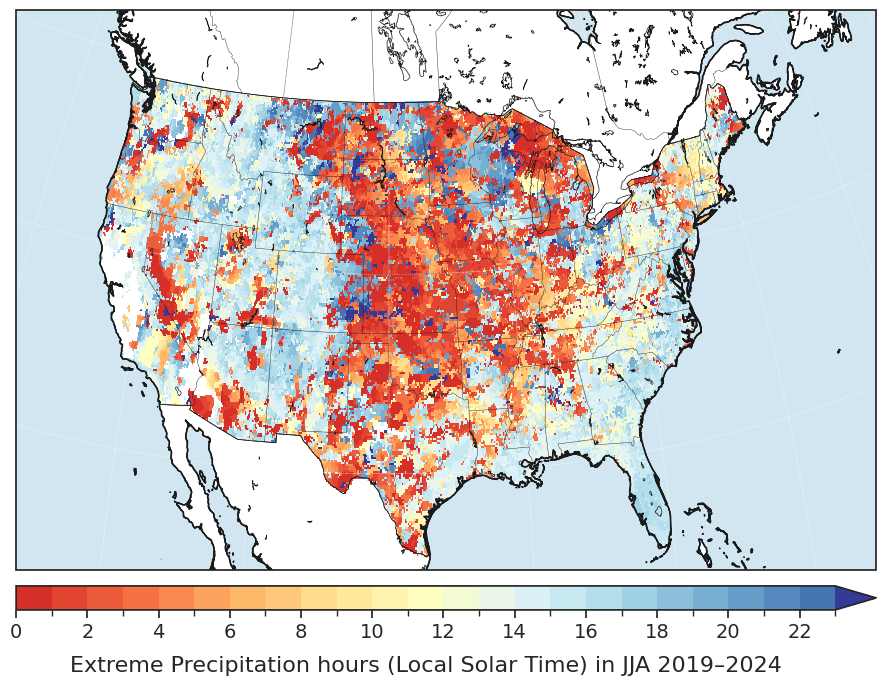

<Figure size 640x480 with 0 Axes>

In [272]:
# colorbar for column1

bounds = np.arange(0,24,4)
cols = plt.get_cmap('RdYlBu')(np.linspace(0.1,0.9,len(bounds)-1))#RdBu 
cmap = mpl.colors.ListedColormap(cols) 
cmap.set_over(plt.get_cmap('RdYlBu')(0.99)) 
cmap.set_under(plt.get_cmap('RdYlBu')(0)) 
norm = mpl.colors.BoundaryNorm(boundaries=bounds, ncolors=len(bounds)-1) 
sm = plt.cm.ScalarMappable(norm=norm,cmap=cmap) 
sm.set_array([]) 

extent_lonlat = (-126, -65, 23, 51) #extent_lonlat = (-126, -65, 23, 51)
ocean_color = np.float64([209,230,241])/255

latmin, latmax =  30, 45
lonmin, lonmax = -105, -85 

sns.set(font_scale=1.7, style="dark")

fig = plt.figure(figsize=(10,8),tight_layout = True) #8,10;,tight_layout = True
ncols = 1
nrows = 1
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, figure=fig)
gs.update(left = 0.1, right=0.96,top=0.9,bottom=0.2,wspace=0.1, hspace=0)
bottoms, tops, lefts, rights = gs.get_grid_positions(fig)

axes = []
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none')

newcoast = cfeature.NaturalEarthFeature('physical', 'coastline', '10m',
                                        edgecolor='k',facecolor='none')
newlake = cfeature.NaturalEarthFeature('physical', 'lakes', '10m',edgecolor='k', facecolor='none')
plt.rcParams["axes.edgecolor"] = "0.15"

for i in range(nrows):
    for j in range(ncols):        

        ax= fig.add_subplot(gs[i,j], projection= ccrs.Orthographic(central_longitude=-100, central_latitude=25, globe=None))
        ax.pcolormesh(data_array_test.longitude.values, data_array_test.latitude.values, np.where(mask, data_array_test.hour,  np.nan),transform=ccrs.PlateCarree(),cmap=cmap,norm=norm) #Regrid1Deg[0,:,:];mask_concat[0,:,:]

       
        ax.coastlines()
        ax.set_global()
        ax.set_extent(extent_lonlat, crs=ccrs.PlateCarree())
        ax.gridlines(xlocs=np.arange(-180,190,10),ylocs=np.arange(-180,190,10),linestyle="--",linewidth=0.3)
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(states_provinces, linewidth=0.3, linestyle='-', edgecolor='k')
        ax.add_feature(newcoast, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(newlake, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.LAND,color='w',zorder=0,edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN,color=ocean_color,zorder=0,edgecolor='k')
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN,color=ocean_color,zorder=1)
        ax.add_feature(newcoast, linewidth=1, linestyle='-', zorder=2,edgecolor='k')

        ax.set_aspect("auto") 
        axes.append(ax)


# Create axes for the colorbar on the same place. 
cbar_ax = fig.add_axes([lefts[0],0.15,rights[0]-lefts[0],0.03]) #[left, bottom, width, height]  
cb = fig.colorbar(sm,cax=cbar_ax,orientation="horizontal",pad=0.02,ticks=bounds[::2],use_gridspec=True,extend="max",fraction=0.1) #drawedges=True, 
cb.ax.set_xticklabels(bounds[::2], size=14)
cb.ax.set_xlabel(r"Extreme Precipitation hours (Local Solar Time) in JJA 2019–2024", size=16, labelpad=10) 

fig1 = plt.gcf()
# plt.tight_layout()
plt.show()
plt.draw()

# fig.savefig('HourlyP06utc.jpg', dpi=300, bbox_inches = "tight")

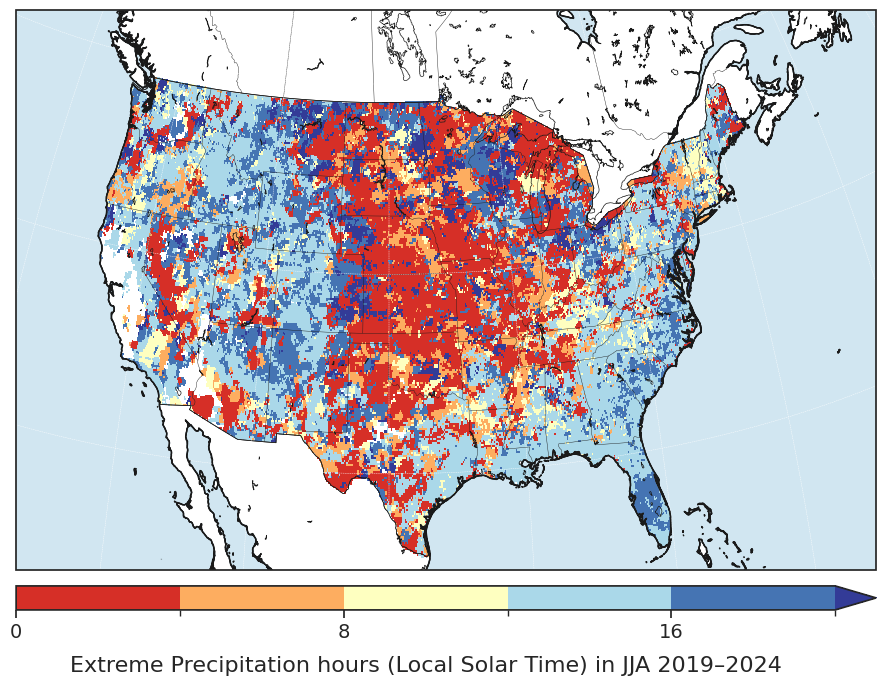

<Figure size 640x480 with 0 Axes>

In [275]:
# colorbar for column1

bounds = np.arange(0,24,4)
cols = plt.get_cmap('RdYlBu')(np.linspace(0.1,0.9,len(bounds)-1))#RdBu 
cmap = mpl.colors.ListedColormap(cols) 
cmap.set_over(plt.get_cmap('RdYlBu')(0.99)) 
cmap.set_under(plt.get_cmap('RdYlBu')(0)) 
norm = mpl.colors.BoundaryNorm(boundaries=bounds, ncolors=len(bounds)-1) 
sm = plt.cm.ScalarMappable(norm=norm,cmap=cmap) 
sm.set_array([]) 

extent_lonlat = (-126, -65, 23, 51) #extent_lonlat = (-126, -65, 23, 51)
ocean_color = np.float64([209,230,241])/255

latmin, latmax =  30, 45
lonmin, lonmax = -105, -85 

sns.set(font_scale=1.7, style="dark")

fig = plt.figure(figsize=(10,8),tight_layout = True) #8,10;,tight_layout = True
ncols = 1
nrows = 1
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, figure=fig)
gs.update(left = 0.1, right=0.96,top=0.9,bottom=0.2,wspace=0.1, hspace=0)
bottoms, tops, lefts, rights = gs.get_grid_positions(fig)

axes = []
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none')

newcoast = cfeature.NaturalEarthFeature('physical', 'coastline', '10m',
                                        edgecolor='k',facecolor='none')
newlake = cfeature.NaturalEarthFeature('physical', 'lakes', '10m',edgecolor='k', facecolor='none')
plt.rcParams["axes.edgecolor"] = "0.15"

for i in range(nrows):
    for j in range(ncols):        

        ax= fig.add_subplot(gs[i,j], projection= ccrs.Orthographic(central_longitude=-100, central_latitude=25, globe=None))
        ax.pcolormesh(data_array_test.longitude.values, data_array_test.latitude.values, np.where(mask, data_array_test.hour,  np.nan),transform=ccrs.PlateCarree(),cmap=cmap,norm=norm) #Regrid1Deg[0,:,:];mask_concat[0,:,:]

       
        ax.coastlines()
        ax.set_global()
        ax.set_extent(extent_lonlat, crs=ccrs.PlateCarree())
        ax.gridlines(xlocs=np.arange(-180,190,10),ylocs=np.arange(-180,190,10),linestyle="--",linewidth=0.3)
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(states_provinces, linewidth=0.3, linestyle='-', edgecolor='k')
        ax.add_feature(newcoast, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(newlake, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.LAND,color='w',zorder=0,edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN,color=ocean_color,zorder=0,edgecolor='k')
        ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle='-', edgecolor='k')
        ax.add_feature(cartopy.feature.OCEAN,color=ocean_color,zorder=1)
        ax.add_feature(newcoast, linewidth=1, linestyle='-', zorder=2,edgecolor='k')

        ax.set_aspect("auto") 
        axes.append(ax)


# Create axes for the colorbar on the same place. 
cbar_ax = fig.add_axes([lefts[0],0.15,rights[0]-lefts[0],0.03]) #[left, bottom, width, height]  
cb = fig.colorbar(sm,cax=cbar_ax,orientation="horizontal",pad=0.02,ticks=bounds[::2],use_gridspec=True,extend="max",fraction=0.1) #drawedges=True, 
cb.ax.set_xticklabels(bounds[::2], size=14)
cb.ax.set_xlabel(r"Extreme Precipitation hours (Local Solar Time) in JJA 2019–2024", size=16, labelpad=10) 

fig1 = plt.gcf()
# plt.tight_layout()
plt.show()
plt.draw()

# fig.savefig('HourlyP06utc.jpg', dpi=300, bbox_inches = "tight")